In [3]:
from tensorflow.keras.layers import Activation, Dense, concatenate
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.layers import Reshape, Conv2DTranspose, MaxPooling2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Model
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import load_model
from tensorflow import convert_to_tensor
from tensorflow import float32 as tf_float32
#from tensorflow.keras.datasets import cifar10
from tensorflow.keras.datasets import fashion_mnist

In [4]:
import numpy as np
import math
import matplotlib.pyplot as plt
import os
import argparse
from sklearn.preprocessing import OneHotEncoder

In [5]:
def build_generator(inputs, labels, image_size):
    """Build a Generator Model

    Stack of BN-ReLU-Conv2DTranpose to generate fake images
    Output activation is sigmoid instead of tanh.
    Sigmoid converges easily.

    Arguments:
        inputs (Layer): Input layer of the generator 
            the z-vector)
        image_size (tensor): Target size of one side
            (assuming square image)

    Returns:
        generator (Model): Generator Model
    """

    image_resize = image_size // 4
    # network parameters 
    kernel_size = 5
    layer_filters = [128, 64, 32, 1]

    x = concatenate([inputs, labels], axis=1)
    #x = Dense((image_resize // 4) * (image_resize // 4) * layer_filters[0])(x)
    #x = Reshape(((image_resize // 4), (image_resize // 4), layer_filters[0]))(x)
    x = Dense((image_resize // 2) * (image_resize // 2) * layer_filters[2])(x)
    x = Dense(image_resize * image_resize * layer_filters[0])(x)
    x = Reshape((image_resize, image_resize, layer_filters[0]))(x)
    #x = Conv2D(filters=layer_filters[0],
                  # kernel_size=kernel_size,
                  # strides=1,
                  # padding='same')(x)
    for filters in layer_filters:
        # first two convolution layers use strides = 2
        # the last two use strides = 1
       
        if filters > layer_filters[-2]:
            strides = 2
        else:
            strides = 1
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv2DTranspose(filters=filters,
                            kernel_size=kernel_size,
                            strides=strides,
                            padding='same')(x)
        #if filters == layer_filters[-1]:
        #    x = Activation('relu')(x)
        #    x = Conv2D(filters=filters,
        #               kernel_size=kernel_size,
        #               strides=1,
        #               padding='same')(x)

    x = Activation('sigmoid')(x)
    generator = Model([inputs, labels], x, name='generator')
    return generator

In [6]:
def build_discriminator(inputs, labels, image_size):
    """Build a Discriminator Model

    Stack of LeakyReLU-Conv2D to discriminate real from fake.
    The network does not converge with BN so it is not used here
    unlike in original paper.

    Arguments:
        inputs (Layer): Input layer of the discriminator (the image)

    Returns:
        discriminator (Model): Discriminator Model
    """
    kernel_size = 5
    layer_filters = [32, 64, 128, 256]

    x = inputs
    #y = Dense((image_size // 8) * (image_size // 8) * 1)(labels)
    y = Dense((image_size // 2) * (image_size // 2) * 1)(labels)
    y = Dense(image_size * image_size * 1)(y)
    y = Reshape((image_size, image_size, 1))(y)
    x = concatenate([x, y])
    for filters in layer_filters:
        # first 3 convolution layers use strides = 2
        # last one uses strides = 1
        if filters == layer_filters[-1]:
            strides = 1
        else:
            strides = 2
        x = LeakyReLU(alpha=0.2)(x)
        x = Conv2D(filters=filters,
                   kernel_size=kernel_size,
                   strides=strides,
                   padding='same')(x)

    x = Flatten()(x)
    x = Dense(1)(x)
    x = Activation('sigmoid')(x)
    discriminator = Model([inputs, labels], x, name='discriminator')
    return discriminator

In [7]:
discriminator_loss = []
adversarial_loss = []
def train(models, train, params):
  
    """Train the Discriminator and Adversarial Networks

    Alternately train Discriminator and Adversarial networks by batch.
    Discriminator is trained first with properly real and fake images.
    Adversarial is trained next with fake images pretending to be real
    Generate sample images per save_interval.

    Arguments:
        models (list): Generator, Discriminator, Adversarial models
        x_train (tensor): Train images
        params (list) : Networks parameters

    """
    x_train, y_train = train
    #print(x_train)
    
    # the GAN component models
    generator, discriminator, adversarial = models
    # network parameters
    batch_size, latent_size, train_steps, num_labels, model_name = params
    # the generator image is saved every 500 steps
    save_interval = 200
    # noise vector to see how the generator output evolves during training
    noise_input = np.random.uniform(-1.0, 1.0, size=[16, latent_size])
    # one-hot label the noise will be conditioned to
    noise_class = np.eye(num_labels)[np.arange(0, 16) % num_labels]
    # number of elements in train dataset
    train_size = x_train.shape[0]
    print(model_name,
          "Labels for generated images: ",
          np.argmax(noise_class, axis=1))
    for i in range(train_steps):
        # train the discriminator for 1 batch
        # 1 batch of real (label=1.0) and fake images (label=0.0)
        # randomly pick real images from dataset
        rand_indexes = np.random.randint(0, train_size, size=batch_size)
        real_images = x_train[rand_indexes]
        # corresponding one-hot labels of real images
        real_labels = y_train[rand_indexes]
        # generate fake images from noise using generator 
        # generate noise using uniform distribution
        if i%1 == 0:
            noise = np.random.uniform(-1.0,
                                      1.0,
                                      size=[batch_size, latent_size])
            # assign random one-hot labels
            fake_labels = np.eye(num_labels)[np.random.choice(num_labels,
                                                              batch_size)]

            # generate fake images
            fake_images = generator.predict([noise, fake_labels])
            # real + fake images = 1 batch of train data
            x = np.concatenate((real_images, fake_images))
            # real + fake one-hot labels = 1 batch of train one-hot labels

            #real_labels = enc.transform(real_labels)
            labels = np.concatenate((real_labels, fake_labels))
            # label real and fake images
            # real images label is 1.0
            y = np.ones([2 * batch_size, 1])
            # fake images label is 0.0
            y[batch_size:, :] = 0.0
            # train discriminator network, log the loss and accuracy
            #print('x.shape', x.shape)
            #print('labels.shape', labels.shape)
            loss, acc = discriminator.train_on_batch([x, labels], y)
            log = "%d: [discriminator loss: %f, acc: %f]" % (i, loss, acc)

            discriminator_loss.append(loss)
        # train the adversarial network for 1 batch
        # 1 batch of fake images with label=1.0
        # since the discriminator weights 
        # are frozen in adversarial network
        # only the generator is trained
        # generate noise using uniform distribution
        if i%1 == 0:
            noise = np.random.uniform(-1.0,
                                      1.0, 
                                      size=[batch_size, latent_size])
            # assign random one-hot labels
            fake_labels = np.eye(num_labels)[np.random.choice(num_labels,
                                                              batch_size)]
            # label fake images as real or 1.0
            y = np.ones([batch_size, 1])
            # train the adversarial network 
            # note that unlike in discriminator training, 
            # we do not save the fake images in a variable
            # the fake images go to the discriminator input of the adversarial
            # for classification
            # log the loss and accuracy
            loss, acc = adversarial.train_on_batch([noise, fake_labels], y)
            log = "%s [adversarial loss: %f, acc: %f]" % (log, loss, acc)
            adversarial_loss.append(loss)
        
        print(log)
        if (i + 1) % save_interval == 0:
            # plot generator images on a periodic basis
            plot_images(generator,
                        noise_input=noise_input,
                        noise_class=noise_class,
                        show=True,
                        step=(i + 1),
                        model_name=model_name)
   
    # save the model after training the generator
    # the trained generator can be reloaded for 
    # future MNIST digit generation
    generator.save(model_name + ".h5")
    
    
    return discriminator_loss,adversarial_loss

In [8]:
def plot_images(generator,
                noise_input,
                noise_class,
                show=False,
                step=0,
                model_name="gan"):
    """Generate fake images and plot them

    For visualization purposes, generate fake images
    then plot them in a square grid

    Arguments:
        generator (Model): The Generator Model for 
            fake images generation
        noise_input (ndarray): Array of z-vectors
        show (bool): Whether to show plot or not
        step (int): Appended to filename of the save images
        model_name (string): Model name

    """
    os.makedirs(model_name, exist_ok=True)
    filename = os.path.join(model_name, "%05d.png" % step)
    images = generator.predict([noise_input, noise_class])
    plt.figure(figsize=(4.4, 4.4))
    num_images = images.shape[0]
    image_size = images.shape[1]
    rows = int(math.sqrt(noise_input.shape[0]))
    for i in range(num_images):
        plt.subplot(rows, rows, i + 1)
        image = np.reshape(images[i], [image_size, image_size, 1])
        plt.imshow(image, cmap='gray')
        plt.axis('off')
    plt.savefig(filename)
    if show:
        plt.show()
    else:
        plt.close('all')

In [12]:
def build_and_train_models():
    # load MNIST dataset
    #(x_train, y_train), (_, _) = mnist.load_data()
    #x_train, y_train = read_data()
    (x_train, y_train), (_, _) = fashion_mnist.load_data()
    # reshape data for CNN as (28, 28, 1) and normalize
    image_size = x_train.shape[1]
    x_train = np.reshape(x_train, [-1, image_size, image_size, 1])
    x_train = x_train.astype('float32') / 255
    print('x_train', x_train.shape)
    # reshape data and OneHotEncoding
    num_labels = 10
    y_train = y_train.reshape(-1,1)
    enc = OneHotEncoder(handle_unknown='ignore')
    enc.fit(y_train)
    labels = enc.transform(y_train)
    #labels = labels.reshape(y_train.shape[0],num_labels)
    labels = labels.toarray()
    y_train = labels
    model_name = "dcgan_fashion_mnist"
    # network parameters
    # the latent or z vector is 100-dim
    latent_size = 128
    batch_size = 64
    train_steps = 50000
    num_labels = len(y_train[0])
    lr = 2e-5
    decay = 6e-8
    input_shape = (image_size, image_size, 1)
    label_shape = (len(y_train[0]))
    # build discriminator model
    inputs = Input(shape=input_shape, name='discriminator_input')
    labels = Input(shape=label_shape, name='discriminator_label')
    discriminator = build_discriminator(inputs, labels, image_size)
    # [1] or original paper uses Adam, 
    # but discriminator converges easily with RMSprop
    optimizer = RMSprop(lr=lr, decay=decay)
    discriminator.compile(loss='binary_crossentropy',
                          optimizer=optimizer,
                          metrics=['accuracy'])
    discriminator.summary()

    # build generator model
    input_shape = (latent_size, )
    inputs = Input(shape=input_shape, name='z_input')
    labels = Input(shape=label_shape, name='z_label')
    generator = build_generator(inputs, labels, image_size)
    generator.summary()

    # build adversarial model
    optimizer = RMSprop(lr=lr * 0.5, decay=decay * 0.5)
    # freeze the weights of discriminator during adversarial training
    discriminator.trainable = False
    # adversarial = generator + discriminator
    adversarial = Model([inputs, labels], 
                        discriminator([generator([inputs, labels]), labels]),
                        name=model_name)
    adversarial.compile(loss='binary_crossentropy',
                        optimizer=optimizer,
                        metrics=['accuracy'])
    adversarial.summary()

    # train discriminator and adversarial networks
    models = (generator, discriminator, adversarial)
    params = (batch_size, latent_size, train_steps, num_labels, model_name)
    train(models, [x_train, y_train], params)

In [13]:
def test_generator(generator):
    noise_input = np.random.uniform(-1.0, 1.0, size=[16, 100])
    fake_labels = np.eye(num_labels)[np.random.choice(num_labels,
                                                      batch_size)]
    plot_images(generator,
                noise_input=noise_input,
                fake_labels=fake_labels,
                show=True,
                model_name="test_outputs")

The time used to execute this is given below
x_train (60000, 28, 28, 1)
Model: "discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
discriminator_label (InputLayer [(None, 10)]         0                                            
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 196)          2156        discriminator_label[0][0]        
__________________________________________________________________________________________________
dense_6 (Dense)                 (None, 784)          154448      dense_5[0][0]                    
__________________________________________________________________________________________________
discriminator_input (InputLayer [(None, 28, 28, 1)]  0                                            
______________

Model: "dcgan_fashion_mnist"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
z_input (InputLayer)            [(None, 128)]        0                                            
__________________________________________________________________________________________________
z_label (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
generator (Model)               (None, 28, 28, 1)    2520673     z_input[0][0]                    
                                                                 z_label[0][0]                    
__________________________________________________________________________________________________
discriminator (Model)           (None, 1)            1237981     generator[1][0]

72: [discriminator loss: 0.282196, acc: 0.984375] [adversarial loss: 0.562428, acc: 1.000000]
73: [discriminator loss: 0.276093, acc: 1.000000] [adversarial loss: 0.563889, acc: 1.000000]
74: [discriminator loss: 0.268517, acc: 0.984375] [adversarial loss: 0.531071, acc: 1.000000]
75: [discriminator loss: 0.287213, acc: 0.992188] [adversarial loss: 0.499752, acc: 1.000000]
76: [discriminator loss: 0.278800, acc: 0.984375] [adversarial loss: 0.521033, acc: 1.000000]
77: [discriminator loss: 0.281401, acc: 0.976562] [adversarial loss: 0.470756, acc: 1.000000]
78: [discriminator loss: 0.245080, acc: 1.000000] [adversarial loss: 0.486266, acc: 1.000000]
79: [discriminator loss: 0.270309, acc: 0.976562] [adversarial loss: 0.481668, acc: 1.000000]
80: [discriminator loss: 0.248385, acc: 0.984375] [adversarial loss: 0.488913, acc: 1.000000]
81: [discriminator loss: 0.255398, acc: 0.984375] [adversarial loss: 0.466130, acc: 1.000000]
82: [discriminator loss: 0.250165, acc: 0.984375] [adversari

159: [discriminator loss: 0.099182, acc: 0.984375] [adversarial loss: 0.031810, acc: 1.000000]
160: [discriminator loss: 0.087676, acc: 1.000000] [adversarial loss: 0.035987, acc: 1.000000]
161: [discriminator loss: 0.070806, acc: 1.000000] [adversarial loss: 0.042793, acc: 1.000000]
162: [discriminator loss: 0.113980, acc: 0.984375] [adversarial loss: 0.021448, acc: 1.000000]
163: [discriminator loss: 0.077128, acc: 1.000000] [adversarial loss: 0.036343, acc: 1.000000]
164: [discriminator loss: 0.087553, acc: 0.984375] [adversarial loss: 0.031073, acc: 1.000000]
165: [discriminator loss: 0.114888, acc: 0.968750] [adversarial loss: 0.021772, acc: 1.000000]
166: [discriminator loss: 0.116885, acc: 0.976562] [adversarial loss: 0.016535, acc: 1.000000]
167: [discriminator loss: 0.121557, acc: 0.968750] [adversarial loss: 0.021455, acc: 1.000000]
168: [discriminator loss: 0.093696, acc: 0.984375] [adversarial loss: 0.022416, acc: 1.000000]
169: [discriminator loss: 0.109104, acc: 0.984375]

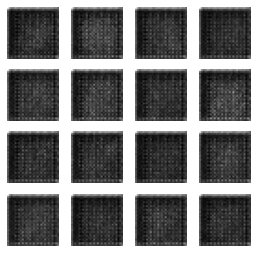

200: [discriminator loss: 0.104061, acc: 0.984375] [adversarial loss: 0.002078, acc: 1.000000]
201: [discriminator loss: 0.096269, acc: 0.992188] [adversarial loss: 0.004366, acc: 1.000000]
202: [discriminator loss: 0.129887, acc: 0.976562] [adversarial loss: 0.001530, acc: 1.000000]
203: [discriminator loss: 0.079100, acc: 1.000000] [adversarial loss: 0.003374, acc: 1.000000]
204: [discriminator loss: 0.072255, acc: 0.992188] [adversarial loss: 0.004789, acc: 1.000000]
205: [discriminator loss: 0.110179, acc: 0.968750] [adversarial loss: 0.002885, acc: 1.000000]
206: [discriminator loss: 0.075272, acc: 0.992188] [adversarial loss: 0.005174, acc: 1.000000]
207: [discriminator loss: 0.079709, acc: 0.984375] [adversarial loss: 0.003972, acc: 1.000000]
208: [discriminator loss: 0.113637, acc: 0.984375] [adversarial loss: 0.001818, acc: 1.000000]
209: [discriminator loss: 0.090325, acc: 1.000000] [adversarial loss: 0.002185, acc: 1.000000]
210: [discriminator loss: 0.092849, acc: 0.984375]

291: [discriminator loss: 0.311499, acc: 0.898438] [adversarial loss: 0.002884, acc: 1.000000]
292: [discriminator loss: 0.289417, acc: 0.921875] [adversarial loss: 0.003732, acc: 1.000000]
293: [discriminator loss: 0.291763, acc: 0.906250] [adversarial loss: 0.005907, acc: 1.000000]
294: [discriminator loss: 0.216029, acc: 0.929688] [adversarial loss: 0.009277, acc: 1.000000]
295: [discriminator loss: 0.391358, acc: 0.875000] [adversarial loss: 0.001274, acc: 1.000000]
296: [discriminator loss: 0.298200, acc: 0.882812] [adversarial loss: 0.005595, acc: 1.000000]
297: [discriminator loss: 0.297947, acc: 0.914062] [adversarial loss: 0.005272, acc: 1.000000]
298: [discriminator loss: 0.311507, acc: 0.921875] [adversarial loss: 0.006057, acc: 1.000000]
299: [discriminator loss: 0.389510, acc: 0.859375] [adversarial loss: 0.004256, acc: 1.000000]
300: [discriminator loss: 0.366209, acc: 0.859375] [adversarial loss: 0.012568, acc: 1.000000]
301: [discriminator loss: 0.390687, acc: 0.859375]

379: [discriminator loss: 0.717413, acc: 0.718750] [adversarial loss: 0.237975, acc: 1.000000]
380: [discriminator loss: 0.668761, acc: 0.546875] [adversarial loss: 0.648359, acc: 0.671875]
381: [discriminator loss: 0.494751, acc: 0.843750] [adversarial loss: 0.470088, acc: 0.984375]
382: [discriminator loss: 0.620402, acc: 0.835938] [adversarial loss: 0.452529, acc: 0.984375]
383: [discriminator loss: 0.576157, acc: 0.828125] [adversarial loss: 0.571334, acc: 0.953125]
384: [discriminator loss: 0.585633, acc: 0.851562] [adversarial loss: 0.481319, acc: 1.000000]
385: [discriminator loss: 0.544784, acc: 0.867188] [adversarial loss: 0.473593, acc: 1.000000]
386: [discriminator loss: 0.612289, acc: 0.828125] [adversarial loss: 0.394173, acc: 1.000000]
387: [discriminator loss: 0.659985, acc: 0.820312] [adversarial loss: 0.421089, acc: 1.000000]
388: [discriminator loss: 0.534634, acc: 0.882812] [adversarial loss: 0.699243, acc: 0.500000]
389: [discriminator loss: 0.593832, acc: 0.789062]

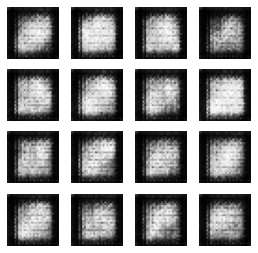

400: [discriminator loss: 0.463572, acc: 0.843750] [adversarial loss: 0.687843, acc: 0.484375]
401: [discriminator loss: 0.610204, acc: 0.804688] [adversarial loss: 0.363644, acc: 1.000000]
402: [discriminator loss: 0.498032, acc: 0.773438] [adversarial loss: 1.032555, acc: 0.015625]
403: [discriminator loss: 0.589059, acc: 0.765625] [adversarial loss: 0.407549, acc: 1.000000]
404: [discriminator loss: 0.553723, acc: 0.789062] [adversarial loss: 0.781342, acc: 0.234375]
405: [discriminator loss: 0.412841, acc: 0.828125] [adversarial loss: 0.767670, acc: 0.296875]
406: [discriminator loss: 0.514200, acc: 0.804688] [adversarial loss: 0.609810, acc: 0.796875]
407: [discriminator loss: 0.507185, acc: 0.843750] [adversarial loss: 0.759860, acc: 0.390625]
408: [discriminator loss: 0.521383, acc: 0.867188] [adversarial loss: 0.690858, acc: 0.562500]
409: [discriminator loss: 0.493038, acc: 0.859375] [adversarial loss: 0.607647, acc: 0.812500]
410: [discriminator loss: 0.473190, acc: 0.867188]

491: [discriminator loss: 0.425098, acc: 0.882812] [adversarial loss: 1.122202, acc: 0.000000]
492: [discriminator loss: 0.401294, acc: 0.929688] [adversarial loss: 1.674710, acc: 0.000000]
493: [discriminator loss: 0.319074, acc: 0.914062] [adversarial loss: 1.448072, acc: 0.000000]
494: [discriminator loss: 0.320343, acc: 0.937500] [adversarial loss: 1.457569, acc: 0.000000]
495: [discriminator loss: 0.356957, acc: 0.921875] [adversarial loss: 1.298327, acc: 0.000000]
496: [discriminator loss: 0.368470, acc: 0.898438] [adversarial loss: 1.353886, acc: 0.000000]
497: [discriminator loss: 0.359510, acc: 0.960938] [adversarial loss: 1.426455, acc: 0.000000]
498: [discriminator loss: 0.312425, acc: 0.929688] [adversarial loss: 1.299963, acc: 0.000000]
499: [discriminator loss: 0.277726, acc: 0.953125] [adversarial loss: 1.624950, acc: 0.000000]
500: [discriminator loss: 0.316590, acc: 0.929688] [adversarial loss: 1.193780, acc: 0.000000]
501: [discriminator loss: 0.294121, acc: 0.960938]

579: [discriminator loss: 0.331967, acc: 0.945312] [adversarial loss: 1.608086, acc: 0.000000]
580: [discriminator loss: 0.297624, acc: 0.968750] [adversarial loss: 1.754448, acc: 0.000000]
581: [discriminator loss: 0.283146, acc: 0.929688] [adversarial loss: 1.520675, acc: 0.000000]
582: [discriminator loss: 0.279853, acc: 0.968750] [adversarial loss: 1.786381, acc: 0.000000]
583: [discriminator loss: 0.318063, acc: 0.921875] [adversarial loss: 1.387170, acc: 0.000000]
584: [discriminator loss: 0.321639, acc: 0.960938] [adversarial loss: 1.981533, acc: 0.000000]
585: [discriminator loss: 0.258545, acc: 0.945312] [adversarial loss: 1.784268, acc: 0.000000]
586: [discriminator loss: 0.311063, acc: 0.914062] [adversarial loss: 1.529328, acc: 0.000000]
587: [discriminator loss: 0.244303, acc: 0.968750] [adversarial loss: 2.101722, acc: 0.000000]
588: [discriminator loss: 0.219174, acc: 0.953125] [adversarial loss: 1.841723, acc: 0.000000]
589: [discriminator loss: 0.230373, acc: 0.960938]

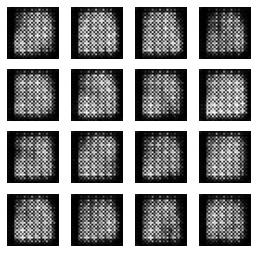

600: [discriminator loss: 0.178884, acc: 0.984375] [adversarial loss: 2.320906, acc: 0.000000]
601: [discriminator loss: 0.248619, acc: 0.921875] [adversarial loss: 1.667712, acc: 0.000000]
602: [discriminator loss: 0.223564, acc: 0.960938] [adversarial loss: 2.772308, acc: 0.000000]
603: [discriminator loss: 0.258516, acc: 0.929688] [adversarial loss: 1.893337, acc: 0.000000]
604: [discriminator loss: 0.267910, acc: 0.945312] [adversarial loss: 2.296882, acc: 0.000000]
605: [discriminator loss: 0.217021, acc: 0.968750] [adversarial loss: 2.304827, acc: 0.000000]
606: [discriminator loss: 0.241471, acc: 0.968750] [adversarial loss: 2.258904, acc: 0.000000]
607: [discriminator loss: 0.239403, acc: 0.968750] [adversarial loss: 2.404659, acc: 0.000000]
608: [discriminator loss: 0.193591, acc: 0.984375] [adversarial loss: 2.491438, acc: 0.000000]
609: [discriminator loss: 0.188621, acc: 0.976562] [adversarial loss: 2.704195, acc: 0.000000]
610: [discriminator loss: 0.232757, acc: 0.945312]

691: [discriminator loss: 0.545081, acc: 0.640625] [adversarial loss: 1.780880, acc: 0.000000]
692: [discriminator loss: 0.481802, acc: 0.820312] [adversarial loss: 1.512582, acc: 0.000000]
693: [discriminator loss: 0.553670, acc: 0.773438] [adversarial loss: 1.513303, acc: 0.015625]
694: [discriminator loss: 0.469020, acc: 0.820312] [adversarial loss: 1.503124, acc: 0.000000]
695: [discriminator loss: 0.472489, acc: 0.835938] [adversarial loss: 1.488285, acc: 0.000000]
696: [discriminator loss: 0.413181, acc: 0.851562] [adversarial loss: 1.503542, acc: 0.000000]
697: [discriminator loss: 0.388023, acc: 0.906250] [adversarial loss: 1.833356, acc: 0.000000]
698: [discriminator loss: 0.395667, acc: 0.851562] [adversarial loss: 1.520309, acc: 0.000000]
699: [discriminator loss: 0.381714, acc: 0.898438] [adversarial loss: 1.556429, acc: 0.000000]
700: [discriminator loss: 0.345941, acc: 0.929688] [adversarial loss: 1.828163, acc: 0.000000]
701: [discriminator loss: 0.324215, acc: 0.914062]

781: [discriminator loss: 0.452605, acc: 0.812500] [adversarial loss: 1.278410, acc: 0.046875]
782: [discriminator loss: 0.575147, acc: 0.710938] [adversarial loss: 1.187042, acc: 0.078125]
783: [discriminator loss: 0.619592, acc: 0.742188] [adversarial loss: 0.851311, acc: 0.375000]
784: [discriminator loss: 0.467907, acc: 0.734375] [adversarial loss: 1.400666, acc: 0.031250]
785: [discriminator loss: 0.529472, acc: 0.781250] [adversarial loss: 0.931016, acc: 0.265625]
786: [discriminator loss: 0.534708, acc: 0.718750] [adversarial loss: 1.157780, acc: 0.109375]
787: [discriminator loss: 0.552681, acc: 0.789062] [adversarial loss: 1.048473, acc: 0.203125]
788: [discriminator loss: 0.543146, acc: 0.726562] [adversarial loss: 0.983183, acc: 0.218750]
789: [discriminator loss: 0.609410, acc: 0.640625] [adversarial loss: 0.941188, acc: 0.281250]
790: [discriminator loss: 0.640018, acc: 0.617188] [adversarial loss: 1.094269, acc: 0.203125]
791: [discriminator loss: 0.547517, acc: 0.718750]

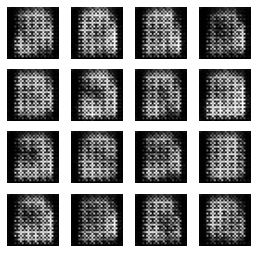

800: [discriminator loss: 0.564423, acc: 0.781250] [adversarial loss: 0.909799, acc: 0.281250]
801: [discriminator loss: 0.673934, acc: 0.601562] [adversarial loss: 0.747359, acc: 0.453125]
802: [discriminator loss: 0.571685, acc: 0.648438] [adversarial loss: 1.123031, acc: 0.078125]
803: [discriminator loss: 0.506804, acc: 0.757812] [adversarial loss: 1.221933, acc: 0.015625]
804: [discriminator loss: 0.566321, acc: 0.726562] [adversarial loss: 1.294814, acc: 0.031250]
805: [discriminator loss: 0.521891, acc: 0.781250] [adversarial loss: 1.143963, acc: 0.046875]
806: [discriminator loss: 0.593320, acc: 0.765625] [adversarial loss: 0.924108, acc: 0.296875]
807: [discriminator loss: 0.569358, acc: 0.695312] [adversarial loss: 1.147846, acc: 0.031250]
808: [discriminator loss: 0.534325, acc: 0.742188] [adversarial loss: 0.923251, acc: 0.218750]
809: [discriminator loss: 0.503314, acc: 0.695312] [adversarial loss: 1.299344, acc: 0.015625]
810: [discriminator loss: 0.435433, acc: 0.796875]

890: [discriminator loss: 0.222592, acc: 0.937500] [adversarial loss: 1.490515, acc: 0.015625]
891: [discriminator loss: 0.266145, acc: 0.898438] [adversarial loss: 2.280697, acc: 0.000000]
892: [discriminator loss: 0.253305, acc: 0.929688] [adversarial loss: 1.454121, acc: 0.000000]
893: [discriminator loss: 0.291914, acc: 0.921875] [adversarial loss: 1.941316, acc: 0.000000]
894: [discriminator loss: 0.298555, acc: 0.937500] [adversarial loss: 1.566858, acc: 0.046875]
895: [discriminator loss: 0.280027, acc: 0.921875] [adversarial loss: 2.555867, acc: 0.000000]
896: [discriminator loss: 0.361192, acc: 0.820312] [adversarial loss: 1.298499, acc: 0.078125]
897: [discriminator loss: 0.386769, acc: 0.867188] [adversarial loss: 1.811984, acc: 0.000000]
898: [discriminator loss: 0.293965, acc: 0.914062] [adversarial loss: 2.030410, acc: 0.000000]
899: [discriminator loss: 0.434116, acc: 0.796875] [adversarial loss: 0.924628, acc: 0.265625]
900: [discriminator loss: 0.396731, acc: 0.773438]

979: [discriminator loss: 0.355395, acc: 0.859375] [adversarial loss: 1.763454, acc: 0.062500]
980: [discriminator loss: 0.354725, acc: 0.835938] [adversarial loss: 1.252856, acc: 0.218750]
981: [discriminator loss: 0.411091, acc: 0.804688] [adversarial loss: 1.123426, acc: 0.203125]
982: [discriminator loss: 0.352955, acc: 0.843750] [adversarial loss: 1.774228, acc: 0.015625]
983: [discriminator loss: 0.379558, acc: 0.859375] [adversarial loss: 1.461411, acc: 0.093750]
984: [discriminator loss: 0.337527, acc: 0.859375] [adversarial loss: 1.444638, acc: 0.140625]
985: [discriminator loss: 0.362213, acc: 0.851562] [adversarial loss: 1.755911, acc: 0.031250]
986: [discriminator loss: 0.379239, acc: 0.828125] [adversarial loss: 1.339124, acc: 0.156250]
987: [discriminator loss: 0.381013, acc: 0.843750] [adversarial loss: 1.400835, acc: 0.140625]
988: [discriminator loss: 0.337128, acc: 0.898438] [adversarial loss: 1.467400, acc: 0.156250]
989: [discriminator loss: 0.369643, acc: 0.835938]

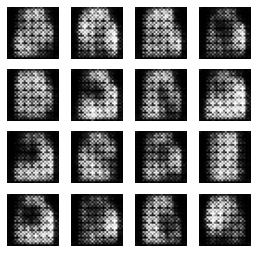

1000: [discriminator loss: 0.322635, acc: 0.859375] [adversarial loss: 1.805019, acc: 0.046875]
1001: [discriminator loss: 0.337504, acc: 0.843750] [adversarial loss: 1.667234, acc: 0.062500]
1002: [discriminator loss: 0.284435, acc: 0.890625] [adversarial loss: 2.150600, acc: 0.000000]
1003: [discriminator loss: 0.320413, acc: 0.843750] [adversarial loss: 1.436056, acc: 0.125000]
1004: [discriminator loss: 0.281110, acc: 0.890625] [adversarial loss: 2.215157, acc: 0.015625]
1005: [discriminator loss: 0.279035, acc: 0.882812] [adversarial loss: 1.566175, acc: 0.046875]
1006: [discriminator loss: 0.280838, acc: 0.898438] [adversarial loss: 2.126264, acc: 0.062500]
1007: [discriminator loss: 0.310450, acc: 0.851562] [adversarial loss: 1.432546, acc: 0.109375]
1008: [discriminator loss: 0.289547, acc: 0.882812] [adversarial loss: 2.057525, acc: 0.031250]
1009: [discriminator loss: 0.281422, acc: 0.875000] [adversarial loss: 2.326170, acc: 0.031250]
1010: [discriminator loss: 0.278418, acc

1086: [discriminator loss: 0.380265, acc: 0.828125] [adversarial loss: 1.276063, acc: 0.171875]
1087: [discriminator loss: 0.441914, acc: 0.796875] [adversarial loss: 1.672321, acc: 0.078125]
1088: [discriminator loss: 0.439925, acc: 0.789062] [adversarial loss: 1.208585, acc: 0.328125]
1089: [discriminator loss: 0.421405, acc: 0.765625] [adversarial loss: 1.791633, acc: 0.125000]
1090: [discriminator loss: 0.366658, acc: 0.835938] [adversarial loss: 1.469646, acc: 0.171875]
1091: [discriminator loss: 0.378552, acc: 0.867188] [adversarial loss: 1.598989, acc: 0.109375]
1092: [discriminator loss: 0.473468, acc: 0.765625] [adversarial loss: 1.499422, acc: 0.156250]
1093: [discriminator loss: 0.390933, acc: 0.859375] [adversarial loss: 1.417558, acc: 0.265625]
1094: [discriminator loss: 0.393386, acc: 0.812500] [adversarial loss: 1.376766, acc: 0.218750]
1095: [discriminator loss: 0.387949, acc: 0.835938] [adversarial loss: 1.408076, acc: 0.218750]
1096: [discriminator loss: 0.457378, acc

1172: [discriminator loss: 0.526292, acc: 0.750000] [adversarial loss: 0.874698, acc: 0.484375]
1173: [discriminator loss: 0.485533, acc: 0.750000] [adversarial loss: 1.145861, acc: 0.218750]
1174: [discriminator loss: 0.431133, acc: 0.796875] [adversarial loss: 0.955323, acc: 0.359375]
1175: [discriminator loss: 0.472424, acc: 0.742188] [adversarial loss: 0.902066, acc: 0.343750]
1176: [discriminator loss: 0.542243, acc: 0.718750] [adversarial loss: 0.758725, acc: 0.531250]
1177: [discriminator loss: 0.547667, acc: 0.687500] [adversarial loss: 1.211612, acc: 0.250000]
1178: [discriminator loss: 0.620391, acc: 0.695312] [adversarial loss: 0.695822, acc: 0.531250]
1179: [discriminator loss: 0.551958, acc: 0.742188] [adversarial loss: 1.117712, acc: 0.203125]
1180: [discriminator loss: 0.503828, acc: 0.757812] [adversarial loss: 0.644314, acc: 0.578125]
1181: [discriminator loss: 0.599516, acc: 0.671875] [adversarial loss: 1.067365, acc: 0.281250]
1182: [discriminator loss: 0.529816, acc

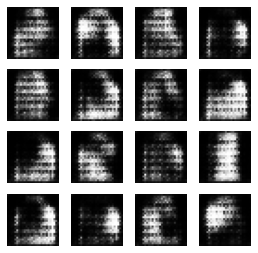

1200: [discriminator loss: 0.608566, acc: 0.632812] [adversarial loss: 0.674936, acc: 0.562500]
1201: [discriminator loss: 0.566138, acc: 0.710938] [adversarial loss: 0.867067, acc: 0.453125]
1202: [discriminator loss: 0.568023, acc: 0.726562] [adversarial loss: 0.928185, acc: 0.390625]
1203: [discriminator loss: 0.556812, acc: 0.664062] [adversarial loss: 0.784302, acc: 0.546875]
1204: [discriminator loss: 0.565212, acc: 0.726562] [adversarial loss: 0.919382, acc: 0.390625]
1205: [discriminator loss: 0.488744, acc: 0.757812] [adversarial loss: 1.014157, acc: 0.343750]
1206: [discriminator loss: 0.478265, acc: 0.757812] [adversarial loss: 0.661724, acc: 0.625000]
1207: [discriminator loss: 0.622204, acc: 0.632812] [adversarial loss: 1.099046, acc: 0.250000]
1208: [discriminator loss: 0.566749, acc: 0.695312] [adversarial loss: 0.814155, acc: 0.468750]
1209: [discriminator loss: 0.500242, acc: 0.750000] [adversarial loss: 0.936961, acc: 0.390625]
1210: [discriminator loss: 0.560191, acc

1288: [discriminator loss: 0.558849, acc: 0.726562] [adversarial loss: 0.803587, acc: 0.500000]
1289: [discriminator loss: 0.509617, acc: 0.703125] [adversarial loss: 1.059703, acc: 0.171875]
1290: [discriminator loss: 0.539013, acc: 0.750000] [adversarial loss: 0.786613, acc: 0.484375]
1291: [discriminator loss: 0.493971, acc: 0.734375] [adversarial loss: 1.156431, acc: 0.296875]
1292: [discriminator loss: 0.488432, acc: 0.757812] [adversarial loss: 0.849211, acc: 0.437500]
1293: [discriminator loss: 0.494958, acc: 0.773438] [adversarial loss: 0.924295, acc: 0.468750]
1294: [discriminator loss: 0.607628, acc: 0.687500] [adversarial loss: 0.900243, acc: 0.406250]
1295: [discriminator loss: 0.486821, acc: 0.781250] [adversarial loss: 1.153383, acc: 0.250000]
1296: [discriminator loss: 0.465916, acc: 0.796875] [adversarial loss: 0.773860, acc: 0.484375]
1297: [discriminator loss: 0.529326, acc: 0.687500] [adversarial loss: 1.074579, acc: 0.296875]
1298: [discriminator loss: 0.492890, acc

1376: [discriminator loss: 0.590845, acc: 0.671875] [adversarial loss: 1.454175, acc: 0.109375]
1377: [discriminator loss: 0.515078, acc: 0.812500] [adversarial loss: 1.242434, acc: 0.203125]
1378: [discriminator loss: 0.588676, acc: 0.679688] [adversarial loss: 1.422276, acc: 0.109375]
1379: [discriminator loss: 0.466766, acc: 0.820312] [adversarial loss: 1.212636, acc: 0.187500]
1380: [discriminator loss: 0.498976, acc: 0.734375] [adversarial loss: 1.388517, acc: 0.171875]
1381: [discriminator loss: 0.507985, acc: 0.750000] [adversarial loss: 1.219467, acc: 0.250000]
1382: [discriminator loss: 0.519771, acc: 0.757812] [adversarial loss: 1.656692, acc: 0.140625]
1383: [discriminator loss: 0.609878, acc: 0.757812] [adversarial loss: 0.840841, acc: 0.515625]
1384: [discriminator loss: 0.488253, acc: 0.789062] [adversarial loss: 1.437111, acc: 0.109375]
1385: [discriminator loss: 0.532802, acc: 0.757812] [adversarial loss: 1.037158, acc: 0.281250]
1386: [discriminator loss: 0.523889, acc

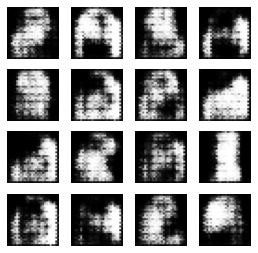

1400: [discriminator loss: 0.529501, acc: 0.742188] [adversarial loss: 1.568210, acc: 0.078125]
1401: [discriminator loss: 0.555555, acc: 0.718750] [adversarial loss: 0.968044, acc: 0.359375]
1402: [discriminator loss: 0.515743, acc: 0.703125] [adversarial loss: 1.568137, acc: 0.078125]
1403: [discriminator loss: 0.513289, acc: 0.757812] [adversarial loss: 1.185939, acc: 0.187500]
1404: [discriminator loss: 0.589758, acc: 0.671875] [adversarial loss: 1.344349, acc: 0.234375]
1405: [discriminator loss: 0.472764, acc: 0.789062] [adversarial loss: 1.566217, acc: 0.078125]
1406: [discriminator loss: 0.567468, acc: 0.734375] [adversarial loss: 1.243344, acc: 0.187500]
1407: [discriminator loss: 0.528939, acc: 0.750000] [adversarial loss: 1.397587, acc: 0.218750]
1408: [discriminator loss: 0.487526, acc: 0.742188] [adversarial loss: 1.304198, acc: 0.187500]
1409: [discriminator loss: 0.504099, acc: 0.750000] [adversarial loss: 1.109830, acc: 0.281250]
1410: [discriminator loss: 0.461439, acc

1490: [discriminator loss: 0.519684, acc: 0.757812] [adversarial loss: 1.333123, acc: 0.250000]
1491: [discriminator loss: 0.558980, acc: 0.757812] [adversarial loss: 1.026856, acc: 0.171875]
1492: [discriminator loss: 0.519537, acc: 0.781250] [adversarial loss: 1.205619, acc: 0.187500]
1493: [discriminator loss: 0.540815, acc: 0.703125] [adversarial loss: 1.230165, acc: 0.187500]
1494: [discriminator loss: 0.540480, acc: 0.726562] [adversarial loss: 1.508097, acc: 0.093750]
1495: [discriminator loss: 0.525306, acc: 0.789062] [adversarial loss: 0.958966, acc: 0.390625]
1496: [discriminator loss: 0.522792, acc: 0.726562] [adversarial loss: 1.432343, acc: 0.109375]
1497: [discriminator loss: 0.516702, acc: 0.750000] [adversarial loss: 1.098238, acc: 0.250000]
1498: [discriminator loss: 0.465136, acc: 0.773438] [adversarial loss: 1.507130, acc: 0.062500]
1499: [discriminator loss: 0.548728, acc: 0.726562] [adversarial loss: 1.086312, acc: 0.234375]
1500: [discriminator loss: 0.559141, acc

1580: [discriminator loss: 0.501995, acc: 0.781250] [adversarial loss: 1.087919, acc: 0.218750]
1581: [discriminator loss: 0.493629, acc: 0.804688] [adversarial loss: 1.371031, acc: 0.125000]
1582: [discriminator loss: 0.588220, acc: 0.679688] [adversarial loss: 1.104855, acc: 0.218750]
1583: [discriminator loss: 0.519579, acc: 0.742188] [adversarial loss: 1.339560, acc: 0.140625]
1584: [discriminator loss: 0.500734, acc: 0.804688] [adversarial loss: 1.104589, acc: 0.328125]
1585: [discriminator loss: 0.534642, acc: 0.718750] [adversarial loss: 1.381256, acc: 0.125000]
1586: [discriminator loss: 0.544364, acc: 0.726562] [adversarial loss: 0.945614, acc: 0.406250]
1587: [discriminator loss: 0.521440, acc: 0.742188] [adversarial loss: 1.263838, acc: 0.234375]
1588: [discriminator loss: 0.572332, acc: 0.726562] [adversarial loss: 1.215106, acc: 0.187500]
1589: [discriminator loss: 0.540172, acc: 0.726562] [adversarial loss: 0.990236, acc: 0.312500]
1590: [discriminator loss: 0.562223, acc

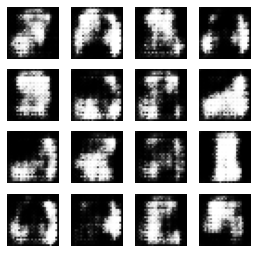

1600: [discriminator loss: 0.521121, acc: 0.734375] [adversarial loss: 1.102509, acc: 0.250000]
1601: [discriminator loss: 0.525773, acc: 0.750000] [adversarial loss: 0.976970, acc: 0.296875]
1602: [discriminator loss: 0.527549, acc: 0.734375] [adversarial loss: 1.339539, acc: 0.140625]
1603: [discriminator loss: 0.502467, acc: 0.781250] [adversarial loss: 1.067239, acc: 0.296875]
1604: [discriminator loss: 0.528774, acc: 0.726562] [adversarial loss: 1.049758, acc: 0.281250]
1605: [discriminator loss: 0.506526, acc: 0.750000] [adversarial loss: 1.016382, acc: 0.328125]
1606: [discriminator loss: 0.452852, acc: 0.796875] [adversarial loss: 1.462650, acc: 0.093750]
1607: [discriminator loss: 0.559808, acc: 0.710938] [adversarial loss: 0.849544, acc: 0.406250]
1608: [discriminator loss: 0.483816, acc: 0.742188] [adversarial loss: 1.387955, acc: 0.140625]
1609: [discriminator loss: 0.492993, acc: 0.781250] [adversarial loss: 0.973465, acc: 0.296875]
1610: [discriminator loss: 0.523993, acc

1691: [discriminator loss: 0.495446, acc: 0.781250] [adversarial loss: 1.321522, acc: 0.109375]
1692: [discriminator loss: 0.418343, acc: 0.804688] [adversarial loss: 1.219001, acc: 0.140625]
1693: [discriminator loss: 0.431550, acc: 0.859375] [adversarial loss: 1.232564, acc: 0.203125]
1694: [discriminator loss: 0.397141, acc: 0.851562] [adversarial loss: 1.726948, acc: 0.046875]
1695: [discriminator loss: 0.455833, acc: 0.773438] [adversarial loss: 0.994959, acc: 0.343750]
1696: [discriminator loss: 0.463108, acc: 0.789062] [adversarial loss: 1.565202, acc: 0.078125]
1697: [discriminator loss: 0.441069, acc: 0.820312] [adversarial loss: 1.120639, acc: 0.218750]
1698: [discriminator loss: 0.504160, acc: 0.765625] [adversarial loss: 1.318261, acc: 0.156250]
1699: [discriminator loss: 0.440221, acc: 0.843750] [adversarial loss: 1.028016, acc: 0.296875]
1700: [discriminator loss: 0.462250, acc: 0.796875] [adversarial loss: 1.452847, acc: 0.046875]
1701: [discriminator loss: 0.478491, acc

1777: [discriminator loss: 0.410672, acc: 0.882812] [adversarial loss: 1.231346, acc: 0.171875]
1778: [discriminator loss: 0.419076, acc: 0.875000] [adversarial loss: 1.364451, acc: 0.046875]
1779: [discriminator loss: 0.467498, acc: 0.828125] [adversarial loss: 1.264148, acc: 0.140625]
1780: [discriminator loss: 0.430310, acc: 0.820312] [adversarial loss: 1.410730, acc: 0.140625]
1781: [discriminator loss: 0.385112, acc: 0.859375] [adversarial loss: 1.219676, acc: 0.171875]
1782: [discriminator loss: 0.432343, acc: 0.781250] [adversarial loss: 1.656420, acc: 0.062500]
1783: [discriminator loss: 0.416375, acc: 0.828125] [adversarial loss: 0.931783, acc: 0.328125]
1784: [discriminator loss: 0.490762, acc: 0.765625] [adversarial loss: 1.404754, acc: 0.125000]
1785: [discriminator loss: 0.376559, acc: 0.882812] [adversarial loss: 1.167974, acc: 0.171875]
1786: [discriminator loss: 0.415527, acc: 0.867188] [adversarial loss: 1.233907, acc: 0.171875]
1787: [discriminator loss: 0.436834, acc

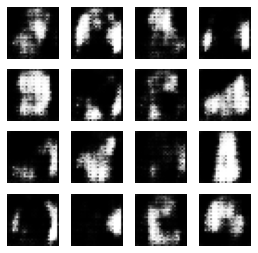

1800: [discriminator loss: 0.450274, acc: 0.804688] [adversarial loss: 1.217780, acc: 0.187500]
1801: [discriminator loss: 0.394765, acc: 0.859375] [adversarial loss: 1.049068, acc: 0.281250]
1802: [discriminator loss: 0.417622, acc: 0.812500] [adversarial loss: 1.344967, acc: 0.140625]
1803: [discriminator loss: 0.420123, acc: 0.843750] [adversarial loss: 0.925306, acc: 0.406250]
1804: [discriminator loss: 0.454345, acc: 0.781250] [adversarial loss: 1.421452, acc: 0.140625]
1805: [discriminator loss: 0.410614, acc: 0.851562] [adversarial loss: 1.268783, acc: 0.218750]
1806: [discriminator loss: 0.439941, acc: 0.835938] [adversarial loss: 1.348006, acc: 0.109375]
1807: [discriminator loss: 0.420900, acc: 0.812500] [adversarial loss: 1.055131, acc: 0.234375]
1808: [discriminator loss: 0.470599, acc: 0.796875] [adversarial loss: 1.311478, acc: 0.093750]
1809: [discriminator loss: 0.439386, acc: 0.843750] [adversarial loss: 1.272432, acc: 0.187500]
1810: [discriminator loss: 0.422448, acc

1890: [discriminator loss: 0.344370, acc: 0.898438] [adversarial loss: 1.158904, acc: 0.328125]
1891: [discriminator loss: 0.425430, acc: 0.867188] [adversarial loss: 1.101174, acc: 0.281250]
1892: [discriminator loss: 0.352873, acc: 0.875000] [adversarial loss: 1.068646, acc: 0.312500]
1893: [discriminator loss: 0.388620, acc: 0.867188] [adversarial loss: 1.140203, acc: 0.218750]
1894: [discriminator loss: 0.403922, acc: 0.835938] [adversarial loss: 1.588138, acc: 0.078125]
1895: [discriminator loss: 0.398445, acc: 0.851562] [adversarial loss: 1.002072, acc: 0.343750]
1896: [discriminator loss: 0.432534, acc: 0.835938] [adversarial loss: 1.483282, acc: 0.171875]
1897: [discriminator loss: 0.339905, acc: 0.921875] [adversarial loss: 1.043612, acc: 0.328125]
1898: [discriminator loss: 0.399505, acc: 0.804688] [adversarial loss: 1.497518, acc: 0.109375]
1899: [discriminator loss: 0.404258, acc: 0.851562] [adversarial loss: 0.911256, acc: 0.468750]
1900: [discriminator loss: 0.414708, acc

1978: [discriminator loss: 0.370344, acc: 0.835938] [adversarial loss: 1.203569, acc: 0.281250]
1979: [discriminator loss: 0.462183, acc: 0.773438] [adversarial loss: 1.767309, acc: 0.140625]
1980: [discriminator loss: 0.407303, acc: 0.843750] [adversarial loss: 1.120996, acc: 0.390625]
1981: [discriminator loss: 0.439992, acc: 0.773438] [adversarial loss: 1.608559, acc: 0.109375]
1982: [discriminator loss: 0.382157, acc: 0.859375] [adversarial loss: 1.346719, acc: 0.218750]
1983: [discriminator loss: 0.428979, acc: 0.820312] [adversarial loss: 1.840510, acc: 0.093750]
1984: [discriminator loss: 0.467002, acc: 0.820312] [adversarial loss: 1.345464, acc: 0.296875]
1985: [discriminator loss: 0.318156, acc: 0.937500] [adversarial loss: 1.315027, acc: 0.234375]
1986: [discriminator loss: 0.360580, acc: 0.851562] [adversarial loss: 1.271822, acc: 0.312500]
1987: [discriminator loss: 0.407673, acc: 0.796875] [adversarial loss: 1.920638, acc: 0.125000]
1988: [discriminator loss: 0.414265, acc

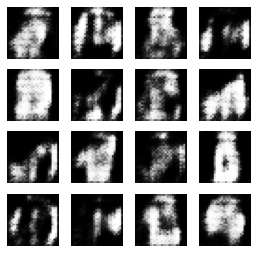

2000: [discriminator loss: 0.394067, acc: 0.789062] [adversarial loss: 1.694504, acc: 0.125000]
2001: [discriminator loss: 0.461550, acc: 0.781250] [adversarial loss: 0.941893, acc: 0.375000]
2002: [discriminator loss: 0.543327, acc: 0.765625] [adversarial loss: 1.915403, acc: 0.125000]
2003: [discriminator loss: 0.401144, acc: 0.789062] [adversarial loss: 1.176851, acc: 0.281250]
2004: [discriminator loss: 0.408502, acc: 0.796875] [adversarial loss: 1.856464, acc: 0.171875]
2005: [discriminator loss: 0.462540, acc: 0.781250] [adversarial loss: 1.197020, acc: 0.312500]
2006: [discriminator loss: 0.419944, acc: 0.828125] [adversarial loss: 1.671226, acc: 0.203125]
2007: [discriminator loss: 0.413597, acc: 0.828125] [adversarial loss: 1.359862, acc: 0.359375]
2008: [discriminator loss: 0.430322, acc: 0.812500] [adversarial loss: 1.344889, acc: 0.234375]
2009: [discriminator loss: 0.459573, acc: 0.789062] [adversarial loss: 1.633777, acc: 0.203125]
2010: [discriminator loss: 0.386081, acc

2087: [discriminator loss: 0.478589, acc: 0.757812] [adversarial loss: 1.995483, acc: 0.062500]
2088: [discriminator loss: 0.581123, acc: 0.710938] [adversarial loss: 1.081637, acc: 0.359375]
2089: [discriminator loss: 0.370263, acc: 0.859375] [adversarial loss: 1.474584, acc: 0.265625]
2090: [discriminator loss: 0.459020, acc: 0.789062] [adversarial loss: 1.246444, acc: 0.265625]
2091: [discriminator loss: 0.456836, acc: 0.781250] [adversarial loss: 1.404953, acc: 0.203125]
2092: [discriminator loss: 0.449283, acc: 0.804688] [adversarial loss: 1.323847, acc: 0.250000]
2093: [discriminator loss: 0.486535, acc: 0.765625] [adversarial loss: 1.958299, acc: 0.078125]
2094: [discriminator loss: 0.460813, acc: 0.734375] [adversarial loss: 1.120549, acc: 0.421875]
2095: [discriminator loss: 0.563007, acc: 0.734375] [adversarial loss: 1.803087, acc: 0.156250]
2096: [discriminator loss: 0.494499, acc: 0.742188] [adversarial loss: 1.257049, acc: 0.312500]
2097: [discriminator loss: 0.471091, acc

2177: [discriminator loss: 0.562374, acc: 0.703125] [adversarial loss: 1.596907, acc: 0.171875]
2178: [discriminator loss: 0.527369, acc: 0.750000] [adversarial loss: 0.981271, acc: 0.437500]
2179: [discriminator loss: 0.562213, acc: 0.718750] [adversarial loss: 1.674580, acc: 0.093750]
2180: [discriminator loss: 0.486723, acc: 0.773438] [adversarial loss: 1.140600, acc: 0.296875]
2181: [discriminator loss: 0.587901, acc: 0.648438] [adversarial loss: 1.523400, acc: 0.218750]
2182: [discriminator loss: 0.515270, acc: 0.750000] [adversarial loss: 1.171210, acc: 0.265625]
2183: [discriminator loss: 0.456082, acc: 0.820312] [adversarial loss: 1.343325, acc: 0.187500]
2184: [discriminator loss: 0.492357, acc: 0.781250] [adversarial loss: 1.255036, acc: 0.281250]
2185: [discriminator loss: 0.500634, acc: 0.765625] [adversarial loss: 1.140277, acc: 0.406250]
2186: [discriminator loss: 0.501918, acc: 0.773438] [adversarial loss: 1.334907, acc: 0.218750]
2187: [discriminator loss: 0.521210, acc

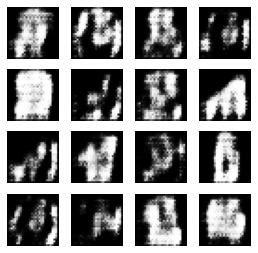

2200: [discriminator loss: 0.404250, acc: 0.875000] [adversarial loss: 1.437665, acc: 0.187500]
2201: [discriminator loss: 0.445596, acc: 0.796875] [adversarial loss: 1.326654, acc: 0.312500]
2202: [discriminator loss: 0.554056, acc: 0.718750] [adversarial loss: 1.509055, acc: 0.203125]
2203: [discriminator loss: 0.440510, acc: 0.812500] [adversarial loss: 1.198352, acc: 0.265625]
2204: [discriminator loss: 0.451622, acc: 0.812500] [adversarial loss: 1.848967, acc: 0.046875]
2205: [discriminator loss: 0.532645, acc: 0.703125] [adversarial loss: 0.946810, acc: 0.453125]
2206: [discriminator loss: 0.567277, acc: 0.687500] [adversarial loss: 1.686127, acc: 0.140625]
2207: [discriminator loss: 0.525773, acc: 0.742188] [adversarial loss: 1.220406, acc: 0.312500]
2208: [discriminator loss: 0.507766, acc: 0.750000] [adversarial loss: 1.372667, acc: 0.296875]
2209: [discriminator loss: 0.484748, acc: 0.781250] [adversarial loss: 1.067250, acc: 0.406250]
2210: [discriminator loss: 0.555604, acc

2288: [discriminator loss: 0.527007, acc: 0.695312] [adversarial loss: 1.637633, acc: 0.125000]
2289: [discriminator loss: 0.593000, acc: 0.726562] [adversarial loss: 1.219313, acc: 0.265625]
2290: [discriminator loss: 0.477121, acc: 0.757812] [adversarial loss: 1.454544, acc: 0.203125]
2291: [discriminator loss: 0.468824, acc: 0.773438] [adversarial loss: 1.187297, acc: 0.265625]
2292: [discriminator loss: 0.463328, acc: 0.781250] [adversarial loss: 1.190166, acc: 0.343750]
2293: [discriminator loss: 0.532010, acc: 0.765625] [adversarial loss: 1.336886, acc: 0.218750]
2294: [discriminator loss: 0.412794, acc: 0.843750] [adversarial loss: 1.421412, acc: 0.296875]
2295: [discriminator loss: 0.442741, acc: 0.820312] [adversarial loss: 1.515748, acc: 0.171875]
2296: [discriminator loss: 0.464351, acc: 0.757812] [adversarial loss: 1.189836, acc: 0.250000]
2297: [discriminator loss: 0.510430, acc: 0.726562] [adversarial loss: 1.506218, acc: 0.125000]
2298: [discriminator loss: 0.501946, acc

2374: [discriminator loss: 0.470870, acc: 0.750000] [adversarial loss: 1.660553, acc: 0.187500]
2375: [discriminator loss: 0.475895, acc: 0.796875] [adversarial loss: 1.207287, acc: 0.312500]
2376: [discriminator loss: 0.485657, acc: 0.773438] [adversarial loss: 1.390899, acc: 0.171875]
2377: [discriminator loss: 0.462722, acc: 0.757812] [adversarial loss: 1.092401, acc: 0.343750]
2378: [discriminator loss: 0.547361, acc: 0.710938] [adversarial loss: 1.646849, acc: 0.062500]
2379: [discriminator loss: 0.475132, acc: 0.726562] [adversarial loss: 0.939008, acc: 0.468750]
2380: [discriminator loss: 0.502938, acc: 0.773438] [adversarial loss: 1.592464, acc: 0.140625]
2381: [discriminator loss: 0.465333, acc: 0.828125] [adversarial loss: 1.338355, acc: 0.250000]
2382: [discriminator loss: 0.524572, acc: 0.742188] [adversarial loss: 1.215966, acc: 0.296875]
2383: [discriminator loss: 0.482917, acc: 0.734375] [adversarial loss: 1.174038, acc: 0.296875]
2384: [discriminator loss: 0.527635, acc

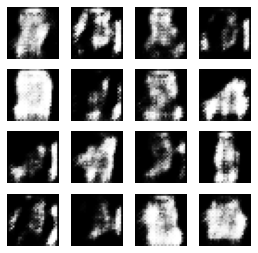

2400: [discriminator loss: 0.520901, acc: 0.773438] [adversarial loss: 0.919939, acc: 0.546875]
2401: [discriminator loss: 0.556561, acc: 0.679688] [adversarial loss: 1.910798, acc: 0.078125]
2402: [discriminator loss: 0.529363, acc: 0.703125] [adversarial loss: 1.142901, acc: 0.375000]
2403: [discriminator loss: 0.513027, acc: 0.757812] [adversarial loss: 1.320422, acc: 0.250000]
2404: [discriminator loss: 0.485680, acc: 0.726562] [adversarial loss: 1.056778, acc: 0.453125]
2405: [discriminator loss: 0.491339, acc: 0.718750] [adversarial loss: 1.535486, acc: 0.171875]
2406: [discriminator loss: 0.465419, acc: 0.804688] [adversarial loss: 1.172179, acc: 0.265625]
2407: [discriminator loss: 0.442666, acc: 0.820312] [adversarial loss: 1.754793, acc: 0.109375]
2408: [discriminator loss: 0.450047, acc: 0.812500] [adversarial loss: 1.029274, acc: 0.406250]
2409: [discriminator loss: 0.459116, acc: 0.773438] [adversarial loss: 1.349717, acc: 0.265625]
2410: [discriminator loss: 0.428728, acc

2487: [discriminator loss: 0.523403, acc: 0.742188] [adversarial loss: 1.154673, acc: 0.281250]
2488: [discriminator loss: 0.528589, acc: 0.734375] [adversarial loss: 1.882684, acc: 0.140625]
2489: [discriminator loss: 0.524099, acc: 0.789062] [adversarial loss: 0.977144, acc: 0.531250]
2490: [discriminator loss: 0.584442, acc: 0.718750] [adversarial loss: 1.620546, acc: 0.125000]
2491: [discriminator loss: 0.591049, acc: 0.640625] [adversarial loss: 1.371043, acc: 0.296875]
2492: [discriminator loss: 0.458788, acc: 0.773438] [adversarial loss: 1.429225, acc: 0.156250]
2493: [discriminator loss: 0.581728, acc: 0.710938] [adversarial loss: 1.145187, acc: 0.375000]
2494: [discriminator loss: 0.529764, acc: 0.734375] [adversarial loss: 1.548041, acc: 0.156250]
2495: [discriminator loss: 0.513154, acc: 0.796875] [adversarial loss: 0.985611, acc: 0.453125]
2496: [discriminator loss: 0.503924, acc: 0.757812] [adversarial loss: 1.468718, acc: 0.171875]
2497: [discriminator loss: 0.429193, acc

2578: [discriminator loss: 0.513552, acc: 0.734375] [adversarial loss: 1.646293, acc: 0.171875]
2579: [discriminator loss: 0.584781, acc: 0.617188] [adversarial loss: 1.207920, acc: 0.343750]
2580: [discriminator loss: 0.522878, acc: 0.765625] [adversarial loss: 1.416012, acc: 0.296875]
2581: [discriminator loss: 0.506314, acc: 0.750000] [adversarial loss: 1.558250, acc: 0.187500]
2582: [discriminator loss: 0.423343, acc: 0.828125] [adversarial loss: 1.170919, acc: 0.312500]
2583: [discriminator loss: 0.526585, acc: 0.703125] [adversarial loss: 1.812278, acc: 0.109375]
2584: [discriminator loss: 0.508750, acc: 0.742188] [adversarial loss: 0.918458, acc: 0.484375]
2585: [discriminator loss: 0.552646, acc: 0.710938] [adversarial loss: 2.164588, acc: 0.109375]
2586: [discriminator loss: 0.522862, acc: 0.750000] [adversarial loss: 1.113936, acc: 0.421875]
2587: [discriminator loss: 0.551813, acc: 0.718750] [adversarial loss: 1.540517, acc: 0.218750]
2588: [discriminator loss: 0.473659, acc

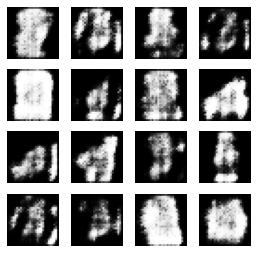

2600: [discriminator loss: 0.559548, acc: 0.671875] [adversarial loss: 1.461670, acc: 0.156250]
2601: [discriminator loss: 0.546495, acc: 0.703125] [adversarial loss: 1.171222, acc: 0.437500]
2602: [discriminator loss: 0.512491, acc: 0.734375] [adversarial loss: 1.741660, acc: 0.093750]
2603: [discriminator loss: 0.503787, acc: 0.828125] [adversarial loss: 0.987410, acc: 0.406250]
2604: [discriminator loss: 0.500786, acc: 0.742188] [adversarial loss: 1.360282, acc: 0.265625]
2605: [discriminator loss: 0.486528, acc: 0.773438] [adversarial loss: 1.091698, acc: 0.375000]
2606: [discriminator loss: 0.532096, acc: 0.695312] [adversarial loss: 1.006691, acc: 0.484375]
2607: [discriminator loss: 0.568728, acc: 0.664062] [adversarial loss: 1.447835, acc: 0.187500]
2608: [discriminator loss: 0.498007, acc: 0.718750] [adversarial loss: 1.189839, acc: 0.359375]
2609: [discriminator loss: 0.468595, acc: 0.773438] [adversarial loss: 1.682454, acc: 0.171875]
2610: [discriminator loss: 0.483093, acc

2688: [discriminator loss: 0.545290, acc: 0.703125] [adversarial loss: 1.518516, acc: 0.140625]
2689: [discriminator loss: 0.510787, acc: 0.750000] [adversarial loss: 1.352688, acc: 0.265625]
2690: [discriminator loss: 0.473518, acc: 0.835938] [adversarial loss: 0.889006, acc: 0.531250]
2691: [discriminator loss: 0.604405, acc: 0.656250] [adversarial loss: 1.610187, acc: 0.093750]
2692: [discriminator loss: 0.498627, acc: 0.765625] [adversarial loss: 0.991277, acc: 0.468750]
2693: [discriminator loss: 0.581015, acc: 0.703125] [adversarial loss: 1.393565, acc: 0.234375]
2694: [discriminator loss: 0.572427, acc: 0.718750] [adversarial loss: 1.153656, acc: 0.312500]
2695: [discriminator loss: 0.486359, acc: 0.789062] [adversarial loss: 1.324690, acc: 0.234375]
2696: [discriminator loss: 0.601205, acc: 0.664062] [adversarial loss: 1.003776, acc: 0.375000]
2697: [discriminator loss: 0.556702, acc: 0.718750] [adversarial loss: 1.341135, acc: 0.140625]
2698: [discriminator loss: 0.530253, acc

2779: [discriminator loss: 0.506221, acc: 0.781250] [adversarial loss: 0.896391, acc: 0.437500]
2780: [discriminator loss: 0.547090, acc: 0.695312] [adversarial loss: 1.428883, acc: 0.250000]
2781: [discriminator loss: 0.500574, acc: 0.757812] [adversarial loss: 0.836939, acc: 0.484375]
2782: [discriminator loss: 0.568269, acc: 0.710938] [adversarial loss: 1.424808, acc: 0.078125]
2783: [discriminator loss: 0.508700, acc: 0.726562] [adversarial loss: 0.854607, acc: 0.484375]
2784: [discriminator loss: 0.532190, acc: 0.750000] [adversarial loss: 1.407541, acc: 0.187500]
2785: [discriminator loss: 0.488475, acc: 0.828125] [adversarial loss: 1.001638, acc: 0.390625]
2786: [discriminator loss: 0.485471, acc: 0.796875] [adversarial loss: 1.373026, acc: 0.250000]
2787: [discriminator loss: 0.510327, acc: 0.757812] [adversarial loss: 0.940445, acc: 0.421875]
2788: [discriminator loss: 0.525022, acc: 0.726562] [adversarial loss: 1.669507, acc: 0.062500]
2789: [discriminator loss: 0.506023, acc

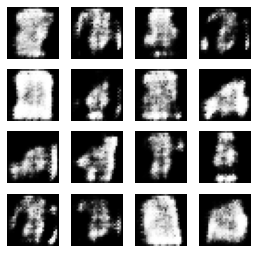

2800: [discriminator loss: 0.492254, acc: 0.773438] [adversarial loss: 1.072552, acc: 0.375000]
2801: [discriminator loss: 0.521196, acc: 0.757812] [adversarial loss: 1.346762, acc: 0.125000]
2802: [discriminator loss: 0.545281, acc: 0.710938] [adversarial loss: 1.091659, acc: 0.390625]
2803: [discriminator loss: 0.577146, acc: 0.703125] [adversarial loss: 1.494755, acc: 0.078125]
2804: [discriminator loss: 0.510389, acc: 0.812500] [adversarial loss: 0.880631, acc: 0.546875]
2805: [discriminator loss: 0.551315, acc: 0.671875] [adversarial loss: 1.677033, acc: 0.109375]
2806: [discriminator loss: 0.596970, acc: 0.734375] [adversarial loss: 0.950886, acc: 0.468750]
2807: [discriminator loss: 0.524326, acc: 0.687500] [adversarial loss: 1.571392, acc: 0.109375]
2808: [discriminator loss: 0.478063, acc: 0.828125] [adversarial loss: 1.045867, acc: 0.343750]
2809: [discriminator loss: 0.507912, acc: 0.757812] [adversarial loss: 1.156244, acc: 0.328125]
2810: [discriminator loss: 0.498481, acc

2887: [discriminator loss: 0.567482, acc: 0.757812] [adversarial loss: 0.922402, acc: 0.484375]
2888: [discriminator loss: 0.494952, acc: 0.757812] [adversarial loss: 1.439829, acc: 0.156250]
2889: [discriminator loss: 0.505531, acc: 0.812500] [adversarial loss: 0.992944, acc: 0.421875]
2890: [discriminator loss: 0.557456, acc: 0.703125] [adversarial loss: 1.283802, acc: 0.203125]
2891: [discriminator loss: 0.568272, acc: 0.687500] [adversarial loss: 0.964357, acc: 0.515625]
2892: [discriminator loss: 0.533655, acc: 0.664062] [adversarial loss: 1.144573, acc: 0.328125]
2893: [discriminator loss: 0.527217, acc: 0.796875] [adversarial loss: 1.079534, acc: 0.343750]
2894: [discriminator loss: 0.514438, acc: 0.765625] [adversarial loss: 1.347217, acc: 0.109375]
2895: [discriminator loss: 0.529395, acc: 0.773438] [adversarial loss: 1.048414, acc: 0.343750]
2896: [discriminator loss: 0.521101, acc: 0.734375] [adversarial loss: 1.480374, acc: 0.125000]
2897: [discriminator loss: 0.558864, acc

2976: [discriminator loss: 0.576684, acc: 0.726562] [adversarial loss: 1.645144, acc: 0.062500]
2977: [discriminator loss: 0.591300, acc: 0.679688] [adversarial loss: 0.731947, acc: 0.546875]
2978: [discriminator loss: 0.560091, acc: 0.687500] [adversarial loss: 1.416298, acc: 0.125000]
2979: [discriminator loss: 0.545490, acc: 0.734375] [adversarial loss: 0.842889, acc: 0.484375]
2980: [discriminator loss: 0.529455, acc: 0.703125] [adversarial loss: 1.434722, acc: 0.093750]
2981: [discriminator loss: 0.527538, acc: 0.734375] [adversarial loss: 0.984869, acc: 0.421875]
2982: [discriminator loss: 0.497096, acc: 0.757812] [adversarial loss: 1.318113, acc: 0.187500]
2983: [discriminator loss: 0.497525, acc: 0.765625] [adversarial loss: 1.119415, acc: 0.328125]
2984: [discriminator loss: 0.528494, acc: 0.750000] [adversarial loss: 0.974029, acc: 0.453125]
2985: [discriminator loss: 0.511155, acc: 0.796875] [adversarial loss: 1.133903, acc: 0.218750]
2986: [discriminator loss: 0.498341, acc

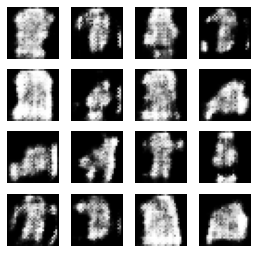

3000: [discriminator loss: 0.574372, acc: 0.726562] [adversarial loss: 1.235940, acc: 0.296875]
3001: [discriminator loss: 0.530926, acc: 0.742188] [adversarial loss: 1.034235, acc: 0.375000]
3002: [discriminator loss: 0.543994, acc: 0.703125] [adversarial loss: 1.434431, acc: 0.140625]
3003: [discriminator loss: 0.526243, acc: 0.773438] [adversarial loss: 0.995701, acc: 0.390625]
3004: [discriminator loss: 0.611644, acc: 0.687500] [adversarial loss: 1.634872, acc: 0.109375]
3005: [discriminator loss: 0.601401, acc: 0.726562] [adversarial loss: 0.750036, acc: 0.593750]
3006: [discriminator loss: 0.578755, acc: 0.726562] [adversarial loss: 1.415083, acc: 0.093750]
3007: [discriminator loss: 0.514765, acc: 0.726562] [adversarial loss: 0.852944, acc: 0.453125]
3008: [discriminator loss: 0.580738, acc: 0.703125] [adversarial loss: 1.292144, acc: 0.250000]
3009: [discriminator loss: 0.471846, acc: 0.796875] [adversarial loss: 1.163718, acc: 0.328125]
3010: [discriminator loss: 0.523072, acc

3090: [discriminator loss: 0.608847, acc: 0.671875] [adversarial loss: 1.576295, acc: 0.000000]
3091: [discriminator loss: 0.564349, acc: 0.726562] [adversarial loss: 0.873046, acc: 0.500000]
3092: [discriminator loss: 0.535454, acc: 0.765625] [adversarial loss: 1.426042, acc: 0.093750]
3093: [discriminator loss: 0.518989, acc: 0.781250] [adversarial loss: 0.930292, acc: 0.437500]
3094: [discriminator loss: 0.543121, acc: 0.703125] [adversarial loss: 1.557447, acc: 0.015625]
3095: [discriminator loss: 0.585374, acc: 0.695312] [adversarial loss: 0.669945, acc: 0.656250]
3096: [discriminator loss: 0.580639, acc: 0.671875] [adversarial loss: 1.253702, acc: 0.218750]
3097: [discriminator loss: 0.567065, acc: 0.734375] [adversarial loss: 1.031155, acc: 0.359375]
3098: [discriminator loss: 0.567642, acc: 0.742188] [adversarial loss: 1.203979, acc: 0.265625]
3099: [discriminator loss: 0.498301, acc: 0.812500] [adversarial loss: 1.023181, acc: 0.312500]
3100: [discriminator loss: 0.555200, acc

3176: [discriminator loss: 0.563227, acc: 0.765625] [adversarial loss: 0.896416, acc: 0.359375]
3177: [discriminator loss: 0.547619, acc: 0.742188] [adversarial loss: 1.099211, acc: 0.218750]
3178: [discriminator loss: 0.537571, acc: 0.734375] [adversarial loss: 1.193035, acc: 0.203125]
3179: [discriminator loss: 0.546592, acc: 0.765625] [adversarial loss: 0.798287, acc: 0.609375]
3180: [discriminator loss: 0.577856, acc: 0.726562] [adversarial loss: 1.709645, acc: 0.015625]
3181: [discriminator loss: 0.633944, acc: 0.671875] [adversarial loss: 0.869644, acc: 0.484375]
3182: [discriminator loss: 0.578923, acc: 0.664062] [adversarial loss: 1.237586, acc: 0.171875]
3183: [discriminator loss: 0.582509, acc: 0.703125] [adversarial loss: 0.805488, acc: 0.453125]
3184: [discriminator loss: 0.552014, acc: 0.703125] [adversarial loss: 1.366863, acc: 0.078125]
3185: [discriminator loss: 0.562894, acc: 0.703125] [adversarial loss: 0.652787, acc: 0.656250]
3186: [discriminator loss: 0.582692, acc

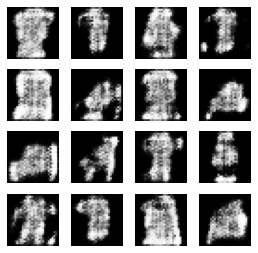

3200: [discriminator loss: 0.525724, acc: 0.734375] [adversarial loss: 1.120591, acc: 0.250000]
3201: [discriminator loss: 0.551328, acc: 0.765625] [adversarial loss: 0.876334, acc: 0.390625]
3202: [discriminator loss: 0.524373, acc: 0.796875] [adversarial loss: 1.082035, acc: 0.203125]
3203: [discriminator loss: 0.532831, acc: 0.773438] [adversarial loss: 0.790062, acc: 0.421875]
3204: [discriminator loss: 0.577658, acc: 0.710938] [adversarial loss: 1.223875, acc: 0.125000]
3205: [discriminator loss: 0.551219, acc: 0.710938] [adversarial loss: 0.870342, acc: 0.453125]
3206: [discriminator loss: 0.578940, acc: 0.671875] [adversarial loss: 1.396149, acc: 0.015625]
3207: [discriminator loss: 0.551742, acc: 0.726562] [adversarial loss: 0.641903, acc: 0.671875]
3208: [discriminator loss: 0.553313, acc: 0.703125] [adversarial loss: 1.172199, acc: 0.171875]
3209: [discriminator loss: 0.536707, acc: 0.750000] [adversarial loss: 0.910108, acc: 0.281250]
3210: [discriminator loss: 0.524871, acc

3289: [discriminator loss: 0.587740, acc: 0.710938] [adversarial loss: 1.023407, acc: 0.281250]
3290: [discriminator loss: 0.583121, acc: 0.726562] [adversarial loss: 1.063730, acc: 0.187500]
3291: [discriminator loss: 0.562747, acc: 0.750000] [adversarial loss: 0.840775, acc: 0.406250]
3292: [discriminator loss: 0.605264, acc: 0.687500] [adversarial loss: 1.210424, acc: 0.218750]
3293: [discriminator loss: 0.550401, acc: 0.757812] [adversarial loss: 0.703143, acc: 0.578125]
3294: [discriminator loss: 0.610899, acc: 0.625000] [adversarial loss: 1.294870, acc: 0.125000]
3295: [discriminator loss: 0.553908, acc: 0.718750] [adversarial loss: 0.717563, acc: 0.546875]
3296: [discriminator loss: 0.582773, acc: 0.687500] [adversarial loss: 1.577719, acc: 0.046875]
3297: [discriminator loss: 0.624500, acc: 0.695312] [adversarial loss: 0.743374, acc: 0.531250]
3298: [discriminator loss: 0.595843, acc: 0.640625] [adversarial loss: 1.327648, acc: 0.078125]
3299: [discriminator loss: 0.544788, acc

3375: [discriminator loss: 0.573304, acc: 0.718750] [adversarial loss: 0.909540, acc: 0.390625]
3376: [discriminator loss: 0.601460, acc: 0.664062] [adversarial loss: 1.177764, acc: 0.171875]
3377: [discriminator loss: 0.593888, acc: 0.734375] [adversarial loss: 0.827443, acc: 0.406250]
3378: [discriminator loss: 0.584430, acc: 0.726562] [adversarial loss: 0.917389, acc: 0.328125]
3379: [discriminator loss: 0.586770, acc: 0.695312] [adversarial loss: 0.854514, acc: 0.343750]
3380: [discriminator loss: 0.634947, acc: 0.679688] [adversarial loss: 0.880720, acc: 0.343750]
3381: [discriminator loss: 0.617695, acc: 0.695312] [adversarial loss: 0.807383, acc: 0.484375]
3382: [discriminator loss: 0.610031, acc: 0.648438] [adversarial loss: 1.363702, acc: 0.062500]
3383: [discriminator loss: 0.682098, acc: 0.617188] [adversarial loss: 0.526839, acc: 0.734375]
3384: [discriminator loss: 0.637331, acc: 0.585938] [adversarial loss: 1.275748, acc: 0.015625]
3385: [discriminator loss: 0.614044, acc

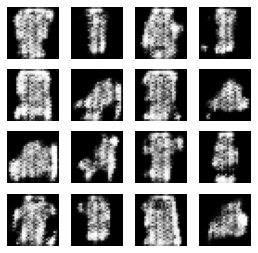

3400: [discriminator loss: 0.628904, acc: 0.648438] [adversarial loss: 0.718552, acc: 0.515625]
3401: [discriminator loss: 0.616904, acc: 0.640625] [adversarial loss: 1.179764, acc: 0.156250]
3402: [discriminator loss: 0.625559, acc: 0.687500] [adversarial loss: 0.538024, acc: 0.781250]
3403: [discriminator loss: 0.720396, acc: 0.546875] [adversarial loss: 1.482298, acc: 0.015625]
3404: [discriminator loss: 0.695220, acc: 0.609375] [adversarial loss: 0.643997, acc: 0.625000]
3405: [discriminator loss: 0.560992, acc: 0.703125] [adversarial loss: 1.176396, acc: 0.125000]
3406: [discriminator loss: 0.613254, acc: 0.687500] [adversarial loss: 0.860359, acc: 0.421875]
3407: [discriminator loss: 0.590319, acc: 0.695312] [adversarial loss: 0.948793, acc: 0.265625]
3408: [discriminator loss: 0.571350, acc: 0.757812] [adversarial loss: 0.993029, acc: 0.218750]
3409: [discriminator loss: 0.649855, acc: 0.671875] [adversarial loss: 0.938362, acc: 0.406250]
3410: [discriminator loss: 0.547086, acc

3491: [discriminator loss: 0.590284, acc: 0.671875] [adversarial loss: 1.013184, acc: 0.125000]
3492: [discriminator loss: 0.577695, acc: 0.695312] [adversarial loss: 0.893555, acc: 0.281250]
3493: [discriminator loss: 0.549512, acc: 0.750000] [adversarial loss: 0.962064, acc: 0.265625]
3494: [discriminator loss: 0.599971, acc: 0.687500] [adversarial loss: 0.860790, acc: 0.328125]
3495: [discriminator loss: 0.611747, acc: 0.687500] [adversarial loss: 0.823409, acc: 0.406250]
3496: [discriminator loss: 0.580251, acc: 0.671875] [adversarial loss: 1.164016, acc: 0.031250]
3497: [discriminator loss: 0.599174, acc: 0.718750] [adversarial loss: 0.734031, acc: 0.484375]
3498: [discriminator loss: 0.607928, acc: 0.625000] [adversarial loss: 1.138392, acc: 0.078125]
3499: [discriminator loss: 0.635140, acc: 0.656250] [adversarial loss: 0.644951, acc: 0.640625]
3500: [discriminator loss: 0.621187, acc: 0.617188] [adversarial loss: 1.135423, acc: 0.093750]
3501: [discriminator loss: 0.629352, acc

3582: [discriminator loss: 0.640301, acc: 0.710938] [adversarial loss: 0.615034, acc: 0.656250]
3583: [discriminator loss: 0.656423, acc: 0.593750] [adversarial loss: 1.271264, acc: 0.046875]
3584: [discriminator loss: 0.657672, acc: 0.648438] [adversarial loss: 0.719174, acc: 0.453125]
3585: [discriminator loss: 0.611055, acc: 0.601562] [adversarial loss: 1.066095, acc: 0.140625]
3586: [discriminator loss: 0.614875, acc: 0.710938] [adversarial loss: 0.716889, acc: 0.578125]
3587: [discriminator loss: 0.633735, acc: 0.609375] [adversarial loss: 1.046793, acc: 0.093750]
3588: [discriminator loss: 0.634348, acc: 0.679688] [adversarial loss: 0.662893, acc: 0.593750]
3589: [discriminator loss: 0.647727, acc: 0.664062] [adversarial loss: 0.847459, acc: 0.343750]
3590: [discriminator loss: 0.664767, acc: 0.640625] [adversarial loss: 1.022475, acc: 0.171875]
3591: [discriminator loss: 0.643013, acc: 0.679688] [adversarial loss: 0.706214, acc: 0.578125]
3592: [discriminator loss: 0.636545, acc

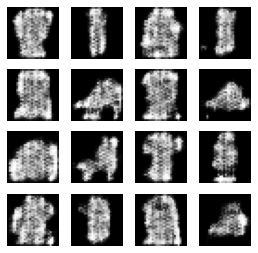

3600: [discriminator loss: 0.699905, acc: 0.546875] [adversarial loss: 1.070301, acc: 0.062500]
3601: [discriminator loss: 0.639960, acc: 0.695312] [adversarial loss: 0.825069, acc: 0.343750]
3602: [discriminator loss: 0.579475, acc: 0.671875] [adversarial loss: 0.884273, acc: 0.281250]
3603: [discriminator loss: 0.596272, acc: 0.710938] [adversarial loss: 0.708439, acc: 0.609375]
3604: [discriminator loss: 0.635191, acc: 0.640625] [adversarial loss: 0.993227, acc: 0.093750]
3605: [discriminator loss: 0.594213, acc: 0.773438] [adversarial loss: 0.775006, acc: 0.375000]
3606: [discriminator loss: 0.592025, acc: 0.695312] [adversarial loss: 0.878788, acc: 0.234375]
3607: [discriminator loss: 0.619952, acc: 0.710938] [adversarial loss: 0.720438, acc: 0.546875]
3608: [discriminator loss: 0.577618, acc: 0.710938] [adversarial loss: 0.931623, acc: 0.171875]
3609: [discriminator loss: 0.634416, acc: 0.687500] [adversarial loss: 0.850799, acc: 0.343750]
3610: [discriminator loss: 0.616696, acc

3691: [discriminator loss: 0.598071, acc: 0.710938] [adversarial loss: 1.180884, acc: 0.046875]
3692: [discriminator loss: 0.627718, acc: 0.695312] [adversarial loss: 0.690494, acc: 0.578125]
3693: [discriminator loss: 0.687591, acc: 0.562500] [adversarial loss: 0.982059, acc: 0.140625]
3694: [discriminator loss: 0.647946, acc: 0.640625] [adversarial loss: 0.664109, acc: 0.593750]
3695: [discriminator loss: 0.611331, acc: 0.585938] [adversarial loss: 0.995006, acc: 0.156250]
3696: [discriminator loss: 0.685648, acc: 0.609375] [adversarial loss: 0.681412, acc: 0.578125]
3697: [discriminator loss: 0.623938, acc: 0.625000] [adversarial loss: 0.970426, acc: 0.187500]
3698: [discriminator loss: 0.658666, acc: 0.734375] [adversarial loss: 0.599542, acc: 0.687500]
3699: [discriminator loss: 0.681527, acc: 0.562500] [adversarial loss: 1.032889, acc: 0.046875]
3700: [discriminator loss: 0.699411, acc: 0.656250] [adversarial loss: 0.582167, acc: 0.687500]
3701: [discriminator loss: 0.608989, acc

3781: [discriminator loss: 0.656762, acc: 0.601562] [adversarial loss: 1.194200, acc: 0.031250]
3782: [discriminator loss: 0.628514, acc: 0.664062] [adversarial loss: 0.585248, acc: 0.765625]
3783: [discriminator loss: 0.663763, acc: 0.593750] [adversarial loss: 0.963137, acc: 0.171875]
3784: [discriminator loss: 0.613096, acc: 0.742188] [adversarial loss: 0.655143, acc: 0.609375]
3785: [discriminator loss: 0.628408, acc: 0.601562] [adversarial loss: 1.120717, acc: 0.078125]
3786: [discriminator loss: 0.664198, acc: 0.593750] [adversarial loss: 0.553768, acc: 0.796875]
3787: [discriminator loss: 0.638889, acc: 0.570312] [adversarial loss: 1.123980, acc: 0.015625]
3788: [discriminator loss: 0.655890, acc: 0.671875] [adversarial loss: 0.583520, acc: 0.750000]
3789: [discriminator loss: 0.685681, acc: 0.546875] [adversarial loss: 1.052011, acc: 0.062500]
3790: [discriminator loss: 0.671934, acc: 0.609375] [adversarial loss: 0.642200, acc: 0.593750]
3791: [discriminator loss: 0.686248, acc

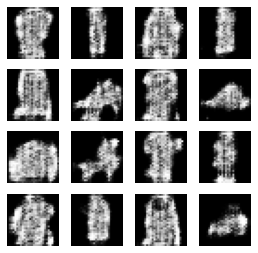

3800: [discriminator loss: 0.678068, acc: 0.617188] [adversarial loss: 0.775371, acc: 0.375000]
3801: [discriminator loss: 0.606297, acc: 0.710938] [adversarial loss: 0.824434, acc: 0.296875]
3802: [discriminator loss: 0.626997, acc: 0.718750] [adversarial loss: 0.802551, acc: 0.312500]
3803: [discriminator loss: 0.604225, acc: 0.703125] [adversarial loss: 0.946242, acc: 0.171875]
3804: [discriminator loss: 0.620718, acc: 0.703125] [adversarial loss: 0.676796, acc: 0.562500]
3805: [discriminator loss: 0.612099, acc: 0.648438] [adversarial loss: 1.051917, acc: 0.078125]
3806: [discriminator loss: 0.628569, acc: 0.703125] [adversarial loss: 0.659754, acc: 0.609375]
3807: [discriminator loss: 0.654776, acc: 0.625000] [adversarial loss: 1.115565, acc: 0.031250]
3808: [discriminator loss: 0.682540, acc: 0.593750] [adversarial loss: 0.559317, acc: 0.765625]
3809: [discriminator loss: 0.650346, acc: 0.578125] [adversarial loss: 1.114917, acc: 0.000000]
3810: [discriminator loss: 0.689931, acc

3888: [discriminator loss: 0.630539, acc: 0.718750] [adversarial loss: 0.636317, acc: 0.671875]
3889: [discriminator loss: 0.633000, acc: 0.617188] [adversarial loss: 1.041173, acc: 0.031250]
3890: [discriminator loss: 0.698571, acc: 0.625000] [adversarial loss: 0.496912, acc: 0.812500]
3891: [discriminator loss: 0.669335, acc: 0.500000] [adversarial loss: 1.082478, acc: 0.046875]
3892: [discriminator loss: 0.630524, acc: 0.632812] [adversarial loss: 0.625400, acc: 0.734375]
3893: [discriminator loss: 0.675894, acc: 0.554688] [adversarial loss: 0.846199, acc: 0.234375]
3894: [discriminator loss: 0.634589, acc: 0.703125] [adversarial loss: 0.711136, acc: 0.453125]
3895: [discriminator loss: 0.662285, acc: 0.562500] [adversarial loss: 0.803244, acc: 0.296875]
3896: [discriminator loss: 0.624950, acc: 0.710938] [adversarial loss: 0.678522, acc: 0.593750]
3897: [discriminator loss: 0.649366, acc: 0.609375] [adversarial loss: 1.026589, acc: 0.078125]
3898: [discriminator loss: 0.682559, acc

3978: [discriminator loss: 0.648714, acc: 0.585938] [adversarial loss: 0.952918, acc: 0.046875]
3979: [discriminator loss: 0.635297, acc: 0.710938] [adversarial loss: 0.672477, acc: 0.562500]
3980: [discriminator loss: 0.680588, acc: 0.570312] [adversarial loss: 0.930739, acc: 0.078125]
3981: [discriminator loss: 0.658741, acc: 0.695312] [adversarial loss: 0.704513, acc: 0.468750]
3982: [discriminator loss: 0.621716, acc: 0.679688] [adversarial loss: 0.938159, acc: 0.125000]
3983: [discriminator loss: 0.637419, acc: 0.664062] [adversarial loss: 0.725075, acc: 0.453125]
3984: [discriminator loss: 0.629763, acc: 0.640625] [adversarial loss: 0.962397, acc: 0.046875]
3985: [discriminator loss: 0.639695, acc: 0.695312] [adversarial loss: 0.667814, acc: 0.578125]
3986: [discriminator loss: 0.635912, acc: 0.625000] [adversarial loss: 0.956202, acc: 0.109375]
3987: [discriminator loss: 0.685728, acc: 0.632812] [adversarial loss: 0.586661, acc: 0.796875]
3988: [discriminator loss: 0.634980, acc

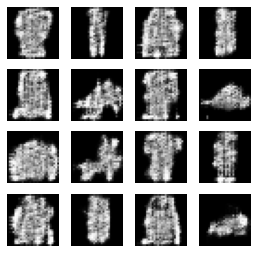

4000: [discriminator loss: 0.679260, acc: 0.679688] [adversarial loss: 0.623519, acc: 0.687500]
4001: [discriminator loss: 0.663971, acc: 0.570312] [adversarial loss: 1.016668, acc: 0.109375]
4002: [discriminator loss: 0.640528, acc: 0.664062] [adversarial loss: 0.591353, acc: 0.765625]
4003: [discriminator loss: 0.686934, acc: 0.468750] [adversarial loss: 1.019387, acc: 0.078125]
4004: [discriminator loss: 0.664119, acc: 0.632812] [adversarial loss: 0.600207, acc: 0.750000]
4005: [discriminator loss: 0.643334, acc: 0.562500] [adversarial loss: 0.949312, acc: 0.062500]
4006: [discriminator loss: 0.689813, acc: 0.593750] [adversarial loss: 0.620514, acc: 0.734375]
4007: [discriminator loss: 0.645393, acc: 0.562500] [adversarial loss: 0.873517, acc: 0.093750]
4008: [discriminator loss: 0.617919, acc: 0.703125] [adversarial loss: 0.725732, acc: 0.421875]
4009: [discriminator loss: 0.636271, acc: 0.632812] [adversarial loss: 0.830968, acc: 0.234375]
4010: [discriminator loss: 0.665381, acc

4088: [discriminator loss: 0.641296, acc: 0.578125] [adversarial loss: 1.004176, acc: 0.046875]
4089: [discriminator loss: 0.627467, acc: 0.648438] [adversarial loss: 0.567659, acc: 0.765625]
4090: [discriminator loss: 0.674521, acc: 0.570312] [adversarial loss: 1.065387, acc: 0.031250]
4091: [discriminator loss: 0.667835, acc: 0.640625] [adversarial loss: 0.683996, acc: 0.625000]
4092: [discriminator loss: 0.612466, acc: 0.640625] [adversarial loss: 0.907598, acc: 0.156250]
4093: [discriminator loss: 0.679368, acc: 0.593750] [adversarial loss: 0.654913, acc: 0.687500]
4094: [discriminator loss: 0.608369, acc: 0.679688] [adversarial loss: 0.962043, acc: 0.078125]
4095: [discriminator loss: 0.661841, acc: 0.648438] [adversarial loss: 0.669020, acc: 0.546875]
4096: [discriminator loss: 0.668453, acc: 0.531250] [adversarial loss: 1.047200, acc: 0.078125]
4097: [discriminator loss: 0.655652, acc: 0.671875] [adversarial loss: 0.737306, acc: 0.406250]
4098: [discriminator loss: 0.620215, acc

4174: [discriminator loss: 0.627973, acc: 0.640625] [adversarial loss: 0.847086, acc: 0.140625]
4175: [discriminator loss: 0.629112, acc: 0.742188] [adversarial loss: 0.665672, acc: 0.640625]
4176: [discriminator loss: 0.660678, acc: 0.554688] [adversarial loss: 0.987052, acc: 0.109375]
4177: [discriminator loss: 0.656603, acc: 0.632812] [adversarial loss: 0.545685, acc: 0.875000]
4178: [discriminator loss: 0.706391, acc: 0.507812] [adversarial loss: 1.160068, acc: 0.015625]
4179: [discriminator loss: 0.660911, acc: 0.578125] [adversarial loss: 0.561808, acc: 0.796875]
4180: [discriminator loss: 0.669711, acc: 0.500000] [adversarial loss: 1.088748, acc: 0.015625]
4181: [discriminator loss: 0.657540, acc: 0.593750] [adversarial loss: 0.630523, acc: 0.656250]
4182: [discriminator loss: 0.672765, acc: 0.554688] [adversarial loss: 0.868707, acc: 0.187500]
4183: [discriminator loss: 0.615579, acc: 0.734375] [adversarial loss: 0.776101, acc: 0.375000]
4184: [discriminator loss: 0.621582, acc

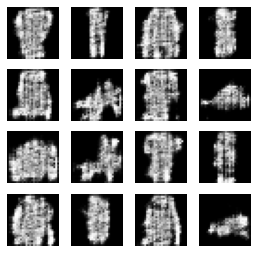

4200: [discriminator loss: 0.639178, acc: 0.601562] [adversarial loss: 0.930967, acc: 0.125000]
4201: [discriminator loss: 0.644705, acc: 0.695312] [adversarial loss: 0.738901, acc: 0.421875]
4202: [discriminator loss: 0.626002, acc: 0.656250] [adversarial loss: 0.765571, acc: 0.328125]
4203: [discriminator loss: 0.655640, acc: 0.632812] [adversarial loss: 0.749462, acc: 0.437500]
4204: [discriminator loss: 0.634373, acc: 0.710938] [adversarial loss: 0.948371, acc: 0.125000]
4205: [discriminator loss: 0.663838, acc: 0.695312] [adversarial loss: 0.574640, acc: 0.843750]
4206: [discriminator loss: 0.696777, acc: 0.445312] [adversarial loss: 1.102698, acc: 0.015625]
4207: [discriminator loss: 0.635101, acc: 0.656250] [adversarial loss: 0.666227, acc: 0.515625]
4208: [discriminator loss: 0.654777, acc: 0.546875] [adversarial loss: 0.960032, acc: 0.078125]
4209: [discriminator loss: 0.663338, acc: 0.671875] [adversarial loss: 0.600534, acc: 0.750000]
4210: [discriminator loss: 0.659799, acc

4288: [discriminator loss: 0.654477, acc: 0.515625] [adversarial loss: 0.987901, acc: 0.031250]
4289: [discriminator loss: 0.657574, acc: 0.648438] [adversarial loss: 0.577855, acc: 0.812500]
4290: [discriminator loss: 0.658437, acc: 0.562500] [adversarial loss: 0.945571, acc: 0.078125]
4291: [discriminator loss: 0.680609, acc: 0.640625] [adversarial loss: 0.696618, acc: 0.593750]
4292: [discriminator loss: 0.680175, acc: 0.523438] [adversarial loss: 0.904706, acc: 0.109375]
4293: [discriminator loss: 0.688497, acc: 0.710938] [adversarial loss: 0.624849, acc: 0.750000]
4294: [discriminator loss: 0.651261, acc: 0.554688] [adversarial loss: 0.972821, acc: 0.062500]
4295: [discriminator loss: 0.650172, acc: 0.625000] [adversarial loss: 0.719520, acc: 0.468750]
4296: [discriminator loss: 0.629293, acc: 0.664062] [adversarial loss: 0.853343, acc: 0.171875]
4297: [discriminator loss: 0.626297, acc: 0.703125] [adversarial loss: 0.614836, acc: 0.765625]
4298: [discriminator loss: 0.621413, acc

4376: [discriminator loss: 0.645460, acc: 0.578125] [adversarial loss: 0.955461, acc: 0.125000]
4377: [discriminator loss: 0.668226, acc: 0.617188] [adversarial loss: 0.553514, acc: 0.875000]
4378: [discriminator loss: 0.663664, acc: 0.500000] [adversarial loss: 1.056034, acc: 0.031250]
4379: [discriminator loss: 0.698039, acc: 0.585938] [adversarial loss: 0.586765, acc: 0.750000]
4380: [discriminator loss: 0.670922, acc: 0.546875] [adversarial loss: 0.939986, acc: 0.093750]
4381: [discriminator loss: 0.653111, acc: 0.640625] [adversarial loss: 0.661953, acc: 0.578125]
4382: [discriminator loss: 0.647194, acc: 0.648438] [adversarial loss: 0.872468, acc: 0.234375]
4383: [discriminator loss: 0.656290, acc: 0.640625] [adversarial loss: 0.671463, acc: 0.546875]
4384: [discriminator loss: 0.641294, acc: 0.593750] [adversarial loss: 0.869098, acc: 0.171875]
4385: [discriminator loss: 0.642089, acc: 0.726562] [adversarial loss: 0.762800, acc: 0.312500]
4386: [discriminator loss: 0.627181, acc

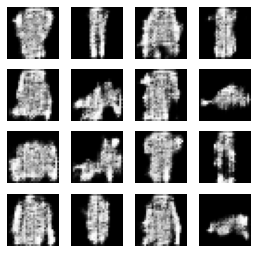

4400: [discriminator loss: 0.633441, acc: 0.679688] [adversarial loss: 0.803070, acc: 0.234375]
4401: [discriminator loss: 0.633932, acc: 0.648438] [adversarial loss: 0.870540, acc: 0.187500]
4402: [discriminator loss: 0.634403, acc: 0.687500] [adversarial loss: 0.615315, acc: 0.750000]
4403: [discriminator loss: 0.686960, acc: 0.554688] [adversarial loss: 1.165628, acc: 0.000000]
4404: [discriminator loss: 0.682922, acc: 0.562500] [adversarial loss: 0.466063, acc: 1.000000]
4405: [discriminator loss: 0.718436, acc: 0.515625] [adversarial loss: 1.105749, acc: 0.000000]
4406: [discriminator loss: 0.685608, acc: 0.578125] [adversarial loss: 0.621097, acc: 0.687500]
4407: [discriminator loss: 0.646842, acc: 0.609375] [adversarial loss: 1.012759, acc: 0.000000]
4408: [discriminator loss: 0.660826, acc: 0.601562] [adversarial loss: 0.588186, acc: 0.781250]
4409: [discriminator loss: 0.696327, acc: 0.531250] [adversarial loss: 0.890833, acc: 0.140625]
4410: [discriminator loss: 0.666844, acc

4489: [discriminator loss: 0.646077, acc: 0.640625] [adversarial loss: 0.894519, acc: 0.140625]
4490: [discriminator loss: 0.663876, acc: 0.664062] [adversarial loss: 0.678856, acc: 0.578125]
4491: [discriminator loss: 0.656723, acc: 0.593750] [adversarial loss: 1.029391, acc: 0.062500]
4492: [discriminator loss: 0.685273, acc: 0.601562] [adversarial loss: 0.550581, acc: 0.812500]
4493: [discriminator loss: 0.678116, acc: 0.515625] [adversarial loss: 1.048140, acc: 0.015625]
4494: [discriminator loss: 0.651576, acc: 0.625000] [adversarial loss: 0.654388, acc: 0.671875]
4495: [discriminator loss: 0.683093, acc: 0.515625] [adversarial loss: 0.926205, acc: 0.078125]
4496: [discriminator loss: 0.672560, acc: 0.625000] [adversarial loss: 0.662702, acc: 0.625000]
4497: [discriminator loss: 0.640288, acc: 0.585938] [adversarial loss: 0.896927, acc: 0.078125]
4498: [discriminator loss: 0.656870, acc: 0.648438] [adversarial loss: 0.675301, acc: 0.656250]
4499: [discriminator loss: 0.661303, acc

4576: [discriminator loss: 0.642321, acc: 0.671875] [adversarial loss: 0.684047, acc: 0.546875]
4577: [discriminator loss: 0.635979, acc: 0.625000] [adversarial loss: 0.924533, acc: 0.046875]
4578: [discriminator loss: 0.653733, acc: 0.640625] [adversarial loss: 0.588338, acc: 0.843750]
4579: [discriminator loss: 0.680631, acc: 0.523438] [adversarial loss: 1.151315, acc: 0.000000]
4580: [discriminator loss: 0.694340, acc: 0.546875] [adversarial loss: 0.526390, acc: 0.937500]
4581: [discriminator loss: 0.678408, acc: 0.507812] [adversarial loss: 0.900310, acc: 0.062500]
4582: [discriminator loss: 0.643651, acc: 0.640625] [adversarial loss: 0.718530, acc: 0.593750]
4583: [discriminator loss: 0.672047, acc: 0.601562] [adversarial loss: 0.805238, acc: 0.281250]
4584: [discriminator loss: 0.621388, acc: 0.695312] [adversarial loss: 0.764713, acc: 0.390625]
4585: [discriminator loss: 0.634704, acc: 0.632812] [adversarial loss: 0.797382, acc: 0.265625]
4586: [discriminator loss: 0.643259, acc

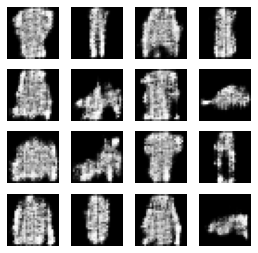

4600: [discriminator loss: 0.625406, acc: 0.656250] [adversarial loss: 0.540433, acc: 0.859375]
4601: [discriminator loss: 0.660884, acc: 0.593750] [adversarial loss: 1.028673, acc: 0.000000]
4602: [discriminator loss: 0.656470, acc: 0.617188] [adversarial loss: 0.760298, acc: 0.343750]
4603: [discriminator loss: 0.652727, acc: 0.656250] [adversarial loss: 0.838946, acc: 0.171875]
4604: [discriminator loss: 0.648963, acc: 0.718750] [adversarial loss: 0.636440, acc: 0.703125]
4605: [discriminator loss: 0.634859, acc: 0.570312] [adversarial loss: 0.881537, acc: 0.156250]
4606: [discriminator loss: 0.630625, acc: 0.671875] [adversarial loss: 0.637430, acc: 0.703125]
4607: [discriminator loss: 0.639462, acc: 0.546875] [adversarial loss: 0.978849, acc: 0.046875]
4608: [discriminator loss: 0.664761, acc: 0.601562] [adversarial loss: 0.579586, acc: 0.828125]
4609: [discriminator loss: 0.635075, acc: 0.570312] [adversarial loss: 0.949785, acc: 0.046875]
4610: [discriminator loss: 0.637510, acc

4688: [discriminator loss: 0.614086, acc: 0.726562] [adversarial loss: 0.842586, acc: 0.140625]
4689: [discriminator loss: 0.626926, acc: 0.679688] [adversarial loss: 0.649246, acc: 0.562500]
4690: [discriminator loss: 0.642328, acc: 0.562500] [adversarial loss: 1.213639, acc: 0.015625]
4691: [discriminator loss: 0.701690, acc: 0.562500] [adversarial loss: 0.450718, acc: 0.937500]
4692: [discriminator loss: 0.726119, acc: 0.531250] [adversarial loss: 1.120787, acc: 0.046875]
4693: [discriminator loss: 0.665198, acc: 0.562500] [adversarial loss: 0.582977, acc: 0.734375]
4694: [discriminator loss: 0.681992, acc: 0.546875] [adversarial loss: 0.992417, acc: 0.046875]
4695: [discriminator loss: 0.641614, acc: 0.648438] [adversarial loss: 0.671816, acc: 0.640625]
4696: [discriminator loss: 0.645348, acc: 0.632812] [adversarial loss: 0.896880, acc: 0.125000]
4697: [discriminator loss: 0.647368, acc: 0.632812] [adversarial loss: 0.690847, acc: 0.515625]
4698: [discriminator loss: 0.639254, acc

4778: [discriminator loss: 0.666084, acc: 0.523438] [adversarial loss: 1.020954, acc: 0.062500]
4779: [discriminator loss: 0.619769, acc: 0.656250] [adversarial loss: 0.662848, acc: 0.671875]
4780: [discriminator loss: 0.644484, acc: 0.539062] [adversarial loss: 0.880724, acc: 0.125000]
4781: [discriminator loss: 0.654819, acc: 0.687500] [adversarial loss: 0.678988, acc: 0.562500]
4782: [discriminator loss: 0.626075, acc: 0.625000] [adversarial loss: 0.930471, acc: 0.046875]
4783: [discriminator loss: 0.659775, acc: 0.664062] [adversarial loss: 0.636956, acc: 0.656250]
4784: [discriminator loss: 0.639576, acc: 0.578125] [adversarial loss: 0.953529, acc: 0.015625]
4785: [discriminator loss: 0.658220, acc: 0.648438] [adversarial loss: 0.597711, acc: 0.734375]
4786: [discriminator loss: 0.632442, acc: 0.601562] [adversarial loss: 0.955712, acc: 0.156250]
4787: [discriminator loss: 0.729306, acc: 0.593750] [adversarial loss: 0.527171, acc: 0.906250]
4788: [discriminator loss: 0.692034, acc

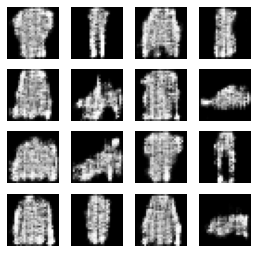

4800: [discriminator loss: 0.671026, acc: 0.617188] [adversarial loss: 0.538833, acc: 0.890625]
4801: [discriminator loss: 0.673290, acc: 0.515625] [adversarial loss: 1.063715, acc: 0.015625]
4802: [discriminator loss: 0.636532, acc: 0.640625] [adversarial loss: 0.651282, acc: 0.656250]
4803: [discriminator loss: 0.658104, acc: 0.609375] [adversarial loss: 0.932249, acc: 0.062500]
4804: [discriminator loss: 0.637645, acc: 0.679688] [adversarial loss: 0.698281, acc: 0.500000]
4805: [discriminator loss: 0.654581, acc: 0.593750] [adversarial loss: 0.776774, acc: 0.296875]
4806: [discriminator loss: 0.657450, acc: 0.671875] [adversarial loss: 0.877913, acc: 0.140625]
4807: [discriminator loss: 0.647179, acc: 0.687500] [adversarial loss: 0.625154, acc: 0.781250]
4808: [discriminator loss: 0.655074, acc: 0.578125] [adversarial loss: 0.985973, acc: 0.000000]
4809: [discriminator loss: 0.661250, acc: 0.609375] [adversarial loss: 0.566162, acc: 0.859375]
4810: [discriminator loss: 0.661122, acc

4886: [discriminator loss: 0.668118, acc: 0.585938] [adversarial loss: 0.581562, acc: 0.843750]
4887: [discriminator loss: 0.651520, acc: 0.570312] [adversarial loss: 1.007462, acc: 0.015625]
4888: [discriminator loss: 0.672563, acc: 0.609375] [adversarial loss: 0.611502, acc: 0.703125]
4889: [discriminator loss: 0.694654, acc: 0.515625] [adversarial loss: 1.040779, acc: 0.000000]
4890: [discriminator loss: 0.656426, acc: 0.617188] [adversarial loss: 0.603331, acc: 0.750000]
4891: [discriminator loss: 0.633215, acc: 0.570312] [adversarial loss: 0.860934, acc: 0.093750]
4892: [discriminator loss: 0.643490, acc: 0.664062] [adversarial loss: 0.812399, acc: 0.250000]
4893: [discriminator loss: 0.617771, acc: 0.757812] [adversarial loss: 0.688757, acc: 0.500000]
4894: [discriminator loss: 0.670825, acc: 0.593750] [adversarial loss: 0.919045, acc: 0.093750]
4895: [discriminator loss: 0.653681, acc: 0.656250] [adversarial loss: 0.704316, acc: 0.546875]
4896: [discriminator loss: 0.658775, acc

4976: [discriminator loss: 0.632167, acc: 0.710938] [adversarial loss: 0.759144, acc: 0.312500]
4977: [discriminator loss: 0.638573, acc: 0.687500] [adversarial loss: 0.693564, acc: 0.500000]
4978: [discriminator loss: 0.688036, acc: 0.531250] [adversarial loss: 0.901680, acc: 0.125000]
4979: [discriminator loss: 0.642978, acc: 0.664062] [adversarial loss: 0.615225, acc: 0.671875]
4980: [discriminator loss: 0.676481, acc: 0.546875] [adversarial loss: 1.047793, acc: 0.046875]
4981: [discriminator loss: 0.662970, acc: 0.601562] [adversarial loss: 0.638175, acc: 0.750000]
4982: [discriminator loss: 0.649902, acc: 0.578125] [adversarial loss: 0.945614, acc: 0.062500]
4983: [discriminator loss: 0.653248, acc: 0.640625] [adversarial loss: 0.670736, acc: 0.578125]
4984: [discriminator loss: 0.633549, acc: 0.679688] [adversarial loss: 0.950747, acc: 0.031250]
4985: [discriminator loss: 0.669494, acc: 0.609375] [adversarial loss: 0.585114, acc: 0.812500]
4986: [discriminator loss: 0.657821, acc

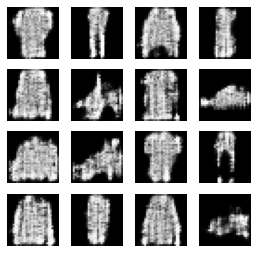

5000: [discriminator loss: 0.634441, acc: 0.687500] [adversarial loss: 0.768980, acc: 0.312500]
5001: [discriminator loss: 0.649111, acc: 0.664062] [adversarial loss: 0.724977, acc: 0.468750]
5002: [discriminator loss: 0.632050, acc: 0.671875] [adversarial loss: 0.846711, acc: 0.187500]
5003: [discriminator loss: 0.634648, acc: 0.632812] [adversarial loss: 0.789971, acc: 0.296875]
5004: [discriminator loss: 0.610936, acc: 0.710938] [adversarial loss: 0.833679, acc: 0.093750]
5005: [discriminator loss: 0.648520, acc: 0.695312] [adversarial loss: 0.784329, acc: 0.281250]
5006: [discriminator loss: 0.655546, acc: 0.617188] [adversarial loss: 0.711709, acc: 0.359375]
5007: [discriminator loss: 0.648332, acc: 0.601562] [adversarial loss: 0.890225, acc: 0.046875]
5008: [discriminator loss: 0.652296, acc: 0.664062] [adversarial loss: 0.654360, acc: 0.640625]
5009: [discriminator loss: 0.649092, acc: 0.570312] [adversarial loss: 0.999047, acc: 0.000000]
5010: [discriminator loss: 0.630119, acc

5090: [discriminator loss: 0.666070, acc: 0.554688] [adversarial loss: 0.979187, acc: 0.062500]
5091: [discriminator loss: 0.627514, acc: 0.664062] [adversarial loss: 0.694277, acc: 0.546875]
5092: [discriminator loss: 0.633213, acc: 0.648438] [adversarial loss: 0.794433, acc: 0.265625]
5093: [discriminator loss: 0.643372, acc: 0.632812] [adversarial loss: 0.745761, acc: 0.421875]
5094: [discriminator loss: 0.636217, acc: 0.679688] [adversarial loss: 0.902564, acc: 0.078125]
5095: [discriminator loss: 0.615319, acc: 0.695312] [adversarial loss: 0.714553, acc: 0.453125]
5096: [discriminator loss: 0.621871, acc: 0.703125] [adversarial loss: 0.835716, acc: 0.125000]
5097: [discriminator loss: 0.628468, acc: 0.742188] [adversarial loss: 0.806529, acc: 0.296875]
5098: [discriminator loss: 0.591754, acc: 0.765625] [adversarial loss: 0.859575, acc: 0.203125]
5099: [discriminator loss: 0.624069, acc: 0.679688] [adversarial loss: 0.601718, acc: 0.781250]
5100: [discriminator loss: 0.674714, acc

5180: [discriminator loss: 0.605567, acc: 0.664062] [adversarial loss: 1.174480, acc: 0.031250]
5181: [discriminator loss: 0.629501, acc: 0.648438] [adversarial loss: 0.586073, acc: 0.750000]
5182: [discriminator loss: 0.672135, acc: 0.515625] [adversarial loss: 1.122548, acc: 0.000000]
5183: [discriminator loss: 0.658975, acc: 0.578125] [adversarial loss: 0.584895, acc: 0.796875]
5184: [discriminator loss: 0.654049, acc: 0.539062] [adversarial loss: 0.925390, acc: 0.171875]
5185: [discriminator loss: 0.657198, acc: 0.632812] [adversarial loss: 0.616294, acc: 0.687500]
5186: [discriminator loss: 0.625426, acc: 0.554688] [adversarial loss: 0.983347, acc: 0.031250]
5187: [discriminator loss: 0.648733, acc: 0.632812] [adversarial loss: 0.647587, acc: 0.703125]
5188: [discriminator loss: 0.681656, acc: 0.500000] [adversarial loss: 0.846400, acc: 0.140625]
5189: [discriminator loss: 0.623853, acc: 0.734375] [adversarial loss: 0.667327, acc: 0.593750]
5190: [discriminator loss: 0.662343, acc

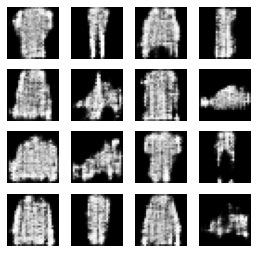

5200: [discriminator loss: 0.624003, acc: 0.703125] [adversarial loss: 0.764727, acc: 0.375000]
5201: [discriminator loss: 0.636930, acc: 0.726562] [adversarial loss: 0.848454, acc: 0.218750]
5202: [discriminator loss: 0.635256, acc: 0.656250] [adversarial loss: 0.633224, acc: 0.656250]
5203: [discriminator loss: 0.620527, acc: 0.617188] [adversarial loss: 1.123221, acc: 0.000000]
5204: [discriminator loss: 0.647885, acc: 0.585938] [adversarial loss: 0.567570, acc: 0.890625]
5205: [discriminator loss: 0.687109, acc: 0.523438] [adversarial loss: 1.058675, acc: 0.046875]
5206: [discriminator loss: 0.620487, acc: 0.671875] [adversarial loss: 0.622157, acc: 0.703125]
5207: [discriminator loss: 0.647914, acc: 0.585938] [adversarial loss: 0.973136, acc: 0.078125]
5208: [discriminator loss: 0.642329, acc: 0.632812] [adversarial loss: 0.619351, acc: 0.656250]
5209: [discriminator loss: 0.637911, acc: 0.601562] [adversarial loss: 0.900516, acc: 0.125000]
5210: [discriminator loss: 0.640039, acc

5289: [discriminator loss: 0.608636, acc: 0.726562] [adversarial loss: 0.726707, acc: 0.531250]
5290: [discriminator loss: 0.673802, acc: 0.492188] [adversarial loss: 0.974536, acc: 0.078125]
5291: [discriminator loss: 0.630454, acc: 0.664062] [adversarial loss: 0.606955, acc: 0.718750]
5292: [discriminator loss: 0.602332, acc: 0.640625] [adversarial loss: 0.913055, acc: 0.078125]
5293: [discriminator loss: 0.622848, acc: 0.664062] [adversarial loss: 0.575535, acc: 0.750000]
5294: [discriminator loss: 0.661240, acc: 0.531250] [adversarial loss: 1.012395, acc: 0.000000]
5295: [discriminator loss: 0.655829, acc: 0.617188] [adversarial loss: 0.590193, acc: 0.796875]
5296: [discriminator loss: 0.683131, acc: 0.531250] [adversarial loss: 0.986964, acc: 0.031250]
5297: [discriminator loss: 0.644351, acc: 0.617188] [adversarial loss: 0.645271, acc: 0.656250]
5298: [discriminator loss: 0.639498, acc: 0.601562] [adversarial loss: 0.960416, acc: 0.062500]
5299: [discriminator loss: 0.628327, acc

5377: [discriminator loss: 0.610107, acc: 0.640625] [adversarial loss: 1.010248, acc: 0.046875]
5378: [discriminator loss: 0.653652, acc: 0.640625] [adversarial loss: 0.654639, acc: 0.546875]
5379: [discriminator loss: 0.641386, acc: 0.562500] [adversarial loss: 0.926625, acc: 0.093750]
5380: [discriminator loss: 0.661119, acc: 0.664062] [adversarial loss: 0.595773, acc: 0.703125]
5381: [discriminator loss: 0.626631, acc: 0.585938] [adversarial loss: 0.954432, acc: 0.109375]
5382: [discriminator loss: 0.642543, acc: 0.632812] [adversarial loss: 0.683441, acc: 0.546875]
5383: [discriminator loss: 0.635822, acc: 0.632812] [adversarial loss: 0.906788, acc: 0.125000]
5384: [discriminator loss: 0.626586, acc: 0.710938] [adversarial loss: 0.650645, acc: 0.687500]
5385: [discriminator loss: 0.653256, acc: 0.554688] [adversarial loss: 0.969347, acc: 0.031250]
5386: [discriminator loss: 0.684263, acc: 0.578125] [adversarial loss: 0.630306, acc: 0.656250]
5387: [discriminator loss: 0.651468, acc

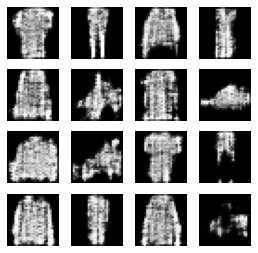

5400: [discriminator loss: 0.698195, acc: 0.492188] [adversarial loss: 1.084649, acc: 0.015625]
5401: [discriminator loss: 0.659005, acc: 0.593750] [adversarial loss: 0.669192, acc: 0.640625]
5402: [discriminator loss: 0.642130, acc: 0.554688] [adversarial loss: 0.852253, acc: 0.078125]
5403: [discriminator loss: 0.629124, acc: 0.656250] [adversarial loss: 0.747685, acc: 0.390625]
5404: [discriminator loss: 0.630757, acc: 0.703125] [adversarial loss: 0.744080, acc: 0.265625]
5405: [discriminator loss: 0.670434, acc: 0.625000] [adversarial loss: 0.808056, acc: 0.281250]
5406: [discriminator loss: 0.609112, acc: 0.750000] [adversarial loss: 0.748178, acc: 0.406250]
5407: [discriminator loss: 0.670547, acc: 0.562500] [adversarial loss: 0.765910, acc: 0.250000]
5408: [discriminator loss: 0.640186, acc: 0.718750] [adversarial loss: 0.732166, acc: 0.437500]
5409: [discriminator loss: 0.629922, acc: 0.757812] [adversarial loss: 0.746070, acc: 0.421875]
5410: [discriminator loss: 0.640647, acc

5486: [discriminator loss: 0.649093, acc: 0.570312] [adversarial loss: 0.969310, acc: 0.046875]
5487: [discriminator loss: 0.652956, acc: 0.656250] [adversarial loss: 0.579790, acc: 0.906250]
5488: [discriminator loss: 0.661131, acc: 0.531250] [adversarial loss: 1.019835, acc: 0.015625]
5489: [discriminator loss: 0.643003, acc: 0.601562] [adversarial loss: 0.615226, acc: 0.765625]
5490: [discriminator loss: 0.639695, acc: 0.570312] [adversarial loss: 0.844225, acc: 0.234375]
5491: [discriminator loss: 0.645516, acc: 0.585938] [adversarial loss: 0.703719, acc: 0.546875]
5492: [discriminator loss: 0.635412, acc: 0.609375] [adversarial loss: 0.922115, acc: 0.046875]
5493: [discriminator loss: 0.608225, acc: 0.710938] [adversarial loss: 0.667718, acc: 0.671875]
5494: [discriminator loss: 0.663103, acc: 0.546875] [adversarial loss: 0.933265, acc: 0.031250]
5495: [discriminator loss: 0.622928, acc: 0.695312] [adversarial loss: 0.709554, acc: 0.437500]
5496: [discriminator loss: 0.633525, acc

5574: [discriminator loss: 0.635668, acc: 0.679688] [adversarial loss: 0.754142, acc: 0.390625]
5575: [discriminator loss: 0.613377, acc: 0.687500] [adversarial loss: 0.898504, acc: 0.156250]
5576: [discriminator loss: 0.626648, acc: 0.710938] [adversarial loss: 0.760524, acc: 0.375000]
5577: [discriminator loss: 0.645487, acc: 0.671875] [adversarial loss: 0.860412, acc: 0.156250]
5578: [discriminator loss: 0.621993, acc: 0.695312] [adversarial loss: 0.690115, acc: 0.531250]
5579: [discriminator loss: 0.633280, acc: 0.625000] [adversarial loss: 1.008438, acc: 0.031250]
5580: [discriminator loss: 0.656430, acc: 0.632812] [adversarial loss: 0.588601, acc: 0.828125]
5581: [discriminator loss: 0.639474, acc: 0.562500] [adversarial loss: 1.160602, acc: 0.031250]
5582: [discriminator loss: 0.671783, acc: 0.578125] [adversarial loss: 0.600682, acc: 0.828125]
5583: [discriminator loss: 0.644360, acc: 0.554688] [adversarial loss: 0.979658, acc: 0.000000]
5584: [discriminator loss: 0.652253, acc

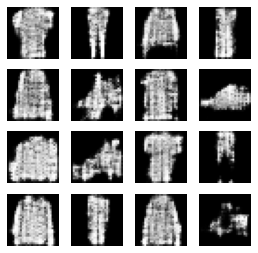

5600: [discriminator loss: 0.621382, acc: 0.570312] [adversarial loss: 1.037327, acc: 0.031250]
5601: [discriminator loss: 0.663892, acc: 0.578125] [adversarial loss: 0.666745, acc: 0.593750]
5602: [discriminator loss: 0.633634, acc: 0.593750] [adversarial loss: 0.897741, acc: 0.046875]
5603: [discriminator loss: 0.620102, acc: 0.718750] [adversarial loss: 0.695821, acc: 0.531250]
5604: [discriminator loss: 0.626366, acc: 0.617188] [adversarial loss: 0.852217, acc: 0.109375]
5605: [discriminator loss: 0.615719, acc: 0.695312] [adversarial loss: 0.799134, acc: 0.156250]
5606: [discriminator loss: 0.652908, acc: 0.664062] [adversarial loss: 0.781593, acc: 0.296875]
5607: [discriminator loss: 0.604775, acc: 0.773438] [adversarial loss: 0.862933, acc: 0.140625]
5608: [discriminator loss: 0.634004, acc: 0.671875] [adversarial loss: 0.652265, acc: 0.656250]
5609: [discriminator loss: 0.645193, acc: 0.585938] [adversarial loss: 0.811405, acc: 0.218750]
5610: [discriminator loss: 0.623449, acc

5687: [discriminator loss: 0.615049, acc: 0.718750] [adversarial loss: 0.799296, acc: 0.234375]
5688: [discriminator loss: 0.624972, acc: 0.718750] [adversarial loss: 0.715109, acc: 0.453125]
5689: [discriminator loss: 0.624200, acc: 0.695312] [adversarial loss: 0.913081, acc: 0.062500]
5690: [discriminator loss: 0.642285, acc: 0.656250] [adversarial loss: 0.583698, acc: 0.875000]
5691: [discriminator loss: 0.661127, acc: 0.546875] [adversarial loss: 1.039108, acc: 0.046875]
5692: [discriminator loss: 0.648210, acc: 0.687500] [adversarial loss: 0.570815, acc: 0.781250]
5693: [discriminator loss: 0.666633, acc: 0.515625] [adversarial loss: 0.972586, acc: 0.062500]
5694: [discriminator loss: 0.639033, acc: 0.632812] [adversarial loss: 0.757031, acc: 0.343750]
5695: [discriminator loss: 0.603018, acc: 0.710938] [adversarial loss: 0.869889, acc: 0.109375]
5696: [discriminator loss: 0.625009, acc: 0.718750] [adversarial loss: 0.706877, acc: 0.531250]
5697: [discriminator loss: 0.619243, acc

5776: [discriminator loss: 0.693416, acc: 0.500000] [adversarial loss: 0.952432, acc: 0.046875]
5777: [discriminator loss: 0.655301, acc: 0.617188] [adversarial loss: 0.730982, acc: 0.437500]
5778: [discriminator loss: 0.638443, acc: 0.632812] [adversarial loss: 0.839018, acc: 0.156250]
5779: [discriminator loss: 0.653163, acc: 0.726562] [adversarial loss: 0.857638, acc: 0.109375]
5780: [discriminator loss: 0.625881, acc: 0.671875] [adversarial loss: 0.701970, acc: 0.468750]
5781: [discriminator loss: 0.629503, acc: 0.656250] [adversarial loss: 1.035933, acc: 0.015625]
5782: [discriminator loss: 0.620513, acc: 0.609375] [adversarial loss: 0.649078, acc: 0.671875]
5783: [discriminator loss: 0.679339, acc: 0.585938] [adversarial loss: 1.008169, acc: 0.062500]
5784: [discriminator loss: 0.605437, acc: 0.648438] [adversarial loss: 0.695971, acc: 0.468750]
5785: [discriminator loss: 0.629403, acc: 0.640625] [adversarial loss: 1.058461, acc: 0.031250]
5786: [discriminator loss: 0.629279, acc

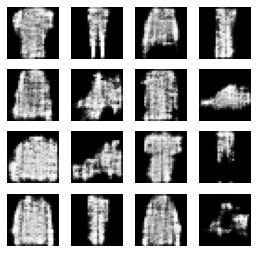

5800: [discriminator loss: 0.645353, acc: 0.601562] [adversarial loss: 0.560378, acc: 0.843750]
5801: [discriminator loss: 0.642833, acc: 0.578125] [adversarial loss: 0.961711, acc: 0.046875]
5802: [discriminator loss: 0.666741, acc: 0.609375] [adversarial loss: 0.659795, acc: 0.625000]
5803: [discriminator loss: 0.625039, acc: 0.601562] [adversarial loss: 0.962401, acc: 0.046875]
5804: [discriminator loss: 0.648175, acc: 0.640625] [adversarial loss: 0.653008, acc: 0.578125]
5805: [discriminator loss: 0.680387, acc: 0.539062] [adversarial loss: 0.891795, acc: 0.093750]
5806: [discriminator loss: 0.605746, acc: 0.718750] [adversarial loss: 0.780589, acc: 0.265625]
5807: [discriminator loss: 0.626141, acc: 0.664062] [adversarial loss: 0.915281, acc: 0.140625]
5808: [discriminator loss: 0.604325, acc: 0.679688] [adversarial loss: 0.840425, acc: 0.187500]
5809: [discriminator loss: 0.623266, acc: 0.726562] [adversarial loss: 0.821385, acc: 0.234375]
5810: [discriminator loss: 0.606040, acc

5887: [discriminator loss: 0.654218, acc: 0.570312] [adversarial loss: 1.056535, acc: 0.015625]
5888: [discriminator loss: 0.632180, acc: 0.664062] [adversarial loss: 0.673899, acc: 0.593750]
5889: [discriminator loss: 0.643006, acc: 0.640625] [adversarial loss: 0.802259, acc: 0.140625]
5890: [discriminator loss: 0.636052, acc: 0.695312] [adversarial loss: 0.795662, acc: 0.171875]
5891: [discriminator loss: 0.621793, acc: 0.718750] [adversarial loss: 0.741622, acc: 0.359375]
5892: [discriminator loss: 0.613067, acc: 0.703125] [adversarial loss: 0.876323, acc: 0.031250]
5893: [discriminator loss: 0.624557, acc: 0.726562] [adversarial loss: 0.647141, acc: 0.656250]
5894: [discriminator loss: 0.637861, acc: 0.632812] [adversarial loss: 0.949899, acc: 0.046875]
5895: [discriminator loss: 0.633428, acc: 0.640625] [adversarial loss: 0.632721, acc: 0.718750]
5896: [discriminator loss: 0.630880, acc: 0.585938] [adversarial loss: 1.090346, acc: 0.046875]
5897: [discriminator loss: 0.680374, acc

5974: [discriminator loss: 0.657550, acc: 0.671875] [adversarial loss: 0.693673, acc: 0.531250]
5975: [discriminator loss: 0.631995, acc: 0.601562] [adversarial loss: 0.839207, acc: 0.156250]
5976: [discriminator loss: 0.626328, acc: 0.742188] [adversarial loss: 0.798182, acc: 0.328125]
5977: [discriminator loss: 0.616806, acc: 0.750000] [adversarial loss: 0.850646, acc: 0.156250]
5978: [discriminator loss: 0.613696, acc: 0.703125] [adversarial loss: 0.812728, acc: 0.187500]
5979: [discriminator loss: 0.588652, acc: 0.742188] [adversarial loss: 0.958586, acc: 0.046875]
5980: [discriminator loss: 0.635536, acc: 0.664062] [adversarial loss: 0.682034, acc: 0.609375]
5981: [discriminator loss: 0.638786, acc: 0.625000] [adversarial loss: 0.885913, acc: 0.078125]
5982: [discriminator loss: 0.619697, acc: 0.671875] [adversarial loss: 0.699897, acc: 0.546875]
5983: [discriminator loss: 0.646761, acc: 0.609375] [adversarial loss: 0.899082, acc: 0.109375]
5984: [discriminator loss: 0.632307, acc

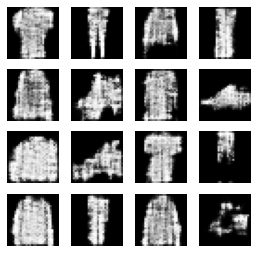

6000: [discriminator loss: 0.600067, acc: 0.757812] [adversarial loss: 0.881194, acc: 0.125000]
6001: [discriminator loss: 0.610628, acc: 0.757812] [adversarial loss: 0.673559, acc: 0.593750]
6002: [discriminator loss: 0.605666, acc: 0.679688] [adversarial loss: 1.046246, acc: 0.078125]
6003: [discriminator loss: 0.636804, acc: 0.625000] [adversarial loss: 0.692386, acc: 0.468750]
6004: [discriminator loss: 0.617397, acc: 0.679688] [adversarial loss: 1.127123, acc: 0.031250]
6005: [discriminator loss: 0.688442, acc: 0.546875] [adversarial loss: 0.549938, acc: 0.859375]
6006: [discriminator loss: 0.667627, acc: 0.523438] [adversarial loss: 1.042153, acc: 0.000000]
6007: [discriminator loss: 0.643490, acc: 0.625000] [adversarial loss: 0.660112, acc: 0.656250]
6008: [discriminator loss: 0.638439, acc: 0.562500] [adversarial loss: 0.879760, acc: 0.062500]
6009: [discriminator loss: 0.605156, acc: 0.773438] [adversarial loss: 0.732757, acc: 0.375000]
6010: [discriminator loss: 0.620444, acc

6089: [discriminator loss: 0.636906, acc: 0.625000] [adversarial loss: 0.646745, acc: 0.656250]
6090: [discriminator loss: 0.663252, acc: 0.546875] [adversarial loss: 1.045915, acc: 0.046875]
6091: [discriminator loss: 0.629048, acc: 0.664062] [adversarial loss: 0.609828, acc: 0.796875]
6092: [discriminator loss: 0.695558, acc: 0.476562] [adversarial loss: 0.929897, acc: 0.093750]
6093: [discriminator loss: 0.609086, acc: 0.648438] [adversarial loss: 0.785791, acc: 0.265625]
6094: [discriminator loss: 0.621226, acc: 0.718750] [adversarial loss: 0.798906, acc: 0.296875]
6095: [discriminator loss: 0.651855, acc: 0.617188] [adversarial loss: 0.857059, acc: 0.140625]
6096: [discriminator loss: 0.639561, acc: 0.664062] [adversarial loss: 0.862917, acc: 0.140625]
6097: [discriminator loss: 0.625598, acc: 0.640625] [adversarial loss: 0.667765, acc: 0.546875]
6098: [discriminator loss: 0.623645, acc: 0.617188] [adversarial loss: 1.079238, acc: 0.031250]
6099: [discriminator loss: 0.665862, acc

6175: [discriminator loss: 0.666894, acc: 0.539062] [adversarial loss: 1.058507, acc: 0.062500]
6176: [discriminator loss: 0.684314, acc: 0.609375] [adversarial loss: 0.501018, acc: 0.906250]
6177: [discriminator loss: 0.680907, acc: 0.492188] [adversarial loss: 1.101642, acc: 0.031250]
6178: [discriminator loss: 0.634672, acc: 0.593750] [adversarial loss: 0.670692, acc: 0.640625]
6179: [discriminator loss: 0.646896, acc: 0.562500] [adversarial loss: 0.864358, acc: 0.140625]
6180: [discriminator loss: 0.635738, acc: 0.656250] [adversarial loss: 0.743333, acc: 0.437500]
6181: [discriminator loss: 0.623127, acc: 0.679688] [adversarial loss: 0.843502, acc: 0.218750]
6182: [discriminator loss: 0.616718, acc: 0.703125] [adversarial loss: 0.762724, acc: 0.328125]
6183: [discriminator loss: 0.634196, acc: 0.687500] [adversarial loss: 0.913941, acc: 0.093750]
6184: [discriminator loss: 0.624922, acc: 0.695312] [adversarial loss: 0.661895, acc: 0.578125]
6185: [discriminator loss: 0.625117, acc

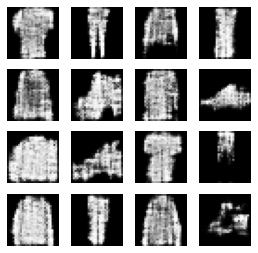

6200: [discriminator loss: 0.607761, acc: 0.703125] [adversarial loss: 0.709085, acc: 0.484375]
6201: [discriminator loss: 0.644315, acc: 0.601562] [adversarial loss: 0.863024, acc: 0.093750]
6202: [discriminator loss: 0.621760, acc: 0.734375] [adversarial loss: 0.716684, acc: 0.437500]
6203: [discriminator loss: 0.663211, acc: 0.609375] [adversarial loss: 0.860604, acc: 0.062500]
6204: [discriminator loss: 0.630342, acc: 0.695312] [adversarial loss: 0.683242, acc: 0.515625]
6205: [discriminator loss: 0.626105, acc: 0.648438] [adversarial loss: 0.958228, acc: 0.031250]
6206: [discriminator loss: 0.645856, acc: 0.617188] [adversarial loss: 0.633403, acc: 0.718750]
6207: [discriminator loss: 0.625242, acc: 0.656250] [adversarial loss: 1.116087, acc: 0.015625]
6208: [discriminator loss: 0.643353, acc: 0.632812] [adversarial loss: 0.513701, acc: 0.968750]
6209: [discriminator loss: 0.650155, acc: 0.546875] [adversarial loss: 0.997486, acc: 0.125000]
6210: [discriminator loss: 0.670579, acc

6291: [discriminator loss: 0.628872, acc: 0.578125] [adversarial loss: 0.954904, acc: 0.078125]
6292: [discriminator loss: 0.663931, acc: 0.640625] [adversarial loss: 0.640748, acc: 0.687500]
6293: [discriminator loss: 0.630246, acc: 0.570312] [adversarial loss: 0.939570, acc: 0.093750]
6294: [discriminator loss: 0.626122, acc: 0.710938] [adversarial loss: 0.616701, acc: 0.734375]
6295: [discriminator loss: 0.640189, acc: 0.648438] [adversarial loss: 0.873703, acc: 0.093750]
6296: [discriminator loss: 0.663762, acc: 0.609375] [adversarial loss: 0.630948, acc: 0.687500]
6297: [discriminator loss: 0.645186, acc: 0.570312] [adversarial loss: 0.843047, acc: 0.156250]
6298: [discriminator loss: 0.617088, acc: 0.718750] [adversarial loss: 0.755879, acc: 0.375000]
6299: [discriminator loss: 0.644164, acc: 0.648438] [adversarial loss: 0.822381, acc: 0.265625]
6300: [discriminator loss: 0.615248, acc: 0.718750] [adversarial loss: 0.735402, acc: 0.468750]
6301: [discriminator loss: 0.642102, acc

6379: [discriminator loss: 0.627599, acc: 0.664062] [adversarial loss: 0.695091, acc: 0.484375]
6380: [discriminator loss: 0.612877, acc: 0.718750] [adversarial loss: 0.995614, acc: 0.093750]
6381: [discriminator loss: 0.612057, acc: 0.687500] [adversarial loss: 0.683673, acc: 0.515625]
6382: [discriminator loss: 0.619571, acc: 0.695312] [adversarial loss: 0.883594, acc: 0.187500]
6383: [discriminator loss: 0.608996, acc: 0.734375] [adversarial loss: 0.774799, acc: 0.234375]
6384: [discriminator loss: 0.625736, acc: 0.671875] [adversarial loss: 0.824269, acc: 0.187500]
6385: [discriminator loss: 0.627315, acc: 0.750000] [adversarial loss: 0.785495, acc: 0.359375]
6386: [discriminator loss: 0.599481, acc: 0.750000] [adversarial loss: 0.802971, acc: 0.312500]
6387: [discriminator loss: 0.631129, acc: 0.640625] [adversarial loss: 0.795908, acc: 0.328125]
6388: [discriminator loss: 0.616759, acc: 0.648438] [adversarial loss: 0.852470, acc: 0.312500]
6389: [discriminator loss: 0.643066, acc

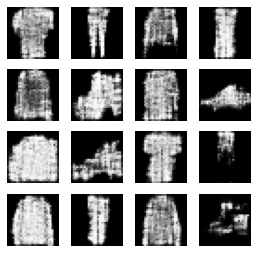

6400: [discriminator loss: 0.632535, acc: 0.710938] [adversarial loss: 0.792288, acc: 0.312500]
6401: [discriminator loss: 0.637814, acc: 0.656250] [adversarial loss: 0.863364, acc: 0.125000]
6402: [discriminator loss: 0.627082, acc: 0.726562] [adversarial loss: 0.633989, acc: 0.750000]
6403: [discriminator loss: 0.666147, acc: 0.531250] [adversarial loss: 0.975431, acc: 0.062500]
6404: [discriminator loss: 0.655865, acc: 0.601562] [adversarial loss: 0.660578, acc: 0.578125]
6405: [discriminator loss: 0.615876, acc: 0.625000] [adversarial loss: 0.840299, acc: 0.281250]
6406: [discriminator loss: 0.627295, acc: 0.656250] [adversarial loss: 0.734082, acc: 0.484375]
6407: [discriminator loss: 0.613001, acc: 0.671875] [adversarial loss: 0.945174, acc: 0.046875]
6408: [discriminator loss: 0.637811, acc: 0.679688] [adversarial loss: 0.648266, acc: 0.703125]
6409: [discriminator loss: 0.645090, acc: 0.617188] [adversarial loss: 1.067550, acc: 0.062500]
6410: [discriminator loss: 0.704521, acc

6486: [discriminator loss: 0.621562, acc: 0.695312] [adversarial loss: 0.656925, acc: 0.609375]
6487: [discriminator loss: 0.647136, acc: 0.593750] [adversarial loss: 0.997149, acc: 0.078125]
6488: [discriminator loss: 0.623826, acc: 0.695312] [adversarial loss: 0.679508, acc: 0.515625]
6489: [discriminator loss: 0.643236, acc: 0.664062] [adversarial loss: 0.834556, acc: 0.234375]
6490: [discriminator loss: 0.651581, acc: 0.640625] [adversarial loss: 0.977929, acc: 0.078125]
6491: [discriminator loss: 0.654936, acc: 0.632812] [adversarial loss: 0.535149, acc: 0.828125]
6492: [discriminator loss: 0.709234, acc: 0.500000] [adversarial loss: 1.132408, acc: 0.031250]
6493: [discriminator loss: 0.657556, acc: 0.625000] [adversarial loss: 0.720523, acc: 0.421875]
6494: [discriminator loss: 0.670689, acc: 0.593750] [adversarial loss: 0.791612, acc: 0.171875]
6495: [discriminator loss: 0.634707, acc: 0.664062] [adversarial loss: 0.900444, acc: 0.140625]
6496: [discriminator loss: 0.653920, acc

6575: [discriminator loss: 0.682144, acc: 0.585938] [adversarial loss: 0.570298, acc: 0.750000]
6576: [discriminator loss: 0.666214, acc: 0.570312] [adversarial loss: 0.985916, acc: 0.093750]
6577: [discriminator loss: 0.648087, acc: 0.648438] [adversarial loss: 0.621349, acc: 0.703125]
6578: [discriminator loss: 0.646087, acc: 0.617188] [adversarial loss: 0.842738, acc: 0.156250]
6579: [discriminator loss: 0.617558, acc: 0.695312] [adversarial loss: 0.814183, acc: 0.312500]
6580: [discriminator loss: 0.632753, acc: 0.656250] [adversarial loss: 0.729977, acc: 0.421875]
6581: [discriminator loss: 0.661696, acc: 0.562500] [adversarial loss: 0.932900, acc: 0.156250]
6582: [discriminator loss: 0.621932, acc: 0.687500] [adversarial loss: 0.688812, acc: 0.578125]
6583: [discriminator loss: 0.616458, acc: 0.695312] [adversarial loss: 0.927263, acc: 0.046875]
6584: [discriminator loss: 0.656353, acc: 0.648438] [adversarial loss: 0.635418, acc: 0.656250]
6585: [discriminator loss: 0.664111, acc

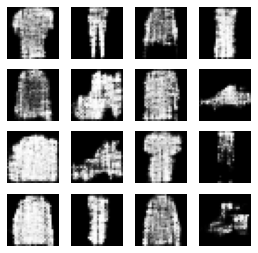

6600: [discriminator loss: 0.626773, acc: 0.679688] [adversarial loss: 0.661842, acc: 0.625000]
6601: [discriminator loss: 0.627339, acc: 0.648438] [adversarial loss: 0.846351, acc: 0.234375]
6602: [discriminator loss: 0.634085, acc: 0.703125] [adversarial loss: 0.756564, acc: 0.453125]
6603: [discriminator loss: 0.616609, acc: 0.710938] [adversarial loss: 0.890654, acc: 0.218750]
6604: [discriminator loss: 0.652196, acc: 0.625000] [adversarial loss: 0.675578, acc: 0.625000]
6605: [discriminator loss: 0.651220, acc: 0.578125] [adversarial loss: 0.902480, acc: 0.125000]
6606: [discriminator loss: 0.649167, acc: 0.617188] [adversarial loss: 0.685081, acc: 0.531250]
6607: [discriminator loss: 0.665678, acc: 0.601562] [adversarial loss: 0.907809, acc: 0.156250]
6608: [discriminator loss: 0.654028, acc: 0.648438] [adversarial loss: 0.753772, acc: 0.390625]
6609: [discriminator loss: 0.639269, acc: 0.679688] [adversarial loss: 0.860869, acc: 0.218750]
6610: [discriminator loss: 0.644974, acc

6690: [discriminator loss: 0.640338, acc: 0.609375] [adversarial loss: 0.914939, acc: 0.109375]
6691: [discriminator loss: 0.661004, acc: 0.601562] [adversarial loss: 0.612275, acc: 0.640625]
6692: [discriminator loss: 0.627967, acc: 0.656250] [adversarial loss: 0.825066, acc: 0.218750]
6693: [discriminator loss: 0.641743, acc: 0.656250] [adversarial loss: 0.784539, acc: 0.250000]
6694: [discriminator loss: 0.622997, acc: 0.718750] [adversarial loss: 0.702219, acc: 0.562500]
6695: [discriminator loss: 0.651100, acc: 0.585938] [adversarial loss: 0.858566, acc: 0.203125]
6696: [discriminator loss: 0.663354, acc: 0.625000] [adversarial loss: 0.768532, acc: 0.375000]
6697: [discriminator loss: 0.629516, acc: 0.656250] [adversarial loss: 0.859330, acc: 0.171875]
6698: [discriminator loss: 0.628286, acc: 0.757812] [adversarial loss: 0.697666, acc: 0.468750]
6699: [discriminator loss: 0.687105, acc: 0.617188] [adversarial loss: 0.911441, acc: 0.125000]
6700: [discriminator loss: 0.644744, acc

6778: [discriminator loss: 0.626421, acc: 0.664062] [adversarial loss: 1.082063, acc: 0.031250]
6779: [discriminator loss: 0.659308, acc: 0.601562] [adversarial loss: 0.612093, acc: 0.687500]
6780: [discriminator loss: 0.661695, acc: 0.585938] [adversarial loss: 1.046012, acc: 0.078125]
6781: [discriminator loss: 0.680185, acc: 0.562500] [adversarial loss: 0.660114, acc: 0.593750]
6782: [discriminator loss: 0.650598, acc: 0.593750] [adversarial loss: 0.927540, acc: 0.031250]
6783: [discriminator loss: 0.637655, acc: 0.632812] [adversarial loss: 0.621720, acc: 0.625000]
6784: [discriminator loss: 0.650233, acc: 0.593750] [adversarial loss: 0.934140, acc: 0.093750]
6785: [discriminator loss: 0.625823, acc: 0.687500] [adversarial loss: 0.743192, acc: 0.406250]
6786: [discriminator loss: 0.641829, acc: 0.664062] [adversarial loss: 0.822633, acc: 0.171875]
6787: [discriminator loss: 0.639634, acc: 0.640625] [adversarial loss: 0.628594, acc: 0.703125]
6788: [discriminator loss: 0.633371, acc

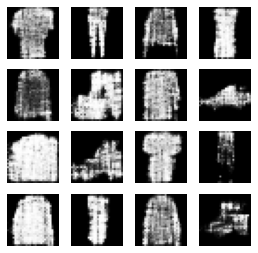

6800: [discriminator loss: 0.667157, acc: 0.570312] [adversarial loss: 0.930892, acc: 0.109375]
6801: [discriminator loss: 0.670300, acc: 0.609375] [adversarial loss: 0.729334, acc: 0.375000]
6802: [discriminator loss: 0.649320, acc: 0.671875] [adversarial loss: 0.844248, acc: 0.187500]
6803: [discriminator loss: 0.646981, acc: 0.664062] [adversarial loss: 0.762167, acc: 0.343750]
6804: [discriminator loss: 0.658451, acc: 0.632812] [adversarial loss: 0.698005, acc: 0.515625]
6805: [discriminator loss: 0.689599, acc: 0.585938] [adversarial loss: 0.803078, acc: 0.218750]
6806: [discriminator loss: 0.629049, acc: 0.703125] [adversarial loss: 0.851697, acc: 0.140625]
6807: [discriminator loss: 0.633435, acc: 0.695312] [adversarial loss: 0.721365, acc: 0.390625]
6808: [discriminator loss: 0.654353, acc: 0.640625] [adversarial loss: 0.903102, acc: 0.140625]
6809: [discriminator loss: 0.691745, acc: 0.601562] [adversarial loss: 0.679610, acc: 0.562500]
6810: [discriminator loss: 0.615305, acc

6890: [discriminator loss: 0.668412, acc: 0.554688] [adversarial loss: 0.754152, acc: 0.453125]
6891: [discriminator loss: 0.648393, acc: 0.664062] [adversarial loss: 0.742727, acc: 0.390625]
6892: [discriminator loss: 0.644735, acc: 0.640625] [adversarial loss: 0.777044, acc: 0.265625]
6893: [discriminator loss: 0.639781, acc: 0.710938] [adversarial loss: 0.761182, acc: 0.328125]
6894: [discriminator loss: 0.645580, acc: 0.664062] [adversarial loss: 0.694268, acc: 0.546875]
6895: [discriminator loss: 0.662682, acc: 0.570312] [adversarial loss: 0.843115, acc: 0.265625]
6896: [discriminator loss: 0.641990, acc: 0.625000] [adversarial loss: 0.680161, acc: 0.546875]
6897: [discriminator loss: 0.636015, acc: 0.625000] [adversarial loss: 0.876773, acc: 0.156250]
6898: [discriminator loss: 0.670476, acc: 0.625000] [adversarial loss: 0.590029, acc: 0.781250]
6899: [discriminator loss: 0.673284, acc: 0.593750] [adversarial loss: 1.035292, acc: 0.031250]
6900: [discriminator loss: 0.670326, acc

6978: [discriminator loss: 0.704376, acc: 0.554688] [adversarial loss: 0.701084, acc: 0.500000]
6979: [discriminator loss: 0.688231, acc: 0.601562] [adversarial loss: 0.789365, acc: 0.312500]
6980: [discriminator loss: 0.653901, acc: 0.609375] [adversarial loss: 0.821269, acc: 0.203125]
6981: [discriminator loss: 0.654483, acc: 0.671875] [adversarial loss: 0.842722, acc: 0.140625]
6982: [discriminator loss: 0.663998, acc: 0.554688] [adversarial loss: 0.789407, acc: 0.281250]
6983: [discriminator loss: 0.639666, acc: 0.687500] [adversarial loss: 0.831031, acc: 0.218750]
6984: [discriminator loss: 0.633177, acc: 0.664062] [adversarial loss: 0.783399, acc: 0.328125]
6985: [discriminator loss: 0.645275, acc: 0.648438] [adversarial loss: 0.734818, acc: 0.437500]
6986: [discriminator loss: 0.660249, acc: 0.617188] [adversarial loss: 0.862382, acc: 0.218750]
6987: [discriminator loss: 0.628491, acc: 0.632812] [adversarial loss: 0.703297, acc: 0.484375]
6988: [discriminator loss: 0.650355, acc

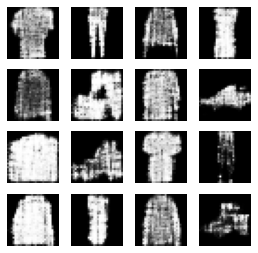

7000: [discriminator loss: 0.662108, acc: 0.601562] [adversarial loss: 0.628065, acc: 0.703125]
7001: [discriminator loss: 0.639167, acc: 0.632812] [adversarial loss: 1.057488, acc: 0.078125]
7002: [discriminator loss: 0.729102, acc: 0.554688] [adversarial loss: 0.567368, acc: 0.734375]
7003: [discriminator loss: 0.657238, acc: 0.507812] [adversarial loss: 0.854821, acc: 0.171875]
7004: [discriminator loss: 0.671727, acc: 0.570312] [adversarial loss: 0.737091, acc: 0.343750]
7005: [discriminator loss: 0.617635, acc: 0.718750] [adversarial loss: 0.860962, acc: 0.187500]
7006: [discriminator loss: 0.653683, acc: 0.625000] [adversarial loss: 0.680453, acc: 0.484375]
7007: [discriminator loss: 0.667336, acc: 0.507812] [adversarial loss: 0.841156, acc: 0.218750]
7008: [discriminator loss: 0.647541, acc: 0.640625] [adversarial loss: 0.831574, acc: 0.234375]
7009: [discriminator loss: 0.677775, acc: 0.609375] [adversarial loss: 0.631588, acc: 0.625000]
7010: [discriminator loss: 0.635184, acc

7088: [discriminator loss: 0.660866, acc: 0.632812] [adversarial loss: 0.993716, acc: 0.046875]
7089: [discriminator loss: 0.666794, acc: 0.640625] [adversarial loss: 0.577567, acc: 0.781250]
7090: [discriminator loss: 0.682662, acc: 0.507812] [adversarial loss: 0.994899, acc: 0.125000]
7091: [discriminator loss: 0.644082, acc: 0.648438] [adversarial loss: 0.682234, acc: 0.531250]
7092: [discriminator loss: 0.669373, acc: 0.562500] [adversarial loss: 0.778876, acc: 0.312500]
7093: [discriminator loss: 0.678978, acc: 0.632812] [adversarial loss: 0.761080, acc: 0.359375]
7094: [discriminator loss: 0.639640, acc: 0.656250] [adversarial loss: 0.768728, acc: 0.343750]
7095: [discriminator loss: 0.643742, acc: 0.671875] [adversarial loss: 0.746589, acc: 0.375000]
7096: [discriminator loss: 0.645437, acc: 0.664062] [adversarial loss: 0.855112, acc: 0.281250]
7097: [discriminator loss: 0.663821, acc: 0.562500] [adversarial loss: 0.751798, acc: 0.375000]
7098: [discriminator loss: 0.648035, acc

7176: [discriminator loss: 0.655005, acc: 0.640625] [adversarial loss: 0.824955, acc: 0.250000]
7177: [discriminator loss: 0.620584, acc: 0.687500] [adversarial loss: 0.746995, acc: 0.375000]
7178: [discriminator loss: 0.675717, acc: 0.609375] [adversarial loss: 0.857054, acc: 0.156250]
7179: [discriminator loss: 0.642505, acc: 0.695312] [adversarial loss: 0.621233, acc: 0.687500]
7180: [discriminator loss: 0.646053, acc: 0.617188] [adversarial loss: 1.039907, acc: 0.046875]
7181: [discriminator loss: 0.671186, acc: 0.601562] [adversarial loss: 0.548712, acc: 0.796875]
7182: [discriminator loss: 0.663011, acc: 0.578125] [adversarial loss: 0.975613, acc: 0.078125]
7183: [discriminator loss: 0.639317, acc: 0.664062] [adversarial loss: 0.676974, acc: 0.578125]
7184: [discriminator loss: 0.654241, acc: 0.554688] [adversarial loss: 0.801431, acc: 0.390625]
7185: [discriminator loss: 0.668228, acc: 0.656250] [adversarial loss: 0.761062, acc: 0.296875]
7186: [discriminator loss: 0.640770, acc

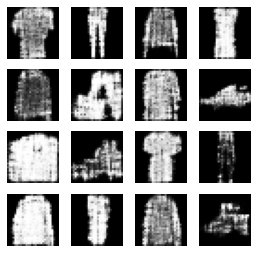

7200: [discriminator loss: 0.658930, acc: 0.648438] [adversarial loss: 0.695751, acc: 0.484375]
7201: [discriminator loss: 0.615883, acc: 0.703125] [adversarial loss: 0.802787, acc: 0.234375]
7202: [discriminator loss: 0.640383, acc: 0.687500] [adversarial loss: 0.646672, acc: 0.593750]
7203: [discriminator loss: 0.665561, acc: 0.570312] [adversarial loss: 1.034844, acc: 0.078125]
7204: [discriminator loss: 0.677063, acc: 0.585938] [adversarial loss: 0.565492, acc: 0.750000]
7205: [discriminator loss: 0.680411, acc: 0.585938] [adversarial loss: 1.049683, acc: 0.078125]
7206: [discriminator loss: 0.673259, acc: 0.585938] [adversarial loss: 0.652244, acc: 0.640625]
7207: [discriminator loss: 0.633493, acc: 0.679688] [adversarial loss: 0.852552, acc: 0.187500]
7208: [discriminator loss: 0.641503, acc: 0.679688] [adversarial loss: 0.608566, acc: 0.750000]
7209: [discriminator loss: 0.639529, acc: 0.585938] [adversarial loss: 1.005772, acc: 0.109375]
7210: [discriminator loss: 0.677537, acc

7287: [discriminator loss: 0.630565, acc: 0.656250] [adversarial loss: 0.913258, acc: 0.078125]
7288: [discriminator loss: 0.633012, acc: 0.656250] [adversarial loss: 0.718770, acc: 0.421875]
7289: [discriminator loss: 0.678369, acc: 0.507812] [adversarial loss: 0.871059, acc: 0.156250]
7290: [discriminator loss: 0.660406, acc: 0.601562] [adversarial loss: 0.717951, acc: 0.421875]
7291: [discriminator loss: 0.647510, acc: 0.640625] [adversarial loss: 0.776240, acc: 0.328125]
7292: [discriminator loss: 0.637998, acc: 0.671875] [adversarial loss: 0.899289, acc: 0.109375]
7293: [discriminator loss: 0.650975, acc: 0.601562] [adversarial loss: 0.688643, acc: 0.546875]
7294: [discriminator loss: 0.689387, acc: 0.546875] [adversarial loss: 0.866748, acc: 0.140625]
7295: [discriminator loss: 0.657691, acc: 0.632812] [adversarial loss: 0.716702, acc: 0.515625]
7296: [discriminator loss: 0.659894, acc: 0.562500] [adversarial loss: 0.772262, acc: 0.265625]
7297: [discriminator loss: 0.652391, acc

7377: [discriminator loss: 0.648843, acc: 0.617188] [adversarial loss: 0.684514, acc: 0.546875]
7378: [discriminator loss: 0.657071, acc: 0.570312] [adversarial loss: 0.797823, acc: 0.250000]
7379: [discriminator loss: 0.665307, acc: 0.609375] [adversarial loss: 0.830738, acc: 0.203125]
7380: [discriminator loss: 0.663148, acc: 0.671875] [adversarial loss: 0.651940, acc: 0.593750]
7381: [discriminator loss: 0.684535, acc: 0.507812] [adversarial loss: 0.745760, acc: 0.375000]
7382: [discriminator loss: 0.606923, acc: 0.742188] [adversarial loss: 0.732744, acc: 0.421875]
7383: [discriminator loss: 0.645543, acc: 0.625000] [adversarial loss: 0.768503, acc: 0.375000]
7384: [discriminator loss: 0.666145, acc: 0.578125] [adversarial loss: 0.754232, acc: 0.312500]
7385: [discriminator loss: 0.648251, acc: 0.695312] [adversarial loss: 0.739564, acc: 0.390625]
7386: [discriminator loss: 0.652936, acc: 0.648438] [adversarial loss: 0.836080, acc: 0.250000]
7387: [discriminator loss: 0.633604, acc

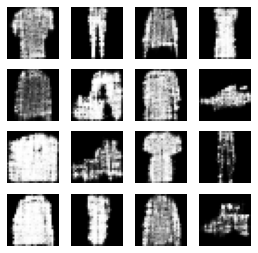

7400: [discriminator loss: 0.658330, acc: 0.609375] [adversarial loss: 0.772373, acc: 0.328125]
7401: [discriminator loss: 0.648397, acc: 0.640625] [adversarial loss: 0.639103, acc: 0.671875]
7402: [discriminator loss: 0.681217, acc: 0.554688] [adversarial loss: 0.921396, acc: 0.125000]
7403: [discriminator loss: 0.671181, acc: 0.601562] [adversarial loss: 0.829815, acc: 0.218750]
7404: [discriminator loss: 0.640437, acc: 0.625000] [adversarial loss: 0.751592, acc: 0.390625]
7405: [discriminator loss: 0.650307, acc: 0.656250] [adversarial loss: 0.873817, acc: 0.078125]
7406: [discriminator loss: 0.676683, acc: 0.570312] [adversarial loss: 0.689560, acc: 0.468750]
7407: [discriminator loss: 0.671663, acc: 0.523438] [adversarial loss: 0.871511, acc: 0.187500]
7408: [discriminator loss: 0.665124, acc: 0.617188] [adversarial loss: 0.629156, acc: 0.734375]
7409: [discriminator loss: 0.673058, acc: 0.546875] [adversarial loss: 1.161638, acc: 0.031250]
7410: [discriminator loss: 0.680204, acc

7490: [discriminator loss: 0.647615, acc: 0.640625] [adversarial loss: 0.714280, acc: 0.484375]
7491: [discriminator loss: 0.648725, acc: 0.648438] [adversarial loss: 0.811346, acc: 0.234375]
7492: [discriminator loss: 0.662340, acc: 0.640625] [adversarial loss: 0.759990, acc: 0.328125]
7493: [discriminator loss: 0.686677, acc: 0.601562] [adversarial loss: 0.628919, acc: 0.625000]
7494: [discriminator loss: 0.657301, acc: 0.570312] [adversarial loss: 0.789391, acc: 0.296875]
7495: [discriminator loss: 0.634707, acc: 0.656250] [adversarial loss: 0.670716, acc: 0.515625]
7496: [discriminator loss: 0.623043, acc: 0.648438] [adversarial loss: 0.830774, acc: 0.156250]
7497: [discriminator loss: 0.653114, acc: 0.718750] [adversarial loss: 0.700773, acc: 0.453125]
7498: [discriminator loss: 0.674689, acc: 0.562500] [adversarial loss: 0.781834, acc: 0.343750]
7499: [discriminator loss: 0.680053, acc: 0.617188] [adversarial loss: 0.813049, acc: 0.234375]
7500: [discriminator loss: 0.647093, acc

7578: [discriminator loss: 0.692073, acc: 0.554688] [adversarial loss: 0.882106, acc: 0.078125]
7579: [discriminator loss: 0.635079, acc: 0.648438] [adversarial loss: 0.730471, acc: 0.375000]
7580: [discriminator loss: 0.650452, acc: 0.632812] [adversarial loss: 0.760762, acc: 0.296875]
7581: [discriminator loss: 0.651062, acc: 0.625000] [adversarial loss: 0.790071, acc: 0.265625]
7582: [discriminator loss: 0.661392, acc: 0.585938] [adversarial loss: 0.647693, acc: 0.671875]
7583: [discriminator loss: 0.670650, acc: 0.601562] [adversarial loss: 0.921963, acc: 0.156250]
7584: [discriminator loss: 0.651039, acc: 0.585938] [adversarial loss: 0.660286, acc: 0.625000]
7585: [discriminator loss: 0.678378, acc: 0.546875] [adversarial loss: 0.884322, acc: 0.140625]
7586: [discriminator loss: 0.645557, acc: 0.640625] [adversarial loss: 0.628218, acc: 0.656250]
7587: [discriminator loss: 0.688500, acc: 0.507812] [adversarial loss: 0.859348, acc: 0.234375]
7588: [discriminator loss: 0.661181, acc

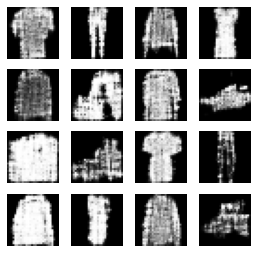

7600: [discriminator loss: 0.679519, acc: 0.554688] [adversarial loss: 0.880328, acc: 0.171875]
7601: [discriminator loss: 0.646833, acc: 0.679688] [adversarial loss: 0.697800, acc: 0.500000]
7602: [discriminator loss: 0.654772, acc: 0.609375] [adversarial loss: 0.853767, acc: 0.156250]
7603: [discriminator loss: 0.659754, acc: 0.585938] [adversarial loss: 0.641956, acc: 0.671875]
7604: [discriminator loss: 0.661031, acc: 0.601562] [adversarial loss: 0.982104, acc: 0.062500]
7605: [discriminator loss: 0.707637, acc: 0.546875] [adversarial loss: 0.624901, acc: 0.750000]
7606: [discriminator loss: 0.691297, acc: 0.523438] [adversarial loss: 0.936556, acc: 0.078125]
7607: [discriminator loss: 0.660106, acc: 0.617188] [adversarial loss: 0.638017, acc: 0.703125]
7608: [discriminator loss: 0.697304, acc: 0.492188] [adversarial loss: 1.031565, acc: 0.078125]
7609: [discriminator loss: 0.682235, acc: 0.570312] [adversarial loss: 0.622814, acc: 0.671875]
7610: [discriminator loss: 0.668044, acc

7687: [discriminator loss: 0.668739, acc: 0.648438] [adversarial loss: 0.819258, acc: 0.265625]
7688: [discriminator loss: 0.666622, acc: 0.601562] [adversarial loss: 0.774366, acc: 0.343750]
7689: [discriminator loss: 0.671140, acc: 0.578125] [adversarial loss: 0.724322, acc: 0.390625]
7690: [discriminator loss: 0.661387, acc: 0.593750] [adversarial loss: 0.945402, acc: 0.125000]
7691: [discriminator loss: 0.652373, acc: 0.632812] [adversarial loss: 0.706286, acc: 0.500000]
7692: [discriminator loss: 0.662556, acc: 0.570312] [adversarial loss: 1.054918, acc: 0.031250]
7693: [discriminator loss: 0.712790, acc: 0.546875] [adversarial loss: 0.569434, acc: 0.906250]
7694: [discriminator loss: 0.683228, acc: 0.492188] [adversarial loss: 1.065583, acc: 0.046875]
7695: [discriminator loss: 0.692637, acc: 0.539062] [adversarial loss: 0.686015, acc: 0.531250]
7696: [discriminator loss: 0.656800, acc: 0.648438] [adversarial loss: 0.871964, acc: 0.093750]
7697: [discriminator loss: 0.672922, acc

7776: [discriminator loss: 0.689756, acc: 0.570312] [adversarial loss: 0.591736, acc: 0.781250]
7777: [discriminator loss: 0.666235, acc: 0.539062] [adversarial loss: 0.867543, acc: 0.171875]
7778: [discriminator loss: 0.656095, acc: 0.585938] [adversarial loss: 0.685762, acc: 0.468750]
7779: [discriminator loss: 0.643077, acc: 0.671875] [adversarial loss: 0.843976, acc: 0.187500]
7780: [discriminator loss: 0.642597, acc: 0.664062] [adversarial loss: 0.696209, acc: 0.453125]
7781: [discriminator loss: 0.655770, acc: 0.671875] [adversarial loss: 0.698975, acc: 0.421875]
7782: [discriminator loss: 0.694748, acc: 0.468750] [adversarial loss: 0.830990, acc: 0.203125]
7783: [discriminator loss: 0.647259, acc: 0.687500] [adversarial loss: 0.749697, acc: 0.390625]
7784: [discriminator loss: 0.658086, acc: 0.632812] [adversarial loss: 0.705670, acc: 0.515625]
7785: [discriminator loss: 0.649013, acc: 0.609375] [adversarial loss: 0.868168, acc: 0.125000]
7786: [discriminator loss: 0.670268, acc

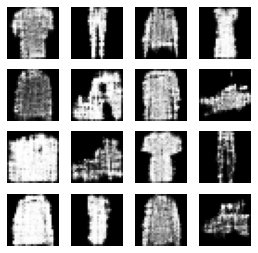

7800: [discriminator loss: 0.738403, acc: 0.476562] [adversarial loss: 0.951454, acc: 0.078125]
7801: [discriminator loss: 0.647762, acc: 0.703125] [adversarial loss: 0.679665, acc: 0.500000]
7802: [discriminator loss: 0.658343, acc: 0.640625] [adversarial loss: 0.739008, acc: 0.390625]
7803: [discriminator loss: 0.634464, acc: 0.679688] [adversarial loss: 0.831133, acc: 0.203125]
7804: [discriminator loss: 0.673664, acc: 0.585938] [adversarial loss: 0.788807, acc: 0.296875]
7805: [discriminator loss: 0.670945, acc: 0.601562] [adversarial loss: 0.770987, acc: 0.281250]
7806: [discriminator loss: 0.644507, acc: 0.617188] [adversarial loss: 0.668914, acc: 0.546875]
7807: [discriminator loss: 0.657278, acc: 0.585938] [adversarial loss: 0.975027, acc: 0.078125]
7808: [discriminator loss: 0.662237, acc: 0.617188] [adversarial loss: 0.619663, acc: 0.781250]
7809: [discriminator loss: 0.686724, acc: 0.554688] [adversarial loss: 1.036803, acc: 0.046875]
7810: [discriminator loss: 0.689539, acc

7889: [discriminator loss: 0.651540, acc: 0.656250] [adversarial loss: 0.685545, acc: 0.546875]
7890: [discriminator loss: 0.663844, acc: 0.562500] [adversarial loss: 0.860415, acc: 0.156250]
7891: [discriminator loss: 0.663272, acc: 0.640625] [adversarial loss: 0.602521, acc: 0.765625]
7892: [discriminator loss: 0.680918, acc: 0.500000] [adversarial loss: 0.856208, acc: 0.093750]
7893: [discriminator loss: 0.635718, acc: 0.656250] [adversarial loss: 0.762146, acc: 0.343750]
7894: [discriminator loss: 0.690109, acc: 0.554688] [adversarial loss: 0.809941, acc: 0.234375]
7895: [discriminator loss: 0.661874, acc: 0.625000] [adversarial loss: 0.690256, acc: 0.531250]
7896: [discriminator loss: 0.667182, acc: 0.570312] [adversarial loss: 0.860286, acc: 0.140625]
7897: [discriminator loss: 0.665744, acc: 0.609375] [adversarial loss: 0.775549, acc: 0.312500]
7898: [discriminator loss: 0.659028, acc: 0.601562] [adversarial loss: 0.582124, acc: 0.796875]
7899: [discriminator loss: 0.699318, acc

7980: [discriminator loss: 0.690467, acc: 0.523438] [adversarial loss: 0.613031, acc: 0.703125]
7981: [discriminator loss: 0.698554, acc: 0.445312] [adversarial loss: 0.957144, acc: 0.062500]
7982: [discriminator loss: 0.662699, acc: 0.609375] [adversarial loss: 0.581528, acc: 0.765625]
7983: [discriminator loss: 0.656440, acc: 0.562500] [adversarial loss: 0.847718, acc: 0.156250]
7984: [discriminator loss: 0.668123, acc: 0.593750] [adversarial loss: 0.686942, acc: 0.546875]
7985: [discriminator loss: 0.629609, acc: 0.703125] [adversarial loss: 0.748927, acc: 0.359375]
7986: [discriminator loss: 0.683738, acc: 0.578125] [adversarial loss: 0.674660, acc: 0.593750]
7987: [discriminator loss: 0.622040, acc: 0.703125] [adversarial loss: 0.692312, acc: 0.484375]
7988: [discriminator loss: 0.681464, acc: 0.617188] [adversarial loss: 0.740037, acc: 0.421875]
7989: [discriminator loss: 0.638317, acc: 0.648438] [adversarial loss: 0.849173, acc: 0.171875]
7990: [discriminator loss: 0.645107, acc

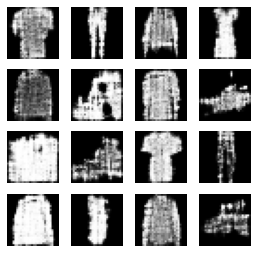

8000: [discriminator loss: 0.653886, acc: 0.578125] [adversarial loss: 0.687163, acc: 0.593750]
8001: [discriminator loss: 0.679295, acc: 0.539062] [adversarial loss: 0.809765, acc: 0.265625]
8002: [discriminator loss: 0.663614, acc: 0.570312] [adversarial loss: 0.811188, acc: 0.250000]
8003: [discriminator loss: 0.666959, acc: 0.625000] [adversarial loss: 0.860950, acc: 0.203125]
8004: [discriminator loss: 0.665407, acc: 0.617188] [adversarial loss: 0.736585, acc: 0.390625]
8005: [discriminator loss: 0.667830, acc: 0.562500] [adversarial loss: 0.831075, acc: 0.218750]
8006: [discriminator loss: 0.685865, acc: 0.562500] [adversarial loss: 0.866929, acc: 0.140625]
8007: [discriminator loss: 0.643990, acc: 0.742188] [adversarial loss: 0.766947, acc: 0.375000]
8008: [discriminator loss: 0.652732, acc: 0.664062] [adversarial loss: 0.740301, acc: 0.375000]
8009: [discriminator loss: 0.678974, acc: 0.562500] [adversarial loss: 0.739218, acc: 0.328125]
8010: [discriminator loss: 0.685885, acc

8089: [discriminator loss: 0.635216, acc: 0.625000] [adversarial loss: 0.687052, acc: 0.609375]
8090: [discriminator loss: 0.652156, acc: 0.570312] [adversarial loss: 0.896990, acc: 0.093750]
8091: [discriminator loss: 0.655459, acc: 0.625000] [adversarial loss: 0.700136, acc: 0.437500]
8092: [discriminator loss: 0.659857, acc: 0.640625] [adversarial loss: 0.903688, acc: 0.140625]
8093: [discriminator loss: 0.666619, acc: 0.632812] [adversarial loss: 0.667702, acc: 0.531250]
8094: [discriminator loss: 0.627640, acc: 0.656250] [adversarial loss: 0.819825, acc: 0.187500]
8095: [discriminator loss: 0.653448, acc: 0.656250] [adversarial loss: 0.615605, acc: 0.796875]
8096: [discriminator loss: 0.687864, acc: 0.539062] [adversarial loss: 0.926150, acc: 0.093750]
8097: [discriminator loss: 0.674680, acc: 0.609375] [adversarial loss: 0.650230, acc: 0.671875]
8098: [discriminator loss: 0.659222, acc: 0.601562] [adversarial loss: 0.996437, acc: 0.062500]
8099: [discriminator loss: 0.655321, acc

8176: [discriminator loss: 0.675336, acc: 0.570312] [adversarial loss: 0.550194, acc: 0.859375]
8177: [discriminator loss: 0.677694, acc: 0.500000] [adversarial loss: 0.913852, acc: 0.109375]
8178: [discriminator loss: 0.652695, acc: 0.609375] [adversarial loss: 0.690564, acc: 0.531250]
8179: [discriminator loss: 0.646296, acc: 0.718750] [adversarial loss: 0.724361, acc: 0.390625]
8180: [discriminator loss: 0.655414, acc: 0.648438] [adversarial loss: 0.734736, acc: 0.390625]
8181: [discriminator loss: 0.670590, acc: 0.609375] [adversarial loss: 0.904637, acc: 0.046875]
8182: [discriminator loss: 0.649960, acc: 0.632812] [adversarial loss: 0.720342, acc: 0.421875]
8183: [discriminator loss: 0.668971, acc: 0.601562] [adversarial loss: 0.774804, acc: 0.328125]
8184: [discriminator loss: 0.642057, acc: 0.671875] [adversarial loss: 0.686498, acc: 0.515625]
8185: [discriminator loss: 0.647598, acc: 0.617188] [adversarial loss: 0.822382, acc: 0.156250]
8186: [discriminator loss: 0.658326, acc

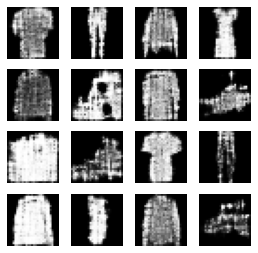

8200: [discriminator loss: 0.669353, acc: 0.617188] [adversarial loss: 0.518781, acc: 0.906250]
8201: [discriminator loss: 0.686938, acc: 0.507812] [adversarial loss: 0.907208, acc: 0.093750]
8202: [discriminator loss: 0.664844, acc: 0.617188] [adversarial loss: 0.666714, acc: 0.578125]
8203: [discriminator loss: 0.669472, acc: 0.492188] [adversarial loss: 0.775984, acc: 0.234375]
8204: [discriminator loss: 0.638809, acc: 0.687500] [adversarial loss: 0.689671, acc: 0.515625]
8205: [discriminator loss: 0.658551, acc: 0.656250] [adversarial loss: 0.695919, acc: 0.406250]
8206: [discriminator loss: 0.674346, acc: 0.570312] [adversarial loss: 0.854909, acc: 0.156250]
8207: [discriminator loss: 0.659323, acc: 0.617188] [adversarial loss: 0.605899, acc: 0.734375]
8208: [discriminator loss: 0.662836, acc: 0.578125] [adversarial loss: 0.927185, acc: 0.109375]
8209: [discriminator loss: 0.644768, acc: 0.640625] [adversarial loss: 0.631502, acc: 0.671875]
8210: [discriminator loss: 0.648909, acc

8288: [discriminator loss: 0.667942, acc: 0.640625] [adversarial loss: 0.670465, acc: 0.609375]
8289: [discriminator loss: 0.656660, acc: 0.593750] [adversarial loss: 0.828635, acc: 0.140625]
8290: [discriminator loss: 0.612114, acc: 0.750000] [adversarial loss: 0.703170, acc: 0.531250]
8291: [discriminator loss: 0.628856, acc: 0.695312] [adversarial loss: 0.860649, acc: 0.171875]
8292: [discriminator loss: 0.662706, acc: 0.617188] [adversarial loss: 0.721650, acc: 0.390625]
8293: [discriminator loss: 0.643339, acc: 0.640625] [adversarial loss: 0.746704, acc: 0.312500]
8294: [discriminator loss: 0.662094, acc: 0.578125] [adversarial loss: 0.846101, acc: 0.156250]
8295: [discriminator loss: 0.682364, acc: 0.585938] [adversarial loss: 0.730859, acc: 0.421875]
8296: [discriminator loss: 0.660106, acc: 0.585938] [adversarial loss: 0.845447, acc: 0.156250]
8297: [discriminator loss: 0.647712, acc: 0.671875] [adversarial loss: 0.601771, acc: 0.828125]
8298: [discriminator loss: 0.678984, acc

8375: [discriminator loss: 0.652122, acc: 0.570312] [adversarial loss: 0.923590, acc: 0.140625]
8376: [discriminator loss: 0.674029, acc: 0.562500] [adversarial loss: 0.719119, acc: 0.437500]
8377: [discriminator loss: 0.664706, acc: 0.585938] [adversarial loss: 0.793115, acc: 0.296875]
8378: [discriminator loss: 0.655730, acc: 0.679688] [adversarial loss: 0.679572, acc: 0.531250]
8379: [discriminator loss: 0.663308, acc: 0.570312] [adversarial loss: 0.871478, acc: 0.140625]
8380: [discriminator loss: 0.680094, acc: 0.578125] [adversarial loss: 0.643044, acc: 0.609375]
8381: [discriminator loss: 0.648819, acc: 0.601562] [adversarial loss: 0.951717, acc: 0.078125]
8382: [discriminator loss: 0.667148, acc: 0.578125] [adversarial loss: 0.646179, acc: 0.687500]
8383: [discriminator loss: 0.672677, acc: 0.562500] [adversarial loss: 0.837283, acc: 0.156250]
8384: [discriminator loss: 0.667657, acc: 0.585938] [adversarial loss: 0.697216, acc: 0.468750]
8385: [discriminator loss: 0.674371, acc

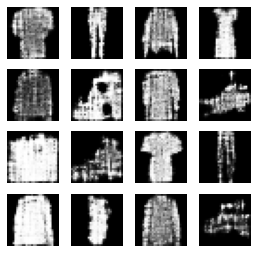

8400: [discriminator loss: 0.667167, acc: 0.554688] [adversarial loss: 0.957138, acc: 0.140625]
8401: [discriminator loss: 0.648384, acc: 0.601562] [adversarial loss: 0.603857, acc: 0.765625]
8402: [discriminator loss: 0.679995, acc: 0.515625] [adversarial loss: 0.814242, acc: 0.203125]
8403: [discriminator loss: 0.662357, acc: 0.664062] [adversarial loss: 0.721699, acc: 0.468750]
8404: [discriminator loss: 0.630375, acc: 0.695312] [adversarial loss: 0.686955, acc: 0.593750]
8405: [discriminator loss: 0.651116, acc: 0.593750] [adversarial loss: 0.708506, acc: 0.484375]
8406: [discriminator loss: 0.657792, acc: 0.648438] [adversarial loss: 0.696568, acc: 0.562500]
8407: [discriminator loss: 0.660964, acc: 0.585938] [adversarial loss: 0.942526, acc: 0.031250]
8408: [discriminator loss: 0.658456, acc: 0.625000] [adversarial loss: 0.723688, acc: 0.437500]
8409: [discriminator loss: 0.617568, acc: 0.640625] [adversarial loss: 0.904367, acc: 0.062500]
8410: [discriminator loss: 0.664368, acc

8489: [discriminator loss: 0.661665, acc: 0.570312] [adversarial loss: 0.731391, acc: 0.421875]
8490: [discriminator loss: 0.644171, acc: 0.617188] [adversarial loss: 0.989785, acc: 0.015625]
8491: [discriminator loss: 0.661456, acc: 0.593750] [adversarial loss: 0.570727, acc: 0.812500]
8492: [discriminator loss: 0.682342, acc: 0.546875] [adversarial loss: 1.043456, acc: 0.031250]
8493: [discriminator loss: 0.696053, acc: 0.554688] [adversarial loss: 0.569588, acc: 0.796875]
8494: [discriminator loss: 0.675173, acc: 0.515625] [adversarial loss: 0.860763, acc: 0.140625]
8495: [discriminator loss: 0.683574, acc: 0.625000] [adversarial loss: 0.750344, acc: 0.281250]
8496: [discriminator loss: 0.657340, acc: 0.664062] [adversarial loss: 0.754806, acc: 0.343750]
8497: [discriminator loss: 0.635132, acc: 0.710938] [adversarial loss: 0.828180, acc: 0.234375]
8498: [discriminator loss: 0.657080, acc: 0.679688] [adversarial loss: 0.711245, acc: 0.609375]
8499: [discriminator loss: 0.668129, acc

8578: [discriminator loss: 0.693507, acc: 0.593750] [adversarial loss: 0.589338, acc: 0.828125]
8579: [discriminator loss: 0.668366, acc: 0.523438] [adversarial loss: 0.812376, acc: 0.265625]
8580: [discriminator loss: 0.649745, acc: 0.585938] [adversarial loss: 0.767040, acc: 0.375000]
8581: [discriminator loss: 0.653215, acc: 0.640625] [adversarial loss: 0.786432, acc: 0.328125]
8582: [discriminator loss: 0.660221, acc: 0.601562] [adversarial loss: 0.683537, acc: 0.531250]
8583: [discriminator loss: 0.673502, acc: 0.593750] [adversarial loss: 0.825994, acc: 0.234375]
8584: [discriminator loss: 0.682197, acc: 0.539062] [adversarial loss: 0.689770, acc: 0.453125]
8585: [discriminator loss: 0.653242, acc: 0.640625] [adversarial loss: 0.793297, acc: 0.218750]
8586: [discriminator loss: 0.637319, acc: 0.718750] [adversarial loss: 0.680807, acc: 0.562500]
8587: [discriminator loss: 0.643765, acc: 0.648438] [adversarial loss: 0.984944, acc: 0.109375]
8588: [discriminator loss: 0.673266, acc

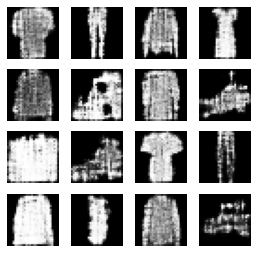

8600: [discriminator loss: 0.648944, acc: 0.625000] [adversarial loss: 0.664904, acc: 0.609375]
8601: [discriminator loss: 0.683262, acc: 0.554688] [adversarial loss: 0.907185, acc: 0.062500]
8602: [discriminator loss: 0.625469, acc: 0.664062] [adversarial loss: 0.621284, acc: 0.750000]
8603: [discriminator loss: 0.646119, acc: 0.601562] [adversarial loss: 0.830338, acc: 0.187500]
8604: [discriminator loss: 0.648121, acc: 0.664062] [adversarial loss: 0.659504, acc: 0.578125]
8605: [discriminator loss: 0.662060, acc: 0.664062] [adversarial loss: 0.890960, acc: 0.171875]
8606: [discriminator loss: 0.660480, acc: 0.632812] [adversarial loss: 0.580886, acc: 0.843750]
8607: [discriminator loss: 0.677895, acc: 0.546875] [adversarial loss: 0.917830, acc: 0.015625]
8608: [discriminator loss: 0.636041, acc: 0.632812] [adversarial loss: 0.576644, acc: 0.765625]
8609: [discriminator loss: 0.697421, acc: 0.554688] [adversarial loss: 1.051459, acc: 0.000000]
8610: [discriminator loss: 0.667603, acc

8690: [discriminator loss: 0.650343, acc: 0.593750] [adversarial loss: 0.850509, acc: 0.234375]
8691: [discriminator loss: 0.654722, acc: 0.664062] [adversarial loss: 0.632714, acc: 0.671875]
8692: [discriminator loss: 0.685645, acc: 0.585938] [adversarial loss: 0.746866, acc: 0.390625]
8693: [discriminator loss: 0.636848, acc: 0.671875] [adversarial loss: 0.722020, acc: 0.421875]
8694: [discriminator loss: 0.672863, acc: 0.640625] [adversarial loss: 0.795803, acc: 0.250000]
8695: [discriminator loss: 0.634366, acc: 0.679688] [adversarial loss: 0.818016, acc: 0.218750]
8696: [discriminator loss: 0.663638, acc: 0.625000] [adversarial loss: 0.714127, acc: 0.390625]
8697: [discriminator loss: 0.644803, acc: 0.625000] [adversarial loss: 0.827767, acc: 0.328125]
8698: [discriminator loss: 0.661458, acc: 0.585938] [adversarial loss: 0.729748, acc: 0.421875]
8699: [discriminator loss: 0.680059, acc: 0.562500] [adversarial loss: 0.898872, acc: 0.078125]
8700: [discriminator loss: 0.672365, acc

8780: [discriminator loss: 0.700772, acc: 0.531250] [adversarial loss: 0.620920, acc: 0.750000]
8781: [discriminator loss: 0.663741, acc: 0.562500] [adversarial loss: 0.924716, acc: 0.078125]
8782: [discriminator loss: 0.663226, acc: 0.617188] [adversarial loss: 0.720694, acc: 0.484375]
8783: [discriminator loss: 0.668766, acc: 0.554688] [adversarial loss: 0.725870, acc: 0.390625]
8784: [discriminator loss: 0.658456, acc: 0.664062] [adversarial loss: 0.795609, acc: 0.234375]
8785: [discriminator loss: 0.668437, acc: 0.593750] [adversarial loss: 0.619900, acc: 0.781250]
8786: [discriminator loss: 0.671068, acc: 0.585938] [adversarial loss: 0.874377, acc: 0.078125]
8787: [discriminator loss: 0.661674, acc: 0.664062] [adversarial loss: 0.745239, acc: 0.359375]
8788: [discriminator loss: 0.641519, acc: 0.671875] [adversarial loss: 0.766842, acc: 0.250000]
8789: [discriminator loss: 0.638695, acc: 0.671875] [adversarial loss: 0.718552, acc: 0.484375]
8790: [discriminator loss: 0.653336, acc

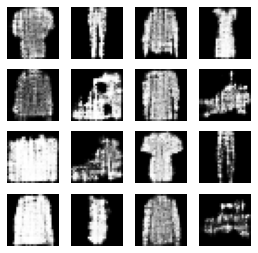

8800: [discriminator loss: 0.652128, acc: 0.640625] [adversarial loss: 0.705200, acc: 0.515625]
8801: [discriminator loss: 0.651230, acc: 0.546875] [adversarial loss: 0.880375, acc: 0.046875]
8802: [discriminator loss: 0.654325, acc: 0.609375] [adversarial loss: 0.639954, acc: 0.703125]
8803: [discriminator loss: 0.698604, acc: 0.507812] [adversarial loss: 1.004876, acc: 0.031250]
8804: [discriminator loss: 0.669963, acc: 0.585938] [adversarial loss: 0.687084, acc: 0.515625]
8805: [discriminator loss: 0.656786, acc: 0.609375] [adversarial loss: 0.899769, acc: 0.109375]
8806: [discriminator loss: 0.657192, acc: 0.562500] [adversarial loss: 0.777593, acc: 0.421875]
8807: [discriminator loss: 0.658148, acc: 0.578125] [adversarial loss: 0.842611, acc: 0.281250]
8808: [discriminator loss: 0.662031, acc: 0.609375] [adversarial loss: 0.682723, acc: 0.578125]
8809: [discriminator loss: 0.658896, acc: 0.593750] [adversarial loss: 0.882493, acc: 0.140625]
8810: [discriminator loss: 0.667558, acc

8889: [discriminator loss: 0.660490, acc: 0.632812] [adversarial loss: 0.644313, acc: 0.656250]
8890: [discriminator loss: 0.636818, acc: 0.632812] [adversarial loss: 0.904052, acc: 0.140625]
8891: [discriminator loss: 0.690225, acc: 0.554688] [adversarial loss: 0.635528, acc: 0.750000]
8892: [discriminator loss: 0.665602, acc: 0.578125] [adversarial loss: 0.989654, acc: 0.031250]
8893: [discriminator loss: 0.652468, acc: 0.609375] [adversarial loss: 0.662138, acc: 0.640625]
8894: [discriminator loss: 0.664327, acc: 0.578125] [adversarial loss: 0.866224, acc: 0.125000]
8895: [discriminator loss: 0.684541, acc: 0.593750] [adversarial loss: 0.659889, acc: 0.625000]
8896: [discriminator loss: 0.663596, acc: 0.554688] [adversarial loss: 0.895088, acc: 0.062500]
8897: [discriminator loss: 0.663595, acc: 0.578125] [adversarial loss: 0.679624, acc: 0.609375]
8898: [discriminator loss: 0.650663, acc: 0.617188] [adversarial loss: 0.878982, acc: 0.109375]
8899: [discriminator loss: 0.689715, acc

8978: [discriminator loss: 0.657426, acc: 0.523438] [adversarial loss: 0.755485, acc: 0.375000]
8979: [discriminator loss: 0.683151, acc: 0.554688] [adversarial loss: 0.761575, acc: 0.328125]
8980: [discriminator loss: 0.649491, acc: 0.664062] [adversarial loss: 0.714592, acc: 0.421875]
8981: [discriminator loss: 0.638293, acc: 0.671875] [adversarial loss: 0.737669, acc: 0.390625]
8982: [discriminator loss: 0.671507, acc: 0.632812] [adversarial loss: 0.691388, acc: 0.500000]
8983: [discriminator loss: 0.656026, acc: 0.578125] [adversarial loss: 0.908167, acc: 0.109375]
8984: [discriminator loss: 0.646903, acc: 0.593750] [adversarial loss: 0.612069, acc: 0.734375]
8985: [discriminator loss: 0.653172, acc: 0.531250] [adversarial loss: 0.860307, acc: 0.156250]
8986: [discriminator loss: 0.655007, acc: 0.632812] [adversarial loss: 0.675102, acc: 0.593750]
8987: [discriminator loss: 0.640705, acc: 0.664062] [adversarial loss: 0.808206, acc: 0.187500]
8988: [discriminator loss: 0.675333, acc

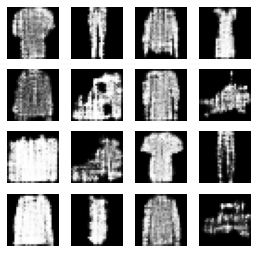

9000: [discriminator loss: 0.656127, acc: 0.648438] [adversarial loss: 0.791892, acc: 0.218750]
9001: [discriminator loss: 0.651531, acc: 0.570312] [adversarial loss: 0.803711, acc: 0.234375]
9002: [discriminator loss: 0.684004, acc: 0.585938] [adversarial loss: 0.717903, acc: 0.546875]
9003: [discriminator loss: 0.646796, acc: 0.585938] [adversarial loss: 0.772025, acc: 0.375000]
9004: [discriminator loss: 0.659255, acc: 0.648438] [adversarial loss: 0.718956, acc: 0.484375]
9005: [discriminator loss: 0.653390, acc: 0.585938] [adversarial loss: 0.835276, acc: 0.171875]
9006: [discriminator loss: 0.692018, acc: 0.578125] [adversarial loss: 0.601037, acc: 0.765625]
9007: [discriminator loss: 0.650275, acc: 0.546875] [adversarial loss: 0.861921, acc: 0.140625]
9008: [discriminator loss: 0.652193, acc: 0.617188] [adversarial loss: 0.595303, acc: 0.687500]
9009: [discriminator loss: 0.659529, acc: 0.546875] [adversarial loss: 0.920268, acc: 0.078125]
9010: [discriminator loss: 0.677637, acc

9090: [discriminator loss: 0.653768, acc: 0.632812] [adversarial loss: 0.632708, acc: 0.687500]
9091: [discriminator loss: 0.663098, acc: 0.570312] [adversarial loss: 0.959380, acc: 0.093750]
9092: [discriminator loss: 0.676873, acc: 0.585938] [adversarial loss: 0.623554, acc: 0.687500]
9093: [discriminator loss: 0.676427, acc: 0.585938] [adversarial loss: 0.851032, acc: 0.156250]
9094: [discriminator loss: 0.655256, acc: 0.648438] [adversarial loss: 0.670527, acc: 0.593750]
9095: [discriminator loss: 0.674476, acc: 0.570312] [adversarial loss: 0.807064, acc: 0.234375]
9096: [discriminator loss: 0.674270, acc: 0.601562] [adversarial loss: 0.795330, acc: 0.359375]
9097: [discriminator loss: 0.676684, acc: 0.523438] [adversarial loss: 0.724254, acc: 0.453125]
9098: [discriminator loss: 0.673994, acc: 0.578125] [adversarial loss: 0.755332, acc: 0.359375]
9099: [discriminator loss: 0.643691, acc: 0.664062] [adversarial loss: 0.841203, acc: 0.203125]
9100: [discriminator loss: 0.692751, acc

9176: [discriminator loss: 0.704136, acc: 0.531250] [adversarial loss: 0.606895, acc: 0.703125]
9177: [discriminator loss: 0.659587, acc: 0.546875] [adversarial loss: 0.822634, acc: 0.234375]
9178: [discriminator loss: 0.663115, acc: 0.617188] [adversarial loss: 0.717261, acc: 0.375000]
9179: [discriminator loss: 0.641613, acc: 0.632812] [adversarial loss: 0.817713, acc: 0.125000]
9180: [discriminator loss: 0.659852, acc: 0.671875] [adversarial loss: 0.750468, acc: 0.312500]
9181: [discriminator loss: 0.659275, acc: 0.632812] [adversarial loss: 0.740048, acc: 0.296875]
9182: [discriminator loss: 0.665283, acc: 0.648438] [adversarial loss: 0.761244, acc: 0.390625]
9183: [discriminator loss: 0.651660, acc: 0.625000] [adversarial loss: 0.714022, acc: 0.484375]
9184: [discriminator loss: 0.641030, acc: 0.664062] [adversarial loss: 0.759591, acc: 0.453125]
9185: [discriminator loss: 0.666282, acc: 0.593750] [adversarial loss: 0.781919, acc: 0.296875]
9186: [discriminator loss: 0.635079, acc

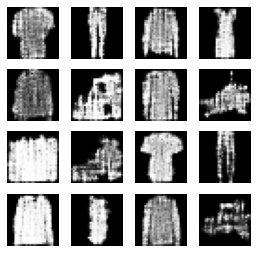

9200: [discriminator loss: 0.643897, acc: 0.687500] [adversarial loss: 0.859505, acc: 0.125000]
9201: [discriminator loss: 0.645930, acc: 0.632812] [adversarial loss: 0.623496, acc: 0.703125]
9202: [discriminator loss: 0.671583, acc: 0.531250] [adversarial loss: 0.856044, acc: 0.093750]
9203: [discriminator loss: 0.673131, acc: 0.570312] [adversarial loss: 0.611373, acc: 0.718750]
9204: [discriminator loss: 0.668658, acc: 0.539062] [adversarial loss: 0.881628, acc: 0.140625]
9205: [discriminator loss: 0.646877, acc: 0.656250] [adversarial loss: 0.625736, acc: 0.625000]
9206: [discriminator loss: 0.671765, acc: 0.554688] [adversarial loss: 0.966636, acc: 0.062500]
9207: [discriminator loss: 0.669770, acc: 0.585938] [adversarial loss: 0.601472, acc: 0.734375]
9208: [discriminator loss: 0.678156, acc: 0.585938] [adversarial loss: 0.882781, acc: 0.109375]
9209: [discriminator loss: 0.646831, acc: 0.593750] [adversarial loss: 0.756117, acc: 0.312500]
9210: [discriminator loss: 0.642778, acc

9290: [discriminator loss: 0.642358, acc: 0.640625] [adversarial loss: 0.795371, acc: 0.296875]
9291: [discriminator loss: 0.620134, acc: 0.742188] [adversarial loss: 0.742485, acc: 0.390625]
9292: [discriminator loss: 0.643568, acc: 0.609375] [adversarial loss: 0.759996, acc: 0.406250]
9293: [discriminator loss: 0.662601, acc: 0.656250] [adversarial loss: 0.764823, acc: 0.343750]
9294: [discriminator loss: 0.671044, acc: 0.570312] [adversarial loss: 0.759284, acc: 0.406250]
9295: [discriminator loss: 0.648990, acc: 0.632812] [adversarial loss: 0.635246, acc: 0.687500]
9296: [discriminator loss: 0.650969, acc: 0.562500] [adversarial loss: 0.977618, acc: 0.031250]
9297: [discriminator loss: 0.683881, acc: 0.578125] [adversarial loss: 0.515397, acc: 0.937500]
9298: [discriminator loss: 0.681502, acc: 0.515625] [adversarial loss: 0.917889, acc: 0.078125]
9299: [discriminator loss: 0.694673, acc: 0.578125] [adversarial loss: 0.632508, acc: 0.734375]
9300: [discriminator loss: 0.650022, acc

9376: [discriminator loss: 0.662739, acc: 0.546875] [adversarial loss: 0.825528, acc: 0.250000]
9377: [discriminator loss: 0.685961, acc: 0.578125] [adversarial loss: 0.796333, acc: 0.296875]
9378: [discriminator loss: 0.638976, acc: 0.671875] [adversarial loss: 0.810936, acc: 0.218750]
9379: [discriminator loss: 0.657602, acc: 0.656250] [adversarial loss: 0.661252, acc: 0.687500]
9380: [discriminator loss: 0.656435, acc: 0.609375] [adversarial loss: 0.991430, acc: 0.031250]
9381: [discriminator loss: 0.690956, acc: 0.554688] [adversarial loss: 0.615469, acc: 0.796875]
9382: [discriminator loss: 0.675687, acc: 0.554688] [adversarial loss: 0.864430, acc: 0.078125]
9383: [discriminator loss: 0.625566, acc: 0.625000] [adversarial loss: 0.725224, acc: 0.390625]
9384: [discriminator loss: 0.664038, acc: 0.632812] [adversarial loss: 0.877441, acc: 0.109375]
9385: [discriminator loss: 0.668332, acc: 0.578125] [adversarial loss: 0.699269, acc: 0.500000]
9386: [discriminator loss: 0.637227, acc

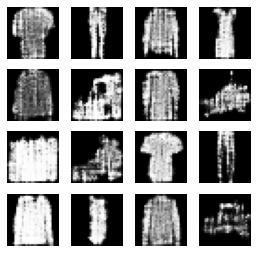

9400: [discriminator loss: 0.684122, acc: 0.539062] [adversarial loss: 1.019881, acc: 0.015625]
9401: [discriminator loss: 0.680601, acc: 0.578125] [adversarial loss: 0.674742, acc: 0.609375]
9402: [discriminator loss: 0.659073, acc: 0.539062] [adversarial loss: 0.840898, acc: 0.156250]
9403: [discriminator loss: 0.655967, acc: 0.648438] [adversarial loss: 0.689969, acc: 0.515625]
9404: [discriminator loss: 0.650414, acc: 0.617188] [adversarial loss: 0.764674, acc: 0.296875]
9405: [discriminator loss: 0.663439, acc: 0.632812] [adversarial loss: 0.739968, acc: 0.359375]
9406: [discriminator loss: 0.651046, acc: 0.625000] [adversarial loss: 0.702005, acc: 0.390625]
9407: [discriminator loss: 0.640769, acc: 0.632812] [adversarial loss: 0.733768, acc: 0.406250]
9408: [discriminator loss: 0.658195, acc: 0.593750] [adversarial loss: 0.821498, acc: 0.156250]
9409: [discriminator loss: 0.662099, acc: 0.632812] [adversarial loss: 0.603458, acc: 0.765625]
9410: [discriminator loss: 0.676761, acc

9487: [discriminator loss: 0.667755, acc: 0.570312] [adversarial loss: 0.714490, acc: 0.515625]
9488: [discriminator loss: 0.668516, acc: 0.609375] [adversarial loss: 0.782059, acc: 0.406250]
9489: [discriminator loss: 0.648008, acc: 0.585938] [adversarial loss: 0.891017, acc: 0.093750]
9490: [discriminator loss: 0.648815, acc: 0.648438] [adversarial loss: 0.727323, acc: 0.468750]
9491: [discriminator loss: 0.655905, acc: 0.625000] [adversarial loss: 0.789722, acc: 0.203125]
9492: [discriminator loss: 0.662375, acc: 0.640625] [adversarial loss: 0.705569, acc: 0.515625]
9493: [discriminator loss: 0.660314, acc: 0.625000] [adversarial loss: 0.863121, acc: 0.234375]
9494: [discriminator loss: 0.684031, acc: 0.523438] [adversarial loss: 0.653402, acc: 0.687500]
9495: [discriminator loss: 0.643785, acc: 0.562500] [adversarial loss: 0.896699, acc: 0.140625]
9496: [discriminator loss: 0.641658, acc: 0.601562] [adversarial loss: 0.674203, acc: 0.609375]
9497: [discriminator loss: 0.689162, acc

9576: [discriminator loss: 0.692030, acc: 0.554688] [adversarial loss: 0.673079, acc: 0.593750]
9577: [discriminator loss: 0.667470, acc: 0.531250] [adversarial loss: 0.882711, acc: 0.093750]
9578: [discriminator loss: 0.660670, acc: 0.609375] [adversarial loss: 0.678164, acc: 0.593750]
9579: [discriminator loss: 0.644501, acc: 0.632812] [adversarial loss: 0.747659, acc: 0.328125]
9580: [discriminator loss: 0.666821, acc: 0.609375] [adversarial loss: 0.691183, acc: 0.515625]
9581: [discriminator loss: 0.639790, acc: 0.664062] [adversarial loss: 0.717561, acc: 0.500000]
9582: [discriminator loss: 0.624597, acc: 0.695312] [adversarial loss: 0.804852, acc: 0.218750]
9583: [discriminator loss: 0.640307, acc: 0.625000] [adversarial loss: 0.753606, acc: 0.343750]
9584: [discriminator loss: 0.675669, acc: 0.625000] [adversarial loss: 0.777259, acc: 0.250000]
9585: [discriminator loss: 0.628426, acc: 0.664062] [adversarial loss: 0.665835, acc: 0.609375]
9586: [discriminator loss: 0.654022, acc

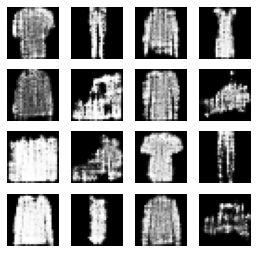

9600: [discriminator loss: 0.646831, acc: 0.625000] [adversarial loss: 0.683246, acc: 0.484375]
9601: [discriminator loss: 0.642387, acc: 0.687500] [adversarial loss: 0.841841, acc: 0.125000]
9602: [discriminator loss: 0.651368, acc: 0.609375] [adversarial loss: 0.638136, acc: 0.703125]
9603: [discriminator loss: 0.646099, acc: 0.625000] [adversarial loss: 0.946789, acc: 0.078125]
9604: [discriminator loss: 0.670230, acc: 0.625000] [adversarial loss: 0.689840, acc: 0.484375]
9605: [discriminator loss: 0.672415, acc: 0.531250] [adversarial loss: 0.829530, acc: 0.171875]
9606: [discriminator loss: 0.645089, acc: 0.656250] [adversarial loss: 0.569981, acc: 0.843750]
9607: [discriminator loss: 0.666293, acc: 0.578125] [adversarial loss: 1.004176, acc: 0.078125]
9608: [discriminator loss: 0.644634, acc: 0.625000] [adversarial loss: 0.687371, acc: 0.593750]
9609: [discriminator loss: 0.677929, acc: 0.570312] [adversarial loss: 0.779871, acc: 0.281250]
9610: [discriminator loss: 0.655690, acc

9688: [discriminator loss: 0.651685, acc: 0.656250] [adversarial loss: 0.698933, acc: 0.468750]
9689: [discriminator loss: 0.644340, acc: 0.601562] [adversarial loss: 0.765221, acc: 0.312500]
9690: [discriminator loss: 0.665770, acc: 0.640625] [adversarial loss: 0.776365, acc: 0.234375]
9691: [discriminator loss: 0.631057, acc: 0.664062] [adversarial loss: 0.799458, acc: 0.312500]
9692: [discriminator loss: 0.634395, acc: 0.656250] [adversarial loss: 0.736625, acc: 0.343750]
9693: [discriminator loss: 0.634245, acc: 0.640625] [adversarial loss: 0.921901, acc: 0.109375]
9694: [discriminator loss: 0.659257, acc: 0.625000] [adversarial loss: 0.611649, acc: 0.687500]
9695: [discriminator loss: 0.684144, acc: 0.609375] [adversarial loss: 0.839093, acc: 0.171875]
9696: [discriminator loss: 0.683236, acc: 0.632812] [adversarial loss: 0.694885, acc: 0.484375]
9697: [discriminator loss: 0.673802, acc: 0.546875] [adversarial loss: 0.848392, acc: 0.140625]
9698: [discriminator loss: 0.646720, acc

9778: [discriminator loss: 0.699467, acc: 0.539062] [adversarial loss: 0.606159, acc: 0.765625]
9779: [discriminator loss: 0.678283, acc: 0.570312] [adversarial loss: 0.867432, acc: 0.156250]
9780: [discriminator loss: 0.654456, acc: 0.578125] [adversarial loss: 0.680973, acc: 0.578125]
9781: [discriminator loss: 0.654879, acc: 0.570312] [adversarial loss: 0.862259, acc: 0.218750]
9782: [discriminator loss: 0.648818, acc: 0.601562] [adversarial loss: 0.631350, acc: 0.671875]
9783: [discriminator loss: 0.672898, acc: 0.578125] [adversarial loss: 0.876877, acc: 0.156250]
9784: [discriminator loss: 0.636953, acc: 0.632812] [adversarial loss: 0.726357, acc: 0.343750]
9785: [discriminator loss: 0.651686, acc: 0.632812] [adversarial loss: 0.838119, acc: 0.187500]
9786: [discriminator loss: 0.635098, acc: 0.640625] [adversarial loss: 0.735806, acc: 0.390625]
9787: [discriminator loss: 0.658393, acc: 0.687500] [adversarial loss: 0.763166, acc: 0.390625]
9788: [discriminator loss: 0.634058, acc

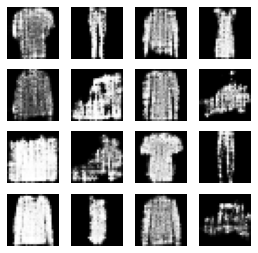

9800: [discriminator loss: 0.640880, acc: 0.625000] [adversarial loss: 0.619418, acc: 0.671875]
9801: [discriminator loss: 0.665065, acc: 0.562500] [adversarial loss: 0.839592, acc: 0.187500]
9802: [discriminator loss: 0.664140, acc: 0.601562] [adversarial loss: 0.742532, acc: 0.359375]
9803: [discriminator loss: 0.636945, acc: 0.671875] [adversarial loss: 0.835523, acc: 0.171875]
9804: [discriminator loss: 0.650675, acc: 0.585938] [adversarial loss: 0.677527, acc: 0.593750]
9805: [discriminator loss: 0.664143, acc: 0.609375] [adversarial loss: 0.756676, acc: 0.296875]
9806: [discriminator loss: 0.653464, acc: 0.617188] [adversarial loss: 0.734438, acc: 0.375000]
9807: [discriminator loss: 0.642631, acc: 0.656250] [adversarial loss: 0.808199, acc: 0.203125]
9808: [discriminator loss: 0.651018, acc: 0.617188] [adversarial loss: 0.713553, acc: 0.375000]
9809: [discriminator loss: 0.647099, acc: 0.617188] [adversarial loss: 0.746496, acc: 0.343750]
9810: [discriminator loss: 0.661198, acc

9890: [discriminator loss: 0.621897, acc: 0.742188] [adversarial loss: 0.719494, acc: 0.468750]
9891: [discriminator loss: 0.652474, acc: 0.656250] [adversarial loss: 0.849449, acc: 0.156250]
9892: [discriminator loss: 0.675579, acc: 0.570312] [adversarial loss: 0.647312, acc: 0.734375]
9893: [discriminator loss: 0.692634, acc: 0.523438] [adversarial loss: 0.880441, acc: 0.109375]
9894: [discriminator loss: 0.670022, acc: 0.554688] [adversarial loss: 0.540605, acc: 0.875000]
9895: [discriminator loss: 0.642278, acc: 0.554688] [adversarial loss: 0.906622, acc: 0.093750]
9896: [discriminator loss: 0.666184, acc: 0.640625] [adversarial loss: 0.597189, acc: 0.796875]
9897: [discriminator loss: 0.623044, acc: 0.609375] [adversarial loss: 0.840224, acc: 0.156250]
9898: [discriminator loss: 0.651383, acc: 0.671875] [adversarial loss: 0.807161, acc: 0.281250]
9899: [discriminator loss: 0.647204, acc: 0.585938] [adversarial loss: 0.776597, acc: 0.296875]
9900: [discriminator loss: 0.655349, acc

9980: [discriminator loss: 0.678920, acc: 0.546875] [adversarial loss: 0.635758, acc: 0.656250]
9981: [discriminator loss: 0.663185, acc: 0.601562] [adversarial loss: 0.847541, acc: 0.156250]
9982: [discriminator loss: 0.642567, acc: 0.640625] [adversarial loss: 0.736957, acc: 0.406250]
9983: [discriminator loss: 0.658755, acc: 0.625000] [adversarial loss: 0.862938, acc: 0.093750]
9984: [discriminator loss: 0.649012, acc: 0.632812] [adversarial loss: 0.679203, acc: 0.546875]
9985: [discriminator loss: 0.654882, acc: 0.664062] [adversarial loss: 0.913380, acc: 0.125000]
9986: [discriminator loss: 0.647334, acc: 0.585938] [adversarial loss: 0.781590, acc: 0.312500]
9987: [discriminator loss: 0.649310, acc: 0.671875] [adversarial loss: 0.775496, acc: 0.312500]
9988: [discriminator loss: 0.660080, acc: 0.632812] [adversarial loss: 0.808941, acc: 0.265625]
9989: [discriminator loss: 0.630334, acc: 0.640625] [adversarial loss: 0.946240, acc: 0.156250]
9990: [discriminator loss: 0.682703, acc

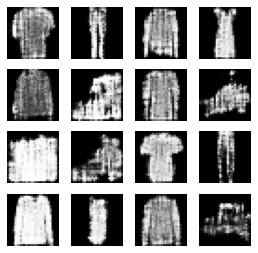

10000: [discriminator loss: 0.653616, acc: 0.625000] [adversarial loss: 0.908833, acc: 0.093750]
10001: [discriminator loss: 0.644540, acc: 0.625000] [adversarial loss: 0.610892, acc: 0.703125]
10002: [discriminator loss: 0.662891, acc: 0.554688] [adversarial loss: 0.847326, acc: 0.250000]
10003: [discriminator loss: 0.674063, acc: 0.593750] [adversarial loss: 0.767219, acc: 0.312500]
10004: [discriminator loss: 0.640606, acc: 0.632812] [adversarial loss: 0.868656, acc: 0.234375]
10005: [discriminator loss: 0.699991, acc: 0.562500] [adversarial loss: 0.571984, acc: 0.953125]
10006: [discriminator loss: 0.657590, acc: 0.546875] [adversarial loss: 0.810195, acc: 0.171875]
10007: [discriminator loss: 0.627378, acc: 0.773438] [adversarial loss: 0.742746, acc: 0.421875]
10008: [discriminator loss: 0.662305, acc: 0.593750] [adversarial loss: 0.865636, acc: 0.171875]
10009: [discriminator loss: 0.676346, acc: 0.632812] [adversarial loss: 0.753784, acc: 0.312500]
10010: [discriminator loss: 0.

10087: [discriminator loss: 0.659934, acc: 0.578125] [adversarial loss: 0.922162, acc: 0.125000]
10088: [discriminator loss: 0.651622, acc: 0.593750] [adversarial loss: 0.638352, acc: 0.640625]
10089: [discriminator loss: 0.636713, acc: 0.656250] [adversarial loss: 0.907843, acc: 0.109375]
10090: [discriminator loss: 0.647793, acc: 0.625000] [adversarial loss: 0.698650, acc: 0.531250]
10091: [discriminator loss: 0.666440, acc: 0.546875] [adversarial loss: 0.916952, acc: 0.156250]
10092: [discriminator loss: 0.683821, acc: 0.585938] [adversarial loss: 0.662362, acc: 0.671875]
10093: [discriminator loss: 0.677128, acc: 0.570312] [adversarial loss: 0.956773, acc: 0.109375]
10094: [discriminator loss: 0.666758, acc: 0.570312] [adversarial loss: 0.516258, acc: 0.953125]
10095: [discriminator loss: 0.651078, acc: 0.531250] [adversarial loss: 0.841226, acc: 0.109375]
10096: [discriminator loss: 0.673245, acc: 0.578125] [adversarial loss: 0.760104, acc: 0.359375]
10097: [discriminator loss: 0.

10177: [discriminator loss: 0.650332, acc: 0.617188] [adversarial loss: 0.625120, acc: 0.750000]
10178: [discriminator loss: 0.664296, acc: 0.554688] [adversarial loss: 0.955211, acc: 0.093750]
10179: [discriminator loss: 0.667089, acc: 0.578125] [adversarial loss: 0.655446, acc: 0.625000]
10180: [discriminator loss: 0.671026, acc: 0.539062] [adversarial loss: 0.916741, acc: 0.140625]
10181: [discriminator loss: 0.678128, acc: 0.578125] [adversarial loss: 0.629695, acc: 0.734375]
10182: [discriminator loss: 0.668180, acc: 0.578125] [adversarial loss: 0.906329, acc: 0.078125]
10183: [discriminator loss: 0.653418, acc: 0.679688] [adversarial loss: 0.698317, acc: 0.578125]
10184: [discriminator loss: 0.640396, acc: 0.593750] [adversarial loss: 0.710323, acc: 0.500000]
10185: [discriminator loss: 0.676384, acc: 0.546875] [adversarial loss: 0.705556, acc: 0.484375]
10186: [discriminator loss: 0.639559, acc: 0.601562] [adversarial loss: 0.882834, acc: 0.109375]
10187: [discriminator loss: 0.

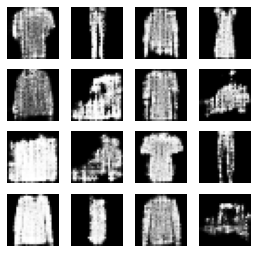

10200: [discriminator loss: 0.630388, acc: 0.625000] [adversarial loss: 0.898003, acc: 0.140625]
10201: [discriminator loss: 0.691981, acc: 0.585938] [adversarial loss: 0.630049, acc: 0.593750]
10202: [discriminator loss: 0.682379, acc: 0.523438] [adversarial loss: 0.985019, acc: 0.078125]
10203: [discriminator loss: 0.658660, acc: 0.648438] [adversarial loss: 0.605429, acc: 0.781250]
10204: [discriminator loss: 0.653620, acc: 0.554688] [adversarial loss: 0.823825, acc: 0.171875]
10205: [discriminator loss: 0.670955, acc: 0.562500] [adversarial loss: 0.731126, acc: 0.390625]
10206: [discriminator loss: 0.637631, acc: 0.625000] [adversarial loss: 0.814941, acc: 0.187500]
10207: [discriminator loss: 0.640094, acc: 0.664062] [adversarial loss: 0.778711, acc: 0.296875]
10208: [discriminator loss: 0.646150, acc: 0.664062] [adversarial loss: 0.682545, acc: 0.531250]
10209: [discriminator loss: 0.666995, acc: 0.578125] [adversarial loss: 0.875898, acc: 0.093750]
10210: [discriminator loss: 0.

10285: [discriminator loss: 0.673851, acc: 0.625000] [adversarial loss: 0.827381, acc: 0.234375]
10286: [discriminator loss: 0.661697, acc: 0.640625] [adversarial loss: 0.678935, acc: 0.609375]
10287: [discriminator loss: 0.652328, acc: 0.554688] [adversarial loss: 0.923992, acc: 0.125000]
10288: [discriminator loss: 0.685877, acc: 0.601562] [adversarial loss: 0.543228, acc: 0.906250]
10289: [discriminator loss: 0.706264, acc: 0.523438] [adversarial loss: 0.872165, acc: 0.171875]
10290: [discriminator loss: 0.659173, acc: 0.593750] [adversarial loss: 0.671673, acc: 0.515625]
10291: [discriminator loss: 0.654720, acc: 0.593750] [adversarial loss: 0.844213, acc: 0.125000]
10292: [discriminator loss: 0.651104, acc: 0.609375] [adversarial loss: 0.681112, acc: 0.562500]
10293: [discriminator loss: 0.648112, acc: 0.687500] [adversarial loss: 0.765879, acc: 0.328125]
10294: [discriminator loss: 0.635936, acc: 0.640625] [adversarial loss: 0.815942, acc: 0.265625]
10295: [discriminator loss: 0.

10374: [discriminator loss: 0.643672, acc: 0.695312] [adversarial loss: 0.792987, acc: 0.250000]
10375: [discriminator loss: 0.632183, acc: 0.687500] [adversarial loss: 0.792918, acc: 0.234375]
10376: [discriminator loss: 0.656171, acc: 0.625000] [adversarial loss: 0.625575, acc: 0.718750]
10377: [discriminator loss: 0.698495, acc: 0.507812] [adversarial loss: 0.981164, acc: 0.078125]
10378: [discriminator loss: 0.673802, acc: 0.570312] [adversarial loss: 0.606987, acc: 0.718750]
10379: [discriminator loss: 0.655987, acc: 0.617188] [adversarial loss: 0.822312, acc: 0.281250]
10380: [discriminator loss: 0.650403, acc: 0.656250] [adversarial loss: 0.737226, acc: 0.359375]
10381: [discriminator loss: 0.647061, acc: 0.578125] [adversarial loss: 0.687099, acc: 0.593750]
10382: [discriminator loss: 0.642500, acc: 0.640625] [adversarial loss: 0.771522, acc: 0.453125]
10383: [discriminator loss: 0.636028, acc: 0.632812] [adversarial loss: 0.784583, acc: 0.390625]
10384: [discriminator loss: 0.

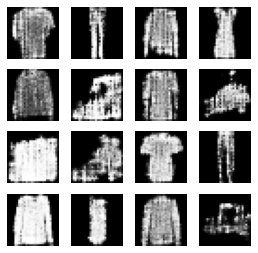

10400: [discriminator loss: 0.644266, acc: 0.632812] [adversarial loss: 0.766864, acc: 0.312500]
10401: [discriminator loss: 0.656191, acc: 0.625000] [adversarial loss: 0.683832, acc: 0.468750]
10402: [discriminator loss: 0.651439, acc: 0.625000] [adversarial loss: 0.964265, acc: 0.062500]
10403: [discriminator loss: 0.651335, acc: 0.617188] [adversarial loss: 0.591401, acc: 0.734375]
10404: [discriminator loss: 0.697949, acc: 0.531250] [adversarial loss: 0.978790, acc: 0.078125]
10405: [discriminator loss: 0.677761, acc: 0.554688] [adversarial loss: 0.662652, acc: 0.593750]
10406: [discriminator loss: 0.622439, acc: 0.625000] [adversarial loss: 0.840077, acc: 0.140625]
10407: [discriminator loss: 0.656968, acc: 0.648438] [adversarial loss: 0.710811, acc: 0.515625]
10408: [discriminator loss: 0.669325, acc: 0.585938] [adversarial loss: 0.817152, acc: 0.234375]
10409: [discriminator loss: 0.656932, acc: 0.648438] [adversarial loss: 0.820657, acc: 0.234375]
10410: [discriminator loss: 0.

10489: [discriminator loss: 0.657378, acc: 0.640625] [adversarial loss: 0.678894, acc: 0.640625]
10490: [discriminator loss: 0.643288, acc: 0.632812] [adversarial loss: 0.876570, acc: 0.125000]
10491: [discriminator loss: 0.632551, acc: 0.679688] [adversarial loss: 0.709546, acc: 0.484375]
10492: [discriminator loss: 0.668197, acc: 0.562500] [adversarial loss: 0.769008, acc: 0.328125]
10493: [discriminator loss: 0.667162, acc: 0.570312] [adversarial loss: 0.722302, acc: 0.406250]
10494: [discriminator loss: 0.646856, acc: 0.632812] [adversarial loss: 0.823311, acc: 0.296875]
10495: [discriminator loss: 0.658117, acc: 0.593750] [adversarial loss: 0.676990, acc: 0.562500]
10496: [discriminator loss: 0.658214, acc: 0.546875] [adversarial loss: 0.914044, acc: 0.078125]
10497: [discriminator loss: 0.669676, acc: 0.601562] [adversarial loss: 0.571170, acc: 0.859375]
10498: [discriminator loss: 0.648113, acc: 0.578125] [adversarial loss: 0.918630, acc: 0.093750]
10499: [discriminator loss: 0.

10577: [discriminator loss: 0.649937, acc: 0.648438] [adversarial loss: 0.699717, acc: 0.562500]
10578: [discriminator loss: 0.631468, acc: 0.648438] [adversarial loss: 0.800329, acc: 0.250000]
10579: [discriminator loss: 0.681089, acc: 0.593750] [adversarial loss: 0.728670, acc: 0.437500]
10580: [discriminator loss: 0.650563, acc: 0.617188] [adversarial loss: 0.753949, acc: 0.296875]
10581: [discriminator loss: 0.628868, acc: 0.695312] [adversarial loss: 0.814171, acc: 0.281250]
10582: [discriminator loss: 0.648398, acc: 0.601562] [adversarial loss: 0.576289, acc: 0.843750]
10583: [discriminator loss: 0.662119, acc: 0.562500] [adversarial loss: 0.889663, acc: 0.078125]
10584: [discriminator loss: 0.645771, acc: 0.679688] [adversarial loss: 0.658074, acc: 0.609375]
10585: [discriminator loss: 0.638839, acc: 0.625000] [adversarial loss: 0.825655, acc: 0.140625]
10586: [discriminator loss: 0.645851, acc: 0.601562] [adversarial loss: 0.701388, acc: 0.531250]
10587: [discriminator loss: 0.

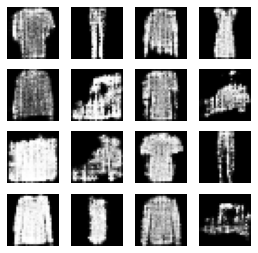

10600: [discriminator loss: 0.669177, acc: 0.562500] [adversarial loss: 0.872379, acc: 0.093750]
10601: [discriminator loss: 0.653777, acc: 0.601562] [adversarial loss: 0.637173, acc: 0.703125]
10602: [discriminator loss: 0.660725, acc: 0.609375] [adversarial loss: 0.953470, acc: 0.093750]
10603: [discriminator loss: 0.662292, acc: 0.632812] [adversarial loss: 0.555219, acc: 0.843750]
10604: [discriminator loss: 0.680469, acc: 0.507812] [adversarial loss: 0.957787, acc: 0.062500]
10605: [discriminator loss: 0.673318, acc: 0.578125] [adversarial loss: 0.655244, acc: 0.656250]
10606: [discriminator loss: 0.644096, acc: 0.593750] [adversarial loss: 0.894649, acc: 0.125000]
10607: [discriminator loss: 0.660460, acc: 0.625000] [adversarial loss: 0.708761, acc: 0.500000]
10608: [discriminator loss: 0.635242, acc: 0.664062] [adversarial loss: 0.758575, acc: 0.281250]
10609: [discriminator loss: 0.647120, acc: 0.656250] [adversarial loss: 0.742063, acc: 0.359375]
10610: [discriminator loss: 0.

10685: [discriminator loss: 0.639276, acc: 0.640625] [adversarial loss: 0.706882, acc: 0.578125]
10686: [discriminator loss: 0.681748, acc: 0.593750] [adversarial loss: 0.806216, acc: 0.250000]
10687: [discriminator loss: 0.648658, acc: 0.640625] [adversarial loss: 0.754123, acc: 0.375000]
10688: [discriminator loss: 0.650367, acc: 0.593750] [adversarial loss: 0.803762, acc: 0.203125]
10689: [discriminator loss: 0.651972, acc: 0.640625] [adversarial loss: 0.683900, acc: 0.531250]
10690: [discriminator loss: 0.661593, acc: 0.617188] [adversarial loss: 0.818133, acc: 0.265625]
10691: [discriminator loss: 0.675523, acc: 0.593750] [adversarial loss: 0.768380, acc: 0.359375]
10692: [discriminator loss: 0.635627, acc: 0.609375] [adversarial loss: 0.803017, acc: 0.328125]
10693: [discriminator loss: 0.631246, acc: 0.726562] [adversarial loss: 0.809017, acc: 0.281250]
10694: [discriminator loss: 0.641702, acc: 0.632812] [adversarial loss: 0.735813, acc: 0.468750]
10695: [discriminator loss: 0.

10770: [discriminator loss: 0.658917, acc: 0.601562] [adversarial loss: 0.769498, acc: 0.343750]
10771: [discriminator loss: 0.642972, acc: 0.601562] [adversarial loss: 0.832571, acc: 0.171875]
10772: [discriminator loss: 0.650367, acc: 0.578125] [adversarial loss: 0.772187, acc: 0.296875]
10773: [discriminator loss: 0.662322, acc: 0.593750] [adversarial loss: 0.828005, acc: 0.328125]
10774: [discriminator loss: 0.651938, acc: 0.656250] [adversarial loss: 0.800976, acc: 0.281250]
10775: [discriminator loss: 0.644821, acc: 0.695312] [adversarial loss: 0.714265, acc: 0.531250]
10776: [discriminator loss: 0.627976, acc: 0.656250] [adversarial loss: 0.819640, acc: 0.281250]
10777: [discriminator loss: 0.667648, acc: 0.585938] [adversarial loss: 0.631517, acc: 0.718750]
10778: [discriminator loss: 0.686425, acc: 0.554688] [adversarial loss: 1.032093, acc: 0.062500]
10779: [discriminator loss: 0.649075, acc: 0.625000] [adversarial loss: 0.658539, acc: 0.671875]
10780: [discriminator loss: 0.

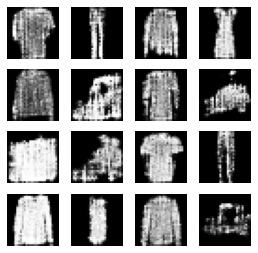

10800: [discriminator loss: 0.671206, acc: 0.554688] [adversarial loss: 0.708296, acc: 0.500000]
10801: [discriminator loss: 0.665245, acc: 0.593750] [adversarial loss: 0.728734, acc: 0.375000]
10802: [discriminator loss: 0.657073, acc: 0.664062] [adversarial loss: 0.831454, acc: 0.203125]
10803: [discriminator loss: 0.652783, acc: 0.687500] [adversarial loss: 0.753704, acc: 0.437500]
10804: [discriminator loss: 0.619133, acc: 0.664062] [adversarial loss: 0.742428, acc: 0.515625]
10805: [discriminator loss: 0.651242, acc: 0.640625] [adversarial loss: 0.748360, acc: 0.453125]
10806: [discriminator loss: 0.667248, acc: 0.570312] [adversarial loss: 0.843824, acc: 0.171875]
10807: [discriminator loss: 0.682337, acc: 0.578125] [adversarial loss: 0.814557, acc: 0.218750]
10808: [discriminator loss: 0.667358, acc: 0.625000] [adversarial loss: 0.710091, acc: 0.500000]
10809: [discriminator loss: 0.666239, acc: 0.585938] [adversarial loss: 0.946757, acc: 0.046875]
10810: [discriminator loss: 0.

10885: [discriminator loss: 0.680585, acc: 0.570312] [adversarial loss: 0.605748, acc: 0.765625]
10886: [discriminator loss: 0.656584, acc: 0.593750] [adversarial loss: 0.965865, acc: 0.046875]
10887: [discriminator loss: 0.679740, acc: 0.570312] [adversarial loss: 0.714984, acc: 0.531250]
10888: [discriminator loss: 0.634051, acc: 0.632812] [adversarial loss: 0.816825, acc: 0.234375]
10889: [discriminator loss: 0.672898, acc: 0.601562] [adversarial loss: 0.851750, acc: 0.203125]
10890: [discriminator loss: 0.665657, acc: 0.617188] [adversarial loss: 0.699150, acc: 0.531250]
10891: [discriminator loss: 0.676538, acc: 0.500000] [adversarial loss: 0.929757, acc: 0.109375]
10892: [discriminator loss: 0.684835, acc: 0.554688] [adversarial loss: 0.690783, acc: 0.500000]
10893: [discriminator loss: 0.652908, acc: 0.578125] [adversarial loss: 0.740128, acc: 0.343750]
10894: [discriminator loss: 0.646527, acc: 0.679688] [adversarial loss: 0.762680, acc: 0.406250]
10895: [discriminator loss: 0.

10970: [discriminator loss: 0.679516, acc: 0.531250] [adversarial loss: 0.895896, acc: 0.093750]
10971: [discriminator loss: 0.664016, acc: 0.585938] [adversarial loss: 0.734798, acc: 0.375000]
10972: [discriminator loss: 0.665606, acc: 0.593750] [adversarial loss: 0.715629, acc: 0.468750]
10973: [discriminator loss: 0.660224, acc: 0.593750] [adversarial loss: 0.786788, acc: 0.312500]
10974: [discriminator loss: 0.656371, acc: 0.617188] [adversarial loss: 0.760126, acc: 0.296875]
10975: [discriminator loss: 0.637096, acc: 0.679688] [adversarial loss: 0.878276, acc: 0.093750]
10976: [discriminator loss: 0.681968, acc: 0.562500] [adversarial loss: 0.632589, acc: 0.718750]
10977: [discriminator loss: 0.655352, acc: 0.585938] [adversarial loss: 0.888446, acc: 0.062500]
10978: [discriminator loss: 0.645312, acc: 0.679688] [adversarial loss: 0.742410, acc: 0.375000]
10979: [discriminator loss: 0.658169, acc: 0.671875] [adversarial loss: 0.794603, acc: 0.296875]
10980: [discriminator loss: 0.

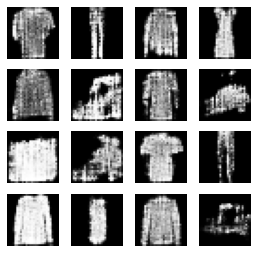

11000: [discriminator loss: 0.667675, acc: 0.625000] [adversarial loss: 0.591327, acc: 0.765625]
11001: [discriminator loss: 0.705020, acc: 0.500000] [adversarial loss: 0.971460, acc: 0.031250]
11002: [discriminator loss: 0.695963, acc: 0.585938] [adversarial loss: 0.640272, acc: 0.703125]
11003: [discriminator loss: 0.682738, acc: 0.539062] [adversarial loss: 0.909541, acc: 0.125000]
11004: [discriminator loss: 0.648128, acc: 0.617188] [adversarial loss: 0.618098, acc: 0.703125]
11005: [discriminator loss: 0.664226, acc: 0.609375] [adversarial loss: 0.763818, acc: 0.375000]
11006: [discriminator loss: 0.643873, acc: 0.671875] [adversarial loss: 0.736924, acc: 0.468750]
11007: [discriminator loss: 0.672422, acc: 0.554688] [adversarial loss: 0.761941, acc: 0.453125]
11008: [discriminator loss: 0.640203, acc: 0.601562] [adversarial loss: 0.753783, acc: 0.343750]
11009: [discriminator loss: 0.650179, acc: 0.632812] [adversarial loss: 0.778513, acc: 0.359375]
11010: [discriminator loss: 0.

11086: [discriminator loss: 0.651256, acc: 0.601562] [adversarial loss: 0.824845, acc: 0.187500]
11087: [discriminator loss: 0.646747, acc: 0.664062] [adversarial loss: 0.757340, acc: 0.281250]
11088: [discriminator loss: 0.662362, acc: 0.632812] [adversarial loss: 0.751145, acc: 0.343750]
11089: [discriminator loss: 0.643765, acc: 0.648438] [adversarial loss: 0.797955, acc: 0.296875]
11090: [discriminator loss: 0.649589, acc: 0.609375] [adversarial loss: 0.746736, acc: 0.343750]
11091: [discriminator loss: 0.647183, acc: 0.648438] [adversarial loss: 0.885058, acc: 0.093750]
11092: [discriminator loss: 0.660318, acc: 0.609375] [adversarial loss: 0.732160, acc: 0.453125]
11093: [discriminator loss: 0.644896, acc: 0.601562] [adversarial loss: 0.896474, acc: 0.093750]
11094: [discriminator loss: 0.641123, acc: 0.609375] [adversarial loss: 0.662809, acc: 0.562500]
11095: [discriminator loss: 0.672235, acc: 0.601562] [adversarial loss: 1.021556, acc: 0.046875]
11096: [discriminator loss: 0.

11175: [discriminator loss: 0.678039, acc: 0.601562] [adversarial loss: 0.670740, acc: 0.656250]
11176: [discriminator loss: 0.663979, acc: 0.484375] [adversarial loss: 0.879796, acc: 0.156250]
11177: [discriminator loss: 0.681670, acc: 0.546875] [adversarial loss: 0.678268, acc: 0.640625]
11178: [discriminator loss: 0.642859, acc: 0.632812] [adversarial loss: 0.724875, acc: 0.453125]
11179: [discriminator loss: 0.634667, acc: 0.640625] [adversarial loss: 0.808100, acc: 0.328125]
11180: [discriminator loss: 0.663299, acc: 0.554688] [adversarial loss: 0.748780, acc: 0.406250]
11181: [discriminator loss: 0.672676, acc: 0.625000] [adversarial loss: 0.706409, acc: 0.515625]
11182: [discriminator loss: 0.632940, acc: 0.671875] [adversarial loss: 0.776734, acc: 0.265625]
11183: [discriminator loss: 0.657161, acc: 0.617188] [adversarial loss: 0.703219, acc: 0.453125]
11184: [discriminator loss: 0.646582, acc: 0.632812] [adversarial loss: 0.904353, acc: 0.093750]
11185: [discriminator loss: 0.

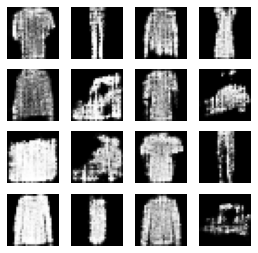

11200: [discriminator loss: 0.645157, acc: 0.664062] [adversarial loss: 0.690153, acc: 0.546875]
11201: [discriminator loss: 0.678724, acc: 0.554688] [adversarial loss: 0.867669, acc: 0.203125]
11202: [discriminator loss: 0.663901, acc: 0.601562] [adversarial loss: 0.596826, acc: 0.843750]
11203: [discriminator loss: 0.696469, acc: 0.460938] [adversarial loss: 0.988984, acc: 0.000000]
11204: [discriminator loss: 0.668511, acc: 0.570312] [adversarial loss: 0.725135, acc: 0.484375]
11205: [discriminator loss: 0.686721, acc: 0.593750] [adversarial loss: 0.878771, acc: 0.140625]
11206: [discriminator loss: 0.672533, acc: 0.640625] [adversarial loss: 0.634281, acc: 0.671875]
11207: [discriminator loss: 0.687840, acc: 0.531250] [adversarial loss: 0.930791, acc: 0.109375]
11208: [discriminator loss: 0.644496, acc: 0.601562] [adversarial loss: 0.673555, acc: 0.625000]
11209: [discriminator loss: 0.662270, acc: 0.585938] [adversarial loss: 0.772604, acc: 0.171875]
11210: [discriminator loss: 0.

11289: [discriminator loss: 0.653503, acc: 0.640625] [adversarial loss: 0.765477, acc: 0.343750]
11290: [discriminator loss: 0.664745, acc: 0.609375] [adversarial loss: 0.845735, acc: 0.156250]
11291: [discriminator loss: 0.657489, acc: 0.617188] [adversarial loss: 0.631434, acc: 0.781250]
11292: [discriminator loss: 0.658667, acc: 0.593750] [adversarial loss: 0.942517, acc: 0.078125]
11293: [discriminator loss: 0.649974, acc: 0.632812] [adversarial loss: 0.647980, acc: 0.687500]
11294: [discriminator loss: 0.674415, acc: 0.531250] [adversarial loss: 0.864694, acc: 0.078125]
11295: [discriminator loss: 0.649683, acc: 0.632812] [adversarial loss: 0.633996, acc: 0.656250]
11296: [discriminator loss: 0.650589, acc: 0.617188] [adversarial loss: 0.826583, acc: 0.125000]
11297: [discriminator loss: 0.655164, acc: 0.648438] [adversarial loss: 0.747527, acc: 0.390625]
11298: [discriminator loss: 0.652926, acc: 0.609375] [adversarial loss: 0.749236, acc: 0.359375]
11299: [discriminator loss: 0.

11378: [discriminator loss: 0.666816, acc: 0.554688] [adversarial loss: 0.666841, acc: 0.562500]
11379: [discriminator loss: 0.652510, acc: 0.656250] [adversarial loss: 0.790589, acc: 0.312500]
11380: [discriminator loss: 0.637290, acc: 0.695312] [adversarial loss: 0.710640, acc: 0.421875]
11381: [discriminator loss: 0.687267, acc: 0.609375] [adversarial loss: 0.742786, acc: 0.406250]
11382: [discriminator loss: 0.674339, acc: 0.609375] [adversarial loss: 0.893127, acc: 0.218750]
11383: [discriminator loss: 0.654723, acc: 0.625000] [adversarial loss: 0.751309, acc: 0.359375]
11384: [discriminator loss: 0.630786, acc: 0.718750] [adversarial loss: 0.810707, acc: 0.171875]
11385: [discriminator loss: 0.649652, acc: 0.664062] [adversarial loss: 0.724128, acc: 0.437500]
11386: [discriminator loss: 0.672780, acc: 0.593750] [adversarial loss: 0.785086, acc: 0.265625]
11387: [discriminator loss: 0.650869, acc: 0.656250] [adversarial loss: 0.701556, acc: 0.468750]
11388: [discriminator loss: 0.

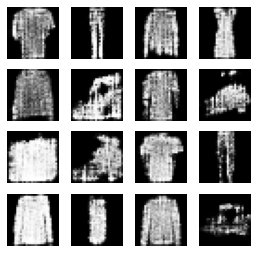

11400: [discriminator loss: 0.630251, acc: 0.617188] [adversarial loss: 0.815853, acc: 0.187500]
11401: [discriminator loss: 0.654310, acc: 0.593750] [adversarial loss: 0.817063, acc: 0.265625]
11402: [discriminator loss: 0.660978, acc: 0.656250] [adversarial loss: 0.716653, acc: 0.421875]
11403: [discriminator loss: 0.637923, acc: 0.656250] [adversarial loss: 0.812877, acc: 0.156250]
11404: [discriminator loss: 0.652974, acc: 0.625000] [adversarial loss: 0.706836, acc: 0.531250]
11405: [discriminator loss: 0.660960, acc: 0.617188] [adversarial loss: 0.732486, acc: 0.406250]
11406: [discriminator loss: 0.671460, acc: 0.617188] [adversarial loss: 0.866647, acc: 0.140625]
11407: [discriminator loss: 0.669204, acc: 0.632812] [adversarial loss: 0.701633, acc: 0.593750]
11408: [discriminator loss: 0.679310, acc: 0.554688] [adversarial loss: 0.880707, acc: 0.109375]
11409: [discriminator loss: 0.651780, acc: 0.609375] [adversarial loss: 0.676518, acc: 0.625000]
11410: [discriminator loss: 0.

11486: [discriminator loss: 0.634927, acc: 0.617188] [adversarial loss: 0.974455, acc: 0.015625]
11487: [discriminator loss: 0.681520, acc: 0.578125] [adversarial loss: 0.737913, acc: 0.375000]
11488: [discriminator loss: 0.641239, acc: 0.687500] [adversarial loss: 0.760868, acc: 0.265625]
11489: [discriminator loss: 0.650393, acc: 0.664062] [adversarial loss: 0.740905, acc: 0.328125]
11490: [discriminator loss: 0.655946, acc: 0.601562] [adversarial loss: 0.689944, acc: 0.593750]
11491: [discriminator loss: 0.684690, acc: 0.554688] [adversarial loss: 0.835379, acc: 0.171875]
11492: [discriminator loss: 0.661784, acc: 0.625000] [adversarial loss: 0.730727, acc: 0.375000]
11493: [discriminator loss: 0.657975, acc: 0.640625] [adversarial loss: 0.900925, acc: 0.109375]
11494: [discriminator loss: 0.631558, acc: 0.656250] [adversarial loss: 0.594161, acc: 0.796875]
11495: [discriminator loss: 0.667946, acc: 0.593750] [adversarial loss: 1.001853, acc: 0.046875]
11496: [discriminator loss: 0.

11575: [discriminator loss: 0.648814, acc: 0.601562] [adversarial loss: 0.662327, acc: 0.578125]
11576: [discriminator loss: 0.660413, acc: 0.585938] [adversarial loss: 0.754194, acc: 0.312500]
11577: [discriminator loss: 0.667507, acc: 0.640625] [adversarial loss: 0.652669, acc: 0.750000]
11578: [discriminator loss: 0.693644, acc: 0.507812] [adversarial loss: 0.999133, acc: 0.015625]
11579: [discriminator loss: 0.692080, acc: 0.546875] [adversarial loss: 0.591697, acc: 0.796875]
11580: [discriminator loss: 0.674816, acc: 0.531250] [adversarial loss: 0.878516, acc: 0.078125]
11581: [discriminator loss: 0.665597, acc: 0.609375] [adversarial loss: 0.683664, acc: 0.531250]
11582: [discriminator loss: 0.652799, acc: 0.593750] [adversarial loss: 0.647315, acc: 0.578125]
11583: [discriminator loss: 0.657541, acc: 0.554688] [adversarial loss: 0.832161, acc: 0.203125]
11584: [discriminator loss: 0.685337, acc: 0.632812] [adversarial loss: 0.699842, acc: 0.531250]
11585: [discriminator loss: 0.

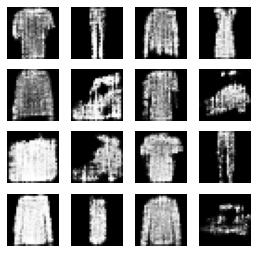

11600: [discriminator loss: 0.662881, acc: 0.609375] [adversarial loss: 0.798780, acc: 0.218750]
11601: [discriminator loss: 0.630795, acc: 0.718750] [adversarial loss: 0.690235, acc: 0.609375]
11602: [discriminator loss: 0.630829, acc: 0.695312] [adversarial loss: 0.760490, acc: 0.375000]
11603: [discriminator loss: 0.681653, acc: 0.578125] [adversarial loss: 0.766464, acc: 0.296875]
11604: [discriminator loss: 0.670371, acc: 0.562500] [adversarial loss: 0.714343, acc: 0.593750]
11605: [discriminator loss: 0.652272, acc: 0.648438] [adversarial loss: 0.827825, acc: 0.109375]
11606: [discriminator loss: 0.683521, acc: 0.617188] [adversarial loss: 0.647321, acc: 0.656250]
11607: [discriminator loss: 0.655129, acc: 0.578125] [adversarial loss: 0.838032, acc: 0.156250]
11608: [discriminator loss: 0.659749, acc: 0.617188] [adversarial loss: 0.741780, acc: 0.406250]
11609: [discriminator loss: 0.633097, acc: 0.656250] [adversarial loss: 0.824625, acc: 0.234375]
11610: [discriminator loss: 0.

11685: [discriminator loss: 0.633175, acc: 0.617188] [adversarial loss: 0.847478, acc: 0.093750]
11686: [discriminator loss: 0.668999, acc: 0.656250] [adversarial loss: 0.694619, acc: 0.484375]
11687: [discriminator loss: 0.663702, acc: 0.617188] [adversarial loss: 0.847913, acc: 0.156250]
11688: [discriminator loss: 0.667849, acc: 0.585938] [adversarial loss: 0.650564, acc: 0.640625]
11689: [discriminator loss: 0.650466, acc: 0.562500] [adversarial loss: 0.851465, acc: 0.203125]
11690: [discriminator loss: 0.664869, acc: 0.585938] [adversarial loss: 0.699476, acc: 0.562500]
11691: [discriminator loss: 0.661705, acc: 0.601562] [adversarial loss: 0.861731, acc: 0.125000]
11692: [discriminator loss: 0.669228, acc: 0.617188] [adversarial loss: 0.715454, acc: 0.484375]
11693: [discriminator loss: 0.686102, acc: 0.554688] [adversarial loss: 0.799170, acc: 0.171875]
11694: [discriminator loss: 0.655139, acc: 0.609375] [adversarial loss: 0.781317, acc: 0.234375]
11695: [discriminator loss: 0.

11774: [discriminator loss: 0.650488, acc: 0.593750] [adversarial loss: 0.819071, acc: 0.156250]
11775: [discriminator loss: 0.684344, acc: 0.601562] [adversarial loss: 0.731462, acc: 0.359375]
11776: [discriminator loss: 0.690592, acc: 0.554688] [adversarial loss: 0.722497, acc: 0.406250]
11777: [discriminator loss: 0.644610, acc: 0.664062] [adversarial loss: 0.813105, acc: 0.234375]
11778: [discriminator loss: 0.675116, acc: 0.562500] [adversarial loss: 0.670463, acc: 0.656250]
11779: [discriminator loss: 0.682638, acc: 0.554688] [adversarial loss: 0.813478, acc: 0.140625]
11780: [discriminator loss: 0.676243, acc: 0.562500] [adversarial loss: 0.743239, acc: 0.265625]
11781: [discriminator loss: 0.639391, acc: 0.671875] [adversarial loss: 0.877168, acc: 0.140625]
11782: [discriminator loss: 0.661460, acc: 0.601562] [adversarial loss: 0.562880, acc: 0.843750]
11783: [discriminator loss: 0.675703, acc: 0.476562] [adversarial loss: 0.981856, acc: 0.031250]
11784: [discriminator loss: 0.

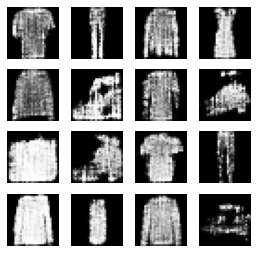

11800: [discriminator loss: 0.639216, acc: 0.648438] [adversarial loss: 0.861114, acc: 0.187500]
11801: [discriminator loss: 0.663852, acc: 0.601562] [adversarial loss: 0.683758, acc: 0.546875]
11802: [discriminator loss: 0.663767, acc: 0.585938] [adversarial loss: 0.816110, acc: 0.203125]
11803: [discriminator loss: 0.652821, acc: 0.609375] [adversarial loss: 0.789950, acc: 0.359375]
11804: [discriminator loss: 0.639132, acc: 0.648438] [adversarial loss: 0.656172, acc: 0.625000]
11805: [discriminator loss: 0.696730, acc: 0.476562] [adversarial loss: 1.025334, acc: 0.046875]
11806: [discriminator loss: 0.666917, acc: 0.585938] [adversarial loss: 0.648197, acc: 0.609375]
11807: [discriminator loss: 0.660822, acc: 0.585938] [adversarial loss: 0.901807, acc: 0.140625]
11808: [discriminator loss: 0.677024, acc: 0.632812] [adversarial loss: 0.622327, acc: 0.703125]
11809: [discriminator loss: 0.657477, acc: 0.593750] [adversarial loss: 0.795014, acc: 0.203125]
11810: [discriminator loss: 0.

11888: [discriminator loss: 0.666212, acc: 0.570312] [adversarial loss: 0.857645, acc: 0.156250]
11889: [discriminator loss: 0.665127, acc: 0.601562] [adversarial loss: 0.667292, acc: 0.562500]
11890: [discriminator loss: 0.668025, acc: 0.601562] [adversarial loss: 0.906434, acc: 0.125000]
11891: [discriminator loss: 0.670357, acc: 0.578125] [adversarial loss: 0.711867, acc: 0.468750]
11892: [discriminator loss: 0.641734, acc: 0.625000] [adversarial loss: 1.015482, acc: 0.046875]
11893: [discriminator loss: 0.662276, acc: 0.601562] [adversarial loss: 0.664761, acc: 0.609375]
11894: [discriminator loss: 0.685465, acc: 0.546875] [adversarial loss: 0.793386, acc: 0.281250]
11895: [discriminator loss: 0.633732, acc: 0.617188] [adversarial loss: 0.703413, acc: 0.531250]
11896: [discriminator loss: 0.664334, acc: 0.562500] [adversarial loss: 0.788977, acc: 0.265625]
11897: [discriminator loss: 0.642879, acc: 0.671875] [adversarial loss: 0.734580, acc: 0.500000]
11898: [discriminator loss: 0.

11973: [discriminator loss: 0.634426, acc: 0.734375] [adversarial loss: 0.840299, acc: 0.296875]
11974: [discriminator loss: 0.663903, acc: 0.609375] [adversarial loss: 0.774799, acc: 0.359375]
11975: [discriminator loss: 0.667825, acc: 0.617188] [adversarial loss: 0.701305, acc: 0.453125]
11976: [discriminator loss: 0.654164, acc: 0.648438] [adversarial loss: 0.907446, acc: 0.062500]
11977: [discriminator loss: 0.675487, acc: 0.531250] [adversarial loss: 0.587742, acc: 0.812500]
11978: [discriminator loss: 0.691764, acc: 0.453125] [adversarial loss: 0.925157, acc: 0.031250]
11979: [discriminator loss: 0.650706, acc: 0.585938] [adversarial loss: 0.644492, acc: 0.640625]
11980: [discriminator loss: 0.651270, acc: 0.609375] [adversarial loss: 0.799112, acc: 0.218750]
11981: [discriminator loss: 0.667687, acc: 0.664062] [adversarial loss: 0.647344, acc: 0.625000]
11982: [discriminator loss: 0.662120, acc: 0.523438] [adversarial loss: 0.964073, acc: 0.031250]
11983: [discriminator loss: 0.

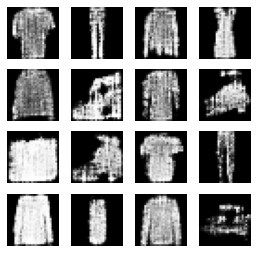

12000: [discriminator loss: 0.666304, acc: 0.664062] [adversarial loss: 0.814474, acc: 0.140625]
12001: [discriminator loss: 0.647250, acc: 0.679688] [adversarial loss: 0.774407, acc: 0.203125]
12002: [discriminator loss: 0.657109, acc: 0.640625] [adversarial loss: 0.677585, acc: 0.562500]
12003: [discriminator loss: 0.654067, acc: 0.609375] [adversarial loss: 0.920957, acc: 0.046875]
12004: [discriminator loss: 0.659524, acc: 0.617188] [adversarial loss: 0.597786, acc: 0.765625]
12005: [discriminator loss: 0.676178, acc: 0.570312] [adversarial loss: 0.961239, acc: 0.093750]
12006: [discriminator loss: 0.689149, acc: 0.554688] [adversarial loss: 0.683110, acc: 0.578125]
12007: [discriminator loss: 0.651468, acc: 0.593750] [adversarial loss: 0.917896, acc: 0.171875]
12008: [discriminator loss: 0.650302, acc: 0.593750] [adversarial loss: 0.754934, acc: 0.218750]
12009: [discriminator loss: 0.661483, acc: 0.640625] [adversarial loss: 0.791553, acc: 0.250000]
12010: [discriminator loss: 0.

12088: [discriminator loss: 0.701353, acc: 0.546875] [adversarial loss: 0.963252, acc: 0.062500]
12089: [discriminator loss: 0.681630, acc: 0.539062] [adversarial loss: 0.638848, acc: 0.687500]
12090: [discriminator loss: 0.663531, acc: 0.578125] [adversarial loss: 0.817374, acc: 0.250000]
12091: [discriminator loss: 0.655040, acc: 0.648438] [adversarial loss: 0.741250, acc: 0.375000]
12092: [discriminator loss: 0.651087, acc: 0.578125] [adversarial loss: 0.712338, acc: 0.421875]
12093: [discriminator loss: 0.668994, acc: 0.625000] [adversarial loss: 0.721567, acc: 0.484375]
12094: [discriminator loss: 0.667631, acc: 0.585938] [adversarial loss: 0.805224, acc: 0.296875]
12095: [discriminator loss: 0.655263, acc: 0.632812] [adversarial loss: 0.756330, acc: 0.250000]
12096: [discriminator loss: 0.683804, acc: 0.578125] [adversarial loss: 0.845144, acc: 0.171875]
12097: [discriminator loss: 0.676280, acc: 0.578125] [adversarial loss: 0.663949, acc: 0.640625]
12098: [discriminator loss: 0.

12173: [discriminator loss: 0.649032, acc: 0.562500] [adversarial loss: 0.910791, acc: 0.140625]
12174: [discriminator loss: 0.660632, acc: 0.593750] [adversarial loss: 0.655835, acc: 0.593750]
12175: [discriminator loss: 0.642555, acc: 0.640625] [adversarial loss: 0.855741, acc: 0.187500]
12176: [discriminator loss: 0.689121, acc: 0.539062] [adversarial loss: 0.760960, acc: 0.234375]
12177: [discriminator loss: 0.650005, acc: 0.695312] [adversarial loss: 0.778728, acc: 0.328125]
12178: [discriminator loss: 0.656890, acc: 0.570312] [adversarial loss: 0.664533, acc: 0.578125]
12179: [discriminator loss: 0.621633, acc: 0.671875] [adversarial loss: 0.834617, acc: 0.125000]
12180: [discriminator loss: 0.645184, acc: 0.632812] [adversarial loss: 0.564023, acc: 0.937500]
12181: [discriminator loss: 0.642008, acc: 0.593750] [adversarial loss: 0.831918, acc: 0.218750]
12182: [discriminator loss: 0.631111, acc: 0.710938] [adversarial loss: 0.761250, acc: 0.359375]
12183: [discriminator loss: 0.

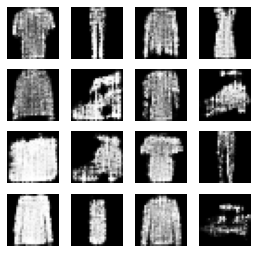

12200: [discriminator loss: 0.681412, acc: 0.523438] [adversarial loss: 0.822237, acc: 0.140625]
12201: [discriminator loss: 0.637796, acc: 0.695312] [adversarial loss: 0.707312, acc: 0.515625]
12202: [discriminator loss: 0.671439, acc: 0.554688] [adversarial loss: 0.716734, acc: 0.453125]
12203: [discriminator loss: 0.660331, acc: 0.609375] [adversarial loss: 0.727183, acc: 0.437500]
12204: [discriminator loss: 0.629203, acc: 0.687500] [adversarial loss: 0.775149, acc: 0.375000]
12205: [discriminator loss: 0.639282, acc: 0.656250] [adversarial loss: 0.747215, acc: 0.328125]
12206: [discriminator loss: 0.663740, acc: 0.625000] [adversarial loss: 0.663070, acc: 0.656250]
12207: [discriminator loss: 0.674771, acc: 0.523438] [adversarial loss: 0.892245, acc: 0.140625]
12208: [discriminator loss: 0.675132, acc: 0.609375] [adversarial loss: 0.721872, acc: 0.437500]
12209: [discriminator loss: 0.644693, acc: 0.687500] [adversarial loss: 0.755950, acc: 0.359375]
12210: [discriminator loss: 0.

12286: [discriminator loss: 0.657714, acc: 0.625000] [adversarial loss: 0.680228, acc: 0.468750]
12287: [discriminator loss: 0.664937, acc: 0.585938] [adversarial loss: 0.730056, acc: 0.406250]
12288: [discriminator loss: 0.693991, acc: 0.523438] [adversarial loss: 0.658263, acc: 0.671875]
12289: [discriminator loss: 0.662723, acc: 0.593750] [adversarial loss: 0.806963, acc: 0.250000]
12290: [discriminator loss: 0.663749, acc: 0.632812] [adversarial loss: 0.614879, acc: 0.703125]
12291: [discriminator loss: 0.677691, acc: 0.523438] [adversarial loss: 0.883457, acc: 0.109375]
12292: [discriminator loss: 0.645132, acc: 0.625000] [adversarial loss: 0.644142, acc: 0.703125]
12293: [discriminator loss: 0.671941, acc: 0.570312] [adversarial loss: 0.857403, acc: 0.156250]
12294: [discriminator loss: 0.656093, acc: 0.632812] [adversarial loss: 0.682775, acc: 0.515625]
12295: [discriminator loss: 0.673170, acc: 0.523438] [adversarial loss: 0.848402, acc: 0.250000]
12296: [discriminator loss: 0.

12372: [discriminator loss: 0.664766, acc: 0.578125] [adversarial loss: 0.636597, acc: 0.765625]
12373: [discriminator loss: 0.683104, acc: 0.554688] [adversarial loss: 0.876536, acc: 0.062500]
12374: [discriminator loss: 0.650928, acc: 0.648438] [adversarial loss: 0.681448, acc: 0.515625]
12375: [discriminator loss: 0.680791, acc: 0.562500] [adversarial loss: 0.783785, acc: 0.234375]
12376: [discriminator loss: 0.676300, acc: 0.539062] [adversarial loss: 0.697632, acc: 0.500000]
12377: [discriminator loss: 0.651414, acc: 0.632812] [adversarial loss: 0.801588, acc: 0.250000]
12378: [discriminator loss: 0.650065, acc: 0.671875] [adversarial loss: 0.701893, acc: 0.515625]
12379: [discriminator loss: 0.691053, acc: 0.531250] [adversarial loss: 0.914267, acc: 0.093750]
12380: [discriminator loss: 0.648965, acc: 0.640625] [adversarial loss: 0.611028, acc: 0.750000]
12381: [discriminator loss: 0.695539, acc: 0.484375] [adversarial loss: 0.855142, acc: 0.156250]
12382: [discriminator loss: 0.

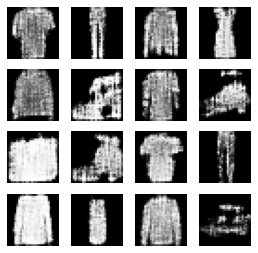

12400: [discriminator loss: 0.659836, acc: 0.625000] [adversarial loss: 0.670980, acc: 0.640625]
12401: [discriminator loss: 0.662161, acc: 0.570312] [adversarial loss: 0.837706, acc: 0.093750]
12402: [discriminator loss: 0.666774, acc: 0.648438] [adversarial loss: 0.701409, acc: 0.515625]
12403: [discriminator loss: 0.652358, acc: 0.585938] [adversarial loss: 0.892155, acc: 0.078125]
12404: [discriminator loss: 0.689604, acc: 0.554688] [adversarial loss: 0.626284, acc: 0.687500]
12405: [discriminator loss: 0.689643, acc: 0.468750] [adversarial loss: 0.945142, acc: 0.031250]
12406: [discriminator loss: 0.662264, acc: 0.617188] [adversarial loss: 0.668089, acc: 0.656250]
12407: [discriminator loss: 0.675273, acc: 0.515625] [adversarial loss: 0.888298, acc: 0.140625]
12408: [discriminator loss: 0.663665, acc: 0.593750] [adversarial loss: 0.597526, acc: 0.812500]
12409: [discriminator loss: 0.692026, acc: 0.523438] [adversarial loss: 0.872756, acc: 0.109375]
12410: [discriminator loss: 0.

12489: [discriminator loss: 0.646195, acc: 0.656250] [adversarial loss: 0.705165, acc: 0.515625]
12490: [discriminator loss: 0.661474, acc: 0.625000] [adversarial loss: 0.784757, acc: 0.312500]
12491: [discriminator loss: 0.649888, acc: 0.687500] [adversarial loss: 0.693909, acc: 0.593750]
12492: [discriminator loss: 0.644858, acc: 0.609375] [adversarial loss: 0.791839, acc: 0.296875]
12493: [discriminator loss: 0.673073, acc: 0.570312] [adversarial loss: 0.684723, acc: 0.515625]
12494: [discriminator loss: 0.663547, acc: 0.648438] [adversarial loss: 0.840015, acc: 0.171875]
12495: [discriminator loss: 0.676905, acc: 0.601562] [adversarial loss: 0.648095, acc: 0.593750]
12496: [discriminator loss: 0.685139, acc: 0.578125] [adversarial loss: 0.766030, acc: 0.296875]
12497: [discriminator loss: 0.664635, acc: 0.601562] [adversarial loss: 0.702481, acc: 0.468750]
12498: [discriminator loss: 0.666006, acc: 0.562500] [adversarial loss: 0.748118, acc: 0.421875]
12499: [discriminator loss: 0.

12574: [discriminator loss: 0.681881, acc: 0.593750] [adversarial loss: 0.751876, acc: 0.328125]
12575: [discriminator loss: 0.652931, acc: 0.601562] [adversarial loss: 0.677986, acc: 0.500000]
12576: [discriminator loss: 0.667477, acc: 0.578125] [adversarial loss: 0.765643, acc: 0.312500]
12577: [discriminator loss: 0.661590, acc: 0.593750] [adversarial loss: 0.715841, acc: 0.515625]
12578: [discriminator loss: 0.679800, acc: 0.539062] [adversarial loss: 0.871035, acc: 0.218750]
12579: [discriminator loss: 0.641815, acc: 0.640625] [adversarial loss: 0.800970, acc: 0.265625]
12580: [discriminator loss: 0.637935, acc: 0.671875] [adversarial loss: 0.754005, acc: 0.328125]
12581: [discriminator loss: 0.642976, acc: 0.656250] [adversarial loss: 0.784960, acc: 0.234375]
12582: [discriminator loss: 0.657268, acc: 0.617188] [adversarial loss: 0.688934, acc: 0.578125]
12583: [discriminator loss: 0.685891, acc: 0.601562] [adversarial loss: 0.637847, acc: 0.625000]
12584: [discriminator loss: 0.

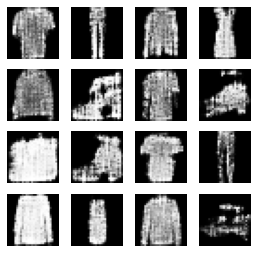

12600: [discriminator loss: 0.662219, acc: 0.609375] [adversarial loss: 0.759416, acc: 0.359375]
12601: [discriminator loss: 0.691090, acc: 0.601562] [adversarial loss: 0.766376, acc: 0.359375]
12602: [discriminator loss: 0.639051, acc: 0.664062] [adversarial loss: 0.817705, acc: 0.203125]
12603: [discriminator loss: 0.662551, acc: 0.601562] [adversarial loss: 0.707400, acc: 0.562500]
12604: [discriminator loss: 0.668695, acc: 0.570312] [adversarial loss: 0.912617, acc: 0.078125]
12605: [discriminator loss: 0.667982, acc: 0.585938] [adversarial loss: 0.638886, acc: 0.703125]
12606: [discriminator loss: 0.657476, acc: 0.601562] [adversarial loss: 0.906820, acc: 0.109375]
12607: [discriminator loss: 0.703606, acc: 0.523438] [adversarial loss: 0.591215, acc: 0.828125]
12608: [discriminator loss: 0.681540, acc: 0.539062] [adversarial loss: 0.841998, acc: 0.218750]
12609: [discriminator loss: 0.669557, acc: 0.585938] [adversarial loss: 0.791415, acc: 0.281250]
12610: [discriminator loss: 0.

12688: [discriminator loss: 0.685079, acc: 0.585938] [adversarial loss: 0.692557, acc: 0.453125]
12689: [discriminator loss: 0.654096, acc: 0.632812] [adversarial loss: 0.801750, acc: 0.171875]
12690: [discriminator loss: 0.657826, acc: 0.640625] [adversarial loss: 0.715876, acc: 0.375000]
12691: [discriminator loss: 0.657248, acc: 0.632812] [adversarial loss: 0.764119, acc: 0.312500]
12692: [discriminator loss: 0.688241, acc: 0.539062] [adversarial loss: 0.709768, acc: 0.453125]
12693: [discriminator loss: 0.656651, acc: 0.593750] [adversarial loss: 0.906991, acc: 0.062500]
12694: [discriminator loss: 0.662660, acc: 0.593750] [adversarial loss: 0.688668, acc: 0.515625]
12695: [discriminator loss: 0.652476, acc: 0.593750] [adversarial loss: 0.883529, acc: 0.062500]
12696: [discriminator loss: 0.707861, acc: 0.531250] [adversarial loss: 0.643064, acc: 0.703125]
12697: [discriminator loss: 0.671606, acc: 0.570312] [adversarial loss: 0.919833, acc: 0.031250]
12698: [discriminator loss: 0.

12778: [discriminator loss: 0.678107, acc: 0.601562] [adversarial loss: 1.063572, acc: 0.015625]
12779: [discriminator loss: 0.696982, acc: 0.562500] [adversarial loss: 0.580198, acc: 0.812500]
12780: [discriminator loss: 0.684252, acc: 0.523438] [adversarial loss: 0.968921, acc: 0.031250]
12781: [discriminator loss: 0.665476, acc: 0.593750] [adversarial loss: 0.765070, acc: 0.218750]
12782: [discriminator loss: 0.666119, acc: 0.617188] [adversarial loss: 0.729428, acc: 0.453125]
12783: [discriminator loss: 0.671874, acc: 0.570312] [adversarial loss: 0.836459, acc: 0.125000]
12784: [discriminator loss: 0.677385, acc: 0.593750] [adversarial loss: 0.723864, acc: 0.437500]
12785: [discriminator loss: 0.663710, acc: 0.625000] [adversarial loss: 0.828435, acc: 0.171875]
12786: [discriminator loss: 0.688588, acc: 0.593750] [adversarial loss: 0.706193, acc: 0.437500]
12787: [discriminator loss: 0.668622, acc: 0.601562] [adversarial loss: 0.907431, acc: 0.046875]
12788: [discriminator loss: 0.

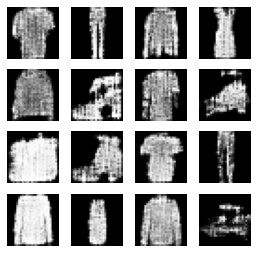

12800: [discriminator loss: 0.637897, acc: 0.687500] [adversarial loss: 0.815268, acc: 0.156250]
12801: [discriminator loss: 0.644910, acc: 0.640625] [adversarial loss: 0.644897, acc: 0.656250]
12802: [discriminator loss: 0.650211, acc: 0.578125] [adversarial loss: 0.865371, acc: 0.078125]
12803: [discriminator loss: 0.674362, acc: 0.609375] [adversarial loss: 0.581166, acc: 0.781250]
12804: [discriminator loss: 0.697022, acc: 0.460938] [adversarial loss: 0.876866, acc: 0.140625]
12805: [discriminator loss: 0.655851, acc: 0.625000] [adversarial loss: 0.621769, acc: 0.734375]
12806: [discriminator loss: 0.660438, acc: 0.585938] [adversarial loss: 0.853085, acc: 0.187500]
12807: [discriminator loss: 0.660337, acc: 0.585938] [adversarial loss: 0.744030, acc: 0.453125]
12808: [discriminator loss: 0.664772, acc: 0.578125] [adversarial loss: 0.771389, acc: 0.390625]
12809: [discriminator loss: 0.660774, acc: 0.632812] [adversarial loss: 0.791290, acc: 0.296875]
12810: [discriminator loss: 0.

12885: [discriminator loss: 0.676330, acc: 0.562500] [adversarial loss: 0.793000, acc: 0.312500]
12886: [discriminator loss: 0.640948, acc: 0.710938] [adversarial loss: 0.688823, acc: 0.593750]
12887: [discriminator loss: 0.669715, acc: 0.585938] [adversarial loss: 0.892069, acc: 0.125000]
12888: [discriminator loss: 0.659438, acc: 0.601562] [adversarial loss: 0.630408, acc: 0.687500]
12889: [discriminator loss: 0.685584, acc: 0.523438] [adversarial loss: 0.927123, acc: 0.078125]
12890: [discriminator loss: 0.671881, acc: 0.554688] [adversarial loss: 0.669610, acc: 0.578125]
12891: [discriminator loss: 0.676271, acc: 0.562500] [adversarial loss: 0.819247, acc: 0.203125]
12892: [discriminator loss: 0.653914, acc: 0.664062] [adversarial loss: 0.679537, acc: 0.531250]
12893: [discriminator loss: 0.659648, acc: 0.648438] [adversarial loss: 0.713972, acc: 0.437500]
12894: [discriminator loss: 0.680835, acc: 0.562500] [adversarial loss: 0.704381, acc: 0.406250]
12895: [discriminator loss: 0.

12973: [discriminator loss: 0.674920, acc: 0.593750] [adversarial loss: 0.667188, acc: 0.640625]
12974: [discriminator loss: 0.661965, acc: 0.617188] [adversarial loss: 0.834839, acc: 0.156250]
12975: [discriminator loss: 0.666970, acc: 0.601562] [adversarial loss: 0.692191, acc: 0.531250]
12976: [discriminator loss: 0.677948, acc: 0.585938] [adversarial loss: 0.765776, acc: 0.359375]
12977: [discriminator loss: 0.669029, acc: 0.585938] [adversarial loss: 0.679816, acc: 0.578125]
12978: [discriminator loss: 0.651698, acc: 0.585938] [adversarial loss: 0.947541, acc: 0.015625]
12979: [discriminator loss: 0.683871, acc: 0.570312] [adversarial loss: 0.572365, acc: 0.812500]
12980: [discriminator loss: 0.656200, acc: 0.531250] [adversarial loss: 0.889345, acc: 0.203125]
12981: [discriminator loss: 0.659251, acc: 0.617188] [adversarial loss: 0.721174, acc: 0.500000]
12982: [discriminator loss: 0.641004, acc: 0.640625] [adversarial loss: 0.750092, acc: 0.375000]
12983: [discriminator loss: 0.

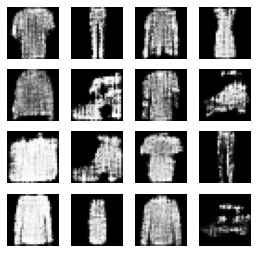

13000: [discriminator loss: 0.643505, acc: 0.648438] [adversarial loss: 0.755901, acc: 0.343750]
13001: [discriminator loss: 0.638323, acc: 0.640625] [adversarial loss: 0.760830, acc: 0.375000]
13002: [discriminator loss: 0.671459, acc: 0.585938] [adversarial loss: 0.695633, acc: 0.531250]
13003: [discriminator loss: 0.685146, acc: 0.585938] [adversarial loss: 0.705056, acc: 0.500000]
13004: [discriminator loss: 0.672541, acc: 0.570312] [adversarial loss: 0.825965, acc: 0.265625]
13005: [discriminator loss: 0.680720, acc: 0.593750] [adversarial loss: 0.745395, acc: 0.406250]
13006: [discriminator loss: 0.658436, acc: 0.593750] [adversarial loss: 0.668760, acc: 0.640625]
13007: [discriminator loss: 0.668847, acc: 0.609375] [adversarial loss: 0.720878, acc: 0.437500]
13008: [discriminator loss: 0.656152, acc: 0.625000] [adversarial loss: 0.786303, acc: 0.234375]
13009: [discriminator loss: 0.670605, acc: 0.593750] [adversarial loss: 0.749155, acc: 0.359375]
13010: [discriminator loss: 0.

13089: [discriminator loss: 0.630095, acc: 0.640625] [adversarial loss: 0.922629, acc: 0.093750]
13090: [discriminator loss: 0.668042, acc: 0.609375] [adversarial loss: 0.637235, acc: 0.687500]
13091: [discriminator loss: 0.658288, acc: 0.578125] [adversarial loss: 0.716360, acc: 0.406250]
13092: [discriminator loss: 0.659229, acc: 0.601562] [adversarial loss: 0.768882, acc: 0.312500]
13093: [discriminator loss: 0.673454, acc: 0.578125] [adversarial loss: 0.729537, acc: 0.468750]
13094: [discriminator loss: 0.655795, acc: 0.671875] [adversarial loss: 0.684046, acc: 0.562500]
13095: [discriminator loss: 0.679154, acc: 0.593750] [adversarial loss: 0.886502, acc: 0.093750]
13096: [discriminator loss: 0.679871, acc: 0.609375] [adversarial loss: 0.679065, acc: 0.578125]
13097: [discriminator loss: 0.667369, acc: 0.546875] [adversarial loss: 0.854310, acc: 0.187500]
13098: [discriminator loss: 0.649692, acc: 0.593750] [adversarial loss: 0.596754, acc: 0.781250]
13099: [discriminator loss: 0.

13174: [discriminator loss: 0.691174, acc: 0.484375] [adversarial loss: 0.839141, acc: 0.125000]
13175: [discriminator loss: 0.659083, acc: 0.601562] [adversarial loss: 0.692899, acc: 0.437500]
13176: [discriminator loss: 0.670583, acc: 0.546875] [adversarial loss: 0.827111, acc: 0.203125]
13177: [discriminator loss: 0.668627, acc: 0.617188] [adversarial loss: 0.642116, acc: 0.734375]
13178: [discriminator loss: 0.675917, acc: 0.539062] [adversarial loss: 0.953256, acc: 0.140625]
13179: [discriminator loss: 0.670378, acc: 0.585938] [adversarial loss: 0.621082, acc: 0.765625]
13180: [discriminator loss: 0.663006, acc: 0.539062] [adversarial loss: 0.812270, acc: 0.156250]
13181: [discriminator loss: 0.661978, acc: 0.664062] [adversarial loss: 0.651352, acc: 0.687500]
13182: [discriminator loss: 0.682223, acc: 0.554688] [adversarial loss: 0.853854, acc: 0.062500]
13183: [discriminator loss: 0.661974, acc: 0.648438] [adversarial loss: 0.770810, acc: 0.281250]
13184: [discriminator loss: 0.

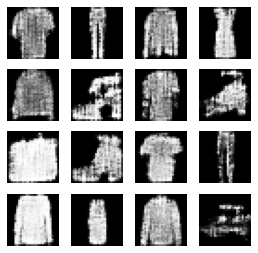

13200: [discriminator loss: 0.661608, acc: 0.578125] [adversarial loss: 0.787333, acc: 0.265625]
13201: [discriminator loss: 0.644728, acc: 0.664062] [adversarial loss: 0.749792, acc: 0.312500]
13202: [discriminator loss: 0.649970, acc: 0.664062] [adversarial loss: 0.780783, acc: 0.296875]
13203: [discriminator loss: 0.676771, acc: 0.578125] [adversarial loss: 0.827034, acc: 0.218750]
13204: [discriminator loss: 0.653952, acc: 0.656250] [adversarial loss: 0.580382, acc: 0.796875]
13205: [discriminator loss: 0.657319, acc: 0.546875] [adversarial loss: 0.921646, acc: 0.078125]
13206: [discriminator loss: 0.674179, acc: 0.570312] [adversarial loss: 0.635347, acc: 0.640625]
13207: [discriminator loss: 0.667024, acc: 0.570312] [adversarial loss: 0.935247, acc: 0.046875]
13208: [discriminator loss: 0.664935, acc: 0.601562] [adversarial loss: 0.670696, acc: 0.609375]
13209: [discriminator loss: 0.670731, acc: 0.523438] [adversarial loss: 0.739555, acc: 0.343750]
13210: [discriminator loss: 0.

13290: [discriminator loss: 0.627498, acc: 0.609375] [adversarial loss: 0.801734, acc: 0.250000]
13291: [discriminator loss: 0.661969, acc: 0.648438] [adversarial loss: 0.673142, acc: 0.562500]
13292: [discriminator loss: 0.667001, acc: 0.593750] [adversarial loss: 0.835677, acc: 0.109375]
13293: [discriminator loss: 0.651465, acc: 0.617188] [adversarial loss: 0.742839, acc: 0.437500]
13294: [discriminator loss: 0.665283, acc: 0.578125] [adversarial loss: 0.920596, acc: 0.125000]
13295: [discriminator loss: 0.714660, acc: 0.554688] [adversarial loss: 0.599579, acc: 0.796875]
13296: [discriminator loss: 0.689909, acc: 0.539062] [adversarial loss: 0.858672, acc: 0.203125]
13297: [discriminator loss: 0.671325, acc: 0.632812] [adversarial loss: 0.659905, acc: 0.609375]
13298: [discriminator loss: 0.646710, acc: 0.609375] [adversarial loss: 0.765797, acc: 0.218750]
13299: [discriminator loss: 0.648602, acc: 0.710938] [adversarial loss: 0.801433, acc: 0.203125]
13300: [discriminator loss: 0.

13376: [discriminator loss: 0.686675, acc: 0.539062] [adversarial loss: 0.895240, acc: 0.078125]
13377: [discriminator loss: 0.655255, acc: 0.656250] [adversarial loss: 0.700268, acc: 0.468750]
13378: [discriminator loss: 0.682052, acc: 0.570312] [adversarial loss: 0.770416, acc: 0.265625]
13379: [discriminator loss: 0.621646, acc: 0.734375] [adversarial loss: 0.869382, acc: 0.109375]
13380: [discriminator loss: 0.687092, acc: 0.531250] [adversarial loss: 0.651340, acc: 0.625000]
13381: [discriminator loss: 0.685345, acc: 0.539062] [adversarial loss: 0.942478, acc: 0.046875]
13382: [discriminator loss: 0.633281, acc: 0.625000] [adversarial loss: 0.760944, acc: 0.359375]
13383: [discriminator loss: 0.649178, acc: 0.593750] [adversarial loss: 0.824440, acc: 0.125000]
13384: [discriminator loss: 0.650108, acc: 0.632812] [adversarial loss: 0.678979, acc: 0.593750]
13385: [discriminator loss: 0.660116, acc: 0.570312] [adversarial loss: 0.894202, acc: 0.125000]
13386: [discriminator loss: 0.

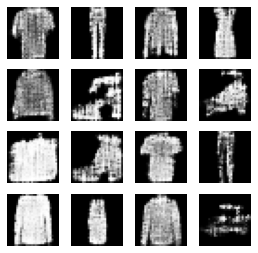

13400: [discriminator loss: 0.661102, acc: 0.601562] [adversarial loss: 0.861244, acc: 0.125000]
13401: [discriminator loss: 0.686889, acc: 0.617188] [adversarial loss: 0.615747, acc: 0.703125]
13402: [discriminator loss: 0.684728, acc: 0.492188] [adversarial loss: 0.887633, acc: 0.062500]
13403: [discriminator loss: 0.649783, acc: 0.640625] [adversarial loss: 0.664094, acc: 0.593750]
13404: [discriminator loss: 0.675508, acc: 0.562500] [adversarial loss: 0.944193, acc: 0.140625]
13405: [discriminator loss: 0.694064, acc: 0.554688] [adversarial loss: 0.604424, acc: 0.750000]
13406: [discriminator loss: 0.669829, acc: 0.539062] [adversarial loss: 0.863281, acc: 0.093750]
13407: [discriminator loss: 0.670284, acc: 0.617188] [adversarial loss: 0.782940, acc: 0.312500]
13408: [discriminator loss: 0.661269, acc: 0.617188] [adversarial loss: 0.733740, acc: 0.359375]
13409: [discriminator loss: 0.685093, acc: 0.539062] [adversarial loss: 0.763737, acc: 0.328125]
13410: [discriminator loss: 0.

13489: [discriminator loss: 0.662939, acc: 0.609375] [adversarial loss: 0.724151, acc: 0.390625]
13490: [discriminator loss: 0.661283, acc: 0.640625] [adversarial loss: 0.820091, acc: 0.296875]
13491: [discriminator loss: 0.663623, acc: 0.617188] [adversarial loss: 0.610550, acc: 0.734375]
13492: [discriminator loss: 0.680027, acc: 0.515625] [adversarial loss: 0.913283, acc: 0.109375]
13493: [discriminator loss: 0.690219, acc: 0.585938] [adversarial loss: 0.643260, acc: 0.671875]
13494: [discriminator loss: 0.682090, acc: 0.539062] [adversarial loss: 0.858964, acc: 0.125000]
13495: [discriminator loss: 0.646036, acc: 0.671875] [adversarial loss: 0.693883, acc: 0.484375]
13496: [discriminator loss: 0.661898, acc: 0.593750] [adversarial loss: 0.780777, acc: 0.375000]
13497: [discriminator loss: 0.650309, acc: 0.656250] [adversarial loss: 0.747860, acc: 0.359375]
13498: [discriminator loss: 0.649713, acc: 0.632812] [adversarial loss: 0.735681, acc: 0.375000]
13499: [discriminator loss: 0.

13576: [discriminator loss: 0.651341, acc: 0.632812] [adversarial loss: 0.805364, acc: 0.140625]
13577: [discriminator loss: 0.664185, acc: 0.664062] [adversarial loss: 0.714086, acc: 0.421875]
13578: [discriminator loss: 0.657574, acc: 0.601562] [adversarial loss: 0.804866, acc: 0.187500]
13579: [discriminator loss: 0.649248, acc: 0.710938] [adversarial loss: 0.647869, acc: 0.703125]
13580: [discriminator loss: 0.656606, acc: 0.601562] [adversarial loss: 0.915520, acc: 0.187500]
13581: [discriminator loss: 0.696763, acc: 0.554688] [adversarial loss: 0.666017, acc: 0.625000]
13582: [discriminator loss: 0.665572, acc: 0.585938] [adversarial loss: 0.856391, acc: 0.078125]
13583: [discriminator loss: 0.672811, acc: 0.625000] [adversarial loss: 0.642868, acc: 0.671875]
13584: [discriminator loss: 0.678659, acc: 0.554688] [adversarial loss: 0.842194, acc: 0.078125]
13585: [discriminator loss: 0.690226, acc: 0.585938] [adversarial loss: 0.666256, acc: 0.578125]
13586: [discriminator loss: 0.

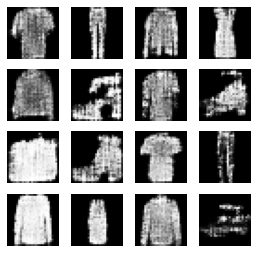

13600: [discriminator loss: 0.663269, acc: 0.570312] [adversarial loss: 0.593795, acc: 0.734375]
13601: [discriminator loss: 0.678683, acc: 0.523438] [adversarial loss: 0.810868, acc: 0.234375]
13602: [discriminator loss: 0.656593, acc: 0.648438] [adversarial loss: 0.662192, acc: 0.640625]
13603: [discriminator loss: 0.669176, acc: 0.578125] [adversarial loss: 0.814467, acc: 0.187500]
13604: [discriminator loss: 0.644355, acc: 0.703125] [adversarial loss: 0.738371, acc: 0.406250]
13605: [discriminator loss: 0.665555, acc: 0.625000] [adversarial loss: 0.835821, acc: 0.125000]
13606: [discriminator loss: 0.651068, acc: 0.671875] [adversarial loss: 0.719597, acc: 0.453125]
13607: [discriminator loss: 0.649450, acc: 0.640625] [adversarial loss: 0.847211, acc: 0.203125]
13608: [discriminator loss: 0.674031, acc: 0.625000] [adversarial loss: 0.733872, acc: 0.375000]
13609: [discriminator loss: 0.659563, acc: 0.570312] [adversarial loss: 0.768776, acc: 0.375000]
13610: [discriminator loss: 0.

13686: [discriminator loss: 0.685840, acc: 0.570312] [adversarial loss: 0.675138, acc: 0.593750]
13687: [discriminator loss: 0.656093, acc: 0.632812] [adversarial loss: 0.836645, acc: 0.171875]
13688: [discriminator loss: 0.670481, acc: 0.617188] [adversarial loss: 0.755719, acc: 0.343750]
13689: [discriminator loss: 0.677450, acc: 0.593750] [adversarial loss: 0.743475, acc: 0.359375]
13690: [discriminator loss: 0.671595, acc: 0.593750] [adversarial loss: 0.701830, acc: 0.468750]
13691: [discriminator loss: 0.657209, acc: 0.585938] [adversarial loss: 0.845538, acc: 0.218750]
13692: [discriminator loss: 0.652846, acc: 0.648438] [adversarial loss: 0.841820, acc: 0.156250]
13693: [discriminator loss: 0.673188, acc: 0.593750] [adversarial loss: 0.663164, acc: 0.609375]
13694: [discriminator loss: 0.684087, acc: 0.515625] [adversarial loss: 0.811224, acc: 0.140625]
13695: [discriminator loss: 0.652516, acc: 0.656250] [adversarial loss: 0.667009, acc: 0.687500]
13696: [discriminator loss: 0.

13774: [discriminator loss: 0.650617, acc: 0.617188] [adversarial loss: 0.744519, acc: 0.359375]
13775: [discriminator loss: 0.678453, acc: 0.601562] [adversarial loss: 0.623710, acc: 0.703125]
13776: [discriminator loss: 0.667413, acc: 0.546875] [adversarial loss: 0.782609, acc: 0.218750]
13777: [discriminator loss: 0.673304, acc: 0.601562] [adversarial loss: 0.747818, acc: 0.359375]
13778: [discriminator loss: 0.654136, acc: 0.632812] [adversarial loss: 0.756718, acc: 0.343750]
13779: [discriminator loss: 0.670656, acc: 0.593750] [adversarial loss: 0.738950, acc: 0.312500]
13780: [discriminator loss: 0.649995, acc: 0.632812] [adversarial loss: 0.803927, acc: 0.250000]
13781: [discriminator loss: 0.645377, acc: 0.679688] [adversarial loss: 0.730237, acc: 0.343750]
13782: [discriminator loss: 0.647691, acc: 0.664062] [adversarial loss: 0.709337, acc: 0.546875]
13783: [discriminator loss: 0.641799, acc: 0.703125] [adversarial loss: 0.715390, acc: 0.453125]
13784: [discriminator loss: 0.

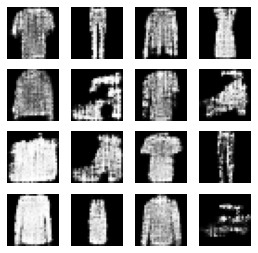

13800: [discriminator loss: 0.652539, acc: 0.632812] [adversarial loss: 0.639558, acc: 0.640625]
13801: [discriminator loss: 0.662060, acc: 0.617188] [adversarial loss: 0.857016, acc: 0.187500]
13802: [discriminator loss: 0.687853, acc: 0.523438] [adversarial loss: 0.652678, acc: 0.578125]
13803: [discriminator loss: 0.675493, acc: 0.562500] [adversarial loss: 0.875847, acc: 0.062500]
13804: [discriminator loss: 0.660416, acc: 0.625000] [adversarial loss: 0.676198, acc: 0.578125]
13805: [discriminator loss: 0.688310, acc: 0.523438] [adversarial loss: 0.983291, acc: 0.062500]
13806: [discriminator loss: 0.659459, acc: 0.554688] [adversarial loss: 0.600114, acc: 0.796875]
13807: [discriminator loss: 0.680323, acc: 0.570312] [adversarial loss: 0.914623, acc: 0.093750]
13808: [discriminator loss: 0.687500, acc: 0.539062] [adversarial loss: 0.626819, acc: 0.734375]
13809: [discriminator loss: 0.678075, acc: 0.578125] [adversarial loss: 0.857280, acc: 0.140625]
13810: [discriminator loss: 0.

13885: [discriminator loss: 0.649216, acc: 0.609375] [adversarial loss: 0.776063, acc: 0.281250]
13886: [discriminator loss: 0.686094, acc: 0.585938] [adversarial loss: 0.770892, acc: 0.406250]
13887: [discriminator loss: 0.664254, acc: 0.601562] [adversarial loss: 0.794000, acc: 0.312500]
13888: [discriminator loss: 0.660737, acc: 0.617188] [adversarial loss: 0.643844, acc: 0.687500]
13889: [discriminator loss: 0.674860, acc: 0.523438] [adversarial loss: 0.971626, acc: 0.015625]
13890: [discriminator loss: 0.697195, acc: 0.546875] [adversarial loss: 0.587966, acc: 0.875000]
13891: [discriminator loss: 0.655927, acc: 0.570312] [adversarial loss: 0.792820, acc: 0.296875]
13892: [discriminator loss: 0.652532, acc: 0.640625] [adversarial loss: 0.719202, acc: 0.453125]
13893: [discriminator loss: 0.684866, acc: 0.554688] [adversarial loss: 0.837803, acc: 0.171875]
13894: [discriminator loss: 0.677970, acc: 0.609375] [adversarial loss: 0.611701, acc: 0.750000]
13895: [discriminator loss: 0.

13974: [discriminator loss: 0.661752, acc: 0.625000] [adversarial loss: 0.739337, acc: 0.390625]
13975: [discriminator loss: 0.670283, acc: 0.570312] [adversarial loss: 0.852631, acc: 0.140625]
13976: [discriminator loss: 0.654079, acc: 0.671875] [adversarial loss: 0.623076, acc: 0.765625]
13977: [discriminator loss: 0.653609, acc: 0.593750] [adversarial loss: 0.996250, acc: 0.015625]
13978: [discriminator loss: 0.709585, acc: 0.523438] [adversarial loss: 0.610593, acc: 0.796875]
13979: [discriminator loss: 0.657704, acc: 0.562500] [adversarial loss: 0.916135, acc: 0.046875]
13980: [discriminator loss: 0.682904, acc: 0.570312] [adversarial loss: 0.753243, acc: 0.390625]
13981: [discriminator loss: 0.672278, acc: 0.585938] [adversarial loss: 0.843551, acc: 0.250000]
13982: [discriminator loss: 0.670641, acc: 0.570312] [adversarial loss: 0.751704, acc: 0.312500]
13983: [discriminator loss: 0.647429, acc: 0.679688] [adversarial loss: 0.854789, acc: 0.156250]
13984: [discriminator loss: 0.

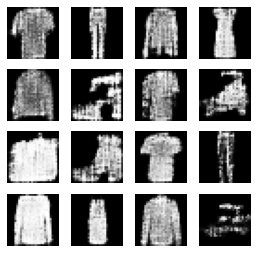

14000: [discriminator loss: 0.669726, acc: 0.546875] [adversarial loss: 0.944380, acc: 0.015625]
14001: [discriminator loss: 0.677465, acc: 0.562500] [adversarial loss: 0.627143, acc: 0.703125]
14002: [discriminator loss: 0.663687, acc: 0.578125] [adversarial loss: 0.801938, acc: 0.281250]
14003: [discriminator loss: 0.647390, acc: 0.585938] [adversarial loss: 0.745729, acc: 0.453125]
14004: [discriminator loss: 0.680510, acc: 0.515625] [adversarial loss: 0.816297, acc: 0.250000]
14005: [discriminator loss: 0.669801, acc: 0.562500] [adversarial loss: 0.703101, acc: 0.515625]
14006: [discriminator loss: 0.671964, acc: 0.578125] [adversarial loss: 0.900778, acc: 0.093750]
14007: [discriminator loss: 0.695411, acc: 0.539062] [adversarial loss: 0.661649, acc: 0.593750]
14008: [discriminator loss: 0.658918, acc: 0.609375] [adversarial loss: 0.846860, acc: 0.140625]
14009: [discriminator loss: 0.656623, acc: 0.609375] [adversarial loss: 0.710073, acc: 0.500000]
14010: [discriminator loss: 0.

14088: [discriminator loss: 0.663305, acc: 0.585938] [adversarial loss: 0.823043, acc: 0.218750]
14089: [discriminator loss: 0.667307, acc: 0.656250] [adversarial loss: 0.616054, acc: 0.781250]
14090: [discriminator loss: 0.680891, acc: 0.515625] [adversarial loss: 0.921319, acc: 0.062500]
14091: [discriminator loss: 0.677425, acc: 0.531250] [adversarial loss: 0.673540, acc: 0.531250]
14092: [discriminator loss: 0.645756, acc: 0.664062] [adversarial loss: 0.821761, acc: 0.218750]
14093: [discriminator loss: 0.667805, acc: 0.578125] [adversarial loss: 0.782635, acc: 0.312500]
14094: [discriminator loss: 0.678840, acc: 0.593750] [adversarial loss: 0.643717, acc: 0.625000]
14095: [discriminator loss: 0.658086, acc: 0.609375] [adversarial loss: 0.901463, acc: 0.109375]
14096: [discriminator loss: 0.672762, acc: 0.578125] [adversarial loss: 0.716151, acc: 0.453125]
14097: [discriminator loss: 0.651610, acc: 0.585938] [adversarial loss: 0.712560, acc: 0.453125]
14098: [discriminator loss: 0.

14178: [discriminator loss: 0.645193, acc: 0.593750] [adversarial loss: 0.622978, acc: 0.656250]
14179: [discriminator loss: 0.665335, acc: 0.554688] [adversarial loss: 0.838852, acc: 0.234375]
14180: [discriminator loss: 0.645895, acc: 0.601562] [adversarial loss: 0.731819, acc: 0.359375]
14181: [discriminator loss: 0.662989, acc: 0.593750] [adversarial loss: 0.795278, acc: 0.328125]
14182: [discriminator loss: 0.702227, acc: 0.515625] [adversarial loss: 0.678961, acc: 0.500000]
14183: [discriminator loss: 0.655000, acc: 0.679688] [adversarial loss: 0.829949, acc: 0.218750]
14184: [discriminator loss: 0.668845, acc: 0.593750] [adversarial loss: 0.650583, acc: 0.625000]
14185: [discriminator loss: 0.645791, acc: 0.640625] [adversarial loss: 0.854706, acc: 0.171875]
14186: [discriminator loss: 0.659415, acc: 0.585938] [adversarial loss: 0.677269, acc: 0.578125]
14187: [discriminator loss: 0.651480, acc: 0.601562] [adversarial loss: 0.835382, acc: 0.281250]
14188: [discriminator loss: 0.

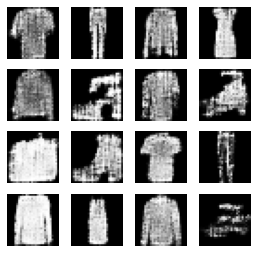

14200: [discriminator loss: 0.643901, acc: 0.632812] [adversarial loss: 0.756149, acc: 0.296875]
14201: [discriminator loss: 0.681796, acc: 0.578125] [adversarial loss: 0.684259, acc: 0.562500]
14202: [discriminator loss: 0.654830, acc: 0.625000] [adversarial loss: 0.787639, acc: 0.187500]
14203: [discriminator loss: 0.676533, acc: 0.578125] [adversarial loss: 0.636058, acc: 0.718750]
14204: [discriminator loss: 0.682573, acc: 0.500000] [adversarial loss: 0.851662, acc: 0.203125]
14205: [discriminator loss: 0.670605, acc: 0.578125] [adversarial loss: 0.598333, acc: 0.812500]
14206: [discriminator loss: 0.668441, acc: 0.515625] [adversarial loss: 0.871883, acc: 0.156250]
14207: [discriminator loss: 0.670707, acc: 0.593750] [adversarial loss: 0.707864, acc: 0.515625]
14208: [discriminator loss: 0.660538, acc: 0.531250] [adversarial loss: 0.814066, acc: 0.125000]
14209: [discriminator loss: 0.658917, acc: 0.640625] [adversarial loss: 0.731728, acc: 0.437500]
14210: [discriminator loss: 0.

14289: [discriminator loss: 0.678911, acc: 0.585938] [adversarial loss: 0.588787, acc: 0.843750]
14290: [discriminator loss: 0.671703, acc: 0.523438] [adversarial loss: 0.871845, acc: 0.093750]
14291: [discriminator loss: 0.685148, acc: 0.546875] [adversarial loss: 0.637674, acc: 0.687500]
14292: [discriminator loss: 0.684714, acc: 0.531250] [adversarial loss: 0.882393, acc: 0.031250]
14293: [discriminator loss: 0.676239, acc: 0.578125] [adversarial loss: 0.678273, acc: 0.593750]
14294: [discriminator loss: 0.689730, acc: 0.515625] [adversarial loss: 0.902795, acc: 0.109375]
14295: [discriminator loss: 0.675730, acc: 0.546875] [adversarial loss: 0.672710, acc: 0.546875]
14296: [discriminator loss: 0.666151, acc: 0.632812] [adversarial loss: 0.747523, acc: 0.343750]
14297: [discriminator loss: 0.660872, acc: 0.617188] [adversarial loss: 0.755910, acc: 0.375000]
14298: [discriminator loss: 0.678401, acc: 0.578125] [adversarial loss: 0.731380, acc: 0.343750]
14299: [discriminator loss: 0.

14376: [discriminator loss: 0.666686, acc: 0.601562] [adversarial loss: 0.842066, acc: 0.109375]
14377: [discriminator loss: 0.669761, acc: 0.640625] [adversarial loss: 0.639606, acc: 0.656250]
14378: [discriminator loss: 0.674616, acc: 0.570312] [adversarial loss: 0.949785, acc: 0.046875]
14379: [discriminator loss: 0.674320, acc: 0.585938] [adversarial loss: 0.630247, acc: 0.750000]
14380: [discriminator loss: 0.654053, acc: 0.617188] [adversarial loss: 0.903190, acc: 0.031250]
14381: [discriminator loss: 0.676048, acc: 0.601562] [adversarial loss: 0.668899, acc: 0.578125]
14382: [discriminator loss: 0.674272, acc: 0.523438] [adversarial loss: 0.787314, acc: 0.250000]
14383: [discriminator loss: 0.658897, acc: 0.625000] [adversarial loss: 0.751265, acc: 0.343750]
14384: [discriminator loss: 0.650973, acc: 0.593750] [adversarial loss: 0.825109, acc: 0.171875]
14385: [discriminator loss: 0.651826, acc: 0.648438] [adversarial loss: 0.730347, acc: 0.453125]
14386: [discriminator loss: 0.

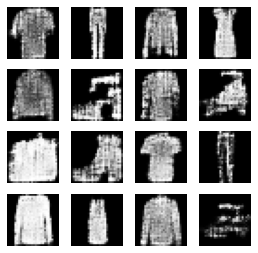

14400: [discriminator loss: 0.662528, acc: 0.609375] [adversarial loss: 0.754387, acc: 0.343750]
14401: [discriminator loss: 0.667705, acc: 0.593750] [adversarial loss: 0.759228, acc: 0.312500]
14402: [discriminator loss: 0.653598, acc: 0.656250] [adversarial loss: 0.701345, acc: 0.578125]
14403: [discriminator loss: 0.675998, acc: 0.539062] [adversarial loss: 0.805392, acc: 0.187500]
14404: [discriminator loss: 0.654068, acc: 0.648438] [adversarial loss: 0.669578, acc: 0.593750]
14405: [discriminator loss: 0.655941, acc: 0.601562] [adversarial loss: 0.715240, acc: 0.359375]
14406: [discriminator loss: 0.652538, acc: 0.656250] [adversarial loss: 0.674289, acc: 0.578125]
14407: [discriminator loss: 0.667348, acc: 0.554688] [adversarial loss: 0.844694, acc: 0.109375]
14408: [discriminator loss: 0.662309, acc: 0.578125] [adversarial loss: 0.587609, acc: 0.859375]
14409: [discriminator loss: 0.683467, acc: 0.523438] [adversarial loss: 0.926054, acc: 0.062500]
14410: [discriminator loss: 0.

14489: [discriminator loss: 0.644231, acc: 0.578125] [adversarial loss: 0.910152, acc: 0.031250]
14490: [discriminator loss: 0.678572, acc: 0.617188] [adversarial loss: 0.590761, acc: 0.843750]
14491: [discriminator loss: 0.660450, acc: 0.531250] [adversarial loss: 0.904297, acc: 0.000000]
14492: [discriminator loss: 0.669118, acc: 0.570312] [adversarial loss: 0.646777, acc: 0.671875]
14493: [discriminator loss: 0.684619, acc: 0.539062] [adversarial loss: 0.857877, acc: 0.234375]
14494: [discriminator loss: 0.659914, acc: 0.632812] [adversarial loss: 0.718010, acc: 0.468750]
14495: [discriminator loss: 0.652892, acc: 0.671875] [adversarial loss: 0.881354, acc: 0.062500]
14496: [discriminator loss: 0.663808, acc: 0.554688] [adversarial loss: 0.659042, acc: 0.656250]
14497: [discriminator loss: 0.660132, acc: 0.585938] [adversarial loss: 0.766003, acc: 0.343750]
14498: [discriminator loss: 0.660980, acc: 0.609375] [adversarial loss: 0.684545, acc: 0.515625]
14499: [discriminator loss: 0.

14578: [discriminator loss: 0.701060, acc: 0.492188] [adversarial loss: 0.641948, acc: 0.625000]
14579: [discriminator loss: 0.693092, acc: 0.476562] [adversarial loss: 0.859940, acc: 0.062500]
14580: [discriminator loss: 0.687618, acc: 0.570312] [adversarial loss: 0.827022, acc: 0.187500]
14581: [discriminator loss: 0.652291, acc: 0.609375] [adversarial loss: 0.685667, acc: 0.515625]
14582: [discriminator loss: 0.692846, acc: 0.585938] [adversarial loss: 0.890866, acc: 0.046875]
14583: [discriminator loss: 0.680457, acc: 0.554688] [adversarial loss: 0.667190, acc: 0.640625]
14584: [discriminator loss: 0.664724, acc: 0.546875] [adversarial loss: 0.783757, acc: 0.265625]
14585: [discriminator loss: 0.674397, acc: 0.570312] [adversarial loss: 0.774663, acc: 0.281250]
14586: [discriminator loss: 0.640426, acc: 0.648438] [adversarial loss: 0.773571, acc: 0.234375]
14587: [discriminator loss: 0.658045, acc: 0.640625] [adversarial loss: 0.654050, acc: 0.593750]
14588: [discriminator loss: 0.

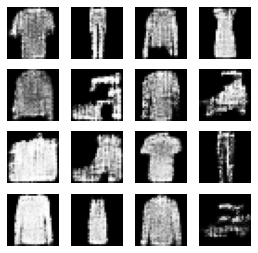

14600: [discriminator loss: 0.679148, acc: 0.554688] [adversarial loss: 0.854151, acc: 0.171875]
14601: [discriminator loss: 0.675144, acc: 0.585938] [adversarial loss: 0.709213, acc: 0.531250]
14602: [discriminator loss: 0.665543, acc: 0.601562] [adversarial loss: 0.813610, acc: 0.312500]
14603: [discriminator loss: 0.664573, acc: 0.609375] [adversarial loss: 0.703518, acc: 0.500000]
14604: [discriminator loss: 0.671190, acc: 0.546875] [adversarial loss: 0.862595, acc: 0.078125]
14605: [discriminator loss: 0.644976, acc: 0.671875] [adversarial loss: 0.710778, acc: 0.484375]
14606: [discriminator loss: 0.643107, acc: 0.671875] [adversarial loss: 0.870337, acc: 0.078125]
14607: [discriminator loss: 0.636388, acc: 0.664062] [adversarial loss: 0.707190, acc: 0.515625]
14608: [discriminator loss: 0.664060, acc: 0.578125] [adversarial loss: 0.821775, acc: 0.250000]
14609: [discriminator loss: 0.668105, acc: 0.593750] [adversarial loss: 0.719699, acc: 0.437500]
14610: [discriminator loss: 0.

14687: [discriminator loss: 0.672152, acc: 0.617188] [adversarial loss: 0.687952, acc: 0.625000]
14688: [discriminator loss: 0.664392, acc: 0.570312] [adversarial loss: 0.789478, acc: 0.234375]
14689: [discriminator loss: 0.653651, acc: 0.664062] [adversarial loss: 0.694261, acc: 0.578125]
14690: [discriminator loss: 0.631091, acc: 0.679688] [adversarial loss: 0.700285, acc: 0.515625]
14691: [discriminator loss: 0.667241, acc: 0.554688] [adversarial loss: 0.858200, acc: 0.171875]
14692: [discriminator loss: 0.687674, acc: 0.593750] [adversarial loss: 0.555090, acc: 0.890625]
14693: [discriminator loss: 0.675264, acc: 0.546875] [adversarial loss: 1.004417, acc: 0.015625]
14694: [discriminator loss: 0.677305, acc: 0.539062] [adversarial loss: 0.660227, acc: 0.625000]
14695: [discriminator loss: 0.686370, acc: 0.476562] [adversarial loss: 0.846760, acc: 0.203125]
14696: [discriminator loss: 0.691602, acc: 0.531250] [adversarial loss: 0.674014, acc: 0.531250]
14697: [discriminator loss: 0.

14772: [discriminator loss: 0.646372, acc: 0.679688] [adversarial loss: 0.848856, acc: 0.156250]
14773: [discriminator loss: 0.677215, acc: 0.585938] [adversarial loss: 0.643300, acc: 0.703125]
14774: [discriminator loss: 0.676717, acc: 0.570312] [adversarial loss: 0.894559, acc: 0.078125]
14775: [discriminator loss: 0.659337, acc: 0.609375] [adversarial loss: 0.586710, acc: 0.781250]
14776: [discriminator loss: 0.673862, acc: 0.539062] [adversarial loss: 0.903005, acc: 0.093750]
14777: [discriminator loss: 0.680826, acc: 0.531250] [adversarial loss: 0.661131, acc: 0.640625]
14778: [discriminator loss: 0.684375, acc: 0.476562] [adversarial loss: 0.929366, acc: 0.062500]
14779: [discriminator loss: 0.689606, acc: 0.523438] [adversarial loss: 0.695114, acc: 0.484375]
14780: [discriminator loss: 0.655745, acc: 0.609375] [adversarial loss: 0.779425, acc: 0.250000]
14781: [discriminator loss: 0.666048, acc: 0.601562] [adversarial loss: 0.760282, acc: 0.390625]
14782: [discriminator loss: 0.

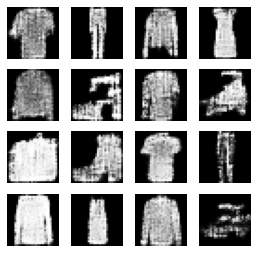

14800: [discriminator loss: 0.665638, acc: 0.578125] [adversarial loss: 0.694728, acc: 0.515625]
14801: [discriminator loss: 0.669336, acc: 0.585938] [adversarial loss: 0.987296, acc: 0.000000]
14802: [discriminator loss: 0.684065, acc: 0.562500] [adversarial loss: 0.560488, acc: 0.796875]
14803: [discriminator loss: 0.707431, acc: 0.515625] [adversarial loss: 0.886615, acc: 0.218750]
14804: [discriminator loss: 0.687882, acc: 0.546875] [adversarial loss: 0.706159, acc: 0.500000]
14805: [discriminator loss: 0.668315, acc: 0.617188] [adversarial loss: 0.770790, acc: 0.343750]
14806: [discriminator loss: 0.653902, acc: 0.601562] [adversarial loss: 0.749452, acc: 0.343750]
14807: [discriminator loss: 0.658555, acc: 0.640625] [adversarial loss: 0.780130, acc: 0.250000]
14808: [discriminator loss: 0.660913, acc: 0.632812] [adversarial loss: 0.761270, acc: 0.390625]
14809: [discriminator loss: 0.674546, acc: 0.554688] [adversarial loss: 0.630040, acc: 0.718750]
14810: [discriminator loss: 0.

14885: [discriminator loss: 0.671671, acc: 0.554688] [adversarial loss: 0.822826, acc: 0.250000]
14886: [discriminator loss: 0.664478, acc: 0.570312] [adversarial loss: 0.672021, acc: 0.609375]
14887: [discriminator loss: 0.658992, acc: 0.585938] [adversarial loss: 0.731145, acc: 0.343750]
14888: [discriminator loss: 0.660042, acc: 0.609375] [adversarial loss: 0.854071, acc: 0.125000]
14889: [discriminator loss: 0.656741, acc: 0.554688] [adversarial loss: 0.764604, acc: 0.359375]
14890: [discriminator loss: 0.638168, acc: 0.648438] [adversarial loss: 0.807107, acc: 0.203125]
14891: [discriminator loss: 0.675048, acc: 0.601562] [adversarial loss: 0.626479, acc: 0.765625]
14892: [discriminator loss: 0.656085, acc: 0.585938] [adversarial loss: 0.895809, acc: 0.046875]
14893: [discriminator loss: 0.682742, acc: 0.546875] [adversarial loss: 0.710888, acc: 0.484375]
14894: [discriminator loss: 0.634469, acc: 0.679688] [adversarial loss: 0.860949, acc: 0.187500]
14895: [discriminator loss: 0.

14970: [discriminator loss: 0.663038, acc: 0.570312] [adversarial loss: 0.869411, acc: 0.109375]
14971: [discriminator loss: 0.653020, acc: 0.640625] [adversarial loss: 0.663533, acc: 0.640625]
14972: [discriminator loss: 0.679298, acc: 0.523438] [adversarial loss: 0.816539, acc: 0.156250]
14973: [discriminator loss: 0.659005, acc: 0.640625] [adversarial loss: 0.663742, acc: 0.546875]
14974: [discriminator loss: 0.654481, acc: 0.585938] [adversarial loss: 0.776992, acc: 0.328125]
14975: [discriminator loss: 0.655753, acc: 0.625000] [adversarial loss: 0.792883, acc: 0.171875]
14976: [discriminator loss: 0.658267, acc: 0.625000] [adversarial loss: 0.721656, acc: 0.375000]
14977: [discriminator loss: 0.649612, acc: 0.671875] [adversarial loss: 0.699527, acc: 0.453125]
14978: [discriminator loss: 0.656521, acc: 0.625000] [adversarial loss: 0.848577, acc: 0.140625]
14979: [discriminator loss: 0.687174, acc: 0.578125] [adversarial loss: 0.576874, acc: 0.875000]
14980: [discriminator loss: 0.

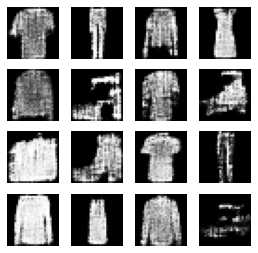

15000: [discriminator loss: 0.667340, acc: 0.585938] [adversarial loss: 0.611315, acc: 0.687500]
15001: [discriminator loss: 0.678068, acc: 0.601562] [adversarial loss: 0.937203, acc: 0.078125]
15002: [discriminator loss: 0.687138, acc: 0.570312] [adversarial loss: 0.630202, acc: 0.765625]
15003: [discriminator loss: 0.648223, acc: 0.523438] [adversarial loss: 0.909592, acc: 0.031250]
15004: [discriminator loss: 0.674011, acc: 0.570312] [adversarial loss: 0.650513, acc: 0.687500]
15005: [discriminator loss: 0.657866, acc: 0.617188] [adversarial loss: 0.801521, acc: 0.359375]
15006: [discriminator loss: 0.650036, acc: 0.632812] [adversarial loss: 0.727819, acc: 0.484375]
15007: [discriminator loss: 0.683565, acc: 0.523438] [adversarial loss: 0.866671, acc: 0.062500]
15008: [discriminator loss: 0.658548, acc: 0.585938] [adversarial loss: 0.703967, acc: 0.468750]
15009: [discriminator loss: 0.671933, acc: 0.546875] [adversarial loss: 0.748670, acc: 0.328125]
15010: [discriminator loss: 0.

15089: [discriminator loss: 0.669157, acc: 0.562500] [adversarial loss: 0.800892, acc: 0.250000]
15090: [discriminator loss: 0.674134, acc: 0.601562] [adversarial loss: 0.721774, acc: 0.421875]
15091: [discriminator loss: 0.664536, acc: 0.515625] [adversarial loss: 0.722874, acc: 0.375000]
15092: [discriminator loss: 0.666438, acc: 0.656250] [adversarial loss: 0.808268, acc: 0.234375]
15093: [discriminator loss: 0.666439, acc: 0.593750] [adversarial loss: 0.677469, acc: 0.531250]
15094: [discriminator loss: 0.660487, acc: 0.617188] [adversarial loss: 0.832448, acc: 0.109375]
15095: [discriminator loss: 0.659751, acc: 0.671875] [adversarial loss: 0.706522, acc: 0.500000]
15096: [discriminator loss: 0.640654, acc: 0.640625] [adversarial loss: 0.864564, acc: 0.078125]
15097: [discriminator loss: 0.656681, acc: 0.617188] [adversarial loss: 0.703790, acc: 0.515625]
15098: [discriminator loss: 0.663421, acc: 0.656250] [adversarial loss: 0.779259, acc: 0.281250]
15099: [discriminator loss: 0.

15174: [discriminator loss: 0.671532, acc: 0.570312] [adversarial loss: 0.983194, acc: 0.015625]
15175: [discriminator loss: 0.662052, acc: 0.585938] [adversarial loss: 0.653703, acc: 0.687500]
15176: [discriminator loss: 0.667267, acc: 0.515625] [adversarial loss: 0.837234, acc: 0.109375]
15177: [discriminator loss: 0.643798, acc: 0.617188] [adversarial loss: 0.766730, acc: 0.328125]
15178: [discriminator loss: 0.677401, acc: 0.570312] [adversarial loss: 0.759637, acc: 0.281250]
15179: [discriminator loss: 0.651375, acc: 0.640625] [adversarial loss: 0.692244, acc: 0.546875]
15180: [discriminator loss: 0.665544, acc: 0.578125] [adversarial loss: 0.748777, acc: 0.375000]
15181: [discriminator loss: 0.679997, acc: 0.570312] [adversarial loss: 0.775312, acc: 0.265625]
15182: [discriminator loss: 0.648083, acc: 0.664062] [adversarial loss: 0.722018, acc: 0.500000]
15183: [discriminator loss: 0.660413, acc: 0.609375] [adversarial loss: 0.724254, acc: 0.312500]
15184: [discriminator loss: 0.

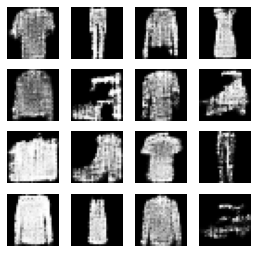

15200: [discriminator loss: 0.681047, acc: 0.578125] [adversarial loss: 0.859003, acc: 0.156250]
15201: [discriminator loss: 0.667469, acc: 0.554688] [adversarial loss: 0.646312, acc: 0.640625]
15202: [discriminator loss: 0.658019, acc: 0.593750] [adversarial loss: 0.865319, acc: 0.187500]
15203: [discriminator loss: 0.696087, acc: 0.531250] [adversarial loss: 0.602493, acc: 0.781250]
15204: [discriminator loss: 0.679401, acc: 0.546875] [adversarial loss: 0.762629, acc: 0.343750]
15205: [discriminator loss: 0.667187, acc: 0.648438] [adversarial loss: 0.755637, acc: 0.234375]
15206: [discriminator loss: 0.655165, acc: 0.656250] [adversarial loss: 0.630038, acc: 0.671875]
15207: [discriminator loss: 0.679381, acc: 0.531250] [adversarial loss: 0.845030, acc: 0.140625]
15208: [discriminator loss: 0.664977, acc: 0.585938] [adversarial loss: 0.692872, acc: 0.609375]
15209: [discriminator loss: 0.665298, acc: 0.578125] [adversarial loss: 0.793191, acc: 0.296875]
15210: [discriminator loss: 0.

15289: [discriminator loss: 0.662679, acc: 0.593750] [adversarial loss: 0.647373, acc: 0.562500]
15290: [discriminator loss: 0.667177, acc: 0.578125] [adversarial loss: 0.805244, acc: 0.281250]
15291: [discriminator loss: 0.667693, acc: 0.570312] [adversarial loss: 0.680991, acc: 0.640625]
15292: [discriminator loss: 0.651441, acc: 0.593750] [adversarial loss: 0.762749, acc: 0.265625]
15293: [discriminator loss: 0.682422, acc: 0.554688] [adversarial loss: 0.727303, acc: 0.406250]
15294: [discriminator loss: 0.676544, acc: 0.570312] [adversarial loss: 0.850867, acc: 0.265625]
15295: [discriminator loss: 0.659618, acc: 0.640625] [adversarial loss: 0.605155, acc: 0.750000]
15296: [discriminator loss: 0.679905, acc: 0.539062] [adversarial loss: 0.814699, acc: 0.203125]
15297: [discriminator loss: 0.660762, acc: 0.578125] [adversarial loss: 0.651434, acc: 0.625000]
15298: [discriminator loss: 0.676713, acc: 0.593750] [adversarial loss: 0.879203, acc: 0.109375]
15299: [discriminator loss: 0.

15376: [discriminator loss: 0.670759, acc: 0.593750] [adversarial loss: 0.762922, acc: 0.359375]
15377: [discriminator loss: 0.673775, acc: 0.593750] [adversarial loss: 0.661112, acc: 0.593750]
15378: [discriminator loss: 0.673641, acc: 0.632812] [adversarial loss: 0.915185, acc: 0.031250]
15379: [discriminator loss: 0.687935, acc: 0.531250] [adversarial loss: 0.578150, acc: 0.890625]
15380: [discriminator loss: 0.676414, acc: 0.546875] [adversarial loss: 0.785129, acc: 0.265625]
15381: [discriminator loss: 0.654087, acc: 0.625000] [adversarial loss: 0.800714, acc: 0.218750]
15382: [discriminator loss: 0.662530, acc: 0.625000] [adversarial loss: 0.625306, acc: 0.750000]
15383: [discriminator loss: 0.685800, acc: 0.523438] [adversarial loss: 0.897798, acc: 0.140625]
15384: [discriminator loss: 0.691348, acc: 0.562500] [adversarial loss: 0.620653, acc: 0.750000]
15385: [discriminator loss: 0.670081, acc: 0.546875] [adversarial loss: 0.829712, acc: 0.171875]
15386: [discriminator loss: 0.

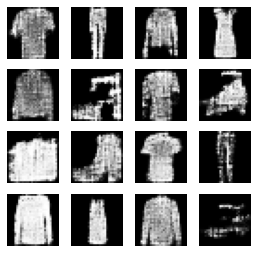

15400: [discriminator loss: 0.679727, acc: 0.554688] [adversarial loss: 0.739567, acc: 0.343750]
15401: [discriminator loss: 0.673907, acc: 0.570312] [adversarial loss: 0.761343, acc: 0.328125]
15402: [discriminator loss: 0.648559, acc: 0.656250] [adversarial loss: 0.730460, acc: 0.421875]
15403: [discriminator loss: 0.672510, acc: 0.578125] [adversarial loss: 0.804434, acc: 0.171875]
15404: [discriminator loss: 0.676204, acc: 0.625000] [adversarial loss: 0.696978, acc: 0.421875]
15405: [discriminator loss: 0.657534, acc: 0.593750] [adversarial loss: 0.770845, acc: 0.375000]
15406: [discriminator loss: 0.683176, acc: 0.578125] [adversarial loss: 0.663356, acc: 0.531250]
15407: [discriminator loss: 0.682948, acc: 0.546875] [adversarial loss: 0.866762, acc: 0.109375]
15408: [discriminator loss: 0.668721, acc: 0.578125] [adversarial loss: 0.773599, acc: 0.312500]
15409: [discriminator loss: 0.647340, acc: 0.656250] [adversarial loss: 0.792763, acc: 0.265625]
15410: [discriminator loss: 0.

15488: [discriminator loss: 0.656552, acc: 0.570312] [adversarial loss: 0.865589, acc: 0.250000]
15489: [discriminator loss: 0.654645, acc: 0.640625] [adversarial loss: 0.649631, acc: 0.609375]
15490: [discriminator loss: 0.652058, acc: 0.593750] [adversarial loss: 0.797594, acc: 0.312500]
15491: [discriminator loss: 0.654057, acc: 0.656250] [adversarial loss: 0.642326, acc: 0.609375]
15492: [discriminator loss: 0.673397, acc: 0.585938] [adversarial loss: 0.816642, acc: 0.187500]
15493: [discriminator loss: 0.658651, acc: 0.593750] [adversarial loss: 0.642389, acc: 0.687500]
15494: [discriminator loss: 0.667279, acc: 0.570312] [adversarial loss: 0.833842, acc: 0.203125]
15495: [discriminator loss: 0.656350, acc: 0.632812] [adversarial loss: 0.688692, acc: 0.500000]
15496: [discriminator loss: 0.676518, acc: 0.546875] [adversarial loss: 0.784571, acc: 0.218750]
15497: [discriminator loss: 0.675179, acc: 0.562500] [adversarial loss: 0.661354, acc: 0.734375]
15498: [discriminator loss: 0.

15574: [discriminator loss: 0.665643, acc: 0.601562] [adversarial loss: 0.667199, acc: 0.593750]
15575: [discriminator loss: 0.692526, acc: 0.523438] [adversarial loss: 0.922774, acc: 0.062500]
15576: [discriminator loss: 0.659800, acc: 0.609375] [adversarial loss: 0.670658, acc: 0.593750]
15577: [discriminator loss: 0.679686, acc: 0.523438] [adversarial loss: 0.899360, acc: 0.015625]
15578: [discriminator loss: 0.674204, acc: 0.585938] [adversarial loss: 0.742501, acc: 0.312500]
15579: [discriminator loss: 0.669766, acc: 0.617188] [adversarial loss: 0.792649, acc: 0.265625]
15580: [discriminator loss: 0.683026, acc: 0.562500] [adversarial loss: 0.746469, acc: 0.343750]
15581: [discriminator loss: 0.668723, acc: 0.601562] [adversarial loss: 0.721879, acc: 0.359375]
15582: [discriminator loss: 0.648368, acc: 0.648438] [adversarial loss: 0.788822, acc: 0.312500]
15583: [discriminator loss: 0.674206, acc: 0.609375] [adversarial loss: 0.627086, acc: 0.812500]
15584: [discriminator loss: 0.

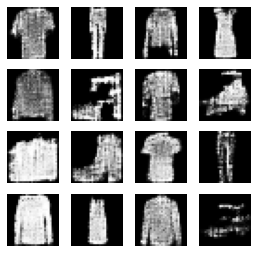

15600: [discriminator loss: 0.672660, acc: 0.585938] [adversarial loss: 0.677141, acc: 0.609375]
15601: [discriminator loss: 0.684560, acc: 0.539062] [adversarial loss: 0.856493, acc: 0.140625]
15602: [discriminator loss: 0.684146, acc: 0.546875] [adversarial loss: 0.607942, acc: 0.781250]
15603: [discriminator loss: 0.676382, acc: 0.562500] [adversarial loss: 0.910939, acc: 0.015625]
15604: [discriminator loss: 0.658375, acc: 0.625000] [adversarial loss: 0.711960, acc: 0.484375]
15605: [discriminator loss: 0.637857, acc: 0.656250] [adversarial loss: 0.777828, acc: 0.359375]
15606: [discriminator loss: 0.687555, acc: 0.570312] [adversarial loss: 0.651570, acc: 0.640625]
15607: [discriminator loss: 0.699211, acc: 0.476562] [adversarial loss: 0.873471, acc: 0.062500]
15608: [discriminator loss: 0.673475, acc: 0.593750] [adversarial loss: 0.620103, acc: 0.687500]
15609: [discriminator loss: 0.692375, acc: 0.554688] [adversarial loss: 0.845163, acc: 0.125000]
15610: [discriminator loss: 0.

15687: [discriminator loss: 0.660493, acc: 0.632812] [adversarial loss: 0.832033, acc: 0.156250]
15688: [discriminator loss: 0.653649, acc: 0.632812] [adversarial loss: 0.652521, acc: 0.593750]
15689: [discriminator loss: 0.687382, acc: 0.562500] [adversarial loss: 0.799106, acc: 0.281250]
15690: [discriminator loss: 0.670838, acc: 0.617188] [adversarial loss: 0.688624, acc: 0.546875]
15691: [discriminator loss: 0.663708, acc: 0.578125] [adversarial loss: 0.797624, acc: 0.156250]
15692: [discriminator loss: 0.656265, acc: 0.632812] [adversarial loss: 0.756035, acc: 0.359375]
15693: [discriminator loss: 0.657363, acc: 0.562500] [adversarial loss: 0.777683, acc: 0.296875]
15694: [discriminator loss: 0.661634, acc: 0.601562] [adversarial loss: 0.716444, acc: 0.453125]
15695: [discriminator loss: 0.646012, acc: 0.726562] [adversarial loss: 0.808733, acc: 0.265625]
15696: [discriminator loss: 0.678104, acc: 0.601562] [adversarial loss: 0.639105, acc: 0.687500]
15697: [discriminator loss: 0.

15773: [discriminator loss: 0.666737, acc: 0.507812] [adversarial loss: 0.967211, acc: 0.000000]
15774: [discriminator loss: 0.673360, acc: 0.570312] [adversarial loss: 0.590218, acc: 0.812500]
15775: [discriminator loss: 0.657542, acc: 0.539062] [adversarial loss: 0.971264, acc: 0.109375]
15776: [discriminator loss: 0.658042, acc: 0.585938] [adversarial loss: 0.651608, acc: 0.625000]
15777: [discriminator loss: 0.663346, acc: 0.625000] [adversarial loss: 0.851068, acc: 0.203125]
15778: [discriminator loss: 0.662472, acc: 0.601562] [adversarial loss: 0.652049, acc: 0.718750]
15779: [discriminator loss: 0.656625, acc: 0.640625] [adversarial loss: 0.926152, acc: 0.093750]
15780: [discriminator loss: 0.673134, acc: 0.578125] [adversarial loss: 0.660074, acc: 0.656250]
15781: [discriminator loss: 0.656541, acc: 0.546875] [adversarial loss: 0.870938, acc: 0.125000]
15782: [discriminator loss: 0.642382, acc: 0.664062] [adversarial loss: 0.710609, acc: 0.468750]
15783: [discriminator loss: 0.

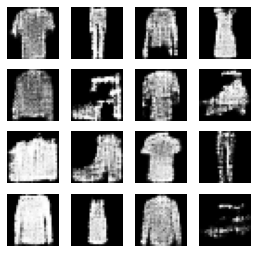

15800: [discriminator loss: 0.675858, acc: 0.484375] [adversarial loss: 0.834355, acc: 0.171875]
15801: [discriminator loss: 0.664496, acc: 0.585938] [adversarial loss: 0.739739, acc: 0.437500]
15802: [discriminator loss: 0.660601, acc: 0.609375] [adversarial loss: 0.705975, acc: 0.500000]
15803: [discriminator loss: 0.656370, acc: 0.648438] [adversarial loss: 0.804284, acc: 0.234375]
15804: [discriminator loss: 0.655141, acc: 0.625000] [adversarial loss: 0.678874, acc: 0.562500]
15805: [discriminator loss: 0.661832, acc: 0.539062] [adversarial loss: 0.855903, acc: 0.125000]
15806: [discriminator loss: 0.669061, acc: 0.617188] [adversarial loss: 0.714367, acc: 0.484375]
15807: [discriminator loss: 0.686376, acc: 0.570312] [adversarial loss: 0.799002, acc: 0.203125]
15808: [discriminator loss: 0.668661, acc: 0.609375] [adversarial loss: 0.632514, acc: 0.750000]
15809: [discriminator loss: 0.689167, acc: 0.531250] [adversarial loss: 0.910531, acc: 0.046875]
15810: [discriminator loss: 0.

15885: [discriminator loss: 0.677087, acc: 0.546875] [adversarial loss: 0.846013, acc: 0.140625]
15886: [discriminator loss: 0.660880, acc: 0.617188] [adversarial loss: 0.706217, acc: 0.546875]
15887: [discriminator loss: 0.661214, acc: 0.640625] [adversarial loss: 0.811031, acc: 0.140625]
15888: [discriminator loss: 0.655065, acc: 0.625000] [adversarial loss: 0.698530, acc: 0.578125]
15889: [discriminator loss: 0.655274, acc: 0.523438] [adversarial loss: 0.801912, acc: 0.218750]
15890: [discriminator loss: 0.672604, acc: 0.640625] [adversarial loss: 0.680834, acc: 0.500000]
15891: [discriminator loss: 0.667623, acc: 0.554688] [adversarial loss: 0.826317, acc: 0.312500]
15892: [discriminator loss: 0.645628, acc: 0.640625] [adversarial loss: 0.609873, acc: 0.687500]
15893: [discriminator loss: 0.689984, acc: 0.523438] [adversarial loss: 0.848617, acc: 0.171875]
15894: [discriminator loss: 0.662121, acc: 0.593750] [adversarial loss: 0.673840, acc: 0.484375]
15895: [discriminator loss: 0.

15971: [discriminator loss: 0.663791, acc: 0.601562] [adversarial loss: 0.634803, acc: 0.703125]
15972: [discriminator loss: 0.666936, acc: 0.562500] [adversarial loss: 0.831339, acc: 0.171875]
15973: [discriminator loss: 0.653965, acc: 0.625000] [adversarial loss: 0.696866, acc: 0.515625]
15974: [discriminator loss: 0.674922, acc: 0.515625] [adversarial loss: 0.763355, acc: 0.265625]
15975: [discriminator loss: 0.666342, acc: 0.546875] [adversarial loss: 0.778498, acc: 0.234375]
15976: [discriminator loss: 0.666701, acc: 0.585938] [adversarial loss: 0.671728, acc: 0.656250]
15977: [discriminator loss: 0.706756, acc: 0.476562] [adversarial loss: 0.851623, acc: 0.140625]
15978: [discriminator loss: 0.663586, acc: 0.617188] [adversarial loss: 0.714024, acc: 0.453125]
15979: [discriminator loss: 0.674540, acc: 0.570312] [adversarial loss: 0.667766, acc: 0.593750]
15980: [discriminator loss: 0.671720, acc: 0.585938] [adversarial loss: 0.676277, acc: 0.515625]
15981: [discriminator loss: 0.

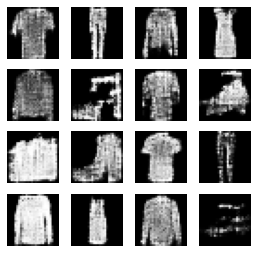

16000: [discriminator loss: 0.642728, acc: 0.671875] [adversarial loss: 0.649691, acc: 0.640625]
16001: [discriminator loss: 0.669224, acc: 0.554688] [adversarial loss: 0.873912, acc: 0.062500]
16002: [discriminator loss: 0.661016, acc: 0.656250] [adversarial loss: 0.592491, acc: 0.781250]
16003: [discriminator loss: 0.681124, acc: 0.500000] [adversarial loss: 0.856765, acc: 0.093750]
16004: [discriminator loss: 0.681443, acc: 0.601562] [adversarial loss: 0.729251, acc: 0.343750]
16005: [discriminator loss: 0.677256, acc: 0.585938] [adversarial loss: 0.691199, acc: 0.515625]
16006: [discriminator loss: 0.662623, acc: 0.632812] [adversarial loss: 0.814042, acc: 0.062500]
16007: [discriminator loss: 0.653318, acc: 0.585938] [adversarial loss: 0.628709, acc: 0.703125]
16008: [discriminator loss: 0.665300, acc: 0.539062] [adversarial loss: 0.884943, acc: 0.140625]
16009: [discriminator loss: 0.656254, acc: 0.609375] [adversarial loss: 0.722019, acc: 0.328125]
16010: [discriminator loss: 0.

16087: [discriminator loss: 0.659437, acc: 0.570312] [adversarial loss: 0.794096, acc: 0.265625]
16088: [discriminator loss: 0.657226, acc: 0.609375] [adversarial loss: 0.814429, acc: 0.234375]
16089: [discriminator loss: 0.656580, acc: 0.554688] [adversarial loss: 0.671541, acc: 0.531250]
16090: [discriminator loss: 0.685238, acc: 0.539062] [adversarial loss: 0.741175, acc: 0.375000]
16091: [discriminator loss: 0.679721, acc: 0.578125] [adversarial loss: 0.673967, acc: 0.593750]
16092: [discriminator loss: 0.662959, acc: 0.578125] [adversarial loss: 0.829132, acc: 0.203125]
16093: [discriminator loss: 0.702013, acc: 0.539062] [adversarial loss: 0.712339, acc: 0.593750]
16094: [discriminator loss: 0.678390, acc: 0.562500] [adversarial loss: 0.877045, acc: 0.062500]
16095: [discriminator loss: 0.667475, acc: 0.593750] [adversarial loss: 0.630135, acc: 0.781250]
16096: [discriminator loss: 0.691282, acc: 0.570312] [adversarial loss: 1.002937, acc: 0.015625]
16097: [discriminator loss: 0.

16175: [discriminator loss: 0.700292, acc: 0.492188] [adversarial loss: 0.957076, acc: 0.046875]
16176: [discriminator loss: 0.690363, acc: 0.546875] [adversarial loss: 0.640283, acc: 0.656250]
16177: [discriminator loss: 0.634060, acc: 0.648438] [adversarial loss: 0.827437, acc: 0.203125]
16178: [discriminator loss: 0.667049, acc: 0.601562] [adversarial loss: 0.736576, acc: 0.390625]
16179: [discriminator loss: 0.662637, acc: 0.585938] [adversarial loss: 0.764919, acc: 0.265625]
16180: [discriminator loss: 0.660219, acc: 0.609375] [adversarial loss: 0.819437, acc: 0.187500]
16181: [discriminator loss: 0.664765, acc: 0.617188] [adversarial loss: 0.758643, acc: 0.343750]
16182: [discriminator loss: 0.653305, acc: 0.625000] [adversarial loss: 0.823812, acc: 0.093750]
16183: [discriminator loss: 0.639389, acc: 0.664062] [adversarial loss: 0.735757, acc: 0.343750]
16184: [discriminator loss: 0.669753, acc: 0.593750] [adversarial loss: 0.871109, acc: 0.156250]
16185: [discriminator loss: 0.

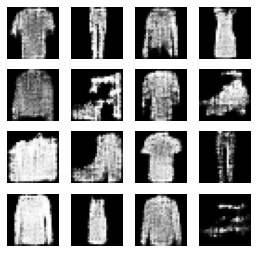

16200: [discriminator loss: 0.693178, acc: 0.562500] [adversarial loss: 0.611658, acc: 0.812500]
16201: [discriminator loss: 0.681962, acc: 0.562500] [adversarial loss: 0.810865, acc: 0.203125]
16202: [discriminator loss: 0.655747, acc: 0.632812] [adversarial loss: 0.797173, acc: 0.250000]
16203: [discriminator loss: 0.646402, acc: 0.664062] [adversarial loss: 0.740990, acc: 0.328125]
16204: [discriminator loss: 0.666538, acc: 0.609375] [adversarial loss: 0.785130, acc: 0.234375]
16205: [discriminator loss: 0.675395, acc: 0.609375] [adversarial loss: 0.751865, acc: 0.250000]
16206: [discriminator loss: 0.652097, acc: 0.632812] [adversarial loss: 0.782129, acc: 0.250000]
16207: [discriminator loss: 0.676027, acc: 0.585938] [adversarial loss: 0.650177, acc: 0.640625]
16208: [discriminator loss: 0.680003, acc: 0.546875] [adversarial loss: 0.860048, acc: 0.078125]
16209: [discriminator loss: 0.671967, acc: 0.570312] [adversarial loss: 0.639324, acc: 0.687500]
16210: [discriminator loss: 0.

16289: [discriminator loss: 0.643091, acc: 0.632812] [adversarial loss: 0.655144, acc: 0.515625]
16290: [discriminator loss: 0.673600, acc: 0.531250] [adversarial loss: 0.958065, acc: 0.062500]
16291: [discriminator loss: 0.673118, acc: 0.585938] [adversarial loss: 0.615230, acc: 0.640625]
16292: [discriminator loss: 0.679299, acc: 0.554688] [adversarial loss: 0.767560, acc: 0.265625]
16293: [discriminator loss: 0.684380, acc: 0.546875] [adversarial loss: 0.697541, acc: 0.484375]
16294: [discriminator loss: 0.645278, acc: 0.679688] [adversarial loss: 0.730554, acc: 0.437500]
16295: [discriminator loss: 0.657747, acc: 0.648438] [adversarial loss: 0.687403, acc: 0.484375]
16296: [discriminator loss: 0.660231, acc: 0.640625] [adversarial loss: 0.895931, acc: 0.109375]
16297: [discriminator loss: 0.650126, acc: 0.625000] [adversarial loss: 0.610828, acc: 0.734375]
16298: [discriminator loss: 0.679742, acc: 0.539062] [adversarial loss: 0.905771, acc: 0.078125]
16299: [discriminator loss: 0.

16374: [discriminator loss: 0.657874, acc: 0.531250] [adversarial loss: 0.934203, acc: 0.062500]
16375: [discriminator loss: 0.662508, acc: 0.601562] [adversarial loss: 0.739912, acc: 0.375000]
16376: [discriminator loss: 0.662993, acc: 0.585938] [adversarial loss: 0.729831, acc: 0.390625]
16377: [discriminator loss: 0.665428, acc: 0.585938] [adversarial loss: 0.840703, acc: 0.234375]
16378: [discriminator loss: 0.670067, acc: 0.601562] [adversarial loss: 0.654891, acc: 0.625000]
16379: [discriminator loss: 0.654077, acc: 0.609375] [adversarial loss: 0.737202, acc: 0.375000]
16380: [discriminator loss: 0.653516, acc: 0.625000] [adversarial loss: 0.775729, acc: 0.343750]
16381: [discriminator loss: 0.665215, acc: 0.562500] [adversarial loss: 0.663645, acc: 0.640625]
16382: [discriminator loss: 0.649183, acc: 0.593750] [adversarial loss: 0.776864, acc: 0.343750]
16383: [discriminator loss: 0.669268, acc: 0.554688] [adversarial loss: 0.702573, acc: 0.515625]
16384: [discriminator loss: 0.

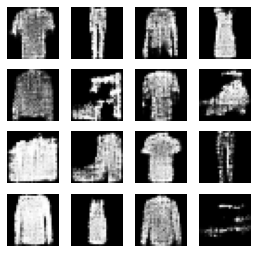

16400: [discriminator loss: 0.675626, acc: 0.515625] [adversarial loss: 0.758606, acc: 0.250000]
16401: [discriminator loss: 0.662852, acc: 0.601562] [adversarial loss: 0.744943, acc: 0.390625]
16402: [discriminator loss: 0.667080, acc: 0.578125] [adversarial loss: 0.752896, acc: 0.296875]
16403: [discriminator loss: 0.663878, acc: 0.546875] [adversarial loss: 0.876878, acc: 0.140625]
16404: [discriminator loss: 0.663187, acc: 0.601562] [adversarial loss: 0.625962, acc: 0.812500]
16405: [discriminator loss: 0.688375, acc: 0.492188] [adversarial loss: 0.811221, acc: 0.187500]
16406: [discriminator loss: 0.660625, acc: 0.601562] [adversarial loss: 0.691498, acc: 0.546875]
16407: [discriminator loss: 0.640650, acc: 0.656250] [adversarial loss: 0.780169, acc: 0.234375]
16408: [discriminator loss: 0.669681, acc: 0.625000] [adversarial loss: 0.657083, acc: 0.656250]
16409: [discriminator loss: 0.668045, acc: 0.601562] [adversarial loss: 0.807274, acc: 0.203125]
16410: [discriminator loss: 0.

16487: [discriminator loss: 0.678528, acc: 0.570312] [adversarial loss: 0.730932, acc: 0.593750]
16488: [discriminator loss: 0.681209, acc: 0.539062] [adversarial loss: 0.847365, acc: 0.078125]
16489: [discriminator loss: 0.651127, acc: 0.632812] [adversarial loss: 0.592521, acc: 0.765625]
16490: [discriminator loss: 0.691234, acc: 0.531250] [adversarial loss: 0.855452, acc: 0.140625]
16491: [discriminator loss: 0.666346, acc: 0.625000] [adversarial loss: 0.725039, acc: 0.390625]
16492: [discriminator loss: 0.654117, acc: 0.601562] [adversarial loss: 0.721978, acc: 0.453125]
16493: [discriminator loss: 0.666517, acc: 0.562500] [adversarial loss: 0.767181, acc: 0.328125]
16494: [discriminator loss: 0.674598, acc: 0.593750] [adversarial loss: 0.654125, acc: 0.671875]
16495: [discriminator loss: 0.657448, acc: 0.554688] [adversarial loss: 0.806510, acc: 0.234375]
16496: [discriminator loss: 0.643741, acc: 0.632812] [adversarial loss: 0.700237, acc: 0.421875]
16497: [discriminator loss: 0.

16575: [discriminator loss: 0.673482, acc: 0.601562] [adversarial loss: 0.749972, acc: 0.343750]
16576: [discriminator loss: 0.664113, acc: 0.601562] [adversarial loss: 0.735220, acc: 0.375000]
16577: [discriminator loss: 0.661175, acc: 0.601562] [adversarial loss: 0.728521, acc: 0.359375]
16578: [discriminator loss: 0.654530, acc: 0.656250] [adversarial loss: 0.688593, acc: 0.625000]
16579: [discriminator loss: 0.647454, acc: 0.640625] [adversarial loss: 0.734518, acc: 0.312500]
16580: [discriminator loss: 0.650859, acc: 0.640625] [adversarial loss: 0.672202, acc: 0.593750]
16581: [discriminator loss: 0.666710, acc: 0.562500] [adversarial loss: 0.796001, acc: 0.218750]
16582: [discriminator loss: 0.650674, acc: 0.632812] [adversarial loss: 0.696731, acc: 0.546875]
16583: [discriminator loss: 0.696694, acc: 0.539062] [adversarial loss: 0.939384, acc: 0.062500]
16584: [discriminator loss: 0.683029, acc: 0.585938] [adversarial loss: 0.644227, acc: 0.625000]
16585: [discriminator loss: 0.

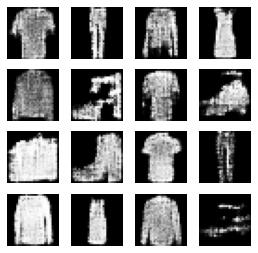

16600: [discriminator loss: 0.685850, acc: 0.562500] [adversarial loss: 0.694870, acc: 0.531250]
16601: [discriminator loss: 0.643517, acc: 0.664062] [adversarial loss: 0.864249, acc: 0.125000]
16602: [discriminator loss: 0.679926, acc: 0.578125] [adversarial loss: 0.625183, acc: 0.781250]
16603: [discriminator loss: 0.684794, acc: 0.539062] [adversarial loss: 0.819923, acc: 0.156250]
16604: [discriminator loss: 0.666625, acc: 0.601562] [adversarial loss: 0.736366, acc: 0.375000]
16605: [discriminator loss: 0.653019, acc: 0.625000] [adversarial loss: 0.713965, acc: 0.390625]
16606: [discriminator loss: 0.679823, acc: 0.523438] [adversarial loss: 0.795007, acc: 0.250000]
16607: [discriminator loss: 0.651717, acc: 0.578125] [adversarial loss: 0.716643, acc: 0.421875]
16608: [discriminator loss: 0.673129, acc: 0.539062] [adversarial loss: 0.685322, acc: 0.531250]
16609: [discriminator loss: 0.656260, acc: 0.640625] [adversarial loss: 0.731260, acc: 0.484375]
16610: [discriminator loss: 0.

16689: [discriminator loss: 0.666076, acc: 0.578125] [adversarial loss: 0.796343, acc: 0.281250]
16690: [discriminator loss: 0.657656, acc: 0.609375] [adversarial loss: 0.765990, acc: 0.312500]
16691: [discriminator loss: 0.666568, acc: 0.578125] [adversarial loss: 0.712056, acc: 0.437500]
16692: [discriminator loss: 0.675031, acc: 0.531250] [adversarial loss: 0.767199, acc: 0.218750]
16693: [discriminator loss: 0.664407, acc: 0.617188] [adversarial loss: 0.717746, acc: 0.343750]
16694: [discriminator loss: 0.656169, acc: 0.640625] [adversarial loss: 0.774181, acc: 0.328125]
16695: [discriminator loss: 0.698020, acc: 0.523438] [adversarial loss: 0.778728, acc: 0.312500]
16696: [discriminator loss: 0.666982, acc: 0.570312] [adversarial loss: 0.678325, acc: 0.515625]
16697: [discriminator loss: 0.647240, acc: 0.601562] [adversarial loss: 0.844323, acc: 0.171875]
16698: [discriminator loss: 0.698195, acc: 0.554688] [adversarial loss: 0.629079, acc: 0.703125]
16699: [discriminator loss: 0.

16778: [discriminator loss: 0.666837, acc: 0.570312] [adversarial loss: 0.888059, acc: 0.125000]
16779: [discriminator loss: 0.657222, acc: 0.562500] [adversarial loss: 0.611217, acc: 0.859375]
16780: [discriminator loss: 0.685067, acc: 0.585938] [adversarial loss: 0.964150, acc: 0.031250]
16781: [discriminator loss: 0.696490, acc: 0.523438] [adversarial loss: 0.597100, acc: 0.750000]
16782: [discriminator loss: 0.655340, acc: 0.562500] [adversarial loss: 0.805791, acc: 0.218750]
16783: [discriminator loss: 0.662047, acc: 0.609375] [adversarial loss: 0.664394, acc: 0.578125]
16784: [discriminator loss: 0.692606, acc: 0.539062] [adversarial loss: 0.811880, acc: 0.296875]
16785: [discriminator loss: 0.636675, acc: 0.640625] [adversarial loss: 0.729447, acc: 0.468750]
16786: [discriminator loss: 0.690552, acc: 0.546875] [adversarial loss: 0.698069, acc: 0.500000]
16787: [discriminator loss: 0.675612, acc: 0.585938] [adversarial loss: 0.752748, acc: 0.375000]
16788: [discriminator loss: 0.

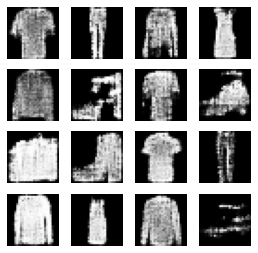

16800: [discriminator loss: 0.656746, acc: 0.617188] [adversarial loss: 0.857809, acc: 0.203125]
16801: [discriminator loss: 0.703010, acc: 0.507812] [adversarial loss: 0.729531, acc: 0.406250]
16802: [discriminator loss: 0.672556, acc: 0.531250] [adversarial loss: 0.718402, acc: 0.437500]
16803: [discriminator loss: 0.667341, acc: 0.601562] [adversarial loss: 0.873185, acc: 0.156250]
16804: [discriminator loss: 0.685479, acc: 0.554688] [adversarial loss: 0.632634, acc: 0.703125]
16805: [discriminator loss: 0.684823, acc: 0.492188] [adversarial loss: 0.811755, acc: 0.203125]
16806: [discriminator loss: 0.659952, acc: 0.625000] [adversarial loss: 0.640013, acc: 0.703125]
16807: [discriminator loss: 0.661641, acc: 0.562500] [adversarial loss: 0.785742, acc: 0.296875]
16808: [discriminator loss: 0.649740, acc: 0.617188] [adversarial loss: 0.615338, acc: 0.781250]
16809: [discriminator loss: 0.690353, acc: 0.539062] [adversarial loss: 0.911486, acc: 0.109375]
16810: [discriminator loss: 0.

16889: [discriminator loss: 0.663527, acc: 0.640625] [adversarial loss: 0.841348, acc: 0.187500]
16890: [discriminator loss: 0.653393, acc: 0.656250] [adversarial loss: 0.654443, acc: 0.671875]
16891: [discriminator loss: 0.666129, acc: 0.648438] [adversarial loss: 0.873344, acc: 0.046875]
16892: [discriminator loss: 0.627295, acc: 0.664062] [adversarial loss: 0.730738, acc: 0.390625]
16893: [discriminator loss: 0.675388, acc: 0.484375] [adversarial loss: 0.835162, acc: 0.187500]
16894: [discriminator loss: 0.656448, acc: 0.656250] [adversarial loss: 0.695911, acc: 0.531250]
16895: [discriminator loss: 0.651444, acc: 0.617188] [adversarial loss: 0.868141, acc: 0.171875]
16896: [discriminator loss: 0.695683, acc: 0.554688] [adversarial loss: 0.567801, acc: 0.843750]
16897: [discriminator loss: 0.678601, acc: 0.523438] [adversarial loss: 0.823851, acc: 0.250000]
16898: [discriminator loss: 0.661243, acc: 0.609375] [adversarial loss: 0.771596, acc: 0.296875]
16899: [discriminator loss: 0.

16978: [discriminator loss: 0.681246, acc: 0.515625] [adversarial loss: 0.767852, acc: 0.281250]
16979: [discriminator loss: 0.658667, acc: 0.632812] [adversarial loss: 0.652178, acc: 0.640625]
16980: [discriminator loss: 0.675336, acc: 0.562500] [adversarial loss: 0.844003, acc: 0.140625]
16981: [discriminator loss: 0.677673, acc: 0.554688] [adversarial loss: 0.689222, acc: 0.531250]
16982: [discriminator loss: 0.670693, acc: 0.593750] [adversarial loss: 0.940010, acc: 0.062500]
16983: [discriminator loss: 0.723232, acc: 0.492188] [adversarial loss: 0.580380, acc: 0.906250]
16984: [discriminator loss: 0.699580, acc: 0.492188] [adversarial loss: 0.897424, acc: 0.125000]
16985: [discriminator loss: 0.655661, acc: 0.632812] [adversarial loss: 0.638119, acc: 0.609375]
16986: [discriminator loss: 0.688138, acc: 0.578125] [adversarial loss: 0.766147, acc: 0.328125]
16987: [discriminator loss: 0.651260, acc: 0.648438] [adversarial loss: 0.740679, acc: 0.359375]
16988: [discriminator loss: 0.

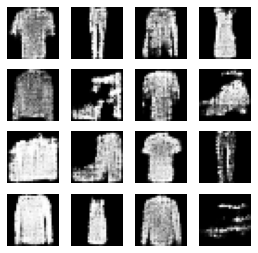

17000: [discriminator loss: 0.678847, acc: 0.554688] [adversarial loss: 0.631444, acc: 0.781250]
17001: [discriminator loss: 0.664029, acc: 0.562500] [adversarial loss: 0.773808, acc: 0.296875]
17002: [discriminator loss: 0.670258, acc: 0.609375] [adversarial loss: 0.732895, acc: 0.359375]
17003: [discriminator loss: 0.665498, acc: 0.640625] [adversarial loss: 0.772670, acc: 0.296875]
17004: [discriminator loss: 0.668727, acc: 0.593750] [adversarial loss: 0.705861, acc: 0.484375]
17005: [discriminator loss: 0.667622, acc: 0.585938] [adversarial loss: 0.889224, acc: 0.140625]
17006: [discriminator loss: 0.693459, acc: 0.523438] [adversarial loss: 0.680437, acc: 0.500000]
17007: [discriminator loss: 0.646167, acc: 0.625000] [adversarial loss: 0.805867, acc: 0.250000]
17008: [discriminator loss: 0.660867, acc: 0.617188] [adversarial loss: 0.656071, acc: 0.593750]
17009: [discriminator loss: 0.669971, acc: 0.585938] [adversarial loss: 0.808625, acc: 0.218750]
17010: [discriminator loss: 0.

17088: [discriminator loss: 0.646307, acc: 0.679688] [adversarial loss: 0.742894, acc: 0.421875]
17089: [discriminator loss: 0.647247, acc: 0.656250] [adversarial loss: 0.673073, acc: 0.562500]
17090: [discriminator loss: 0.660985, acc: 0.601562] [adversarial loss: 0.828475, acc: 0.156250]
17091: [discriminator loss: 0.689574, acc: 0.593750] [adversarial loss: 0.734019, acc: 0.375000]
17092: [discriminator loss: 0.666071, acc: 0.578125] [adversarial loss: 0.709326, acc: 0.421875]
17093: [discriminator loss: 0.640733, acc: 0.664062] [adversarial loss: 0.831622, acc: 0.203125]
17094: [discriminator loss: 0.635597, acc: 0.664062] [adversarial loss: 0.649794, acc: 0.703125]
17095: [discriminator loss: 0.653198, acc: 0.609375] [adversarial loss: 0.920497, acc: 0.109375]
17096: [discriminator loss: 0.665061, acc: 0.593750] [adversarial loss: 0.636987, acc: 0.656250]
17097: [discriminator loss: 0.693653, acc: 0.523438] [adversarial loss: 0.807463, acc: 0.203125]
17098: [discriminator loss: 0.

17174: [discriminator loss: 0.659636, acc: 0.671875] [adversarial loss: 0.695387, acc: 0.437500]
17175: [discriminator loss: 0.663735, acc: 0.601562] [adversarial loss: 0.717872, acc: 0.406250]
17176: [discriminator loss: 0.664316, acc: 0.640625] [adversarial loss: 0.748298, acc: 0.296875]
17177: [discriminator loss: 0.650540, acc: 0.656250] [adversarial loss: 0.735690, acc: 0.390625]
17178: [discriminator loss: 0.657327, acc: 0.601562] [adversarial loss: 0.712098, acc: 0.500000]
17179: [discriminator loss: 0.679222, acc: 0.546875] [adversarial loss: 0.761891, acc: 0.390625]
17180: [discriminator loss: 0.658154, acc: 0.601562] [adversarial loss: 0.640427, acc: 0.625000]
17181: [discriminator loss: 0.661552, acc: 0.570312] [adversarial loss: 0.852350, acc: 0.234375]
17182: [discriminator loss: 0.657949, acc: 0.625000] [adversarial loss: 0.704743, acc: 0.484375]
17183: [discriminator loss: 0.657790, acc: 0.593750] [adversarial loss: 0.796488, acc: 0.203125]
17184: [discriminator loss: 0.

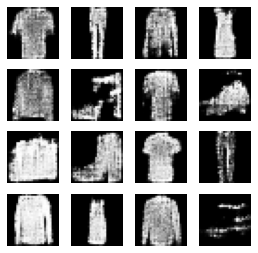

17200: [discriminator loss: 0.678360, acc: 0.593750] [adversarial loss: 0.633851, acc: 0.703125]
17201: [discriminator loss: 0.674407, acc: 0.554688] [adversarial loss: 0.955387, acc: 0.046875]
17202: [discriminator loss: 0.667214, acc: 0.570312] [adversarial loss: 0.716145, acc: 0.500000]
17203: [discriminator loss: 0.675866, acc: 0.554688] [adversarial loss: 0.776630, acc: 0.234375]
17204: [discriminator loss: 0.659263, acc: 0.601562] [adversarial loss: 0.695649, acc: 0.484375]
17205: [discriminator loss: 0.667970, acc: 0.601562] [adversarial loss: 0.740737, acc: 0.453125]
17206: [discriminator loss: 0.670343, acc: 0.593750] [adversarial loss: 0.721164, acc: 0.375000]
17207: [discriminator loss: 0.645385, acc: 0.671875] [adversarial loss: 0.800604, acc: 0.328125]
17208: [discriminator loss: 0.628050, acc: 0.687500] [adversarial loss: 0.663507, acc: 0.562500]
17209: [discriminator loss: 0.690092, acc: 0.546875] [adversarial loss: 0.765956, acc: 0.296875]
17210: [discriminator loss: 0.

17289: [discriminator loss: 0.680552, acc: 0.562500] [adversarial loss: 0.739072, acc: 0.328125]
17290: [discriminator loss: 0.656452, acc: 0.578125] [adversarial loss: 0.770398, acc: 0.281250]
17291: [discriminator loss: 0.658951, acc: 0.640625] [adversarial loss: 0.674172, acc: 0.625000]
17292: [discriminator loss: 0.667250, acc: 0.570312] [adversarial loss: 0.820519, acc: 0.109375]
17293: [discriminator loss: 0.671259, acc: 0.601562] [adversarial loss: 0.680400, acc: 0.515625]
17294: [discriminator loss: 0.679648, acc: 0.554688] [adversarial loss: 0.833852, acc: 0.296875]
17295: [discriminator loss: 0.685195, acc: 0.585938] [adversarial loss: 0.628013, acc: 0.671875]
17296: [discriminator loss: 0.677002, acc: 0.554688] [adversarial loss: 0.874097, acc: 0.125000]
17297: [discriminator loss: 0.672321, acc: 0.531250] [adversarial loss: 0.569003, acc: 0.843750]
17298: [discriminator loss: 0.685145, acc: 0.531250] [adversarial loss: 0.809932, acc: 0.281250]
17299: [discriminator loss: 0.

17374: [discriminator loss: 0.647809, acc: 0.664062] [adversarial loss: 0.824311, acc: 0.218750]
17375: [discriminator loss: 0.665342, acc: 0.578125] [adversarial loss: 0.701052, acc: 0.468750]
17376: [discriminator loss: 0.680012, acc: 0.578125] [adversarial loss: 0.864023, acc: 0.062500]
17377: [discriminator loss: 0.665030, acc: 0.585938] [adversarial loss: 0.615117, acc: 0.703125]
17378: [discriminator loss: 0.657923, acc: 0.585938] [adversarial loss: 0.858829, acc: 0.140625]
17379: [discriminator loss: 0.695993, acc: 0.546875] [adversarial loss: 0.564157, acc: 0.937500]
17380: [discriminator loss: 0.697835, acc: 0.515625] [adversarial loss: 0.948090, acc: 0.046875]
17381: [discriminator loss: 0.687088, acc: 0.562500] [adversarial loss: 0.712834, acc: 0.453125]
17382: [discriminator loss: 0.684516, acc: 0.539062] [adversarial loss: 0.768946, acc: 0.359375]
17383: [discriminator loss: 0.663410, acc: 0.585938] [adversarial loss: 0.666278, acc: 0.546875]
17384: [discriminator loss: 0.

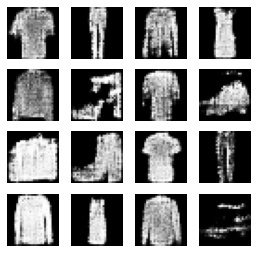

17400: [discriminator loss: 0.684678, acc: 0.539062] [adversarial loss: 0.663543, acc: 0.546875]
17401: [discriminator loss: 0.676103, acc: 0.585938] [adversarial loss: 0.892028, acc: 0.078125]
17402: [discriminator loss: 0.685509, acc: 0.578125] [adversarial loss: 0.668388, acc: 0.531250]
17403: [discriminator loss: 0.683282, acc: 0.578125] [adversarial loss: 0.845046, acc: 0.203125]
17404: [discriminator loss: 0.652445, acc: 0.601562] [adversarial loss: 0.576378, acc: 0.875000]
17405: [discriminator loss: 0.671914, acc: 0.570312] [adversarial loss: 0.828118, acc: 0.234375]
17406: [discriminator loss: 0.660487, acc: 0.593750] [adversarial loss: 0.702979, acc: 0.500000]
17407: [discriminator loss: 0.684187, acc: 0.492188] [adversarial loss: 0.684510, acc: 0.593750]
17408: [discriminator loss: 0.664859, acc: 0.562500] [adversarial loss: 0.687906, acc: 0.531250]
17409: [discriminator loss: 0.656509, acc: 0.562500] [adversarial loss: 0.854195, acc: 0.171875]
17410: [discriminator loss: 0.

17489: [discriminator loss: 0.649905, acc: 0.648438] [adversarial loss: 0.733330, acc: 0.390625]
17490: [discriminator loss: 0.693245, acc: 0.539062] [adversarial loss: 0.662512, acc: 0.671875]
17491: [discriminator loss: 0.699651, acc: 0.476562] [adversarial loss: 0.924766, acc: 0.140625]
17492: [discriminator loss: 0.683032, acc: 0.609375] [adversarial loss: 0.646252, acc: 0.656250]
17493: [discriminator loss: 0.658807, acc: 0.585938] [adversarial loss: 0.826262, acc: 0.187500]
17494: [discriminator loss: 0.661006, acc: 0.585938] [adversarial loss: 0.684059, acc: 0.578125]
17495: [discriminator loss: 0.645184, acc: 0.640625] [adversarial loss: 0.839836, acc: 0.187500]
17496: [discriminator loss: 0.664842, acc: 0.625000] [adversarial loss: 0.691999, acc: 0.500000]
17497: [discriminator loss: 0.673939, acc: 0.554688] [adversarial loss: 0.863442, acc: 0.234375]
17498: [discriminator loss: 0.697189, acc: 0.570312] [adversarial loss: 0.560554, acc: 0.875000]
17499: [discriminator loss: 0.

17576: [discriminator loss: 0.666513, acc: 0.570312] [adversarial loss: 0.759386, acc: 0.265625]
17577: [discriminator loss: 0.671851, acc: 0.617188] [adversarial loss: 0.793049, acc: 0.218750]
17578: [discriminator loss: 0.679520, acc: 0.570312] [adversarial loss: 0.733021, acc: 0.375000]
17579: [discriminator loss: 0.657504, acc: 0.593750] [adversarial loss: 0.747865, acc: 0.281250]
17580: [discriminator loss: 0.655847, acc: 0.593750] [adversarial loss: 0.722135, acc: 0.468750]
17581: [discriminator loss: 0.662546, acc: 0.601562] [adversarial loss: 0.763674, acc: 0.296875]
17582: [discriminator loss: 0.671503, acc: 0.609375] [adversarial loss: 0.725350, acc: 0.375000]
17583: [discriminator loss: 0.671709, acc: 0.578125] [adversarial loss: 0.725639, acc: 0.359375]
17584: [discriminator loss: 0.656079, acc: 0.625000] [adversarial loss: 0.959296, acc: 0.015625]
17585: [discriminator loss: 0.689746, acc: 0.531250] [adversarial loss: 0.582633, acc: 0.750000]
17586: [discriminator loss: 0.

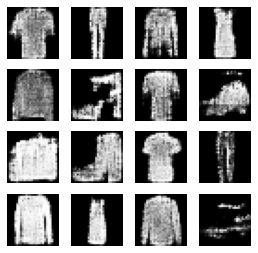

17600: [discriminator loss: 0.665318, acc: 0.585938] [adversarial loss: 0.679724, acc: 0.562500]
17601: [discriminator loss: 0.671253, acc: 0.546875] [adversarial loss: 0.759531, acc: 0.328125]
17602: [discriminator loss: 0.638703, acc: 0.656250] [adversarial loss: 0.667642, acc: 0.593750]
17603: [discriminator loss: 0.659654, acc: 0.539062] [adversarial loss: 0.876962, acc: 0.140625]
17604: [discriminator loss: 0.665351, acc: 0.593750] [adversarial loss: 0.635619, acc: 0.750000]
17605: [discriminator loss: 0.682582, acc: 0.500000] [adversarial loss: 0.859727, acc: 0.125000]
17606: [discriminator loss: 0.688620, acc: 0.570312] [adversarial loss: 0.715753, acc: 0.406250]
17607: [discriminator loss: 0.670425, acc: 0.585938] [adversarial loss: 0.750249, acc: 0.296875]
17608: [discriminator loss: 0.681327, acc: 0.531250] [adversarial loss: 0.750427, acc: 0.328125]
17609: [discriminator loss: 0.657001, acc: 0.601562] [adversarial loss: 0.805254, acc: 0.296875]
17610: [discriminator loss: 0.

17690: [discriminator loss: 0.681992, acc: 0.609375] [adversarial loss: 0.678321, acc: 0.609375]
17691: [discriminator loss: 0.684442, acc: 0.539062] [adversarial loss: 0.827761, acc: 0.140625]
17692: [discriminator loss: 0.679865, acc: 0.578125] [adversarial loss: 0.675096, acc: 0.484375]
17693: [discriminator loss: 0.674466, acc: 0.648438] [adversarial loss: 0.809573, acc: 0.203125]
17694: [discriminator loss: 0.664993, acc: 0.625000] [adversarial loss: 0.675304, acc: 0.562500]
17695: [discriminator loss: 0.665669, acc: 0.601562] [adversarial loss: 0.767819, acc: 0.343750]
17696: [discriminator loss: 0.664676, acc: 0.578125] [adversarial loss: 0.593447, acc: 0.796875]
17697: [discriminator loss: 0.687201, acc: 0.539062] [adversarial loss: 0.986047, acc: 0.015625]
17698: [discriminator loss: 0.686020, acc: 0.562500] [adversarial loss: 0.591105, acc: 0.843750]
17699: [discriminator loss: 0.674704, acc: 0.515625] [adversarial loss: 0.827003, acc: 0.156250]
17700: [discriminator loss: 0.

17777: [discriminator loss: 0.704095, acc: 0.531250] [adversarial loss: 0.793072, acc: 0.375000]
17778: [discriminator loss: 0.687676, acc: 0.585938] [adversarial loss: 0.725752, acc: 0.546875]
17779: [discriminator loss: 0.649267, acc: 0.593750] [adversarial loss: 0.738741, acc: 0.375000]
17780: [discriminator loss: 0.675211, acc: 0.593750] [adversarial loss: 0.700465, acc: 0.546875]
17781: [discriminator loss: 0.672226, acc: 0.570312] [adversarial loss: 0.736954, acc: 0.390625]
17782: [discriminator loss: 0.677818, acc: 0.562500] [adversarial loss: 0.721311, acc: 0.500000]
17783: [discriminator loss: 0.687272, acc: 0.539062] [adversarial loss: 0.820201, acc: 0.312500]
17784: [discriminator loss: 0.678133, acc: 0.562500] [adversarial loss: 0.658181, acc: 0.562500]
17785: [discriminator loss: 0.674062, acc: 0.562500] [adversarial loss: 0.827570, acc: 0.171875]
17786: [discriminator loss: 0.658060, acc: 0.601562] [adversarial loss: 0.653819, acc: 0.609375]
17787: [discriminator loss: 0.

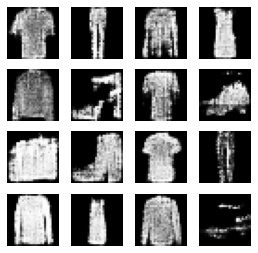

17800: [discriminator loss: 0.686391, acc: 0.570312] [adversarial loss: 0.812643, acc: 0.234375]
17801: [discriminator loss: 0.677833, acc: 0.593750] [adversarial loss: 0.686261, acc: 0.625000]
17802: [discriminator loss: 0.676047, acc: 0.484375] [adversarial loss: 0.876805, acc: 0.109375]
17803: [discriminator loss: 0.675375, acc: 0.546875] [adversarial loss: 0.566322, acc: 0.781250]
17804: [discriminator loss: 0.673785, acc: 0.562500] [adversarial loss: 0.785791, acc: 0.250000]
17805: [discriminator loss: 0.664867, acc: 0.609375] [adversarial loss: 0.660696, acc: 0.593750]
17806: [discriminator loss: 0.672238, acc: 0.507812] [adversarial loss: 0.691725, acc: 0.546875]
17807: [discriminator loss: 0.677313, acc: 0.539062] [adversarial loss: 0.761644, acc: 0.390625]
17808: [discriminator loss: 0.647788, acc: 0.648438] [adversarial loss: 0.723669, acc: 0.375000]
17809: [discriminator loss: 0.674203, acc: 0.601562] [adversarial loss: 0.807808, acc: 0.234375]
17810: [discriminator loss: 0.

17885: [discriminator loss: 0.664453, acc: 0.593750] [adversarial loss: 0.667920, acc: 0.515625]
17886: [discriminator loss: 0.688176, acc: 0.539062] [adversarial loss: 0.847801, acc: 0.109375]
17887: [discriminator loss: 0.671729, acc: 0.617188] [adversarial loss: 0.551865, acc: 0.875000]
17888: [discriminator loss: 0.681263, acc: 0.507812] [adversarial loss: 0.953872, acc: 0.015625]
17889: [discriminator loss: 0.679310, acc: 0.601562] [adversarial loss: 0.615489, acc: 0.687500]
17890: [discriminator loss: 0.677732, acc: 0.578125] [adversarial loss: 0.863753, acc: 0.140625]
17891: [discriminator loss: 0.652562, acc: 0.671875] [adversarial loss: 0.659711, acc: 0.562500]
17892: [discriminator loss: 0.663009, acc: 0.593750] [adversarial loss: 0.761382, acc: 0.312500]
17893: [discriminator loss: 0.678577, acc: 0.617188] [adversarial loss: 0.668109, acc: 0.578125]
17894: [discriminator loss: 0.664557, acc: 0.585938] [adversarial loss: 0.823714, acc: 0.296875]
17895: [discriminator loss: 0.

17971: [discriminator loss: 0.647509, acc: 0.601562] [adversarial loss: 0.827119, acc: 0.187500]
17972: [discriminator loss: 0.674703, acc: 0.570312] [adversarial loss: 0.609383, acc: 0.718750]
17973: [discriminator loss: 0.677514, acc: 0.609375] [adversarial loss: 0.930531, acc: 0.046875]
17974: [discriminator loss: 0.693564, acc: 0.546875] [adversarial loss: 0.586656, acc: 0.750000]
17975: [discriminator loss: 0.674952, acc: 0.562500] [adversarial loss: 0.749610, acc: 0.343750]
17976: [discriminator loss: 0.669358, acc: 0.578125] [adversarial loss: 0.700447, acc: 0.515625]
17977: [discriminator loss: 0.666073, acc: 0.617188] [adversarial loss: 0.853882, acc: 0.109375]
17978: [discriminator loss: 0.683153, acc: 0.562500] [adversarial loss: 0.616043, acc: 0.687500]
17979: [discriminator loss: 0.667708, acc: 0.609375] [adversarial loss: 0.864641, acc: 0.109375]
17980: [discriminator loss: 0.649570, acc: 0.656250] [adversarial loss: 0.699812, acc: 0.468750]
17981: [discriminator loss: 0.

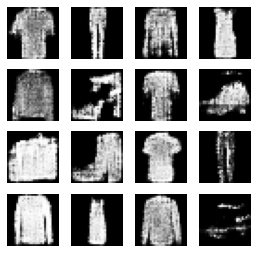

18000: [discriminator loss: 0.675381, acc: 0.593750] [adversarial loss: 0.803173, acc: 0.171875]
18001: [discriminator loss: 0.663210, acc: 0.601562] [adversarial loss: 0.747934, acc: 0.359375]
18002: [discriminator loss: 0.678456, acc: 0.562500] [adversarial loss: 0.772330, acc: 0.343750]
18003: [discriminator loss: 0.702583, acc: 0.523438] [adversarial loss: 0.742669, acc: 0.406250]
18004: [discriminator loss: 0.697310, acc: 0.554688] [adversarial loss: 0.732063, acc: 0.421875]
18005: [discriminator loss: 0.651622, acc: 0.601562] [adversarial loss: 0.745653, acc: 0.296875]
18006: [discriminator loss: 0.681920, acc: 0.554688] [adversarial loss: 0.682848, acc: 0.500000]
18007: [discriminator loss: 0.635152, acc: 0.640625] [adversarial loss: 0.777890, acc: 0.296875]
18008: [discriminator loss: 0.672171, acc: 0.601562] [adversarial loss: 0.631195, acc: 0.734375]
18009: [discriminator loss: 0.675073, acc: 0.531250] [adversarial loss: 0.864709, acc: 0.062500]
18010: [discriminator loss: 0.

18089: [discriminator loss: 0.679581, acc: 0.546875] [adversarial loss: 0.881901, acc: 0.140625]
18090: [discriminator loss: 0.689869, acc: 0.539062] [adversarial loss: 0.669101, acc: 0.640625]
18091: [discriminator loss: 0.692776, acc: 0.500000] [adversarial loss: 0.790494, acc: 0.125000]
18092: [discriminator loss: 0.638996, acc: 0.656250] [adversarial loss: 0.652793, acc: 0.578125]
18093: [discriminator loss: 0.672541, acc: 0.578125] [adversarial loss: 0.866816, acc: 0.156250]
18094: [discriminator loss: 0.685225, acc: 0.570312] [adversarial loss: 0.625826, acc: 0.812500]
18095: [discriminator loss: 0.673199, acc: 0.539062] [adversarial loss: 0.820338, acc: 0.156250]
18096: [discriminator loss: 0.682422, acc: 0.570312] [adversarial loss: 0.784822, acc: 0.296875]
18097: [discriminator loss: 0.647745, acc: 0.609375] [adversarial loss: 0.739640, acc: 0.375000]
18098: [discriminator loss: 0.667063, acc: 0.632812] [adversarial loss: 0.812661, acc: 0.156250]
18099: [discriminator loss: 0.

18174: [discriminator loss: 0.668615, acc: 0.554688] [adversarial loss: 0.756883, acc: 0.328125]
18175: [discriminator loss: 0.675418, acc: 0.601562] [adversarial loss: 0.752053, acc: 0.359375]
18176: [discriminator loss: 0.658844, acc: 0.632812] [adversarial loss: 0.795001, acc: 0.234375]
18177: [discriminator loss: 0.690523, acc: 0.554688] [adversarial loss: 0.821740, acc: 0.187500]
18178: [discriminator loss: 0.679825, acc: 0.539062] [adversarial loss: 0.649812, acc: 0.703125]
18179: [discriminator loss: 0.663913, acc: 0.585938] [adversarial loss: 0.800894, acc: 0.281250]
18180: [discriminator loss: 0.658568, acc: 0.625000] [adversarial loss: 0.772168, acc: 0.250000]
18181: [discriminator loss: 0.673301, acc: 0.593750] [adversarial loss: 0.675972, acc: 0.578125]
18182: [discriminator loss: 0.696560, acc: 0.515625] [adversarial loss: 0.763725, acc: 0.343750]
18183: [discriminator loss: 0.656718, acc: 0.656250] [adversarial loss: 0.660055, acc: 0.656250]
18184: [discriminator loss: 0.

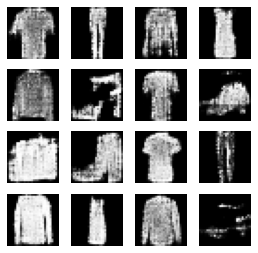

18200: [discriminator loss: 0.648929, acc: 0.617188] [adversarial loss: 0.702535, acc: 0.515625]
18201: [discriminator loss: 0.641855, acc: 0.648438] [adversarial loss: 0.761768, acc: 0.359375]
18202: [discriminator loss: 0.673549, acc: 0.554688] [adversarial loss: 0.677222, acc: 0.578125]
18203: [discriminator loss: 0.689703, acc: 0.515625] [adversarial loss: 0.770849, acc: 0.296875]
18204: [discriminator loss: 0.659862, acc: 0.617188] [adversarial loss: 0.697565, acc: 0.531250]
18205: [discriminator loss: 0.685561, acc: 0.562500] [adversarial loss: 0.720447, acc: 0.437500]
18206: [discriminator loss: 0.658551, acc: 0.671875] [adversarial loss: 0.799228, acc: 0.265625]
18207: [discriminator loss: 0.667218, acc: 0.546875] [adversarial loss: 0.615169, acc: 0.796875]
18208: [discriminator loss: 0.671300, acc: 0.554688] [adversarial loss: 0.870399, acc: 0.109375]
18209: [discriminator loss: 0.682580, acc: 0.546875] [adversarial loss: 0.592424, acc: 0.765625]
18210: [discriminator loss: 0.

18287: [discriminator loss: 0.654303, acc: 0.601562] [adversarial loss: 0.728968, acc: 0.421875]
18288: [discriminator loss: 0.657172, acc: 0.593750] [adversarial loss: 0.736181, acc: 0.375000]
18289: [discriminator loss: 0.658608, acc: 0.601562] [adversarial loss: 0.755599, acc: 0.375000]
18290: [discriminator loss: 0.668188, acc: 0.570312] [adversarial loss: 0.567245, acc: 0.796875]
18291: [discriminator loss: 0.674681, acc: 0.531250] [adversarial loss: 0.946203, acc: 0.062500]
18292: [discriminator loss: 0.678311, acc: 0.593750] [adversarial loss: 0.717793, acc: 0.437500]
18293: [discriminator loss: 0.647680, acc: 0.562500] [adversarial loss: 0.826463, acc: 0.171875]
18294: [discriminator loss: 0.667665, acc: 0.570312] [adversarial loss: 0.684274, acc: 0.500000]
18295: [discriminator loss: 0.683152, acc: 0.554688] [adversarial loss: 0.801148, acc: 0.156250]
18296: [discriminator loss: 0.646578, acc: 0.687500] [adversarial loss: 0.704262, acc: 0.500000]
18297: [discriminator loss: 0.

18372: [discriminator loss: 0.669937, acc: 0.578125] [adversarial loss: 0.876993, acc: 0.125000]
18373: [discriminator loss: 0.663905, acc: 0.625000] [adversarial loss: 0.584803, acc: 0.828125]
18374: [discriminator loss: 0.686645, acc: 0.539062] [adversarial loss: 0.885366, acc: 0.187500]
18375: [discriminator loss: 0.687357, acc: 0.539062] [adversarial loss: 0.612828, acc: 0.812500]
18376: [discriminator loss: 0.659836, acc: 0.562500] [adversarial loss: 0.845470, acc: 0.109375]
18377: [discriminator loss: 0.671103, acc: 0.609375] [adversarial loss: 0.671102, acc: 0.687500]
18378: [discriminator loss: 0.675871, acc: 0.523438] [adversarial loss: 0.808057, acc: 0.187500]
18379: [discriminator loss: 0.695987, acc: 0.515625] [adversarial loss: 0.640608, acc: 0.718750]
18380: [discriminator loss: 0.653756, acc: 0.578125] [adversarial loss: 0.784349, acc: 0.281250]
18381: [discriminator loss: 0.694133, acc: 0.562500] [adversarial loss: 0.682089, acc: 0.625000]
18382: [discriminator loss: 0.

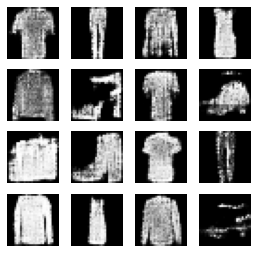

18400: [discriminator loss: 0.673422, acc: 0.531250] [adversarial loss: 0.789356, acc: 0.234375]
18401: [discriminator loss: 0.669049, acc: 0.601562] [adversarial loss: 0.606705, acc: 0.781250]
18402: [discriminator loss: 0.680066, acc: 0.539062] [adversarial loss: 0.835039, acc: 0.140625]
18403: [discriminator loss: 0.684479, acc: 0.578125] [adversarial loss: 0.680265, acc: 0.562500]
18404: [discriminator loss: 0.672294, acc: 0.562500] [adversarial loss: 0.799447, acc: 0.171875]
18405: [discriminator loss: 0.660781, acc: 0.632812] [adversarial loss: 0.684273, acc: 0.546875]
18406: [discriminator loss: 0.676439, acc: 0.554688] [adversarial loss: 0.702329, acc: 0.375000]
18407: [discriminator loss: 0.677326, acc: 0.585938] [adversarial loss: 0.846237, acc: 0.156250]
18408: [discriminator loss: 0.681251, acc: 0.609375] [adversarial loss: 0.690727, acc: 0.515625]
18409: [discriminator loss: 0.640515, acc: 0.679688] [adversarial loss: 0.713599, acc: 0.453125]
18410: [discriminator loss: 0.

18486: [discriminator loss: 0.696883, acc: 0.492188] [adversarial loss: 0.911568, acc: 0.031250]
18487: [discriminator loss: 0.655631, acc: 0.617188] [adversarial loss: 0.684823, acc: 0.531250]
18488: [discriminator loss: 0.655076, acc: 0.562500] [adversarial loss: 0.816912, acc: 0.187500]
18489: [discriminator loss: 0.685657, acc: 0.578125] [adversarial loss: 0.680934, acc: 0.562500]
18490: [discriminator loss: 0.673109, acc: 0.546875] [adversarial loss: 0.796755, acc: 0.296875]
18491: [discriminator loss: 0.663087, acc: 0.609375] [adversarial loss: 0.735232, acc: 0.406250]
18492: [discriminator loss: 0.664859, acc: 0.585938] [adversarial loss: 0.731286, acc: 0.359375]
18493: [discriminator loss: 0.684469, acc: 0.554688] [adversarial loss: 0.713743, acc: 0.500000]
18494: [discriminator loss: 0.691032, acc: 0.507812] [adversarial loss: 0.752280, acc: 0.296875]
18495: [discriminator loss: 0.648717, acc: 0.632812] [adversarial loss: 0.744624, acc: 0.375000]
18496: [discriminator loss: 0.

18575: [discriminator loss: 0.675027, acc: 0.617188] [adversarial loss: 0.673314, acc: 0.562500]
18576: [discriminator loss: 0.684031, acc: 0.531250] [adversarial loss: 0.830565, acc: 0.218750]
18577: [discriminator loss: 0.659848, acc: 0.625000] [adversarial loss: 0.642496, acc: 0.609375]
18578: [discriminator loss: 0.653150, acc: 0.601562] [adversarial loss: 0.847833, acc: 0.140625]
18579: [discriminator loss: 0.675592, acc: 0.585938] [adversarial loss: 0.672588, acc: 0.578125]
18580: [discriminator loss: 0.673530, acc: 0.570312] [adversarial loss: 0.759902, acc: 0.234375]
18581: [discriminator loss: 0.650290, acc: 0.632812] [adversarial loss: 0.549943, acc: 0.843750]
18582: [discriminator loss: 0.702160, acc: 0.515625] [adversarial loss: 0.840741, acc: 0.140625]
18583: [discriminator loss: 0.657059, acc: 0.617188] [adversarial loss: 0.694965, acc: 0.484375]
18584: [discriminator loss: 0.665939, acc: 0.609375] [adversarial loss: 0.821653, acc: 0.109375]
18585: [discriminator loss: 0.

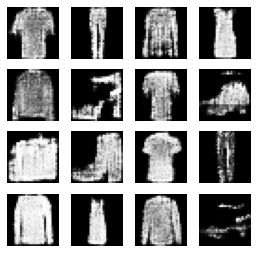

18600: [discriminator loss: 0.663051, acc: 0.601562] [adversarial loss: 0.751575, acc: 0.328125]
18601: [discriminator loss: 0.679193, acc: 0.570312] [adversarial loss: 0.763624, acc: 0.265625]
18602: [discriminator loss: 0.674585, acc: 0.570312] [adversarial loss: 0.617104, acc: 0.734375]
18603: [discriminator loss: 0.674255, acc: 0.578125] [adversarial loss: 0.969495, acc: 0.015625]
18604: [discriminator loss: 0.694247, acc: 0.562500] [adversarial loss: 0.651893, acc: 0.640625]
18605: [discriminator loss: 0.707845, acc: 0.484375] [adversarial loss: 0.848201, acc: 0.156250]
18606: [discriminator loss: 0.676573, acc: 0.546875] [adversarial loss: 0.636519, acc: 0.687500]
18607: [discriminator loss: 0.686256, acc: 0.546875] [adversarial loss: 0.780555, acc: 0.265625]
18608: [discriminator loss: 0.680676, acc: 0.632812] [adversarial loss: 0.695704, acc: 0.562500]
18609: [discriminator loss: 0.692858, acc: 0.570312] [adversarial loss: 0.712679, acc: 0.406250]
18610: [discriminator loss: 0.

18686: [discriminator loss: 0.687561, acc: 0.515625] [adversarial loss: 0.800862, acc: 0.281250]
18687: [discriminator loss: 0.697376, acc: 0.585938] [adversarial loss: 0.801635, acc: 0.218750]
18688: [discriminator loss: 0.658475, acc: 0.625000] [adversarial loss: 0.700160, acc: 0.515625]
18689: [discriminator loss: 0.654598, acc: 0.601562] [adversarial loss: 0.882062, acc: 0.140625]
18690: [discriminator loss: 0.678899, acc: 0.609375] [adversarial loss: 0.777273, acc: 0.390625]
18691: [discriminator loss: 0.658437, acc: 0.664062] [adversarial loss: 0.790948, acc: 0.281250]
18692: [discriminator loss: 0.675674, acc: 0.546875] [adversarial loss: 0.716207, acc: 0.453125]
18693: [discriminator loss: 0.658884, acc: 0.593750] [adversarial loss: 0.713985, acc: 0.421875]
18694: [discriminator loss: 0.694074, acc: 0.515625] [adversarial loss: 0.849917, acc: 0.156250]
18695: [discriminator loss: 0.662944, acc: 0.562500] [adversarial loss: 0.657134, acc: 0.640625]
18696: [discriminator loss: 0.

18773: [discriminator loss: 0.684679, acc: 0.562500] [adversarial loss: 0.630417, acc: 0.734375]
18774: [discriminator loss: 0.665454, acc: 0.601562] [adversarial loss: 0.825809, acc: 0.218750]
18775: [discriminator loss: 0.716676, acc: 0.492188] [adversarial loss: 0.783237, acc: 0.421875]
18776: [discriminator loss: 0.686564, acc: 0.570312] [adversarial loss: 0.864415, acc: 0.031250]
18777: [discriminator loss: 0.653105, acc: 0.671875] [adversarial loss: 0.677653, acc: 0.593750]
18778: [discriminator loss: 0.679139, acc: 0.578125] [adversarial loss: 0.841154, acc: 0.140625]
18779: [discriminator loss: 0.681629, acc: 0.601562] [adversarial loss: 0.673505, acc: 0.625000]
18780: [discriminator loss: 0.675569, acc: 0.492188] [adversarial loss: 0.844024, acc: 0.203125]
18781: [discriminator loss: 0.670936, acc: 0.585938] [adversarial loss: 0.683769, acc: 0.515625]
18782: [discriminator loss: 0.651047, acc: 0.648438] [adversarial loss: 0.846784, acc: 0.156250]
18783: [discriminator loss: 0.

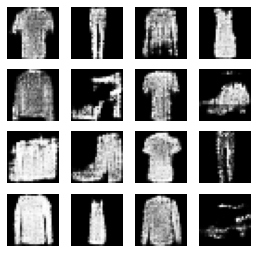

18800: [discriminator loss: 0.677438, acc: 0.570312] [adversarial loss: 0.669078, acc: 0.625000]
18801: [discriminator loss: 0.676438, acc: 0.523438] [adversarial loss: 0.742047, acc: 0.406250]
18802: [discriminator loss: 0.680064, acc: 0.578125] [adversarial loss: 0.708781, acc: 0.421875]
18803: [discriminator loss: 0.656395, acc: 0.578125] [adversarial loss: 0.790444, acc: 0.421875]
18804: [discriminator loss: 0.692537, acc: 0.562500] [adversarial loss: 0.692967, acc: 0.468750]
18805: [discriminator loss: 0.672337, acc: 0.578125] [adversarial loss: 0.690556, acc: 0.484375]
18806: [discriminator loss: 0.667420, acc: 0.601562] [adversarial loss: 0.760964, acc: 0.406250]
18807: [discriminator loss: 0.670200, acc: 0.546875] [adversarial loss: 0.727839, acc: 0.406250]
18808: [discriminator loss: 0.668471, acc: 0.617188] [adversarial loss: 0.762487, acc: 0.296875]
18809: [discriminator loss: 0.659862, acc: 0.671875] [adversarial loss: 0.800180, acc: 0.343750]
18810: [discriminator loss: 0.

18888: [discriminator loss: 0.665049, acc: 0.632812] [adversarial loss: 0.664462, acc: 0.546875]
18889: [discriminator loss: 0.645846, acc: 0.640625] [adversarial loss: 0.944613, acc: 0.093750]
18890: [discriminator loss: 0.694075, acc: 0.593750] [adversarial loss: 0.565678, acc: 0.843750]
18891: [discriminator loss: 0.704211, acc: 0.500000] [adversarial loss: 0.814786, acc: 0.171875]
18892: [discriminator loss: 0.670103, acc: 0.632812] [adversarial loss: 0.751733, acc: 0.312500]
18893: [discriminator loss: 0.683313, acc: 0.562500] [adversarial loss: 0.668702, acc: 0.578125]
18894: [discriminator loss: 0.680776, acc: 0.578125] [adversarial loss: 0.759729, acc: 0.234375]
18895: [discriminator loss: 0.672633, acc: 0.570312] [adversarial loss: 0.717358, acc: 0.421875]
18896: [discriminator loss: 0.638300, acc: 0.625000] [adversarial loss: 0.705724, acc: 0.484375]
18897: [discriminator loss: 0.670774, acc: 0.578125] [adversarial loss: 0.635814, acc: 0.703125]
18898: [discriminator loss: 0.

18975: [discriminator loss: 0.658425, acc: 0.539062] [adversarial loss: 0.725632, acc: 0.390625]
18976: [discriminator loss: 0.689207, acc: 0.539062] [adversarial loss: 0.785886, acc: 0.281250]
18977: [discriminator loss: 0.690911, acc: 0.523438] [adversarial loss: 0.654309, acc: 0.609375]
18978: [discriminator loss: 0.685470, acc: 0.539062] [adversarial loss: 0.828873, acc: 0.109375]
18979: [discriminator loss: 0.659813, acc: 0.632812] [adversarial loss: 0.673563, acc: 0.593750]
18980: [discriminator loss: 0.651350, acc: 0.625000] [adversarial loss: 0.739287, acc: 0.375000]
18981: [discriminator loss: 0.662635, acc: 0.593750] [adversarial loss: 0.740922, acc: 0.312500]
18982: [discriminator loss: 0.661145, acc: 0.609375] [adversarial loss: 0.662846, acc: 0.562500]
18983: [discriminator loss: 0.656246, acc: 0.617188] [adversarial loss: 0.757244, acc: 0.390625]
18984: [discriminator loss: 0.677368, acc: 0.640625] [adversarial loss: 0.744106, acc: 0.453125]
18985: [discriminator loss: 0.

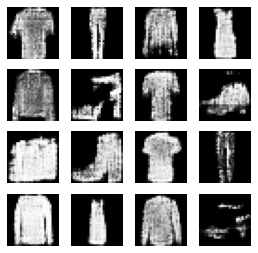

19000: [discriminator loss: 0.694017, acc: 0.460938] [adversarial loss: 0.874459, acc: 0.140625]
19001: [discriminator loss: 0.678176, acc: 0.593750] [adversarial loss: 0.714790, acc: 0.406250]
19002: [discriminator loss: 0.636203, acc: 0.625000] [adversarial loss: 0.741504, acc: 0.406250]
19003: [discriminator loss: 0.673527, acc: 0.585938] [adversarial loss: 0.767010, acc: 0.406250]
19004: [discriminator loss: 0.678953, acc: 0.546875] [adversarial loss: 0.684743, acc: 0.453125]
19005: [discriminator loss: 0.670717, acc: 0.593750] [adversarial loss: 0.718402, acc: 0.468750]
19006: [discriminator loss: 0.649347, acc: 0.640625] [adversarial loss: 0.808349, acc: 0.328125]
19007: [discriminator loss: 0.694203, acc: 0.554688] [adversarial loss: 0.689014, acc: 0.531250]
19008: [discriminator loss: 0.686093, acc: 0.554688] [adversarial loss: 0.689475, acc: 0.578125]
19009: [discriminator loss: 0.681092, acc: 0.570312] [adversarial loss: 0.753402, acc: 0.390625]
19010: [discriminator loss: 0.

19089: [discriminator loss: 0.691297, acc: 0.546875] [adversarial loss: 0.803134, acc: 0.250000]
19090: [discriminator loss: 0.685659, acc: 0.578125] [adversarial loss: 0.734293, acc: 0.421875]
19091: [discriminator loss: 0.663268, acc: 0.601562] [adversarial loss: 0.721923, acc: 0.437500]
19092: [discriminator loss: 0.677769, acc: 0.507812] [adversarial loss: 0.800286, acc: 0.218750]
19093: [discriminator loss: 0.656328, acc: 0.640625] [adversarial loss: 0.796578, acc: 0.296875]
19094: [discriminator loss: 0.672835, acc: 0.585938] [adversarial loss: 0.720559, acc: 0.500000]
19095: [discriminator loss: 0.706483, acc: 0.476562] [adversarial loss: 0.872353, acc: 0.093750]
19096: [discriminator loss: 0.685307, acc: 0.570312] [adversarial loss: 0.637015, acc: 0.765625]
19097: [discriminator loss: 0.658615, acc: 0.632812] [adversarial loss: 0.811480, acc: 0.203125]
19098: [discriminator loss: 0.668881, acc: 0.640625] [adversarial loss: 0.722803, acc: 0.343750]
19099: [discriminator loss: 0.

19175: [discriminator loss: 0.697966, acc: 0.507812] [adversarial loss: 0.848908, acc: 0.125000]
19176: [discriminator loss: 0.662077, acc: 0.632812] [adversarial loss: 0.667690, acc: 0.578125]
19177: [discriminator loss: 0.679543, acc: 0.554688] [adversarial loss: 0.879045, acc: 0.156250]
19178: [discriminator loss: 0.681694, acc: 0.570312] [adversarial loss: 0.640157, acc: 0.687500]
19179: [discriminator loss: 0.661890, acc: 0.570312] [adversarial loss: 0.859908, acc: 0.125000]
19180: [discriminator loss: 0.671467, acc: 0.601562] [adversarial loss: 0.651988, acc: 0.640625]
19181: [discriminator loss: 0.670595, acc: 0.570312] [adversarial loss: 0.879065, acc: 0.015625]
19182: [discriminator loss: 0.675088, acc: 0.609375] [adversarial loss: 0.711409, acc: 0.515625]
19183: [discriminator loss: 0.658363, acc: 0.609375] [adversarial loss: 0.799982, acc: 0.203125]
19184: [discriminator loss: 0.691357, acc: 0.531250] [adversarial loss: 0.743338, acc: 0.375000]
19185: [discriminator loss: 0.

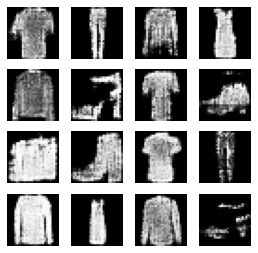

19200: [discriminator loss: 0.689813, acc: 0.625000] [adversarial loss: 0.624335, acc: 0.640625]
19201: [discriminator loss: 0.676210, acc: 0.523438] [adversarial loss: 0.838349, acc: 0.218750]
19202: [discriminator loss: 0.665224, acc: 0.601562] [adversarial loss: 0.643139, acc: 0.640625]
19203: [discriminator loss: 0.648182, acc: 0.632812] [adversarial loss: 0.737842, acc: 0.375000]
19204: [discriminator loss: 0.652380, acc: 0.601562] [adversarial loss: 0.781394, acc: 0.375000]
19205: [discriminator loss: 0.697910, acc: 0.578125] [adversarial loss: 0.631172, acc: 0.656250]
19206: [discriminator loss: 0.674681, acc: 0.585938] [adversarial loss: 0.783859, acc: 0.234375]
19207: [discriminator loss: 0.648136, acc: 0.648438] [adversarial loss: 0.700446, acc: 0.515625]
19208: [discriminator loss: 0.668923, acc: 0.601562] [adversarial loss: 0.816539, acc: 0.171875]
19209: [discriminator loss: 0.655831, acc: 0.664062] [adversarial loss: 0.701506, acc: 0.484375]
19210: [discriminator loss: 0.

19286: [discriminator loss: 0.676846, acc: 0.570312] [adversarial loss: 0.652495, acc: 0.656250]
19287: [discriminator loss: 0.679373, acc: 0.585938] [adversarial loss: 0.879170, acc: 0.078125]
19288: [discriminator loss: 0.644189, acc: 0.632812] [adversarial loss: 0.649710, acc: 0.703125]
19289: [discriminator loss: 0.673469, acc: 0.562500] [adversarial loss: 0.860830, acc: 0.093750]
19290: [discriminator loss: 0.667926, acc: 0.625000] [adversarial loss: 0.683769, acc: 0.609375]
19291: [discriminator loss: 0.662904, acc: 0.539062] [adversarial loss: 0.891966, acc: 0.140625]
19292: [discriminator loss: 0.682620, acc: 0.531250] [adversarial loss: 0.698814, acc: 0.531250]
19293: [discriminator loss: 0.673029, acc: 0.531250] [adversarial loss: 0.828029, acc: 0.281250]
19294: [discriminator loss: 0.690527, acc: 0.539062] [adversarial loss: 0.629861, acc: 0.718750]
19295: [discriminator loss: 0.690326, acc: 0.570312] [adversarial loss: 0.874797, acc: 0.093750]
19296: [discriminator loss: 0.

19372: [discriminator loss: 0.677514, acc: 0.570312] [adversarial loss: 0.968195, acc: 0.062500]
19373: [discriminator loss: 0.691572, acc: 0.546875] [adversarial loss: 0.613593, acc: 0.703125]
19374: [discriminator loss: 0.659528, acc: 0.632812] [adversarial loss: 0.816977, acc: 0.156250]
19375: [discriminator loss: 0.682091, acc: 0.585938] [adversarial loss: 0.694000, acc: 0.546875]
19376: [discriminator loss: 0.664994, acc: 0.570312] [adversarial loss: 0.760003, acc: 0.250000]
19377: [discriminator loss: 0.660987, acc: 0.617188] [adversarial loss: 0.732337, acc: 0.343750]
19378: [discriminator loss: 0.664516, acc: 0.601562] [adversarial loss: 0.736655, acc: 0.421875]
19379: [discriminator loss: 0.678036, acc: 0.585938] [adversarial loss: 0.730110, acc: 0.375000]
19380: [discriminator loss: 0.672648, acc: 0.601562] [adversarial loss: 0.784273, acc: 0.203125]
19381: [discriminator loss: 0.675702, acc: 0.593750] [adversarial loss: 0.700895, acc: 0.484375]
19382: [discriminator loss: 0.

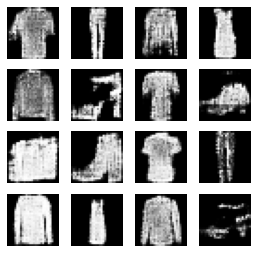

19400: [discriminator loss: 0.692566, acc: 0.578125] [adversarial loss: 0.731859, acc: 0.281250]
19401: [discriminator loss: 0.651270, acc: 0.664062] [adversarial loss: 0.810222, acc: 0.203125]
19402: [discriminator loss: 0.674784, acc: 0.570312] [adversarial loss: 0.680936, acc: 0.546875]
19403: [discriminator loss: 0.668168, acc: 0.632812] [adversarial loss: 0.741502, acc: 0.453125]
19404: [discriminator loss: 0.669504, acc: 0.562500] [adversarial loss: 0.637164, acc: 0.671875]
19405: [discriminator loss: 0.697310, acc: 0.492188] [adversarial loss: 0.810165, acc: 0.156250]
19406: [discriminator loss: 0.688625, acc: 0.546875] [adversarial loss: 0.592471, acc: 0.796875]
19407: [discriminator loss: 0.671780, acc: 0.531250] [adversarial loss: 0.855696, acc: 0.187500]
19408: [discriminator loss: 0.674107, acc: 0.585938] [adversarial loss: 0.620582, acc: 0.765625]
19409: [discriminator loss: 0.691278, acc: 0.515625] [adversarial loss: 0.827804, acc: 0.187500]
19410: [discriminator loss: 0.

19489: [discriminator loss: 0.667383, acc: 0.617188] [adversarial loss: 0.738849, acc: 0.328125]
19490: [discriminator loss: 0.652246, acc: 0.632812] [adversarial loss: 0.799621, acc: 0.218750]
19491: [discriminator loss: 0.672060, acc: 0.601562] [adversarial loss: 0.677358, acc: 0.500000]
19492: [discriminator loss: 0.661592, acc: 0.554688] [adversarial loss: 0.619560, acc: 0.703125]
19493: [discriminator loss: 0.678030, acc: 0.554688] [adversarial loss: 0.830500, acc: 0.187500]
19494: [discriminator loss: 0.660888, acc: 0.609375] [adversarial loss: 0.682805, acc: 0.453125]
19495: [discriminator loss: 0.686364, acc: 0.515625] [adversarial loss: 0.766898, acc: 0.375000]
19496: [discriminator loss: 0.661613, acc: 0.593750] [adversarial loss: 0.731326, acc: 0.375000]
19497: [discriminator loss: 0.651138, acc: 0.664062] [adversarial loss: 0.748323, acc: 0.312500]
19498: [discriminator loss: 0.674509, acc: 0.515625] [adversarial loss: 0.745753, acc: 0.296875]
19499: [discriminator loss: 0.

19574: [discriminator loss: 0.681293, acc: 0.562500] [adversarial loss: 0.850153, acc: 0.156250]
19575: [discriminator loss: 0.657655, acc: 0.609375] [adversarial loss: 0.656913, acc: 0.593750]
19576: [discriminator loss: 0.646833, acc: 0.625000] [adversarial loss: 0.774413, acc: 0.281250]
19577: [discriminator loss: 0.676929, acc: 0.562500] [adversarial loss: 0.657095, acc: 0.578125]
19578: [discriminator loss: 0.680695, acc: 0.585938] [adversarial loss: 0.777680, acc: 0.343750]
19579: [discriminator loss: 0.694760, acc: 0.578125] [adversarial loss: 0.853659, acc: 0.156250]
19580: [discriminator loss: 0.666568, acc: 0.601562] [adversarial loss: 0.695658, acc: 0.484375]
19581: [discriminator loss: 0.670441, acc: 0.562500] [adversarial loss: 0.758448, acc: 0.390625]
19582: [discriminator loss: 0.686404, acc: 0.609375] [adversarial loss: 0.753546, acc: 0.359375]
19583: [discriminator loss: 0.655300, acc: 0.609375] [adversarial loss: 0.904643, acc: 0.031250]
19584: [discriminator loss: 0.

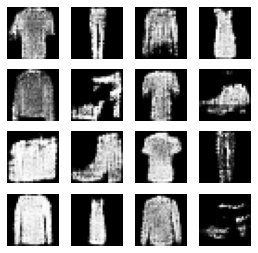

19600: [discriminator loss: 0.675130, acc: 0.585938] [adversarial loss: 0.753407, acc: 0.343750]
19601: [discriminator loss: 0.672077, acc: 0.562500] [adversarial loss: 0.707693, acc: 0.453125]
19602: [discriminator loss: 0.683563, acc: 0.578125] [adversarial loss: 0.788082, acc: 0.281250]
19603: [discriminator loss: 0.667860, acc: 0.593750] [adversarial loss: 0.733641, acc: 0.375000]
19604: [discriminator loss: 0.704442, acc: 0.539062] [adversarial loss: 0.661231, acc: 0.562500]
19605: [discriminator loss: 0.675758, acc: 0.531250] [adversarial loss: 0.909782, acc: 0.125000]
19606: [discriminator loss: 0.676350, acc: 0.546875] [adversarial loss: 0.650363, acc: 0.703125]
19607: [discriminator loss: 0.669103, acc: 0.554688] [adversarial loss: 0.791975, acc: 0.265625]
19608: [discriminator loss: 0.676576, acc: 0.546875] [adversarial loss: 0.688841, acc: 0.609375]
19609: [discriminator loss: 0.676153, acc: 0.570312] [adversarial loss: 0.776763, acc: 0.218750]
19610: [discriminator loss: 0.

19689: [discriminator loss: 0.665243, acc: 0.585938] [adversarial loss: 0.712977, acc: 0.421875]
19690: [discriminator loss: 0.649037, acc: 0.601562] [adversarial loss: 0.812572, acc: 0.156250]
19691: [discriminator loss: 0.657127, acc: 0.648438] [adversarial loss: 0.754966, acc: 0.359375]
19692: [discriminator loss: 0.647070, acc: 0.679688] [adversarial loss: 0.787042, acc: 0.218750]
19693: [discriminator loss: 0.669174, acc: 0.593750] [adversarial loss: 0.746917, acc: 0.390625]
19694: [discriminator loss: 0.690139, acc: 0.492188] [adversarial loss: 0.811743, acc: 0.234375]
19695: [discriminator loss: 0.693931, acc: 0.562500] [adversarial loss: 0.752330, acc: 0.359375]
19696: [discriminator loss: 0.661942, acc: 0.640625] [adversarial loss: 0.743932, acc: 0.359375]
19697: [discriminator loss: 0.674904, acc: 0.539062] [adversarial loss: 0.840371, acc: 0.125000]
19698: [discriminator loss: 0.662993, acc: 0.640625] [adversarial loss: 0.574488, acc: 0.890625]
19699: [discriminator loss: 0.

19778: [discriminator loss: 0.658637, acc: 0.656250] [adversarial loss: 0.703584, acc: 0.390625]
19779: [discriminator loss: 0.666814, acc: 0.601562] [adversarial loss: 0.740339, acc: 0.359375]
19780: [discriminator loss: 0.677639, acc: 0.539062] [adversarial loss: 0.699199, acc: 0.468750]
19781: [discriminator loss: 0.665730, acc: 0.648438] [adversarial loss: 0.708985, acc: 0.421875]
19782: [discriminator loss: 0.678282, acc: 0.570312] [adversarial loss: 0.661026, acc: 0.593750]
19783: [discriminator loss: 0.682818, acc: 0.515625] [adversarial loss: 0.851950, acc: 0.109375]
19784: [discriminator loss: 0.665650, acc: 0.617188] [adversarial loss: 0.696311, acc: 0.515625]
19785: [discriminator loss: 0.663571, acc: 0.585938] [adversarial loss: 0.793284, acc: 0.140625]
19786: [discriminator loss: 0.675965, acc: 0.570312] [adversarial loss: 0.701671, acc: 0.468750]
19787: [discriminator loss: 0.658404, acc: 0.625000] [adversarial loss: 0.729262, acc: 0.406250]
19788: [discriminator loss: 0.

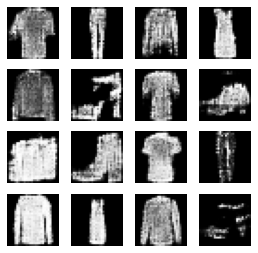

19800: [discriminator loss: 0.651610, acc: 0.593750] [adversarial loss: 0.836953, acc: 0.218750]
19801: [discriminator loss: 0.700673, acc: 0.531250] [adversarial loss: 0.534358, acc: 0.921875]
19802: [discriminator loss: 0.679954, acc: 0.539062] [adversarial loss: 0.871430, acc: 0.078125]
19803: [discriminator loss: 0.678143, acc: 0.593750] [adversarial loss: 0.659005, acc: 0.656250]
19804: [discriminator loss: 0.686593, acc: 0.539062] [adversarial loss: 0.770443, acc: 0.250000]
19805: [discriminator loss: 0.669242, acc: 0.625000] [adversarial loss: 0.739727, acc: 0.359375]
19806: [discriminator loss: 0.667969, acc: 0.562500] [adversarial loss: 0.776013, acc: 0.312500]
19807: [discriminator loss: 0.661433, acc: 0.570312] [adversarial loss: 0.768640, acc: 0.250000]
19808: [discriminator loss: 0.659622, acc: 0.632812] [adversarial loss: 0.765197, acc: 0.375000]
19809: [discriminator loss: 0.665950, acc: 0.585938] [adversarial loss: 0.705488, acc: 0.437500]
19810: [discriminator loss: 0.

19887: [discriminator loss: 0.692617, acc: 0.507812] [adversarial loss: 0.755595, acc: 0.328125]
19888: [discriminator loss: 0.673352, acc: 0.625000] [adversarial loss: 0.808483, acc: 0.203125]
19889: [discriminator loss: 0.682037, acc: 0.570312] [adversarial loss: 0.635307, acc: 0.781250]
19890: [discriminator loss: 0.667592, acc: 0.578125] [adversarial loss: 0.801053, acc: 0.203125]
19891: [discriminator loss: 0.673407, acc: 0.562500] [adversarial loss: 0.743910, acc: 0.359375]
19892: [discriminator loss: 0.656427, acc: 0.546875] [adversarial loss: 0.694356, acc: 0.484375]
19893: [discriminator loss: 0.687271, acc: 0.531250] [adversarial loss: 0.719699, acc: 0.453125]
19894: [discriminator loss: 0.685848, acc: 0.562500] [adversarial loss: 0.732252, acc: 0.484375]
19895: [discriminator loss: 0.662512, acc: 0.601562] [adversarial loss: 0.872509, acc: 0.140625]
19896: [discriminator loss: 0.666591, acc: 0.617188] [adversarial loss: 0.584745, acc: 0.734375]
19897: [discriminator loss: 0.

19975: [discriminator loss: 0.657180, acc: 0.609375] [adversarial loss: 0.730092, acc: 0.437500]
19976: [discriminator loss: 0.662894, acc: 0.625000] [adversarial loss: 0.800662, acc: 0.312500]
19977: [discriminator loss: 0.705710, acc: 0.507812] [adversarial loss: 0.642209, acc: 0.718750]
19978: [discriminator loss: 0.682085, acc: 0.554688] [adversarial loss: 0.816722, acc: 0.156250]
19979: [discriminator loss: 0.686545, acc: 0.570312] [adversarial loss: 0.675299, acc: 0.562500]
19980: [discriminator loss: 0.679278, acc: 0.539062] [adversarial loss: 0.803102, acc: 0.156250]
19981: [discriminator loss: 0.661946, acc: 0.648438] [adversarial loss: 0.740992, acc: 0.390625]
19982: [discriminator loss: 0.664109, acc: 0.585938] [adversarial loss: 0.725598, acc: 0.437500]
19983: [discriminator loss: 0.693140, acc: 0.554688] [adversarial loss: 0.805996, acc: 0.312500]
19984: [discriminator loss: 0.662970, acc: 0.593750] [adversarial loss: 0.595358, acc: 0.843750]
19985: [discriminator loss: 0.

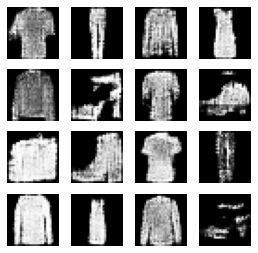

20000: [discriminator loss: 0.658286, acc: 0.617188] [adversarial loss: 0.842104, acc: 0.218750]
20001: [discriminator loss: 0.689913, acc: 0.523438] [adversarial loss: 0.671567, acc: 0.562500]
20002: [discriminator loss: 0.666407, acc: 0.554688] [adversarial loss: 0.882717, acc: 0.203125]
20003: [discriminator loss: 0.705779, acc: 0.539062] [adversarial loss: 0.663921, acc: 0.562500]
20004: [discriminator loss: 0.655186, acc: 0.601562] [adversarial loss: 0.866857, acc: 0.125000]
20005: [discriminator loss: 0.662869, acc: 0.625000] [adversarial loss: 0.677062, acc: 0.500000]
20006: [discriminator loss: 0.663670, acc: 0.585938] [adversarial loss: 0.783071, acc: 0.265625]
20007: [discriminator loss: 0.676236, acc: 0.562500] [adversarial loss: 0.625566, acc: 0.718750]
20008: [discriminator loss: 0.673608, acc: 0.554688] [adversarial loss: 0.904831, acc: 0.093750]
20009: [discriminator loss: 0.667930, acc: 0.570312] [adversarial loss: 0.655314, acc: 0.640625]
20010: [discriminator loss: 0.

20089: [discriminator loss: 0.683854, acc: 0.531250] [adversarial loss: 0.790899, acc: 0.187500]
20090: [discriminator loss: 0.685367, acc: 0.578125] [adversarial loss: 0.589399, acc: 0.812500]
20091: [discriminator loss: 0.710853, acc: 0.468750] [adversarial loss: 0.824758, acc: 0.265625]
20092: [discriminator loss: 0.665205, acc: 0.578125] [adversarial loss: 0.688367, acc: 0.546875]
20093: [discriminator loss: 0.672012, acc: 0.593750] [adversarial loss: 0.789190, acc: 0.218750]
20094: [discriminator loss: 0.673128, acc: 0.570312] [adversarial loss: 0.730421, acc: 0.343750]
20095: [discriminator loss: 0.657882, acc: 0.593750] [adversarial loss: 0.847927, acc: 0.187500]
20096: [discriminator loss: 0.676974, acc: 0.578125] [adversarial loss: 0.613455, acc: 0.765625]
20097: [discriminator loss: 0.677512, acc: 0.515625] [adversarial loss: 0.811255, acc: 0.218750]
20098: [discriminator loss: 0.662273, acc: 0.609375] [adversarial loss: 0.737851, acc: 0.390625]
20099: [discriminator loss: 0.

20175: [discriminator loss: 0.680394, acc: 0.640625] [adversarial loss: 0.698788, acc: 0.531250]
20176: [discriminator loss: 0.651635, acc: 0.609375] [adversarial loss: 0.712151, acc: 0.437500]
20177: [discriminator loss: 0.684263, acc: 0.554688] [adversarial loss: 0.713763, acc: 0.484375]
20178: [discriminator loss: 0.650627, acc: 0.578125] [adversarial loss: 0.778493, acc: 0.218750]
20179: [discriminator loss: 0.684170, acc: 0.562500] [adversarial loss: 0.704527, acc: 0.390625]
20180: [discriminator loss: 0.654982, acc: 0.632812] [adversarial loss: 0.792735, acc: 0.218750]
20181: [discriminator loss: 0.695415, acc: 0.578125] [adversarial loss: 0.627676, acc: 0.671875]
20182: [discriminator loss: 0.679702, acc: 0.523438] [adversarial loss: 0.776955, acc: 0.265625]
20183: [discriminator loss: 0.664673, acc: 0.609375] [adversarial loss: 0.767529, acc: 0.265625]
20184: [discriminator loss: 0.668576, acc: 0.585938] [adversarial loss: 0.693945, acc: 0.500000]
20185: [discriminator loss: 0.

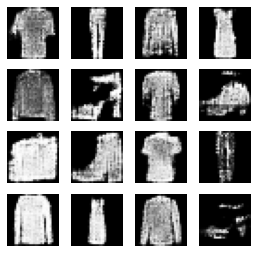

20200: [discriminator loss: 0.662452, acc: 0.578125] [adversarial loss: 0.679194, acc: 0.546875]
20201: [discriminator loss: 0.681947, acc: 0.562500] [adversarial loss: 0.809556, acc: 0.234375]
20202: [discriminator loss: 0.679446, acc: 0.593750] [adversarial loss: 0.738352, acc: 0.421875]
20203: [discriminator loss: 0.683260, acc: 0.546875] [adversarial loss: 0.779617, acc: 0.281250]
20204: [discriminator loss: 0.665236, acc: 0.609375] [adversarial loss: 0.675522, acc: 0.625000]
20205: [discriminator loss: 0.668895, acc: 0.515625] [adversarial loss: 0.829186, acc: 0.281250]
20206: [discriminator loss: 0.704021, acc: 0.453125] [adversarial loss: 0.661246, acc: 0.609375]
20207: [discriminator loss: 0.675741, acc: 0.593750] [adversarial loss: 0.864688, acc: 0.234375]
20208: [discriminator loss: 0.671479, acc: 0.546875] [adversarial loss: 0.616764, acc: 0.781250]
20209: [discriminator loss: 0.681563, acc: 0.476562] [adversarial loss: 0.813543, acc: 0.140625]
20210: [discriminator loss: 0.

20289: [discriminator loss: 0.671122, acc: 0.593750] [adversarial loss: 0.666931, acc: 0.515625]
20290: [discriminator loss: 0.660708, acc: 0.585938] [adversarial loss: 0.778463, acc: 0.281250]
20291: [discriminator loss: 0.685300, acc: 0.570312] [adversarial loss: 0.688407, acc: 0.578125]
20292: [discriminator loss: 0.673207, acc: 0.531250] [adversarial loss: 0.748416, acc: 0.328125]
20293: [discriminator loss: 0.666482, acc: 0.609375] [adversarial loss: 0.781676, acc: 0.265625]
20294: [discriminator loss: 0.654444, acc: 0.664062] [adversarial loss: 0.674581, acc: 0.546875]
20295: [discriminator loss: 0.661653, acc: 0.601562] [adversarial loss: 0.717777, acc: 0.437500]
20296: [discriminator loss: 0.681800, acc: 0.500000] [adversarial loss: 0.811760, acc: 0.140625]
20297: [discriminator loss: 0.690132, acc: 0.546875] [adversarial loss: 0.593964, acc: 0.703125]
20298: [discriminator loss: 0.669187, acc: 0.578125] [adversarial loss: 0.829305, acc: 0.234375]
20299: [discriminator loss: 0.

20375: [discriminator loss: 0.698344, acc: 0.585938] [adversarial loss: 0.680899, acc: 0.562500]
20376: [discriminator loss: 0.677682, acc: 0.562500] [adversarial loss: 0.768353, acc: 0.328125]
20377: [discriminator loss: 0.694249, acc: 0.539062] [adversarial loss: 0.663161, acc: 0.656250]
20378: [discriminator loss: 0.668308, acc: 0.562500] [adversarial loss: 0.718622, acc: 0.390625]
20379: [discriminator loss: 0.659179, acc: 0.601562] [adversarial loss: 0.717484, acc: 0.453125]
20380: [discriminator loss: 0.701705, acc: 0.492188] [adversarial loss: 0.713254, acc: 0.390625]
20381: [discriminator loss: 0.670526, acc: 0.539062] [adversarial loss: 0.731703, acc: 0.328125]
20382: [discriminator loss: 0.657892, acc: 0.640625] [adversarial loss: 0.740798, acc: 0.312500]
20383: [discriminator loss: 0.647710, acc: 0.632812] [adversarial loss: 0.701105, acc: 0.562500]
20384: [discriminator loss: 0.667755, acc: 0.531250] [adversarial loss: 0.698731, acc: 0.500000]
20385: [discriminator loss: 0.

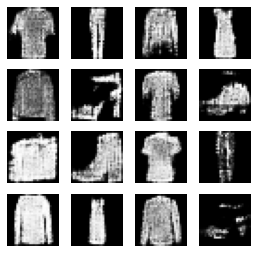

20400: [discriminator loss: 0.678112, acc: 0.578125] [adversarial loss: 0.648296, acc: 0.687500]
20401: [discriminator loss: 0.684706, acc: 0.507812] [adversarial loss: 0.804899, acc: 0.187500]
20402: [discriminator loss: 0.657986, acc: 0.609375] [adversarial loss: 0.735859, acc: 0.390625]
20403: [discriminator loss: 0.675694, acc: 0.578125] [adversarial loss: 0.695802, acc: 0.421875]
20404: [discriminator loss: 0.666017, acc: 0.562500] [adversarial loss: 0.812426, acc: 0.171875]
20405: [discriminator loss: 0.664253, acc: 0.609375] [adversarial loss: 0.726643, acc: 0.421875]
20406: [discriminator loss: 0.676196, acc: 0.578125] [adversarial loss: 0.644530, acc: 0.640625]
20407: [discriminator loss: 0.680970, acc: 0.578125] [adversarial loss: 0.924601, acc: 0.062500]
20408: [discriminator loss: 0.681717, acc: 0.562500] [adversarial loss: 0.649170, acc: 0.656250]
20409: [discriminator loss: 0.638114, acc: 0.664062] [adversarial loss: 0.858286, acc: 0.109375]
20410: [discriminator loss: 0.

20485: [discriminator loss: 0.682578, acc: 0.523438] [adversarial loss: 0.790670, acc: 0.265625]
20486: [discriminator loss: 0.686628, acc: 0.539062] [adversarial loss: 0.721510, acc: 0.343750]
20487: [discriminator loss: 0.687405, acc: 0.562500] [adversarial loss: 0.792924, acc: 0.218750]
20488: [discriminator loss: 0.681404, acc: 0.531250] [adversarial loss: 0.790754, acc: 0.156250]
20489: [discriminator loss: 0.659818, acc: 0.562500] [adversarial loss: 0.653885, acc: 0.593750]
20490: [discriminator loss: 0.668245, acc: 0.601562] [adversarial loss: 0.756929, acc: 0.265625]
20491: [discriminator loss: 0.697872, acc: 0.515625] [adversarial loss: 0.771955, acc: 0.281250]
20492: [discriminator loss: 0.673172, acc: 0.585938] [adversarial loss: 0.828696, acc: 0.171875]
20493: [discriminator loss: 0.686227, acc: 0.523438] [adversarial loss: 0.769896, acc: 0.343750]
20494: [discriminator loss: 0.655011, acc: 0.632812] [adversarial loss: 0.764716, acc: 0.296875]
20495: [discriminator loss: 0.

20573: [discriminator loss: 0.680708, acc: 0.468750] [adversarial loss: 0.879904, acc: 0.156250]
20574: [discriminator loss: 0.666843, acc: 0.593750] [adversarial loss: 0.611820, acc: 0.703125]
20575: [discriminator loss: 0.678308, acc: 0.507812] [adversarial loss: 0.881940, acc: 0.218750]
20576: [discriminator loss: 0.663070, acc: 0.632812] [adversarial loss: 0.772627, acc: 0.328125]
20577: [discriminator loss: 0.671174, acc: 0.593750] [adversarial loss: 0.717582, acc: 0.421875]
20578: [discriminator loss: 0.656389, acc: 0.656250] [adversarial loss: 0.682908, acc: 0.546875]
20579: [discriminator loss: 0.656678, acc: 0.632812] [adversarial loss: 0.716832, acc: 0.468750]
20580: [discriminator loss: 0.670696, acc: 0.578125] [adversarial loss: 0.706000, acc: 0.453125]
20581: [discriminator loss: 0.662129, acc: 0.570312] [adversarial loss: 0.669459, acc: 0.625000]
20582: [discriminator loss: 0.676930, acc: 0.546875] [adversarial loss: 0.789926, acc: 0.203125]
20583: [discriminator loss: 0.

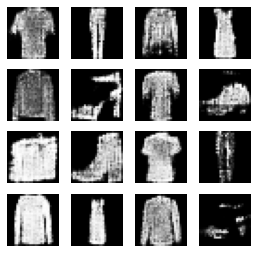

20600: [discriminator loss: 0.718372, acc: 0.507812] [adversarial loss: 0.846391, acc: 0.109375]
20601: [discriminator loss: 0.667046, acc: 0.585938] [adversarial loss: 0.659234, acc: 0.593750]
20602: [discriminator loss: 0.674107, acc: 0.539062] [adversarial loss: 0.823658, acc: 0.203125]
20603: [discriminator loss: 0.670123, acc: 0.554688] [adversarial loss: 0.719112, acc: 0.406250]
20604: [discriminator loss: 0.681589, acc: 0.515625] [adversarial loss: 0.760835, acc: 0.343750]
20605: [discriminator loss: 0.648974, acc: 0.671875] [adversarial loss: 0.746947, acc: 0.406250]
20606: [discriminator loss: 0.682194, acc: 0.539062] [adversarial loss: 0.737719, acc: 0.359375]
20607: [discriminator loss: 0.667857, acc: 0.531250] [adversarial loss: 0.695103, acc: 0.546875]
20608: [discriminator loss: 0.657051, acc: 0.617188] [adversarial loss: 0.727276, acc: 0.390625]
20609: [discriminator loss: 0.659335, acc: 0.648438] [adversarial loss: 0.805932, acc: 0.218750]
20610: [discriminator loss: 0.

20688: [discriminator loss: 0.697444, acc: 0.492188] [adversarial loss: 0.809123, acc: 0.281250]
20689: [discriminator loss: 0.651393, acc: 0.671875] [adversarial loss: 0.773189, acc: 0.406250]
20690: [discriminator loss: 0.648160, acc: 0.617188] [adversarial loss: 0.751401, acc: 0.312500]
20691: [discriminator loss: 0.667157, acc: 0.585938] [adversarial loss: 0.730045, acc: 0.390625]
20692: [discriminator loss: 0.675956, acc: 0.585938] [adversarial loss: 0.805657, acc: 0.312500]
20693: [discriminator loss: 0.659791, acc: 0.632812] [adversarial loss: 0.610463, acc: 0.812500]
20694: [discriminator loss: 0.691944, acc: 0.554688] [adversarial loss: 0.869949, acc: 0.156250]
20695: [discriminator loss: 0.663244, acc: 0.632812] [adversarial loss: 0.744600, acc: 0.453125]
20696: [discriminator loss: 0.669894, acc: 0.593750] [adversarial loss: 0.723501, acc: 0.437500]
20697: [discriminator loss: 0.661196, acc: 0.625000] [adversarial loss: 0.798660, acc: 0.281250]
20698: [discriminator loss: 0.

20774: [discriminator loss: 0.664275, acc: 0.554688] [adversarial loss: 0.763796, acc: 0.328125]
20775: [discriminator loss: 0.679941, acc: 0.601562] [adversarial loss: 0.789856, acc: 0.250000]
20776: [discriminator loss: 0.679317, acc: 0.554688] [adversarial loss: 0.717939, acc: 0.421875]
20777: [discriminator loss: 0.666073, acc: 0.593750] [adversarial loss: 0.655718, acc: 0.656250]
20778: [discriminator loss: 0.659520, acc: 0.617188] [adversarial loss: 0.728030, acc: 0.421875]
20779: [discriminator loss: 0.677183, acc: 0.562500] [adversarial loss: 0.766463, acc: 0.265625]
20780: [discriminator loss: 0.650116, acc: 0.632812] [adversarial loss: 0.639114, acc: 0.703125]
20781: [discriminator loss: 0.688644, acc: 0.554688] [adversarial loss: 0.891031, acc: 0.140625]
20782: [discriminator loss: 0.687985, acc: 0.515625] [adversarial loss: 0.630974, acc: 0.703125]
20783: [discriminator loss: 0.648176, acc: 0.625000] [adversarial loss: 0.830591, acc: 0.140625]
20784: [discriminator loss: 0.

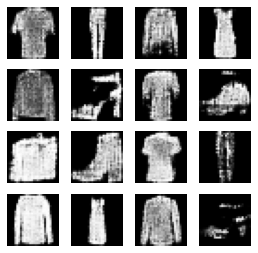

20800: [discriminator loss: 0.677640, acc: 0.554688] [adversarial loss: 0.764582, acc: 0.328125]
20801: [discriminator loss: 0.647653, acc: 0.664062] [adversarial loss: 0.687893, acc: 0.546875]
20802: [discriminator loss: 0.669266, acc: 0.601562] [adversarial loss: 0.770098, acc: 0.296875]
20803: [discriminator loss: 0.676862, acc: 0.585938] [adversarial loss: 0.629939, acc: 0.734375]
20804: [discriminator loss: 0.689442, acc: 0.515625] [adversarial loss: 0.954558, acc: 0.109375]
20805: [discriminator loss: 0.709035, acc: 0.531250] [adversarial loss: 0.644528, acc: 0.687500]
20806: [discriminator loss: 0.694987, acc: 0.492188] [adversarial loss: 0.739040, acc: 0.421875]
20807: [discriminator loss: 0.680795, acc: 0.570312] [adversarial loss: 0.801559, acc: 0.171875]
20808: [discriminator loss: 0.661166, acc: 0.648438] [adversarial loss: 0.672746, acc: 0.500000]
20809: [discriminator loss: 0.638023, acc: 0.710938] [adversarial loss: 0.811972, acc: 0.156250]
20810: [discriminator loss: 0.

20885: [discriminator loss: 0.680801, acc: 0.562500] [adversarial loss: 0.663715, acc: 0.625000]
20886: [discriminator loss: 0.684049, acc: 0.585938] [adversarial loss: 0.772424, acc: 0.250000]
20887: [discriminator loss: 0.655002, acc: 0.632812] [adversarial loss: 0.764007, acc: 0.343750]
20888: [discriminator loss: 0.678112, acc: 0.593750] [adversarial loss: 0.856768, acc: 0.203125]
20889: [discriminator loss: 0.658060, acc: 0.632812] [adversarial loss: 0.790338, acc: 0.343750]
20890: [discriminator loss: 0.679130, acc: 0.562500] [adversarial loss: 0.667145, acc: 0.609375]
20891: [discriminator loss: 0.665679, acc: 0.593750] [adversarial loss: 0.763707, acc: 0.343750]
20892: [discriminator loss: 0.677943, acc: 0.546875] [adversarial loss: 0.646940, acc: 0.718750]
20893: [discriminator loss: 0.661394, acc: 0.539062] [adversarial loss: 0.783935, acc: 0.218750]
20894: [discriminator loss: 0.686073, acc: 0.578125] [adversarial loss: 0.667354, acc: 0.562500]
20895: [discriminator loss: 0.

20972: [discriminator loss: 0.673404, acc: 0.539062] [adversarial loss: 0.902946, acc: 0.093750]
20973: [discriminator loss: 0.662641, acc: 0.625000] [adversarial loss: 0.635335, acc: 0.671875]
20974: [discriminator loss: 0.688077, acc: 0.507812] [adversarial loss: 0.820818, acc: 0.250000]
20975: [discriminator loss: 0.660048, acc: 0.593750] [adversarial loss: 0.680535, acc: 0.562500]
20976: [discriminator loss: 0.658441, acc: 0.609375] [adversarial loss: 0.815474, acc: 0.250000]
20977: [discriminator loss: 0.668801, acc: 0.585938] [adversarial loss: 0.790103, acc: 0.281250]
20978: [discriminator loss: 0.654746, acc: 0.687500] [adversarial loss: 0.587142, acc: 0.812500]
20979: [discriminator loss: 0.670800, acc: 0.546875] [adversarial loss: 0.736766, acc: 0.375000]
20980: [discriminator loss: 0.693008, acc: 0.554688] [adversarial loss: 0.760151, acc: 0.296875]
20981: [discriminator loss: 0.663032, acc: 0.609375] [adversarial loss: 0.774731, acc: 0.281250]
20982: [discriminator loss: 0.

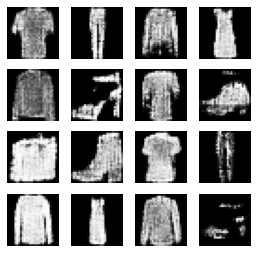

21000: [discriminator loss: 0.664809, acc: 0.617188] [adversarial loss: 0.748558, acc: 0.359375]
21001: [discriminator loss: 0.675251, acc: 0.531250] [adversarial loss: 0.783537, acc: 0.328125]
21002: [discriminator loss: 0.674989, acc: 0.593750] [adversarial loss: 0.715455, acc: 0.484375]
21003: [discriminator loss: 0.667922, acc: 0.578125] [adversarial loss: 0.718584, acc: 0.500000]
21004: [discriminator loss: 0.653981, acc: 0.601562] [adversarial loss: 0.871142, acc: 0.140625]
21005: [discriminator loss: 0.678534, acc: 0.593750] [adversarial loss: 0.669649, acc: 0.562500]
21006: [discriminator loss: 0.636060, acc: 0.664062] [adversarial loss: 0.798789, acc: 0.375000]
21007: [discriminator loss: 0.678991, acc: 0.546875] [adversarial loss: 0.775114, acc: 0.406250]
21008: [discriminator loss: 0.654141, acc: 0.617188] [adversarial loss: 0.852557, acc: 0.140625]
21009: [discriminator loss: 0.676470, acc: 0.562500] [adversarial loss: 0.617198, acc: 0.734375]
21010: [discriminator loss: 0.

21089: [discriminator loss: 0.665502, acc: 0.585938] [adversarial loss: 0.744508, acc: 0.312500]
21090: [discriminator loss: 0.666387, acc: 0.632812] [adversarial loss: 0.758396, acc: 0.312500]
21091: [discriminator loss: 0.652599, acc: 0.632812] [adversarial loss: 0.841707, acc: 0.203125]
21092: [discriminator loss: 0.690669, acc: 0.570312] [adversarial loss: 0.674218, acc: 0.484375]
21093: [discriminator loss: 0.687202, acc: 0.515625] [adversarial loss: 0.846611, acc: 0.218750]
21094: [discriminator loss: 0.693066, acc: 0.562500] [adversarial loss: 0.666947, acc: 0.531250]
21095: [discriminator loss: 0.657515, acc: 0.593750] [adversarial loss: 0.838043, acc: 0.203125]
21096: [discriminator loss: 0.687458, acc: 0.593750] [adversarial loss: 0.652313, acc: 0.656250]
21097: [discriminator loss: 0.703555, acc: 0.554688] [adversarial loss: 0.791937, acc: 0.187500]
21098: [discriminator loss: 0.661258, acc: 0.617188] [adversarial loss: 0.724214, acc: 0.437500]
21099: [discriminator loss: 0.

21177: [discriminator loss: 0.696596, acc: 0.468750] [adversarial loss: 0.871640, acc: 0.078125]
21178: [discriminator loss: 0.662890, acc: 0.617188] [adversarial loss: 0.649986, acc: 0.609375]
21179: [discriminator loss: 0.714888, acc: 0.484375] [adversarial loss: 0.692154, acc: 0.484375]
21180: [discriminator loss: 0.703514, acc: 0.492188] [adversarial loss: 0.862990, acc: 0.093750]
21181: [discriminator loss: 0.679012, acc: 0.640625] [adversarial loss: 0.651472, acc: 0.640625]
21182: [discriminator loss: 0.684077, acc: 0.500000] [adversarial loss: 0.806123, acc: 0.171875]
21183: [discriminator loss: 0.685799, acc: 0.539062] [adversarial loss: 0.731370, acc: 0.515625]
21184: [discriminator loss: 0.676852, acc: 0.523438] [adversarial loss: 0.783378, acc: 0.265625]
21185: [discriminator loss: 0.684846, acc: 0.601562] [adversarial loss: 0.681880, acc: 0.562500]
21186: [discriminator loss: 0.668490, acc: 0.562500] [adversarial loss: 0.790841, acc: 0.140625]
21187: [discriminator loss: 0.

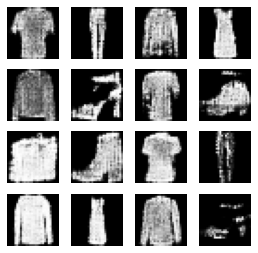

21200: [discriminator loss: 0.656571, acc: 0.609375] [adversarial loss: 0.813673, acc: 0.171875]
21201: [discriminator loss: 0.663207, acc: 0.570312] [adversarial loss: 0.783997, acc: 0.187500]
21202: [discriminator loss: 0.669485, acc: 0.585938] [adversarial loss: 0.757912, acc: 0.390625]
21203: [discriminator loss: 0.651190, acc: 0.585938] [adversarial loss: 0.692055, acc: 0.515625]
21204: [discriminator loss: 0.689468, acc: 0.578125] [adversarial loss: 0.869383, acc: 0.140625]
21205: [discriminator loss: 0.666826, acc: 0.601562] [adversarial loss: 0.650721, acc: 0.625000]
21206: [discriminator loss: 0.686324, acc: 0.539062] [adversarial loss: 0.848300, acc: 0.156250]
21207: [discriminator loss: 0.666062, acc: 0.585938] [adversarial loss: 0.662996, acc: 0.671875]
21208: [discriminator loss: 0.657108, acc: 0.625000] [adversarial loss: 0.740665, acc: 0.359375]
21209: [discriminator loss: 0.655508, acc: 0.609375] [adversarial loss: 0.633655, acc: 0.671875]
21210: [discriminator loss: 0.

21289: [discriminator loss: 0.666135, acc: 0.617188] [adversarial loss: 0.786136, acc: 0.234375]
21290: [discriminator loss: 0.676806, acc: 0.539062] [adversarial loss: 0.682819, acc: 0.562500]
21291: [discriminator loss: 0.671067, acc: 0.523438] [adversarial loss: 0.842425, acc: 0.109375]
21292: [discriminator loss: 0.684679, acc: 0.546875] [adversarial loss: 0.656289, acc: 0.609375]
21293: [discriminator loss: 0.660312, acc: 0.554688] [adversarial loss: 0.844798, acc: 0.156250]
21294: [discriminator loss: 0.709191, acc: 0.523438] [adversarial loss: 0.652003, acc: 0.718750]
21295: [discriminator loss: 0.672719, acc: 0.554688] [adversarial loss: 0.819301, acc: 0.203125]
21296: [discriminator loss: 0.671083, acc: 0.585938] [adversarial loss: 0.796531, acc: 0.265625]
21297: [discriminator loss: 0.668757, acc: 0.601562] [adversarial loss: 0.786979, acc: 0.343750]
21298: [discriminator loss: 0.683667, acc: 0.515625] [adversarial loss: 0.744388, acc: 0.375000]
21299: [discriminator loss: 0.

21376: [discriminator loss: 0.670671, acc: 0.609375] [adversarial loss: 0.635898, acc: 0.671875]
21377: [discriminator loss: 0.667441, acc: 0.593750] [adversarial loss: 0.806627, acc: 0.265625]
21378: [discriminator loss: 0.687637, acc: 0.531250] [adversarial loss: 0.649912, acc: 0.625000]
21379: [discriminator loss: 0.662628, acc: 0.585938] [adversarial loss: 0.740774, acc: 0.328125]
21380: [discriminator loss: 0.663292, acc: 0.554688] [adversarial loss: 0.712308, acc: 0.453125]
21381: [discriminator loss: 0.679659, acc: 0.531250] [adversarial loss: 0.704195, acc: 0.500000]
21382: [discriminator loss: 0.675619, acc: 0.593750] [adversarial loss: 0.765692, acc: 0.296875]
21383: [discriminator loss: 0.662537, acc: 0.664062] [adversarial loss: 0.761250, acc: 0.421875]
21384: [discriminator loss: 0.655629, acc: 0.664062] [adversarial loss: 0.776212, acc: 0.406250]
21385: [discriminator loss: 0.677519, acc: 0.531250] [adversarial loss: 0.851735, acc: 0.109375]
21386: [discriminator loss: 0.

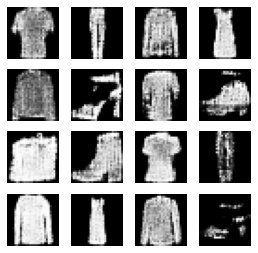

21400: [discriminator loss: 0.695639, acc: 0.507812] [adversarial loss: 0.925399, acc: 0.125000]
21401: [discriminator loss: 0.695165, acc: 0.585938] [adversarial loss: 0.690610, acc: 0.515625]
21402: [discriminator loss: 0.694309, acc: 0.515625] [adversarial loss: 0.762245, acc: 0.359375]
21403: [discriminator loss: 0.675167, acc: 0.625000] [adversarial loss: 0.720957, acc: 0.375000]
21404: [discriminator loss: 0.672445, acc: 0.585938] [adversarial loss: 0.710407, acc: 0.437500]
21405: [discriminator loss: 0.668469, acc: 0.593750] [adversarial loss: 0.907102, acc: 0.093750]
21406: [discriminator loss: 0.679617, acc: 0.585938] [adversarial loss: 0.683603, acc: 0.500000]
21407: [discriminator loss: 0.676409, acc: 0.539062] [adversarial loss: 0.793444, acc: 0.265625]
21408: [discriminator loss: 0.676367, acc: 0.601562] [adversarial loss: 0.710726, acc: 0.468750]
21409: [discriminator loss: 0.664048, acc: 0.585938] [adversarial loss: 0.803819, acc: 0.156250]
21410: [discriminator loss: 0.

21490: [discriminator loss: 0.678912, acc: 0.539062] [adversarial loss: 0.704130, acc: 0.500000]
21491: [discriminator loss: 0.682280, acc: 0.539062] [adversarial loss: 0.752377, acc: 0.265625]
21492: [discriminator loss: 0.682161, acc: 0.523438] [adversarial loss: 0.796200, acc: 0.218750]
21493: [discriminator loss: 0.675887, acc: 0.578125] [adversarial loss: 0.628792, acc: 0.781250]
21494: [discriminator loss: 0.658490, acc: 0.570312] [adversarial loss: 0.731601, acc: 0.453125]
21495: [discriminator loss: 0.689927, acc: 0.546875] [adversarial loss: 0.738352, acc: 0.375000]
21496: [discriminator loss: 0.677978, acc: 0.554688] [adversarial loss: 0.874285, acc: 0.031250]
21497: [discriminator loss: 0.681237, acc: 0.546875] [adversarial loss: 0.583252, acc: 0.828125]
21498: [discriminator loss: 0.682463, acc: 0.523438] [adversarial loss: 0.907737, acc: 0.062500]
21499: [discriminator loss: 0.682219, acc: 0.554688] [adversarial loss: 0.637659, acc: 0.687500]
21500: [discriminator loss: 0.

21576: [discriminator loss: 0.684041, acc: 0.562500] [adversarial loss: 0.600364, acc: 0.828125]
21577: [discriminator loss: 0.687713, acc: 0.523438] [adversarial loss: 0.862584, acc: 0.078125]
21578: [discriminator loss: 0.674179, acc: 0.609375] [adversarial loss: 0.622300, acc: 0.750000]
21579: [discriminator loss: 0.664481, acc: 0.578125] [adversarial loss: 0.767352, acc: 0.359375]
21580: [discriminator loss: 0.648240, acc: 0.593750] [adversarial loss: 0.813275, acc: 0.140625]
21581: [discriminator loss: 0.666961, acc: 0.601562] [adversarial loss: 0.753019, acc: 0.281250]
21582: [discriminator loss: 0.656830, acc: 0.570312] [adversarial loss: 0.692195, acc: 0.515625]
21583: [discriminator loss: 0.664345, acc: 0.585938] [adversarial loss: 0.746763, acc: 0.375000]
21584: [discriminator loss: 0.661438, acc: 0.585938] [adversarial loss: 0.876802, acc: 0.156250]
21585: [discriminator loss: 0.667413, acc: 0.593750] [adversarial loss: 0.631681, acc: 0.593750]
21586: [discriminator loss: 0.

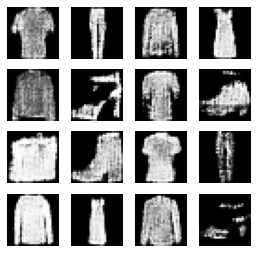

21600: [discriminator loss: 0.687897, acc: 0.562500] [adversarial loss: 0.709990, acc: 0.421875]
21601: [discriminator loss: 0.664430, acc: 0.570312] [adversarial loss: 0.730235, acc: 0.468750]
21602: [discriminator loss: 0.684642, acc: 0.515625] [adversarial loss: 0.882311, acc: 0.046875]
21603: [discriminator loss: 0.668804, acc: 0.570312] [adversarial loss: 0.706160, acc: 0.437500]
21604: [discriminator loss: 0.669202, acc: 0.585938] [adversarial loss: 0.785929, acc: 0.265625]
21605: [discriminator loss: 0.672300, acc: 0.578125] [adversarial loss: 0.630782, acc: 0.687500]
21606: [discriminator loss: 0.671338, acc: 0.625000] [adversarial loss: 0.792752, acc: 0.312500]
21607: [discriminator loss: 0.647922, acc: 0.617188] [adversarial loss: 0.663164, acc: 0.609375]
21608: [discriminator loss: 0.680515, acc: 0.507812] [adversarial loss: 0.903050, acc: 0.093750]
21609: [discriminator loss: 0.678309, acc: 0.593750] [adversarial loss: 0.581914, acc: 0.875000]
21610: [discriminator loss: 0.

21685: [discriminator loss: 0.679556, acc: 0.539062] [adversarial loss: 0.889774, acc: 0.078125]
21686: [discriminator loss: 0.692806, acc: 0.585938] [adversarial loss: 0.604706, acc: 0.781250]
21687: [discriminator loss: 0.672055, acc: 0.578125] [adversarial loss: 0.743067, acc: 0.281250]
21688: [discriminator loss: 0.672992, acc: 0.640625] [adversarial loss: 0.756705, acc: 0.375000]
21689: [discriminator loss: 0.655325, acc: 0.671875] [adversarial loss: 0.752803, acc: 0.343750]
21690: [discriminator loss: 0.659465, acc: 0.640625] [adversarial loss: 0.753963, acc: 0.312500]
21691: [discriminator loss: 0.669882, acc: 0.546875] [adversarial loss: 0.750279, acc: 0.312500]
21692: [discriminator loss: 0.685461, acc: 0.546875] [adversarial loss: 0.793932, acc: 0.187500]
21693: [discriminator loss: 0.688994, acc: 0.554688] [adversarial loss: 0.604674, acc: 0.750000]
21694: [discriminator loss: 0.671761, acc: 0.562500] [adversarial loss: 0.854065, acc: 0.078125]
21695: [discriminator loss: 0.

21770: [discriminator loss: 0.660310, acc: 0.640625] [adversarial loss: 0.616097, acc: 0.781250]
21771: [discriminator loss: 0.670594, acc: 0.562500] [adversarial loss: 0.758195, acc: 0.312500]
21772: [discriminator loss: 0.665980, acc: 0.625000] [adversarial loss: 0.673174, acc: 0.562500]
21773: [discriminator loss: 0.689448, acc: 0.539062] [adversarial loss: 0.803027, acc: 0.234375]
21774: [discriminator loss: 0.687980, acc: 0.562500] [adversarial loss: 0.646514, acc: 0.625000]
21775: [discriminator loss: 0.667337, acc: 0.609375] [adversarial loss: 0.869665, acc: 0.093750]
21776: [discriminator loss: 0.677711, acc: 0.593750] [adversarial loss: 0.684777, acc: 0.562500]
21777: [discriminator loss: 0.679375, acc: 0.562500] [adversarial loss: 0.769246, acc: 0.296875]
21778: [discriminator loss: 0.661467, acc: 0.671875] [adversarial loss: 0.715628, acc: 0.437500]
21779: [discriminator loss: 0.652071, acc: 0.601562] [adversarial loss: 0.829951, acc: 0.125000]
21780: [discriminator loss: 0.

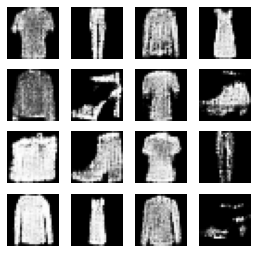

21800: [discriminator loss: 0.683178, acc: 0.554688] [adversarial loss: 0.702823, acc: 0.500000]
21801: [discriminator loss: 0.681127, acc: 0.484375] [adversarial loss: 0.843035, acc: 0.125000]
21802: [discriminator loss: 0.703665, acc: 0.546875] [adversarial loss: 0.595052, acc: 0.687500]
21803: [discriminator loss: 0.695584, acc: 0.500000] [adversarial loss: 0.854536, acc: 0.093750]
21804: [discriminator loss: 0.695808, acc: 0.546875] [adversarial loss: 0.616207, acc: 0.765625]
21805: [discriminator loss: 0.689130, acc: 0.523438] [adversarial loss: 0.859288, acc: 0.218750]
21806: [discriminator loss: 0.687584, acc: 0.539062] [adversarial loss: 0.693689, acc: 0.531250]
21807: [discriminator loss: 0.660157, acc: 0.625000] [adversarial loss: 0.804474, acc: 0.250000]
21808: [discriminator loss: 0.682975, acc: 0.539062] [adversarial loss: 0.697469, acc: 0.484375]
21809: [discriminator loss: 0.663283, acc: 0.632812] [adversarial loss: 0.726497, acc: 0.359375]
21810: [discriminator loss: 0.

21889: [discriminator loss: 0.684932, acc: 0.554688] [adversarial loss: 0.660546, acc: 0.640625]
21890: [discriminator loss: 0.635660, acc: 0.632812] [adversarial loss: 0.791443, acc: 0.234375]
21891: [discriminator loss: 0.660746, acc: 0.617188] [adversarial loss: 0.810027, acc: 0.156250]
21892: [discriminator loss: 0.670117, acc: 0.617188] [adversarial loss: 0.744860, acc: 0.375000]
21893: [discriminator loss: 0.643934, acc: 0.648438] [adversarial loss: 0.747290, acc: 0.328125]
21894: [discriminator loss: 0.679122, acc: 0.570312] [adversarial loss: 0.788332, acc: 0.265625]
21895: [discriminator loss: 0.676328, acc: 0.554688] [adversarial loss: 0.757846, acc: 0.281250]
21896: [discriminator loss: 0.691787, acc: 0.500000] [adversarial loss: 0.772735, acc: 0.265625]
21897: [discriminator loss: 0.659615, acc: 0.593750] [adversarial loss: 0.653508, acc: 0.562500]
21898: [discriminator loss: 0.675951, acc: 0.562500] [adversarial loss: 0.871295, acc: 0.156250]
21899: [discriminator loss: 0.

21977: [discriminator loss: 0.681047, acc: 0.539062] [adversarial loss: 0.645246, acc: 0.656250]
21978: [discriminator loss: 0.696090, acc: 0.531250] [adversarial loss: 0.947136, acc: 0.015625]
21979: [discriminator loss: 0.690460, acc: 0.554688] [adversarial loss: 0.668294, acc: 0.609375]
21980: [discriminator loss: 0.681793, acc: 0.531250] [adversarial loss: 0.806404, acc: 0.312500]
21981: [discriminator loss: 0.670954, acc: 0.625000] [adversarial loss: 0.635734, acc: 0.687500]
21982: [discriminator loss: 0.666458, acc: 0.531250] [adversarial loss: 0.859838, acc: 0.171875]
21983: [discriminator loss: 0.680004, acc: 0.585938] [adversarial loss: 0.645279, acc: 0.687500]
21984: [discriminator loss: 0.675167, acc: 0.523438] [adversarial loss: 0.807602, acc: 0.187500]
21985: [discriminator loss: 0.678171, acc: 0.578125] [adversarial loss: 0.709776, acc: 0.390625]
21986: [discriminator loss: 0.665152, acc: 0.625000] [adversarial loss: 0.743014, acc: 0.406250]
21987: [discriminator loss: 0.

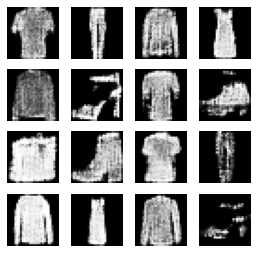

22000: [discriminator loss: 0.668028, acc: 0.578125] [adversarial loss: 0.896282, acc: 0.093750]
22001: [discriminator loss: 0.680763, acc: 0.546875] [adversarial loss: 0.729305, acc: 0.484375]
22002: [discriminator loss: 0.676434, acc: 0.585938] [adversarial loss: 0.756289, acc: 0.250000]
22003: [discriminator loss: 0.676222, acc: 0.625000] [adversarial loss: 0.799221, acc: 0.218750]
22004: [discriminator loss: 0.670884, acc: 0.625000] [adversarial loss: 0.660597, acc: 0.687500]
22005: [discriminator loss: 0.690241, acc: 0.507812] [adversarial loss: 0.762602, acc: 0.406250]
22006: [discriminator loss: 0.672667, acc: 0.578125] [adversarial loss: 0.691835, acc: 0.593750]
22007: [discriminator loss: 0.676152, acc: 0.507812] [adversarial loss: 0.898113, acc: 0.109375]
22008: [discriminator loss: 0.665089, acc: 0.578125] [adversarial loss: 0.612830, acc: 0.703125]
22009: [discriminator loss: 0.666247, acc: 0.570312] [adversarial loss: 0.873043, acc: 0.234375]
22010: [discriminator loss: 0.

22086: [discriminator loss: 0.692782, acc: 0.515625] [adversarial loss: 0.627693, acc: 0.687500]
22087: [discriminator loss: 0.664901, acc: 0.578125] [adversarial loss: 0.795226, acc: 0.218750]
22088: [discriminator loss: 0.672292, acc: 0.601562] [adversarial loss: 0.752244, acc: 0.406250]
22089: [discriminator loss: 0.660923, acc: 0.617188] [adversarial loss: 0.746424, acc: 0.406250]
22090: [discriminator loss: 0.685319, acc: 0.507812] [adversarial loss: 0.675332, acc: 0.609375]
22091: [discriminator loss: 0.676270, acc: 0.570312] [adversarial loss: 0.778719, acc: 0.281250]
22092: [discriminator loss: 0.693228, acc: 0.507812] [adversarial loss: 0.746484, acc: 0.312500]
22093: [discriminator loss: 0.671493, acc: 0.578125] [adversarial loss: 0.694234, acc: 0.515625]
22094: [discriminator loss: 0.669811, acc: 0.570312] [adversarial loss: 0.809699, acc: 0.187500]
22095: [discriminator loss: 0.693694, acc: 0.500000] [adversarial loss: 0.585935, acc: 0.812500]
22096: [discriminator loss: 0.

22173: [discriminator loss: 0.660470, acc: 0.562500] [adversarial loss: 0.777551, acc: 0.265625]
22174: [discriminator loss: 0.673071, acc: 0.554688] [adversarial loss: 0.677156, acc: 0.562500]
22175: [discriminator loss: 0.683640, acc: 0.562500] [adversarial loss: 0.805791, acc: 0.171875]
22176: [discriminator loss: 0.673988, acc: 0.585938] [adversarial loss: 0.713171, acc: 0.500000]
22177: [discriminator loss: 0.660240, acc: 0.562500] [adversarial loss: 0.764467, acc: 0.406250]
22178: [discriminator loss: 0.695164, acc: 0.546875] [adversarial loss: 0.720634, acc: 0.453125]
22179: [discriminator loss: 0.666267, acc: 0.523438] [adversarial loss: 0.722109, acc: 0.406250]
22180: [discriminator loss: 0.692371, acc: 0.531250] [adversarial loss: 0.618287, acc: 0.718750]
22181: [discriminator loss: 0.665007, acc: 0.578125] [adversarial loss: 0.781726, acc: 0.312500]
22182: [discriminator loss: 0.691574, acc: 0.585938] [adversarial loss: 0.659527, acc: 0.609375]
22183: [discriminator loss: 0.

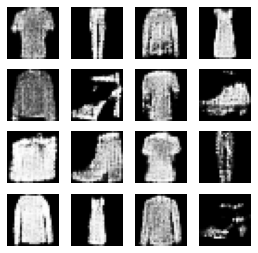

22200: [discriminator loss: 0.667981, acc: 0.593750] [adversarial loss: 0.848094, acc: 0.109375]
22201: [discriminator loss: 0.673114, acc: 0.609375] [adversarial loss: 0.685364, acc: 0.500000]
22202: [discriminator loss: 0.689962, acc: 0.523438] [adversarial loss: 0.776504, acc: 0.328125]
22203: [discriminator loss: 0.640068, acc: 0.648438] [adversarial loss: 0.752495, acc: 0.406250]
22204: [discriminator loss: 0.660029, acc: 0.617188] [adversarial loss: 0.773415, acc: 0.406250]
22205: [discriminator loss: 0.677618, acc: 0.593750] [adversarial loss: 0.743922, acc: 0.296875]
22206: [discriminator loss: 0.664727, acc: 0.554688] [adversarial loss: 0.776302, acc: 0.281250]
22207: [discriminator loss: 0.675920, acc: 0.578125] [adversarial loss: 0.693687, acc: 0.546875]
22208: [discriminator loss: 0.675548, acc: 0.523438] [adversarial loss: 0.790796, acc: 0.265625]
22209: [discriminator loss: 0.666178, acc: 0.578125] [adversarial loss: 0.649433, acc: 0.687500]
22210: [discriminator loss: 0.

22289: [discriminator loss: 0.677396, acc: 0.562500] [adversarial loss: 0.819833, acc: 0.234375]
22290: [discriminator loss: 0.672263, acc: 0.625000] [adversarial loss: 0.689582, acc: 0.515625]
22291: [discriminator loss: 0.653125, acc: 0.601562] [adversarial loss: 0.838521, acc: 0.187500]
22292: [discriminator loss: 0.669005, acc: 0.585938] [adversarial loss: 0.733060, acc: 0.359375]
22293: [discriminator loss: 0.685035, acc: 0.562500] [adversarial loss: 0.806721, acc: 0.218750]
22294: [discriminator loss: 0.660172, acc: 0.601562] [adversarial loss: 0.697529, acc: 0.625000]
22295: [discriminator loss: 0.663606, acc: 0.593750] [adversarial loss: 0.719213, acc: 0.437500]
22296: [discriminator loss: 0.675798, acc: 0.554688] [adversarial loss: 0.856376, acc: 0.171875]
22297: [discriminator loss: 0.679510, acc: 0.562500] [adversarial loss: 0.605686, acc: 0.843750]
22298: [discriminator loss: 0.692020, acc: 0.515625] [adversarial loss: 0.850548, acc: 0.125000]
22299: [discriminator loss: 0.

22374: [discriminator loss: 0.661564, acc: 0.625000] [adversarial loss: 0.779837, acc: 0.250000]
22375: [discriminator loss: 0.659225, acc: 0.617188] [adversarial loss: 0.623173, acc: 0.734375]
22376: [discriminator loss: 0.666550, acc: 0.562500] [adversarial loss: 0.862185, acc: 0.109375]
22377: [discriminator loss: 0.687948, acc: 0.515625] [adversarial loss: 0.658257, acc: 0.625000]
22378: [discriminator loss: 0.665009, acc: 0.554688] [adversarial loss: 0.829121, acc: 0.125000]
22379: [discriminator loss: 0.674103, acc: 0.617188] [adversarial loss: 0.770022, acc: 0.281250]
22380: [discriminator loss: 0.661656, acc: 0.601562] [adversarial loss: 0.743367, acc: 0.375000]
22381: [discriminator loss: 0.684742, acc: 0.546875] [adversarial loss: 0.781114, acc: 0.203125]
22382: [discriminator loss: 0.682866, acc: 0.515625] [adversarial loss: 0.603869, acc: 0.734375]
22383: [discriminator loss: 0.689207, acc: 0.484375] [adversarial loss: 0.953859, acc: 0.078125]
22384: [discriminator loss: 0.

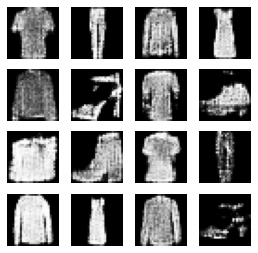

22400: [discriminator loss: 0.695563, acc: 0.546875] [adversarial loss: 0.720472, acc: 0.421875]
22401: [discriminator loss: 0.676344, acc: 0.554688] [adversarial loss: 0.629922, acc: 0.687500]
22402: [discriminator loss: 0.666524, acc: 0.593750] [adversarial loss: 0.817468, acc: 0.187500]
22403: [discriminator loss: 0.686140, acc: 0.578125] [adversarial loss: 0.617747, acc: 0.718750]
22404: [discriminator loss: 0.673107, acc: 0.539062] [adversarial loss: 0.865117, acc: 0.125000]
22405: [discriminator loss: 0.682241, acc: 0.578125] [adversarial loss: 0.674344, acc: 0.515625]
22406: [discriminator loss: 0.673020, acc: 0.570312] [adversarial loss: 0.757104, acc: 0.390625]
22407: [discriminator loss: 0.675825, acc: 0.593750] [adversarial loss: 0.689009, acc: 0.500000]
22408: [discriminator loss: 0.674930, acc: 0.570312] [adversarial loss: 0.817389, acc: 0.218750]
22409: [discriminator loss: 0.680950, acc: 0.585938] [adversarial loss: 0.676852, acc: 0.437500]
22410: [discriminator loss: 0.

22485: [discriminator loss: 0.656910, acc: 0.664062] [adversarial loss: 0.615041, acc: 0.750000]
22486: [discriminator loss: 0.689481, acc: 0.523438] [adversarial loss: 0.843246, acc: 0.125000]
22487: [discriminator loss: 0.678092, acc: 0.562500] [adversarial loss: 0.616238, acc: 0.671875]
22488: [discriminator loss: 0.685944, acc: 0.593750] [adversarial loss: 0.923611, acc: 0.078125]
22489: [discriminator loss: 0.711225, acc: 0.554688] [adversarial loss: 0.619893, acc: 0.750000]
22490: [discriminator loss: 0.664224, acc: 0.570312] [adversarial loss: 0.838756, acc: 0.187500]
22491: [discriminator loss: 0.681746, acc: 0.562500] [adversarial loss: 0.660133, acc: 0.656250]
22492: [discriminator loss: 0.679067, acc: 0.539062] [adversarial loss: 0.769028, acc: 0.343750]
22493: [discriminator loss: 0.665594, acc: 0.609375] [adversarial loss: 0.719503, acc: 0.453125]
22494: [discriminator loss: 0.665746, acc: 0.585938] [adversarial loss: 0.829775, acc: 0.171875]
22495: [discriminator loss: 0.

22570: [discriminator loss: 0.686875, acc: 0.593750] [adversarial loss: 0.679349, acc: 0.515625]
22571: [discriminator loss: 0.704945, acc: 0.515625] [adversarial loss: 0.813808, acc: 0.156250]
22572: [discriminator loss: 0.654661, acc: 0.640625] [adversarial loss: 0.650700, acc: 0.703125]
22573: [discriminator loss: 0.686864, acc: 0.515625] [adversarial loss: 0.823830, acc: 0.156250]
22574: [discriminator loss: 0.699691, acc: 0.562500] [adversarial loss: 0.639543, acc: 0.734375]
22575: [discriminator loss: 0.670412, acc: 0.523438] [adversarial loss: 0.897169, acc: 0.156250]
22576: [discriminator loss: 0.698843, acc: 0.539062] [adversarial loss: 0.646048, acc: 0.609375]
22577: [discriminator loss: 0.685607, acc: 0.523438] [adversarial loss: 0.783703, acc: 0.312500]
22578: [discriminator loss: 0.671070, acc: 0.531250] [adversarial loss: 0.694113, acc: 0.515625]
22579: [discriminator loss: 0.713233, acc: 0.445312] [adversarial loss: 0.714351, acc: 0.562500]
22580: [discriminator loss: 0.

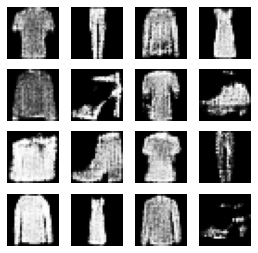

22600: [discriminator loss: 0.662041, acc: 0.617188] [adversarial loss: 0.628490, acc: 0.718750]
22601: [discriminator loss: 0.677423, acc: 0.546875] [adversarial loss: 0.826076, acc: 0.156250]
22602: [discriminator loss: 0.660465, acc: 0.578125] [adversarial loss: 0.600182, acc: 0.796875]
22603: [discriminator loss: 0.688860, acc: 0.554688] [adversarial loss: 0.917957, acc: 0.062500]
22604: [discriminator loss: 0.683992, acc: 0.531250] [adversarial loss: 0.718409, acc: 0.421875]
22605: [discriminator loss: 0.666948, acc: 0.562500] [adversarial loss: 0.786854, acc: 0.250000]
22606: [discriminator loss: 0.680418, acc: 0.625000] [adversarial loss: 0.704834, acc: 0.546875]
22607: [discriminator loss: 0.667481, acc: 0.593750] [adversarial loss: 0.770155, acc: 0.328125]
22608: [discriminator loss: 0.677787, acc: 0.562500] [adversarial loss: 0.720046, acc: 0.468750]
22609: [discriminator loss: 0.658780, acc: 0.632812] [adversarial loss: 0.797009, acc: 0.234375]
22610: [discriminator loss: 0.

22685: [discriminator loss: 0.673610, acc: 0.554688] [adversarial loss: 0.770118, acc: 0.234375]
22686: [discriminator loss: 0.670118, acc: 0.640625] [adversarial loss: 0.727884, acc: 0.453125]
22687: [discriminator loss: 0.698148, acc: 0.507812] [adversarial loss: 0.710049, acc: 0.375000]
22688: [discriminator loss: 0.663767, acc: 0.546875] [adversarial loss: 0.739817, acc: 0.390625]
22689: [discriminator loss: 0.655443, acc: 0.648438] [adversarial loss: 0.665990, acc: 0.609375]
22690: [discriminator loss: 0.650008, acc: 0.632812] [adversarial loss: 0.843513, acc: 0.218750]
22691: [discriminator loss: 0.696369, acc: 0.500000] [adversarial loss: 0.672128, acc: 0.531250]
22692: [discriminator loss: 0.671622, acc: 0.507812] [adversarial loss: 0.832445, acc: 0.187500]
22693: [discriminator loss: 0.683172, acc: 0.570312] [adversarial loss: 0.659128, acc: 0.609375]
22694: [discriminator loss: 0.676129, acc: 0.476562] [adversarial loss: 0.909197, acc: 0.140625]
22695: [discriminator loss: 0.

22773: [discriminator loss: 0.675135, acc: 0.578125] [adversarial loss: 0.849026, acc: 0.109375]
22774: [discriminator loss: 0.675791, acc: 0.585938] [adversarial loss: 0.668951, acc: 0.562500]
22775: [discriminator loss: 0.654758, acc: 0.664062] [adversarial loss: 0.738679, acc: 0.406250]
22776: [discriminator loss: 0.670848, acc: 0.601562] [adversarial loss: 0.628235, acc: 0.703125]
22777: [discriminator loss: 0.662487, acc: 0.578125] [adversarial loss: 0.741916, acc: 0.343750]
22778: [discriminator loss: 0.690091, acc: 0.539062] [adversarial loss: 0.748154, acc: 0.312500]
22779: [discriminator loss: 0.666140, acc: 0.640625] [adversarial loss: 0.723304, acc: 0.484375]
22780: [discriminator loss: 0.677122, acc: 0.562500] [adversarial loss: 0.823182, acc: 0.218750]
22781: [discriminator loss: 0.678155, acc: 0.578125] [adversarial loss: 0.644942, acc: 0.671875]
22782: [discriminator loss: 0.663256, acc: 0.585938] [adversarial loss: 0.799543, acc: 0.328125]
22783: [discriminator loss: 0.

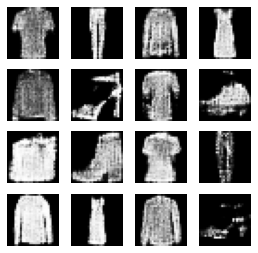

22800: [discriminator loss: 0.671623, acc: 0.617188] [adversarial loss: 0.883923, acc: 0.062500]
22801: [discriminator loss: 0.680366, acc: 0.539062] [adversarial loss: 0.723976, acc: 0.468750]
22802: [discriminator loss: 0.664097, acc: 0.593750] [adversarial loss: 0.707396, acc: 0.453125]
22803: [discriminator loss: 0.682837, acc: 0.546875] [adversarial loss: 0.630598, acc: 0.765625]
22804: [discriminator loss: 0.674867, acc: 0.515625] [adversarial loss: 0.833660, acc: 0.109375]
22805: [discriminator loss: 0.682367, acc: 0.531250] [adversarial loss: 0.596411, acc: 0.875000]
22806: [discriminator loss: 0.669575, acc: 0.585938] [adversarial loss: 0.855359, acc: 0.203125]
22807: [discriminator loss: 0.685672, acc: 0.531250] [adversarial loss: 0.687416, acc: 0.500000]
22808: [discriminator loss: 0.655275, acc: 0.671875] [adversarial loss: 0.683713, acc: 0.546875]
22809: [discriminator loss: 0.677865, acc: 0.593750] [adversarial loss: 0.741558, acc: 0.281250]
22810: [discriminator loss: 0.

22885: [discriminator loss: 0.673244, acc: 0.617188] [adversarial loss: 0.646484, acc: 0.687500]
22886: [discriminator loss: 0.677016, acc: 0.593750] [adversarial loss: 0.908767, acc: 0.015625]
22887: [discriminator loss: 0.663600, acc: 0.593750] [adversarial loss: 0.648369, acc: 0.625000]
22888: [discriminator loss: 0.678359, acc: 0.515625] [adversarial loss: 0.847283, acc: 0.093750]
22889: [discriminator loss: 0.682096, acc: 0.539062] [adversarial loss: 0.645307, acc: 0.671875]
22890: [discriminator loss: 0.689710, acc: 0.523438] [adversarial loss: 0.979421, acc: 0.031250]
22891: [discriminator loss: 0.696079, acc: 0.554688] [adversarial loss: 0.586987, acc: 0.843750]
22892: [discriminator loss: 0.670639, acc: 0.523438] [adversarial loss: 0.759702, acc: 0.406250]
22893: [discriminator loss: 0.692507, acc: 0.523438] [adversarial loss: 0.650936, acc: 0.625000]
22894: [discriminator loss: 0.672545, acc: 0.515625] [adversarial loss: 0.788526, acc: 0.250000]
22895: [discriminator loss: 0.

22972: [discriminator loss: 0.664841, acc: 0.570312] [adversarial loss: 0.729801, acc: 0.328125]
22973: [discriminator loss: 0.675379, acc: 0.578125] [adversarial loss: 0.768155, acc: 0.312500]
22974: [discriminator loss: 0.660052, acc: 0.648438] [adversarial loss: 0.751520, acc: 0.406250]
22975: [discriminator loss: 0.661795, acc: 0.570312] [adversarial loss: 0.740374, acc: 0.390625]
22976: [discriminator loss: 0.663420, acc: 0.617188] [adversarial loss: 0.847615, acc: 0.203125]
22977: [discriminator loss: 0.683961, acc: 0.523438] [adversarial loss: 0.675778, acc: 0.625000]
22978: [discriminator loss: 0.686597, acc: 0.539062] [adversarial loss: 0.873985, acc: 0.125000]
22979: [discriminator loss: 0.683100, acc: 0.601562] [adversarial loss: 0.628022, acc: 0.703125]
22980: [discriminator loss: 0.701750, acc: 0.523438] [adversarial loss: 0.892344, acc: 0.031250]
22981: [discriminator loss: 0.694855, acc: 0.531250] [adversarial loss: 0.673585, acc: 0.625000]
22982: [discriminator loss: 0.

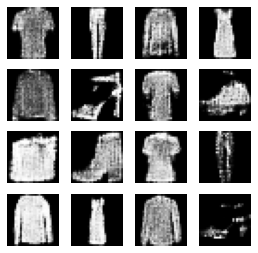

23000: [discriminator loss: 0.705497, acc: 0.500000] [adversarial loss: 0.595928, acc: 0.828125]
23001: [discriminator loss: 0.661063, acc: 0.593750] [adversarial loss: 0.728849, acc: 0.421875]
23002: [discriminator loss: 0.665917, acc: 0.593750] [adversarial loss: 0.763872, acc: 0.296875]
23003: [discriminator loss: 0.670498, acc: 0.593750] [adversarial loss: 0.747187, acc: 0.390625]
23004: [discriminator loss: 0.697434, acc: 0.453125] [adversarial loss: 0.840965, acc: 0.171875]
23005: [discriminator loss: 0.689127, acc: 0.562500] [adversarial loss: 0.663891, acc: 0.546875]
23006: [discriminator loss: 0.669527, acc: 0.570312] [adversarial loss: 0.821401, acc: 0.187500]
23007: [discriminator loss: 0.685085, acc: 0.554688] [adversarial loss: 0.750464, acc: 0.296875]
23008: [discriminator loss: 0.658625, acc: 0.640625] [adversarial loss: 0.808513, acc: 0.156250]
23009: [discriminator loss: 0.670323, acc: 0.593750] [adversarial loss: 0.719050, acc: 0.390625]
23010: [discriminator loss: 0.

23086: [discriminator loss: 0.675075, acc: 0.554688] [adversarial loss: 0.658033, acc: 0.656250]
23087: [discriminator loss: 0.670923, acc: 0.554688] [adversarial loss: 0.878882, acc: 0.078125]
23088: [discriminator loss: 0.667752, acc: 0.593750] [adversarial loss: 0.684485, acc: 0.484375]
23089: [discriminator loss: 0.675073, acc: 0.554688] [adversarial loss: 0.759902, acc: 0.296875]
23090: [discriminator loss: 0.676870, acc: 0.570312] [adversarial loss: 0.732550, acc: 0.453125]
23091: [discriminator loss: 0.651431, acc: 0.585938] [adversarial loss: 0.751987, acc: 0.375000]
23092: [discriminator loss: 0.664695, acc: 0.617188] [adversarial loss: 0.732264, acc: 0.437500]
23093: [discriminator loss: 0.659824, acc: 0.609375] [adversarial loss: 0.772327, acc: 0.328125]
23094: [discriminator loss: 0.692331, acc: 0.546875] [adversarial loss: 0.715133, acc: 0.437500]
23095: [discriminator loss: 0.669763, acc: 0.570312] [adversarial loss: 0.764435, acc: 0.359375]
23096: [discriminator loss: 0.

23172: [discriminator loss: 0.718792, acc: 0.484375] [adversarial loss: 0.915397, acc: 0.093750]
23173: [discriminator loss: 0.692028, acc: 0.531250] [adversarial loss: 0.666834, acc: 0.656250]
23174: [discriminator loss: 0.664562, acc: 0.593750] [adversarial loss: 0.756846, acc: 0.343750]
23175: [discriminator loss: 0.682679, acc: 0.585938] [adversarial loss: 0.762357, acc: 0.281250]
23176: [discriminator loss: 0.675478, acc: 0.585938] [adversarial loss: 0.642731, acc: 0.656250]
23177: [discriminator loss: 0.661893, acc: 0.539062] [adversarial loss: 0.794014, acc: 0.328125]
23178: [discriminator loss: 0.676638, acc: 0.523438] [adversarial loss: 0.777762, acc: 0.250000]
23179: [discriminator loss: 0.676338, acc: 0.570312] [adversarial loss: 0.693359, acc: 0.546875]
23180: [discriminator loss: 0.652173, acc: 0.554688] [adversarial loss: 0.751400, acc: 0.484375]
23181: [discriminator loss: 0.707013, acc: 0.468750] [adversarial loss: 0.750339, acc: 0.359375]
23182: [discriminator loss: 0.

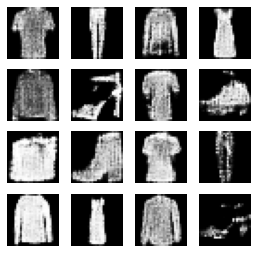

23200: [discriminator loss: 0.668243, acc: 0.640625] [adversarial loss: 0.731592, acc: 0.453125]
23201: [discriminator loss: 0.662476, acc: 0.554688] [adversarial loss: 0.758490, acc: 0.343750]
23202: [discriminator loss: 0.678435, acc: 0.539062] [adversarial loss: 0.744385, acc: 0.234375]
23203: [discriminator loss: 0.689633, acc: 0.500000] [adversarial loss: 0.728665, acc: 0.359375]
23204: [discriminator loss: 0.681048, acc: 0.593750] [adversarial loss: 0.853615, acc: 0.140625]
23205: [discriminator loss: 0.681978, acc: 0.539062] [adversarial loss: 0.686708, acc: 0.562500]
23206: [discriminator loss: 0.671750, acc: 0.585938] [adversarial loss: 0.804058, acc: 0.234375]
23207: [discriminator loss: 0.652944, acc: 0.695312] [adversarial loss: 0.677394, acc: 0.593750]
23208: [discriminator loss: 0.648964, acc: 0.585938] [adversarial loss: 0.777034, acc: 0.359375]
23209: [discriminator loss: 0.689099, acc: 0.515625] [adversarial loss: 0.781713, acc: 0.343750]
23210: [discriminator loss: 0.

23286: [discriminator loss: 0.654613, acc: 0.640625] [adversarial loss: 0.577517, acc: 0.859375]
23287: [discriminator loss: 0.662772, acc: 0.578125] [adversarial loss: 0.841080, acc: 0.234375]
23288: [discriminator loss: 0.706046, acc: 0.539062] [adversarial loss: 0.675537, acc: 0.531250]
23289: [discriminator loss: 0.677514, acc: 0.554688] [adversarial loss: 0.733180, acc: 0.328125]
23290: [discriminator loss: 0.692800, acc: 0.539062] [adversarial loss: 0.779264, acc: 0.218750]
23291: [discriminator loss: 0.672338, acc: 0.570312] [adversarial loss: 0.643925, acc: 0.765625]
23292: [discriminator loss: 0.679215, acc: 0.554688] [adversarial loss: 0.919682, acc: 0.062500]
23293: [discriminator loss: 0.694136, acc: 0.578125] [adversarial loss: 0.702261, acc: 0.531250]
23294: [discriminator loss: 0.662717, acc: 0.578125] [adversarial loss: 0.713829, acc: 0.484375]
23295: [discriminator loss: 0.694948, acc: 0.554688] [adversarial loss: 0.704419, acc: 0.468750]
23296: [discriminator loss: 0.

23371: [discriminator loss: 0.688325, acc: 0.531250] [adversarial loss: 0.685348, acc: 0.546875]
23372: [discriminator loss: 0.671917, acc: 0.632812] [adversarial loss: 0.717487, acc: 0.484375]
23373: [discriminator loss: 0.646044, acc: 0.640625] [adversarial loss: 0.733312, acc: 0.359375]
23374: [discriminator loss: 0.663757, acc: 0.648438] [adversarial loss: 0.737348, acc: 0.453125]
23375: [discriminator loss: 0.672878, acc: 0.523438] [adversarial loss: 0.719529, acc: 0.375000]
23376: [discriminator loss: 0.655876, acc: 0.632812] [adversarial loss: 0.705020, acc: 0.484375]
23377: [discriminator loss: 0.672745, acc: 0.578125] [adversarial loss: 0.740667, acc: 0.343750]
23378: [discriminator loss: 0.686068, acc: 0.562500] [adversarial loss: 0.688903, acc: 0.593750]
23379: [discriminator loss: 0.675869, acc: 0.585938] [adversarial loss: 0.823958, acc: 0.171875]
23380: [discriminator loss: 0.684841, acc: 0.570312] [adversarial loss: 0.725058, acc: 0.531250]
23381: [discriminator loss: 0.

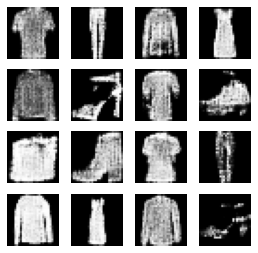

23400: [discriminator loss: 0.687476, acc: 0.515625] [adversarial loss: 0.888752, acc: 0.093750]
23401: [discriminator loss: 0.662398, acc: 0.648438] [adversarial loss: 0.670738, acc: 0.546875]
23402: [discriminator loss: 0.692855, acc: 0.539062] [adversarial loss: 0.800460, acc: 0.171875]
23403: [discriminator loss: 0.678031, acc: 0.609375] [adversarial loss: 0.654313, acc: 0.578125]
23404: [discriminator loss: 0.689068, acc: 0.531250] [adversarial loss: 0.868125, acc: 0.156250]
23405: [discriminator loss: 0.687079, acc: 0.617188] [adversarial loss: 0.601566, acc: 0.625000]
23406: [discriminator loss: 0.711363, acc: 0.539062] [adversarial loss: 0.871380, acc: 0.078125]
23407: [discriminator loss: 0.683895, acc: 0.531250] [adversarial loss: 0.667408, acc: 0.562500]
23408: [discriminator loss: 0.662457, acc: 0.562500] [adversarial loss: 0.712487, acc: 0.437500]
23409: [discriminator loss: 0.674262, acc: 0.601562] [adversarial loss: 0.669737, acc: 0.500000]
23410: [discriminator loss: 0.

23489: [discriminator loss: 0.688488, acc: 0.578125] [adversarial loss: 0.642174, acc: 0.703125]
23490: [discriminator loss: 0.663230, acc: 0.585938] [adversarial loss: 0.744267, acc: 0.328125]
23491: [discriminator loss: 0.678245, acc: 0.546875] [adversarial loss: 0.637439, acc: 0.703125]
23492: [discriminator loss: 0.665711, acc: 0.546875] [adversarial loss: 0.711153, acc: 0.468750]
23493: [discriminator loss: 0.706858, acc: 0.507812] [adversarial loss: 0.755485, acc: 0.359375]
23494: [discriminator loss: 0.660164, acc: 0.640625] [adversarial loss: 0.678441, acc: 0.515625]
23495: [discriminator loss: 0.689514, acc: 0.515625] [adversarial loss: 0.765645, acc: 0.265625]
23496: [discriminator loss: 0.687980, acc: 0.546875] [adversarial loss: 0.704429, acc: 0.500000]
23497: [discriminator loss: 0.662429, acc: 0.585938] [adversarial loss: 0.746718, acc: 0.421875]
23498: [discriminator loss: 0.678296, acc: 0.585938] [adversarial loss: 0.756269, acc: 0.359375]
23499: [discriminator loss: 0.

23577: [discriminator loss: 0.660572, acc: 0.593750] [adversarial loss: 0.852147, acc: 0.046875]
23578: [discriminator loss: 0.670339, acc: 0.593750] [adversarial loss: 0.569349, acc: 0.875000]
23579: [discriminator loss: 0.679176, acc: 0.507812] [adversarial loss: 0.762130, acc: 0.312500]
23580: [discriminator loss: 0.652402, acc: 0.593750] [adversarial loss: 0.728389, acc: 0.406250]
23581: [discriminator loss: 0.665680, acc: 0.585938] [adversarial loss: 0.780970, acc: 0.250000]
23582: [discriminator loss: 0.668615, acc: 0.609375] [adversarial loss: 0.701503, acc: 0.468750]
23583: [discriminator loss: 0.679046, acc: 0.546875] [adversarial loss: 0.846873, acc: 0.265625]
23584: [discriminator loss: 0.682307, acc: 0.593750] [adversarial loss: 0.634663, acc: 0.656250]
23585: [discriminator loss: 0.681712, acc: 0.507812] [adversarial loss: 0.853494, acc: 0.031250]
23586: [discriminator loss: 0.676922, acc: 0.546875] [adversarial loss: 0.698120, acc: 0.531250]
23587: [discriminator loss: 0.

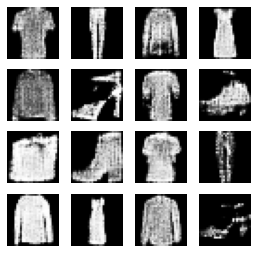

23600: [discriminator loss: 0.682481, acc: 0.578125] [adversarial loss: 0.954635, acc: 0.078125]
23601: [discriminator loss: 0.705446, acc: 0.539062] [adversarial loss: 0.599575, acc: 0.781250]
23602: [discriminator loss: 0.670305, acc: 0.546875] [adversarial loss: 0.809305, acc: 0.296875]
23603: [discriminator loss: 0.646506, acc: 0.609375] [adversarial loss: 0.714485, acc: 0.437500]
23604: [discriminator loss: 0.657769, acc: 0.617188] [adversarial loss: 0.860474, acc: 0.171875]
23605: [discriminator loss: 0.666520, acc: 0.609375] [adversarial loss: 0.623302, acc: 0.703125]
23606: [discriminator loss: 0.697872, acc: 0.523438] [adversarial loss: 0.771118, acc: 0.265625]
23607: [discriminator loss: 0.643980, acc: 0.679688] [adversarial loss: 0.671674, acc: 0.640625]
23608: [discriminator loss: 0.689664, acc: 0.500000] [adversarial loss: 0.931191, acc: 0.015625]
23609: [discriminator loss: 0.685019, acc: 0.578125] [adversarial loss: 0.710186, acc: 0.500000]
23610: [discriminator loss: 0.

23686: [discriminator loss: 0.665013, acc: 0.585938] [adversarial loss: 0.784268, acc: 0.312500]
23687: [discriminator loss: 0.679021, acc: 0.570312] [adversarial loss: 0.613459, acc: 0.734375]
23688: [discriminator loss: 0.671386, acc: 0.570312] [adversarial loss: 0.797768, acc: 0.296875]
23689: [discriminator loss: 0.690188, acc: 0.546875] [adversarial loss: 0.744349, acc: 0.406250]
23690: [discriminator loss: 0.668887, acc: 0.570312] [adversarial loss: 0.708495, acc: 0.515625]
23691: [discriminator loss: 0.704842, acc: 0.476562] [adversarial loss: 0.822875, acc: 0.140625]
23692: [discriminator loss: 0.679241, acc: 0.578125] [adversarial loss: 0.643135, acc: 0.687500]
23693: [discriminator loss: 0.673905, acc: 0.531250] [adversarial loss: 0.697117, acc: 0.546875]
23694: [discriminator loss: 0.666867, acc: 0.593750] [adversarial loss: 0.731245, acc: 0.375000]
23695: [discriminator loss: 0.664230, acc: 0.601562] [adversarial loss: 0.746473, acc: 0.343750]
23696: [discriminator loss: 0.

23773: [discriminator loss: 0.664750, acc: 0.648438] [adversarial loss: 0.673907, acc: 0.609375]
23774: [discriminator loss: 0.657092, acc: 0.671875] [adversarial loss: 0.786641, acc: 0.281250]
23775: [discriminator loss: 0.670535, acc: 0.617188] [adversarial loss: 0.697138, acc: 0.515625]
23776: [discriminator loss: 0.684401, acc: 0.523438] [adversarial loss: 0.665272, acc: 0.593750]
23777: [discriminator loss: 0.661671, acc: 0.601562] [adversarial loss: 0.728140, acc: 0.406250]
23778: [discriminator loss: 0.666685, acc: 0.546875] [adversarial loss: 0.642018, acc: 0.703125]
23779: [discriminator loss: 0.664922, acc: 0.554688] [adversarial loss: 0.796846, acc: 0.171875]
23780: [discriminator loss: 0.659572, acc: 0.593750] [adversarial loss: 0.740613, acc: 0.359375]
23781: [discriminator loss: 0.665517, acc: 0.625000] [adversarial loss: 0.637076, acc: 0.656250]
23782: [discriminator loss: 0.693223, acc: 0.515625] [adversarial loss: 0.970452, acc: 0.078125]
23783: [discriminator loss: 0.

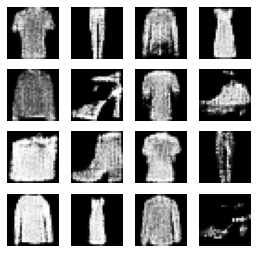

23800: [discriminator loss: 0.669078, acc: 0.562500] [adversarial loss: 0.765257, acc: 0.375000]
23801: [discriminator loss: 0.682006, acc: 0.492188] [adversarial loss: 0.744446, acc: 0.375000]
23802: [discriminator loss: 0.663359, acc: 0.578125] [adversarial loss: 0.666972, acc: 0.609375]
23803: [discriminator loss: 0.666368, acc: 0.593750] [adversarial loss: 0.821813, acc: 0.171875]
23804: [discriminator loss: 0.661956, acc: 0.671875] [adversarial loss: 0.697642, acc: 0.546875]
23805: [discriminator loss: 0.666717, acc: 0.601562] [adversarial loss: 0.814035, acc: 0.203125]
23806: [discriminator loss: 0.693753, acc: 0.539062] [adversarial loss: 0.605680, acc: 0.750000]
23807: [discriminator loss: 0.669171, acc: 0.570312] [adversarial loss: 0.813885, acc: 0.250000]
23808: [discriminator loss: 0.682921, acc: 0.554688] [adversarial loss: 0.606619, acc: 0.812500]
23809: [discriminator loss: 0.662069, acc: 0.578125] [adversarial loss: 0.720568, acc: 0.343750]
23810: [discriminator loss: 0.

23886: [discriminator loss: 0.681593, acc: 0.578125] [adversarial loss: 0.714490, acc: 0.406250]
23887: [discriminator loss: 0.647975, acc: 0.632812] [adversarial loss: 0.741387, acc: 0.390625]
23888: [discriminator loss: 0.692582, acc: 0.562500] [adversarial loss: 0.704528, acc: 0.484375]
23889: [discriminator loss: 0.670795, acc: 0.578125] [adversarial loss: 0.812707, acc: 0.109375]
23890: [discriminator loss: 0.671301, acc: 0.593750] [adversarial loss: 0.655989, acc: 0.640625]
23891: [discriminator loss: 0.691002, acc: 0.546875] [adversarial loss: 0.732728, acc: 0.359375]
23892: [discriminator loss: 0.675188, acc: 0.570312] [adversarial loss: 0.854674, acc: 0.234375]
23893: [discriminator loss: 0.677065, acc: 0.585938] [adversarial loss: 0.659915, acc: 0.609375]
23894: [discriminator loss: 0.668900, acc: 0.585938] [adversarial loss: 0.895677, acc: 0.109375]
23895: [discriminator loss: 0.677000, acc: 0.562500] [adversarial loss: 0.614365, acc: 0.718750]
23896: [discriminator loss: 0.

23976: [discriminator loss: 0.685924, acc: 0.593750] [adversarial loss: 0.846931, acc: 0.171875]
23977: [discriminator loss: 0.667362, acc: 0.648438] [adversarial loss: 0.619328, acc: 0.796875]
23978: [discriminator loss: 0.698692, acc: 0.507812] [adversarial loss: 0.837889, acc: 0.156250]
23979: [discriminator loss: 0.671273, acc: 0.601562] [adversarial loss: 0.634813, acc: 0.718750]
23980: [discriminator loss: 0.672999, acc: 0.523438] [adversarial loss: 0.837682, acc: 0.156250]
23981: [discriminator loss: 0.669231, acc: 0.601562] [adversarial loss: 0.650667, acc: 0.687500]
23982: [discriminator loss: 0.671677, acc: 0.523438] [adversarial loss: 0.754830, acc: 0.328125]
23983: [discriminator loss: 0.673037, acc: 0.601562] [adversarial loss: 0.782737, acc: 0.250000]
23984: [discriminator loss: 0.681718, acc: 0.531250] [adversarial loss: 0.662122, acc: 0.609375]
23985: [discriminator loss: 0.670161, acc: 0.585938] [adversarial loss: 0.706764, acc: 0.484375]
23986: [discriminator loss: 0.

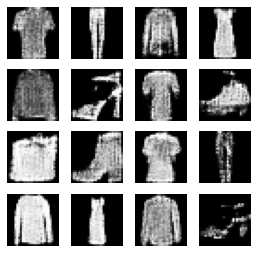

24000: [discriminator loss: 0.680790, acc: 0.554688] [adversarial loss: 0.691889, acc: 0.500000]
24001: [discriminator loss: 0.668963, acc: 0.585938] [adversarial loss: 0.757871, acc: 0.390625]
24002: [discriminator loss: 0.686357, acc: 0.523438] [adversarial loss: 0.728069, acc: 0.437500]
24003: [discriminator loss: 0.681280, acc: 0.585938] [adversarial loss: 0.672559, acc: 0.531250]
24004: [discriminator loss: 0.664931, acc: 0.593750] [adversarial loss: 0.704133, acc: 0.421875]
24005: [discriminator loss: 0.662941, acc: 0.593750] [adversarial loss: 0.661858, acc: 0.593750]
24006: [discriminator loss: 0.669515, acc: 0.539062] [adversarial loss: 0.733572, acc: 0.375000]
24007: [discriminator loss: 0.652978, acc: 0.656250] [adversarial loss: 0.842508, acc: 0.234375]
24008: [discriminator loss: 0.673663, acc: 0.585938] [adversarial loss: 0.607043, acc: 0.765625]
24009: [discriminator loss: 0.696749, acc: 0.507812] [adversarial loss: 0.895257, acc: 0.062500]
24010: [discriminator loss: 0.

24089: [discriminator loss: 0.674264, acc: 0.515625] [adversarial loss: 0.801514, acc: 0.187500]
24090: [discriminator loss: 0.683392, acc: 0.578125] [adversarial loss: 0.754091, acc: 0.312500]
24091: [discriminator loss: 0.694346, acc: 0.523438] [adversarial loss: 0.723481, acc: 0.437500]
24092: [discriminator loss: 0.674513, acc: 0.531250] [adversarial loss: 0.722964, acc: 0.468750]
24093: [discriminator loss: 0.690801, acc: 0.531250] [adversarial loss: 0.683982, acc: 0.531250]
24094: [discriminator loss: 0.684862, acc: 0.593750] [adversarial loss: 0.711586, acc: 0.421875]
24095: [discriminator loss: 0.657042, acc: 0.601562] [adversarial loss: 0.758961, acc: 0.328125]
24096: [discriminator loss: 0.682985, acc: 0.546875] [adversarial loss: 0.649302, acc: 0.703125]
24097: [discriminator loss: 0.699639, acc: 0.492188] [adversarial loss: 0.894919, acc: 0.046875]
24098: [discriminator loss: 0.711325, acc: 0.515625] [adversarial loss: 0.621637, acc: 0.671875]
24099: [discriminator loss: 0.

24176: [discriminator loss: 0.666741, acc: 0.570312] [adversarial loss: 0.720524, acc: 0.453125]
24177: [discriminator loss: 0.675343, acc: 0.585938] [adversarial loss: 0.874671, acc: 0.062500]
24178: [discriminator loss: 0.695648, acc: 0.554688] [adversarial loss: 0.721935, acc: 0.390625]
24179: [discriminator loss: 0.663225, acc: 0.578125] [adversarial loss: 0.725854, acc: 0.390625]
24180: [discriminator loss: 0.672325, acc: 0.609375] [adversarial loss: 0.616358, acc: 0.796875]
24181: [discriminator loss: 0.716394, acc: 0.507812] [adversarial loss: 0.894533, acc: 0.031250]
24182: [discriminator loss: 0.679756, acc: 0.546875] [adversarial loss: 0.654844, acc: 0.640625]
24183: [discriminator loss: 0.686566, acc: 0.500000] [adversarial loss: 0.785721, acc: 0.218750]
24184: [discriminator loss: 0.667726, acc: 0.578125] [adversarial loss: 0.746695, acc: 0.328125]
24185: [discriminator loss: 0.685148, acc: 0.562500] [adversarial loss: 0.700117, acc: 0.593750]
24186: [discriminator loss: 0.

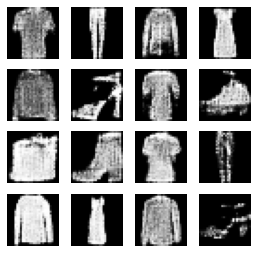

24200: [discriminator loss: 0.657801, acc: 0.617188] [adversarial loss: 0.632469, acc: 0.765625]
24201: [discriminator loss: 0.674441, acc: 0.546875] [adversarial loss: 0.870576, acc: 0.125000]
24202: [discriminator loss: 0.684780, acc: 0.539062] [adversarial loss: 0.673564, acc: 0.515625]
24203: [discriminator loss: 0.686074, acc: 0.515625] [adversarial loss: 0.846355, acc: 0.171875]
24204: [discriminator loss: 0.684018, acc: 0.562500] [adversarial loss: 0.698254, acc: 0.468750]
24205: [discriminator loss: 0.692685, acc: 0.515625] [adversarial loss: 0.718491, acc: 0.500000]
24206: [discriminator loss: 0.645345, acc: 0.632812] [adversarial loss: 0.820965, acc: 0.171875]
24207: [discriminator loss: 0.672676, acc: 0.593750] [adversarial loss: 0.732743, acc: 0.390625]
24208: [discriminator loss: 0.669172, acc: 0.531250] [adversarial loss: 0.806086, acc: 0.281250]
24209: [discriminator loss: 0.684801, acc: 0.500000] [adversarial loss: 0.718827, acc: 0.437500]
24210: [discriminator loss: 0.

24288: [discriminator loss: 0.669809, acc: 0.601562] [adversarial loss: 0.686265, acc: 0.546875]
24289: [discriminator loss: 0.666058, acc: 0.601562] [adversarial loss: 0.698956, acc: 0.453125]
24290: [discriminator loss: 0.681036, acc: 0.625000] [adversarial loss: 0.760974, acc: 0.328125]
24291: [discriminator loss: 0.650930, acc: 0.671875] [adversarial loss: 0.723489, acc: 0.343750]
24292: [discriminator loss: 0.671729, acc: 0.601562] [adversarial loss: 0.613619, acc: 0.703125]
24293: [discriminator loss: 0.670504, acc: 0.578125] [adversarial loss: 0.881176, acc: 0.203125]
24294: [discriminator loss: 0.691036, acc: 0.523438] [adversarial loss: 0.612539, acc: 0.796875]
24295: [discriminator loss: 0.678393, acc: 0.500000] [adversarial loss: 0.796933, acc: 0.234375]
24296: [discriminator loss: 0.669427, acc: 0.609375] [adversarial loss: 0.697673, acc: 0.500000]
24297: [discriminator loss: 0.662723, acc: 0.609375] [adversarial loss: 0.738933, acc: 0.375000]
24298: [discriminator loss: 0.

24375: [discriminator loss: 0.675002, acc: 0.523438] [adversarial loss: 0.824072, acc: 0.171875]
24376: [discriminator loss: 0.686524, acc: 0.562500] [adversarial loss: 0.642057, acc: 0.671875]
24377: [discriminator loss: 0.693891, acc: 0.531250] [adversarial loss: 0.767646, acc: 0.281250]
24378: [discriminator loss: 0.672373, acc: 0.609375] [adversarial loss: 0.651406, acc: 0.656250]
24379: [discriminator loss: 0.697154, acc: 0.585938] [adversarial loss: 0.773383, acc: 0.312500]
24380: [discriminator loss: 0.659266, acc: 0.601562] [adversarial loss: 0.778819, acc: 0.328125]
24381: [discriminator loss: 0.676050, acc: 0.601562] [adversarial loss: 0.690063, acc: 0.500000]
24382: [discriminator loss: 0.669904, acc: 0.562500] [adversarial loss: 0.778175, acc: 0.312500]
24383: [discriminator loss: 0.640816, acc: 0.648438] [adversarial loss: 0.805188, acc: 0.312500]
24384: [discriminator loss: 0.694157, acc: 0.515625] [adversarial loss: 0.722518, acc: 0.359375]
24385: [discriminator loss: 0.

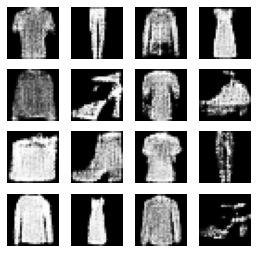

24400: [discriminator loss: 0.688578, acc: 0.593750] [adversarial loss: 0.681565, acc: 0.609375]
24401: [discriminator loss: 0.680640, acc: 0.570312] [adversarial loss: 0.812227, acc: 0.187500]
24402: [discriminator loss: 0.660138, acc: 0.585938] [adversarial loss: 0.704749, acc: 0.484375]
24403: [discriminator loss: 0.661441, acc: 0.539062] [adversarial loss: 0.748848, acc: 0.328125]
24404: [discriminator loss: 0.656505, acc: 0.664062] [adversarial loss: 0.677099, acc: 0.593750]
24405: [discriminator loss: 0.665103, acc: 0.617188] [adversarial loss: 0.852179, acc: 0.187500]
24406: [discriminator loss: 0.678322, acc: 0.601562] [adversarial loss: 0.706085, acc: 0.421875]
24407: [discriminator loss: 0.665740, acc: 0.617188] [adversarial loss: 0.747260, acc: 0.375000]
24408: [discriminator loss: 0.709317, acc: 0.507812] [adversarial loss: 0.666664, acc: 0.625000]
24409: [discriminator loss: 0.675327, acc: 0.562500] [adversarial loss: 0.819179, acc: 0.140625]
24410: [discriminator loss: 0.

24486: [discriminator loss: 0.671885, acc: 0.515625] [adversarial loss: 0.746362, acc: 0.453125]
24487: [discriminator loss: 0.674196, acc: 0.523438] [adversarial loss: 0.785269, acc: 0.265625]
24488: [discriminator loss: 0.686241, acc: 0.554688] [adversarial loss: 0.716424, acc: 0.500000]
24489: [discriminator loss: 0.683307, acc: 0.562500] [adversarial loss: 0.777653, acc: 0.234375]
24490: [discriminator loss: 0.659009, acc: 0.679688] [adversarial loss: 0.811396, acc: 0.234375]
24491: [discriminator loss: 0.645578, acc: 0.695312] [adversarial loss: 0.637327, acc: 0.671875]
24492: [discriminator loss: 0.684863, acc: 0.546875] [adversarial loss: 0.726664, acc: 0.437500]
24493: [discriminator loss: 0.671447, acc: 0.523438] [adversarial loss: 0.775458, acc: 0.312500]
24494: [discriminator loss: 0.657826, acc: 0.601562] [adversarial loss: 0.759626, acc: 0.375000]
24495: [discriminator loss: 0.681285, acc: 0.539062] [adversarial loss: 0.728526, acc: 0.531250]
24496: [discriminator loss: 0.

24572: [discriminator loss: 0.672586, acc: 0.570312] [adversarial loss: 0.770206, acc: 0.250000]
24573: [discriminator loss: 0.682656, acc: 0.554688] [adversarial loss: 0.671855, acc: 0.640625]
24574: [discriminator loss: 0.681715, acc: 0.570312] [adversarial loss: 0.758749, acc: 0.296875]
24575: [discriminator loss: 0.653387, acc: 0.687500] [adversarial loss: 0.686351, acc: 0.515625]
24576: [discriminator loss: 0.683362, acc: 0.546875] [adversarial loss: 0.772765, acc: 0.218750]
24577: [discriminator loss: 0.673114, acc: 0.570312] [adversarial loss: 0.770035, acc: 0.265625]
24578: [discriminator loss: 0.673558, acc: 0.554688] [adversarial loss: 0.684353, acc: 0.500000]
24579: [discriminator loss: 0.692461, acc: 0.546875] [adversarial loss: 0.752813, acc: 0.359375]
24580: [discriminator loss: 0.660203, acc: 0.640625] [adversarial loss: 0.743659, acc: 0.453125]
24581: [discriminator loss: 0.679971, acc: 0.554688] [adversarial loss: 0.753964, acc: 0.343750]
24582: [discriminator loss: 0.

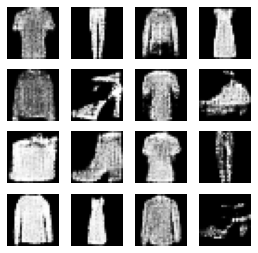

24600: [discriminator loss: 0.687475, acc: 0.507812] [adversarial loss: 0.826671, acc: 0.156250]
24601: [discriminator loss: 0.674770, acc: 0.562500] [adversarial loss: 0.655993, acc: 0.703125]
24602: [discriminator loss: 0.662147, acc: 0.554688] [adversarial loss: 0.693967, acc: 0.515625]
24603: [discriminator loss: 0.668386, acc: 0.578125] [adversarial loss: 0.856172, acc: 0.234375]
24604: [discriminator loss: 0.680577, acc: 0.578125] [adversarial loss: 0.716083, acc: 0.562500]
24605: [discriminator loss: 0.679424, acc: 0.523438] [adversarial loss: 0.855551, acc: 0.203125]
24606: [discriminator loss: 0.659290, acc: 0.671875] [adversarial loss: 0.673725, acc: 0.656250]
24607: [discriminator loss: 0.680380, acc: 0.546875] [adversarial loss: 0.723556, acc: 0.406250]
24608: [discriminator loss: 0.678983, acc: 0.554688] [adversarial loss: 0.848111, acc: 0.156250]
24609: [discriminator loss: 0.696276, acc: 0.531250] [adversarial loss: 0.686009, acc: 0.562500]
24610: [discriminator loss: 0.

24686: [discriminator loss: 0.664231, acc: 0.546875] [adversarial loss: 0.799931, acc: 0.281250]
24687: [discriminator loss: 0.698922, acc: 0.554688] [adversarial loss: 0.666434, acc: 0.593750]
24688: [discriminator loss: 0.680569, acc: 0.554688] [adversarial loss: 0.811421, acc: 0.203125]
24689: [discriminator loss: 0.680337, acc: 0.523438] [adversarial loss: 0.695297, acc: 0.515625]
24690: [discriminator loss: 0.664387, acc: 0.609375] [adversarial loss: 0.743814, acc: 0.390625]
24691: [discriminator loss: 0.663713, acc: 0.632812] [adversarial loss: 0.785023, acc: 0.203125]
24692: [discriminator loss: 0.646734, acc: 0.617188] [adversarial loss: 0.746260, acc: 0.343750]
24693: [discriminator loss: 0.655661, acc: 0.617188] [adversarial loss: 0.718540, acc: 0.390625]
24694: [discriminator loss: 0.667637, acc: 0.593750] [adversarial loss: 0.713847, acc: 0.312500]
24695: [discriminator loss: 0.668167, acc: 0.695312] [adversarial loss: 0.790767, acc: 0.312500]
24696: [discriminator loss: 0.

24774: [discriminator loss: 0.679428, acc: 0.546875] [adversarial loss: 0.823331, acc: 0.187500]
24775: [discriminator loss: 0.666330, acc: 0.601562] [adversarial loss: 0.702308, acc: 0.468750]
24776: [discriminator loss: 0.675187, acc: 0.578125] [adversarial loss: 0.752762, acc: 0.296875]
24777: [discriminator loss: 0.697738, acc: 0.507812] [adversarial loss: 0.801973, acc: 0.109375]
24778: [discriminator loss: 0.658351, acc: 0.609375] [adversarial loss: 0.769004, acc: 0.390625]
24779: [discriminator loss: 0.685930, acc: 0.546875] [adversarial loss: 0.823014, acc: 0.234375]
24780: [discriminator loss: 0.647934, acc: 0.609375] [adversarial loss: 0.635247, acc: 0.656250]
24781: [discriminator loss: 0.684358, acc: 0.539062] [adversarial loss: 0.921002, acc: 0.078125]
24782: [discriminator loss: 0.683313, acc: 0.585938] [adversarial loss: 0.691108, acc: 0.562500]
24783: [discriminator loss: 0.687090, acc: 0.578125] [adversarial loss: 0.816915, acc: 0.171875]
24784: [discriminator loss: 0.

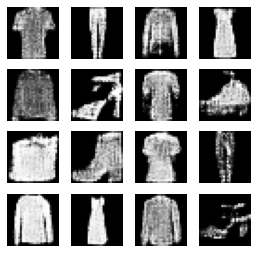

24800: [discriminator loss: 0.672869, acc: 0.585938] [adversarial loss: 0.817946, acc: 0.156250]
24801: [discriminator loss: 0.674203, acc: 0.601562] [adversarial loss: 0.683471, acc: 0.515625]
24802: [discriminator loss: 0.655861, acc: 0.625000] [adversarial loss: 0.710220, acc: 0.421875]
24803: [discriminator loss: 0.679901, acc: 0.585938] [adversarial loss: 0.749610, acc: 0.312500]
24804: [discriminator loss: 0.664099, acc: 0.625000] [adversarial loss: 0.764126, acc: 0.437500]
24805: [discriminator loss: 0.710240, acc: 0.460938] [adversarial loss: 0.708265, acc: 0.484375]
24806: [discriminator loss: 0.674895, acc: 0.593750] [adversarial loss: 0.708617, acc: 0.468750]
24807: [discriminator loss: 0.675099, acc: 0.554688] [adversarial loss: 0.752399, acc: 0.281250]
24808: [discriminator loss: 0.704160, acc: 0.468750] [adversarial loss: 0.814072, acc: 0.265625]
24809: [discriminator loss: 0.667720, acc: 0.601562] [adversarial loss: 0.714709, acc: 0.453125]
24810: [discriminator loss: 0.

24886: [discriminator loss: 0.696115, acc: 0.500000] [adversarial loss: 0.938753, acc: 0.031250]
24887: [discriminator loss: 0.675151, acc: 0.593750] [adversarial loss: 0.710338, acc: 0.468750]
24888: [discriminator loss: 0.667259, acc: 0.523438] [adversarial loss: 0.706800, acc: 0.593750]
24889: [discriminator loss: 0.664904, acc: 0.609375] [adversarial loss: 0.777576, acc: 0.296875]
24890: [discriminator loss: 0.674229, acc: 0.593750] [adversarial loss: 0.807169, acc: 0.187500]
24891: [discriminator loss: 0.650359, acc: 0.640625] [adversarial loss: 0.745821, acc: 0.390625]
24892: [discriminator loss: 0.679461, acc: 0.585938] [adversarial loss: 0.706169, acc: 0.437500]
24893: [discriminator loss: 0.690028, acc: 0.453125] [adversarial loss: 0.652288, acc: 0.578125]
24894: [discriminator loss: 0.675881, acc: 0.562500] [adversarial loss: 0.915727, acc: 0.250000]
24895: [discriminator loss: 0.671465, acc: 0.578125] [adversarial loss: 0.625353, acc: 0.687500]
24896: [discriminator loss: 0.

24975: [discriminator loss: 0.656944, acc: 0.671875] [adversarial loss: 0.703039, acc: 0.500000]
24976: [discriminator loss: 0.665479, acc: 0.570312] [adversarial loss: 0.648856, acc: 0.593750]
24977: [discriminator loss: 0.684053, acc: 0.507812] [adversarial loss: 0.872097, acc: 0.187500]
24978: [discriminator loss: 0.691030, acc: 0.546875] [adversarial loss: 0.634806, acc: 0.656250]
24979: [discriminator loss: 0.679401, acc: 0.546875] [adversarial loss: 0.793979, acc: 0.171875]
24980: [discriminator loss: 0.671752, acc: 0.578125] [adversarial loss: 0.698189, acc: 0.453125]
24981: [discriminator loss: 0.675800, acc: 0.546875] [adversarial loss: 0.693507, acc: 0.515625]
24982: [discriminator loss: 0.655170, acc: 0.593750] [adversarial loss: 0.670509, acc: 0.578125]
24983: [discriminator loss: 0.669829, acc: 0.570312] [adversarial loss: 0.693194, acc: 0.562500]
24984: [discriminator loss: 0.654173, acc: 0.640625] [adversarial loss: 0.687129, acc: 0.515625]
24985: [discriminator loss: 0.

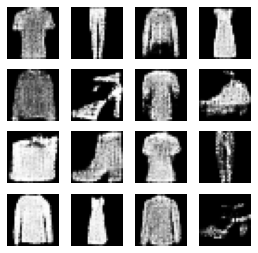

25000: [discriminator loss: 0.664554, acc: 0.601562] [adversarial loss: 0.773476, acc: 0.281250]
25001: [discriminator loss: 0.687356, acc: 0.562500] [adversarial loss: 0.761556, acc: 0.328125]
25002: [discriminator loss: 0.667525, acc: 0.601562] [adversarial loss: 0.674446, acc: 0.546875]
25003: [discriminator loss: 0.684015, acc: 0.531250] [adversarial loss: 0.826890, acc: 0.187500]
25004: [discriminator loss: 0.665582, acc: 0.648438] [adversarial loss: 0.675592, acc: 0.609375]
25005: [discriminator loss: 0.666801, acc: 0.593750] [adversarial loss: 0.837325, acc: 0.281250]
25006: [discriminator loss: 0.667373, acc: 0.609375] [adversarial loss: 0.693179, acc: 0.531250]
25007: [discriminator loss: 0.688036, acc: 0.546875] [adversarial loss: 0.766460, acc: 0.343750]
25008: [discriminator loss: 0.669341, acc: 0.562500] [adversarial loss: 0.753086, acc: 0.265625]
25009: [discriminator loss: 0.690624, acc: 0.523438] [adversarial loss: 0.658413, acc: 0.609375]
25010: [discriminator loss: 0.

25088: [discriminator loss: 0.654645, acc: 0.648438] [adversarial loss: 0.773410, acc: 0.281250]
25089: [discriminator loss: 0.694626, acc: 0.492188] [adversarial loss: 0.733318, acc: 0.421875]
25090: [discriminator loss: 0.660495, acc: 0.593750] [adversarial loss: 0.835955, acc: 0.171875]
25091: [discriminator loss: 0.668157, acc: 0.578125] [adversarial loss: 0.635713, acc: 0.640625]
25092: [discriminator loss: 0.685732, acc: 0.601562] [adversarial loss: 0.710414, acc: 0.421875]
25093: [discriminator loss: 0.652071, acc: 0.601562] [adversarial loss: 0.842319, acc: 0.203125]
25094: [discriminator loss: 0.644170, acc: 0.625000] [adversarial loss: 0.784903, acc: 0.312500]
25095: [discriminator loss: 0.700311, acc: 0.546875] [adversarial loss: 0.583150, acc: 0.671875]
25096: [discriminator loss: 0.697232, acc: 0.578125] [adversarial loss: 0.946217, acc: 0.046875]
25097: [discriminator loss: 0.690210, acc: 0.546875] [adversarial loss: 0.668068, acc: 0.609375]
25098: [discriminator loss: 0.

25176: [discriminator loss: 0.693033, acc: 0.539062] [adversarial loss: 0.613330, acc: 0.796875]
25177: [discriminator loss: 0.688879, acc: 0.539062] [adversarial loss: 0.852290, acc: 0.093750]
25178: [discriminator loss: 0.681356, acc: 0.531250] [adversarial loss: 0.687846, acc: 0.562500]
25179: [discriminator loss: 0.683448, acc: 0.523438] [adversarial loss: 0.687559, acc: 0.578125]
25180: [discriminator loss: 0.662567, acc: 0.632812] [adversarial loss: 0.785482, acc: 0.265625]
25181: [discriminator loss: 0.664882, acc: 0.585938] [adversarial loss: 0.673558, acc: 0.531250]
25182: [discriminator loss: 0.684186, acc: 0.539062] [adversarial loss: 0.722912, acc: 0.406250]
25183: [discriminator loss: 0.681793, acc: 0.585938] [adversarial loss: 0.669646, acc: 0.515625]
25184: [discriminator loss: 0.697380, acc: 0.515625] [adversarial loss: 0.758007, acc: 0.359375]
25185: [discriminator loss: 0.666076, acc: 0.585938] [adversarial loss: 0.803282, acc: 0.281250]
25186: [discriminator loss: 0.

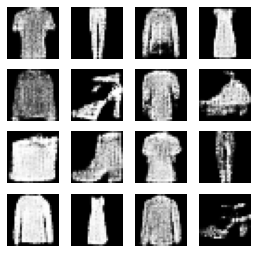

25200: [discriminator loss: 0.655088, acc: 0.632812] [adversarial loss: 0.838663, acc: 0.140625]
25201: [discriminator loss: 0.657424, acc: 0.593750] [adversarial loss: 0.742765, acc: 0.390625]
25202: [discriminator loss: 0.688519, acc: 0.578125] [adversarial loss: 0.624982, acc: 0.734375]
25203: [discriminator loss: 0.684028, acc: 0.609375] [adversarial loss: 0.840214, acc: 0.171875]
25204: [discriminator loss: 0.697034, acc: 0.593750] [adversarial loss: 0.718394, acc: 0.484375]
25205: [discriminator loss: 0.668722, acc: 0.609375] [adversarial loss: 0.832731, acc: 0.187500]
25206: [discriminator loss: 0.637285, acc: 0.656250] [adversarial loss: 0.604855, acc: 0.843750]
25207: [discriminator loss: 0.684709, acc: 0.539062] [adversarial loss: 0.831286, acc: 0.171875]
25208: [discriminator loss: 0.667184, acc: 0.632812] [adversarial loss: 0.702674, acc: 0.515625]
25209: [discriminator loss: 0.688276, acc: 0.554688] [adversarial loss: 0.744956, acc: 0.421875]
25210: [discriminator loss: 0.

25287: [discriminator loss: 0.672802, acc: 0.554688] [adversarial loss: 0.646145, acc: 0.687500]
25288: [discriminator loss: 0.684615, acc: 0.546875] [adversarial loss: 0.761141, acc: 0.390625]
25289: [discriminator loss: 0.667984, acc: 0.617188] [adversarial loss: 0.712758, acc: 0.468750]
25290: [discriminator loss: 0.669288, acc: 0.593750] [adversarial loss: 0.727412, acc: 0.312500]
25291: [discriminator loss: 0.667007, acc: 0.601562] [adversarial loss: 0.698611, acc: 0.515625]
25292: [discriminator loss: 0.681382, acc: 0.515625] [adversarial loss: 0.762394, acc: 0.265625]
25293: [discriminator loss: 0.686498, acc: 0.593750] [adversarial loss: 0.771416, acc: 0.218750]
25294: [discriminator loss: 0.675402, acc: 0.640625] [adversarial loss: 0.602840, acc: 0.828125]
25295: [discriminator loss: 0.670455, acc: 0.562500] [adversarial loss: 0.835160, acc: 0.203125]
25296: [discriminator loss: 0.694005, acc: 0.531250] [adversarial loss: 0.650343, acc: 0.593750]
25297: [discriminator loss: 0.

25376: [discriminator loss: 0.655081, acc: 0.617188] [adversarial loss: 0.642585, acc: 0.640625]
25377: [discriminator loss: 0.644312, acc: 0.625000] [adversarial loss: 0.657465, acc: 0.625000]
25378: [discriminator loss: 0.666412, acc: 0.523438] [adversarial loss: 0.727866, acc: 0.312500]
25379: [discriminator loss: 0.680221, acc: 0.578125] [adversarial loss: 0.725023, acc: 0.406250]
25380: [discriminator loss: 0.696527, acc: 0.476562] [adversarial loss: 0.747329, acc: 0.421875]
25381: [discriminator loss: 0.659707, acc: 0.609375] [adversarial loss: 0.692738, acc: 0.515625]
25382: [discriminator loss: 0.665553, acc: 0.617188] [adversarial loss: 0.777955, acc: 0.296875]
25383: [discriminator loss: 0.678751, acc: 0.578125] [adversarial loss: 0.657206, acc: 0.625000]
25384: [discriminator loss: 0.688935, acc: 0.507812] [adversarial loss: 0.811171, acc: 0.109375]
25385: [discriminator loss: 0.669495, acc: 0.585938] [adversarial loss: 0.739691, acc: 0.453125]
25386: [discriminator loss: 0.

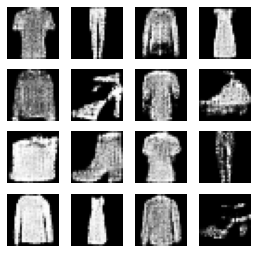

25400: [discriminator loss: 0.675077, acc: 0.546875] [adversarial loss: 0.751029, acc: 0.375000]
25401: [discriminator loss: 0.673701, acc: 0.539062] [adversarial loss: 0.718594, acc: 0.406250]
25402: [discriminator loss: 0.690987, acc: 0.578125] [adversarial loss: 0.817443, acc: 0.203125]
25403: [discriminator loss: 0.662657, acc: 0.601562] [adversarial loss: 0.624962, acc: 0.718750]
25404: [discriminator loss: 0.689109, acc: 0.531250] [adversarial loss: 0.757119, acc: 0.328125]
25405: [discriminator loss: 0.690595, acc: 0.492188] [adversarial loss: 0.817154, acc: 0.109375]
25406: [discriminator loss: 0.668942, acc: 0.585938] [adversarial loss: 0.654528, acc: 0.625000]
25407: [discriminator loss: 0.672830, acc: 0.617188] [adversarial loss: 0.761124, acc: 0.359375]
25408: [discriminator loss: 0.660976, acc: 0.625000] [adversarial loss: 0.659113, acc: 0.593750]
25409: [discriminator loss: 0.665710, acc: 0.585938] [adversarial loss: 0.854835, acc: 0.140625]
25410: [discriminator loss: 0.

25485: [discriminator loss: 0.653491, acc: 0.625000] [adversarial loss: 0.808242, acc: 0.203125]
25486: [discriminator loss: 0.663207, acc: 0.601562] [adversarial loss: 0.704566, acc: 0.437500]
25487: [discriminator loss: 0.675786, acc: 0.578125] [adversarial loss: 0.736887, acc: 0.453125]
25488: [discriminator loss: 0.656944, acc: 0.609375] [adversarial loss: 0.822593, acc: 0.328125]
25489: [discriminator loss: 0.656312, acc: 0.671875] [adversarial loss: 0.715236, acc: 0.453125]
25490: [discriminator loss: 0.678577, acc: 0.507812] [adversarial loss: 0.712837, acc: 0.609375]
25491: [discriminator loss: 0.686729, acc: 0.523438] [adversarial loss: 0.620646, acc: 0.734375]
25492: [discriminator loss: 0.670187, acc: 0.609375] [adversarial loss: 0.878839, acc: 0.125000]
25493: [discriminator loss: 0.682566, acc: 0.531250] [adversarial loss: 0.565629, acc: 0.828125]
25494: [discriminator loss: 0.688317, acc: 0.546875] [adversarial loss: 0.893240, acc: 0.171875]
25495: [discriminator loss: 0.

25573: [discriminator loss: 0.680753, acc: 0.562500] [adversarial loss: 0.696088, acc: 0.500000]
25574: [discriminator loss: 0.707488, acc: 0.500000] [adversarial loss: 0.718857, acc: 0.453125]
25575: [discriminator loss: 0.668607, acc: 0.593750] [adversarial loss: 0.768250, acc: 0.328125]
25576: [discriminator loss: 0.665355, acc: 0.593750] [adversarial loss: 0.747705, acc: 0.359375]
25577: [discriminator loss: 0.691915, acc: 0.515625] [adversarial loss: 0.678636, acc: 0.546875]
25578: [discriminator loss: 0.703016, acc: 0.492188] [adversarial loss: 0.833977, acc: 0.125000]
25579: [discriminator loss: 0.691392, acc: 0.578125] [adversarial loss: 0.546411, acc: 0.890625]
25580: [discriminator loss: 0.731557, acc: 0.468750] [adversarial loss: 0.931349, acc: 0.031250]
25581: [discriminator loss: 0.650619, acc: 0.648438] [adversarial loss: 0.656804, acc: 0.625000]
25582: [discriminator loss: 0.689094, acc: 0.539062] [adversarial loss: 0.800793, acc: 0.234375]
25583: [discriminator loss: 0.

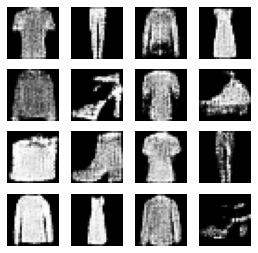

25600: [discriminator loss: 0.669915, acc: 0.578125] [adversarial loss: 0.815664, acc: 0.156250]
25601: [discriminator loss: 0.683750, acc: 0.585938] [adversarial loss: 0.608670, acc: 0.765625]
25602: [discriminator loss: 0.694023, acc: 0.500000] [adversarial loss: 0.852500, acc: 0.046875]
25603: [discriminator loss: 0.666187, acc: 0.578125] [adversarial loss: 0.743252, acc: 0.359375]
25604: [discriminator loss: 0.674870, acc: 0.554688] [adversarial loss: 0.793189, acc: 0.234375]
25605: [discriminator loss: 0.664686, acc: 0.609375] [adversarial loss: 0.683981, acc: 0.531250]
25606: [discriminator loss: 0.659805, acc: 0.601562] [adversarial loss: 0.664096, acc: 0.625000]
25607: [discriminator loss: 0.699950, acc: 0.500000] [adversarial loss: 0.772652, acc: 0.265625]
25608: [discriminator loss: 0.650662, acc: 0.617188] [adversarial loss: 0.671315, acc: 0.500000]
25609: [discriminator loss: 0.671825, acc: 0.625000] [adversarial loss: 0.786846, acc: 0.265625]
25610: [discriminator loss: 0.

25687: [discriminator loss: 0.671538, acc: 0.554688] [adversarial loss: 0.738077, acc: 0.437500]
25688: [discriminator loss: 0.678768, acc: 0.515625] [adversarial loss: 0.748175, acc: 0.375000]
25689: [discriminator loss: 0.663401, acc: 0.578125] [adversarial loss: 0.738351, acc: 0.312500]
25690: [discriminator loss: 0.703107, acc: 0.453125] [adversarial loss: 0.822983, acc: 0.187500]
25691: [discriminator loss: 0.705685, acc: 0.500000] [adversarial loss: 0.622738, acc: 0.703125]
25692: [discriminator loss: 0.675192, acc: 0.539062] [adversarial loss: 0.815415, acc: 0.171875]
25693: [discriminator loss: 0.668656, acc: 0.593750] [adversarial loss: 0.725355, acc: 0.468750]
25694: [discriminator loss: 0.686419, acc: 0.570312] [adversarial loss: 0.701448, acc: 0.515625]
25695: [discriminator loss: 0.681176, acc: 0.500000] [adversarial loss: 0.778028, acc: 0.250000]
25696: [discriminator loss: 0.656061, acc: 0.617188] [adversarial loss: 0.889595, acc: 0.046875]
25697: [discriminator loss: 0.

25772: [discriminator loss: 0.658764, acc: 0.648438] [adversarial loss: 0.760698, acc: 0.437500]
25773: [discriminator loss: 0.666322, acc: 0.570312] [adversarial loss: 0.588051, acc: 0.750000]
25774: [discriminator loss: 0.707310, acc: 0.500000] [adversarial loss: 0.956908, acc: 0.046875]
25775: [discriminator loss: 0.699222, acc: 0.539062] [adversarial loss: 0.682785, acc: 0.515625]
25776: [discriminator loss: 0.684987, acc: 0.578125] [adversarial loss: 0.724022, acc: 0.421875]
25777: [discriminator loss: 0.676497, acc: 0.570312] [adversarial loss: 0.730740, acc: 0.500000]
25778: [discriminator loss: 0.668835, acc: 0.554688] [adversarial loss: 0.753548, acc: 0.250000]
25779: [discriminator loss: 0.665983, acc: 0.632812] [adversarial loss: 0.710305, acc: 0.453125]
25780: [discriminator loss: 0.665120, acc: 0.554688] [adversarial loss: 0.734668, acc: 0.359375]
25781: [discriminator loss: 0.658779, acc: 0.632812] [adversarial loss: 0.797897, acc: 0.187500]
25782: [discriminator loss: 0.

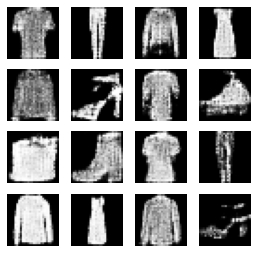

25800: [discriminator loss: 0.676538, acc: 0.601562] [adversarial loss: 0.790531, acc: 0.250000]
25801: [discriminator loss: 0.669330, acc: 0.578125] [adversarial loss: 0.716157, acc: 0.406250]
25802: [discriminator loss: 0.685303, acc: 0.585938] [adversarial loss: 0.814227, acc: 0.265625]
25803: [discriminator loss: 0.696608, acc: 0.492188] [adversarial loss: 0.611550, acc: 0.765625]
25804: [discriminator loss: 0.672349, acc: 0.523438] [adversarial loss: 0.887658, acc: 0.125000]
25805: [discriminator loss: 0.713913, acc: 0.507812] [adversarial loss: 0.627470, acc: 0.718750]
25806: [discriminator loss: 0.683595, acc: 0.546875] [adversarial loss: 0.798866, acc: 0.187500]
25807: [discriminator loss: 0.691684, acc: 0.539062] [adversarial loss: 0.617428, acc: 0.765625]
25808: [discriminator loss: 0.708249, acc: 0.539062] [adversarial loss: 0.760944, acc: 0.265625]
25809: [discriminator loss: 0.677439, acc: 0.554688] [adversarial loss: 0.636299, acc: 0.671875]
25810: [discriminator loss: 0.

25887: [discriminator loss: 0.687059, acc: 0.562500] [adversarial loss: 0.735420, acc: 0.359375]
25888: [discriminator loss: 0.652982, acc: 0.671875] [adversarial loss: 0.730412, acc: 0.453125]
25889: [discriminator loss: 0.678104, acc: 0.570312] [adversarial loss: 0.793859, acc: 0.250000]
25890: [discriminator loss: 0.672977, acc: 0.578125] [adversarial loss: 0.705810, acc: 0.453125]
25891: [discriminator loss: 0.691256, acc: 0.500000] [adversarial loss: 0.903186, acc: 0.078125]
25892: [discriminator loss: 0.686611, acc: 0.562500] [adversarial loss: 0.642349, acc: 0.640625]
25893: [discriminator loss: 0.685435, acc: 0.484375] [adversarial loss: 0.781814, acc: 0.218750]
25894: [discriminator loss: 0.676222, acc: 0.585938] [adversarial loss: 0.760489, acc: 0.312500]
25895: [discriminator loss: 0.654720, acc: 0.640625] [adversarial loss: 0.733319, acc: 0.343750]
25896: [discriminator loss: 0.662542, acc: 0.632812] [adversarial loss: 0.735912, acc: 0.359375]
25897: [discriminator loss: 0.

25976: [discriminator loss: 0.660503, acc: 0.601562] [adversarial loss: 0.667890, acc: 0.578125]
25977: [discriminator loss: 0.692603, acc: 0.515625] [adversarial loss: 0.772305, acc: 0.218750]
25978: [discriminator loss: 0.679010, acc: 0.585938] [adversarial loss: 0.679846, acc: 0.656250]
25979: [discriminator loss: 0.680918, acc: 0.554688] [adversarial loss: 0.796480, acc: 0.281250]
25980: [discriminator loss: 0.673082, acc: 0.570312] [adversarial loss: 0.689813, acc: 0.562500]
25981: [discriminator loss: 0.692688, acc: 0.515625] [adversarial loss: 0.877030, acc: 0.171875]
25982: [discriminator loss: 0.690355, acc: 0.507812] [adversarial loss: 0.571873, acc: 0.859375]
25983: [discriminator loss: 0.698021, acc: 0.500000] [adversarial loss: 0.800673, acc: 0.250000]
25984: [discriminator loss: 0.666920, acc: 0.554688] [adversarial loss: 0.746892, acc: 0.296875]
25985: [discriminator loss: 0.658888, acc: 0.640625] [adversarial loss: 0.714868, acc: 0.515625]
25986: [discriminator loss: 0.

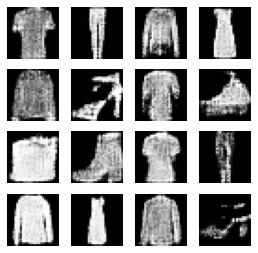

26000: [discriminator loss: 0.662012, acc: 0.632812] [adversarial loss: 0.794867, acc: 0.343750]
26001: [discriminator loss: 0.656397, acc: 0.640625] [adversarial loss: 0.793052, acc: 0.343750]
26002: [discriminator loss: 0.666404, acc: 0.570312] [adversarial loss: 0.630455, acc: 0.578125]
26003: [discriminator loss: 0.663307, acc: 0.640625] [adversarial loss: 0.774136, acc: 0.343750]
26004: [discriminator loss: 0.644910, acc: 0.671875] [adversarial loss: 0.738441, acc: 0.359375]
26005: [discriminator loss: 0.654105, acc: 0.640625] [adversarial loss: 0.698225, acc: 0.531250]
26006: [discriminator loss: 0.683068, acc: 0.593750] [adversarial loss: 0.837772, acc: 0.171875]
26007: [discriminator loss: 0.666656, acc: 0.593750] [adversarial loss: 0.757545, acc: 0.343750]
26008: [discriminator loss: 0.671840, acc: 0.601562] [adversarial loss: 0.606468, acc: 0.765625]
26009: [discriminator loss: 0.663093, acc: 0.570312] [adversarial loss: 0.796507, acc: 0.250000]
26010: [discriminator loss: 0.

26087: [discriminator loss: 0.677276, acc: 0.515625] [adversarial loss: 0.818915, acc: 0.296875]
26088: [discriminator loss: 0.701838, acc: 0.507812] [adversarial loss: 0.655857, acc: 0.687500]
26089: [discriminator loss: 0.676953, acc: 0.539062] [adversarial loss: 0.836630, acc: 0.171875]
26090: [discriminator loss: 0.668300, acc: 0.601562] [adversarial loss: 0.664049, acc: 0.625000]
26091: [discriminator loss: 0.669746, acc: 0.562500] [adversarial loss: 0.743808, acc: 0.328125]
26092: [discriminator loss: 0.718527, acc: 0.468750] [adversarial loss: 0.726478, acc: 0.390625]
26093: [discriminator loss: 0.669574, acc: 0.554688] [adversarial loss: 0.789340, acc: 0.296875]
26094: [discriminator loss: 0.653614, acc: 0.593750] [adversarial loss: 0.748443, acc: 0.359375]
26095: [discriminator loss: 0.674768, acc: 0.554688] [adversarial loss: 0.710610, acc: 0.453125]
26096: [discriminator loss: 0.672673, acc: 0.585938] [adversarial loss: 0.798941, acc: 0.218750]
26097: [discriminator loss: 0.

26175: [discriminator loss: 0.669984, acc: 0.578125] [adversarial loss: 0.674846, acc: 0.500000]
26176: [discriminator loss: 0.679011, acc: 0.554688] [adversarial loss: 0.759444, acc: 0.265625]
26177: [discriminator loss: 0.651590, acc: 0.648438] [adversarial loss: 0.724113, acc: 0.406250]
26178: [discriminator loss: 0.673227, acc: 0.515625] [adversarial loss: 0.782107, acc: 0.234375]
26179: [discriminator loss: 0.659550, acc: 0.601562] [adversarial loss: 0.691646, acc: 0.531250]
26180: [discriminator loss: 0.670295, acc: 0.632812] [adversarial loss: 0.667863, acc: 0.562500]
26181: [discriminator loss: 0.668697, acc: 0.593750] [adversarial loss: 0.885416, acc: 0.125000]
26182: [discriminator loss: 0.679562, acc: 0.570312] [adversarial loss: 0.653641, acc: 0.625000]
26183: [discriminator loss: 0.667121, acc: 0.523438] [adversarial loss: 0.802934, acc: 0.187500]
26184: [discriminator loss: 0.685814, acc: 0.554688] [adversarial loss: 0.631407, acc: 0.750000]
26185: [discriminator loss: 0.

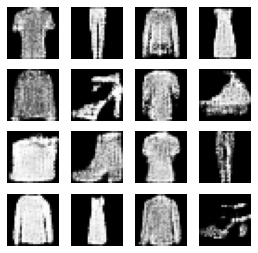

26200: [discriminator loss: 0.675547, acc: 0.523438] [adversarial loss: 0.706284, acc: 0.484375]
26201: [discriminator loss: 0.678795, acc: 0.578125] [adversarial loss: 0.798946, acc: 0.187500]
26202: [discriminator loss: 0.660417, acc: 0.625000] [adversarial loss: 0.784025, acc: 0.218750]
26203: [discriminator loss: 0.673855, acc: 0.554688] [adversarial loss: 0.732692, acc: 0.406250]
26204: [discriminator loss: 0.654692, acc: 0.593750] [adversarial loss: 0.861870, acc: 0.171875]
26205: [discriminator loss: 0.687972, acc: 0.554688] [adversarial loss: 0.662898, acc: 0.656250]
26206: [discriminator loss: 0.668162, acc: 0.593750] [adversarial loss: 0.793692, acc: 0.218750]
26207: [discriminator loss: 0.701887, acc: 0.531250] [adversarial loss: 0.676206, acc: 0.515625]
26208: [discriminator loss: 0.655657, acc: 0.625000] [adversarial loss: 0.711218, acc: 0.437500]
26209: [discriminator loss: 0.660679, acc: 0.640625] [adversarial loss: 0.652915, acc: 0.671875]
26210: [discriminator loss: 0.

26285: [discriminator loss: 0.677246, acc: 0.593750] [adversarial loss: 0.644622, acc: 0.640625]
26286: [discriminator loss: 0.667070, acc: 0.562500] [adversarial loss: 0.760762, acc: 0.375000]
26287: [discriminator loss: 0.693914, acc: 0.531250] [adversarial loss: 0.847774, acc: 0.156250]
26288: [discriminator loss: 0.669738, acc: 0.585938] [adversarial loss: 0.734173, acc: 0.375000]
26289: [discriminator loss: 0.657171, acc: 0.632812] [adversarial loss: 0.714477, acc: 0.343750]
26290: [discriminator loss: 0.694844, acc: 0.492188] [adversarial loss: 0.789443, acc: 0.265625]
26291: [discriminator loss: 0.662608, acc: 0.593750] [adversarial loss: 0.765945, acc: 0.328125]
26292: [discriminator loss: 0.671878, acc: 0.570312] [adversarial loss: 0.694313, acc: 0.500000]
26293: [discriminator loss: 0.678887, acc: 0.539062] [adversarial loss: 0.704044, acc: 0.515625]
26294: [discriminator loss: 0.662407, acc: 0.632812] [adversarial loss: 0.723374, acc: 0.343750]
26295: [discriminator loss: 0.

26371: [discriminator loss: 0.669167, acc: 0.562500] [adversarial loss: 0.879717, acc: 0.093750]
26372: [discriminator loss: 0.687246, acc: 0.585938] [adversarial loss: 0.635618, acc: 0.734375]
26373: [discriminator loss: 0.690279, acc: 0.500000] [adversarial loss: 0.739984, acc: 0.406250]
26374: [discriminator loss: 0.685231, acc: 0.531250] [adversarial loss: 0.723827, acc: 0.359375]
26375: [discriminator loss: 0.668637, acc: 0.632812] [adversarial loss: 0.712459, acc: 0.484375]
26376: [discriminator loss: 0.687693, acc: 0.523438] [adversarial loss: 0.788993, acc: 0.234375]
26377: [discriminator loss: 0.685654, acc: 0.601562] [adversarial loss: 0.678056, acc: 0.593750]
26378: [discriminator loss: 0.657728, acc: 0.601562] [adversarial loss: 0.674563, acc: 0.546875]
26379: [discriminator loss: 0.677441, acc: 0.617188] [adversarial loss: 0.823836, acc: 0.187500]
26380: [discriminator loss: 0.672748, acc: 0.546875] [adversarial loss: 0.783683, acc: 0.343750]
26381: [discriminator loss: 0.

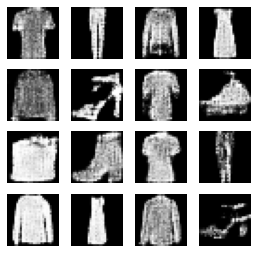

26400: [discriminator loss: 0.664134, acc: 0.562500] [adversarial loss: 0.783960, acc: 0.312500]
26401: [discriminator loss: 0.663868, acc: 0.601562] [adversarial loss: 0.736819, acc: 0.375000]
26402: [discriminator loss: 0.685451, acc: 0.601562] [adversarial loss: 0.676935, acc: 0.531250]
26403: [discriminator loss: 0.691182, acc: 0.492188] [adversarial loss: 0.815195, acc: 0.187500]
26404: [discriminator loss: 0.666215, acc: 0.593750] [adversarial loss: 0.698979, acc: 0.484375]
26405: [discriminator loss: 0.708743, acc: 0.460938] [adversarial loss: 0.729139, acc: 0.453125]
26406: [discriminator loss: 0.672517, acc: 0.601562] [adversarial loss: 0.735732, acc: 0.359375]
26407: [discriminator loss: 0.686296, acc: 0.546875] [adversarial loss: 0.662791, acc: 0.640625]
26408: [discriminator loss: 0.688198, acc: 0.539062] [adversarial loss: 0.782827, acc: 0.312500]
26409: [discriminator loss: 0.710569, acc: 0.460938] [adversarial loss: 0.657641, acc: 0.703125]
26410: [discriminator loss: 0.

26489: [discriminator loss: 0.671384, acc: 0.554688] [adversarial loss: 0.692238, acc: 0.531250]
26490: [discriminator loss: 0.681907, acc: 0.546875] [adversarial loss: 0.731610, acc: 0.406250]
26491: [discriminator loss: 0.649401, acc: 0.601562] [adversarial loss: 0.744095, acc: 0.359375]
26492: [discriminator loss: 0.686844, acc: 0.546875] [adversarial loss: 0.728375, acc: 0.421875]
26493: [discriminator loss: 0.665195, acc: 0.593750] [adversarial loss: 0.789930, acc: 0.281250]
26494: [discriminator loss: 0.696337, acc: 0.515625] [adversarial loss: 0.615531, acc: 0.765625]
26495: [discriminator loss: 0.699073, acc: 0.523438] [adversarial loss: 0.791543, acc: 0.203125]
26496: [discriminator loss: 0.673691, acc: 0.554688] [adversarial loss: 0.600949, acc: 0.734375]
26497: [discriminator loss: 0.699479, acc: 0.507812] [adversarial loss: 0.890894, acc: 0.062500]
26498: [discriminator loss: 0.688487, acc: 0.546875] [adversarial loss: 0.638952, acc: 0.718750]
26499: [discriminator loss: 0.

26575: [discriminator loss: 0.684769, acc: 0.507812] [adversarial loss: 0.823347, acc: 0.187500]
26576: [discriminator loss: 0.672088, acc: 0.546875] [adversarial loss: 0.701050, acc: 0.515625]
26577: [discriminator loss: 0.652376, acc: 0.617188] [adversarial loss: 0.678047, acc: 0.625000]
26578: [discriminator loss: 0.666392, acc: 0.593750] [adversarial loss: 0.720580, acc: 0.437500]
26579: [discriminator loss: 0.674186, acc: 0.585938] [adversarial loss: 0.708366, acc: 0.531250]
26580: [discriminator loss: 0.636745, acc: 0.640625] [adversarial loss: 0.680586, acc: 0.562500]
26581: [discriminator loss: 0.686648, acc: 0.515625] [adversarial loss: 0.712536, acc: 0.546875]
26582: [discriminator loss: 0.672500, acc: 0.523438] [adversarial loss: 0.826488, acc: 0.156250]
26583: [discriminator loss: 0.673538, acc: 0.570312] [adversarial loss: 0.676531, acc: 0.640625]
26584: [discriminator loss: 0.663880, acc: 0.562500] [adversarial loss: 0.796336, acc: 0.281250]
26585: [discriminator loss: 0.

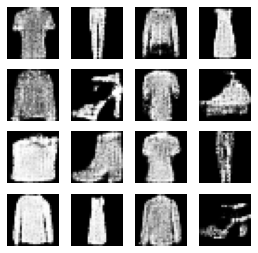

26600: [discriminator loss: 0.687748, acc: 0.539062] [adversarial loss: 0.856448, acc: 0.093750]
26601: [discriminator loss: 0.669087, acc: 0.585938] [adversarial loss: 0.682349, acc: 0.531250]
26602: [discriminator loss: 0.662417, acc: 0.632812] [adversarial loss: 0.986135, acc: 0.093750]
26603: [discriminator loss: 0.692463, acc: 0.539062] [adversarial loss: 0.609579, acc: 0.765625]
26604: [discriminator loss: 0.693892, acc: 0.507812] [adversarial loss: 0.829014, acc: 0.171875]
26605: [discriminator loss: 0.671572, acc: 0.593750] [adversarial loss: 0.759263, acc: 0.296875]
26606: [discriminator loss: 0.664653, acc: 0.601562] [adversarial loss: 0.701220, acc: 0.500000]
26607: [discriminator loss: 0.679150, acc: 0.554688] [adversarial loss: 0.757402, acc: 0.375000]
26608: [discriminator loss: 0.690731, acc: 0.507812] [adversarial loss: 0.756470, acc: 0.296875]
26609: [discriminator loss: 0.659368, acc: 0.656250] [adversarial loss: 0.679707, acc: 0.562500]
26610: [discriminator loss: 0.

26688: [discriminator loss: 0.693223, acc: 0.507812] [adversarial loss: 0.716901, acc: 0.437500]
26689: [discriminator loss: 0.700211, acc: 0.515625] [adversarial loss: 0.747017, acc: 0.359375]
26690: [discriminator loss: 0.638453, acc: 0.734375] [adversarial loss: 0.710206, acc: 0.468750]
26691: [discriminator loss: 0.690001, acc: 0.578125] [adversarial loss: 0.747456, acc: 0.359375]
26692: [discriminator loss: 0.684382, acc: 0.593750] [adversarial loss: 0.758992, acc: 0.265625]
26693: [discriminator loss: 0.664989, acc: 0.617188] [adversarial loss: 0.754487, acc: 0.390625]
26694: [discriminator loss: 0.664582, acc: 0.617188] [adversarial loss: 0.740795, acc: 0.406250]
26695: [discriminator loss: 0.692041, acc: 0.523438] [adversarial loss: 0.738245, acc: 0.390625]
26696: [discriminator loss: 0.687560, acc: 0.523438] [adversarial loss: 0.707400, acc: 0.546875]
26697: [discriminator loss: 0.675502, acc: 0.578125] [adversarial loss: 0.829623, acc: 0.156250]
26698: [discriminator loss: 0.

26776: [discriminator loss: 0.674443, acc: 0.554688] [adversarial loss: 0.759058, acc: 0.328125]
26777: [discriminator loss: 0.677492, acc: 0.562500] [adversarial loss: 0.803807, acc: 0.343750]
26778: [discriminator loss: 0.673316, acc: 0.554688] [adversarial loss: 0.716800, acc: 0.468750]
26779: [discriminator loss: 0.667938, acc: 0.601562] [adversarial loss: 0.721544, acc: 0.453125]
26780: [discriminator loss: 0.694653, acc: 0.484375] [adversarial loss: 0.723924, acc: 0.375000]
26781: [discriminator loss: 0.684433, acc: 0.546875] [adversarial loss: 0.729736, acc: 0.406250]
26782: [discriminator loss: 0.673599, acc: 0.539062] [adversarial loss: 0.741759, acc: 0.406250]
26783: [discriminator loss: 0.658194, acc: 0.625000] [adversarial loss: 0.739424, acc: 0.375000]
26784: [discriminator loss: 0.664285, acc: 0.648438] [adversarial loss: 0.636986, acc: 0.671875]
26785: [discriminator loss: 0.676942, acc: 0.539062] [adversarial loss: 0.846253, acc: 0.156250]
26786: [discriminator loss: 0.

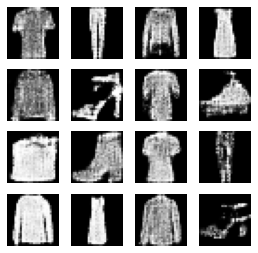

26800: [discriminator loss: 0.676255, acc: 0.539062] [adversarial loss: 0.760479, acc: 0.281250]
26801: [discriminator loss: 0.692510, acc: 0.546875] [adversarial loss: 0.679071, acc: 0.531250]
26802: [discriminator loss: 0.696333, acc: 0.507812] [adversarial loss: 0.743866, acc: 0.281250]
26803: [discriminator loss: 0.673809, acc: 0.578125] [adversarial loss: 0.728010, acc: 0.453125]
26804: [discriminator loss: 0.663112, acc: 0.671875] [adversarial loss: 0.622610, acc: 0.703125]
26805: [discriminator loss: 0.682908, acc: 0.500000] [adversarial loss: 0.888224, acc: 0.062500]
26806: [discriminator loss: 0.700182, acc: 0.539062] [adversarial loss: 0.633959, acc: 0.640625]
26807: [discriminator loss: 0.661590, acc: 0.593750] [adversarial loss: 0.798454, acc: 0.265625]
26808: [discriminator loss: 0.673174, acc: 0.585938] [adversarial loss: 0.713656, acc: 0.546875]
26809: [discriminator loss: 0.679042, acc: 0.593750] [adversarial loss: 0.672788, acc: 0.515625]
26810: [discriminator loss: 0.

26890: [discriminator loss: 0.678746, acc: 0.554688] [adversarial loss: 0.792955, acc: 0.218750]
26891: [discriminator loss: 0.674911, acc: 0.632812] [adversarial loss: 0.633910, acc: 0.718750]
26892: [discriminator loss: 0.679065, acc: 0.570312] [adversarial loss: 0.846188, acc: 0.156250]
26893: [discriminator loss: 0.666596, acc: 0.578125] [adversarial loss: 0.700258, acc: 0.484375]
26894: [discriminator loss: 0.675569, acc: 0.585938] [adversarial loss: 0.827337, acc: 0.265625]
26895: [discriminator loss: 0.695864, acc: 0.593750] [adversarial loss: 0.676274, acc: 0.593750]
26896: [discriminator loss: 0.666926, acc: 0.570312] [adversarial loss: 0.719097, acc: 0.359375]
26897: [discriminator loss: 0.669795, acc: 0.601562] [adversarial loss: 0.598228, acc: 0.765625]
26898: [discriminator loss: 0.681613, acc: 0.554688] [adversarial loss: 0.817152, acc: 0.156250]
26899: [discriminator loss: 0.697735, acc: 0.562500] [adversarial loss: 0.666900, acc: 0.625000]
26900: [discriminator loss: 0.

26977: [discriminator loss: 0.704934, acc: 0.453125] [adversarial loss: 0.678911, acc: 0.515625]
26978: [discriminator loss: 0.672350, acc: 0.562500] [adversarial loss: 0.805716, acc: 0.171875]
26979: [discriminator loss: 0.670061, acc: 0.570312] [adversarial loss: 0.731286, acc: 0.437500]
26980: [discriminator loss: 0.677679, acc: 0.554688] [adversarial loss: 0.777697, acc: 0.265625]
26981: [discriminator loss: 0.689430, acc: 0.515625] [adversarial loss: 0.645093, acc: 0.750000]
26982: [discriminator loss: 0.659115, acc: 0.593750] [adversarial loss: 0.738418, acc: 0.312500]
26983: [discriminator loss: 0.672509, acc: 0.578125] [adversarial loss: 0.701009, acc: 0.468750]
26984: [discriminator loss: 0.668304, acc: 0.570312] [adversarial loss: 0.694144, acc: 0.593750]
26985: [discriminator loss: 0.675285, acc: 0.593750] [adversarial loss: 0.672886, acc: 0.640625]
26986: [discriminator loss: 0.695481, acc: 0.515625] [adversarial loss: 0.804358, acc: 0.187500]
26987: [discriminator loss: 0.

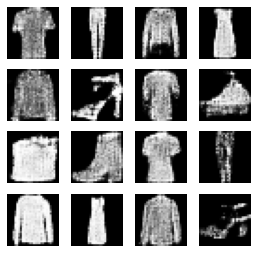

27000: [discriminator loss: 0.687742, acc: 0.515625] [adversarial loss: 0.789120, acc: 0.140625]
27001: [discriminator loss: 0.658407, acc: 0.632812] [adversarial loss: 0.659270, acc: 0.640625]
27002: [discriminator loss: 0.648951, acc: 0.601562] [adversarial loss: 0.735912, acc: 0.390625]
27003: [discriminator loss: 0.678414, acc: 0.593750] [adversarial loss: 0.826223, acc: 0.109375]
27004: [discriminator loss: 0.675194, acc: 0.609375] [adversarial loss: 0.620711, acc: 0.765625]
27005: [discriminator loss: 0.678529, acc: 0.546875] [adversarial loss: 0.810654, acc: 0.218750]
27006: [discriminator loss: 0.677934, acc: 0.617188] [adversarial loss: 0.681082, acc: 0.500000]
27007: [discriminator loss: 0.686745, acc: 0.570312] [adversarial loss: 0.738787, acc: 0.328125]
27008: [discriminator loss: 0.690528, acc: 0.500000] [adversarial loss: 0.771955, acc: 0.328125]
27009: [discriminator loss: 0.669897, acc: 0.585938] [adversarial loss: 0.659040, acc: 0.640625]
27010: [discriminator loss: 0.

27089: [discriminator loss: 0.670613, acc: 0.523438] [adversarial loss: 0.879115, acc: 0.046875]
27090: [discriminator loss: 0.670359, acc: 0.562500] [adversarial loss: 0.665612, acc: 0.656250]
27091: [discriminator loss: 0.686894, acc: 0.546875] [adversarial loss: 0.800809, acc: 0.250000]
27092: [discriminator loss: 0.684912, acc: 0.585938] [adversarial loss: 0.675393, acc: 0.531250]
27093: [discriminator loss: 0.657643, acc: 0.609375] [adversarial loss: 0.723278, acc: 0.500000]
27094: [discriminator loss: 0.661587, acc: 0.570312] [adversarial loss: 0.726548, acc: 0.359375]
27095: [discriminator loss: 0.667477, acc: 0.539062] [adversarial loss: 0.697153, acc: 0.531250]
27096: [discriminator loss: 0.674113, acc: 0.585938] [adversarial loss: 0.827427, acc: 0.109375]
27097: [discriminator loss: 0.678918, acc: 0.523438] [adversarial loss: 0.678101, acc: 0.562500]
27098: [discriminator loss: 0.659038, acc: 0.609375] [adversarial loss: 0.755306, acc: 0.343750]
27099: [discriminator loss: 0.

27178: [discriminator loss: 0.674178, acc: 0.554688] [adversarial loss: 0.737939, acc: 0.421875]
27179: [discriminator loss: 0.655117, acc: 0.562500] [adversarial loss: 0.729954, acc: 0.390625]
27180: [discriminator loss: 0.660484, acc: 0.609375] [adversarial loss: 0.644076, acc: 0.671875]
27181: [discriminator loss: 0.649536, acc: 0.625000] [adversarial loss: 0.831471, acc: 0.296875]
27182: [discriminator loss: 0.730487, acc: 0.492188] [adversarial loss: 0.657981, acc: 0.593750]
27183: [discriminator loss: 0.673899, acc: 0.562500] [adversarial loss: 0.739221, acc: 0.375000]
27184: [discriminator loss: 0.681908, acc: 0.484375] [adversarial loss: 0.748166, acc: 0.328125]
27185: [discriminator loss: 0.692763, acc: 0.507812] [adversarial loss: 0.680343, acc: 0.593750]
27186: [discriminator loss: 0.667163, acc: 0.585938] [adversarial loss: 0.737375, acc: 0.359375]
27187: [discriminator loss: 0.675483, acc: 0.562500] [adversarial loss: 0.794904, acc: 0.296875]
27188: [discriminator loss: 0.

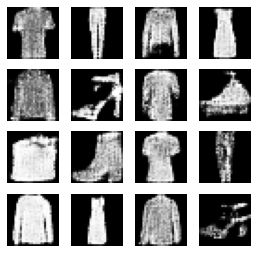

27200: [discriminator loss: 0.670667, acc: 0.593750] [adversarial loss: 0.839258, acc: 0.140625]
27201: [discriminator loss: 0.696804, acc: 0.562500] [adversarial loss: 0.800908, acc: 0.250000]
27202: [discriminator loss: 0.692004, acc: 0.507812] [adversarial loss: 0.650934, acc: 0.640625]
27203: [discriminator loss: 0.668075, acc: 0.593750] [adversarial loss: 0.819129, acc: 0.109375]
27204: [discriminator loss: 0.698066, acc: 0.562500] [adversarial loss: 0.621386, acc: 0.765625]
27205: [discriminator loss: 0.672359, acc: 0.593750] [adversarial loss: 0.685062, acc: 0.546875]
27206: [discriminator loss: 0.680632, acc: 0.562500] [adversarial loss: 0.728458, acc: 0.437500]
27207: [discriminator loss: 0.674321, acc: 0.585938] [adversarial loss: 0.814451, acc: 0.343750]
27208: [discriminator loss: 0.693500, acc: 0.539062] [adversarial loss: 0.703575, acc: 0.406250]
27209: [discriminator loss: 0.676853, acc: 0.609375] [adversarial loss: 0.622130, acc: 0.812500]
27210: [discriminator loss: 0.

27285: [discriminator loss: 0.667396, acc: 0.554688] [adversarial loss: 0.761493, acc: 0.296875]
27286: [discriminator loss: 0.684681, acc: 0.562500] [adversarial loss: 0.731735, acc: 0.390625]
27287: [discriminator loss: 0.665738, acc: 0.593750] [adversarial loss: 0.794210, acc: 0.203125]
27288: [discriminator loss: 0.677577, acc: 0.640625] [adversarial loss: 0.601264, acc: 0.734375]
27289: [discriminator loss: 0.699830, acc: 0.531250] [adversarial loss: 0.917654, acc: 0.140625]
27290: [discriminator loss: 0.664284, acc: 0.601562] [adversarial loss: 0.701235, acc: 0.453125]
27291: [discriminator loss: 0.700809, acc: 0.484375] [adversarial loss: 0.679996, acc: 0.546875]
27292: [discriminator loss: 0.703993, acc: 0.515625] [adversarial loss: 0.776668, acc: 0.312500]
27293: [discriminator loss: 0.692713, acc: 0.531250] [adversarial loss: 0.716832, acc: 0.578125]
27294: [discriminator loss: 0.675340, acc: 0.609375] [adversarial loss: 0.756422, acc: 0.328125]
27295: [discriminator loss: 0.

27374: [discriminator loss: 0.665530, acc: 0.617188] [adversarial loss: 0.639209, acc: 0.703125]
27375: [discriminator loss: 0.669611, acc: 0.578125] [adversarial loss: 0.770142, acc: 0.312500]
27376: [discriminator loss: 0.676394, acc: 0.570312] [adversarial loss: 0.646185, acc: 0.687500]
27377: [discriminator loss: 0.673840, acc: 0.546875] [adversarial loss: 0.769401, acc: 0.375000]
27378: [discriminator loss: 0.670350, acc: 0.578125] [adversarial loss: 0.618290, acc: 0.796875]
27379: [discriminator loss: 0.665541, acc: 0.539062] [adversarial loss: 0.786668, acc: 0.203125]
27380: [discriminator loss: 0.688136, acc: 0.554688] [adversarial loss: 0.556695, acc: 0.906250]
27381: [discriminator loss: 0.688508, acc: 0.531250] [adversarial loss: 0.822173, acc: 0.156250]
27382: [discriminator loss: 0.689803, acc: 0.578125] [adversarial loss: 0.689090, acc: 0.515625]
27383: [discriminator loss: 0.705754, acc: 0.539062] [adversarial loss: 0.799346, acc: 0.265625]
27384: [discriminator loss: 0.

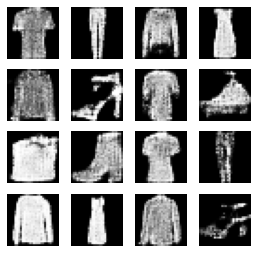

27400: [discriminator loss: 0.683970, acc: 0.585938] [adversarial loss: 0.691637, acc: 0.468750]
27401: [discriminator loss: 0.702973, acc: 0.500000] [adversarial loss: 0.670818, acc: 0.578125]
27402: [discriminator loss: 0.700006, acc: 0.531250] [adversarial loss: 0.920710, acc: 0.218750]
27403: [discriminator loss: 0.671402, acc: 0.578125] [adversarial loss: 0.660273, acc: 0.562500]
27404: [discriminator loss: 0.660347, acc: 0.601562] [adversarial loss: 0.756267, acc: 0.359375]
27405: [discriminator loss: 0.659577, acc: 0.640625] [adversarial loss: 0.770005, acc: 0.421875]
27406: [discriminator loss: 0.658854, acc: 0.609375] [adversarial loss: 0.616734, acc: 0.687500]
27407: [discriminator loss: 0.695307, acc: 0.531250] [adversarial loss: 0.781476, acc: 0.281250]
27408: [discriminator loss: 0.666876, acc: 0.585938] [adversarial loss: 0.754802, acc: 0.328125]
27409: [discriminator loss: 0.652092, acc: 0.625000] [adversarial loss: 0.741707, acc: 0.328125]
27410: [discriminator loss: 0.

27486: [discriminator loss: 0.681097, acc: 0.539062] [adversarial loss: 0.778877, acc: 0.265625]
27487: [discriminator loss: 0.680632, acc: 0.546875] [adversarial loss: 0.762378, acc: 0.312500]
27488: [discriminator loss: 0.668830, acc: 0.609375] [adversarial loss: 0.622692, acc: 0.765625]
27489: [discriminator loss: 0.685274, acc: 0.492188] [adversarial loss: 0.830938, acc: 0.187500]
27490: [discriminator loss: 0.677983, acc: 0.609375] [adversarial loss: 0.650488, acc: 0.687500]
27491: [discriminator loss: 0.678021, acc: 0.601562] [adversarial loss: 0.772263, acc: 0.312500]
27492: [discriminator loss: 0.675266, acc: 0.601562] [adversarial loss: 0.678623, acc: 0.593750]
27493: [discriminator loss: 0.655733, acc: 0.617188] [adversarial loss: 0.824553, acc: 0.312500]
27494: [discriminator loss: 0.690812, acc: 0.578125] [adversarial loss: 0.733203, acc: 0.437500]
27495: [discriminator loss: 0.700250, acc: 0.507812] [adversarial loss: 0.801615, acc: 0.265625]
27496: [discriminator loss: 0.

27572: [discriminator loss: 0.673161, acc: 0.539062] [adversarial loss: 0.885094, acc: 0.046875]
27573: [discriminator loss: 0.705961, acc: 0.515625] [adversarial loss: 0.651988, acc: 0.671875]
27574: [discriminator loss: 0.687311, acc: 0.570312] [adversarial loss: 0.825016, acc: 0.234375]
27575: [discriminator loss: 0.708023, acc: 0.484375] [adversarial loss: 0.696645, acc: 0.562500]
27576: [discriminator loss: 0.660330, acc: 0.625000] [adversarial loss: 0.688246, acc: 0.609375]
27577: [discriminator loss: 0.659403, acc: 0.609375] [adversarial loss: 0.743323, acc: 0.437500]
27578: [discriminator loss: 0.648025, acc: 0.593750] [adversarial loss: 0.770075, acc: 0.250000]
27579: [discriminator loss: 0.681286, acc: 0.578125] [adversarial loss: 0.657148, acc: 0.640625]
27580: [discriminator loss: 0.653996, acc: 0.593750] [adversarial loss: 0.737030, acc: 0.343750]
27581: [discriminator loss: 0.667473, acc: 0.617188] [adversarial loss: 0.793557, acc: 0.218750]
27582: [discriminator loss: 0.

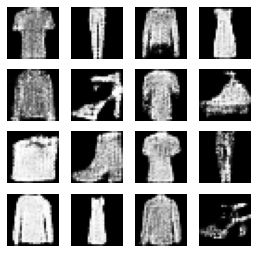

27600: [discriminator loss: 0.680944, acc: 0.546875] [adversarial loss: 0.642023, acc: 0.703125]
27601: [discriminator loss: 0.692218, acc: 0.507812] [adversarial loss: 0.885068, acc: 0.187500]
27602: [discriminator loss: 0.676002, acc: 0.585938] [adversarial loss: 0.676823, acc: 0.546875]
27603: [discriminator loss: 0.691094, acc: 0.523438] [adversarial loss: 0.747331, acc: 0.296875]
27604: [discriminator loss: 0.667493, acc: 0.601562] [adversarial loss: 0.763613, acc: 0.312500]
27605: [discriminator loss: 0.679991, acc: 0.562500] [adversarial loss: 0.666383, acc: 0.640625]
27606: [discriminator loss: 0.667098, acc: 0.601562] [adversarial loss: 0.762750, acc: 0.359375]
27607: [discriminator loss: 0.682135, acc: 0.562500] [adversarial loss: 0.739862, acc: 0.484375]
27608: [discriminator loss: 0.671709, acc: 0.562500] [adversarial loss: 0.758016, acc: 0.359375]
27609: [discriminator loss: 0.672368, acc: 0.585938] [adversarial loss: 0.684163, acc: 0.640625]
27610: [discriminator loss: 0.

27686: [discriminator loss: 0.693408, acc: 0.562500] [adversarial loss: 0.719317, acc: 0.421875]
27687: [discriminator loss: 0.669920, acc: 0.601562] [adversarial loss: 0.678871, acc: 0.609375]
27688: [discriminator loss: 0.686488, acc: 0.546875] [adversarial loss: 0.808885, acc: 0.250000]
27689: [discriminator loss: 0.682240, acc: 0.554688] [adversarial loss: 0.652615, acc: 0.703125]
27690: [discriminator loss: 0.661092, acc: 0.585938] [adversarial loss: 0.789974, acc: 0.234375]
27691: [discriminator loss: 0.680873, acc: 0.570312] [adversarial loss: 0.630015, acc: 0.734375]
27692: [discriminator loss: 0.676270, acc: 0.539062] [adversarial loss: 0.815785, acc: 0.296875]
27693: [discriminator loss: 0.677424, acc: 0.601562] [adversarial loss: 0.612824, acc: 0.703125]
27694: [discriminator loss: 0.664714, acc: 0.593750] [adversarial loss: 0.740444, acc: 0.390625]
27695: [discriminator loss: 0.684063, acc: 0.523438] [adversarial loss: 0.660512, acc: 0.671875]
27696: [discriminator loss: 0.

27771: [discriminator loss: 0.682017, acc: 0.539062] [adversarial loss: 0.777307, acc: 0.296875]
27772: [discriminator loss: 0.660411, acc: 0.632812] [adversarial loss: 0.635328, acc: 0.656250]
27773: [discriminator loss: 0.701482, acc: 0.476562] [adversarial loss: 0.819046, acc: 0.109375]
27774: [discriminator loss: 0.650197, acc: 0.632812] [adversarial loss: 0.672482, acc: 0.656250]
27775: [discriminator loss: 0.671039, acc: 0.593750] [adversarial loss: 0.895046, acc: 0.078125]
27776: [discriminator loss: 0.710632, acc: 0.460938] [adversarial loss: 0.601313, acc: 0.796875]
27777: [discriminator loss: 0.674309, acc: 0.539062] [adversarial loss: 0.846748, acc: 0.359375]
27778: [discriminator loss: 0.671185, acc: 0.531250] [adversarial loss: 0.784904, acc: 0.171875]
27779: [discriminator loss: 0.655981, acc: 0.617188] [adversarial loss: 0.731198, acc: 0.406250]
27780: [discriminator loss: 0.662230, acc: 0.671875] [adversarial loss: 0.756843, acc: 0.390625]
27781: [discriminator loss: 0.

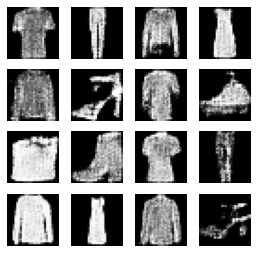

27800: [discriminator loss: 0.652730, acc: 0.640625] [adversarial loss: 0.744696, acc: 0.390625]
27801: [discriminator loss: 0.671194, acc: 0.585938] [adversarial loss: 0.662128, acc: 0.562500]
27802: [discriminator loss: 0.668477, acc: 0.585938] [adversarial loss: 0.769072, acc: 0.218750]
27803: [discriminator loss: 0.692598, acc: 0.562500] [adversarial loss: 0.637180, acc: 0.671875]
27804: [discriminator loss: 0.683855, acc: 0.539062] [adversarial loss: 0.793906, acc: 0.218750]
27805: [discriminator loss: 0.676719, acc: 0.585938] [adversarial loss: 0.662974, acc: 0.656250]
27806: [discriminator loss: 0.681636, acc: 0.570312] [adversarial loss: 0.762014, acc: 0.187500]
27807: [discriminator loss: 0.669783, acc: 0.609375] [adversarial loss: 0.654863, acc: 0.640625]
27808: [discriminator loss: 0.680008, acc: 0.554688] [adversarial loss: 0.869010, acc: 0.078125]
27809: [discriminator loss: 0.710500, acc: 0.515625] [adversarial loss: 0.644243, acc: 0.718750]
27810: [discriminator loss: 0.

27887: [discriminator loss: 0.676544, acc: 0.554688] [adversarial loss: 0.673000, acc: 0.578125]
27888: [discriminator loss: 0.710889, acc: 0.492188] [adversarial loss: 0.835312, acc: 0.125000]
27889: [discriminator loss: 0.687021, acc: 0.570312] [adversarial loss: 0.633566, acc: 0.718750]
27890: [discriminator loss: 0.663364, acc: 0.609375] [adversarial loss: 0.622923, acc: 0.796875]
27891: [discriminator loss: 0.668386, acc: 0.585938] [adversarial loss: 0.805408, acc: 0.234375]
27892: [discriminator loss: 0.687467, acc: 0.523438] [adversarial loss: 0.639209, acc: 0.656250]
27893: [discriminator loss: 0.698823, acc: 0.492188] [adversarial loss: 0.798322, acc: 0.218750]
27894: [discriminator loss: 0.676692, acc: 0.554688] [adversarial loss: 0.811188, acc: 0.250000]
27895: [discriminator loss: 0.678334, acc: 0.539062] [adversarial loss: 0.673664, acc: 0.578125]
27896: [discriminator loss: 0.674491, acc: 0.609375] [adversarial loss: 0.751740, acc: 0.312500]
27897: [discriminator loss: 0.

27976: [discriminator loss: 0.662556, acc: 0.531250] [adversarial loss: 0.769624, acc: 0.218750]
27977: [discriminator loss: 0.670948, acc: 0.593750] [adversarial loss: 0.661531, acc: 0.656250]
27978: [discriminator loss: 0.665140, acc: 0.578125] [adversarial loss: 0.739204, acc: 0.421875]
27979: [discriminator loss: 0.663165, acc: 0.562500] [adversarial loss: 0.800493, acc: 0.203125]
27980: [discriminator loss: 0.644516, acc: 0.625000] [adversarial loss: 0.744678, acc: 0.437500]
27981: [discriminator loss: 0.676834, acc: 0.593750] [adversarial loss: 0.649907, acc: 0.578125]
27982: [discriminator loss: 0.686550, acc: 0.523438] [adversarial loss: 0.770389, acc: 0.343750]
27983: [discriminator loss: 0.660232, acc: 0.632812] [adversarial loss: 0.728548, acc: 0.453125]
27984: [discriminator loss: 0.672600, acc: 0.585938] [adversarial loss: 0.750103, acc: 0.328125]
27985: [discriminator loss: 0.686751, acc: 0.546875] [adversarial loss: 0.753822, acc: 0.343750]
27986: [discriminator loss: 0.

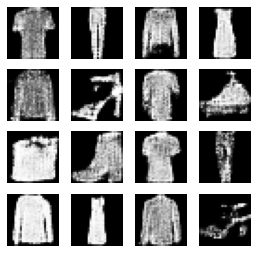

28000: [discriminator loss: 0.675627, acc: 0.601562] [adversarial loss: 0.667015, acc: 0.656250]
28001: [discriminator loss: 0.646670, acc: 0.617188] [adversarial loss: 0.814329, acc: 0.234375]
28002: [discriminator loss: 0.670941, acc: 0.609375] [adversarial loss: 0.701114, acc: 0.546875]
28003: [discriminator loss: 0.706735, acc: 0.507812] [adversarial loss: 0.729815, acc: 0.453125]
28004: [discriminator loss: 0.676359, acc: 0.617188] [adversarial loss: 0.725343, acc: 0.406250]
28005: [discriminator loss: 0.676142, acc: 0.593750] [adversarial loss: 0.734927, acc: 0.359375]
28006: [discriminator loss: 0.700512, acc: 0.539062] [adversarial loss: 0.677720, acc: 0.593750]
28007: [discriminator loss: 0.669472, acc: 0.625000] [adversarial loss: 0.732516, acc: 0.328125]
28008: [discriminator loss: 0.671813, acc: 0.632812] [adversarial loss: 0.627355, acc: 0.796875]
28009: [discriminator loss: 0.694094, acc: 0.476562] [adversarial loss: 0.831530, acc: 0.171875]
28010: [discriminator loss: 0.

28088: [discriminator loss: 0.677605, acc: 0.562500] [adversarial loss: 0.843068, acc: 0.156250]
28089: [discriminator loss: 0.693424, acc: 0.523438] [adversarial loss: 0.566737, acc: 0.765625]
28090: [discriminator loss: 0.727750, acc: 0.507812] [adversarial loss: 0.844587, acc: 0.328125]
28091: [discriminator loss: 0.706593, acc: 0.453125] [adversarial loss: 0.666471, acc: 0.687500]
28092: [discriminator loss: 0.637120, acc: 0.656250] [adversarial loss: 0.756447, acc: 0.312500]
28093: [discriminator loss: 0.694365, acc: 0.531250] [adversarial loss: 0.743136, acc: 0.343750]
28094: [discriminator loss: 0.656374, acc: 0.632812] [adversarial loss: 0.753062, acc: 0.343750]
28095: [discriminator loss: 0.676225, acc: 0.570312] [adversarial loss: 0.766813, acc: 0.343750]
28096: [discriminator loss: 0.645359, acc: 0.625000] [adversarial loss: 0.668056, acc: 0.562500]
28097: [discriminator loss: 0.658064, acc: 0.585938] [adversarial loss: 0.814348, acc: 0.234375]
28098: [discriminator loss: 0.

28173: [discriminator loss: 0.671272, acc: 0.562500] [adversarial loss: 0.768071, acc: 0.296875]
28174: [discriminator loss: 0.678230, acc: 0.585938] [adversarial loss: 0.703104, acc: 0.453125]
28175: [discriminator loss: 0.681876, acc: 0.531250] [adversarial loss: 0.691580, acc: 0.531250]
28176: [discriminator loss: 0.657954, acc: 0.664062] [adversarial loss: 0.768443, acc: 0.328125]
28177: [discriminator loss: 0.677551, acc: 0.539062] [adversarial loss: 0.689638, acc: 0.500000]
28178: [discriminator loss: 0.675665, acc: 0.539062] [adversarial loss: 0.778796, acc: 0.265625]
28179: [discriminator loss: 0.664231, acc: 0.601562] [adversarial loss: 0.662153, acc: 0.593750]
28180: [discriminator loss: 0.685570, acc: 0.539062] [adversarial loss: 0.897756, acc: 0.078125]
28181: [discriminator loss: 0.684291, acc: 0.593750] [adversarial loss: 0.569033, acc: 0.906250]
28182: [discriminator loss: 0.689749, acc: 0.492188] [adversarial loss: 0.847575, acc: 0.171875]
28183: [discriminator loss: 0.

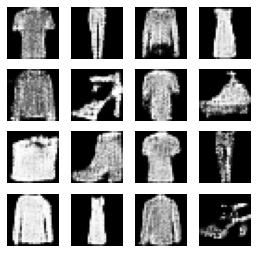

28200: [discriminator loss: 0.695168, acc: 0.507812] [adversarial loss: 0.872974, acc: 0.125000]
28201: [discriminator loss: 0.697134, acc: 0.625000] [adversarial loss: 0.619302, acc: 0.765625]
28202: [discriminator loss: 0.678768, acc: 0.453125] [adversarial loss: 0.812202, acc: 0.171875]
28203: [discriminator loss: 0.674159, acc: 0.593750] [adversarial loss: 0.729166, acc: 0.390625]
28204: [discriminator loss: 0.674315, acc: 0.578125] [adversarial loss: 0.721477, acc: 0.421875]
28205: [discriminator loss: 0.669314, acc: 0.585938] [adversarial loss: 0.822561, acc: 0.203125]
28206: [discriminator loss: 0.679955, acc: 0.562500] [adversarial loss: 0.700641, acc: 0.437500]
28207: [discriminator loss: 0.665430, acc: 0.601562] [adversarial loss: 0.860933, acc: 0.093750]
28208: [discriminator loss: 0.673581, acc: 0.546875] [adversarial loss: 0.685701, acc: 0.500000]
28209: [discriminator loss: 0.663504, acc: 0.593750] [adversarial loss: 0.805914, acc: 0.156250]
28210: [discriminator loss: 0.

28288: [discriminator loss: 0.689428, acc: 0.546875] [adversarial loss: 0.683942, acc: 0.484375]
28289: [discriminator loss: 0.718614, acc: 0.500000] [adversarial loss: 0.832671, acc: 0.187500]
28290: [discriminator loss: 0.690270, acc: 0.570312] [adversarial loss: 0.615644, acc: 0.734375]
28291: [discriminator loss: 0.670258, acc: 0.500000] [adversarial loss: 0.800798, acc: 0.265625]
28292: [discriminator loss: 0.654424, acc: 0.625000] [adversarial loss: 0.690443, acc: 0.593750]
28293: [discriminator loss: 0.676964, acc: 0.554688] [adversarial loss: 0.771769, acc: 0.328125]
28294: [discriminator loss: 0.667107, acc: 0.617188] [adversarial loss: 0.660082, acc: 0.671875]
28295: [discriminator loss: 0.665969, acc: 0.601562] [adversarial loss: 0.736532, acc: 0.437500]
28296: [discriminator loss: 0.669142, acc: 0.632812] [adversarial loss: 0.733683, acc: 0.406250]
28297: [discriminator loss: 0.667482, acc: 0.617188] [adversarial loss: 0.726242, acc: 0.359375]
28298: [discriminator loss: 0.

28375: [discriminator loss: 0.666644, acc: 0.609375] [adversarial loss: 0.702389, acc: 0.515625]
28376: [discriminator loss: 0.651797, acc: 0.625000] [adversarial loss: 0.774506, acc: 0.343750]
28377: [discriminator loss: 0.702301, acc: 0.531250] [adversarial loss: 0.731257, acc: 0.390625]
28378: [discriminator loss: 0.654674, acc: 0.664062] [adversarial loss: 0.735425, acc: 0.375000]
28379: [discriminator loss: 0.676684, acc: 0.554688] [adversarial loss: 0.670387, acc: 0.546875]
28380: [discriminator loss: 0.683601, acc: 0.531250] [adversarial loss: 0.753079, acc: 0.328125]
28381: [discriminator loss: 0.661667, acc: 0.609375] [adversarial loss: 0.694918, acc: 0.531250]
28382: [discriminator loss: 0.680454, acc: 0.585938] [adversarial loss: 0.807782, acc: 0.187500]
28383: [discriminator loss: 0.667400, acc: 0.554688] [adversarial loss: 0.692672, acc: 0.468750]
28384: [discriminator loss: 0.656778, acc: 0.585938] [adversarial loss: 0.874598, acc: 0.093750]
28385: [discriminator loss: 0.

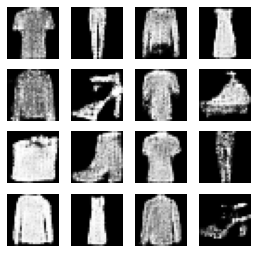

28400: [discriminator loss: 0.672623, acc: 0.609375] [adversarial loss: 0.691980, acc: 0.578125]
28401: [discriminator loss: 0.692329, acc: 0.507812] [adversarial loss: 0.800927, acc: 0.250000]
28402: [discriminator loss: 0.688752, acc: 0.460938] [adversarial loss: 0.756617, acc: 0.281250]
28403: [discriminator loss: 0.676229, acc: 0.539062] [adversarial loss: 0.713564, acc: 0.468750]
28404: [discriminator loss: 0.663291, acc: 0.578125] [adversarial loss: 0.726054, acc: 0.484375]
28405: [discriminator loss: 0.649944, acc: 0.632812] [adversarial loss: 0.773375, acc: 0.312500]
28406: [discriminator loss: 0.657423, acc: 0.632812] [adversarial loss: 0.728751, acc: 0.453125]
28407: [discriminator loss: 0.664526, acc: 0.625000] [adversarial loss: 0.647666, acc: 0.593750]
28408: [discriminator loss: 0.675987, acc: 0.554688] [adversarial loss: 0.921470, acc: 0.156250]
28409: [discriminator loss: 0.727415, acc: 0.492188] [adversarial loss: 0.592589, acc: 0.843750]
28410: [discriminator loss: 0.

28486: [discriminator loss: 0.677290, acc: 0.531250] [adversarial loss: 0.823075, acc: 0.140625]
28487: [discriminator loss: 0.654659, acc: 0.609375] [adversarial loss: 0.764373, acc: 0.296875]
28488: [discriminator loss: 0.666586, acc: 0.640625] [adversarial loss: 0.679565, acc: 0.656250]
28489: [discriminator loss: 0.688879, acc: 0.531250] [adversarial loss: 0.839165, acc: 0.140625]
28490: [discriminator loss: 0.665815, acc: 0.585938] [adversarial loss: 0.683361, acc: 0.531250]
28491: [discriminator loss: 0.679304, acc: 0.585938] [adversarial loss: 0.761674, acc: 0.203125]
28492: [discriminator loss: 0.675843, acc: 0.562500] [adversarial loss: 0.701738, acc: 0.531250]
28493: [discriminator loss: 0.680576, acc: 0.539062] [adversarial loss: 0.801644, acc: 0.250000]
28494: [discriminator loss: 0.663270, acc: 0.609375] [adversarial loss: 0.743087, acc: 0.328125]
28495: [discriminator loss: 0.673956, acc: 0.554688] [adversarial loss: 0.690968, acc: 0.578125]
28496: [discriminator loss: 0.

28575: [discriminator loss: 0.689505, acc: 0.546875] [adversarial loss: 0.889670, acc: 0.171875]
28576: [discriminator loss: 0.714393, acc: 0.484375] [adversarial loss: 0.664744, acc: 0.671875]
28577: [discriminator loss: 0.690238, acc: 0.484375] [adversarial loss: 0.784531, acc: 0.218750]
28578: [discriminator loss: 0.708267, acc: 0.515625] [adversarial loss: 0.632707, acc: 0.781250]
28579: [discriminator loss: 0.682181, acc: 0.515625] [adversarial loss: 0.776832, acc: 0.296875]
28580: [discriminator loss: 0.673546, acc: 0.539062] [adversarial loss: 0.682599, acc: 0.546875]
28581: [discriminator loss: 0.680992, acc: 0.570312] [adversarial loss: 0.787132, acc: 0.156250]
28582: [discriminator loss: 0.683181, acc: 0.570312] [adversarial loss: 0.634900, acc: 0.781250]
28583: [discriminator loss: 0.684213, acc: 0.531250] [adversarial loss: 0.649033, acc: 0.609375]
28584: [discriminator loss: 0.668184, acc: 0.531250] [adversarial loss: 0.651653, acc: 0.640625]
28585: [discriminator loss: 0.

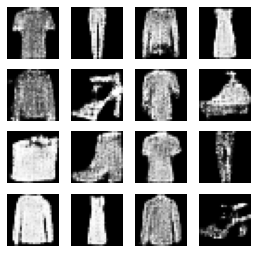

28600: [discriminator loss: 0.688415, acc: 0.500000] [adversarial loss: 0.714895, acc: 0.406250]
28601: [discriminator loss: 0.677707, acc: 0.570312] [adversarial loss: 0.758679, acc: 0.328125]
28602: [discriminator loss: 0.675379, acc: 0.585938] [adversarial loss: 0.644061, acc: 0.718750]
28603: [discriminator loss: 0.664793, acc: 0.609375] [adversarial loss: 0.713979, acc: 0.453125]
28604: [discriminator loss: 0.675413, acc: 0.593750] [adversarial loss: 0.710753, acc: 0.421875]
28605: [discriminator loss: 0.672818, acc: 0.632812] [adversarial loss: 0.773562, acc: 0.343750]
28606: [discriminator loss: 0.679624, acc: 0.570312] [adversarial loss: 0.672715, acc: 0.609375]
28607: [discriminator loss: 0.677173, acc: 0.531250] [adversarial loss: 0.676297, acc: 0.593750]
28608: [discriminator loss: 0.658387, acc: 0.578125] [adversarial loss: 0.885641, acc: 0.078125]
28609: [discriminator loss: 0.689350, acc: 0.554688] [adversarial loss: 0.666320, acc: 0.593750]
28610: [discriminator loss: 0.

28688: [discriminator loss: 0.682301, acc: 0.523438] [adversarial loss: 0.769321, acc: 0.343750]
28689: [discriminator loss: 0.666457, acc: 0.562500] [adversarial loss: 0.660127, acc: 0.625000]
28690: [discriminator loss: 0.666435, acc: 0.632812] [adversarial loss: 0.799476, acc: 0.140625]
28691: [discriminator loss: 0.681705, acc: 0.578125] [adversarial loss: 0.672154, acc: 0.593750]
28692: [discriminator loss: 0.671122, acc: 0.578125] [adversarial loss: 0.724823, acc: 0.437500]
28693: [discriminator loss: 0.675900, acc: 0.578125] [adversarial loss: 0.694827, acc: 0.578125]
28694: [discriminator loss: 0.660693, acc: 0.609375] [adversarial loss: 0.779828, acc: 0.203125]
28695: [discriminator loss: 0.666288, acc: 0.625000] [adversarial loss: 0.689962, acc: 0.562500]
28696: [discriminator loss: 0.709650, acc: 0.445312] [adversarial loss: 0.826710, acc: 0.156250]
28697: [discriminator loss: 0.682698, acc: 0.593750] [adversarial loss: 0.667755, acc: 0.625000]
28698: [discriminator loss: 0.

28776: [discriminator loss: 0.673871, acc: 0.632812] [adversarial loss: 0.651545, acc: 0.671875]
28777: [discriminator loss: 0.714857, acc: 0.484375] [adversarial loss: 0.790642, acc: 0.281250]
28778: [discriminator loss: 0.671648, acc: 0.609375] [adversarial loss: 0.653656, acc: 0.703125]
28779: [discriminator loss: 0.681869, acc: 0.539062] [adversarial loss: 0.780082, acc: 0.390625]
28780: [discriminator loss: 0.672412, acc: 0.562500] [adversarial loss: 0.791294, acc: 0.218750]
28781: [discriminator loss: 0.681063, acc: 0.578125] [adversarial loss: 0.649897, acc: 0.656250]
28782: [discriminator loss: 0.686860, acc: 0.554688] [adversarial loss: 0.840005, acc: 0.093750]
28783: [discriminator loss: 0.672157, acc: 0.554688] [adversarial loss: 0.719214, acc: 0.468750]
28784: [discriminator loss: 0.660198, acc: 0.585938] [adversarial loss: 0.815733, acc: 0.171875]
28785: [discriminator loss: 0.675959, acc: 0.578125] [adversarial loss: 0.672294, acc: 0.656250]
28786: [discriminator loss: 0.

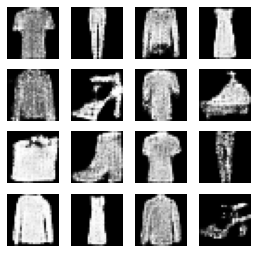

28800: [discriminator loss: 0.680059, acc: 0.570312] [adversarial loss: 0.741839, acc: 0.406250]
28801: [discriminator loss: 0.659228, acc: 0.640625] [adversarial loss: 0.807268, acc: 0.250000]
28802: [discriminator loss: 0.669311, acc: 0.617188] [adversarial loss: 0.689698, acc: 0.515625]
28803: [discriminator loss: 0.676940, acc: 0.554688] [adversarial loss: 0.752224, acc: 0.250000]
28804: [discriminator loss: 0.683561, acc: 0.578125] [adversarial loss: 0.743781, acc: 0.359375]
28805: [discriminator loss: 0.652637, acc: 0.625000] [adversarial loss: 0.842595, acc: 0.140625]
28806: [discriminator loss: 0.687167, acc: 0.539062] [adversarial loss: 0.759841, acc: 0.265625]
28807: [discriminator loss: 0.663557, acc: 0.632812] [adversarial loss: 0.687652, acc: 0.453125]
28808: [discriminator loss: 0.665073, acc: 0.625000] [adversarial loss: 0.774718, acc: 0.343750]
28809: [discriminator loss: 0.673272, acc: 0.570312] [adversarial loss: 0.770782, acc: 0.359375]
28810: [discriminator loss: 0.

28888: [discriminator loss: 0.682746, acc: 0.531250] [adversarial loss: 0.825742, acc: 0.171875]
28889: [discriminator loss: 0.679162, acc: 0.562500] [adversarial loss: 0.597241, acc: 0.859375]
28890: [discriminator loss: 0.670827, acc: 0.601562] [adversarial loss: 0.786903, acc: 0.218750]
28891: [discriminator loss: 0.667958, acc: 0.585938] [adversarial loss: 0.668717, acc: 0.640625]
28892: [discriminator loss: 0.671855, acc: 0.578125] [adversarial loss: 0.731301, acc: 0.312500]
28893: [discriminator loss: 0.646583, acc: 0.664062] [adversarial loss: 0.765871, acc: 0.343750]
28894: [discriminator loss: 0.681679, acc: 0.546875] [adversarial loss: 0.758719, acc: 0.234375]
28895: [discriminator loss: 0.673427, acc: 0.570312] [adversarial loss: 0.779876, acc: 0.296875]
28896: [discriminator loss: 0.690465, acc: 0.500000] [adversarial loss: 0.791798, acc: 0.203125]
28897: [discriminator loss: 0.672125, acc: 0.601562] [adversarial loss: 0.688131, acc: 0.515625]
28898: [discriminator loss: 0.

28974: [discriminator loss: 0.695000, acc: 0.484375] [adversarial loss: 0.758465, acc: 0.234375]
28975: [discriminator loss: 0.673089, acc: 0.554688] [adversarial loss: 0.728602, acc: 0.375000]
28976: [discriminator loss: 0.696241, acc: 0.468750] [adversarial loss: 0.749974, acc: 0.359375]
28977: [discriminator loss: 0.688851, acc: 0.515625] [adversarial loss: 0.646401, acc: 0.703125]
28978: [discriminator loss: 0.662860, acc: 0.593750] [adversarial loss: 0.813704, acc: 0.125000]
28979: [discriminator loss: 0.678792, acc: 0.570312] [adversarial loss: 0.725520, acc: 0.437500]
28980: [discriminator loss: 0.685360, acc: 0.601562] [adversarial loss: 0.772492, acc: 0.359375]
28981: [discriminator loss: 0.702193, acc: 0.492188] [adversarial loss: 0.714398, acc: 0.421875]
28982: [discriminator loss: 0.666000, acc: 0.562500] [adversarial loss: 0.740434, acc: 0.375000]
28983: [discriminator loss: 0.673319, acc: 0.593750] [adversarial loss: 0.663966, acc: 0.546875]
28984: [discriminator loss: 0.

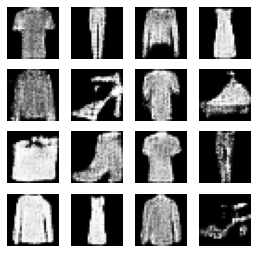

29000: [discriminator loss: 0.660669, acc: 0.593750] [adversarial loss: 0.719297, acc: 0.437500]
29001: [discriminator loss: 0.681389, acc: 0.546875] [adversarial loss: 0.697443, acc: 0.421875]
29002: [discriminator loss: 0.681419, acc: 0.593750] [adversarial loss: 0.787750, acc: 0.328125]
29003: [discriminator loss: 0.646900, acc: 0.625000] [adversarial loss: 0.699947, acc: 0.546875]
29004: [discriminator loss: 0.669402, acc: 0.570312] [adversarial loss: 0.742529, acc: 0.468750]
29005: [discriminator loss: 0.668107, acc: 0.609375] [adversarial loss: 0.668663, acc: 0.609375]
29006: [discriminator loss: 0.690579, acc: 0.531250] [adversarial loss: 0.951063, acc: 0.125000]
29007: [discriminator loss: 0.719543, acc: 0.492188] [adversarial loss: 0.597186, acc: 0.875000]
29008: [discriminator loss: 0.688674, acc: 0.539062] [adversarial loss: 0.827634, acc: 0.156250]
29009: [discriminator loss: 0.689925, acc: 0.546875] [adversarial loss: 0.686811, acc: 0.531250]
29010: [discriminator loss: 0.

29087: [discriminator loss: 0.691371, acc: 0.554688] [adversarial loss: 0.646138, acc: 0.546875]
29088: [discriminator loss: 0.676128, acc: 0.585938] [adversarial loss: 0.865444, acc: 0.187500]
29089: [discriminator loss: 0.694775, acc: 0.539062] [adversarial loss: 0.709521, acc: 0.406250]
29090: [discriminator loss: 0.689057, acc: 0.570312] [adversarial loss: 0.703020, acc: 0.500000]
29091: [discriminator loss: 0.674665, acc: 0.562500] [adversarial loss: 0.776648, acc: 0.265625]
29092: [discriminator loss: 0.678448, acc: 0.562500] [adversarial loss: 0.677808, acc: 0.562500]
29093: [discriminator loss: 0.672782, acc: 0.500000] [adversarial loss: 0.772692, acc: 0.218750]
29094: [discriminator loss: 0.685091, acc: 0.585938] [adversarial loss: 0.666576, acc: 0.625000]
29095: [discriminator loss: 0.669498, acc: 0.601562] [adversarial loss: 0.783067, acc: 0.281250]
29096: [discriminator loss: 0.674368, acc: 0.609375] [adversarial loss: 0.708941, acc: 0.390625]
29097: [discriminator loss: 0.

29173: [discriminator loss: 0.679231, acc: 0.539062] [adversarial loss: 0.785146, acc: 0.140625]
29174: [discriminator loss: 0.656844, acc: 0.601562] [adversarial loss: 0.783143, acc: 0.171875]
29175: [discriminator loss: 0.659347, acc: 0.562500] [adversarial loss: 0.736909, acc: 0.484375]
29176: [discriminator loss: 0.662641, acc: 0.617188] [adversarial loss: 0.748562, acc: 0.343750]
29177: [discriminator loss: 0.690914, acc: 0.492188] [adversarial loss: 0.835818, acc: 0.125000]
29178: [discriminator loss: 0.673386, acc: 0.578125] [adversarial loss: 0.638310, acc: 0.734375]
29179: [discriminator loss: 0.666343, acc: 0.554688] [adversarial loss: 0.908602, acc: 0.109375]
29180: [discriminator loss: 0.650618, acc: 0.679688] [adversarial loss: 0.625352, acc: 0.671875]
29181: [discriminator loss: 0.670947, acc: 0.617188] [adversarial loss: 0.809333, acc: 0.250000]
29182: [discriminator loss: 0.664083, acc: 0.601562] [adversarial loss: 0.642095, acc: 0.578125]
29183: [discriminator loss: 0.

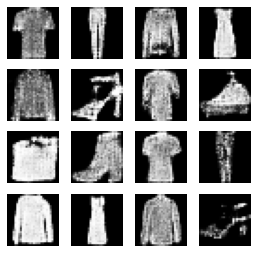

29200: [discriminator loss: 0.667376, acc: 0.562500] [adversarial loss: 0.687872, acc: 0.546875]
29201: [discriminator loss: 0.683510, acc: 0.570312] [adversarial loss: 0.711360, acc: 0.468750]
29202: [discriminator loss: 0.696902, acc: 0.492188] [adversarial loss: 0.618306, acc: 0.703125]
29203: [discriminator loss: 0.666802, acc: 0.585938] [adversarial loss: 0.792305, acc: 0.250000]
29204: [discriminator loss: 0.690094, acc: 0.546875] [adversarial loss: 0.655836, acc: 0.671875]
29205: [discriminator loss: 0.688981, acc: 0.500000] [adversarial loss: 0.819043, acc: 0.234375]
29206: [discriminator loss: 0.662039, acc: 0.640625] [adversarial loss: 0.691620, acc: 0.531250]
29207: [discriminator loss: 0.682883, acc: 0.507812] [adversarial loss: 0.678688, acc: 0.593750]
29208: [discriminator loss: 0.660636, acc: 0.601562] [adversarial loss: 0.697119, acc: 0.531250]
29209: [discriminator loss: 0.676632, acc: 0.531250] [adversarial loss: 0.734109, acc: 0.546875]
29210: [discriminator loss: 0.

29288: [discriminator loss: 0.681605, acc: 0.554688] [adversarial loss: 0.808665, acc: 0.281250]
29289: [discriminator loss: 0.680658, acc: 0.625000] [adversarial loss: 0.798427, acc: 0.218750]
29290: [discriminator loss: 0.656302, acc: 0.609375] [adversarial loss: 0.744107, acc: 0.343750]
29291: [discriminator loss: 0.685901, acc: 0.523438] [adversarial loss: 0.805823, acc: 0.250000]
29292: [discriminator loss: 0.666815, acc: 0.554688] [adversarial loss: 0.699959, acc: 0.437500]
29293: [discriminator loss: 0.682952, acc: 0.523438] [adversarial loss: 0.859723, acc: 0.125000]
29294: [discriminator loss: 0.666319, acc: 0.617188] [adversarial loss: 0.602101, acc: 0.812500]
29295: [discriminator loss: 0.686151, acc: 0.500000] [adversarial loss: 0.739404, acc: 0.453125]
29296: [discriminator loss: 0.685668, acc: 0.570312] [adversarial loss: 0.738890, acc: 0.437500]
29297: [discriminator loss: 0.656051, acc: 0.640625] [adversarial loss: 0.730938, acc: 0.343750]
29298: [discriminator loss: 0.

29375: [discriminator loss: 0.680466, acc: 0.640625] [adversarial loss: 0.742758, acc: 0.343750]
29376: [discriminator loss: 0.699358, acc: 0.546875] [adversarial loss: 0.706273, acc: 0.484375]
29377: [discriminator loss: 0.668845, acc: 0.554688] [adversarial loss: 0.829497, acc: 0.156250]
29378: [discriminator loss: 0.678150, acc: 0.578125] [adversarial loss: 0.680715, acc: 0.640625]
29379: [discriminator loss: 0.645917, acc: 0.625000] [adversarial loss: 0.801748, acc: 0.359375]
29380: [discriminator loss: 0.671592, acc: 0.625000] [adversarial loss: 0.662245, acc: 0.562500]
29381: [discriminator loss: 0.675301, acc: 0.601562] [adversarial loss: 0.788579, acc: 0.312500]
29382: [discriminator loss: 0.687581, acc: 0.507812] [adversarial loss: 0.702183, acc: 0.437500]
29383: [discriminator loss: 0.664865, acc: 0.609375] [adversarial loss: 0.753430, acc: 0.312500]
29384: [discriminator loss: 0.695512, acc: 0.500000] [adversarial loss: 0.649743, acc: 0.671875]
29385: [discriminator loss: 0.

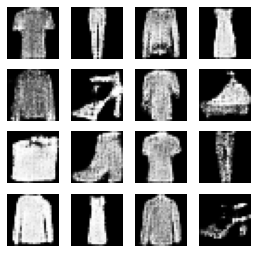

29400: [discriminator loss: 0.650827, acc: 0.679688] [adversarial loss: 0.683820, acc: 0.500000]
29401: [discriminator loss: 0.676678, acc: 0.570312] [adversarial loss: 0.708940, acc: 0.484375]
29402: [discriminator loss: 0.707382, acc: 0.507812] [adversarial loss: 0.680935, acc: 0.500000]
29403: [discriminator loss: 0.674185, acc: 0.640625] [adversarial loss: 0.770844, acc: 0.281250]
29404: [discriminator loss: 0.664591, acc: 0.640625] [adversarial loss: 0.707055, acc: 0.515625]
29405: [discriminator loss: 0.690064, acc: 0.539062] [adversarial loss: 0.676271, acc: 0.578125]
29406: [discriminator loss: 0.663491, acc: 0.570312] [adversarial loss: 0.724460, acc: 0.421875]
29407: [discriminator loss: 0.647550, acc: 0.671875] [adversarial loss: 0.748507, acc: 0.296875]
29408: [discriminator loss: 0.696816, acc: 0.492188] [adversarial loss: 0.719346, acc: 0.515625]
29409: [discriminator loss: 0.701969, acc: 0.500000] [adversarial loss: 0.708841, acc: 0.484375]
29410: [discriminator loss: 0.

29485: [discriminator loss: 0.661135, acc: 0.601562] [adversarial loss: 0.851410, acc: 0.078125]
29486: [discriminator loss: 0.674607, acc: 0.593750] [adversarial loss: 0.623526, acc: 0.812500]
29487: [discriminator loss: 0.664450, acc: 0.562500] [adversarial loss: 0.796671, acc: 0.281250]
29488: [discriminator loss: 0.681073, acc: 0.546875] [adversarial loss: 0.690144, acc: 0.546875]
29489: [discriminator loss: 0.656774, acc: 0.601562] [adversarial loss: 0.768666, acc: 0.265625]
29490: [discriminator loss: 0.676944, acc: 0.578125] [adversarial loss: 0.652612, acc: 0.625000]
29491: [discriminator loss: 0.683077, acc: 0.523438] [adversarial loss: 0.858549, acc: 0.078125]
29492: [discriminator loss: 0.675066, acc: 0.562500] [adversarial loss: 0.709062, acc: 0.468750]
29493: [discriminator loss: 0.667523, acc: 0.632812] [adversarial loss: 0.706216, acc: 0.437500]
29494: [discriminator loss: 0.656724, acc: 0.625000] [adversarial loss: 0.726378, acc: 0.437500]
29495: [discriminator loss: 0.

29574: [discriminator loss: 0.661571, acc: 0.617188] [adversarial loss: 0.700693, acc: 0.484375]
29575: [discriminator loss: 0.673224, acc: 0.539062] [adversarial loss: 0.758291, acc: 0.281250]
29576: [discriminator loss: 0.673026, acc: 0.585938] [adversarial loss: 0.589127, acc: 0.875000]
29577: [discriminator loss: 0.676772, acc: 0.500000] [adversarial loss: 0.787326, acc: 0.171875]
29578: [discriminator loss: 0.673139, acc: 0.593750] [adversarial loss: 0.642153, acc: 0.671875]
29579: [discriminator loss: 0.679424, acc: 0.460938] [adversarial loss: 0.812943, acc: 0.234375]
29580: [discriminator loss: 0.678971, acc: 0.578125] [adversarial loss: 0.684046, acc: 0.578125]
29581: [discriminator loss: 0.690897, acc: 0.484375] [adversarial loss: 0.753233, acc: 0.250000]
29582: [discriminator loss: 0.645973, acc: 0.664062] [adversarial loss: 0.646611, acc: 0.625000]
29583: [discriminator loss: 0.687371, acc: 0.523438] [adversarial loss: 0.873319, acc: 0.046875]
29584: [discriminator loss: 0.

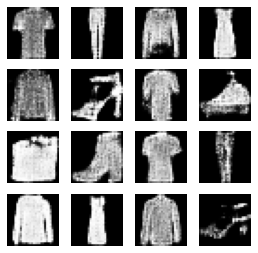

29600: [discriminator loss: 0.683349, acc: 0.593750] [adversarial loss: 0.780998, acc: 0.312500]
29601: [discriminator loss: 0.651138, acc: 0.640625] [adversarial loss: 0.649105, acc: 0.656250]
29602: [discriminator loss: 0.661644, acc: 0.609375] [adversarial loss: 0.793902, acc: 0.203125]
29603: [discriminator loss: 0.673077, acc: 0.578125] [adversarial loss: 0.714082, acc: 0.546875]
29604: [discriminator loss: 0.682306, acc: 0.554688] [adversarial loss: 0.805707, acc: 0.171875]
29605: [discriminator loss: 0.675728, acc: 0.578125] [adversarial loss: 0.704594, acc: 0.421875]
29606: [discriminator loss: 0.696232, acc: 0.500000] [adversarial loss: 0.808853, acc: 0.171875]
29607: [discriminator loss: 0.670832, acc: 0.539062] [adversarial loss: 0.675490, acc: 0.625000]
29608: [discriminator loss: 0.685654, acc: 0.539062] [adversarial loss: 0.719872, acc: 0.500000]
29609: [discriminator loss: 0.669232, acc: 0.601562] [adversarial loss: 0.721994, acc: 0.421875]
29610: [discriminator loss: 0.

29686: [discriminator loss: 0.670590, acc: 0.539062] [adversarial loss: 0.798472, acc: 0.187500]
29687: [discriminator loss: 0.665866, acc: 0.601562] [adversarial loss: 0.736648, acc: 0.468750]
29688: [discriminator loss: 0.661379, acc: 0.562500] [adversarial loss: 0.803248, acc: 0.234375]
29689: [discriminator loss: 0.691304, acc: 0.500000] [adversarial loss: 0.711976, acc: 0.546875]
29690: [discriminator loss: 0.670902, acc: 0.523438] [adversarial loss: 0.670699, acc: 0.546875]
29691: [discriminator loss: 0.671090, acc: 0.585938] [adversarial loss: 0.792179, acc: 0.140625]
29692: [discriminator loss: 0.666443, acc: 0.601562] [adversarial loss: 0.729655, acc: 0.421875]
29693: [discriminator loss: 0.688085, acc: 0.562500] [adversarial loss: 0.729728, acc: 0.375000]
29694: [discriminator loss: 0.678522, acc: 0.609375] [adversarial loss: 0.665271, acc: 0.656250]
29695: [discriminator loss: 0.660942, acc: 0.585938] [adversarial loss: 0.740972, acc: 0.500000]
29696: [discriminator loss: 0.

29771: [discriminator loss: 0.686865, acc: 0.578125] [adversarial loss: 0.693856, acc: 0.531250]
29772: [discriminator loss: 0.664919, acc: 0.585938] [adversarial loss: 0.765948, acc: 0.343750]
29773: [discriminator loss: 0.660579, acc: 0.640625] [adversarial loss: 0.740831, acc: 0.375000]
29774: [discriminator loss: 0.690374, acc: 0.500000] [adversarial loss: 0.782840, acc: 0.171875]
29775: [discriminator loss: 0.680082, acc: 0.562500] [adversarial loss: 0.812286, acc: 0.156250]
29776: [discriminator loss: 0.674960, acc: 0.593750] [adversarial loss: 0.697073, acc: 0.531250]
29777: [discriminator loss: 0.698029, acc: 0.460938] [adversarial loss: 0.769465, acc: 0.328125]
29778: [discriminator loss: 0.692209, acc: 0.515625] [adversarial loss: 0.660127, acc: 0.687500]
29779: [discriminator loss: 0.672344, acc: 0.562500] [adversarial loss: 0.716799, acc: 0.484375]
29780: [discriminator loss: 0.663685, acc: 0.593750] [adversarial loss: 0.686246, acc: 0.500000]
29781: [discriminator loss: 0.

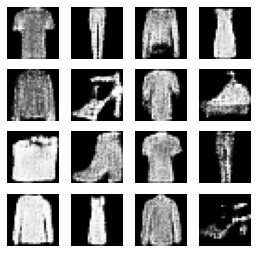

29800: [discriminator loss: 0.667667, acc: 0.585938] [adversarial loss: 0.755864, acc: 0.328125]
29801: [discriminator loss: 0.668966, acc: 0.585938] [adversarial loss: 0.724674, acc: 0.468750]
29802: [discriminator loss: 0.677564, acc: 0.539062] [adversarial loss: 0.754692, acc: 0.406250]
29803: [discriminator loss: 0.691116, acc: 0.507812] [adversarial loss: 0.680444, acc: 0.562500]
29804: [discriminator loss: 0.674957, acc: 0.562500] [adversarial loss: 0.769701, acc: 0.281250]
29805: [discriminator loss: 0.670767, acc: 0.570312] [adversarial loss: 0.728173, acc: 0.468750]
29806: [discriminator loss: 0.673804, acc: 0.562500] [adversarial loss: 0.692810, acc: 0.453125]
29807: [discriminator loss: 0.670452, acc: 0.578125] [adversarial loss: 0.786114, acc: 0.312500]
29808: [discriminator loss: 0.691262, acc: 0.570312] [adversarial loss: 0.697909, acc: 0.484375]
29809: [discriminator loss: 0.686361, acc: 0.539062] [adversarial loss: 0.700565, acc: 0.531250]
29810: [discriminator loss: 0.

29889: [discriminator loss: 0.657291, acc: 0.617188] [adversarial loss: 0.653755, acc: 0.656250]
29890: [discriminator loss: 0.688846, acc: 0.500000] [adversarial loss: 0.826196, acc: 0.218750]
29891: [discriminator loss: 0.681138, acc: 0.609375] [adversarial loss: 0.656629, acc: 0.656250]
29892: [discriminator loss: 0.717120, acc: 0.429688] [adversarial loss: 0.744953, acc: 0.343750]
29893: [discriminator loss: 0.684403, acc: 0.515625] [adversarial loss: 0.735273, acc: 0.437500]
29894: [discriminator loss: 0.678689, acc: 0.562500] [adversarial loss: 0.748576, acc: 0.328125]
29895: [discriminator loss: 0.671580, acc: 0.632812] [adversarial loss: 0.746544, acc: 0.328125]
29896: [discriminator loss: 0.663519, acc: 0.593750] [adversarial loss: 0.703113, acc: 0.437500]
29897: [discriminator loss: 0.673538, acc: 0.539062] [adversarial loss: 0.799442, acc: 0.187500]
29898: [discriminator loss: 0.672920, acc: 0.570312] [adversarial loss: 0.771686, acc: 0.343750]
29899: [discriminator loss: 0.

29978: [discriminator loss: 0.658332, acc: 0.585938] [adversarial loss: 0.747809, acc: 0.281250]
29979: [discriminator loss: 0.710207, acc: 0.484375] [adversarial loss: 0.715134, acc: 0.500000]
29980: [discriminator loss: 0.661961, acc: 0.625000] [adversarial loss: 0.686912, acc: 0.531250]
29981: [discriminator loss: 0.715285, acc: 0.468750] [adversarial loss: 0.791842, acc: 0.281250]
29982: [discriminator loss: 0.681914, acc: 0.531250] [adversarial loss: 0.676875, acc: 0.531250]
29983: [discriminator loss: 0.667509, acc: 0.593750] [adversarial loss: 0.705005, acc: 0.437500]
29984: [discriminator loss: 0.689312, acc: 0.585938] [adversarial loss: 0.780189, acc: 0.296875]
29985: [discriminator loss: 0.672337, acc: 0.601562] [adversarial loss: 0.759328, acc: 0.312500]
29986: [discriminator loss: 0.679372, acc: 0.523438] [adversarial loss: 0.635176, acc: 0.687500]
29987: [discriminator loss: 0.679041, acc: 0.539062] [adversarial loss: 0.742532, acc: 0.343750]
29988: [discriminator loss: 0.

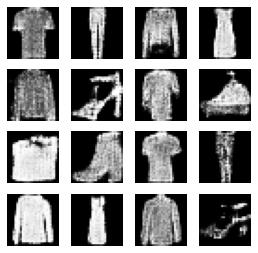

30000: [discriminator loss: 0.652374, acc: 0.632812] [adversarial loss: 0.723134, acc: 0.468750]
30001: [discriminator loss: 0.676981, acc: 0.531250] [adversarial loss: 0.673660, acc: 0.593750]
30002: [discriminator loss: 0.703999, acc: 0.460938] [adversarial loss: 0.758946, acc: 0.421875]
30003: [discriminator loss: 0.683466, acc: 0.531250] [adversarial loss: 0.715554, acc: 0.406250]
30004: [discriminator loss: 0.675207, acc: 0.515625] [adversarial loss: 0.687910, acc: 0.468750]
30005: [discriminator loss: 0.658366, acc: 0.578125] [adversarial loss: 0.849125, acc: 0.078125]
30006: [discriminator loss: 0.681368, acc: 0.562500] [adversarial loss: 0.658514, acc: 0.656250]
30007: [discriminator loss: 0.672663, acc: 0.593750] [adversarial loss: 0.765579, acc: 0.234375]
30008: [discriminator loss: 0.672706, acc: 0.656250] [adversarial loss: 0.716126, acc: 0.453125]
30009: [discriminator loss: 0.661260, acc: 0.609375] [adversarial loss: 0.751235, acc: 0.343750]
30010: [discriminator loss: 0.

30087: [discriminator loss: 0.701401, acc: 0.492188] [adversarial loss: 0.675456, acc: 0.578125]
30088: [discriminator loss: 0.691361, acc: 0.539062] [adversarial loss: 0.857842, acc: 0.093750]
30089: [discriminator loss: 0.689518, acc: 0.562500] [adversarial loss: 0.651819, acc: 0.671875]
30090: [discriminator loss: 0.688522, acc: 0.507812] [adversarial loss: 0.805458, acc: 0.187500]
30091: [discriminator loss: 0.701919, acc: 0.515625] [adversarial loss: 0.636505, acc: 0.640625]
30092: [discriminator loss: 0.689309, acc: 0.531250] [adversarial loss: 0.833902, acc: 0.218750]
30093: [discriminator loss: 0.680957, acc: 0.562500] [adversarial loss: 0.767365, acc: 0.296875]
30094: [discriminator loss: 0.660804, acc: 0.679688] [adversarial loss: 0.838981, acc: 0.140625]
30095: [discriminator loss: 0.668076, acc: 0.570312] [adversarial loss: 0.697634, acc: 0.562500]
30096: [discriminator loss: 0.663061, acc: 0.640625] [adversarial loss: 0.768982, acc: 0.328125]
30097: [discriminator loss: 0.

30176: [discriminator loss: 0.676904, acc: 0.601562] [adversarial loss: 0.829509, acc: 0.156250]
30177: [discriminator loss: 0.688503, acc: 0.593750] [adversarial loss: 0.673750, acc: 0.546875]
30178: [discriminator loss: 0.695283, acc: 0.500000] [adversarial loss: 0.810638, acc: 0.265625]
30179: [discriminator loss: 0.673818, acc: 0.546875] [adversarial loss: 0.612146, acc: 0.781250]
30180: [discriminator loss: 0.695348, acc: 0.484375] [adversarial loss: 0.800110, acc: 0.265625]
30181: [discriminator loss: 0.690108, acc: 0.609375] [adversarial loss: 0.687619, acc: 0.562500]
30182: [discriminator loss: 0.666396, acc: 0.625000] [adversarial loss: 0.719605, acc: 0.437500]
30183: [discriminator loss: 0.674599, acc: 0.578125] [adversarial loss: 0.665462, acc: 0.593750]
30184: [discriminator loss: 0.681865, acc: 0.500000] [adversarial loss: 0.829906, acc: 0.109375]
30185: [discriminator loss: 0.657839, acc: 0.593750] [adversarial loss: 0.741267, acc: 0.343750]
30186: [discriminator loss: 0.

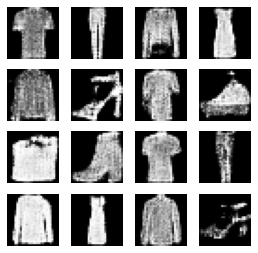

30200: [discriminator loss: 0.666751, acc: 0.554688] [adversarial loss: 0.694448, acc: 0.531250]
30201: [discriminator loss: 0.670494, acc: 0.562500] [adversarial loss: 0.760820, acc: 0.375000]
30202: [discriminator loss: 0.694931, acc: 0.570312] [adversarial loss: 0.690765, acc: 0.562500]
30203: [discriminator loss: 0.680577, acc: 0.562500] [adversarial loss: 0.882285, acc: 0.187500]
30204: [discriminator loss: 0.693204, acc: 0.539062] [adversarial loss: 0.610582, acc: 0.734375]
30205: [discriminator loss: 0.695152, acc: 0.523438] [adversarial loss: 0.802642, acc: 0.218750]
30206: [discriminator loss: 0.658392, acc: 0.617188] [adversarial loss: 0.749237, acc: 0.265625]
30207: [discriminator loss: 0.692988, acc: 0.546875] [adversarial loss: 0.657153, acc: 0.671875]
30208: [discriminator loss: 0.641929, acc: 0.640625] [adversarial loss: 0.779655, acc: 0.203125]
30209: [discriminator loss: 0.680129, acc: 0.625000] [adversarial loss: 0.769260, acc: 0.250000]
30210: [discriminator loss: 0.

30290: [discriminator loss: 0.686958, acc: 0.531250] [adversarial loss: 0.803167, acc: 0.187500]
30291: [discriminator loss: 0.682585, acc: 0.539062] [adversarial loss: 0.771342, acc: 0.265625]
30292: [discriminator loss: 0.667518, acc: 0.640625] [adversarial loss: 0.685627, acc: 0.531250]
30293: [discriminator loss: 0.673079, acc: 0.593750] [adversarial loss: 0.753016, acc: 0.468750]
30294: [discriminator loss: 0.662486, acc: 0.617188] [adversarial loss: 0.717841, acc: 0.531250]
30295: [discriminator loss: 0.676013, acc: 0.578125] [adversarial loss: 0.785494, acc: 0.281250]
30296: [discriminator loss: 0.680495, acc: 0.546875] [adversarial loss: 0.705541, acc: 0.468750]
30297: [discriminator loss: 0.662653, acc: 0.585938] [adversarial loss: 0.776565, acc: 0.203125]
30298: [discriminator loss: 0.666038, acc: 0.593750] [adversarial loss: 0.603842, acc: 0.765625]
30299: [discriminator loss: 0.690787, acc: 0.531250] [adversarial loss: 0.871915, acc: 0.093750]
30300: [discriminator loss: 0.

30377: [discriminator loss: 0.668467, acc: 0.570312] [adversarial loss: 0.655248, acc: 0.593750]
30378: [discriminator loss: 0.685853, acc: 0.515625] [adversarial loss: 0.865416, acc: 0.125000]
30379: [discriminator loss: 0.674106, acc: 0.562500] [adversarial loss: 0.623833, acc: 0.750000]
30380: [discriminator loss: 0.667934, acc: 0.539062] [adversarial loss: 0.778553, acc: 0.265625]
30381: [discriminator loss: 0.668471, acc: 0.617188] [adversarial loss: 0.757938, acc: 0.296875]
30382: [discriminator loss: 0.663450, acc: 0.632812] [adversarial loss: 0.636336, acc: 0.703125]
30383: [discriminator loss: 0.672332, acc: 0.578125] [adversarial loss: 0.835434, acc: 0.171875]
30384: [discriminator loss: 0.692916, acc: 0.562500] [adversarial loss: 0.586128, acc: 0.828125]
30385: [discriminator loss: 0.675053, acc: 0.523438] [adversarial loss: 0.731015, acc: 0.421875]
30386: [discriminator loss: 0.681450, acc: 0.570312] [adversarial loss: 0.685100, acc: 0.484375]
30387: [discriminator loss: 0.

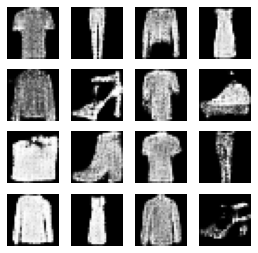

30400: [discriminator loss: 0.673247, acc: 0.593750] [adversarial loss: 0.771821, acc: 0.265625]
30401: [discriminator loss: 0.674197, acc: 0.554688] [adversarial loss: 0.822014, acc: 0.093750]
30402: [discriminator loss: 0.673942, acc: 0.562500] [adversarial loss: 0.644448, acc: 0.703125]
30403: [discriminator loss: 0.677571, acc: 0.562500] [adversarial loss: 0.756450, acc: 0.281250]
30404: [discriminator loss: 0.681220, acc: 0.570312] [adversarial loss: 0.686534, acc: 0.500000]
30405: [discriminator loss: 0.699576, acc: 0.500000] [adversarial loss: 0.795673, acc: 0.234375]
30406: [discriminator loss: 0.696996, acc: 0.554688] [adversarial loss: 0.701431, acc: 0.437500]
30407: [discriminator loss: 0.650441, acc: 0.671875] [adversarial loss: 0.744251, acc: 0.296875]
30408: [discriminator loss: 0.671694, acc: 0.617188] [adversarial loss: 0.761589, acc: 0.343750]
30409: [discriminator loss: 0.669065, acc: 0.609375] [adversarial loss: 0.670404, acc: 0.578125]
30410: [discriminator loss: 0.

30486: [discriminator loss: 0.684612, acc: 0.562500] [adversarial loss: 0.750362, acc: 0.359375]
30487: [discriminator loss: 0.657809, acc: 0.664062] [adversarial loss: 0.718233, acc: 0.468750]
30488: [discriminator loss: 0.682940, acc: 0.554688] [adversarial loss: 0.839818, acc: 0.187500]
30489: [discriminator loss: 0.677862, acc: 0.554688] [adversarial loss: 0.613749, acc: 0.765625]
30490: [discriminator loss: 0.645662, acc: 0.578125] [adversarial loss: 0.779989, acc: 0.250000]
30491: [discriminator loss: 0.678559, acc: 0.515625] [adversarial loss: 0.616971, acc: 0.781250]
30492: [discriminator loss: 0.704502, acc: 0.460938] [adversarial loss: 0.774827, acc: 0.296875]
30493: [discriminator loss: 0.677210, acc: 0.585938] [adversarial loss: 0.710441, acc: 0.531250]
30494: [discriminator loss: 0.666374, acc: 0.523438] [adversarial loss: 0.730095, acc: 0.375000]
30495: [discriminator loss: 0.652363, acc: 0.679688] [adversarial loss: 0.822316, acc: 0.156250]
30496: [discriminator loss: 0.

30571: [discriminator loss: 0.683999, acc: 0.523438] [adversarial loss: 0.561858, acc: 0.921875]
30572: [discriminator loss: 0.688400, acc: 0.484375] [adversarial loss: 0.783667, acc: 0.375000]
30573: [discriminator loss: 0.648572, acc: 0.609375] [adversarial loss: 0.712095, acc: 0.562500]
30574: [discriminator loss: 0.706494, acc: 0.523438] [adversarial loss: 0.886092, acc: 0.156250]
30575: [discriminator loss: 0.664896, acc: 0.601562] [adversarial loss: 0.662379, acc: 0.593750]
30576: [discriminator loss: 0.669738, acc: 0.539062] [adversarial loss: 0.737042, acc: 0.328125]
30577: [discriminator loss: 0.677271, acc: 0.539062] [adversarial loss: 0.826194, acc: 0.093750]
30578: [discriminator loss: 0.692176, acc: 0.546875] [adversarial loss: 0.649477, acc: 0.671875]
30579: [discriminator loss: 0.659782, acc: 0.632812] [adversarial loss: 0.733652, acc: 0.343750]
30580: [discriminator loss: 0.673432, acc: 0.585938] [adversarial loss: 0.741019, acc: 0.296875]
30581: [discriminator loss: 0.

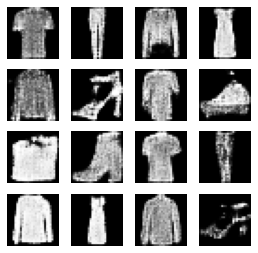

30600: [discriminator loss: 0.675159, acc: 0.601562] [adversarial loss: 0.677490, acc: 0.609375]
30601: [discriminator loss: 0.672954, acc: 0.531250] [adversarial loss: 0.825769, acc: 0.140625]
30602: [discriminator loss: 0.689684, acc: 0.546875] [adversarial loss: 0.684594, acc: 0.546875]
30603: [discriminator loss: 0.684409, acc: 0.531250] [adversarial loss: 0.810951, acc: 0.171875]
30604: [discriminator loss: 0.666247, acc: 0.617188] [adversarial loss: 0.764422, acc: 0.281250]
30605: [discriminator loss: 0.686647, acc: 0.562500] [adversarial loss: 0.569130, acc: 0.718750]
30606: [discriminator loss: 0.698437, acc: 0.546875] [adversarial loss: 0.840106, acc: 0.265625]
30607: [discriminator loss: 0.695909, acc: 0.554688] [adversarial loss: 0.596494, acc: 0.750000]
30608: [discriminator loss: 0.666134, acc: 0.539062] [adversarial loss: 0.810546, acc: 0.265625]
30609: [discriminator loss: 0.669344, acc: 0.562500] [adversarial loss: 0.765642, acc: 0.359375]
30610: [discriminator loss: 0.

30688: [discriminator loss: 0.696731, acc: 0.484375] [adversarial loss: 0.735510, acc: 0.281250]
30689: [discriminator loss: 0.676183, acc: 0.539062] [adversarial loss: 0.730002, acc: 0.343750]
30690: [discriminator loss: 0.671460, acc: 0.625000] [adversarial loss: 0.657318, acc: 0.578125]
30691: [discriminator loss: 0.677127, acc: 0.593750] [adversarial loss: 0.848286, acc: 0.078125]
30692: [discriminator loss: 0.682712, acc: 0.570312] [adversarial loss: 0.650629, acc: 0.671875]
30693: [discriminator loss: 0.686186, acc: 0.523438] [adversarial loss: 0.731995, acc: 0.359375]
30694: [discriminator loss: 0.675541, acc: 0.539062] [adversarial loss: 0.719857, acc: 0.375000]
30695: [discriminator loss: 0.690143, acc: 0.515625] [adversarial loss: 0.592511, acc: 0.812500]
30696: [discriminator loss: 0.682147, acc: 0.531250] [adversarial loss: 0.794529, acc: 0.250000]
30697: [discriminator loss: 0.674005, acc: 0.562500] [adversarial loss: 0.692128, acc: 0.500000]
30698: [discriminator loss: 0.

30773: [discriminator loss: 0.686862, acc: 0.523438] [adversarial loss: 0.836631, acc: 0.265625]
30774: [discriminator loss: 0.694315, acc: 0.523438] [adversarial loss: 0.670481, acc: 0.515625]
30775: [discriminator loss: 0.687763, acc: 0.507812] [adversarial loss: 0.717591, acc: 0.437500]
30776: [discriminator loss: 0.678231, acc: 0.632812] [adversarial loss: 0.800320, acc: 0.140625]
30777: [discriminator loss: 0.667008, acc: 0.585938] [adversarial loss: 0.699298, acc: 0.484375]
30778: [discriminator loss: 0.657432, acc: 0.585938] [adversarial loss: 0.763344, acc: 0.296875]
30779: [discriminator loss: 0.666071, acc: 0.617188] [adversarial loss: 0.701030, acc: 0.468750]
30780: [discriminator loss: 0.672835, acc: 0.531250] [adversarial loss: 0.733237, acc: 0.406250]
30781: [discriminator loss: 0.678424, acc: 0.546875] [adversarial loss: 0.745041, acc: 0.265625]
30782: [discriminator loss: 0.675492, acc: 0.617188] [adversarial loss: 0.737611, acc: 0.312500]
30783: [discriminator loss: 0.

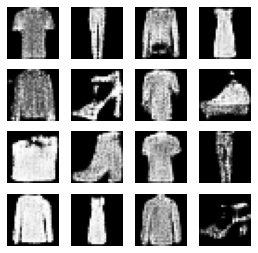

30800: [discriminator loss: 0.680838, acc: 0.554688] [adversarial loss: 0.686412, acc: 0.593750]
30801: [discriminator loss: 0.670338, acc: 0.570312] [adversarial loss: 0.693578, acc: 0.531250]
30802: [discriminator loss: 0.670345, acc: 0.562500] [adversarial loss: 0.708102, acc: 0.453125]
30803: [discriminator loss: 0.667080, acc: 0.562500] [adversarial loss: 0.833390, acc: 0.109375]
30804: [discriminator loss: 0.683264, acc: 0.593750] [adversarial loss: 0.655893, acc: 0.578125]
30805: [discriminator loss: 0.660336, acc: 0.546875] [adversarial loss: 0.880228, acc: 0.156250]
30806: [discriminator loss: 0.691712, acc: 0.546875] [adversarial loss: 0.710464, acc: 0.437500]
30807: [discriminator loss: 0.662993, acc: 0.640625] [adversarial loss: 0.739380, acc: 0.468750]
30808: [discriminator loss: 0.696279, acc: 0.507812] [adversarial loss: 0.729105, acc: 0.390625]
30809: [discriminator loss: 0.673766, acc: 0.625000] [adversarial loss: 0.709259, acc: 0.531250]
30810: [discriminator loss: 0.

30890: [discriminator loss: 0.654009, acc: 0.640625] [adversarial loss: 0.682974, acc: 0.484375]
30891: [discriminator loss: 0.666978, acc: 0.554688] [adversarial loss: 0.757462, acc: 0.359375]
30892: [discriminator loss: 0.682089, acc: 0.531250] [adversarial loss: 0.791181, acc: 0.296875]
30893: [discriminator loss: 0.700681, acc: 0.515625] [adversarial loss: 0.779799, acc: 0.187500]
30894: [discriminator loss: 0.677644, acc: 0.640625] [adversarial loss: 0.579172, acc: 0.828125]
30895: [discriminator loss: 0.683301, acc: 0.531250] [adversarial loss: 0.842606, acc: 0.296875]
30896: [discriminator loss: 0.705462, acc: 0.515625] [adversarial loss: 0.652257, acc: 0.625000]
30897: [discriminator loss: 0.692241, acc: 0.515625] [adversarial loss: 0.824139, acc: 0.078125]
30898: [discriminator loss: 0.685030, acc: 0.531250] [adversarial loss: 0.602433, acc: 0.796875]
30899: [discriminator loss: 0.682620, acc: 0.562500] [adversarial loss: 0.838721, acc: 0.078125]
30900: [discriminator loss: 0.

30979: [discriminator loss: 0.686539, acc: 0.484375] [adversarial loss: 0.831429, acc: 0.109375]
30980: [discriminator loss: 0.680256, acc: 0.546875] [adversarial loss: 0.669409, acc: 0.546875]
30981: [discriminator loss: 0.708499, acc: 0.468750] [adversarial loss: 0.833373, acc: 0.062500]
30982: [discriminator loss: 0.669719, acc: 0.593750] [adversarial loss: 0.660827, acc: 0.625000]
30983: [discriminator loss: 0.670668, acc: 0.585938] [adversarial loss: 0.763376, acc: 0.234375]
30984: [discriminator loss: 0.641128, acc: 0.632812] [adversarial loss: 0.761669, acc: 0.312500]
30985: [discriminator loss: 0.680828, acc: 0.585938] [adversarial loss: 0.608517, acc: 0.812500]
30986: [discriminator loss: 0.673321, acc: 0.578125] [adversarial loss: 0.765126, acc: 0.343750]
30987: [discriminator loss: 0.677404, acc: 0.585938] [adversarial loss: 0.784351, acc: 0.250000]
30988: [discriminator loss: 0.671263, acc: 0.562500] [adversarial loss: 0.745517, acc: 0.296875]
30989: [discriminator loss: 0.

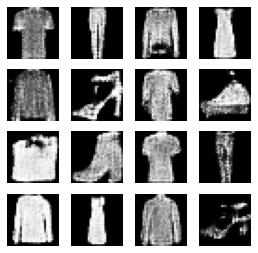

31000: [discriminator loss: 0.686016, acc: 0.585938] [adversarial loss: 0.587996, acc: 0.843750]
31001: [discriminator loss: 0.677874, acc: 0.500000] [adversarial loss: 0.858397, acc: 0.093750]
31002: [discriminator loss: 0.681508, acc: 0.515625] [adversarial loss: 0.631330, acc: 0.703125]
31003: [discriminator loss: 0.680612, acc: 0.546875] [adversarial loss: 0.702579, acc: 0.515625]
31004: [discriminator loss: 0.671416, acc: 0.585938] [adversarial loss: 0.683761, acc: 0.562500]
31005: [discriminator loss: 0.651797, acc: 0.617188] [adversarial loss: 0.743146, acc: 0.312500]
31006: [discriminator loss: 0.672099, acc: 0.593750] [adversarial loss: 0.671170, acc: 0.703125]
31007: [discriminator loss: 0.696126, acc: 0.500000] [adversarial loss: 0.744895, acc: 0.281250]
31008: [discriminator loss: 0.694167, acc: 0.515625] [adversarial loss: 0.760901, acc: 0.390625]
31009: [discriminator loss: 0.668155, acc: 0.617188] [adversarial loss: 0.706973, acc: 0.437500]
31010: [discriminator loss: 0.

31089: [discriminator loss: 0.676276, acc: 0.625000] [adversarial loss: 0.632002, acc: 0.687500]
31090: [discriminator loss: 0.688949, acc: 0.476562] [adversarial loss: 0.775071, acc: 0.281250]
31091: [discriminator loss: 0.689666, acc: 0.570312] [adversarial loss: 0.760630, acc: 0.281250]
31092: [discriminator loss: 0.665185, acc: 0.609375] [adversarial loss: 0.646127, acc: 0.687500]
31093: [discriminator loss: 0.680906, acc: 0.546875] [adversarial loss: 0.855733, acc: 0.078125]
31094: [discriminator loss: 0.674666, acc: 0.632812] [adversarial loss: 0.671750, acc: 0.578125]
31095: [discriminator loss: 0.707843, acc: 0.500000] [adversarial loss: 0.785481, acc: 0.218750]
31096: [discriminator loss: 0.671420, acc: 0.578125] [adversarial loss: 0.595836, acc: 0.843750]
31097: [discriminator loss: 0.683642, acc: 0.500000] [adversarial loss: 0.798006, acc: 0.234375]
31098: [discriminator loss: 0.666532, acc: 0.617188] [adversarial loss: 0.674919, acc: 0.578125]
31099: [discriminator loss: 0.

31179: [discriminator loss: 0.679766, acc: 0.554688] [adversarial loss: 0.732887, acc: 0.390625]
31180: [discriminator loss: 0.703586, acc: 0.484375] [adversarial loss: 0.815888, acc: 0.187500]
31181: [discriminator loss: 0.683898, acc: 0.539062] [adversarial loss: 0.614326, acc: 0.812500]
31182: [discriminator loss: 0.681319, acc: 0.515625] [adversarial loss: 0.736779, acc: 0.359375]
31183: [discriminator loss: 0.685582, acc: 0.609375] [adversarial loss: 0.666929, acc: 0.656250]
31184: [discriminator loss: 0.698814, acc: 0.468750] [adversarial loss: 0.726750, acc: 0.406250]
31185: [discriminator loss: 0.666979, acc: 0.609375] [adversarial loss: 0.720963, acc: 0.437500]
31186: [discriminator loss: 0.679308, acc: 0.554688] [adversarial loss: 0.716042, acc: 0.546875]
31187: [discriminator loss: 0.651880, acc: 0.585938] [adversarial loss: 0.749491, acc: 0.250000]
31188: [discriminator loss: 0.678082, acc: 0.601562] [adversarial loss: 0.641607, acc: 0.671875]
31189: [discriminator loss: 0.

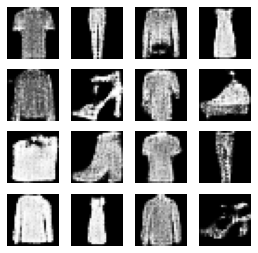

31200: [discriminator loss: 0.688412, acc: 0.476562] [adversarial loss: 0.803369, acc: 0.218750]
31201: [discriminator loss: 0.670624, acc: 0.609375] [adversarial loss: 0.678524, acc: 0.609375]
31202: [discriminator loss: 0.680539, acc: 0.593750] [adversarial loss: 0.744228, acc: 0.421875]
31203: [discriminator loss: 0.678569, acc: 0.554688] [adversarial loss: 0.692897, acc: 0.593750]
31204: [discriminator loss: 0.680071, acc: 0.500000] [adversarial loss: 0.848428, acc: 0.156250]
31205: [discriminator loss: 0.667639, acc: 0.554688] [adversarial loss: 0.572585, acc: 0.812500]
31206: [discriminator loss: 0.697127, acc: 0.492188] [adversarial loss: 0.892302, acc: 0.093750]
31207: [discriminator loss: 0.695080, acc: 0.484375] [adversarial loss: 0.715526, acc: 0.453125]
31208: [discriminator loss: 0.647032, acc: 0.640625] [adversarial loss: 0.698201, acc: 0.515625]
31209: [discriminator loss: 0.678206, acc: 0.539062] [adversarial loss: 0.702648, acc: 0.437500]
31210: [discriminator loss: 0.

31287: [discriminator loss: 0.667374, acc: 0.617188] [adversarial loss: 0.595751, acc: 0.937500]
31288: [discriminator loss: 0.707952, acc: 0.460938] [adversarial loss: 0.821726, acc: 0.140625]
31289: [discriminator loss: 0.684910, acc: 0.546875] [adversarial loss: 0.643376, acc: 0.640625]
31290: [discriminator loss: 0.679636, acc: 0.554688] [adversarial loss: 0.887607, acc: 0.250000]
31291: [discriminator loss: 0.680761, acc: 0.523438] [adversarial loss: 0.687576, acc: 0.515625]
31292: [discriminator loss: 0.683682, acc: 0.539062] [adversarial loss: 0.678747, acc: 0.593750]
31293: [discriminator loss: 0.675679, acc: 0.601562] [adversarial loss: 0.734431, acc: 0.343750]
31294: [discriminator loss: 0.674010, acc: 0.546875] [adversarial loss: 0.829793, acc: 0.109375]
31295: [discriminator loss: 0.684786, acc: 0.531250] [adversarial loss: 0.631846, acc: 0.718750]
31296: [discriminator loss: 0.655327, acc: 0.546875] [adversarial loss: 0.735209, acc: 0.390625]
31297: [discriminator loss: 0.

31376: [discriminator loss: 0.685901, acc: 0.531250] [adversarial loss: 0.766439, acc: 0.265625]
31377: [discriminator loss: 0.676473, acc: 0.570312] [adversarial loss: 0.705344, acc: 0.500000]
31378: [discriminator loss: 0.690746, acc: 0.531250] [adversarial loss: 0.687692, acc: 0.531250]
31379: [discriminator loss: 0.697632, acc: 0.562500] [adversarial loss: 0.724849, acc: 0.484375]
31380: [discriminator loss: 0.670796, acc: 0.617188] [adversarial loss: 0.688014, acc: 0.562500]
31381: [discriminator loss: 0.684700, acc: 0.562500] [adversarial loss: 0.758934, acc: 0.390625]
31382: [discriminator loss: 0.682929, acc: 0.570312] [adversarial loss: 0.721182, acc: 0.421875]
31383: [discriminator loss: 0.673656, acc: 0.601562] [adversarial loss: 0.637098, acc: 0.656250]
31384: [discriminator loss: 0.704822, acc: 0.484375] [adversarial loss: 0.885636, acc: 0.078125]
31385: [discriminator loss: 0.671121, acc: 0.585938] [adversarial loss: 0.655793, acc: 0.578125]
31386: [discriminator loss: 0.

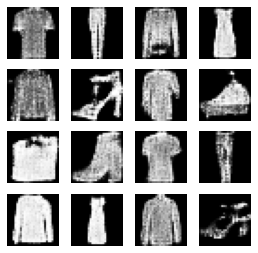

31400: [discriminator loss: 0.657876, acc: 0.632812] [adversarial loss: 0.824970, acc: 0.171875]
31401: [discriminator loss: 0.690505, acc: 0.546875] [adversarial loss: 0.649840, acc: 0.656250]
31402: [discriminator loss: 0.677418, acc: 0.570312] [adversarial loss: 0.798375, acc: 0.171875]
31403: [discriminator loss: 0.659017, acc: 0.632812] [adversarial loss: 0.643622, acc: 0.718750]
31404: [discriminator loss: 0.674742, acc: 0.554688] [adversarial loss: 0.835334, acc: 0.140625]
31405: [discriminator loss: 0.659104, acc: 0.625000] [adversarial loss: 0.706612, acc: 0.453125]
31406: [discriminator loss: 0.696285, acc: 0.523438] [adversarial loss: 0.771314, acc: 0.203125]
31407: [discriminator loss: 0.670660, acc: 0.539062] [adversarial loss: 0.734937, acc: 0.390625]
31408: [discriminator loss: 0.657306, acc: 0.554688] [adversarial loss: 0.688142, acc: 0.562500]
31409: [discriminator loss: 0.683852, acc: 0.570312] [adversarial loss: 0.747856, acc: 0.375000]
31410: [discriminator loss: 0.

31487: [discriminator loss: 0.676712, acc: 0.562500] [adversarial loss: 0.733318, acc: 0.437500]
31488: [discriminator loss: 0.689293, acc: 0.500000] [adversarial loss: 0.709835, acc: 0.453125]
31489: [discriminator loss: 0.684448, acc: 0.601562] [adversarial loss: 0.747535, acc: 0.359375]
31490: [discriminator loss: 0.657115, acc: 0.617188] [adversarial loss: 0.718254, acc: 0.437500]
31491: [discriminator loss: 0.657674, acc: 0.601562] [adversarial loss: 0.745013, acc: 0.343750]
31492: [discriminator loss: 0.679309, acc: 0.578125] [adversarial loss: 0.752408, acc: 0.343750]
31493: [discriminator loss: 0.657723, acc: 0.648438] [adversarial loss: 0.731282, acc: 0.437500]
31494: [discriminator loss: 0.665254, acc: 0.617188] [adversarial loss: 0.793656, acc: 0.218750]
31495: [discriminator loss: 0.695850, acc: 0.507812] [adversarial loss: 0.673436, acc: 0.609375]
31496: [discriminator loss: 0.675334, acc: 0.562500] [adversarial loss: 0.841949, acc: 0.218750]
31497: [discriminator loss: 0.

31573: [discriminator loss: 0.656750, acc: 0.687500] [adversarial loss: 0.697918, acc: 0.453125]
31574: [discriminator loss: 0.682518, acc: 0.523438] [adversarial loss: 0.825011, acc: 0.171875]
31575: [discriminator loss: 0.644232, acc: 0.632812] [adversarial loss: 0.640780, acc: 0.593750]
31576: [discriminator loss: 0.655465, acc: 0.625000] [adversarial loss: 0.807827, acc: 0.312500]
31577: [discriminator loss: 0.682114, acc: 0.562500] [adversarial loss: 0.697353, acc: 0.500000]
31578: [discriminator loss: 0.658400, acc: 0.632812] [adversarial loss: 0.644732, acc: 0.609375]
31579: [discriminator loss: 0.678470, acc: 0.531250] [adversarial loss: 0.742855, acc: 0.375000]
31580: [discriminator loss: 0.639523, acc: 0.664062] [adversarial loss: 0.741041, acc: 0.421875]
31581: [discriminator loss: 0.687064, acc: 0.546875] [adversarial loss: 0.745007, acc: 0.406250]
31582: [discriminator loss: 0.667066, acc: 0.617188] [adversarial loss: 0.779748, acc: 0.250000]
31583: [discriminator loss: 0.

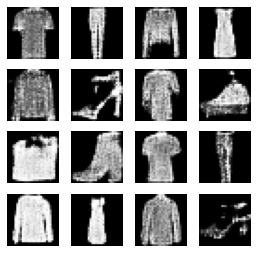

31600: [discriminator loss: 0.667877, acc: 0.570312] [adversarial loss: 0.771129, acc: 0.312500]
31601: [discriminator loss: 0.670037, acc: 0.593750] [adversarial loss: 0.786006, acc: 0.250000]
31602: [discriminator loss: 0.688463, acc: 0.585938] [adversarial loss: 0.702764, acc: 0.421875]
31603: [discriminator loss: 0.681588, acc: 0.546875] [adversarial loss: 0.759212, acc: 0.281250]
31604: [discriminator loss: 0.683430, acc: 0.562500] [adversarial loss: 0.677955, acc: 0.593750]
31605: [discriminator loss: 0.651136, acc: 0.578125] [adversarial loss: 0.701285, acc: 0.453125]
31606: [discriminator loss: 0.656832, acc: 0.601562] [adversarial loss: 0.815634, acc: 0.203125]
31607: [discriminator loss: 0.665062, acc: 0.578125] [adversarial loss: 0.642245, acc: 0.671875]
31608: [discriminator loss: 0.674406, acc: 0.546875] [adversarial loss: 0.805461, acc: 0.234375]
31609: [discriminator loss: 0.666900, acc: 0.601562] [adversarial loss: 0.720300, acc: 0.421875]
31610: [discriminator loss: 0.

31687: [discriminator loss: 0.665748, acc: 0.625000] [adversarial loss: 0.660445, acc: 0.625000]
31688: [discriminator loss: 0.657212, acc: 0.656250] [adversarial loss: 0.789142, acc: 0.187500]
31689: [discriminator loss: 0.668112, acc: 0.648438] [adversarial loss: 0.682703, acc: 0.515625]
31690: [discriminator loss: 0.674162, acc: 0.578125] [adversarial loss: 0.716061, acc: 0.421875]
31691: [discriminator loss: 0.657742, acc: 0.578125] [adversarial loss: 0.666185, acc: 0.640625]
31692: [discriminator loss: 0.691232, acc: 0.539062] [adversarial loss: 0.786501, acc: 0.218750]
31693: [discriminator loss: 0.681557, acc: 0.554688] [adversarial loss: 0.693981, acc: 0.531250]
31694: [discriminator loss: 0.686626, acc: 0.523438] [adversarial loss: 0.831735, acc: 0.171875]
31695: [discriminator loss: 0.663532, acc: 0.578125] [adversarial loss: 0.656716, acc: 0.687500]
31696: [discriminator loss: 0.689630, acc: 0.515625] [adversarial loss: 0.749363, acc: 0.390625]
31697: [discriminator loss: 0.

31772: [discriminator loss: 0.685966, acc: 0.578125] [adversarial loss: 0.744463, acc: 0.390625]
31773: [discriminator loss: 0.691755, acc: 0.625000] [adversarial loss: 0.628710, acc: 0.687500]
31774: [discriminator loss: 0.685336, acc: 0.554688] [adversarial loss: 0.783614, acc: 0.312500]
31775: [discriminator loss: 0.681671, acc: 0.546875] [adversarial loss: 0.685071, acc: 0.562500]
31776: [discriminator loss: 0.661393, acc: 0.601562] [adversarial loss: 0.714284, acc: 0.484375]
31777: [discriminator loss: 0.680911, acc: 0.562500] [adversarial loss: 0.782977, acc: 0.203125]
31778: [discriminator loss: 0.691540, acc: 0.523438] [adversarial loss: 0.696395, acc: 0.578125]
31779: [discriminator loss: 0.666640, acc: 0.695312] [adversarial loss: 0.695801, acc: 0.531250]
31780: [discriminator loss: 0.680891, acc: 0.585938] [adversarial loss: 0.670763, acc: 0.562500]
31781: [discriminator loss: 0.681302, acc: 0.515625] [adversarial loss: 0.759738, acc: 0.343750]
31782: [discriminator loss: 0.

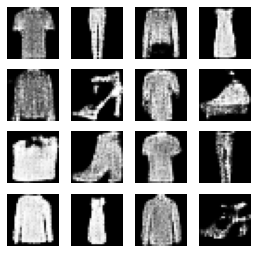

31800: [discriminator loss: 0.672065, acc: 0.640625] [adversarial loss: 0.677387, acc: 0.593750]
31801: [discriminator loss: 0.666076, acc: 0.531250] [adversarial loss: 0.759125, acc: 0.296875]
31802: [discriminator loss: 0.675451, acc: 0.554688] [adversarial loss: 0.726382, acc: 0.421875]
31803: [discriminator loss: 0.672071, acc: 0.585938] [adversarial loss: 0.694637, acc: 0.562500]
31804: [discriminator loss: 0.679721, acc: 0.554688] [adversarial loss: 0.792793, acc: 0.265625]
31805: [discriminator loss: 0.667081, acc: 0.523438] [adversarial loss: 0.685009, acc: 0.593750]
31806: [discriminator loss: 0.683749, acc: 0.507812] [adversarial loss: 0.888949, acc: 0.187500]
31807: [discriminator loss: 0.674665, acc: 0.554688] [adversarial loss: 0.720216, acc: 0.437500]
31808: [discriminator loss: 0.683760, acc: 0.570312] [adversarial loss: 0.699853, acc: 0.484375]
31809: [discriminator loss: 0.667401, acc: 0.562500] [adversarial loss: 0.801239, acc: 0.250000]
31810: [discriminator loss: 0.

31887: [discriminator loss: 0.662781, acc: 0.578125] [adversarial loss: 0.759615, acc: 0.296875]
31888: [discriminator loss: 0.682912, acc: 0.570312] [adversarial loss: 0.678777, acc: 0.593750]
31889: [discriminator loss: 0.685520, acc: 0.562500] [adversarial loss: 0.742448, acc: 0.515625]
31890: [discriminator loss: 0.663390, acc: 0.640625] [adversarial loss: 0.814809, acc: 0.203125]
31891: [discriminator loss: 0.670253, acc: 0.601562] [adversarial loss: 0.739717, acc: 0.468750]
31892: [discriminator loss: 0.679409, acc: 0.531250] [adversarial loss: 0.776610, acc: 0.250000]
31893: [discriminator loss: 0.678845, acc: 0.609375] [adversarial loss: 0.698144, acc: 0.546875]
31894: [discriminator loss: 0.681369, acc: 0.546875] [adversarial loss: 0.843563, acc: 0.156250]
31895: [discriminator loss: 0.682090, acc: 0.617188] [adversarial loss: 0.697391, acc: 0.546875]
31896: [discriminator loss: 0.682208, acc: 0.507812] [adversarial loss: 0.759899, acc: 0.296875]
31897: [discriminator loss: 0.

31976: [discriminator loss: 0.680762, acc: 0.539062] [adversarial loss: 0.701729, acc: 0.484375]
31977: [discriminator loss: 0.686239, acc: 0.500000] [adversarial loss: 0.721996, acc: 0.375000]
31978: [discriminator loss: 0.668706, acc: 0.546875] [adversarial loss: 0.815331, acc: 0.281250]
31979: [discriminator loss: 0.706404, acc: 0.515625] [adversarial loss: 0.573494, acc: 0.843750]
31980: [discriminator loss: 0.689096, acc: 0.523438] [adversarial loss: 0.841252, acc: 0.140625]
31981: [discriminator loss: 0.678793, acc: 0.562500] [adversarial loss: 0.621588, acc: 0.671875]
31982: [discriminator loss: 0.672982, acc: 0.554688] [adversarial loss: 0.732678, acc: 0.328125]
31983: [discriminator loss: 0.685974, acc: 0.492188] [adversarial loss: 0.600763, acc: 0.859375]
31984: [discriminator loss: 0.677783, acc: 0.578125] [adversarial loss: 0.763752, acc: 0.296875]
31985: [discriminator loss: 0.698422, acc: 0.523438] [adversarial loss: 0.712052, acc: 0.468750]
31986: [discriminator loss: 0.

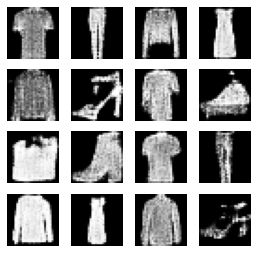

32000: [discriminator loss: 0.698581, acc: 0.515625] [adversarial loss: 0.756275, acc: 0.328125]
32001: [discriminator loss: 0.676949, acc: 0.562500] [adversarial loss: 0.760613, acc: 0.375000]
32002: [discriminator loss: 0.669609, acc: 0.539062] [adversarial loss: 0.702267, acc: 0.484375]
32003: [discriminator loss: 0.669217, acc: 0.585938] [adversarial loss: 0.757865, acc: 0.406250]
32004: [discriminator loss: 0.663454, acc: 0.585938] [adversarial loss: 0.759932, acc: 0.406250]
32005: [discriminator loss: 0.684570, acc: 0.539062] [adversarial loss: 0.674208, acc: 0.546875]
32006: [discriminator loss: 0.679780, acc: 0.515625] [adversarial loss: 0.811027, acc: 0.156250]
32007: [discriminator loss: 0.657476, acc: 0.664062] [adversarial loss: 0.610609, acc: 0.734375]
32008: [discriminator loss: 0.707510, acc: 0.507812] [adversarial loss: 0.911783, acc: 0.031250]
32009: [discriminator loss: 0.697924, acc: 0.578125] [adversarial loss: 0.648718, acc: 0.593750]
32010: [discriminator loss: 0.

32089: [discriminator loss: 0.645573, acc: 0.617188] [adversarial loss: 0.823064, acc: 0.328125]
32090: [discriminator loss: 0.668456, acc: 0.585938] [adversarial loss: 0.654792, acc: 0.625000]
32091: [discriminator loss: 0.710405, acc: 0.429688] [adversarial loss: 0.841546, acc: 0.234375]
32092: [discriminator loss: 0.681797, acc: 0.570312] [adversarial loss: 0.685023, acc: 0.578125]
32093: [discriminator loss: 0.691044, acc: 0.500000] [adversarial loss: 0.794554, acc: 0.171875]
32094: [discriminator loss: 0.663537, acc: 0.632812] [adversarial loss: 0.726357, acc: 0.453125]
32095: [discriminator loss: 0.688898, acc: 0.523438] [adversarial loss: 0.835214, acc: 0.156250]
32096: [discriminator loss: 0.687883, acc: 0.570312] [adversarial loss: 0.691910, acc: 0.484375]
32097: [discriminator loss: 0.675147, acc: 0.593750] [adversarial loss: 0.905567, acc: 0.093750]
32098: [discriminator loss: 0.678143, acc: 0.609375] [adversarial loss: 0.644234, acc: 0.656250]
32099: [discriminator loss: 0.

32174: [discriminator loss: 0.686613, acc: 0.539062] [adversarial loss: 0.879689, acc: 0.062500]
32175: [discriminator loss: 0.680834, acc: 0.546875] [adversarial loss: 0.687467, acc: 0.640625]
32176: [discriminator loss: 0.671325, acc: 0.593750] [adversarial loss: 0.805337, acc: 0.234375]
32177: [discriminator loss: 0.679808, acc: 0.585938] [adversarial loss: 0.731593, acc: 0.312500]
32178: [discriminator loss: 0.687678, acc: 0.546875] [adversarial loss: 0.770575, acc: 0.171875]
32179: [discriminator loss: 0.694131, acc: 0.492188] [adversarial loss: 0.727207, acc: 0.390625]
32180: [discriminator loss: 0.684728, acc: 0.546875] [adversarial loss: 0.760526, acc: 0.406250]
32181: [discriminator loss: 0.672966, acc: 0.546875] [adversarial loss: 0.721506, acc: 0.515625]
32182: [discriminator loss: 0.693693, acc: 0.554688] [adversarial loss: 0.749435, acc: 0.281250]
32183: [discriminator loss: 0.679308, acc: 0.593750] [adversarial loss: 0.664716, acc: 0.562500]
32184: [discriminator loss: 0.

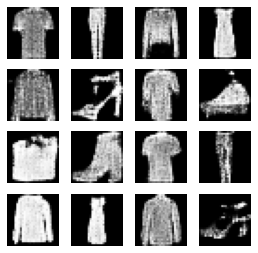

32200: [discriminator loss: 0.668164, acc: 0.578125] [adversarial loss: 0.885445, acc: 0.093750]
32201: [discriminator loss: 0.690162, acc: 0.562500] [adversarial loss: 0.669622, acc: 0.515625]
32202: [discriminator loss: 0.671428, acc: 0.562500] [adversarial loss: 0.804352, acc: 0.234375]
32203: [discriminator loss: 0.671308, acc: 0.507812] [adversarial loss: 0.694997, acc: 0.578125]
32204: [discriminator loss: 0.673725, acc: 0.585938] [adversarial loss: 0.738685, acc: 0.390625]
32205: [discriminator loss: 0.672848, acc: 0.593750] [adversarial loss: 0.801172, acc: 0.250000]
32206: [discriminator loss: 0.685438, acc: 0.562500] [adversarial loss: 0.713409, acc: 0.500000]
32207: [discriminator loss: 0.675171, acc: 0.578125] [adversarial loss: 0.770466, acc: 0.296875]
32208: [discriminator loss: 0.650752, acc: 0.632812] [adversarial loss: 0.723793, acc: 0.500000]
32209: [discriminator loss: 0.671255, acc: 0.593750] [adversarial loss: 0.703142, acc: 0.500000]
32210: [discriminator loss: 0.

32287: [discriminator loss: 0.675412, acc: 0.562500] [adversarial loss: 0.672412, acc: 0.593750]
32288: [discriminator loss: 0.696223, acc: 0.515625] [adversarial loss: 0.796704, acc: 0.156250]
32289: [discriminator loss: 0.667243, acc: 0.617188] [adversarial loss: 0.649788, acc: 0.625000]
32290: [discriminator loss: 0.668283, acc: 0.609375] [adversarial loss: 0.798369, acc: 0.203125]
32291: [discriminator loss: 0.664126, acc: 0.601562] [adversarial loss: 0.664055, acc: 0.593750]
32292: [discriminator loss: 0.688817, acc: 0.539062] [adversarial loss: 0.808620, acc: 0.203125]
32293: [discriminator loss: 0.680684, acc: 0.539062] [adversarial loss: 0.680563, acc: 0.500000]
32294: [discriminator loss: 0.682199, acc: 0.562500] [adversarial loss: 0.812186, acc: 0.187500]
32295: [discriminator loss: 0.680550, acc: 0.585938] [adversarial loss: 0.629057, acc: 0.734375]
32296: [discriminator loss: 0.667071, acc: 0.539062] [adversarial loss: 0.753526, acc: 0.234375]
32297: [discriminator loss: 0.

32374: [discriminator loss: 0.680339, acc: 0.570312] [adversarial loss: 0.863292, acc: 0.109375]
32375: [discriminator loss: 0.693428, acc: 0.523438] [adversarial loss: 0.723003, acc: 0.375000]
32376: [discriminator loss: 0.665819, acc: 0.578125] [adversarial loss: 0.735373, acc: 0.281250]
32377: [discriminator loss: 0.665131, acc: 0.656250] [adversarial loss: 0.685051, acc: 0.578125]
32378: [discriminator loss: 0.649360, acc: 0.632812] [adversarial loss: 0.710916, acc: 0.390625]
32379: [discriminator loss: 0.672823, acc: 0.593750] [adversarial loss: 0.802161, acc: 0.156250]
32380: [discriminator loss: 0.686171, acc: 0.593750] [adversarial loss: 0.687844, acc: 0.578125]
32381: [discriminator loss: 0.685137, acc: 0.570312] [adversarial loss: 0.680301, acc: 0.546875]
32382: [discriminator loss: 0.685924, acc: 0.515625] [adversarial loss: 0.801905, acc: 0.171875]
32383: [discriminator loss: 0.682337, acc: 0.578125] [adversarial loss: 0.631238, acc: 0.765625]
32384: [discriminator loss: 0.

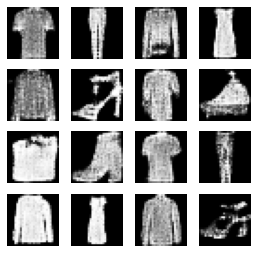

32400: [discriminator loss: 0.689514, acc: 0.507812] [adversarial loss: 0.638066, acc: 0.687500]
32401: [discriminator loss: 0.659703, acc: 0.593750] [adversarial loss: 0.804937, acc: 0.234375]
32402: [discriminator loss: 0.699179, acc: 0.531250] [adversarial loss: 0.707945, acc: 0.453125]
32403: [discriminator loss: 0.678484, acc: 0.617188] [adversarial loss: 0.779751, acc: 0.296875]
32404: [discriminator loss: 0.687486, acc: 0.593750] [adversarial loss: 0.732399, acc: 0.453125]
32405: [discriminator loss: 0.662112, acc: 0.593750] [adversarial loss: 0.684661, acc: 0.546875]
32406: [discriminator loss: 0.664553, acc: 0.578125] [adversarial loss: 0.837592, acc: 0.203125]
32407: [discriminator loss: 0.689543, acc: 0.539062] [adversarial loss: 0.707547, acc: 0.453125]
32408: [discriminator loss: 0.673183, acc: 0.593750] [adversarial loss: 0.671558, acc: 0.656250]
32409: [discriminator loss: 0.673240, acc: 0.570312] [adversarial loss: 0.777946, acc: 0.250000]
32410: [discriminator loss: 0.

32486: [discriminator loss: 0.670424, acc: 0.578125] [adversarial loss: 0.826301, acc: 0.171875]
32487: [discriminator loss: 0.704593, acc: 0.578125] [adversarial loss: 0.674935, acc: 0.500000]
32488: [discriminator loss: 0.683766, acc: 0.562500] [adversarial loss: 0.779050, acc: 0.328125]
32489: [discriminator loss: 0.675791, acc: 0.570312] [adversarial loss: 0.650552, acc: 0.640625]
32490: [discriminator loss: 0.669123, acc: 0.531250] [adversarial loss: 0.871015, acc: 0.078125]
32491: [discriminator loss: 0.671019, acc: 0.578125] [adversarial loss: 0.682253, acc: 0.531250]
32492: [discriminator loss: 0.677767, acc: 0.562500] [adversarial loss: 0.760393, acc: 0.312500]
32493: [discriminator loss: 0.683134, acc: 0.523438] [adversarial loss: 0.708230, acc: 0.437500]
32494: [discriminator loss: 0.662427, acc: 0.640625] [adversarial loss: 0.835998, acc: 0.156250]
32495: [discriminator loss: 0.688470, acc: 0.515625] [adversarial loss: 0.736591, acc: 0.375000]
32496: [discriminator loss: 0.

32572: [discriminator loss: 0.677294, acc: 0.515625] [adversarial loss: 0.781828, acc: 0.281250]
32573: [discriminator loss: 0.679271, acc: 0.585938] [adversarial loss: 0.704687, acc: 0.515625]
32574: [discriminator loss: 0.707678, acc: 0.476562] [adversarial loss: 0.783801, acc: 0.203125]
32575: [discriminator loss: 0.695420, acc: 0.554688] [adversarial loss: 0.657645, acc: 0.609375]
32576: [discriminator loss: 0.694021, acc: 0.515625] [adversarial loss: 0.866799, acc: 0.250000]
32577: [discriminator loss: 0.691295, acc: 0.578125] [adversarial loss: 0.684224, acc: 0.484375]
32578: [discriminator loss: 0.680220, acc: 0.546875] [adversarial loss: 0.756914, acc: 0.296875]
32579: [discriminator loss: 0.660021, acc: 0.625000] [adversarial loss: 0.681946, acc: 0.593750]
32580: [discriminator loss: 0.675754, acc: 0.570312] [adversarial loss: 0.732599, acc: 0.421875]
32581: [discriminator loss: 0.693304, acc: 0.554688] [adversarial loss: 0.738151, acc: 0.390625]
32582: [discriminator loss: 0.

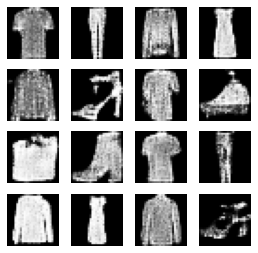

32600: [discriminator loss: 0.684437, acc: 0.570312] [adversarial loss: 0.698007, acc: 0.484375]
32601: [discriminator loss: 0.679547, acc: 0.601562] [adversarial loss: 0.766897, acc: 0.281250]
32602: [discriminator loss: 0.701109, acc: 0.531250] [adversarial loss: 0.754122, acc: 0.328125]
32603: [discriminator loss: 0.669419, acc: 0.601562] [adversarial loss: 0.671087, acc: 0.656250]
32604: [discriminator loss: 0.672821, acc: 0.539062] [adversarial loss: 0.814353, acc: 0.203125]
32605: [discriminator loss: 0.664370, acc: 0.601562] [adversarial loss: 0.795263, acc: 0.187500]
32606: [discriminator loss: 0.686081, acc: 0.562500] [adversarial loss: 0.705274, acc: 0.468750]
32607: [discriminator loss: 0.668804, acc: 0.570312] [adversarial loss: 0.817528, acc: 0.218750]
32608: [discriminator loss: 0.674630, acc: 0.593750] [adversarial loss: 0.672979, acc: 0.656250]
32609: [discriminator loss: 0.669698, acc: 0.570312] [adversarial loss: 0.748840, acc: 0.406250]
32610: [discriminator loss: 0.

32689: [discriminator loss: 0.677539, acc: 0.546875] [adversarial loss: 0.878108, acc: 0.140625]
32690: [discriminator loss: 0.690565, acc: 0.562500] [adversarial loss: 0.629496, acc: 0.687500]
32691: [discriminator loss: 0.691496, acc: 0.539062] [adversarial loss: 0.763251, acc: 0.328125]
32692: [discriminator loss: 0.671955, acc: 0.570312] [adversarial loss: 0.782782, acc: 0.281250]
32693: [discriminator loss: 0.668874, acc: 0.601562] [adversarial loss: 0.722762, acc: 0.375000]
32694: [discriminator loss: 0.691578, acc: 0.539062] [adversarial loss: 0.706735, acc: 0.421875]
32695: [discriminator loss: 0.698755, acc: 0.531250] [adversarial loss: 0.701725, acc: 0.468750]
32696: [discriminator loss: 0.670203, acc: 0.578125] [adversarial loss: 0.763055, acc: 0.265625]
32697: [discriminator loss: 0.682911, acc: 0.546875] [adversarial loss: 0.756522, acc: 0.250000]
32698: [discriminator loss: 0.673942, acc: 0.578125] [adversarial loss: 0.776832, acc: 0.203125]
32699: [discriminator loss: 0.

32774: [discriminator loss: 0.675249, acc: 0.601562] [adversarial loss: 0.802628, acc: 0.218750]
32775: [discriminator loss: 0.678436, acc: 0.546875] [adversarial loss: 0.657826, acc: 0.625000]
32776: [discriminator loss: 0.671346, acc: 0.554688] [adversarial loss: 0.828962, acc: 0.140625]
32777: [discriminator loss: 0.677841, acc: 0.554688] [adversarial loss: 0.623215, acc: 0.750000]
32778: [discriminator loss: 0.683986, acc: 0.500000] [adversarial loss: 0.857389, acc: 0.218750]
32779: [discriminator loss: 0.677362, acc: 0.570312] [adversarial loss: 0.680315, acc: 0.562500]
32780: [discriminator loss: 0.675155, acc: 0.562500] [adversarial loss: 0.767617, acc: 0.281250]
32781: [discriminator loss: 0.671158, acc: 0.539062] [adversarial loss: 0.750656, acc: 0.328125]
32782: [discriminator loss: 0.670169, acc: 0.570312] [adversarial loss: 0.681167, acc: 0.531250]
32783: [discriminator loss: 0.676503, acc: 0.570312] [adversarial loss: 0.823243, acc: 0.156250]
32784: [discriminator loss: 0.

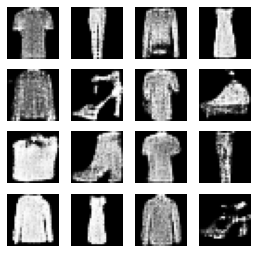

32800: [discriminator loss: 0.665851, acc: 0.593750] [adversarial loss: 0.626774, acc: 0.734375]
32801: [discriminator loss: 0.698331, acc: 0.500000] [adversarial loss: 0.781755, acc: 0.234375]
32802: [discriminator loss: 0.669464, acc: 0.640625] [adversarial loss: 0.712207, acc: 0.468750]
32803: [discriminator loss: 0.701191, acc: 0.492188] [adversarial loss: 0.903224, acc: 0.109375]
32804: [discriminator loss: 0.681085, acc: 0.562500] [adversarial loss: 0.676174, acc: 0.593750]
32805: [discriminator loss: 0.677657, acc: 0.617188] [adversarial loss: 0.724361, acc: 0.468750]
32806: [discriminator loss: 0.697433, acc: 0.460938] [adversarial loss: 0.629007, acc: 0.718750]
32807: [discriminator loss: 0.671326, acc: 0.601562] [adversarial loss: 0.753938, acc: 0.312500]
32808: [discriminator loss: 0.671267, acc: 0.554688] [adversarial loss: 0.708102, acc: 0.437500]
32809: [discriminator loss: 0.650231, acc: 0.648438] [adversarial loss: 0.725851, acc: 0.437500]
32810: [discriminator loss: 0.

32888: [discriminator loss: 0.683040, acc: 0.562500] [adversarial loss: 0.762807, acc: 0.281250]
32889: [discriminator loss: 0.657277, acc: 0.625000] [adversarial loss: 0.735596, acc: 0.421875]
32890: [discriminator loss: 0.664089, acc: 0.570312] [adversarial loss: 0.702319, acc: 0.468750]
32891: [discriminator loss: 0.698723, acc: 0.507812] [adversarial loss: 0.666723, acc: 0.625000]
32892: [discriminator loss: 0.684271, acc: 0.507812] [adversarial loss: 0.840285, acc: 0.125000]
32893: [discriminator loss: 0.678997, acc: 0.570312] [adversarial loss: 0.583494, acc: 0.890625]
32894: [discriminator loss: 0.691240, acc: 0.523438] [adversarial loss: 0.750736, acc: 0.359375]
32895: [discriminator loss: 0.672817, acc: 0.562500] [adversarial loss: 0.704369, acc: 0.421875]
32896: [discriminator loss: 0.666132, acc: 0.601562] [adversarial loss: 0.714131, acc: 0.484375]
32897: [discriminator loss: 0.674663, acc: 0.531250] [adversarial loss: 0.722656, acc: 0.406250]
32898: [discriminator loss: 0.

32976: [discriminator loss: 0.684654, acc: 0.554688] [adversarial loss: 0.628501, acc: 0.765625]
32977: [discriminator loss: 0.655842, acc: 0.570312] [adversarial loss: 0.750918, acc: 0.328125]
32978: [discriminator loss: 0.693161, acc: 0.492188] [adversarial loss: 0.742400, acc: 0.296875]
32979: [discriminator loss: 0.680066, acc: 0.585938] [adversarial loss: 0.835578, acc: 0.109375]
32980: [discriminator loss: 0.652808, acc: 0.632812] [adversarial loss: 0.672597, acc: 0.609375]
32981: [discriminator loss: 0.670616, acc: 0.539062] [adversarial loss: 0.744271, acc: 0.390625]
32982: [discriminator loss: 0.704511, acc: 0.484375] [adversarial loss: 0.711929, acc: 0.421875]
32983: [discriminator loss: 0.666129, acc: 0.585938] [adversarial loss: 0.745470, acc: 0.343750]
32984: [discriminator loss: 0.701490, acc: 0.445312] [adversarial loss: 0.762529, acc: 0.218750]
32985: [discriminator loss: 0.682780, acc: 0.593750] [adversarial loss: 0.712801, acc: 0.421875]
32986: [discriminator loss: 0.

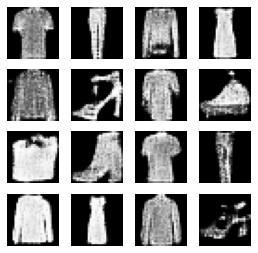

33000: [discriminator loss: 0.682980, acc: 0.578125] [adversarial loss: 0.733924, acc: 0.421875]
33001: [discriminator loss: 0.680002, acc: 0.546875] [adversarial loss: 0.627361, acc: 0.765625]
33002: [discriminator loss: 0.692789, acc: 0.523438] [adversarial loss: 0.792348, acc: 0.218750]
33003: [discriminator loss: 0.684879, acc: 0.539062] [adversarial loss: 0.697140, acc: 0.500000]
33004: [discriminator loss: 0.676736, acc: 0.593750] [adversarial loss: 0.742944, acc: 0.421875]
33005: [discriminator loss: 0.677899, acc: 0.492188] [adversarial loss: 0.776555, acc: 0.281250]
33006: [discriminator loss: 0.690527, acc: 0.507812] [adversarial loss: 0.739115, acc: 0.390625]
33007: [discriminator loss: 0.657085, acc: 0.648438] [adversarial loss: 0.712829, acc: 0.500000]
33008: [discriminator loss: 0.673939, acc: 0.570312] [adversarial loss: 0.754205, acc: 0.359375]
33009: [discriminator loss: 0.660022, acc: 0.640625] [adversarial loss: 0.763942, acc: 0.421875]
33010: [discriminator loss: 0.

33089: [discriminator loss: 0.669320, acc: 0.593750] [adversarial loss: 0.654401, acc: 0.625000]
33090: [discriminator loss: 0.699951, acc: 0.531250] [adversarial loss: 0.782496, acc: 0.203125]
33091: [discriminator loss: 0.685845, acc: 0.546875] [adversarial loss: 0.682715, acc: 0.500000]
33092: [discriminator loss: 0.671800, acc: 0.640625] [adversarial loss: 0.708092, acc: 0.515625]
33093: [discriminator loss: 0.683307, acc: 0.570312] [adversarial loss: 0.684943, acc: 0.500000]
33094: [discriminator loss: 0.704035, acc: 0.460938] [adversarial loss: 0.810932, acc: 0.156250]
33095: [discriminator loss: 0.664218, acc: 0.562500] [adversarial loss: 0.710055, acc: 0.390625]
33096: [discriminator loss: 0.679015, acc: 0.554688] [adversarial loss: 0.755839, acc: 0.312500]
33097: [discriminator loss: 0.656275, acc: 0.601562] [adversarial loss: 0.700866, acc: 0.546875]
33098: [discriminator loss: 0.639075, acc: 0.726562] [adversarial loss: 0.721286, acc: 0.500000]
33099: [discriminator loss: 0.

33175: [discriminator loss: 0.684744, acc: 0.601562] [adversarial loss: 0.716294, acc: 0.375000]
33176: [discriminator loss: 0.674510, acc: 0.617188] [adversarial loss: 0.757753, acc: 0.203125]
33177: [discriminator loss: 0.682138, acc: 0.539062] [adversarial loss: 0.700560, acc: 0.484375]
33178: [discriminator loss: 0.677097, acc: 0.546875] [adversarial loss: 0.696954, acc: 0.500000]
33179: [discriminator loss: 0.683356, acc: 0.562500] [adversarial loss: 0.781597, acc: 0.328125]
33180: [discriminator loss: 0.675881, acc: 0.562500] [adversarial loss: 0.679507, acc: 0.484375]
33181: [discriminator loss: 0.675914, acc: 0.562500] [adversarial loss: 0.727391, acc: 0.328125]
33182: [discriminator loss: 0.669137, acc: 0.632812] [adversarial loss: 0.688112, acc: 0.500000]
33183: [discriminator loss: 0.654886, acc: 0.609375] [adversarial loss: 0.754557, acc: 0.328125]
33184: [discriminator loss: 0.664208, acc: 0.609375] [adversarial loss: 0.699979, acc: 0.500000]
33185: [discriminator loss: 0.

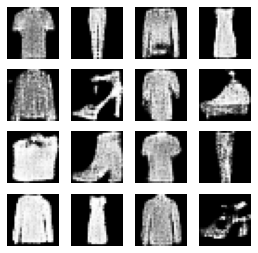

33200: [discriminator loss: 0.676110, acc: 0.617188] [adversarial loss: 0.682123, acc: 0.484375]
33201: [discriminator loss: 0.679477, acc: 0.546875] [adversarial loss: 0.802383, acc: 0.265625]
33202: [discriminator loss: 0.686827, acc: 0.578125] [adversarial loss: 0.670123, acc: 0.546875]
33203: [discriminator loss: 0.663099, acc: 0.632812] [adversarial loss: 0.853721, acc: 0.156250]
33204: [discriminator loss: 0.697551, acc: 0.492188] [adversarial loss: 0.631939, acc: 0.750000]
33205: [discriminator loss: 0.676090, acc: 0.554688] [adversarial loss: 0.794279, acc: 0.187500]
33206: [discriminator loss: 0.654258, acc: 0.640625] [adversarial loss: 0.703848, acc: 0.468750]
33207: [discriminator loss: 0.681514, acc: 0.539062] [adversarial loss: 0.723737, acc: 0.406250]
33208: [discriminator loss: 0.667670, acc: 0.601562] [adversarial loss: 0.706360, acc: 0.468750]
33209: [discriminator loss: 0.667616, acc: 0.593750] [adversarial loss: 0.737234, acc: 0.421875]
33210: [discriminator loss: 0.

33289: [discriminator loss: 0.683187, acc: 0.515625] [adversarial loss: 0.692967, acc: 0.562500]
33290: [discriminator loss: 0.660218, acc: 0.601562] [adversarial loss: 0.704733, acc: 0.484375]
33291: [discriminator loss: 0.661288, acc: 0.640625] [adversarial loss: 0.786110, acc: 0.296875]
33292: [discriminator loss: 0.683234, acc: 0.539062] [adversarial loss: 0.674817, acc: 0.593750]
33293: [discriminator loss: 0.668070, acc: 0.593750] [adversarial loss: 0.780699, acc: 0.218750]
33294: [discriminator loss: 0.684160, acc: 0.562500] [adversarial loss: 0.653125, acc: 0.671875]
33295: [discriminator loss: 0.691182, acc: 0.492188] [adversarial loss: 0.812088, acc: 0.250000]
33296: [discriminator loss: 0.678872, acc: 0.562500] [adversarial loss: 0.670507, acc: 0.625000]
33297: [discriminator loss: 0.678388, acc: 0.601562] [adversarial loss: 0.718111, acc: 0.375000]
33298: [discriminator loss: 0.674670, acc: 0.554688] [adversarial loss: 0.792225, acc: 0.171875]
33299: [discriminator loss: 0.

33378: [discriminator loss: 0.692268, acc: 0.539062] [adversarial loss: 0.676574, acc: 0.625000]
33379: [discriminator loss: 0.672985, acc: 0.546875] [adversarial loss: 0.721096, acc: 0.375000]
33380: [discriminator loss: 0.691867, acc: 0.562500] [adversarial loss: 0.676385, acc: 0.562500]
33381: [discriminator loss: 0.667947, acc: 0.593750] [adversarial loss: 0.721488, acc: 0.359375]
33382: [discriminator loss: 0.693040, acc: 0.562500] [adversarial loss: 0.650455, acc: 0.625000]
33383: [discriminator loss: 0.675550, acc: 0.554688] [adversarial loss: 0.741452, acc: 0.359375]
33384: [discriminator loss: 0.683392, acc: 0.507812] [adversarial loss: 0.714595, acc: 0.406250]
33385: [discriminator loss: 0.655834, acc: 0.617188] [adversarial loss: 0.738605, acc: 0.500000]
33386: [discriminator loss: 0.693039, acc: 0.539062] [adversarial loss: 0.637765, acc: 0.671875]
33387: [discriminator loss: 0.682891, acc: 0.539062] [adversarial loss: 0.720935, acc: 0.484375]
33388: [discriminator loss: 0.

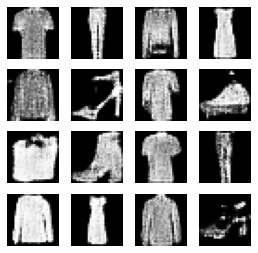

33400: [discriminator loss: 0.664267, acc: 0.632812] [adversarial loss: 0.787327, acc: 0.187500]
33401: [discriminator loss: 0.659097, acc: 0.671875] [adversarial loss: 0.733589, acc: 0.453125]
33402: [discriminator loss: 0.689471, acc: 0.546875] [adversarial loss: 0.762174, acc: 0.328125]
33403: [discriminator loss: 0.679918, acc: 0.531250] [adversarial loss: 0.647640, acc: 0.671875]
33404: [discriminator loss: 0.692083, acc: 0.500000] [adversarial loss: 0.744884, acc: 0.312500]
33405: [discriminator loss: 0.674824, acc: 0.570312] [adversarial loss: 0.692660, acc: 0.515625]
33406: [discriminator loss: 0.665026, acc: 0.507812] [adversarial loss: 0.670833, acc: 0.562500]
33407: [discriminator loss: 0.709126, acc: 0.460938] [adversarial loss: 0.762554, acc: 0.296875]
33408: [discriminator loss: 0.667785, acc: 0.625000] [adversarial loss: 0.728494, acc: 0.468750]
33409: [discriminator loss: 0.693899, acc: 0.531250] [adversarial loss: 0.689957, acc: 0.500000]
33410: [discriminator loss: 0.

33488: [discriminator loss: 0.672283, acc: 0.562500] [adversarial loss: 0.696872, acc: 0.468750]
33489: [discriminator loss: 0.688719, acc: 0.539062] [adversarial loss: 0.759189, acc: 0.375000]
33490: [discriminator loss: 0.674113, acc: 0.570312] [adversarial loss: 0.603860, acc: 0.843750]
33491: [discriminator loss: 0.665688, acc: 0.539062] [adversarial loss: 0.859013, acc: 0.093750]
33492: [discriminator loss: 0.701582, acc: 0.523438] [adversarial loss: 0.691700, acc: 0.546875]
33493: [discriminator loss: 0.657130, acc: 0.578125] [adversarial loss: 0.721667, acc: 0.515625]
33494: [discriminator loss: 0.691501, acc: 0.507812] [adversarial loss: 0.745440, acc: 0.406250]
33495: [discriminator loss: 0.693680, acc: 0.500000] [adversarial loss: 0.793340, acc: 0.281250]
33496: [discriminator loss: 0.653093, acc: 0.609375] [adversarial loss: 0.771872, acc: 0.390625]
33497: [discriminator loss: 0.668798, acc: 0.601562] [adversarial loss: 0.671764, acc: 0.625000]
33498: [discriminator loss: 0.

33575: [discriminator loss: 0.686502, acc: 0.593750] [adversarial loss: 0.665819, acc: 0.625000]
33576: [discriminator loss: 0.679944, acc: 0.476562] [adversarial loss: 0.832107, acc: 0.109375]
33577: [discriminator loss: 0.662043, acc: 0.664062] [adversarial loss: 0.632595, acc: 0.687500]
33578: [discriminator loss: 0.682343, acc: 0.539062] [adversarial loss: 0.844342, acc: 0.156250]
33579: [discriminator loss: 0.681357, acc: 0.562500] [adversarial loss: 0.627723, acc: 0.703125]
33580: [discriminator loss: 0.690868, acc: 0.492188] [adversarial loss: 0.779825, acc: 0.328125]
33581: [discriminator loss: 0.698617, acc: 0.539062] [adversarial loss: 0.749133, acc: 0.312500]
33582: [discriminator loss: 0.667255, acc: 0.601562] [adversarial loss: 0.685555, acc: 0.578125]
33583: [discriminator loss: 0.679328, acc: 0.500000] [adversarial loss: 0.749487, acc: 0.328125]
33584: [discriminator loss: 0.672791, acc: 0.632812] [adversarial loss: 0.714687, acc: 0.328125]
33585: [discriminator loss: 0.

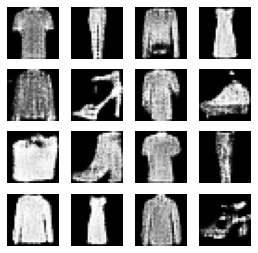

33600: [discriminator loss: 0.710317, acc: 0.476562] [adversarial loss: 0.709490, acc: 0.531250]
33601: [discriminator loss: 0.665506, acc: 0.632812] [adversarial loss: 0.823089, acc: 0.140625]
33602: [discriminator loss: 0.681422, acc: 0.570312] [adversarial loss: 0.670800, acc: 0.578125]
33603: [discriminator loss: 0.708137, acc: 0.531250] [adversarial loss: 0.829448, acc: 0.125000]
33604: [discriminator loss: 0.674513, acc: 0.648438] [adversarial loss: 0.658666, acc: 0.671875]
33605: [discriminator loss: 0.658892, acc: 0.601562] [adversarial loss: 0.797784, acc: 0.187500]
33606: [discriminator loss: 0.674866, acc: 0.617188] [adversarial loss: 0.762718, acc: 0.312500]
33607: [discriminator loss: 0.669290, acc: 0.640625] [adversarial loss: 0.687472, acc: 0.562500]
33608: [discriminator loss: 0.686871, acc: 0.554688] [adversarial loss: 0.738453, acc: 0.343750]
33609: [discriminator loss: 0.675157, acc: 0.546875] [adversarial loss: 0.719905, acc: 0.453125]
33610: [discriminator loss: 0.

33687: [discriminator loss: 0.675581, acc: 0.570312] [adversarial loss: 0.747816, acc: 0.406250]
33688: [discriminator loss: 0.662625, acc: 0.570312] [adversarial loss: 0.728889, acc: 0.453125]
33689: [discriminator loss: 0.671990, acc: 0.562500] [adversarial loss: 0.768861, acc: 0.390625]
33690: [discriminator loss: 0.684281, acc: 0.539062] [adversarial loss: 0.634730, acc: 0.687500]
33691: [discriminator loss: 0.686242, acc: 0.500000] [adversarial loss: 0.769278, acc: 0.296875]
33692: [discriminator loss: 0.686985, acc: 0.500000] [adversarial loss: 0.701915, acc: 0.484375]
33693: [discriminator loss: 0.653782, acc: 0.656250] [adversarial loss: 0.784546, acc: 0.406250]
33694: [discriminator loss: 0.672348, acc: 0.585938] [adversarial loss: 0.674469, acc: 0.609375]
33695: [discriminator loss: 0.684554, acc: 0.476562] [adversarial loss: 0.769497, acc: 0.281250]
33696: [discriminator loss: 0.679566, acc: 0.578125] [adversarial loss: 0.631290, acc: 0.703125]
33697: [discriminator loss: 0.

33774: [discriminator loss: 0.697523, acc: 0.484375] [adversarial loss: 0.722823, acc: 0.406250]
33775: [discriminator loss: 0.691729, acc: 0.539062] [adversarial loss: 0.746991, acc: 0.296875]
33776: [discriminator loss: 0.667131, acc: 0.570312] [adversarial loss: 0.701147, acc: 0.546875]
33777: [discriminator loss: 0.723709, acc: 0.445312] [adversarial loss: 0.887493, acc: 0.046875]
33778: [discriminator loss: 0.682229, acc: 0.554688] [adversarial loss: 0.652341, acc: 0.578125]
33779: [discriminator loss: 0.673114, acc: 0.585938] [adversarial loss: 0.747698, acc: 0.328125]
33780: [discriminator loss: 0.679202, acc: 0.593750] [adversarial loss: 0.789896, acc: 0.218750]
33781: [discriminator loss: 0.685064, acc: 0.546875] [adversarial loss: 0.651841, acc: 0.609375]
33782: [discriminator loss: 0.664592, acc: 0.515625] [adversarial loss: 0.799153, acc: 0.234375]
33783: [discriminator loss: 0.686930, acc: 0.578125] [adversarial loss: 0.681491, acc: 0.625000]
33784: [discriminator loss: 0.

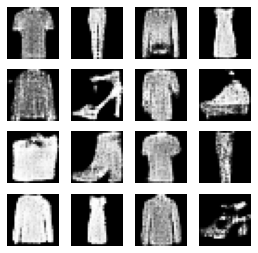

33800: [discriminator loss: 0.669378, acc: 0.601562] [adversarial loss: 0.687911, acc: 0.640625]
33801: [discriminator loss: 0.656021, acc: 0.585938] [adversarial loss: 0.692881, acc: 0.468750]
33802: [discriminator loss: 0.690840, acc: 0.515625] [adversarial loss: 0.751046, acc: 0.390625]
33803: [discriminator loss: 0.649175, acc: 0.625000] [adversarial loss: 0.720628, acc: 0.343750]
33804: [discriminator loss: 0.680137, acc: 0.593750] [adversarial loss: 0.640777, acc: 0.765625]
33805: [discriminator loss: 0.704895, acc: 0.531250] [adversarial loss: 0.892023, acc: 0.046875]
33806: [discriminator loss: 0.671788, acc: 0.570312] [adversarial loss: 0.754635, acc: 0.265625]
33807: [discriminator loss: 0.661215, acc: 0.617188] [adversarial loss: 0.773674, acc: 0.437500]
33808: [discriminator loss: 0.703989, acc: 0.500000] [adversarial loss: 0.722807, acc: 0.437500]
33809: [discriminator loss: 0.679897, acc: 0.539062] [adversarial loss: 0.805873, acc: 0.140625]
33810: [discriminator loss: 0.

33888: [discriminator loss: 0.671484, acc: 0.585938] [adversarial loss: 0.757781, acc: 0.218750]
33889: [discriminator loss: 0.654495, acc: 0.656250] [adversarial loss: 0.630971, acc: 0.703125]
33890: [discriminator loss: 0.674971, acc: 0.554688] [adversarial loss: 0.855795, acc: 0.203125]
33891: [discriminator loss: 0.701815, acc: 0.539062] [adversarial loss: 0.648602, acc: 0.625000]
33892: [discriminator loss: 0.687095, acc: 0.531250] [adversarial loss: 0.843591, acc: 0.234375]
33893: [discriminator loss: 0.678856, acc: 0.609375] [adversarial loss: 0.690853, acc: 0.562500]
33894: [discriminator loss: 0.656912, acc: 0.601562] [adversarial loss: 0.796996, acc: 0.296875]
33895: [discriminator loss: 0.667614, acc: 0.609375] [adversarial loss: 0.650338, acc: 0.546875]
33896: [discriminator loss: 0.682373, acc: 0.531250] [adversarial loss: 0.792333, acc: 0.265625]
33897: [discriminator loss: 0.686662, acc: 0.546875] [adversarial loss: 0.691770, acc: 0.484375]
33898: [discriminator loss: 0.

33973: [discriminator loss: 0.688258, acc: 0.546875] [adversarial loss: 0.645372, acc: 0.718750]
33974: [discriminator loss: 0.703508, acc: 0.437500] [adversarial loss: 0.733267, acc: 0.406250]
33975: [discriminator loss: 0.674803, acc: 0.492188] [adversarial loss: 0.746820, acc: 0.250000]
33976: [discriminator loss: 0.683879, acc: 0.546875] [adversarial loss: 0.796021, acc: 0.218750]
33977: [discriminator loss: 0.655014, acc: 0.648438] [adversarial loss: 0.742397, acc: 0.343750]
33978: [discriminator loss: 0.683163, acc: 0.523438] [adversarial loss: 0.687022, acc: 0.515625]
33979: [discriminator loss: 0.702895, acc: 0.539062] [adversarial loss: 0.765600, acc: 0.265625]
33980: [discriminator loss: 0.679571, acc: 0.617188] [adversarial loss: 0.722949, acc: 0.453125]
33981: [discriminator loss: 0.685187, acc: 0.492188] [adversarial loss: 0.699329, acc: 0.421875]
33982: [discriminator loss: 0.684824, acc: 0.609375] [adversarial loss: 0.790690, acc: 0.265625]
33983: [discriminator loss: 0.

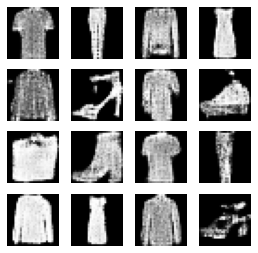

34000: [discriminator loss: 0.663415, acc: 0.632812] [adversarial loss: 0.750217, acc: 0.312500]
34001: [discriminator loss: 0.675639, acc: 0.531250] [adversarial loss: 0.671886, acc: 0.593750]
34002: [discriminator loss: 0.696360, acc: 0.523438] [adversarial loss: 0.901911, acc: 0.015625]
34003: [discriminator loss: 0.672014, acc: 0.578125] [adversarial loss: 0.632092, acc: 0.750000]
34004: [discriminator loss: 0.670059, acc: 0.539062] [adversarial loss: 0.801605, acc: 0.250000]
34005: [discriminator loss: 0.687307, acc: 0.546875] [adversarial loss: 0.739598, acc: 0.390625]
34006: [discriminator loss: 0.665361, acc: 0.585938] [adversarial loss: 0.818635, acc: 0.296875]
34007: [discriminator loss: 0.699304, acc: 0.523438] [adversarial loss: 0.666747, acc: 0.640625]
34008: [discriminator loss: 0.668216, acc: 0.601562] [adversarial loss: 0.774414, acc: 0.343750]
34009: [discriminator loss: 0.670435, acc: 0.578125] [adversarial loss: 0.718512, acc: 0.484375]
34010: [discriminator loss: 0.

34087: [discriminator loss: 0.713204, acc: 0.468750] [adversarial loss: 0.869616, acc: 0.140625]
34088: [discriminator loss: 0.705623, acc: 0.515625] [adversarial loss: 0.576307, acc: 0.875000]
34089: [discriminator loss: 0.685987, acc: 0.593750] [adversarial loss: 0.759042, acc: 0.281250]
34090: [discriminator loss: 0.674620, acc: 0.578125] [adversarial loss: 0.768586, acc: 0.296875]
34091: [discriminator loss: 0.665969, acc: 0.570312] [adversarial loss: 0.682674, acc: 0.515625]
34092: [discriminator loss: 0.680525, acc: 0.554688] [adversarial loss: 0.799214, acc: 0.375000]
34093: [discriminator loss: 0.664906, acc: 0.585938] [adversarial loss: 0.706772, acc: 0.515625]
34094: [discriminator loss: 0.673122, acc: 0.546875] [adversarial loss: 0.737560, acc: 0.484375]
34095: [discriminator loss: 0.679319, acc: 0.523438] [adversarial loss: 0.759616, acc: 0.359375]
34096: [discriminator loss: 0.691871, acc: 0.476562] [adversarial loss: 0.803592, acc: 0.218750]
34097: [discriminator loss: 0.

34174: [discriminator loss: 0.709416, acc: 0.484375] [adversarial loss: 0.745238, acc: 0.312500]
34175: [discriminator loss: 0.677743, acc: 0.585938] [adversarial loss: 0.745128, acc: 0.406250]
34176: [discriminator loss: 0.692003, acc: 0.507812] [adversarial loss: 0.775627, acc: 0.234375]
34177: [discriminator loss: 0.680928, acc: 0.601562] [adversarial loss: 0.721687, acc: 0.375000]
34178: [discriminator loss: 0.671747, acc: 0.625000] [adversarial loss: 0.706235, acc: 0.453125]
34179: [discriminator loss: 0.709274, acc: 0.523438] [adversarial loss: 0.798745, acc: 0.203125]
34180: [discriminator loss: 0.698713, acc: 0.492188] [adversarial loss: 0.761177, acc: 0.343750]
34181: [discriminator loss: 0.678854, acc: 0.578125] [adversarial loss: 0.746021, acc: 0.437500]
34182: [discriminator loss: 0.655354, acc: 0.593750] [adversarial loss: 0.790080, acc: 0.125000]
34183: [discriminator loss: 0.679396, acc: 0.531250] [adversarial loss: 0.665120, acc: 0.609375]
34184: [discriminator loss: 0.

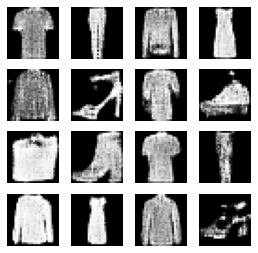

34200: [discriminator loss: 0.650992, acc: 0.609375] [adversarial loss: 0.786335, acc: 0.250000]
34201: [discriminator loss: 0.693716, acc: 0.562500] [adversarial loss: 0.686195, acc: 0.562500]
34202: [discriminator loss: 0.687987, acc: 0.507812] [adversarial loss: 0.804075, acc: 0.281250]
34203: [discriminator loss: 0.681284, acc: 0.554688] [adversarial loss: 0.726864, acc: 0.375000]
34204: [discriminator loss: 0.666115, acc: 0.617188] [adversarial loss: 0.818344, acc: 0.265625]
34205: [discriminator loss: 0.655671, acc: 0.617188] [adversarial loss: 0.634680, acc: 0.703125]
34206: [discriminator loss: 0.696350, acc: 0.523438] [adversarial loss: 0.840684, acc: 0.125000]
34207: [discriminator loss: 0.696309, acc: 0.492188] [adversarial loss: 0.712086, acc: 0.453125]
34208: [discriminator loss: 0.668731, acc: 0.570312] [adversarial loss: 0.768570, acc: 0.265625]
34209: [discriminator loss: 0.685775, acc: 0.601562] [adversarial loss: 0.755369, acc: 0.296875]
34210: [discriminator loss: 0.

34286: [discriminator loss: 0.677019, acc: 0.570312] [adversarial loss: 0.641602, acc: 0.671875]
34287: [discriminator loss: 0.676889, acc: 0.507812] [adversarial loss: 0.770759, acc: 0.203125]
34288: [discriminator loss: 0.671804, acc: 0.562500] [adversarial loss: 0.740315, acc: 0.343750]
34289: [discriminator loss: 0.675666, acc: 0.593750] [adversarial loss: 0.700073, acc: 0.421875]
34290: [discriminator loss: 0.688187, acc: 0.523438] [adversarial loss: 0.676119, acc: 0.515625]
34291: [discriminator loss: 0.663544, acc: 0.570312] [adversarial loss: 0.793877, acc: 0.187500]
34292: [discriminator loss: 0.687550, acc: 0.578125] [adversarial loss: 0.778187, acc: 0.218750]
34293: [discriminator loss: 0.667395, acc: 0.625000] [adversarial loss: 0.641164, acc: 0.703125]
34294: [discriminator loss: 0.696784, acc: 0.539062] [adversarial loss: 0.856758, acc: 0.140625]
34295: [discriminator loss: 0.703265, acc: 0.546875] [adversarial loss: 0.634614, acc: 0.687500]
34296: [discriminator loss: 0.

34371: [discriminator loss: 0.674539, acc: 0.593750] [adversarial loss: 0.705797, acc: 0.484375]
34372: [discriminator loss: 0.675138, acc: 0.570312] [adversarial loss: 0.804975, acc: 0.187500]
34373: [discriminator loss: 0.678351, acc: 0.601562] [adversarial loss: 0.686545, acc: 0.562500]
34374: [discriminator loss: 0.663779, acc: 0.593750] [adversarial loss: 0.799562, acc: 0.187500]
34375: [discriminator loss: 0.697316, acc: 0.546875] [adversarial loss: 0.668730, acc: 0.625000]
34376: [discriminator loss: 0.682223, acc: 0.507812] [adversarial loss: 0.868085, acc: 0.078125]
34377: [discriminator loss: 0.676889, acc: 0.585938] [adversarial loss: 0.642593, acc: 0.671875]
34378: [discriminator loss: 0.653030, acc: 0.664062] [adversarial loss: 0.826187, acc: 0.234375]
34379: [discriminator loss: 0.672869, acc: 0.554688] [adversarial loss: 0.797734, acc: 0.250000]
34380: [discriminator loss: 0.664423, acc: 0.671875] [adversarial loss: 0.720064, acc: 0.421875]
34381: [discriminator loss: 0.

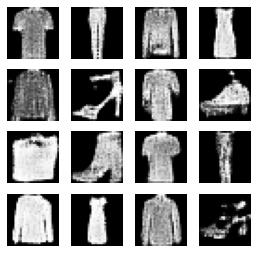

34400: [discriminator loss: 0.695818, acc: 0.531250] [adversarial loss: 0.711622, acc: 0.500000]
34401: [discriminator loss: 0.687555, acc: 0.539062] [adversarial loss: 0.789964, acc: 0.281250]
34402: [discriminator loss: 0.673703, acc: 0.593750] [adversarial loss: 0.706512, acc: 0.453125]
34403: [discriminator loss: 0.686324, acc: 0.546875] [adversarial loss: 0.789699, acc: 0.265625]
34404: [discriminator loss: 0.684159, acc: 0.585938] [adversarial loss: 0.717295, acc: 0.437500]
34405: [discriminator loss: 0.660786, acc: 0.640625] [adversarial loss: 0.811284, acc: 0.218750]
34406: [discriminator loss: 0.664450, acc: 0.625000] [adversarial loss: 0.640010, acc: 0.671875]
34407: [discriminator loss: 0.680883, acc: 0.539062] [adversarial loss: 0.833828, acc: 0.156250]
34408: [discriminator loss: 0.701186, acc: 0.500000] [adversarial loss: 0.662747, acc: 0.593750]
34409: [discriminator loss: 0.683545, acc: 0.523438] [adversarial loss: 0.777603, acc: 0.375000]
34410: [discriminator loss: 0.

34488: [discriminator loss: 0.664722, acc: 0.632812] [adversarial loss: 0.703158, acc: 0.421875]
34489: [discriminator loss: 0.674282, acc: 0.578125] [adversarial loss: 0.707996, acc: 0.406250]
34490: [discriminator loss: 0.695885, acc: 0.468750] [adversarial loss: 0.682830, acc: 0.578125]
34491: [discriminator loss: 0.691426, acc: 0.554688] [adversarial loss: 0.839286, acc: 0.187500]
34492: [discriminator loss: 0.671650, acc: 0.593750] [adversarial loss: 0.617417, acc: 0.796875]
34493: [discriminator loss: 0.686746, acc: 0.515625] [adversarial loss: 0.727450, acc: 0.484375]
34494: [discriminator loss: 0.680939, acc: 0.570312] [adversarial loss: 0.758013, acc: 0.421875]
34495: [discriminator loss: 0.668877, acc: 0.593750] [adversarial loss: 0.699295, acc: 0.484375]
34496: [discriminator loss: 0.684800, acc: 0.531250] [adversarial loss: 0.722365, acc: 0.468750]
34497: [discriminator loss: 0.680325, acc: 0.546875] [adversarial loss: 0.664994, acc: 0.546875]
34498: [discriminator loss: 0.

34577: [discriminator loss: 0.672323, acc: 0.578125] [adversarial loss: 0.751173, acc: 0.250000]
34578: [discriminator loss: 0.659436, acc: 0.617188] [adversarial loss: 0.681368, acc: 0.593750]
34579: [discriminator loss: 0.647083, acc: 0.585938] [adversarial loss: 0.828797, acc: 0.078125]
34580: [discriminator loss: 0.663981, acc: 0.593750] [adversarial loss: 0.658068, acc: 0.671875]
34581: [discriminator loss: 0.681282, acc: 0.554688] [adversarial loss: 0.797769, acc: 0.312500]
34582: [discriminator loss: 0.681356, acc: 0.578125] [adversarial loss: 0.609536, acc: 0.718750]
34583: [discriminator loss: 0.693148, acc: 0.507812] [adversarial loss: 0.835968, acc: 0.078125]
34584: [discriminator loss: 0.692797, acc: 0.546875] [adversarial loss: 0.645340, acc: 0.703125]
34585: [discriminator loss: 0.676859, acc: 0.585938] [adversarial loss: 0.804825, acc: 0.296875]
34586: [discriminator loss: 0.685525, acc: 0.539062] [adversarial loss: 0.692710, acc: 0.500000]
34587: [discriminator loss: 0.

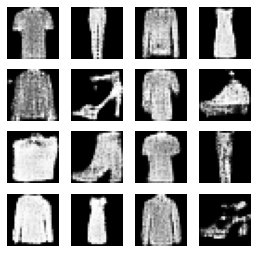

34600: [discriminator loss: 0.671093, acc: 0.546875] [adversarial loss: 0.807662, acc: 0.187500]
34601: [discriminator loss: 0.679484, acc: 0.609375] [adversarial loss: 0.703864, acc: 0.468750]
34602: [discriminator loss: 0.670702, acc: 0.578125] [adversarial loss: 0.751361, acc: 0.437500]
34603: [discriminator loss: 0.700789, acc: 0.507812] [adversarial loss: 0.701499, acc: 0.531250]
34604: [discriminator loss: 0.692463, acc: 0.539062] [adversarial loss: 0.775716, acc: 0.234375]
34605: [discriminator loss: 0.683372, acc: 0.554688] [adversarial loss: 0.734003, acc: 0.312500]
34606: [discriminator loss: 0.669612, acc: 0.601562] [adversarial loss: 0.740970, acc: 0.375000]
34607: [discriminator loss: 0.681356, acc: 0.609375] [adversarial loss: 0.731493, acc: 0.375000]
34608: [discriminator loss: 0.668528, acc: 0.554688] [adversarial loss: 0.689081, acc: 0.484375]
34609: [discriminator loss: 0.688658, acc: 0.546875] [adversarial loss: 0.749135, acc: 0.359375]
34610: [discriminator loss: 0.

34689: [discriminator loss: 0.680052, acc: 0.593750] [adversarial loss: 0.725173, acc: 0.406250]
34690: [discriminator loss: 0.699405, acc: 0.570312] [adversarial loss: 0.748707, acc: 0.328125]
34691: [discriminator loss: 0.702145, acc: 0.492188] [adversarial loss: 0.725518, acc: 0.359375]
34692: [discriminator loss: 0.680320, acc: 0.546875] [adversarial loss: 0.707144, acc: 0.453125]
34693: [discriminator loss: 0.697450, acc: 0.554688] [adversarial loss: 0.768142, acc: 0.296875]
34694: [discriminator loss: 0.696238, acc: 0.539062] [adversarial loss: 0.703906, acc: 0.468750]
34695: [discriminator loss: 0.670668, acc: 0.632812] [adversarial loss: 0.686162, acc: 0.578125]
34696: [discriminator loss: 0.683849, acc: 0.523438] [adversarial loss: 0.748342, acc: 0.343750]
34697: [discriminator loss: 0.684138, acc: 0.507812] [adversarial loss: 0.709286, acc: 0.437500]
34698: [discriminator loss: 0.679368, acc: 0.640625] [adversarial loss: 0.666712, acc: 0.703125]
34699: [discriminator loss: 0.

34778: [discriminator loss: 0.685186, acc: 0.554688] [adversarial loss: 0.676817, acc: 0.593750]
34779: [discriminator loss: 0.678762, acc: 0.539062] [adversarial loss: 0.833010, acc: 0.203125]
34780: [discriminator loss: 0.682945, acc: 0.523438] [adversarial loss: 0.627917, acc: 0.750000]
34781: [discriminator loss: 0.687215, acc: 0.539062] [adversarial loss: 0.804925, acc: 0.390625]
34782: [discriminator loss: 0.667472, acc: 0.546875] [adversarial loss: 0.779403, acc: 0.328125]
34783: [discriminator loss: 0.681015, acc: 0.570312] [adversarial loss: 0.722335, acc: 0.421875]
34784: [discriminator loss: 0.678107, acc: 0.531250] [adversarial loss: 0.725058, acc: 0.453125]
34785: [discriminator loss: 0.691745, acc: 0.554688] [adversarial loss: 0.682942, acc: 0.546875]
34786: [discriminator loss: 0.673662, acc: 0.539062] [adversarial loss: 0.848837, acc: 0.015625]
34787: [discriminator loss: 0.685111, acc: 0.531250] [adversarial loss: 0.669810, acc: 0.640625]
34788: [discriminator loss: 0.

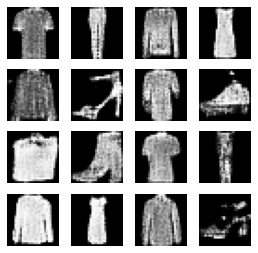

34800: [discriminator loss: 0.715019, acc: 0.437500] [adversarial loss: 0.791767, acc: 0.218750]
34801: [discriminator loss: 0.691207, acc: 0.500000] [adversarial loss: 0.678663, acc: 0.609375]
34802: [discriminator loss: 0.661867, acc: 0.648438] [adversarial loss: 0.719660, acc: 0.515625]
34803: [discriminator loss: 0.675750, acc: 0.531250] [adversarial loss: 0.728141, acc: 0.406250]
34804: [discriminator loss: 0.688918, acc: 0.531250] [adversarial loss: 0.692304, acc: 0.546875]
34805: [discriminator loss: 0.685641, acc: 0.507812] [adversarial loss: 0.736166, acc: 0.359375]
34806: [discriminator loss: 0.685302, acc: 0.515625] [adversarial loss: 0.730884, acc: 0.359375]
34807: [discriminator loss: 0.680082, acc: 0.531250] [adversarial loss: 0.732342, acc: 0.343750]
34808: [discriminator loss: 0.688441, acc: 0.570312] [adversarial loss: 0.735347, acc: 0.453125]
34809: [discriminator loss: 0.681704, acc: 0.500000] [adversarial loss: 0.669864, acc: 0.500000]
34810: [discriminator loss: 0.

34886: [discriminator loss: 0.675343, acc: 0.593750] [adversarial loss: 0.803781, acc: 0.265625]
34887: [discriminator loss: 0.694612, acc: 0.515625] [adversarial loss: 0.646651, acc: 0.656250]
34888: [discriminator loss: 0.702736, acc: 0.484375] [adversarial loss: 0.811084, acc: 0.125000]
34889: [discriminator loss: 0.683702, acc: 0.570312] [adversarial loss: 0.675579, acc: 0.515625]
34890: [discriminator loss: 0.691625, acc: 0.523438] [adversarial loss: 0.787798, acc: 0.250000]
34891: [discriminator loss: 0.690392, acc: 0.531250] [adversarial loss: 0.693591, acc: 0.484375]
34892: [discriminator loss: 0.668543, acc: 0.570312] [adversarial loss: 0.662739, acc: 0.640625]
34893: [discriminator loss: 0.727658, acc: 0.390625] [adversarial loss: 0.817285, acc: 0.156250]
34894: [discriminator loss: 0.674037, acc: 0.562500] [adversarial loss: 0.692501, acc: 0.562500]
34895: [discriminator loss: 0.676436, acc: 0.546875] [adversarial loss: 0.822273, acc: 0.234375]
34896: [discriminator loss: 0.

34973: [discriminator loss: 0.685427, acc: 0.539062] [adversarial loss: 0.723095, acc: 0.406250]
34974: [discriminator loss: 0.676145, acc: 0.601562] [adversarial loss: 0.802593, acc: 0.187500]
34975: [discriminator loss: 0.665330, acc: 0.625000] [adversarial loss: 0.703853, acc: 0.453125]
34976: [discriminator loss: 0.660499, acc: 0.625000] [adversarial loss: 0.682649, acc: 0.531250]
34977: [discriminator loss: 0.691954, acc: 0.546875] [adversarial loss: 0.896327, acc: 0.156250]
34978: [discriminator loss: 0.709401, acc: 0.523438] [adversarial loss: 0.662641, acc: 0.562500]
34979: [discriminator loss: 0.685753, acc: 0.570312] [adversarial loss: 0.710998, acc: 0.453125]
34980: [discriminator loss: 0.674437, acc: 0.570312] [adversarial loss: 0.687579, acc: 0.562500]
34981: [discriminator loss: 0.666349, acc: 0.617188] [adversarial loss: 0.723886, acc: 0.406250]
34982: [discriminator loss: 0.676235, acc: 0.585938] [adversarial loss: 0.662177, acc: 0.593750]
34983: [discriminator loss: 0.

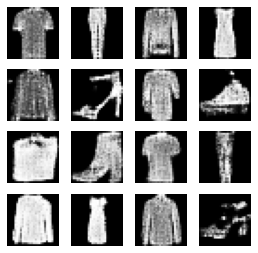

35000: [discriminator loss: 0.689018, acc: 0.562500] [adversarial loss: 0.699581, acc: 0.484375]
35001: [discriminator loss: 0.670837, acc: 0.609375] [adversarial loss: 0.783605, acc: 0.187500]
35002: [discriminator loss: 0.686612, acc: 0.523438] [adversarial loss: 0.613473, acc: 0.781250]
35003: [discriminator loss: 0.686964, acc: 0.531250] [adversarial loss: 0.751553, acc: 0.343750]
35004: [discriminator loss: 0.687099, acc: 0.515625] [adversarial loss: 0.783764, acc: 0.234375]
35005: [discriminator loss: 0.684469, acc: 0.562500] [adversarial loss: 0.768663, acc: 0.296875]
35006: [discriminator loss: 0.676258, acc: 0.578125] [adversarial loss: 0.760139, acc: 0.406250]
35007: [discriminator loss: 0.658623, acc: 0.593750] [adversarial loss: 0.672323, acc: 0.562500]
35008: [discriminator loss: 0.661466, acc: 0.640625] [adversarial loss: 0.824131, acc: 0.328125]
35009: [discriminator loss: 0.685099, acc: 0.585938] [adversarial loss: 0.730120, acc: 0.531250]
35010: [discriminator loss: 0.

35085: [discriminator loss: 0.710562, acc: 0.468750] [adversarial loss: 0.752636, acc: 0.312500]
35086: [discriminator loss: 0.666965, acc: 0.609375] [adversarial loss: 0.711549, acc: 0.453125]
35087: [discriminator loss: 0.682679, acc: 0.546875] [adversarial loss: 0.654418, acc: 0.609375]
35088: [discriminator loss: 0.670444, acc: 0.593750] [adversarial loss: 0.692234, acc: 0.484375]
35089: [discriminator loss: 0.684138, acc: 0.546875] [adversarial loss: 0.785909, acc: 0.312500]
35090: [discriminator loss: 0.669102, acc: 0.609375] [adversarial loss: 0.716753, acc: 0.390625]
35091: [discriminator loss: 0.683972, acc: 0.531250] [adversarial loss: 0.764288, acc: 0.296875]
35092: [discriminator loss: 0.698819, acc: 0.507812] [adversarial loss: 0.678925, acc: 0.500000]
35093: [discriminator loss: 0.679649, acc: 0.562500] [adversarial loss: 0.772942, acc: 0.343750]
35094: [discriminator loss: 0.661461, acc: 0.609375] [adversarial loss: 0.703894, acc: 0.484375]
35095: [discriminator loss: 0.

35170: [discriminator loss: 0.685090, acc: 0.554688] [adversarial loss: 0.797689, acc: 0.312500]
35171: [discriminator loss: 0.693250, acc: 0.515625] [adversarial loss: 0.727785, acc: 0.453125]
35172: [discriminator loss: 0.683662, acc: 0.515625] [adversarial loss: 0.716993, acc: 0.437500]
35173: [discriminator loss: 0.679323, acc: 0.578125] [adversarial loss: 0.708535, acc: 0.484375]
35174: [discriminator loss: 0.683418, acc: 0.531250] [adversarial loss: 0.644888, acc: 0.625000]
35175: [discriminator loss: 0.681135, acc: 0.539062] [adversarial loss: 0.772811, acc: 0.265625]
35176: [discriminator loss: 0.700066, acc: 0.531250] [adversarial loss: 0.624610, acc: 0.796875]
35177: [discriminator loss: 0.684217, acc: 0.554688] [adversarial loss: 0.877261, acc: 0.015625]
35178: [discriminator loss: 0.687113, acc: 0.593750] [adversarial loss: 0.692724, acc: 0.546875]
35179: [discriminator loss: 0.681684, acc: 0.578125] [adversarial loss: 0.766388, acc: 0.296875]
35180: [discriminator loss: 0.

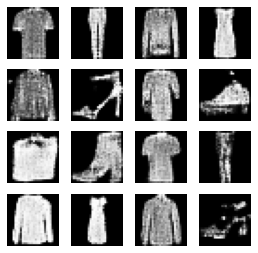

35200: [discriminator loss: 0.673707, acc: 0.570312] [adversarial loss: 0.726122, acc: 0.296875]
35201: [discriminator loss: 0.673082, acc: 0.601562] [adversarial loss: 0.718052, acc: 0.390625]
35202: [discriminator loss: 0.676495, acc: 0.578125] [adversarial loss: 0.779705, acc: 0.296875]
35203: [discriminator loss: 0.675287, acc: 0.562500] [adversarial loss: 0.767387, acc: 0.484375]
35204: [discriminator loss: 0.671106, acc: 0.609375] [adversarial loss: 0.729432, acc: 0.453125]
35205: [discriminator loss: 0.702308, acc: 0.492188] [adversarial loss: 0.823241, acc: 0.109375]
35206: [discriminator loss: 0.672250, acc: 0.562500] [adversarial loss: 0.705413, acc: 0.468750]
35207: [discriminator loss: 0.661187, acc: 0.601562] [adversarial loss: 0.696531, acc: 0.484375]
35208: [discriminator loss: 0.684155, acc: 0.523438] [adversarial loss: 0.698699, acc: 0.531250]
35209: [discriminator loss: 0.684393, acc: 0.531250] [adversarial loss: 0.838506, acc: 0.109375]
35210: [discriminator loss: 0.

35285: [discriminator loss: 0.689245, acc: 0.585938] [adversarial loss: 0.743405, acc: 0.343750]
35286: [discriminator loss: 0.697345, acc: 0.507812] [adversarial loss: 0.831403, acc: 0.125000]
35287: [discriminator loss: 0.680710, acc: 0.570312] [adversarial loss: 0.739805, acc: 0.343750]
35288: [discriminator loss: 0.661350, acc: 0.593750] [adversarial loss: 0.607847, acc: 0.765625]
35289: [discriminator loss: 0.675007, acc: 0.546875] [adversarial loss: 0.776412, acc: 0.296875]
35290: [discriminator loss: 0.679040, acc: 0.593750] [adversarial loss: 0.823185, acc: 0.109375]
35291: [discriminator loss: 0.668873, acc: 0.609375] [adversarial loss: 0.626614, acc: 0.734375]
35292: [discriminator loss: 0.668482, acc: 0.617188] [adversarial loss: 0.788660, acc: 0.203125]
35293: [discriminator loss: 0.692231, acc: 0.578125] [adversarial loss: 0.656419, acc: 0.562500]
35294: [discriminator loss: 0.673253, acc: 0.609375] [adversarial loss: 0.819110, acc: 0.187500]
35295: [discriminator loss: 0.

35370: [discriminator loss: 0.656025, acc: 0.625000] [adversarial loss: 0.736647, acc: 0.328125]
35371: [discriminator loss: 0.679883, acc: 0.554688] [adversarial loss: 0.781433, acc: 0.265625]
35372: [discriminator loss: 0.700105, acc: 0.523438] [adversarial loss: 0.663891, acc: 0.640625]
35373: [discriminator loss: 0.687150, acc: 0.578125] [adversarial loss: 0.831487, acc: 0.140625]
35374: [discriminator loss: 0.687453, acc: 0.554688] [adversarial loss: 0.766326, acc: 0.234375]
35375: [discriminator loss: 0.673892, acc: 0.609375] [adversarial loss: 0.726203, acc: 0.375000]
35376: [discriminator loss: 0.682248, acc: 0.554688] [adversarial loss: 0.665381, acc: 0.640625]
35377: [discriminator loss: 0.668302, acc: 0.570312] [adversarial loss: 0.856327, acc: 0.140625]
35378: [discriminator loss: 0.711501, acc: 0.515625] [adversarial loss: 0.705075, acc: 0.515625]
35379: [discriminator loss: 0.670967, acc: 0.585938] [adversarial loss: 0.736079, acc: 0.375000]
35380: [discriminator loss: 0.

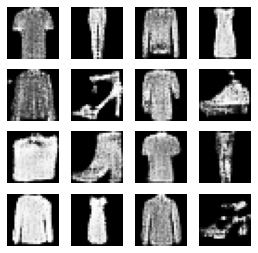

35400: [discriminator loss: 0.662431, acc: 0.570312] [adversarial loss: 0.760231, acc: 0.312500]
35401: [discriminator loss: 0.671315, acc: 0.617188] [adversarial loss: 0.611329, acc: 0.796875]
35402: [discriminator loss: 0.647621, acc: 0.632812] [adversarial loss: 0.750240, acc: 0.453125]
35403: [discriminator loss: 0.679496, acc: 0.546875] [adversarial loss: 0.665768, acc: 0.640625]
35404: [discriminator loss: 0.678037, acc: 0.570312] [adversarial loss: 0.738031, acc: 0.390625]
35405: [discriminator loss: 0.688051, acc: 0.578125] [adversarial loss: 0.731250, acc: 0.453125]
35406: [discriminator loss: 0.664413, acc: 0.632812] [adversarial loss: 0.705171, acc: 0.484375]
35407: [discriminator loss: 0.684047, acc: 0.507812] [adversarial loss: 0.693697, acc: 0.531250]
35408: [discriminator loss: 0.674951, acc: 0.625000] [adversarial loss: 0.753319, acc: 0.296875]
35409: [discriminator loss: 0.666579, acc: 0.617188] [adversarial loss: 0.682341, acc: 0.562500]
35410: [discriminator loss: 0.

35488: [discriminator loss: 0.696913, acc: 0.476562] [adversarial loss: 0.771029, acc: 0.265625]
35489: [discriminator loss: 0.677028, acc: 0.609375] [adversarial loss: 0.699379, acc: 0.500000]
35490: [discriminator loss: 0.668688, acc: 0.632812] [adversarial loss: 0.773390, acc: 0.343750]
35491: [discriminator loss: 0.699164, acc: 0.539062] [adversarial loss: 0.588751, acc: 0.843750]
35492: [discriminator loss: 0.674770, acc: 0.562500] [adversarial loss: 0.735278, acc: 0.437500]
35493: [discriminator loss: 0.698740, acc: 0.523438] [adversarial loss: 0.733726, acc: 0.359375]
35494: [discriminator loss: 0.684454, acc: 0.523438] [adversarial loss: 0.753784, acc: 0.296875]
35495: [discriminator loss: 0.692615, acc: 0.484375] [adversarial loss: 0.620492, acc: 0.781250]
35496: [discriminator loss: 0.701952, acc: 0.523438] [adversarial loss: 0.858412, acc: 0.078125]
35497: [discriminator loss: 0.702368, acc: 0.492188] [adversarial loss: 0.695093, acc: 0.453125]
35498: [discriminator loss: 0.

35576: [discriminator loss: 0.685326, acc: 0.539062] [adversarial loss: 0.698427, acc: 0.546875]
35577: [discriminator loss: 0.666785, acc: 0.648438] [adversarial loss: 0.772269, acc: 0.171875]
35578: [discriminator loss: 0.686623, acc: 0.546875] [adversarial loss: 0.620045, acc: 0.703125]
35579: [discriminator loss: 0.693821, acc: 0.523438] [adversarial loss: 0.773205, acc: 0.265625]
35580: [discriminator loss: 0.672757, acc: 0.585938] [adversarial loss: 0.707932, acc: 0.453125]
35581: [discriminator loss: 0.664714, acc: 0.617188] [adversarial loss: 0.755576, acc: 0.390625]
35582: [discriminator loss: 0.683534, acc: 0.578125] [adversarial loss: 0.722501, acc: 0.453125]
35583: [discriminator loss: 0.677947, acc: 0.554688] [adversarial loss: 0.700854, acc: 0.453125]
35584: [discriminator loss: 0.678412, acc: 0.593750] [adversarial loss: 0.769963, acc: 0.312500]
35585: [discriminator loss: 0.663214, acc: 0.593750] [adversarial loss: 0.637698, acc: 0.656250]
35586: [discriminator loss: 0.

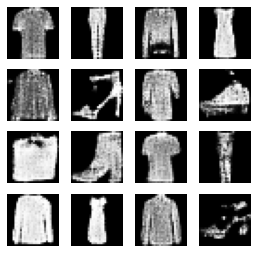

35600: [discriminator loss: 0.679880, acc: 0.539062] [adversarial loss: 0.724346, acc: 0.390625]
35601: [discriminator loss: 0.693268, acc: 0.554688] [adversarial loss: 0.694162, acc: 0.500000]
35602: [discriminator loss: 0.680668, acc: 0.546875] [adversarial loss: 0.809693, acc: 0.312500]
35603: [discriminator loss: 0.712177, acc: 0.484375] [adversarial loss: 0.698685, acc: 0.437500]
35604: [discriminator loss: 0.664223, acc: 0.617188] [adversarial loss: 0.824813, acc: 0.250000]
35605: [discriminator loss: 0.685895, acc: 0.554688] [adversarial loss: 0.795476, acc: 0.234375]
35606: [discriminator loss: 0.666756, acc: 0.585938] [adversarial loss: 0.636849, acc: 0.750000]
35607: [discriminator loss: 0.683275, acc: 0.515625] [adversarial loss: 0.811364, acc: 0.156250]
35608: [discriminator loss: 0.670109, acc: 0.601562] [adversarial loss: 0.653061, acc: 0.656250]
35609: [discriminator loss: 0.680554, acc: 0.539062] [adversarial loss: 0.840990, acc: 0.062500]
35610: [discriminator loss: 0.

35688: [discriminator loss: 0.674726, acc: 0.617188] [adversarial loss: 0.701575, acc: 0.484375]
35689: [discriminator loss: 0.674079, acc: 0.593750] [adversarial loss: 0.676265, acc: 0.562500]
35690: [discriminator loss: 0.668017, acc: 0.593750] [adversarial loss: 0.755281, acc: 0.281250]
35691: [discriminator loss: 0.685161, acc: 0.570312] [adversarial loss: 0.692039, acc: 0.531250]
35692: [discriminator loss: 0.668725, acc: 0.539062] [adversarial loss: 0.810352, acc: 0.156250]
35693: [discriminator loss: 0.675439, acc: 0.585938] [adversarial loss: 0.649047, acc: 0.687500]
35694: [discriminator loss: 0.680107, acc: 0.515625] [adversarial loss: 0.874097, acc: 0.109375]
35695: [discriminator loss: 0.684184, acc: 0.515625] [adversarial loss: 0.630146, acc: 0.687500]
35696: [discriminator loss: 0.679340, acc: 0.531250] [adversarial loss: 0.760686, acc: 0.421875]
35697: [discriminator loss: 0.670272, acc: 0.593750] [adversarial loss: 0.688366, acc: 0.531250]
35698: [discriminator loss: 0.

35777: [discriminator loss: 0.678233, acc: 0.593750] [adversarial loss: 0.703775, acc: 0.359375]
35778: [discriminator loss: 0.691928, acc: 0.500000] [adversarial loss: 0.765718, acc: 0.328125]
35779: [discriminator loss: 0.670802, acc: 0.546875] [adversarial loss: 0.748069, acc: 0.390625]
35780: [discriminator loss: 0.682474, acc: 0.539062] [adversarial loss: 0.586262, acc: 0.875000]
35781: [discriminator loss: 0.718074, acc: 0.515625] [adversarial loss: 0.887282, acc: 0.125000]
35782: [discriminator loss: 0.692880, acc: 0.570312] [adversarial loss: 0.629043, acc: 0.828125]
35783: [discriminator loss: 0.663575, acc: 0.585938] [adversarial loss: 0.707096, acc: 0.484375]
35784: [discriminator loss: 0.669966, acc: 0.570312] [adversarial loss: 0.772476, acc: 0.250000]
35785: [discriminator loss: 0.688707, acc: 0.546875] [adversarial loss: 0.709733, acc: 0.500000]
35786: [discriminator loss: 0.695391, acc: 0.468750] [adversarial loss: 0.787088, acc: 0.265625]
35787: [discriminator loss: 0.

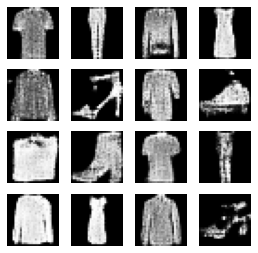

35800: [discriminator loss: 0.673184, acc: 0.562500] [adversarial loss: 0.779521, acc: 0.328125]
35801: [discriminator loss: 0.700830, acc: 0.523438] [adversarial loss: 0.661648, acc: 0.671875]
35802: [discriminator loss: 0.680652, acc: 0.531250] [adversarial loss: 0.816919, acc: 0.234375]
35803: [discriminator loss: 0.671646, acc: 0.578125] [adversarial loss: 0.747596, acc: 0.312500]
35804: [discriminator loss: 0.675344, acc: 0.570312] [adversarial loss: 0.748478, acc: 0.359375]
35805: [discriminator loss: 0.695831, acc: 0.539062] [adversarial loss: 0.708093, acc: 0.468750]
35806: [discriminator loss: 0.681734, acc: 0.601562] [adversarial loss: 0.751341, acc: 0.375000]
35807: [discriminator loss: 0.685884, acc: 0.546875] [adversarial loss: 0.720411, acc: 0.437500]
35808: [discriminator loss: 0.672846, acc: 0.578125] [adversarial loss: 0.724263, acc: 0.453125]
35809: [discriminator loss: 0.671845, acc: 0.601562] [adversarial loss: 0.730935, acc: 0.296875]
35810: [discriminator loss: 0.

35888: [discriminator loss: 0.674126, acc: 0.570312] [adversarial loss: 0.731907, acc: 0.406250]
35889: [discriminator loss: 0.663014, acc: 0.617188] [adversarial loss: 0.729174, acc: 0.515625]
35890: [discriminator loss: 0.729792, acc: 0.453125] [adversarial loss: 0.831926, acc: 0.093750]
35891: [discriminator loss: 0.685794, acc: 0.546875] [adversarial loss: 0.621222, acc: 0.750000]
35892: [discriminator loss: 0.692150, acc: 0.468750] [adversarial loss: 0.766676, acc: 0.250000]
35893: [discriminator loss: 0.678417, acc: 0.554688] [adversarial loss: 0.682769, acc: 0.609375]
35894: [discriminator loss: 0.684135, acc: 0.570312] [adversarial loss: 0.802935, acc: 0.156250]
35895: [discriminator loss: 0.671919, acc: 0.648438] [adversarial loss: 0.779797, acc: 0.312500]
35896: [discriminator loss: 0.686470, acc: 0.609375] [adversarial loss: 0.698545, acc: 0.515625]
35897: [discriminator loss: 0.693100, acc: 0.531250] [adversarial loss: 0.708792, acc: 0.453125]
35898: [discriminator loss: 0.

35973: [discriminator loss: 0.683031, acc: 0.531250] [adversarial loss: 0.727441, acc: 0.531250]
35974: [discriminator loss: 0.691364, acc: 0.515625] [adversarial loss: 0.735683, acc: 0.406250]
35975: [discriminator loss: 0.674350, acc: 0.578125] [adversarial loss: 0.824584, acc: 0.140625]
35976: [discriminator loss: 0.660833, acc: 0.601562] [adversarial loss: 0.720972, acc: 0.500000]
35977: [discriminator loss: 0.698667, acc: 0.539062] [adversarial loss: 0.762728, acc: 0.343750]
35978: [discriminator loss: 0.682630, acc: 0.531250] [adversarial loss: 0.729389, acc: 0.484375]
35979: [discriminator loss: 0.714294, acc: 0.460938] [adversarial loss: 0.748078, acc: 0.375000]
35980: [discriminator loss: 0.689951, acc: 0.554688] [adversarial loss: 0.793053, acc: 0.171875]
35981: [discriminator loss: 0.698612, acc: 0.554688] [adversarial loss: 0.687402, acc: 0.609375]
35982: [discriminator loss: 0.684205, acc: 0.570312] [adversarial loss: 0.700708, acc: 0.453125]
35983: [discriminator loss: 0.

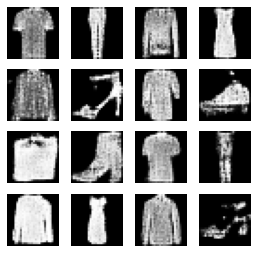

36000: [discriminator loss: 0.668246, acc: 0.593750] [adversarial loss: 0.727978, acc: 0.375000]
36001: [discriminator loss: 0.661398, acc: 0.593750] [adversarial loss: 0.758614, acc: 0.312500]
36002: [discriminator loss: 0.679337, acc: 0.515625] [adversarial loss: 0.700500, acc: 0.453125]
36003: [discriminator loss: 0.706125, acc: 0.468750] [adversarial loss: 0.826759, acc: 0.109375]
36004: [discriminator loss: 0.673850, acc: 0.546875] [adversarial loss: 0.713672, acc: 0.421875]
36005: [discriminator loss: 0.680398, acc: 0.531250] [adversarial loss: 0.783752, acc: 0.203125]
36006: [discriminator loss: 0.682198, acc: 0.632812] [adversarial loss: 0.688676, acc: 0.515625]
36007: [discriminator loss: 0.690903, acc: 0.507812] [adversarial loss: 0.743470, acc: 0.312500]
36008: [discriminator loss: 0.701394, acc: 0.507812] [adversarial loss: 0.661781, acc: 0.562500]
36009: [discriminator loss: 0.691323, acc: 0.492188] [adversarial loss: 0.879372, acc: 0.093750]
36010: [discriminator loss: 0.

36085: [discriminator loss: 0.678221, acc: 0.570312] [adversarial loss: 0.716622, acc: 0.453125]
36086: [discriminator loss: 0.675737, acc: 0.609375] [adversarial loss: 0.762256, acc: 0.250000]
36087: [discriminator loss: 0.663244, acc: 0.632812] [adversarial loss: 0.750766, acc: 0.421875]
36088: [discriminator loss: 0.658094, acc: 0.625000] [adversarial loss: 0.718230, acc: 0.421875]
36089: [discriminator loss: 0.681544, acc: 0.523438] [adversarial loss: 0.775273, acc: 0.281250]
36090: [discriminator loss: 0.690553, acc: 0.570312] [adversarial loss: 0.676076, acc: 0.562500]
36091: [discriminator loss: 0.692165, acc: 0.523438] [adversarial loss: 0.836019, acc: 0.125000]
36092: [discriminator loss: 0.694613, acc: 0.523438] [adversarial loss: 0.621388, acc: 0.765625]
36093: [discriminator loss: 0.672895, acc: 0.531250] [adversarial loss: 0.764336, acc: 0.281250]
36094: [discriminator loss: 0.682822, acc: 0.523438] [adversarial loss: 0.626813, acc: 0.734375]
36095: [discriminator loss: 0.

36173: [discriminator loss: 0.670414, acc: 0.585938] [adversarial loss: 0.834130, acc: 0.109375]
36174: [discriminator loss: 0.684881, acc: 0.515625] [adversarial loss: 0.628442, acc: 0.796875]
36175: [discriminator loss: 0.672814, acc: 0.585938] [adversarial loss: 0.718560, acc: 0.421875]
36176: [discriminator loss: 0.687660, acc: 0.507812] [adversarial loss: 0.757046, acc: 0.328125]
36177: [discriminator loss: 0.671639, acc: 0.578125] [adversarial loss: 0.714460, acc: 0.468750]
36178: [discriminator loss: 0.686764, acc: 0.507812] [adversarial loss: 0.623412, acc: 0.781250]
36179: [discriminator loss: 0.690913, acc: 0.507812] [adversarial loss: 0.827972, acc: 0.093750]
36180: [discriminator loss: 0.670390, acc: 0.609375] [adversarial loss: 0.614395, acc: 0.734375]
36181: [discriminator loss: 0.695153, acc: 0.562500] [adversarial loss: 0.777608, acc: 0.343750]
36182: [discriminator loss: 0.687823, acc: 0.523438] [adversarial loss: 0.668429, acc: 0.546875]
36183: [discriminator loss: 0.

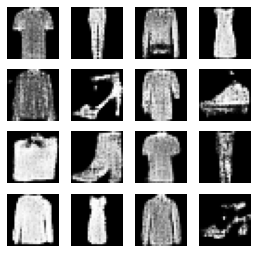

36200: [discriminator loss: 0.689671, acc: 0.523438] [adversarial loss: 0.632880, acc: 0.703125]
36201: [discriminator loss: 0.683698, acc: 0.492188] [adversarial loss: 0.823451, acc: 0.093750]
36202: [discriminator loss: 0.673105, acc: 0.625000] [adversarial loss: 0.718005, acc: 0.468750]
36203: [discriminator loss: 0.671851, acc: 0.585938] [adversarial loss: 0.737558, acc: 0.359375]
36204: [discriminator loss: 0.675649, acc: 0.546875] [adversarial loss: 0.715367, acc: 0.515625]
36205: [discriminator loss: 0.667462, acc: 0.578125] [adversarial loss: 0.696048, acc: 0.453125]
36206: [discriminator loss: 0.667214, acc: 0.625000] [adversarial loss: 0.675946, acc: 0.546875]
36207: [discriminator loss: 0.682976, acc: 0.523438] [adversarial loss: 0.753478, acc: 0.343750]
36208: [discriminator loss: 0.693813, acc: 0.507812] [adversarial loss: 0.744425, acc: 0.359375]
36209: [discriminator loss: 0.696452, acc: 0.539062] [adversarial loss: 0.791700, acc: 0.250000]
36210: [discriminator loss: 0.

36287: [discriminator loss: 0.668349, acc: 0.617188] [adversarial loss: 0.734119, acc: 0.328125]
36288: [discriminator loss: 0.666735, acc: 0.562500] [adversarial loss: 0.753504, acc: 0.265625]
36289: [discriminator loss: 0.704361, acc: 0.539062] [adversarial loss: 0.677075, acc: 0.484375]
36290: [discriminator loss: 0.681878, acc: 0.539062] [adversarial loss: 0.691351, acc: 0.500000]
36291: [discriminator loss: 0.695765, acc: 0.570312] [adversarial loss: 0.756110, acc: 0.328125]
36292: [discriminator loss: 0.707132, acc: 0.476562] [adversarial loss: 0.661016, acc: 0.703125]
36293: [discriminator loss: 0.683341, acc: 0.578125] [adversarial loss: 0.853647, acc: 0.156250]
36294: [discriminator loss: 0.657249, acc: 0.601562] [adversarial loss: 0.575292, acc: 0.750000]
36295: [discriminator loss: 0.685092, acc: 0.546875] [adversarial loss: 0.846253, acc: 0.250000]
36296: [discriminator loss: 0.699862, acc: 0.562500] [adversarial loss: 0.673129, acc: 0.687500]
36297: [discriminator loss: 0.

36373: [discriminator loss: 0.675734, acc: 0.546875] [adversarial loss: 0.719527, acc: 0.468750]
36374: [discriminator loss: 0.674587, acc: 0.570312] [adversarial loss: 0.692793, acc: 0.484375]
36375: [discriminator loss: 0.674173, acc: 0.593750] [adversarial loss: 0.791371, acc: 0.250000]
36376: [discriminator loss: 0.691343, acc: 0.523438] [adversarial loss: 0.704993, acc: 0.437500]
36377: [discriminator loss: 0.683351, acc: 0.507812] [adversarial loss: 0.741851, acc: 0.343750]
36378: [discriminator loss: 0.669623, acc: 0.578125] [adversarial loss: 0.757580, acc: 0.375000]
36379: [discriminator loss: 0.679236, acc: 0.531250] [adversarial loss: 0.795128, acc: 0.171875]
36380: [discriminator loss: 0.690724, acc: 0.484375] [adversarial loss: 0.677746, acc: 0.515625]
36381: [discriminator loss: 0.698863, acc: 0.515625] [adversarial loss: 0.760178, acc: 0.281250]
36382: [discriminator loss: 0.683918, acc: 0.578125] [adversarial loss: 0.639755, acc: 0.671875]
36383: [discriminator loss: 0.

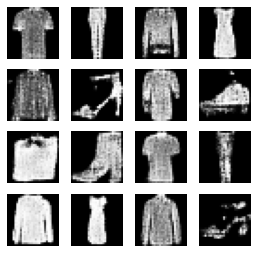

36400: [discriminator loss: 0.687258, acc: 0.515625] [adversarial loss: 0.706162, acc: 0.437500]
36401: [discriminator loss: 0.689886, acc: 0.554688] [adversarial loss: 0.766415, acc: 0.234375]
36402: [discriminator loss: 0.684178, acc: 0.593750] [adversarial loss: 0.698931, acc: 0.453125]
36403: [discriminator loss: 0.679599, acc: 0.562500] [adversarial loss: 0.724270, acc: 0.421875]
36404: [discriminator loss: 0.682314, acc: 0.562500] [adversarial loss: 0.672050, acc: 0.640625]
36405: [discriminator loss: 0.660151, acc: 0.531250] [adversarial loss: 0.775189, acc: 0.312500]
36406: [discriminator loss: 0.691521, acc: 0.554688] [adversarial loss: 0.671649, acc: 0.609375]
36407: [discriminator loss: 0.677163, acc: 0.546875] [adversarial loss: 0.723734, acc: 0.343750]
36408: [discriminator loss: 0.677406, acc: 0.585938] [adversarial loss: 0.737750, acc: 0.375000]
36409: [discriminator loss: 0.675805, acc: 0.515625] [adversarial loss: 0.692484, acc: 0.531250]
36410: [discriminator loss: 0.

36489: [discriminator loss: 0.708467, acc: 0.523438] [adversarial loss: 0.713511, acc: 0.468750]
36490: [discriminator loss: 0.688872, acc: 0.531250] [adversarial loss: 0.790725, acc: 0.250000]
36491: [discriminator loss: 0.693057, acc: 0.539062] [adversarial loss: 0.605451, acc: 0.828125]
36492: [discriminator loss: 0.684366, acc: 0.531250] [adversarial loss: 0.776556, acc: 0.203125]
36493: [discriminator loss: 0.655861, acc: 0.617188] [adversarial loss: 0.754342, acc: 0.375000]
36494: [discriminator loss: 0.672323, acc: 0.601562] [adversarial loss: 0.677479, acc: 0.671875]
36495: [discriminator loss: 0.688725, acc: 0.468750] [adversarial loss: 0.705834, acc: 0.421875]
36496: [discriminator loss: 0.683616, acc: 0.554688] [adversarial loss: 0.743449, acc: 0.296875]
36497: [discriminator loss: 0.674634, acc: 0.601562] [adversarial loss: 0.733366, acc: 0.312500]
36498: [discriminator loss: 0.666649, acc: 0.609375] [adversarial loss: 0.701243, acc: 0.500000]
36499: [discriminator loss: 0.

36577: [discriminator loss: 0.682943, acc: 0.578125] [adversarial loss: 0.714041, acc: 0.468750]
36578: [discriminator loss: 0.685570, acc: 0.484375] [adversarial loss: 0.803350, acc: 0.203125]
36579: [discriminator loss: 0.671322, acc: 0.585938] [adversarial loss: 0.676305, acc: 0.531250]
36580: [discriminator loss: 0.685194, acc: 0.554688] [adversarial loss: 0.807131, acc: 0.187500]
36581: [discriminator loss: 0.693165, acc: 0.507812] [adversarial loss: 0.667081, acc: 0.640625]
36582: [discriminator loss: 0.677560, acc: 0.585938] [adversarial loss: 0.755658, acc: 0.234375]
36583: [discriminator loss: 0.682764, acc: 0.617188] [adversarial loss: 0.690483, acc: 0.515625]
36584: [discriminator loss: 0.679943, acc: 0.539062] [adversarial loss: 0.772861, acc: 0.281250]
36585: [discriminator loss: 0.694229, acc: 0.546875] [adversarial loss: 0.665331, acc: 0.656250]
36586: [discriminator loss: 0.679457, acc: 0.554688] [adversarial loss: 0.801367, acc: 0.109375]
36587: [discriminator loss: 0.

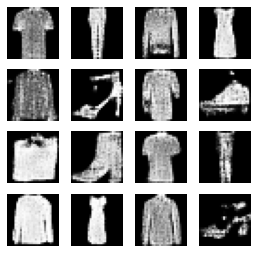

36600: [discriminator loss: 0.677313, acc: 0.554688] [adversarial loss: 0.742814, acc: 0.343750]
36601: [discriminator loss: 0.680534, acc: 0.562500] [adversarial loss: 0.759878, acc: 0.328125]
36602: [discriminator loss: 0.690360, acc: 0.546875] [adversarial loss: 0.746456, acc: 0.343750]
36603: [discriminator loss: 0.682027, acc: 0.578125] [adversarial loss: 0.738710, acc: 0.328125]
36604: [discriminator loss: 0.695525, acc: 0.500000] [adversarial loss: 0.746572, acc: 0.421875]
36605: [discriminator loss: 0.679613, acc: 0.531250] [adversarial loss: 0.638993, acc: 0.750000]
36606: [discriminator loss: 0.662126, acc: 0.554688] [adversarial loss: 0.737470, acc: 0.406250]
36607: [discriminator loss: 0.695686, acc: 0.523438] [adversarial loss: 0.703999, acc: 0.500000]
36608: [discriminator loss: 0.658329, acc: 0.640625] [adversarial loss: 0.722207, acc: 0.500000]
36609: [discriminator loss: 0.668981, acc: 0.562500] [adversarial loss: 0.684193, acc: 0.515625]
36610: [discriminator loss: 0.

36689: [discriminator loss: 0.679313, acc: 0.617188] [adversarial loss: 0.706233, acc: 0.437500]
36690: [discriminator loss: 0.686146, acc: 0.515625] [adversarial loss: 0.779322, acc: 0.296875]
36691: [discriminator loss: 0.686349, acc: 0.539062] [adversarial loss: 0.709149, acc: 0.468750]
36692: [discriminator loss: 0.672852, acc: 0.593750] [adversarial loss: 0.780545, acc: 0.234375]
36693: [discriminator loss: 0.684487, acc: 0.570312] [adversarial loss: 0.719416, acc: 0.468750]
36694: [discriminator loss: 0.673337, acc: 0.609375] [adversarial loss: 0.762103, acc: 0.296875]
36695: [discriminator loss: 0.681796, acc: 0.570312] [adversarial loss: 0.647900, acc: 0.671875]
36696: [discriminator loss: 0.676876, acc: 0.554688] [adversarial loss: 0.692331, acc: 0.484375]
36697: [discriminator loss: 0.687082, acc: 0.554688] [adversarial loss: 0.762840, acc: 0.281250]
36698: [discriminator loss: 0.684084, acc: 0.562500] [adversarial loss: 0.685197, acc: 0.500000]
36699: [discriminator loss: 0.

36776: [discriminator loss: 0.660064, acc: 0.570312] [adversarial loss: 0.746651, acc: 0.312500]
36777: [discriminator loss: 0.694536, acc: 0.546875] [adversarial loss: 0.775196, acc: 0.312500]
36778: [discriminator loss: 0.699351, acc: 0.539062] [adversarial loss: 0.691137, acc: 0.515625]
36779: [discriminator loss: 0.665175, acc: 0.593750] [adversarial loss: 0.773366, acc: 0.265625]
36780: [discriminator loss: 0.681925, acc: 0.593750] [adversarial loss: 0.657570, acc: 0.640625]
36781: [discriminator loss: 0.679023, acc: 0.554688] [adversarial loss: 0.780077, acc: 0.171875]
36782: [discriminator loss: 0.679224, acc: 0.585938] [adversarial loss: 0.692864, acc: 0.468750]
36783: [discriminator loss: 0.680810, acc: 0.617188] [adversarial loss: 0.743189, acc: 0.390625]
36784: [discriminator loss: 0.671418, acc: 0.593750] [adversarial loss: 0.778660, acc: 0.203125]
36785: [discriminator loss: 0.663822, acc: 0.578125] [adversarial loss: 0.655715, acc: 0.609375]
36786: [discriminator loss: 0.

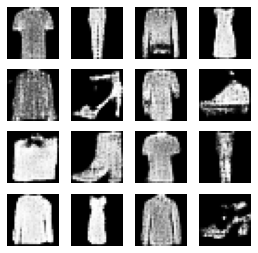

36800: [discriminator loss: 0.737576, acc: 0.437500] [adversarial loss: 0.767100, acc: 0.296875]
36801: [discriminator loss: 0.671223, acc: 0.523438] [adversarial loss: 0.753938, acc: 0.390625]
36802: [discriminator loss: 0.679205, acc: 0.531250] [adversarial loss: 0.747899, acc: 0.312500]
36803: [discriminator loss: 0.651956, acc: 0.656250] [adversarial loss: 0.760641, acc: 0.281250]
36804: [discriminator loss: 0.683163, acc: 0.531250] [adversarial loss: 0.738437, acc: 0.390625]
36805: [discriminator loss: 0.676598, acc: 0.601562] [adversarial loss: 0.861193, acc: 0.125000]
36806: [discriminator loss: 0.679188, acc: 0.523438] [adversarial loss: 0.656457, acc: 0.593750]
36807: [discriminator loss: 0.663121, acc: 0.578125] [adversarial loss: 0.834304, acc: 0.156250]
36808: [discriminator loss: 0.670374, acc: 0.609375] [adversarial loss: 0.654868, acc: 0.625000]
36809: [discriminator loss: 0.665238, acc: 0.609375] [adversarial loss: 0.737432, acc: 0.375000]
36810: [discriminator loss: 0.

36887: [discriminator loss: 0.672447, acc: 0.562500] [adversarial loss: 0.772451, acc: 0.328125]
36888: [discriminator loss: 0.673354, acc: 0.609375] [adversarial loss: 0.757893, acc: 0.406250]
36889: [discriminator loss: 0.698366, acc: 0.578125] [adversarial loss: 0.779127, acc: 0.281250]
36890: [discriminator loss: 0.689909, acc: 0.507812] [adversarial loss: 0.763001, acc: 0.359375]
36891: [discriminator loss: 0.666007, acc: 0.578125] [adversarial loss: 0.689282, acc: 0.515625]
36892: [discriminator loss: 0.657429, acc: 0.625000] [adversarial loss: 0.781933, acc: 0.281250]
36893: [discriminator loss: 0.655630, acc: 0.640625] [adversarial loss: 0.775699, acc: 0.281250]
36894: [discriminator loss: 0.687154, acc: 0.601562] [adversarial loss: 0.603633, acc: 0.828125]
36895: [discriminator loss: 0.669955, acc: 0.515625] [adversarial loss: 0.851313, acc: 0.171875]
36896: [discriminator loss: 0.675174, acc: 0.570312] [adversarial loss: 0.632286, acc: 0.687500]
36897: [discriminator loss: 0.

36974: [discriminator loss: 0.678608, acc: 0.570312] [adversarial loss: 0.714682, acc: 0.578125]
36975: [discriminator loss: 0.679210, acc: 0.585938] [adversarial loss: 0.716802, acc: 0.500000]
36976: [discriminator loss: 0.676974, acc: 0.539062] [adversarial loss: 0.751409, acc: 0.234375]
36977: [discriminator loss: 0.677842, acc: 0.578125] [adversarial loss: 0.755766, acc: 0.265625]
36978: [discriminator loss: 0.666201, acc: 0.640625] [adversarial loss: 0.674600, acc: 0.578125]
36979: [discriminator loss: 0.702624, acc: 0.531250] [adversarial loss: 0.818957, acc: 0.156250]
36980: [discriminator loss: 0.696883, acc: 0.554688] [adversarial loss: 0.664252, acc: 0.656250]
36981: [discriminator loss: 0.674543, acc: 0.531250] [adversarial loss: 0.804600, acc: 0.203125]
36982: [discriminator loss: 0.678059, acc: 0.609375] [adversarial loss: 0.721073, acc: 0.359375]
36983: [discriminator loss: 0.680925, acc: 0.546875] [adversarial loss: 0.734732, acc: 0.343750]
36984: [discriminator loss: 0.

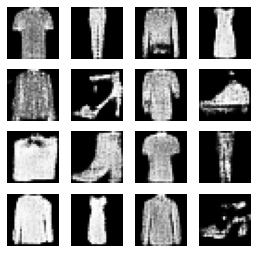

37000: [discriminator loss: 0.698467, acc: 0.554688] [adversarial loss: 0.728724, acc: 0.312500]
37001: [discriminator loss: 0.687557, acc: 0.515625] [adversarial loss: 0.774937, acc: 0.187500]
37002: [discriminator loss: 0.678237, acc: 0.585938] [adversarial loss: 0.629813, acc: 0.687500]
37003: [discriminator loss: 0.688400, acc: 0.523438] [adversarial loss: 0.785997, acc: 0.218750]
37004: [discriminator loss: 0.670620, acc: 0.585938] [adversarial loss: 0.697101, acc: 0.593750]
37005: [discriminator loss: 0.679389, acc: 0.523438] [adversarial loss: 0.776784, acc: 0.171875]
37006: [discriminator loss: 0.683238, acc: 0.593750] [adversarial loss: 0.731476, acc: 0.453125]
37007: [discriminator loss: 0.673453, acc: 0.609375] [adversarial loss: 0.746513, acc: 0.343750]
37008: [discriminator loss: 0.679614, acc: 0.585938] [adversarial loss: 0.712989, acc: 0.515625]
37009: [discriminator loss: 0.658217, acc: 0.640625] [adversarial loss: 0.683108, acc: 0.609375]
37010: [discriminator loss: 0.

37089: [discriminator loss: 0.696042, acc: 0.531250] [adversarial loss: 0.693371, acc: 0.546875]
37090: [discriminator loss: 0.674762, acc: 0.507812] [adversarial loss: 0.799011, acc: 0.171875]
37091: [discriminator loss: 0.671472, acc: 0.593750] [adversarial loss: 0.638021, acc: 0.734375]
37092: [discriminator loss: 0.671591, acc: 0.507812] [adversarial loss: 0.754391, acc: 0.234375]
37093: [discriminator loss: 0.674761, acc: 0.554688] [adversarial loss: 0.722904, acc: 0.359375]
37094: [discriminator loss: 0.683067, acc: 0.539062] [adversarial loss: 0.686557, acc: 0.500000]
37095: [discriminator loss: 0.666284, acc: 0.585938] [adversarial loss: 0.768185, acc: 0.296875]
37096: [discriminator loss: 0.690583, acc: 0.531250] [adversarial loss: 0.685899, acc: 0.531250]
37097: [discriminator loss: 0.669863, acc: 0.601562] [adversarial loss: 0.691483, acc: 0.500000]
37098: [discriminator loss: 0.692784, acc: 0.546875] [adversarial loss: 0.703481, acc: 0.484375]
37099: [discriminator loss: 0.

37178: [discriminator loss: 0.683545, acc: 0.593750] [adversarial loss: 0.627854, acc: 0.625000]
37179: [discriminator loss: 0.702555, acc: 0.523438] [adversarial loss: 0.787343, acc: 0.156250]
37180: [discriminator loss: 0.680762, acc: 0.601562] [adversarial loss: 0.646467, acc: 0.703125]
37181: [discriminator loss: 0.690522, acc: 0.546875] [adversarial loss: 0.793007, acc: 0.171875]
37182: [discriminator loss: 0.683942, acc: 0.531250] [adversarial loss: 0.680230, acc: 0.531250]
37183: [discriminator loss: 0.687742, acc: 0.523438] [adversarial loss: 0.750656, acc: 0.375000]
37184: [discriminator loss: 0.679045, acc: 0.554688] [adversarial loss: 0.656041, acc: 0.609375]
37185: [discriminator loss: 0.659937, acc: 0.609375] [adversarial loss: 0.707972, acc: 0.359375]
37186: [discriminator loss: 0.694431, acc: 0.492188] [adversarial loss: 0.862495, acc: 0.109375]
37187: [discriminator loss: 0.688848, acc: 0.562500] [adversarial loss: 0.717238, acc: 0.375000]
37188: [discriminator loss: 0.

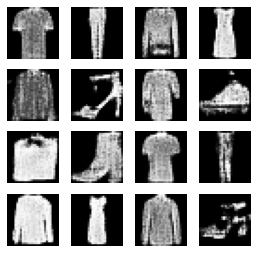

37200: [discriminator loss: 0.691278, acc: 0.515625] [adversarial loss: 0.789909, acc: 0.250000]
37201: [discriminator loss: 0.680484, acc: 0.492188] [adversarial loss: 0.712471, acc: 0.406250]
37202: [discriminator loss: 0.660164, acc: 0.578125] [adversarial loss: 0.794521, acc: 0.390625]
37203: [discriminator loss: 0.683651, acc: 0.507812] [adversarial loss: 0.801245, acc: 0.218750]
37204: [discriminator loss: 0.689314, acc: 0.570312] [adversarial loss: 0.772528, acc: 0.234375]
37205: [discriminator loss: 0.679602, acc: 0.578125] [adversarial loss: 0.676179, acc: 0.531250]
37206: [discriminator loss: 0.709966, acc: 0.468750] [adversarial loss: 0.860266, acc: 0.093750]
37207: [discriminator loss: 0.707370, acc: 0.484375] [adversarial loss: 0.649756, acc: 0.578125]
37208: [discriminator loss: 0.662452, acc: 0.578125] [adversarial loss: 0.764071, acc: 0.375000]
37209: [discriminator loss: 0.697968, acc: 0.515625] [adversarial loss: 0.642762, acc: 0.671875]
37210: [discriminator loss: 0.

37285: [discriminator loss: 0.690429, acc: 0.539062] [adversarial loss: 0.691016, acc: 0.531250]
37286: [discriminator loss: 0.675101, acc: 0.585938] [adversarial loss: 0.720749, acc: 0.375000]
37287: [discriminator loss: 0.694815, acc: 0.492188] [adversarial loss: 0.761258, acc: 0.218750]
37288: [discriminator loss: 0.682038, acc: 0.562500] [adversarial loss: 0.723083, acc: 0.359375]
37289: [discriminator loss: 0.676441, acc: 0.507812] [adversarial loss: 0.746047, acc: 0.390625]
37290: [discriminator loss: 0.672552, acc: 0.554688] [adversarial loss: 0.664400, acc: 0.546875]
37291: [discriminator loss: 0.685381, acc: 0.554688] [adversarial loss: 0.798945, acc: 0.265625]
37292: [discriminator loss: 0.697940, acc: 0.546875] [adversarial loss: 0.689236, acc: 0.531250]
37293: [discriminator loss: 0.675318, acc: 0.570312] [adversarial loss: 0.768197, acc: 0.187500]
37294: [discriminator loss: 0.676040, acc: 0.578125] [adversarial loss: 0.629811, acc: 0.718750]
37295: [discriminator loss: 0.

37373: [discriminator loss: 0.682621, acc: 0.554688] [adversarial loss: 0.796689, acc: 0.203125]
37374: [discriminator loss: 0.671022, acc: 0.554688] [adversarial loss: 0.655460, acc: 0.625000]
37375: [discriminator loss: 0.691538, acc: 0.539062] [adversarial loss: 0.729716, acc: 0.406250]
37376: [discriminator loss: 0.708125, acc: 0.539062] [adversarial loss: 0.743472, acc: 0.343750]
37377: [discriminator loss: 0.685854, acc: 0.523438] [adversarial loss: 0.766516, acc: 0.265625]
37378: [discriminator loss: 0.683867, acc: 0.546875] [adversarial loss: 0.697555, acc: 0.546875]
37379: [discriminator loss: 0.691740, acc: 0.500000] [adversarial loss: 0.799190, acc: 0.234375]
37380: [discriminator loss: 0.694222, acc: 0.500000] [adversarial loss: 0.701492, acc: 0.500000]
37381: [discriminator loss: 0.690535, acc: 0.500000] [adversarial loss: 0.740301, acc: 0.406250]
37382: [discriminator loss: 0.682753, acc: 0.593750] [adversarial loss: 0.716401, acc: 0.359375]
37383: [discriminator loss: 0.

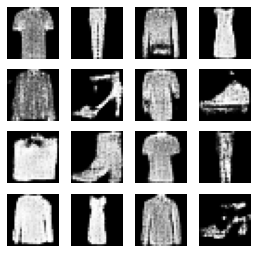

37400: [discriminator loss: 0.676626, acc: 0.585938] [adversarial loss: 0.775108, acc: 0.234375]
37401: [discriminator loss: 0.695786, acc: 0.523438] [adversarial loss: 0.760441, acc: 0.281250]
37402: [discriminator loss: 0.673098, acc: 0.578125] [adversarial loss: 0.641392, acc: 0.656250]
37403: [discriminator loss: 0.710945, acc: 0.414062] [adversarial loss: 0.868216, acc: 0.109375]
37404: [discriminator loss: 0.687027, acc: 0.546875] [adversarial loss: 0.666952, acc: 0.625000]
37405: [discriminator loss: 0.688938, acc: 0.507812] [adversarial loss: 0.771192, acc: 0.343750]
37406: [discriminator loss: 0.670935, acc: 0.539062] [adversarial loss: 0.728655, acc: 0.375000]
37407: [discriminator loss: 0.685792, acc: 0.601562] [adversarial loss: 0.723874, acc: 0.406250]
37408: [discriminator loss: 0.701311, acc: 0.468750] [adversarial loss: 0.769593, acc: 0.203125]
37409: [discriminator loss: 0.674357, acc: 0.585938] [adversarial loss: 0.688194, acc: 0.515625]
37410: [discriminator loss: 0.

37487: [discriminator loss: 0.668838, acc: 0.562500] [adversarial loss: 0.738666, acc: 0.281250]
37488: [discriminator loss: 0.684517, acc: 0.523438] [adversarial loss: 0.689269, acc: 0.406250]
37489: [discriminator loss: 0.706632, acc: 0.546875] [adversarial loss: 0.678074, acc: 0.500000]
37490: [discriminator loss: 0.685062, acc: 0.562500] [adversarial loss: 0.655359, acc: 0.609375]
37491: [discriminator loss: 0.696516, acc: 0.500000] [adversarial loss: 0.734814, acc: 0.328125]
37492: [discriminator loss: 0.659336, acc: 0.679688] [adversarial loss: 0.750854, acc: 0.421875]
37493: [discriminator loss: 0.678798, acc: 0.562500] [adversarial loss: 0.672621, acc: 0.578125]
37494: [discriminator loss: 0.666873, acc: 0.601562] [adversarial loss: 0.755746, acc: 0.406250]
37495: [discriminator loss: 0.679116, acc: 0.562500] [adversarial loss: 0.699261, acc: 0.453125]
37496: [discriminator loss: 0.690712, acc: 0.531250] [adversarial loss: 0.661406, acc: 0.703125]
37497: [discriminator loss: 0.

37573: [discriminator loss: 0.678840, acc: 0.585938] [adversarial loss: 0.724725, acc: 0.375000]
37574: [discriminator loss: 0.678801, acc: 0.625000] [adversarial loss: 0.763109, acc: 0.312500]
37575: [discriminator loss: 0.706351, acc: 0.562500] [adversarial loss: 0.789318, acc: 0.187500]
37576: [discriminator loss: 0.692651, acc: 0.554688] [adversarial loss: 0.687201, acc: 0.500000]
37577: [discriminator loss: 0.679007, acc: 0.570312] [adversarial loss: 0.841777, acc: 0.125000]
37578: [discriminator loss: 0.708411, acc: 0.546875] [adversarial loss: 0.633791, acc: 0.796875]
37579: [discriminator loss: 0.697559, acc: 0.445312] [adversarial loss: 0.823899, acc: 0.140625]
37580: [discriminator loss: 0.676736, acc: 0.578125] [adversarial loss: 0.661729, acc: 0.578125]
37581: [discriminator loss: 0.694099, acc: 0.523438] [adversarial loss: 0.758774, acc: 0.250000]
37582: [discriminator loss: 0.691213, acc: 0.531250] [adversarial loss: 0.789399, acc: 0.171875]
37583: [discriminator loss: 0.

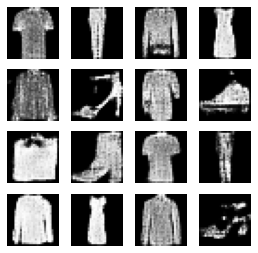

37600: [discriminator loss: 0.668510, acc: 0.593750] [adversarial loss: 0.735344, acc: 0.406250]
37601: [discriminator loss: 0.681747, acc: 0.593750] [adversarial loss: 0.748636, acc: 0.218750]
37602: [discriminator loss: 0.699639, acc: 0.531250] [adversarial loss: 0.746519, acc: 0.281250]
37603: [discriminator loss: 0.681718, acc: 0.515625] [adversarial loss: 0.632757, acc: 0.625000]
37604: [discriminator loss: 0.695825, acc: 0.531250] [adversarial loss: 0.860298, acc: 0.125000]
37605: [discriminator loss: 0.678137, acc: 0.554688] [adversarial loss: 0.671209, acc: 0.515625]
37606: [discriminator loss: 0.674164, acc: 0.570312] [adversarial loss: 0.771432, acc: 0.265625]
37607: [discriminator loss: 0.681079, acc: 0.570312] [adversarial loss: 0.733202, acc: 0.359375]
37608: [discriminator loss: 0.665711, acc: 0.609375] [adversarial loss: 0.695372, acc: 0.546875]
37609: [discriminator loss: 0.695336, acc: 0.484375] [adversarial loss: 0.755312, acc: 0.234375]
37610: [discriminator loss: 0.

37686: [discriminator loss: 0.670618, acc: 0.539062] [adversarial loss: 0.780489, acc: 0.250000]
37687: [discriminator loss: 0.674681, acc: 0.640625] [adversarial loss: 0.642733, acc: 0.703125]
37688: [discriminator loss: 0.693494, acc: 0.515625] [adversarial loss: 0.776264, acc: 0.218750]
37689: [discriminator loss: 0.686871, acc: 0.515625] [adversarial loss: 0.699533, acc: 0.453125]
37690: [discriminator loss: 0.667054, acc: 0.578125] [adversarial loss: 0.710349, acc: 0.437500]
37691: [discriminator loss: 0.664702, acc: 0.617188] [adversarial loss: 0.772049, acc: 0.296875]
37692: [discriminator loss: 0.673743, acc: 0.609375] [adversarial loss: 0.709133, acc: 0.406250]
37693: [discriminator loss: 0.674274, acc: 0.539062] [adversarial loss: 0.769858, acc: 0.296875]
37694: [discriminator loss: 0.684310, acc: 0.625000] [adversarial loss: 0.617549, acc: 0.750000]
37695: [discriminator loss: 0.693549, acc: 0.523438] [adversarial loss: 0.728781, acc: 0.406250]
37696: [discriminator loss: 0.

37773: [discriminator loss: 0.671355, acc: 0.562500] [adversarial loss: 0.821953, acc: 0.109375]
37774: [discriminator loss: 0.693702, acc: 0.523438] [adversarial loss: 0.628259, acc: 0.734375]
37775: [discriminator loss: 0.682296, acc: 0.539062] [adversarial loss: 0.728294, acc: 0.406250]
37776: [discriminator loss: 0.697594, acc: 0.500000] [adversarial loss: 0.766024, acc: 0.296875]
37777: [discriminator loss: 0.658261, acc: 0.609375] [adversarial loss: 0.838758, acc: 0.250000]
37778: [discriminator loss: 0.686423, acc: 0.539062] [adversarial loss: 0.626480, acc: 0.703125]
37779: [discriminator loss: 0.688933, acc: 0.539062] [adversarial loss: 0.774268, acc: 0.234375]
37780: [discriminator loss: 0.691475, acc: 0.546875] [adversarial loss: 0.652201, acc: 0.609375]
37781: [discriminator loss: 0.682426, acc: 0.554688] [adversarial loss: 0.701459, acc: 0.484375]
37782: [discriminator loss: 0.692028, acc: 0.523438] [adversarial loss: 0.824734, acc: 0.109375]
37783: [discriminator loss: 0.

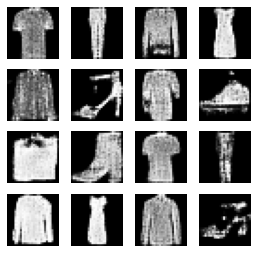

37800: [discriminator loss: 0.667006, acc: 0.554688] [adversarial loss: 0.673732, acc: 0.656250]
37801: [discriminator loss: 0.688711, acc: 0.500000] [adversarial loss: 0.734406, acc: 0.390625]
37802: [discriminator loss: 0.659100, acc: 0.609375] [adversarial loss: 0.748743, acc: 0.312500]
37803: [discriminator loss: 0.676316, acc: 0.609375] [adversarial loss: 0.731336, acc: 0.437500]
37804: [discriminator loss: 0.676822, acc: 0.546875] [adversarial loss: 0.626033, acc: 0.718750]
37805: [discriminator loss: 0.686722, acc: 0.500000] [adversarial loss: 0.749919, acc: 0.343750]
37806: [discriminator loss: 0.661176, acc: 0.671875] [adversarial loss: 0.697452, acc: 0.562500]
37807: [discriminator loss: 0.682562, acc: 0.554688] [adversarial loss: 0.781214, acc: 0.343750]
37808: [discriminator loss: 0.692816, acc: 0.539062] [adversarial loss: 0.685514, acc: 0.578125]
37809: [discriminator loss: 0.681327, acc: 0.523438] [adversarial loss: 0.706836, acc: 0.515625]
37810: [discriminator loss: 0.

37887: [discriminator loss: 0.698917, acc: 0.515625] [adversarial loss: 0.649651, acc: 0.656250]
37888: [discriminator loss: 0.687527, acc: 0.492188] [adversarial loss: 0.783339, acc: 0.250000]
37889: [discriminator loss: 0.690865, acc: 0.515625] [adversarial loss: 0.727072, acc: 0.437500]
37890: [discriminator loss: 0.682835, acc: 0.578125] [adversarial loss: 0.704416, acc: 0.546875]
37891: [discriminator loss: 0.695519, acc: 0.507812] [adversarial loss: 0.827471, acc: 0.250000]
37892: [discriminator loss: 0.700071, acc: 0.515625] [adversarial loss: 0.616266, acc: 0.750000]
37893: [discriminator loss: 0.679744, acc: 0.593750] [adversarial loss: 0.781773, acc: 0.296875]
37894: [discriminator loss: 0.696350, acc: 0.546875] [adversarial loss: 0.664465, acc: 0.625000]
37895: [discriminator loss: 0.684229, acc: 0.609375] [adversarial loss: 0.809762, acc: 0.156250]
37896: [discriminator loss: 0.685648, acc: 0.601562] [adversarial loss: 0.771745, acc: 0.296875]
37897: [discriminator loss: 0.

37976: [discriminator loss: 0.706404, acc: 0.429688] [adversarial loss: 0.737385, acc: 0.437500]
37977: [discriminator loss: 0.674571, acc: 0.570312] [adversarial loss: 0.745959, acc: 0.281250]
37978: [discriminator loss: 0.703634, acc: 0.531250] [adversarial loss: 0.704318, acc: 0.437500]
37979: [discriminator loss: 0.669870, acc: 0.585938] [adversarial loss: 0.693173, acc: 0.500000]
37980: [discriminator loss: 0.665645, acc: 0.546875] [adversarial loss: 0.704172, acc: 0.406250]
37981: [discriminator loss: 0.672611, acc: 0.585938] [adversarial loss: 0.763458, acc: 0.250000]
37982: [discriminator loss: 0.682252, acc: 0.562500] [adversarial loss: 0.750584, acc: 0.265625]
37983: [discriminator loss: 0.673463, acc: 0.585938] [adversarial loss: 0.630402, acc: 0.734375]
37984: [discriminator loss: 0.684015, acc: 0.515625] [adversarial loss: 0.696205, acc: 0.484375]
37985: [discriminator loss: 0.680882, acc: 0.554688] [adversarial loss: 0.786866, acc: 0.250000]
37986: [discriminator loss: 0.

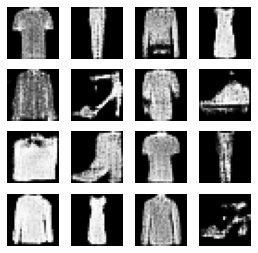

38000: [discriminator loss: 0.682885, acc: 0.523438] [adversarial loss: 0.886177, acc: 0.125000]
38001: [discriminator loss: 0.703073, acc: 0.570312] [adversarial loss: 0.614865, acc: 0.781250]
38002: [discriminator loss: 0.675065, acc: 0.554688] [adversarial loss: 0.766981, acc: 0.218750]
38003: [discriminator loss: 0.675225, acc: 0.593750] [adversarial loss: 0.691953, acc: 0.468750]
38004: [discriminator loss: 0.666975, acc: 0.562500] [adversarial loss: 0.747280, acc: 0.312500]
38005: [discriminator loss: 0.680512, acc: 0.531250] [adversarial loss: 0.688291, acc: 0.578125]
38006: [discriminator loss: 0.683852, acc: 0.539062] [adversarial loss: 0.748320, acc: 0.390625]
38007: [discriminator loss: 0.664505, acc: 0.585938] [adversarial loss: 0.695843, acc: 0.453125]
38008: [discriminator loss: 0.659382, acc: 0.601562] [adversarial loss: 0.722374, acc: 0.406250]
38009: [discriminator loss: 0.703404, acc: 0.523438] [adversarial loss: 0.820424, acc: 0.234375]
38010: [discriminator loss: 0.

38085: [discriminator loss: 0.686184, acc: 0.484375] [adversarial loss: 0.796981, acc: 0.265625]
38086: [discriminator loss: 0.673224, acc: 0.578125] [adversarial loss: 0.725204, acc: 0.437500]
38087: [discriminator loss: 0.689070, acc: 0.546875] [adversarial loss: 0.745168, acc: 0.328125]
38088: [discriminator loss: 0.679044, acc: 0.601562] [adversarial loss: 0.832273, acc: 0.140625]
38089: [discriminator loss: 0.698067, acc: 0.531250] [adversarial loss: 0.687846, acc: 0.546875]
38090: [discriminator loss: 0.690138, acc: 0.507812] [adversarial loss: 0.727466, acc: 0.406250]
38091: [discriminator loss: 0.682653, acc: 0.593750] [adversarial loss: 0.702304, acc: 0.500000]
38092: [discriminator loss: 0.674130, acc: 0.617188] [adversarial loss: 0.633215, acc: 0.703125]
38093: [discriminator loss: 0.683962, acc: 0.578125] [adversarial loss: 0.805288, acc: 0.187500]
38094: [discriminator loss: 0.686921, acc: 0.515625] [adversarial loss: 0.667236, acc: 0.562500]
38095: [discriminator loss: 0.

38171: [discriminator loss: 0.683595, acc: 0.609375] [adversarial loss: 0.721319, acc: 0.468750]
38172: [discriminator loss: 0.702041, acc: 0.531250] [adversarial loss: 0.779857, acc: 0.250000]
38173: [discriminator loss: 0.680990, acc: 0.625000] [adversarial loss: 0.790759, acc: 0.375000]
38174: [discriminator loss: 0.677921, acc: 0.562500] [adversarial loss: 0.725009, acc: 0.468750]
38175: [discriminator loss: 0.687482, acc: 0.507812] [adversarial loss: 0.779024, acc: 0.218750]
38176: [discriminator loss: 0.660627, acc: 0.648438] [adversarial loss: 0.723614, acc: 0.390625]
38177: [discriminator loss: 0.677934, acc: 0.585938] [adversarial loss: 0.724415, acc: 0.421875]
38178: [discriminator loss: 0.700925, acc: 0.531250] [adversarial loss: 0.752475, acc: 0.281250]
38179: [discriminator loss: 0.669432, acc: 0.593750] [adversarial loss: 0.683516, acc: 0.500000]
38180: [discriminator loss: 0.661737, acc: 0.617188] [adversarial loss: 0.726509, acc: 0.343750]
38181: [discriminator loss: 0.

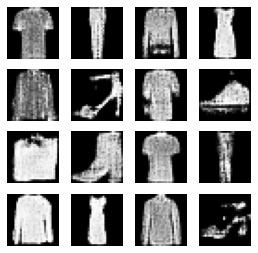

38200: [discriminator loss: 0.677790, acc: 0.585938] [adversarial loss: 0.787522, acc: 0.281250]
38201: [discriminator loss: 0.692637, acc: 0.523438] [adversarial loss: 0.697547, acc: 0.500000]
38202: [discriminator loss: 0.674751, acc: 0.554688] [adversarial loss: 0.709114, acc: 0.484375]
38203: [discriminator loss: 0.681548, acc: 0.593750] [adversarial loss: 0.743296, acc: 0.437500]
38204: [discriminator loss: 0.665924, acc: 0.609375] [adversarial loss: 0.694382, acc: 0.484375]
38205: [discriminator loss: 0.661481, acc: 0.609375] [adversarial loss: 0.808452, acc: 0.187500]
38206: [discriminator loss: 0.681466, acc: 0.562500] [adversarial loss: 0.708415, acc: 0.468750]
38207: [discriminator loss: 0.712797, acc: 0.484375] [adversarial loss: 0.652194, acc: 0.734375]
38208: [discriminator loss: 0.698019, acc: 0.468750] [adversarial loss: 0.735055, acc: 0.343750]
38209: [discriminator loss: 0.668498, acc: 0.593750] [adversarial loss: 0.700706, acc: 0.468750]
38210: [discriminator loss: 0.

38369: [discriminator loss: 0.671447, acc: 0.562500] [adversarial loss: 0.674372, acc: 0.578125]
38370: [discriminator loss: 0.670315, acc: 0.546875] [adversarial loss: 0.788602, acc: 0.281250]
38371: [discriminator loss: 0.681431, acc: 0.578125] [adversarial loss: 0.710935, acc: 0.468750]
38372: [discriminator loss: 0.665293, acc: 0.585938] [adversarial loss: 0.758167, acc: 0.328125]
38373: [discriminator loss: 0.700034, acc: 0.492188] [adversarial loss: 0.615521, acc: 0.750000]
38374: [discriminator loss: 0.689885, acc: 0.546875] [adversarial loss: 0.738269, acc: 0.359375]
38375: [discriminator loss: 0.680050, acc: 0.570312] [adversarial loss: 0.796410, acc: 0.328125]
38376: [discriminator loss: 0.712666, acc: 0.492188] [adversarial loss: 0.711881, acc: 0.484375]
38377: [discriminator loss: 0.675490, acc: 0.593750] [adversarial loss: 0.696754, acc: 0.421875]
38378: [discriminator loss: 0.692618, acc: 0.570312] [adversarial loss: 0.735930, acc: 0.375000]
38379: [discriminator loss: 0.

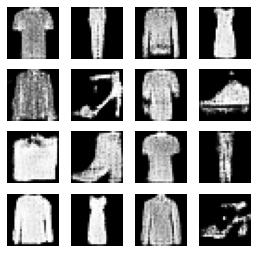

38400: [discriminator loss: 0.664087, acc: 0.570312] [adversarial loss: 0.856377, acc: 0.078125]
38401: [discriminator loss: 0.689928, acc: 0.570312] [adversarial loss: 0.644426, acc: 0.656250]
38402: [discriminator loss: 0.708177, acc: 0.468750] [adversarial loss: 0.872909, acc: 0.062500]
38403: [discriminator loss: 0.708169, acc: 0.484375] [adversarial loss: 0.689994, acc: 0.453125]
38404: [discriminator loss: 0.687803, acc: 0.515625] [adversarial loss: 0.749454, acc: 0.312500]
38405: [discriminator loss: 0.670854, acc: 0.617188] [adversarial loss: 0.791109, acc: 0.218750]
38406: [discriminator loss: 0.679962, acc: 0.601562] [adversarial loss: 0.688843, acc: 0.531250]
38407: [discriminator loss: 0.698743, acc: 0.492188] [adversarial loss: 0.793982, acc: 0.203125]
38408: [discriminator loss: 0.669837, acc: 0.601562] [adversarial loss: 0.667909, acc: 0.656250]
38409: [discriminator loss: 0.679138, acc: 0.562500] [adversarial loss: 0.735777, acc: 0.375000]
38410: [discriminator loss: 0.

38485: [discriminator loss: 0.673302, acc: 0.546875] [adversarial loss: 0.728056, acc: 0.437500]
38486: [discriminator loss: 0.682076, acc: 0.585938] [adversarial loss: 0.743340, acc: 0.406250]
38487: [discriminator loss: 0.688791, acc: 0.554688] [adversarial loss: 0.637766, acc: 0.718750]
38488: [discriminator loss: 0.674513, acc: 0.562500] [adversarial loss: 0.825870, acc: 0.109375]
38489: [discriminator loss: 0.681182, acc: 0.578125] [adversarial loss: 0.657717, acc: 0.734375]
38490: [discriminator loss: 0.686280, acc: 0.570312] [adversarial loss: 0.719212, acc: 0.468750]
38491: [discriminator loss: 0.671958, acc: 0.593750] [adversarial loss: 0.769958, acc: 0.281250]
38492: [discriminator loss: 0.668605, acc: 0.585938] [adversarial loss: 0.778194, acc: 0.359375]
38493: [discriminator loss: 0.694403, acc: 0.507812] [adversarial loss: 0.681244, acc: 0.484375]
38494: [discriminator loss: 0.683957, acc: 0.554688] [adversarial loss: 0.674723, acc: 0.515625]
38495: [discriminator loss: 0.

38571: [discriminator loss: 0.685340, acc: 0.523438] [adversarial loss: 0.753010, acc: 0.328125]
38572: [discriminator loss: 0.695136, acc: 0.531250] [adversarial loss: 0.683776, acc: 0.437500]
38573: [discriminator loss: 0.685381, acc: 0.507812] [adversarial loss: 0.795521, acc: 0.250000]
38574: [discriminator loss: 0.673404, acc: 0.570312] [adversarial loss: 0.734079, acc: 0.390625]
38575: [discriminator loss: 0.676946, acc: 0.546875] [adversarial loss: 0.748510, acc: 0.328125]
38576: [discriminator loss: 0.665778, acc: 0.601562] [adversarial loss: 0.746077, acc: 0.468750]
38577: [discriminator loss: 0.664981, acc: 0.609375] [adversarial loss: 0.781316, acc: 0.296875]
38578: [discriminator loss: 0.674143, acc: 0.570312] [adversarial loss: 0.721923, acc: 0.421875]
38579: [discriminator loss: 0.705228, acc: 0.468750] [adversarial loss: 0.750273, acc: 0.296875]
38580: [discriminator loss: 0.663924, acc: 0.601562] [adversarial loss: 0.661210, acc: 0.609375]
38581: [discriminator loss: 0.

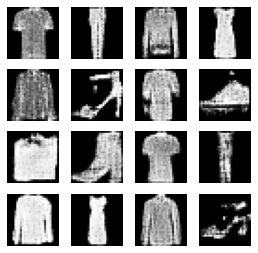

38600: [discriminator loss: 0.690260, acc: 0.523438] [adversarial loss: 0.741507, acc: 0.500000]
38601: [discriminator loss: 0.699785, acc: 0.531250] [adversarial loss: 0.627723, acc: 0.750000]
38602: [discriminator loss: 0.664334, acc: 0.554688] [adversarial loss: 0.829639, acc: 0.125000]
38603: [discriminator loss: 0.704883, acc: 0.515625] [adversarial loss: 0.656970, acc: 0.593750]
38604: [discriminator loss: 0.687907, acc: 0.585938] [adversarial loss: 0.788975, acc: 0.093750]
38605: [discriminator loss: 0.677594, acc: 0.609375] [adversarial loss: 0.677066, acc: 0.609375]
38606: [discriminator loss: 0.670533, acc: 0.546875] [adversarial loss: 0.778067, acc: 0.296875]
38607: [discriminator loss: 0.680596, acc: 0.539062] [adversarial loss: 0.726924, acc: 0.468750]
38608: [discriminator loss: 0.682832, acc: 0.546875] [adversarial loss: 0.822779, acc: 0.156250]
38609: [discriminator loss: 0.670844, acc: 0.585938] [adversarial loss: 0.704144, acc: 0.484375]
38610: [discriminator loss: 0.

38686: [discriminator loss: 0.680364, acc: 0.539062] [adversarial loss: 0.713526, acc: 0.562500]
38687: [discriminator loss: 0.684018, acc: 0.515625] [adversarial loss: 0.783275, acc: 0.171875]
38688: [discriminator loss: 0.677400, acc: 0.562500] [adversarial loss: 0.762085, acc: 0.250000]
38689: [discriminator loss: 0.684176, acc: 0.500000] [adversarial loss: 0.696645, acc: 0.515625]
38690: [discriminator loss: 0.675310, acc: 0.570312] [adversarial loss: 0.730377, acc: 0.343750]
38691: [discriminator loss: 0.675405, acc: 0.546875] [adversarial loss: 0.678335, acc: 0.546875]
38692: [discriminator loss: 0.696894, acc: 0.507812] [adversarial loss: 0.748504, acc: 0.250000]
38693: [discriminator loss: 0.672649, acc: 0.609375] [adversarial loss: 0.745116, acc: 0.328125]
38694: [discriminator loss: 0.675281, acc: 0.585938] [adversarial loss: 0.703523, acc: 0.468750]
38695: [discriminator loss: 0.671628, acc: 0.570312] [adversarial loss: 0.687161, acc: 0.578125]
38696: [discriminator loss: 0.

38772: [discriminator loss: 0.652723, acc: 0.578125] [adversarial loss: 0.778278, acc: 0.343750]
38773: [discriminator loss: 0.660741, acc: 0.648438] [adversarial loss: 0.711062, acc: 0.515625]
38774: [discriminator loss: 0.694830, acc: 0.468750] [adversarial loss: 0.739255, acc: 0.406250]
38775: [discriminator loss: 0.692275, acc: 0.507812] [adversarial loss: 0.665345, acc: 0.578125]
38776: [discriminator loss: 0.677200, acc: 0.570312] [adversarial loss: 0.759257, acc: 0.296875]
38777: [discriminator loss: 0.679392, acc: 0.570312] [adversarial loss: 0.730045, acc: 0.390625]
38778: [discriminator loss: 0.685027, acc: 0.562500] [adversarial loss: 0.652283, acc: 0.671875]
38779: [discriminator loss: 0.686021, acc: 0.492188] [adversarial loss: 0.839544, acc: 0.125000]
38780: [discriminator loss: 0.686222, acc: 0.515625] [adversarial loss: 0.668076, acc: 0.593750]
38781: [discriminator loss: 0.681217, acc: 0.546875] [adversarial loss: 0.716852, acc: 0.390625]
38782: [discriminator loss: 0.

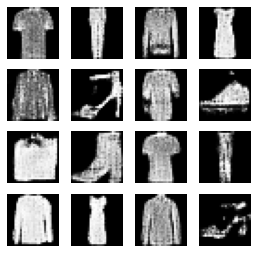

38800: [discriminator loss: 0.681767, acc: 0.585938] [adversarial loss: 0.721881, acc: 0.453125]
38801: [discriminator loss: 0.680429, acc: 0.546875] [adversarial loss: 0.791226, acc: 0.250000]
38802: [discriminator loss: 0.648406, acc: 0.656250] [adversarial loss: 0.701995, acc: 0.437500]
38803: [discriminator loss: 0.686559, acc: 0.578125] [adversarial loss: 0.752557, acc: 0.328125]
38804: [discriminator loss: 0.676537, acc: 0.601562] [adversarial loss: 0.719999, acc: 0.390625]
38805: [discriminator loss: 0.676846, acc: 0.570312] [adversarial loss: 0.735458, acc: 0.328125]
38806: [discriminator loss: 0.667563, acc: 0.617188] [adversarial loss: 0.663986, acc: 0.562500]
38807: [discriminator loss: 0.660676, acc: 0.601562] [adversarial loss: 0.699380, acc: 0.421875]
38808: [discriminator loss: 0.683725, acc: 0.554688] [adversarial loss: 0.795942, acc: 0.250000]
38809: [discriminator loss: 0.673149, acc: 0.531250] [adversarial loss: 0.714139, acc: 0.484375]
38810: [discriminator loss: 0.

38885: [discriminator loss: 0.687321, acc: 0.523438] [adversarial loss: 0.770942, acc: 0.187500]
38886: [discriminator loss: 0.667879, acc: 0.578125] [adversarial loss: 0.668500, acc: 0.640625]
38887: [discriminator loss: 0.682709, acc: 0.578125] [adversarial loss: 0.816437, acc: 0.140625]
38888: [discriminator loss: 0.689330, acc: 0.570312] [adversarial loss: 0.642526, acc: 0.718750]
38889: [discriminator loss: 0.698851, acc: 0.507812] [adversarial loss: 0.804091, acc: 0.140625]
38890: [discriminator loss: 0.676959, acc: 0.531250] [adversarial loss: 0.689948, acc: 0.531250]
38891: [discriminator loss: 0.673440, acc: 0.554688] [adversarial loss: 0.683001, acc: 0.562500]
38892: [discriminator loss: 0.700741, acc: 0.515625] [adversarial loss: 0.805921, acc: 0.171875]
38893: [discriminator loss: 0.698728, acc: 0.523438] [adversarial loss: 0.751711, acc: 0.296875]
38894: [discriminator loss: 0.688916, acc: 0.554688] [adversarial loss: 0.794370, acc: 0.218750]
38895: [discriminator loss: 0.

38972: [discriminator loss: 0.682222, acc: 0.546875] [adversarial loss: 0.716041, acc: 0.328125]
38973: [discriminator loss: 0.670019, acc: 0.656250] [adversarial loss: 0.672525, acc: 0.531250]
38974: [discriminator loss: 0.690011, acc: 0.539062] [adversarial loss: 0.720769, acc: 0.453125]
38975: [discriminator loss: 0.683643, acc: 0.531250] [adversarial loss: 0.721940, acc: 0.484375]
38976: [discriminator loss: 0.679393, acc: 0.570312] [adversarial loss: 0.812143, acc: 0.187500]
38977: [discriminator loss: 0.678960, acc: 0.570312] [adversarial loss: 0.640787, acc: 0.703125]
38978: [discriminator loss: 0.695188, acc: 0.546875] [adversarial loss: 0.869848, acc: 0.203125]
38979: [discriminator loss: 0.705676, acc: 0.546875] [adversarial loss: 0.719135, acc: 0.390625]
38980: [discriminator loss: 0.680819, acc: 0.539062] [adversarial loss: 0.674135, acc: 0.578125]
38981: [discriminator loss: 0.669990, acc: 0.585938] [adversarial loss: 0.664478, acc: 0.609375]
38982: [discriminator loss: 0.

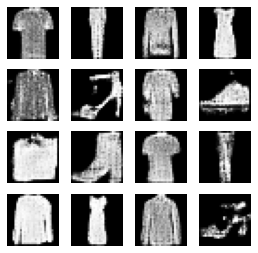

39000: [discriminator loss: 0.702817, acc: 0.500000] [adversarial loss: 0.639934, acc: 0.671875]
39001: [discriminator loss: 0.681015, acc: 0.531250] [adversarial loss: 0.719728, acc: 0.437500]
39002: [discriminator loss: 0.689646, acc: 0.507812] [adversarial loss: 0.778729, acc: 0.250000]
39003: [discriminator loss: 0.665836, acc: 0.593750] [adversarial loss: 0.717113, acc: 0.546875]
39004: [discriminator loss: 0.687603, acc: 0.546875] [adversarial loss: 0.839783, acc: 0.125000]
39005: [discriminator loss: 0.704301, acc: 0.484375] [adversarial loss: 0.629615, acc: 0.765625]
39006: [discriminator loss: 0.701270, acc: 0.445312] [adversarial loss: 0.816000, acc: 0.140625]
39007: [discriminator loss: 0.708883, acc: 0.515625] [adversarial loss: 0.580923, acc: 0.859375]
39008: [discriminator loss: 0.693540, acc: 0.523438] [adversarial loss: 0.797725, acc: 0.234375]
39009: [discriminator loss: 0.685609, acc: 0.546875] [adversarial loss: 0.733833, acc: 0.390625]
39010: [discriminator loss: 0.

39086: [discriminator loss: 0.681149, acc: 0.515625] [adversarial loss: 0.687904, acc: 0.578125]
39087: [discriminator loss: 0.675793, acc: 0.578125] [adversarial loss: 0.750300, acc: 0.343750]
39088: [discriminator loss: 0.674344, acc: 0.578125] [adversarial loss: 0.678006, acc: 0.546875]
39089: [discriminator loss: 0.681113, acc: 0.562500] [adversarial loss: 0.681188, acc: 0.453125]
39090: [discriminator loss: 0.668128, acc: 0.578125] [adversarial loss: 0.741380, acc: 0.312500]
39091: [discriminator loss: 0.689906, acc: 0.601562] [adversarial loss: 0.603967, acc: 0.796875]
39092: [discriminator loss: 0.680467, acc: 0.562500] [adversarial loss: 0.798143, acc: 0.234375]
39093: [discriminator loss: 0.682301, acc: 0.546875] [adversarial loss: 0.699272, acc: 0.500000]
39094: [discriminator loss: 0.682796, acc: 0.554688] [adversarial loss: 0.721326, acc: 0.453125]
39095: [discriminator loss: 0.691854, acc: 0.492188] [adversarial loss: 0.713418, acc: 0.500000]
39096: [discriminator loss: 0.

39174: [discriminator loss: 0.691112, acc: 0.539062] [adversarial loss: 0.721768, acc: 0.375000]
39175: [discriminator loss: 0.685590, acc: 0.609375] [adversarial loss: 0.683966, acc: 0.515625]
39176: [discriminator loss: 0.686829, acc: 0.507812] [adversarial loss: 0.748244, acc: 0.296875]
39177: [discriminator loss: 0.699657, acc: 0.515625] [adversarial loss: 0.659693, acc: 0.625000]
39178: [discriminator loss: 0.692083, acc: 0.523438] [adversarial loss: 0.841596, acc: 0.234375]
39179: [discriminator loss: 0.679816, acc: 0.539062] [adversarial loss: 0.697524, acc: 0.500000]
39180: [discriminator loss: 0.682388, acc: 0.578125] [adversarial loss: 0.676844, acc: 0.625000]
39181: [discriminator loss: 0.679471, acc: 0.562500] [adversarial loss: 0.654917, acc: 0.656250]
39182: [discriminator loss: 0.678792, acc: 0.601562] [adversarial loss: 0.725107, acc: 0.437500]
39183: [discriminator loss: 0.693394, acc: 0.531250] [adversarial loss: 0.712806, acc: 0.453125]
39184: [discriminator loss: 0.

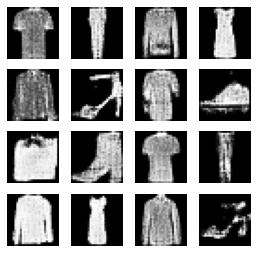

39200: [discriminator loss: 0.670683, acc: 0.570312] [adversarial loss: 0.653017, acc: 0.609375]
39201: [discriminator loss: 0.685252, acc: 0.585938] [adversarial loss: 0.786905, acc: 0.203125]
39202: [discriminator loss: 0.670033, acc: 0.585938] [adversarial loss: 0.708911, acc: 0.437500]
39203: [discriminator loss: 0.677699, acc: 0.554688] [adversarial loss: 0.715359, acc: 0.406250]
39204: [discriminator loss: 0.654090, acc: 0.664062] [adversarial loss: 0.689225, acc: 0.515625]
39205: [discriminator loss: 0.680926, acc: 0.546875] [adversarial loss: 0.724966, acc: 0.437500]
39206: [discriminator loss: 0.679941, acc: 0.570312] [adversarial loss: 0.750979, acc: 0.343750]
39207: [discriminator loss: 0.667443, acc: 0.585938] [adversarial loss: 0.654689, acc: 0.640625]
39208: [discriminator loss: 0.690895, acc: 0.554688] [adversarial loss: 0.779433, acc: 0.265625]
39209: [discriminator loss: 0.683819, acc: 0.546875] [adversarial loss: 0.669437, acc: 0.625000]
39210: [discriminator loss: 0.

39285: [discriminator loss: 0.665565, acc: 0.601562] [adversarial loss: 0.748252, acc: 0.281250]
39286: [discriminator loss: 0.703973, acc: 0.492188] [adversarial loss: 0.677512, acc: 0.609375]
39287: [discriminator loss: 0.687327, acc: 0.570312] [adversarial loss: 0.770572, acc: 0.265625]
39288: [discriminator loss: 0.671129, acc: 0.585938] [adversarial loss: 0.713400, acc: 0.484375]
39289: [discriminator loss: 0.678580, acc: 0.609375] [adversarial loss: 0.752769, acc: 0.328125]
39290: [discriminator loss: 0.685051, acc: 0.554688] [adversarial loss: 0.876256, acc: 0.078125]
39291: [discriminator loss: 0.683028, acc: 0.562500] [adversarial loss: 0.668811, acc: 0.515625]
39292: [discriminator loss: 0.702562, acc: 0.515625] [adversarial loss: 0.827155, acc: 0.093750]
39293: [discriminator loss: 0.676468, acc: 0.531250] [adversarial loss: 0.714515, acc: 0.468750]
39294: [discriminator loss: 0.686868, acc: 0.562500] [adversarial loss: 0.709190, acc: 0.453125]
39295: [discriminator loss: 0.

39370: [discriminator loss: 0.692270, acc: 0.523438] [adversarial loss: 0.808353, acc: 0.156250]
39371: [discriminator loss: 0.692419, acc: 0.531250] [adversarial loss: 0.666894, acc: 0.515625]
39372: [discriminator loss: 0.689242, acc: 0.523438] [adversarial loss: 0.718415, acc: 0.437500]
39373: [discriminator loss: 0.678264, acc: 0.546875] [adversarial loss: 0.730868, acc: 0.312500]
39374: [discriminator loss: 0.700801, acc: 0.585938] [adversarial loss: 0.757043, acc: 0.343750]
39375: [discriminator loss: 0.699545, acc: 0.515625] [adversarial loss: 0.676406, acc: 0.578125]
39376: [discriminator loss: 0.686841, acc: 0.484375] [adversarial loss: 0.825769, acc: 0.125000]
39377: [discriminator loss: 0.680069, acc: 0.539062] [adversarial loss: 0.639608, acc: 0.734375]
39378: [discriminator loss: 0.676324, acc: 0.546875] [adversarial loss: 0.777509, acc: 0.343750]
39379: [discriminator loss: 0.686396, acc: 0.523438] [adversarial loss: 0.732808, acc: 0.359375]
39380: [discriminator loss: 0.

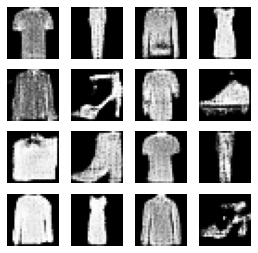

39400: [discriminator loss: 0.690205, acc: 0.539062] [adversarial loss: 0.723838, acc: 0.312500]
39401: [discriminator loss: 0.677700, acc: 0.546875] [adversarial loss: 0.730593, acc: 0.375000]
39402: [discriminator loss: 0.697147, acc: 0.484375] [adversarial loss: 0.851649, acc: 0.171875]
39403: [discriminator loss: 0.678173, acc: 0.546875] [adversarial loss: 0.680364, acc: 0.531250]
39404: [discriminator loss: 0.678149, acc: 0.609375] [adversarial loss: 0.869870, acc: 0.203125]
39405: [discriminator loss: 0.681293, acc: 0.593750] [adversarial loss: 0.661659, acc: 0.609375]
39406: [discriminator loss: 0.690687, acc: 0.554688] [adversarial loss: 0.754694, acc: 0.296875]
39407: [discriminator loss: 0.681097, acc: 0.562500] [adversarial loss: 0.750672, acc: 0.390625]
39408: [discriminator loss: 0.655674, acc: 0.609375] [adversarial loss: 0.679521, acc: 0.656250]
39409: [discriminator loss: 0.702552, acc: 0.429688] [adversarial loss: 0.800242, acc: 0.265625]
39410: [discriminator loss: 0.

39489: [discriminator loss: 0.692160, acc: 0.492188] [adversarial loss: 0.729153, acc: 0.375000]
39490: [discriminator loss: 0.673281, acc: 0.601562] [adversarial loss: 0.754791, acc: 0.296875]
39491: [discriminator loss: 0.677602, acc: 0.570312] [adversarial loss: 0.670138, acc: 0.546875]
39492: [discriminator loss: 0.680137, acc: 0.578125] [adversarial loss: 0.749511, acc: 0.375000]
39493: [discriminator loss: 0.673492, acc: 0.625000] [adversarial loss: 0.842425, acc: 0.093750]
39494: [discriminator loss: 0.690597, acc: 0.515625] [adversarial loss: 0.649843, acc: 0.656250]
39495: [discriminator loss: 0.693076, acc: 0.421875] [adversarial loss: 0.881229, acc: 0.093750]
39496: [discriminator loss: 0.698879, acc: 0.507812] [adversarial loss: 0.683108, acc: 0.468750]
39497: [discriminator loss: 0.657107, acc: 0.585938] [adversarial loss: 0.765640, acc: 0.265625]
39498: [discriminator loss: 0.696730, acc: 0.515625] [adversarial loss: 0.682363, acc: 0.578125]
39499: [discriminator loss: 0.

39578: [discriminator loss: 0.701024, acc: 0.500000] [adversarial loss: 0.768698, acc: 0.343750]
39579: [discriminator loss: 0.690023, acc: 0.531250] [adversarial loss: 0.801374, acc: 0.156250]
39580: [discriminator loss: 0.681567, acc: 0.562500] [adversarial loss: 0.701460, acc: 0.484375]
39581: [discriminator loss: 0.668067, acc: 0.578125] [adversarial loss: 0.793915, acc: 0.187500]
39582: [discriminator loss: 0.691057, acc: 0.546875] [adversarial loss: 0.631500, acc: 0.703125]
39583: [discriminator loss: 0.676098, acc: 0.585938] [adversarial loss: 0.736459, acc: 0.437500]
39584: [discriminator loss: 0.661735, acc: 0.609375] [adversarial loss: 0.718223, acc: 0.531250]
39585: [discriminator loss: 0.662577, acc: 0.632812] [adversarial loss: 0.656708, acc: 0.671875]
39586: [discriminator loss: 0.676872, acc: 0.515625] [adversarial loss: 0.832506, acc: 0.203125]
39587: [discriminator loss: 0.702868, acc: 0.523438] [adversarial loss: 0.668161, acc: 0.656250]
39588: [discriminator loss: 0.

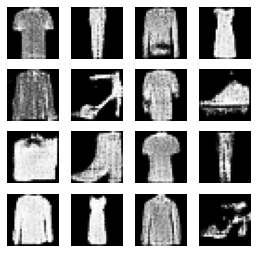

39600: [discriminator loss: 0.673428, acc: 0.554688] [adversarial loss: 0.754072, acc: 0.390625]
39601: [discriminator loss: 0.692550, acc: 0.507812] [adversarial loss: 0.726945, acc: 0.453125]
39602: [discriminator loss: 0.676336, acc: 0.531250] [adversarial loss: 0.756844, acc: 0.390625]
39603: [discriminator loss: 0.698476, acc: 0.562500] [adversarial loss: 0.700225, acc: 0.531250]
39604: [discriminator loss: 0.666005, acc: 0.585938] [adversarial loss: 0.787249, acc: 0.328125]
39605: [discriminator loss: 0.707382, acc: 0.453125] [adversarial loss: 0.709428, acc: 0.578125]
39606: [discriminator loss: 0.667929, acc: 0.570312] [adversarial loss: 0.715239, acc: 0.390625]
39607: [discriminator loss: 0.663826, acc: 0.656250] [adversarial loss: 0.715907, acc: 0.531250]
39608: [discriminator loss: 0.682068, acc: 0.484375] [adversarial loss: 0.814417, acc: 0.156250]
39609: [discriminator loss: 0.694149, acc: 0.500000] [adversarial loss: 0.686019, acc: 0.531250]
39610: [discriminator loss: 0.

39686: [discriminator loss: 0.681187, acc: 0.554688] [adversarial loss: 0.745178, acc: 0.390625]
39687: [discriminator loss: 0.676566, acc: 0.554688] [adversarial loss: 0.809738, acc: 0.156250]
39688: [discriminator loss: 0.674201, acc: 0.578125] [adversarial loss: 0.674710, acc: 0.625000]
39689: [discriminator loss: 0.688839, acc: 0.531250] [adversarial loss: 0.772054, acc: 0.203125]
39690: [discriminator loss: 0.692375, acc: 0.554688] [adversarial loss: 0.657558, acc: 0.656250]
39691: [discriminator loss: 0.681717, acc: 0.578125] [adversarial loss: 0.842720, acc: 0.093750]
39692: [discriminator loss: 0.699229, acc: 0.546875] [adversarial loss: 0.672467, acc: 0.546875]
39693: [discriminator loss: 0.689127, acc: 0.445312] [adversarial loss: 0.743079, acc: 0.328125]
39694: [discriminator loss: 0.673275, acc: 0.609375] [adversarial loss: 0.796865, acc: 0.156250]
39695: [discriminator loss: 0.700248, acc: 0.539062] [adversarial loss: 0.666075, acc: 0.640625]
39696: [discriminator loss: 0.

39773: [discriminator loss: 0.679449, acc: 0.562500] [adversarial loss: 0.701215, acc: 0.437500]
39774: [discriminator loss: 0.696845, acc: 0.507812] [adversarial loss: 0.747672, acc: 0.265625]
39775: [discriminator loss: 0.693499, acc: 0.570312] [adversarial loss: 0.622729, acc: 0.718750]
39776: [discriminator loss: 0.670145, acc: 0.546875] [adversarial loss: 0.744339, acc: 0.312500]
39777: [discriminator loss: 0.682900, acc: 0.531250] [adversarial loss: 0.685597, acc: 0.578125]
39778: [discriminator loss: 0.677695, acc: 0.578125] [adversarial loss: 0.702628, acc: 0.437500]
39779: [discriminator loss: 0.681332, acc: 0.523438] [adversarial loss: 0.713637, acc: 0.406250]
39780: [discriminator loss: 0.690596, acc: 0.585938] [adversarial loss: 0.636448, acc: 0.765625]
39781: [discriminator loss: 0.682013, acc: 0.539062] [adversarial loss: 0.763016, acc: 0.250000]
39782: [discriminator loss: 0.677696, acc: 0.585938] [adversarial loss: 0.720039, acc: 0.453125]
39783: [discriminator loss: 0.

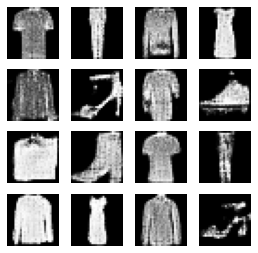

39800: [discriminator loss: 0.649260, acc: 0.625000] [adversarial loss: 0.722511, acc: 0.296875]
39801: [discriminator loss: 0.690178, acc: 0.546875] [adversarial loss: 0.671263, acc: 0.562500]
39802: [discriminator loss: 0.668739, acc: 0.656250] [adversarial loss: 0.738260, acc: 0.328125]
39803: [discriminator loss: 0.667709, acc: 0.609375] [adversarial loss: 0.691578, acc: 0.531250]
39804: [discriminator loss: 0.670951, acc: 0.640625] [adversarial loss: 0.814286, acc: 0.203125]
39805: [discriminator loss: 0.695841, acc: 0.500000] [adversarial loss: 0.662584, acc: 0.625000]
39806: [discriminator loss: 0.692109, acc: 0.500000] [adversarial loss: 0.707619, acc: 0.593750]
39807: [discriminator loss: 0.697552, acc: 0.484375] [adversarial loss: 0.710371, acc: 0.500000]
39808: [discriminator loss: 0.693558, acc: 0.515625] [adversarial loss: 0.746179, acc: 0.281250]
39809: [discriminator loss: 0.682081, acc: 0.554688] [adversarial loss: 0.721059, acc: 0.468750]
39810: [discriminator loss: 0.

39887: [discriminator loss: 0.683643, acc: 0.507812] [adversarial loss: 0.770527, acc: 0.312500]
39888: [discriminator loss: 0.682154, acc: 0.562500] [adversarial loss: 0.719945, acc: 0.453125]
39889: [discriminator loss: 0.669537, acc: 0.570312] [adversarial loss: 0.784739, acc: 0.296875]
39890: [discriminator loss: 0.688039, acc: 0.539062] [adversarial loss: 0.685885, acc: 0.593750]
39891: [discriminator loss: 0.661966, acc: 0.593750] [adversarial loss: 0.674650, acc: 0.593750]
39892: [discriminator loss: 0.696284, acc: 0.484375] [adversarial loss: 0.722597, acc: 0.468750]
39893: [discriminator loss: 0.696094, acc: 0.500000] [adversarial loss: 0.708794, acc: 0.500000]
39894: [discriminator loss: 0.670692, acc: 0.625000] [adversarial loss: 0.704681, acc: 0.453125]
39895: [discriminator loss: 0.670483, acc: 0.671875] [adversarial loss: 0.667460, acc: 0.562500]
39896: [discriminator loss: 0.690889, acc: 0.523438] [adversarial loss: 0.880257, acc: 0.031250]
39897: [discriminator loss: 0.

39974: [discriminator loss: 0.672614, acc: 0.562500] [adversarial loss: 0.708041, acc: 0.468750]
39975: [discriminator loss: 0.690190, acc: 0.507812] [adversarial loss: 0.739389, acc: 0.359375]
39976: [discriminator loss: 0.666317, acc: 0.601562] [adversarial loss: 0.754446, acc: 0.468750]
39977: [discriminator loss: 0.688628, acc: 0.492188] [adversarial loss: 0.782169, acc: 0.203125]
39978: [discriminator loss: 0.685967, acc: 0.531250] [adversarial loss: 0.749665, acc: 0.343750]
39979: [discriminator loss: 0.682669, acc: 0.578125] [adversarial loss: 0.655602, acc: 0.640625]
39980: [discriminator loss: 0.694710, acc: 0.562500] [adversarial loss: 0.814208, acc: 0.140625]
39981: [discriminator loss: 0.665966, acc: 0.640625] [adversarial loss: 0.667584, acc: 0.656250]
39982: [discriminator loss: 0.688894, acc: 0.523438] [adversarial loss: 0.774206, acc: 0.203125]
39983: [discriminator loss: 0.703335, acc: 0.523438] [adversarial loss: 0.662176, acc: 0.609375]
39984: [discriminator loss: 0.

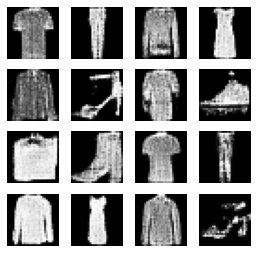

40000: [discriminator loss: 0.677536, acc: 0.570312] [adversarial loss: 0.687303, acc: 0.515625]
40001: [discriminator loss: 0.666833, acc: 0.570312] [adversarial loss: 0.741209, acc: 0.281250]
40002: [discriminator loss: 0.699568, acc: 0.468750] [adversarial loss: 0.798807, acc: 0.187500]
40003: [discriminator loss: 0.696458, acc: 0.515625] [adversarial loss: 0.664850, acc: 0.609375]
40004: [discriminator loss: 0.680892, acc: 0.484375] [adversarial loss: 0.732169, acc: 0.406250]
40005: [discriminator loss: 0.680889, acc: 0.539062] [adversarial loss: 0.737450, acc: 0.343750]
40006: [discriminator loss: 0.716403, acc: 0.484375] [adversarial loss: 0.794639, acc: 0.140625]
40007: [discriminator loss: 0.675336, acc: 0.609375] [adversarial loss: 0.719833, acc: 0.359375]
40008: [discriminator loss: 0.694448, acc: 0.484375] [adversarial loss: 0.773341, acc: 0.281250]
40009: [discriminator loss: 0.690015, acc: 0.546875] [adversarial loss: 0.760514, acc: 0.312500]
40010: [discriminator loss: 0.

40088: [discriminator loss: 0.665461, acc: 0.609375] [adversarial loss: 0.714157, acc: 0.453125]
40089: [discriminator loss: 0.659387, acc: 0.640625] [adversarial loss: 0.703161, acc: 0.453125]
40090: [discriminator loss: 0.677132, acc: 0.539062] [adversarial loss: 0.703838, acc: 0.515625]
40091: [discriminator loss: 0.698998, acc: 0.500000] [adversarial loss: 0.724012, acc: 0.484375]
40092: [discriminator loss: 0.681437, acc: 0.554688] [adversarial loss: 0.722606, acc: 0.359375]
40093: [discriminator loss: 0.685081, acc: 0.539062] [adversarial loss: 0.814028, acc: 0.328125]
40094: [discriminator loss: 0.691232, acc: 0.507812] [adversarial loss: 0.667858, acc: 0.625000]
40095: [discriminator loss: 0.677963, acc: 0.539062] [adversarial loss: 0.709266, acc: 0.421875]
40096: [discriminator loss: 0.671678, acc: 0.523438] [adversarial loss: 0.725501, acc: 0.328125]
40097: [discriminator loss: 0.680117, acc: 0.539062] [adversarial loss: 0.655147, acc: 0.656250]
40098: [discriminator loss: 0.

40174: [discriminator loss: 0.669079, acc: 0.640625] [adversarial loss: 0.731543, acc: 0.359375]
40175: [discriminator loss: 0.675456, acc: 0.593750] [adversarial loss: 0.771210, acc: 0.312500]
40176: [discriminator loss: 0.695267, acc: 0.515625] [adversarial loss: 0.654253, acc: 0.687500]
40177: [discriminator loss: 0.676100, acc: 0.585938] [adversarial loss: 0.709966, acc: 0.453125]
40178: [discriminator loss: 0.677651, acc: 0.585938] [adversarial loss: 0.808568, acc: 0.218750]
40179: [discriminator loss: 0.690622, acc: 0.531250] [adversarial loss: 0.696249, acc: 0.531250]
40180: [discriminator loss: 0.685162, acc: 0.515625] [adversarial loss: 0.758229, acc: 0.375000]
40181: [discriminator loss: 0.672106, acc: 0.617188] [adversarial loss: 0.746308, acc: 0.343750]
40182: [discriminator loss: 0.687944, acc: 0.531250] [adversarial loss: 0.731465, acc: 0.406250]
40183: [discriminator loss: 0.667354, acc: 0.585938] [adversarial loss: 0.672456, acc: 0.562500]
40184: [discriminator loss: 0.

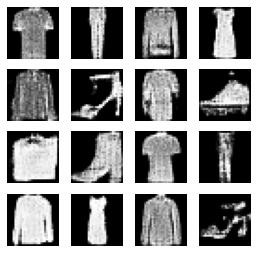

40200: [discriminator loss: 0.668496, acc: 0.601562] [adversarial loss: 0.747562, acc: 0.265625]
40201: [discriminator loss: 0.679211, acc: 0.562500] [adversarial loss: 0.696196, acc: 0.468750]
40202: [discriminator loss: 0.666973, acc: 0.578125] [adversarial loss: 0.783761, acc: 0.312500]
40203: [discriminator loss: 0.695137, acc: 0.500000] [adversarial loss: 0.679796, acc: 0.578125]
40204: [discriminator loss: 0.693337, acc: 0.531250] [adversarial loss: 0.670539, acc: 0.687500]
40205: [discriminator loss: 0.689239, acc: 0.546875] [adversarial loss: 0.697038, acc: 0.531250]
40206: [discriminator loss: 0.684531, acc: 0.578125] [adversarial loss: 0.729759, acc: 0.359375]
40207: [discriminator loss: 0.671356, acc: 0.578125] [adversarial loss: 0.678733, acc: 0.578125]
40208: [discriminator loss: 0.679196, acc: 0.562500] [adversarial loss: 0.742990, acc: 0.375000]
40209: [discriminator loss: 0.672684, acc: 0.601562] [adversarial loss: 0.601720, acc: 0.765625]
40210: [discriminator loss: 0.

40287: [discriminator loss: 0.662062, acc: 0.578125] [adversarial loss: 0.778751, acc: 0.281250]
40288: [discriminator loss: 0.692468, acc: 0.562500] [adversarial loss: 0.692471, acc: 0.421875]
40289: [discriminator loss: 0.677090, acc: 0.531250] [adversarial loss: 0.693737, acc: 0.546875]
40290: [discriminator loss: 0.700448, acc: 0.500000] [adversarial loss: 0.808314, acc: 0.171875]
40291: [discriminator loss: 0.667377, acc: 0.648438] [adversarial loss: 0.663135, acc: 0.609375]
40292: [discriminator loss: 0.674023, acc: 0.554688] [adversarial loss: 0.764065, acc: 0.203125]
40293: [discriminator loss: 0.676760, acc: 0.609375] [adversarial loss: 0.697175, acc: 0.531250]
40294: [discriminator loss: 0.673321, acc: 0.539062] [adversarial loss: 0.672396, acc: 0.578125]
40295: [discriminator loss: 0.684364, acc: 0.523438] [adversarial loss: 0.775641, acc: 0.281250]
40296: [discriminator loss: 0.672678, acc: 0.585938] [adversarial loss: 0.685187, acc: 0.625000]
40297: [discriminator loss: 0.

40376: [discriminator loss: 0.695547, acc: 0.476562] [adversarial loss: 0.657919, acc: 0.578125]
40377: [discriminator loss: 0.662669, acc: 0.585938] [adversarial loss: 0.806893, acc: 0.234375]
40378: [discriminator loss: 0.701667, acc: 0.500000] [adversarial loss: 0.655391, acc: 0.609375]
40379: [discriminator loss: 0.674163, acc: 0.593750] [adversarial loss: 0.729532, acc: 0.437500]
40380: [discriminator loss: 0.662548, acc: 0.601562] [adversarial loss: 0.737932, acc: 0.359375]
40381: [discriminator loss: 0.671873, acc: 0.562500] [adversarial loss: 0.722746, acc: 0.406250]
40382: [discriminator loss: 0.673039, acc: 0.546875] [adversarial loss: 0.684711, acc: 0.578125]
40383: [discriminator loss: 0.698040, acc: 0.554688] [adversarial loss: 0.672999, acc: 0.531250]
40384: [discriminator loss: 0.682655, acc: 0.539062] [adversarial loss: 0.786742, acc: 0.078125]
40385: [discriminator loss: 0.697126, acc: 0.523438] [adversarial loss: 0.682937, acc: 0.515625]
40386: [discriminator loss: 0.

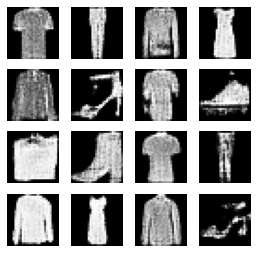

40400: [discriminator loss: 0.679740, acc: 0.585938] [adversarial loss: 0.668696, acc: 0.531250]
40401: [discriminator loss: 0.676047, acc: 0.578125] [adversarial loss: 0.706483, acc: 0.515625]
40402: [discriminator loss: 0.686030, acc: 0.515625] [adversarial loss: 0.709772, acc: 0.562500]
40403: [discriminator loss: 0.665672, acc: 0.601562] [adversarial loss: 0.774734, acc: 0.312500]
40404: [discriminator loss: 0.681834, acc: 0.484375] [adversarial loss: 0.680004, acc: 0.578125]
40405: [discriminator loss: 0.670250, acc: 0.601562] [adversarial loss: 0.726901, acc: 0.421875]
40406: [discriminator loss: 0.677649, acc: 0.507812] [adversarial loss: 0.718491, acc: 0.484375]
40407: [discriminator loss: 0.672094, acc: 0.570312] [adversarial loss: 0.751664, acc: 0.265625]
40408: [discriminator loss: 0.667687, acc: 0.593750] [adversarial loss: 0.727236, acc: 0.359375]
40409: [discriminator loss: 0.671217, acc: 0.578125] [adversarial loss: 0.724830, acc: 0.359375]
40410: [discriminator loss: 0.

40488: [discriminator loss: 0.697170, acc: 0.500000] [adversarial loss: 0.758577, acc: 0.343750]
40489: [discriminator loss: 0.677557, acc: 0.625000] [adversarial loss: 0.715467, acc: 0.500000]
40490: [discriminator loss: 0.670468, acc: 0.625000] [adversarial loss: 0.781689, acc: 0.359375]
40491: [discriminator loss: 0.664323, acc: 0.593750] [adversarial loss: 0.697118, acc: 0.562500]
40492: [discriminator loss: 0.679913, acc: 0.515625] [adversarial loss: 0.709419, acc: 0.421875]
40493: [discriminator loss: 0.672676, acc: 0.562500] [adversarial loss: 0.696217, acc: 0.484375]
40494: [discriminator loss: 0.683870, acc: 0.601562] [adversarial loss: 0.728280, acc: 0.406250]
40495: [discriminator loss: 0.697949, acc: 0.531250] [adversarial loss: 0.614251, acc: 0.796875]
40496: [discriminator loss: 0.667661, acc: 0.578125] [adversarial loss: 0.834681, acc: 0.218750]
40497: [discriminator loss: 0.672042, acc: 0.570312] [adversarial loss: 0.662366, acc: 0.671875]
40498: [discriminator loss: 0.

40573: [discriminator loss: 0.672445, acc: 0.570312] [adversarial loss: 0.768646, acc: 0.296875]
40574: [discriminator loss: 0.682110, acc: 0.562500] [adversarial loss: 0.660659, acc: 0.609375]
40575: [discriminator loss: 0.679234, acc: 0.515625] [adversarial loss: 0.843730, acc: 0.125000]
40576: [discriminator loss: 0.691026, acc: 0.546875] [adversarial loss: 0.624369, acc: 0.765625]
40577: [discriminator loss: 0.683095, acc: 0.554688] [adversarial loss: 0.753608, acc: 0.250000]
40578: [discriminator loss: 0.674204, acc: 0.593750] [adversarial loss: 0.696162, acc: 0.531250]
40579: [discriminator loss: 0.677766, acc: 0.585938] [adversarial loss: 0.735641, acc: 0.375000]
40580: [discriminator loss: 0.686228, acc: 0.601562] [adversarial loss: 0.714336, acc: 0.375000]
40581: [discriminator loss: 0.683389, acc: 0.507812] [adversarial loss: 0.667482, acc: 0.546875]
40582: [discriminator loss: 0.667129, acc: 0.570312] [adversarial loss: 0.754358, acc: 0.312500]
40583: [discriminator loss: 0.

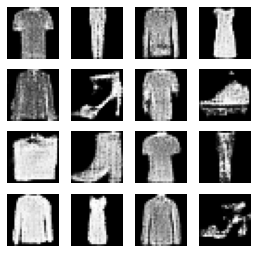

40600: [discriminator loss: 0.663080, acc: 0.632812] [adversarial loss: 0.694323, acc: 0.515625]
40601: [discriminator loss: 0.677625, acc: 0.546875] [adversarial loss: 0.777685, acc: 0.343750]
40602: [discriminator loss: 0.675011, acc: 0.523438] [adversarial loss: 0.731739, acc: 0.437500]
40603: [discriminator loss: 0.712644, acc: 0.492188] [adversarial loss: 0.682224, acc: 0.546875]
40604: [discriminator loss: 0.658595, acc: 0.617188] [adversarial loss: 0.747881, acc: 0.406250]
40605: [discriminator loss: 0.682125, acc: 0.539062] [adversarial loss: 0.647736, acc: 0.703125]
40606: [discriminator loss: 0.675168, acc: 0.562500] [adversarial loss: 0.746079, acc: 0.406250]
40607: [discriminator loss: 0.675217, acc: 0.617188] [adversarial loss: 0.667025, acc: 0.578125]
40608: [discriminator loss: 0.682808, acc: 0.539062] [adversarial loss: 0.662205, acc: 0.531250]
40609: [discriminator loss: 0.703383, acc: 0.500000] [adversarial loss: 0.733607, acc: 0.359375]
40610: [discriminator loss: 0.

40687: [discriminator loss: 0.678209, acc: 0.531250] [adversarial loss: 0.623873, acc: 0.734375]
40688: [discriminator loss: 0.705106, acc: 0.468750] [adversarial loss: 0.841091, acc: 0.125000]
40689: [discriminator loss: 0.708425, acc: 0.507812] [adversarial loss: 0.675129, acc: 0.515625]
40690: [discriminator loss: 0.669638, acc: 0.625000] [adversarial loss: 0.733758, acc: 0.343750]
40691: [discriminator loss: 0.667186, acc: 0.617188] [adversarial loss: 0.687695, acc: 0.562500]
40692: [discriminator loss: 0.676054, acc: 0.500000] [adversarial loss: 0.736687, acc: 0.312500]
40693: [discriminator loss: 0.679797, acc: 0.609375] [adversarial loss: 0.679513, acc: 0.625000]
40694: [discriminator loss: 0.692716, acc: 0.539062] [adversarial loss: 0.761308, acc: 0.312500]
40695: [discriminator loss: 0.675072, acc: 0.593750] [adversarial loss: 0.741485, acc: 0.343750]
40696: [discriminator loss: 0.684253, acc: 0.539062] [adversarial loss: 0.706093, acc: 0.453125]
40697: [discriminator loss: 0.

40775: [discriminator loss: 0.697581, acc: 0.546875] [adversarial loss: 0.802576, acc: 0.171875]
40776: [discriminator loss: 0.671315, acc: 0.539062] [adversarial loss: 0.653292, acc: 0.703125]
40777: [discriminator loss: 0.681297, acc: 0.507812] [adversarial loss: 0.919759, acc: 0.062500]
40778: [discriminator loss: 0.677431, acc: 0.515625] [adversarial loss: 0.693110, acc: 0.484375]
40779: [discriminator loss: 0.685331, acc: 0.539062] [adversarial loss: 0.760779, acc: 0.343750]
40780: [discriminator loss: 0.684677, acc: 0.546875] [adversarial loss: 0.706381, acc: 0.390625]
40781: [discriminator loss: 0.671796, acc: 0.601562] [adversarial loss: 0.781943, acc: 0.250000]
40782: [discriminator loss: 0.681313, acc: 0.570312] [adversarial loss: 0.687245, acc: 0.437500]
40783: [discriminator loss: 0.677278, acc: 0.578125] [adversarial loss: 0.754115, acc: 0.328125]
40784: [discriminator loss: 0.685921, acc: 0.562500] [adversarial loss: 0.712410, acc: 0.390625]
40785: [discriminator loss: 0.

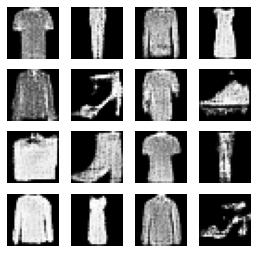

40800: [discriminator loss: 0.679296, acc: 0.531250] [adversarial loss: 0.679275, acc: 0.578125]
40801: [discriminator loss: 0.671513, acc: 0.625000] [adversarial loss: 0.699220, acc: 0.453125]
40802: [discriminator loss: 0.685096, acc: 0.476562] [adversarial loss: 0.762561, acc: 0.281250]
40803: [discriminator loss: 0.677894, acc: 0.632812] [adversarial loss: 0.716592, acc: 0.484375]
40804: [discriminator loss: 0.674986, acc: 0.593750] [adversarial loss: 0.642249, acc: 0.812500]
40805: [discriminator loss: 0.685376, acc: 0.531250] [adversarial loss: 0.792633, acc: 0.218750]
40806: [discriminator loss: 0.675296, acc: 0.539062] [adversarial loss: 0.750054, acc: 0.390625]
40807: [discriminator loss: 0.660749, acc: 0.601562] [adversarial loss: 0.708734, acc: 0.515625]
40808: [discriminator loss: 0.677300, acc: 0.562500] [adversarial loss: 0.693415, acc: 0.593750]
40809: [discriminator loss: 0.677951, acc: 0.585938] [adversarial loss: 0.771697, acc: 0.281250]
40810: [discriminator loss: 0.

40889: [discriminator loss: 0.688651, acc: 0.539062] [adversarial loss: 0.777817, acc: 0.328125]
40890: [discriminator loss: 0.699878, acc: 0.539062] [adversarial loss: 0.732568, acc: 0.375000]
40891: [discriminator loss: 0.673983, acc: 0.578125] [adversarial loss: 0.768402, acc: 0.250000]
40892: [discriminator loss: 0.674331, acc: 0.515625] [adversarial loss: 0.699780, acc: 0.437500]
40893: [discriminator loss: 0.675382, acc: 0.593750] [adversarial loss: 0.701941, acc: 0.515625]
40894: [discriminator loss: 0.685895, acc: 0.515625] [adversarial loss: 0.717102, acc: 0.468750]
40895: [discriminator loss: 0.673668, acc: 0.531250] [adversarial loss: 0.800659, acc: 0.203125]
40896: [discriminator loss: 0.709044, acc: 0.492188] [adversarial loss: 0.671903, acc: 0.625000]
40897: [discriminator loss: 0.688398, acc: 0.515625] [adversarial loss: 0.826745, acc: 0.140625]
40898: [discriminator loss: 0.706309, acc: 0.492188] [adversarial loss: 0.603046, acc: 0.781250]
40899: [discriminator loss: 0.

40976: [discriminator loss: 0.681912, acc: 0.570312] [adversarial loss: 0.808360, acc: 0.187500]
40977: [discriminator loss: 0.687850, acc: 0.539062] [adversarial loss: 0.684352, acc: 0.656250]
40978: [discriminator loss: 0.691131, acc: 0.507812] [adversarial loss: 0.809732, acc: 0.203125]
40979: [discriminator loss: 0.675700, acc: 0.578125] [adversarial loss: 0.678975, acc: 0.687500]
40980: [discriminator loss: 0.692325, acc: 0.539062] [adversarial loss: 0.837609, acc: 0.171875]
40981: [discriminator loss: 0.675614, acc: 0.570312] [adversarial loss: 0.717294, acc: 0.484375]
40982: [discriminator loss: 0.680273, acc: 0.546875] [adversarial loss: 0.732161, acc: 0.421875]
40983: [discriminator loss: 0.679912, acc: 0.539062] [adversarial loss: 0.730906, acc: 0.421875]
40984: [discriminator loss: 0.657730, acc: 0.601562] [adversarial loss: 0.759445, acc: 0.390625]
40985: [discriminator loss: 0.672472, acc: 0.617188] [adversarial loss: 0.689841, acc: 0.625000]
40986: [discriminator loss: 0.

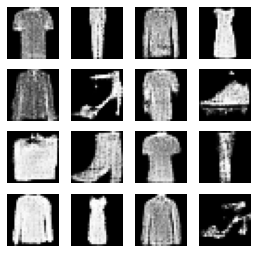

41000: [discriminator loss: 0.672892, acc: 0.546875] [adversarial loss: 0.800115, acc: 0.218750]
41001: [discriminator loss: 0.686799, acc: 0.515625] [adversarial loss: 0.746987, acc: 0.406250]
41002: [discriminator loss: 0.701185, acc: 0.539062] [adversarial loss: 0.692971, acc: 0.562500]
41003: [discriminator loss: 0.674454, acc: 0.593750] [adversarial loss: 0.791767, acc: 0.250000]
41004: [discriminator loss: 0.680476, acc: 0.593750] [adversarial loss: 0.767107, acc: 0.312500]
41005: [discriminator loss: 0.671270, acc: 0.617188] [adversarial loss: 0.737989, acc: 0.468750]
41006: [discriminator loss: 0.683177, acc: 0.515625] [adversarial loss: 0.671884, acc: 0.656250]
41007: [discriminator loss: 0.675754, acc: 0.554688] [adversarial loss: 0.752489, acc: 0.484375]
41008: [discriminator loss: 0.694937, acc: 0.500000] [adversarial loss: 0.713142, acc: 0.468750]
41009: [discriminator loss: 0.664152, acc: 0.617188] [adversarial loss: 0.741295, acc: 0.421875]
41010: [discriminator loss: 0.

41089: [discriminator loss: 0.685634, acc: 0.539062] [adversarial loss: 0.713429, acc: 0.515625]
41090: [discriminator loss: 0.682435, acc: 0.546875] [adversarial loss: 0.739926, acc: 0.406250]
41091: [discriminator loss: 0.693605, acc: 0.507812] [adversarial loss: 0.727901, acc: 0.328125]
41092: [discriminator loss: 0.681296, acc: 0.570312] [adversarial loss: 0.735345, acc: 0.328125]
41093: [discriminator loss: 0.691634, acc: 0.515625] [adversarial loss: 0.681327, acc: 0.562500]
41094: [discriminator loss: 0.671460, acc: 0.601562] [adversarial loss: 0.751270, acc: 0.328125]
41095: [discriminator loss: 0.687631, acc: 0.507812] [adversarial loss: 0.695122, acc: 0.562500]
41096: [discriminator loss: 0.695401, acc: 0.570312] [adversarial loss: 0.779183, acc: 0.187500]
41097: [discriminator loss: 0.704023, acc: 0.484375] [adversarial loss: 0.613256, acc: 0.796875]
41098: [discriminator loss: 0.673323, acc: 0.562500] [adversarial loss: 0.769902, acc: 0.265625]
41099: [discriminator loss: 0.

41175: [discriminator loss: 0.672681, acc: 0.601562] [adversarial loss: 0.694597, acc: 0.453125]
41176: [discriminator loss: 0.678978, acc: 0.523438] [adversarial loss: 0.703056, acc: 0.406250]
41177: [discriminator loss: 0.680184, acc: 0.523438] [adversarial loss: 0.707522, acc: 0.515625]
41178: [discriminator loss: 0.692733, acc: 0.554688] [adversarial loss: 0.689989, acc: 0.562500]
41179: [discriminator loss: 0.699476, acc: 0.578125] [adversarial loss: 0.808540, acc: 0.234375]
41180: [discriminator loss: 0.686013, acc: 0.554688] [adversarial loss: 0.705416, acc: 0.406250]
41181: [discriminator loss: 0.666267, acc: 0.593750] [adversarial loss: 0.711958, acc: 0.484375]
41182: [discriminator loss: 0.667279, acc: 0.546875] [adversarial loss: 0.672033, acc: 0.640625]
41183: [discriminator loss: 0.699730, acc: 0.539062] [adversarial loss: 0.741482, acc: 0.375000]
41184: [discriminator loss: 0.677762, acc: 0.515625] [adversarial loss: 0.735188, acc: 0.296875]
41185: [discriminator loss: 0.

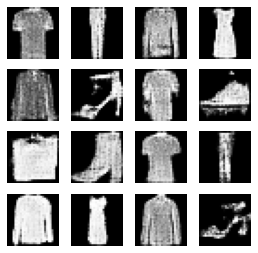

41200: [discriminator loss: 0.696328, acc: 0.523438] [adversarial loss: 0.850960, acc: 0.093750]
41201: [discriminator loss: 0.682354, acc: 0.546875] [adversarial loss: 0.706646, acc: 0.453125]
41202: [discriminator loss: 0.673121, acc: 0.578125] [adversarial loss: 0.728978, acc: 0.390625]
41203: [discriminator loss: 0.673414, acc: 0.578125] [adversarial loss: 0.700562, acc: 0.421875]
41204: [discriminator loss: 0.682113, acc: 0.515625] [adversarial loss: 0.736802, acc: 0.328125]
41205: [discriminator loss: 0.683803, acc: 0.554688] [adversarial loss: 0.806245, acc: 0.250000]
41206: [discriminator loss: 0.693318, acc: 0.578125] [adversarial loss: 0.753556, acc: 0.359375]
41207: [discriminator loss: 0.672040, acc: 0.609375] [adversarial loss: 0.716899, acc: 0.390625]
41208: [discriminator loss: 0.673808, acc: 0.593750] [adversarial loss: 0.762522, acc: 0.375000]
41209: [discriminator loss: 0.702027, acc: 0.539062] [adversarial loss: 0.654028, acc: 0.609375]
41210: [discriminator loss: 0.

41285: [discriminator loss: 0.682824, acc: 0.601562] [adversarial loss: 0.669492, acc: 0.609375]
41286: [discriminator loss: 0.700976, acc: 0.492188] [adversarial loss: 0.758885, acc: 0.312500]
41287: [discriminator loss: 0.682343, acc: 0.585938] [adversarial loss: 0.704472, acc: 0.484375]
41288: [discriminator loss: 0.677960, acc: 0.539062] [adversarial loss: 0.883598, acc: 0.093750]
41289: [discriminator loss: 0.690286, acc: 0.546875] [adversarial loss: 0.592021, acc: 0.796875]
41290: [discriminator loss: 0.682772, acc: 0.585938] [adversarial loss: 0.755442, acc: 0.375000]
41291: [discriminator loss: 0.698060, acc: 0.476562] [adversarial loss: 0.667265, acc: 0.609375]
41292: [discriminator loss: 0.684277, acc: 0.507812] [adversarial loss: 0.710909, acc: 0.484375]
41293: [discriminator loss: 0.669464, acc: 0.570312] [adversarial loss: 0.674708, acc: 0.578125]
41294: [discriminator loss: 0.674561, acc: 0.554688] [adversarial loss: 0.749628, acc: 0.484375]
41295: [discriminator loss: 0.

41374: [discriminator loss: 0.675112, acc: 0.617188] [adversarial loss: 0.791898, acc: 0.281250]
41375: [discriminator loss: 0.672989, acc: 0.617188] [adversarial loss: 0.612629, acc: 0.750000]
41376: [discriminator loss: 0.687970, acc: 0.531250] [adversarial loss: 0.786885, acc: 0.250000]
41377: [discriminator loss: 0.669046, acc: 0.585938] [adversarial loss: 0.686304, acc: 0.578125]
41378: [discriminator loss: 0.710982, acc: 0.453125] [adversarial loss: 0.689898, acc: 0.500000]
41379: [discriminator loss: 0.696481, acc: 0.492188] [adversarial loss: 0.768242, acc: 0.328125]
41380: [discriminator loss: 0.687868, acc: 0.554688] [adversarial loss: 0.757129, acc: 0.281250]
41381: [discriminator loss: 0.683308, acc: 0.523438] [adversarial loss: 0.716067, acc: 0.468750]
41382: [discriminator loss: 0.677454, acc: 0.570312] [adversarial loss: 0.762468, acc: 0.265625]
41383: [discriminator loss: 0.674544, acc: 0.601562] [adversarial loss: 0.798964, acc: 0.281250]
41384: [discriminator loss: 0.

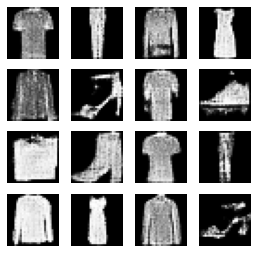

41400: [discriminator loss: 0.666399, acc: 0.507812] [adversarial loss: 0.777293, acc: 0.187500]
41401: [discriminator loss: 0.665718, acc: 0.671875] [adversarial loss: 0.622508, acc: 0.781250]
41402: [discriminator loss: 0.691695, acc: 0.554688] [adversarial loss: 0.813241, acc: 0.156250]
41403: [discriminator loss: 0.692079, acc: 0.515625] [adversarial loss: 0.700876, acc: 0.437500]
41404: [discriminator loss: 0.695731, acc: 0.523438] [adversarial loss: 0.742968, acc: 0.328125]
41405: [discriminator loss: 0.663020, acc: 0.617188] [adversarial loss: 0.698768, acc: 0.515625]
41406: [discriminator loss: 0.682303, acc: 0.578125] [adversarial loss: 0.738678, acc: 0.375000]
41407: [discriminator loss: 0.685739, acc: 0.539062] [adversarial loss: 0.677277, acc: 0.593750]
41408: [discriminator loss: 0.684172, acc: 0.539062] [adversarial loss: 0.684992, acc: 0.546875]
41409: [discriminator loss: 0.665846, acc: 0.515625] [adversarial loss: 0.747103, acc: 0.312500]
41410: [discriminator loss: 0.

41486: [discriminator loss: 0.692271, acc: 0.484375] [adversarial loss: 0.734778, acc: 0.265625]
41487: [discriminator loss: 0.676728, acc: 0.585938] [adversarial loss: 0.729313, acc: 0.406250]
41488: [discriminator loss: 0.663765, acc: 0.640625] [adversarial loss: 0.790893, acc: 0.453125]
41489: [discriminator loss: 0.687902, acc: 0.593750] [adversarial loss: 0.603656, acc: 0.781250]
41490: [discriminator loss: 0.708421, acc: 0.500000] [adversarial loss: 0.720261, acc: 0.375000]
41491: [discriminator loss: 0.690885, acc: 0.546875] [adversarial loss: 0.713031, acc: 0.406250]
41492: [discriminator loss: 0.686789, acc: 0.609375] [adversarial loss: 0.735141, acc: 0.312500]
41493: [discriminator loss: 0.677723, acc: 0.515625] [adversarial loss: 0.626336, acc: 0.765625]
41494: [discriminator loss: 0.668705, acc: 0.570312] [adversarial loss: 0.854392, acc: 0.125000]
41495: [discriminator loss: 0.690204, acc: 0.531250] [adversarial loss: 0.647829, acc: 0.625000]
41496: [discriminator loss: 0.

41572: [discriminator loss: 0.678179, acc: 0.578125] [adversarial loss: 0.697099, acc: 0.531250]
41573: [discriminator loss: 0.683340, acc: 0.554688] [adversarial loss: 0.706486, acc: 0.453125]
41574: [discriminator loss: 0.659663, acc: 0.609375] [adversarial loss: 0.763006, acc: 0.296875]
41575: [discriminator loss: 0.679682, acc: 0.617188] [adversarial loss: 0.728698, acc: 0.421875]
41576: [discriminator loss: 0.708544, acc: 0.445312] [adversarial loss: 0.754913, acc: 0.312500]
41577: [discriminator loss: 0.682435, acc: 0.554688] [adversarial loss: 0.685039, acc: 0.531250]
41578: [discriminator loss: 0.686161, acc: 0.500000] [adversarial loss: 0.679061, acc: 0.531250]
41579: [discriminator loss: 0.666383, acc: 0.554688] [adversarial loss: 0.733075, acc: 0.375000]
41580: [discriminator loss: 0.680682, acc: 0.492188] [adversarial loss: 0.721906, acc: 0.406250]
41581: [discriminator loss: 0.685821, acc: 0.523438] [adversarial loss: 0.741763, acc: 0.343750]
41582: [discriminator loss: 0.

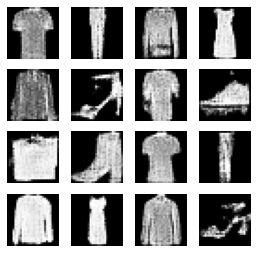

41600: [discriminator loss: 0.681538, acc: 0.554688] [adversarial loss: 0.696257, acc: 0.500000]
41601: [discriminator loss: 0.698105, acc: 0.539062] [adversarial loss: 0.720215, acc: 0.453125]
41602: [discriminator loss: 0.693310, acc: 0.578125] [adversarial loss: 0.752470, acc: 0.296875]
41603: [discriminator loss: 0.673043, acc: 0.578125] [adversarial loss: 0.708678, acc: 0.406250]
41604: [discriminator loss: 0.700366, acc: 0.460938] [adversarial loss: 0.830960, acc: 0.093750]
41605: [discriminator loss: 0.692567, acc: 0.507812] [adversarial loss: 0.734148, acc: 0.453125]
41606: [discriminator loss: 0.660829, acc: 0.656250] [adversarial loss: 0.866407, acc: 0.187500]
41607: [discriminator loss: 0.673862, acc: 0.585938] [adversarial loss: 0.707856, acc: 0.500000]
41608: [discriminator loss: 0.690355, acc: 0.593750] [adversarial loss: 0.751958, acc: 0.343750]
41609: [discriminator loss: 0.697871, acc: 0.539062] [adversarial loss: 0.691060, acc: 0.562500]
41610: [discriminator loss: 0.

41687: [discriminator loss: 0.692729, acc: 0.492188] [adversarial loss: 0.700719, acc: 0.515625]
41688: [discriminator loss: 0.682245, acc: 0.570312] [adversarial loss: 0.731431, acc: 0.406250]
41689: [discriminator loss: 0.686352, acc: 0.554688] [adversarial loss: 0.660217, acc: 0.687500]
41690: [discriminator loss: 0.689179, acc: 0.515625] [adversarial loss: 0.786590, acc: 0.312500]
41691: [discriminator loss: 0.699586, acc: 0.523438] [adversarial loss: 0.663140, acc: 0.625000]
41692: [discriminator loss: 0.701301, acc: 0.554688] [adversarial loss: 0.757570, acc: 0.265625]
41693: [discriminator loss: 0.694563, acc: 0.492188] [adversarial loss: 0.660889, acc: 0.609375]
41694: [discriminator loss: 0.683671, acc: 0.570312] [adversarial loss: 0.777946, acc: 0.156250]
41695: [discriminator loss: 0.677365, acc: 0.562500] [adversarial loss: 0.697525, acc: 0.468750]
41696: [discriminator loss: 0.680479, acc: 0.562500] [adversarial loss: 0.771199, acc: 0.218750]
41697: [discriminator loss: 0.

41775: [discriminator loss: 0.664519, acc: 0.640625] [adversarial loss: 0.764760, acc: 0.359375]
41776: [discriminator loss: 0.691580, acc: 0.546875] [adversarial loss: 0.739151, acc: 0.359375]
41777: [discriminator loss: 0.672821, acc: 0.578125] [adversarial loss: 0.706151, acc: 0.453125]
41778: [discriminator loss: 0.709987, acc: 0.523438] [adversarial loss: 0.751259, acc: 0.234375]
41779: [discriminator loss: 0.687626, acc: 0.570312] [adversarial loss: 0.696934, acc: 0.484375]
41780: [discriminator loss: 0.688937, acc: 0.523438] [adversarial loss: 0.728276, acc: 0.328125]
41781: [discriminator loss: 0.668077, acc: 0.625000] [adversarial loss: 0.804757, acc: 0.187500]
41782: [discriminator loss: 0.681666, acc: 0.554688] [adversarial loss: 0.741665, acc: 0.390625]
41783: [discriminator loss: 0.689316, acc: 0.515625] [adversarial loss: 0.665511, acc: 0.671875]
41784: [discriminator loss: 0.669976, acc: 0.593750] [adversarial loss: 0.732450, acc: 0.484375]
41785: [discriminator loss: 0.

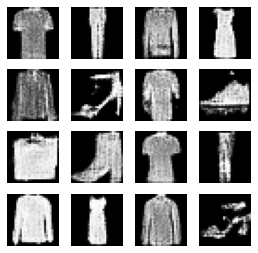

41800: [discriminator loss: 0.659992, acc: 0.609375] [adversarial loss: 0.728731, acc: 0.406250]
41801: [discriminator loss: 0.695090, acc: 0.531250] [adversarial loss: 0.706607, acc: 0.421875]
41802: [discriminator loss: 0.677659, acc: 0.562500] [adversarial loss: 0.826206, acc: 0.078125]
41803: [discriminator loss: 0.686705, acc: 0.546875] [adversarial loss: 0.667345, acc: 0.718750]
41804: [discriminator loss: 0.690190, acc: 0.523438] [adversarial loss: 0.713217, acc: 0.468750]
41805: [discriminator loss: 0.688992, acc: 0.554688] [adversarial loss: 0.747167, acc: 0.265625]
41806: [discriminator loss: 0.689232, acc: 0.546875] [adversarial loss: 0.731323, acc: 0.359375]
41807: [discriminator loss: 0.663175, acc: 0.593750] [adversarial loss: 0.718269, acc: 0.421875]
41808: [discriminator loss: 0.675513, acc: 0.593750] [adversarial loss: 0.741630, acc: 0.312500]
41809: [discriminator loss: 0.686867, acc: 0.546875] [adversarial loss: 0.688812, acc: 0.687500]
41810: [discriminator loss: 0.

41889: [discriminator loss: 0.687387, acc: 0.515625] [adversarial loss: 0.740009, acc: 0.265625]
41890: [discriminator loss: 0.683352, acc: 0.617188] [adversarial loss: 0.713880, acc: 0.515625]
41891: [discriminator loss: 0.671361, acc: 0.570312] [adversarial loss: 0.746031, acc: 0.359375]
41892: [discriminator loss: 0.668222, acc: 0.593750] [adversarial loss: 0.706095, acc: 0.453125]
41893: [discriminator loss: 0.686905, acc: 0.539062] [adversarial loss: 0.683597, acc: 0.515625]
41894: [discriminator loss: 0.689053, acc: 0.523438] [adversarial loss: 0.728713, acc: 0.390625]
41895: [discriminator loss: 0.679496, acc: 0.500000] [adversarial loss: 0.726481, acc: 0.406250]
41896: [discriminator loss: 0.673528, acc: 0.601562] [adversarial loss: 0.756538, acc: 0.265625]
41897: [discriminator loss: 0.672201, acc: 0.593750] [adversarial loss: 0.652537, acc: 0.703125]
41898: [discriminator loss: 0.681481, acc: 0.531250] [adversarial loss: 0.719263, acc: 0.437500]
41899: [discriminator loss: 0.

41976: [discriminator loss: 0.671863, acc: 0.585938] [adversarial loss: 0.751470, acc: 0.281250]
41977: [discriminator loss: 0.683888, acc: 0.484375] [adversarial loss: 0.790157, acc: 0.187500]
41978: [discriminator loss: 0.675468, acc: 0.523438] [adversarial loss: 0.691055, acc: 0.484375]
41979: [discriminator loss: 0.681482, acc: 0.554688] [adversarial loss: 0.733403, acc: 0.390625]
41980: [discriminator loss: 0.683676, acc: 0.585938] [adversarial loss: 0.826131, acc: 0.156250]
41981: [discriminator loss: 0.667186, acc: 0.601562] [adversarial loss: 0.665296, acc: 0.609375]
41982: [discriminator loss: 0.702290, acc: 0.484375] [adversarial loss: 0.707318, acc: 0.453125]
41983: [discriminator loss: 0.673557, acc: 0.523438] [adversarial loss: 0.744939, acc: 0.359375]
41984: [discriminator loss: 0.683398, acc: 0.585938] [adversarial loss: 0.653249, acc: 0.703125]
41985: [discriminator loss: 0.672414, acc: 0.593750] [adversarial loss: 0.798091, acc: 0.109375]
41986: [discriminator loss: 0.

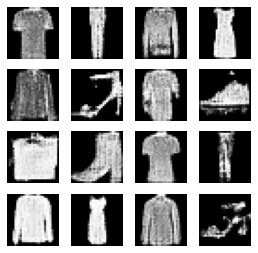

42000: [discriminator loss: 0.679058, acc: 0.554688] [adversarial loss: 0.716459, acc: 0.468750]
42001: [discriminator loss: 0.687580, acc: 0.500000] [adversarial loss: 0.715866, acc: 0.421875]
42002: [discriminator loss: 0.667012, acc: 0.640625] [adversarial loss: 0.718613, acc: 0.421875]
42003: [discriminator loss: 0.675245, acc: 0.601562] [adversarial loss: 0.632949, acc: 0.734375]
42004: [discriminator loss: 0.683774, acc: 0.500000] [adversarial loss: 0.743333, acc: 0.453125]
42005: [discriminator loss: 0.682545, acc: 0.531250] [adversarial loss: 0.735039, acc: 0.359375]
42006: [discriminator loss: 0.683952, acc: 0.570312] [adversarial loss: 0.765421, acc: 0.359375]
42007: [discriminator loss: 0.673282, acc: 0.554688] [adversarial loss: 0.757301, acc: 0.343750]
42008: [discriminator loss: 0.696292, acc: 0.546875] [adversarial loss: 0.681386, acc: 0.593750]
42009: [discriminator loss: 0.691991, acc: 0.523438] [adversarial loss: 0.838358, acc: 0.140625]
42010: [discriminator loss: 0.

42090: [discriminator loss: 0.702045, acc: 0.500000] [adversarial loss: 0.674946, acc: 0.562500]
42091: [discriminator loss: 0.681989, acc: 0.562500] [adversarial loss: 0.787290, acc: 0.218750]
42092: [discriminator loss: 0.683819, acc: 0.632812] [adversarial loss: 0.755005, acc: 0.343750]
42093: [discriminator loss: 0.674697, acc: 0.554688] [adversarial loss: 0.726760, acc: 0.406250]
42094: [discriminator loss: 0.687513, acc: 0.593750] [adversarial loss: 0.814331, acc: 0.218750]
42095: [discriminator loss: 0.691737, acc: 0.515625] [adversarial loss: 0.657701, acc: 0.656250]
42096: [discriminator loss: 0.676255, acc: 0.601562] [adversarial loss: 0.774055, acc: 0.312500]
42097: [discriminator loss: 0.699718, acc: 0.460938] [adversarial loss: 0.660739, acc: 0.609375]
42098: [discriminator loss: 0.686015, acc: 0.500000] [adversarial loss: 0.778493, acc: 0.343750]
42099: [discriminator loss: 0.680352, acc: 0.546875] [adversarial loss: 0.689860, acc: 0.515625]
42100: [discriminator loss: 0.

42177: [discriminator loss: 0.671841, acc: 0.570312] [adversarial loss: 0.697225, acc: 0.515625]
42178: [discriminator loss: 0.690997, acc: 0.507812] [adversarial loss: 0.722858, acc: 0.406250]
42179: [discriminator loss: 0.658864, acc: 0.617188] [adversarial loss: 0.718836, acc: 0.421875]
42180: [discriminator loss: 0.686045, acc: 0.531250] [adversarial loss: 0.699299, acc: 0.437500]
42181: [discriminator loss: 0.682442, acc: 0.523438] [adversarial loss: 0.735592, acc: 0.328125]
42182: [discriminator loss: 0.692168, acc: 0.492188] [adversarial loss: 0.758981, acc: 0.359375]
42183: [discriminator loss: 0.687688, acc: 0.562500] [adversarial loss: 0.709770, acc: 0.359375]
42184: [discriminator loss: 0.692365, acc: 0.554688] [adversarial loss: 0.710745, acc: 0.437500]
42185: [discriminator loss: 0.683546, acc: 0.546875] [adversarial loss: 0.726827, acc: 0.343750]
42186: [discriminator loss: 0.674970, acc: 0.593750] [adversarial loss: 0.756332, acc: 0.359375]
42187: [discriminator loss: 0.

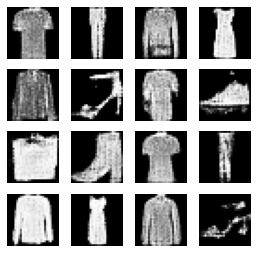

42200: [discriminator loss: 0.691992, acc: 0.554688] [adversarial loss: 0.678208, acc: 0.484375]
42201: [discriminator loss: 0.689155, acc: 0.539062] [adversarial loss: 0.797897, acc: 0.140625]
42202: [discriminator loss: 0.696032, acc: 0.531250] [adversarial loss: 0.643336, acc: 0.812500]
42203: [discriminator loss: 0.661967, acc: 0.593750] [adversarial loss: 0.843213, acc: 0.171875]
42204: [discriminator loss: 0.682696, acc: 0.554688] [adversarial loss: 0.660581, acc: 0.671875]
42205: [discriminator loss: 0.707819, acc: 0.453125] [adversarial loss: 0.796914, acc: 0.156250]
42206: [discriminator loss: 0.683872, acc: 0.562500] [adversarial loss: 0.735654, acc: 0.343750]
42207: [discriminator loss: 0.687816, acc: 0.531250] [adversarial loss: 0.756004, acc: 0.281250]
42208: [discriminator loss: 0.684922, acc: 0.562500] [adversarial loss: 0.686026, acc: 0.578125]
42209: [discriminator loss: 0.665862, acc: 0.585938] [adversarial loss: 0.694495, acc: 0.515625]
42210: [discriminator loss: 0.

42285: [discriminator loss: 0.692077, acc: 0.515625] [adversarial loss: 0.655253, acc: 0.671875]
42286: [discriminator loss: 0.681236, acc: 0.554688] [adversarial loss: 0.780482, acc: 0.250000]
42287: [discriminator loss: 0.655093, acc: 0.671875] [adversarial loss: 0.774425, acc: 0.359375]
42288: [discriminator loss: 0.684666, acc: 0.562500] [adversarial loss: 0.655192, acc: 0.671875]
42289: [discriminator loss: 0.694410, acc: 0.453125] [adversarial loss: 0.716307, acc: 0.375000]
42290: [discriminator loss: 0.669359, acc: 0.632812] [adversarial loss: 0.653724, acc: 0.578125]
42291: [discriminator loss: 0.681969, acc: 0.507812] [adversarial loss: 0.776876, acc: 0.156250]
42292: [discriminator loss: 0.670959, acc: 0.585938] [adversarial loss: 0.664720, acc: 0.609375]
42293: [discriminator loss: 0.667292, acc: 0.593750] [adversarial loss: 0.768798, acc: 0.265625]
42294: [discriminator loss: 0.699001, acc: 0.539062] [adversarial loss: 0.603701, acc: 0.765625]
42295: [discriminator loss: 0.

42370: [discriminator loss: 0.677292, acc: 0.539062] [adversarial loss: 0.777161, acc: 0.343750]
42371: [discriminator loss: 0.695124, acc: 0.554688] [adversarial loss: 0.676507, acc: 0.578125]
42372: [discriminator loss: 0.737023, acc: 0.445312] [adversarial loss: 0.614686, acc: 0.765625]
42373: [discriminator loss: 0.681703, acc: 0.554688] [adversarial loss: 0.810635, acc: 0.234375]
42374: [discriminator loss: 0.710415, acc: 0.492188] [adversarial loss: 0.685035, acc: 0.625000]
42375: [discriminator loss: 0.689488, acc: 0.539062] [adversarial loss: 0.679146, acc: 0.562500]
42376: [discriminator loss: 0.668107, acc: 0.585938] [adversarial loss: 0.741497, acc: 0.359375]
42377: [discriminator loss: 0.676646, acc: 0.523438] [adversarial loss: 0.695933, acc: 0.578125]
42378: [discriminator loss: 0.678880, acc: 0.523438] [adversarial loss: 0.758157, acc: 0.437500]
42379: [discriminator loss: 0.683468, acc: 0.562500] [adversarial loss: 0.677869, acc: 0.484375]
42380: [discriminator loss: 0.

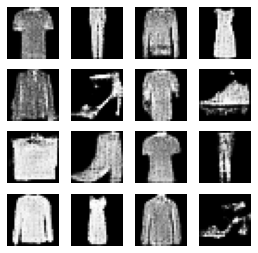

42400: [discriminator loss: 0.695211, acc: 0.492188] [adversarial loss: 0.747174, acc: 0.359375]
42401: [discriminator loss: 0.667791, acc: 0.609375] [adversarial loss: 0.687582, acc: 0.531250]
42402: [discriminator loss: 0.691352, acc: 0.539062] [adversarial loss: 0.730163, acc: 0.343750]
42403: [discriminator loss: 0.701728, acc: 0.476562] [adversarial loss: 0.652031, acc: 0.640625]
42404: [discriminator loss: 0.678554, acc: 0.570312] [adversarial loss: 0.755629, acc: 0.281250]
42405: [discriminator loss: 0.704967, acc: 0.445312] [adversarial loss: 0.647700, acc: 0.625000]
42406: [discriminator loss: 0.673605, acc: 0.578125] [adversarial loss: 0.781306, acc: 0.171875]
42407: [discriminator loss: 0.684357, acc: 0.562500] [adversarial loss: 0.648953, acc: 0.703125]
42408: [discriminator loss: 0.679361, acc: 0.554688] [adversarial loss: 0.729485, acc: 0.406250]
42409: [discriminator loss: 0.684265, acc: 0.546875] [adversarial loss: 0.721308, acc: 0.531250]
42410: [discriminator loss: 0.

42485: [discriminator loss: 0.684560, acc: 0.609375] [adversarial loss: 0.693405, acc: 0.593750]
42486: [discriminator loss: 0.678452, acc: 0.578125] [adversarial loss: 0.752200, acc: 0.296875]
42487: [discriminator loss: 0.680132, acc: 0.609375] [adversarial loss: 0.697413, acc: 0.562500]
42488: [discriminator loss: 0.690735, acc: 0.515625] [adversarial loss: 0.695462, acc: 0.484375]
42489: [discriminator loss: 0.696970, acc: 0.476562] [adversarial loss: 0.736790, acc: 0.343750]
42490: [discriminator loss: 0.673643, acc: 0.554688] [adversarial loss: 0.764753, acc: 0.390625]
42491: [discriminator loss: 0.709359, acc: 0.500000] [adversarial loss: 0.678385, acc: 0.578125]
42492: [discriminator loss: 0.681052, acc: 0.507812] [adversarial loss: 0.674242, acc: 0.671875]
42493: [discriminator loss: 0.691934, acc: 0.531250] [adversarial loss: 0.775632, acc: 0.203125]
42494: [discriminator loss: 0.677635, acc: 0.609375] [adversarial loss: 0.708396, acc: 0.437500]
42495: [discriminator loss: 0.

42572: [discriminator loss: 0.679692, acc: 0.632812] [adversarial loss: 0.661945, acc: 0.687500]
42573: [discriminator loss: 0.678173, acc: 0.531250] [adversarial loss: 0.862626, acc: 0.140625]
42574: [discriminator loss: 0.709572, acc: 0.578125] [adversarial loss: 0.738813, acc: 0.406250]
42575: [discriminator loss: 0.677000, acc: 0.601562] [adversarial loss: 0.749480, acc: 0.359375]
42576: [discriminator loss: 0.660874, acc: 0.632812] [adversarial loss: 0.780026, acc: 0.281250]
42577: [discriminator loss: 0.686960, acc: 0.554688] [adversarial loss: 0.673875, acc: 0.718750]
42578: [discriminator loss: 0.685796, acc: 0.554688] [adversarial loss: 0.771948, acc: 0.234375]
42579: [discriminator loss: 0.679497, acc: 0.546875] [adversarial loss: 0.720278, acc: 0.421875]
42580: [discriminator loss: 0.679012, acc: 0.546875] [adversarial loss: 0.661126, acc: 0.578125]
42581: [discriminator loss: 0.686226, acc: 0.523438] [adversarial loss: 0.743548, acc: 0.328125]
42582: [discriminator loss: 0.

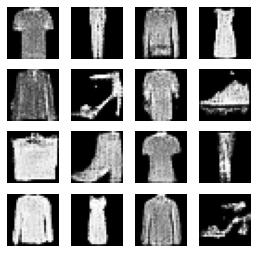

42600: [discriminator loss: 0.690968, acc: 0.484375] [adversarial loss: 0.764886, acc: 0.265625]
42601: [discriminator loss: 0.681584, acc: 0.523438] [adversarial loss: 0.685915, acc: 0.562500]
42602: [discriminator loss: 0.682346, acc: 0.539062] [adversarial loss: 0.739656, acc: 0.421875]
42603: [discriminator loss: 0.675421, acc: 0.601562] [adversarial loss: 0.703651, acc: 0.484375]
42604: [discriminator loss: 0.691425, acc: 0.523438] [adversarial loss: 0.747792, acc: 0.312500]
42605: [discriminator loss: 0.685728, acc: 0.523438] [adversarial loss: 0.721871, acc: 0.359375]
42606: [discriminator loss: 0.684081, acc: 0.609375] [adversarial loss: 0.661257, acc: 0.593750]
42607: [discriminator loss: 0.682210, acc: 0.570312] [adversarial loss: 0.783618, acc: 0.265625]
42608: [discriminator loss: 0.701862, acc: 0.500000] [adversarial loss: 0.651701, acc: 0.718750]
42609: [discriminator loss: 0.694343, acc: 0.484375] [adversarial loss: 0.793544, acc: 0.140625]
42610: [discriminator loss: 0.

42688: [discriminator loss: 0.681829, acc: 0.531250] [adversarial loss: 0.739325, acc: 0.343750]
42689: [discriminator loss: 0.688564, acc: 0.546875] [adversarial loss: 0.652330, acc: 0.656250]
42690: [discriminator loss: 0.677761, acc: 0.554688] [adversarial loss: 0.811403, acc: 0.203125]
42691: [discriminator loss: 0.683407, acc: 0.539062] [adversarial loss: 0.655036, acc: 0.671875]
42692: [discriminator loss: 0.692121, acc: 0.515625] [adversarial loss: 0.823986, acc: 0.203125]
42693: [discriminator loss: 0.683986, acc: 0.546875] [adversarial loss: 0.606219, acc: 0.781250]
42694: [discriminator loss: 0.682076, acc: 0.531250] [adversarial loss: 0.839523, acc: 0.125000]
42695: [discriminator loss: 0.689654, acc: 0.585938] [adversarial loss: 0.713942, acc: 0.421875]
42696: [discriminator loss: 0.668346, acc: 0.585938] [adversarial loss: 0.770343, acc: 0.156250]
42697: [discriminator loss: 0.689851, acc: 0.515625] [adversarial loss: 0.712683, acc: 0.421875]
42698: [discriminator loss: 0.

42773: [discriminator loss: 0.699858, acc: 0.507812] [adversarial loss: 0.816515, acc: 0.125000]
42774: [discriminator loss: 0.680063, acc: 0.554688] [adversarial loss: 0.603621, acc: 0.859375]
42775: [discriminator loss: 0.677920, acc: 0.523438] [adversarial loss: 0.834369, acc: 0.203125]
42776: [discriminator loss: 0.689921, acc: 0.570312] [adversarial loss: 0.756421, acc: 0.375000]
42777: [discriminator loss: 0.681148, acc: 0.578125] [adversarial loss: 0.661973, acc: 0.593750]
42778: [discriminator loss: 0.691075, acc: 0.453125] [adversarial loss: 0.720388, acc: 0.406250]
42779: [discriminator loss: 0.704100, acc: 0.437500] [adversarial loss: 0.730617, acc: 0.390625]
42780: [discriminator loss: 0.684420, acc: 0.554688] [adversarial loss: 0.731483, acc: 0.296875]
42781: [discriminator loss: 0.681060, acc: 0.539062] [adversarial loss: 0.684971, acc: 0.546875]
42782: [discriminator loss: 0.691894, acc: 0.531250] [adversarial loss: 0.794883, acc: 0.265625]
42783: [discriminator loss: 0.

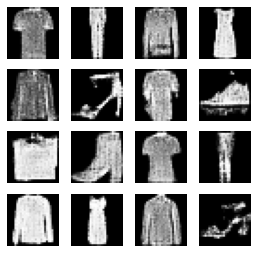

42800: [discriminator loss: 0.683655, acc: 0.570312] [adversarial loss: 0.801735, acc: 0.218750]
42801: [discriminator loss: 0.694239, acc: 0.531250] [adversarial loss: 0.759853, acc: 0.390625]
42802: [discriminator loss: 0.675648, acc: 0.562500] [adversarial loss: 0.793564, acc: 0.265625]
42803: [discriminator loss: 0.680142, acc: 0.570312] [adversarial loss: 0.596156, acc: 0.828125]
42804: [discriminator loss: 0.678806, acc: 0.515625] [adversarial loss: 0.773380, acc: 0.328125]
42805: [discriminator loss: 0.674374, acc: 0.554688] [adversarial loss: 0.651141, acc: 0.656250]
42806: [discriminator loss: 0.705931, acc: 0.507812] [adversarial loss: 0.824285, acc: 0.109375]
42807: [discriminator loss: 0.687958, acc: 0.546875] [adversarial loss: 0.684793, acc: 0.562500]
42808: [discriminator loss: 0.707839, acc: 0.437500] [adversarial loss: 0.746331, acc: 0.296875]
42809: [discriminator loss: 0.689982, acc: 0.515625] [adversarial loss: 0.681453, acc: 0.468750]
42810: [discriminator loss: 0.

42887: [discriminator loss: 0.682772, acc: 0.625000] [adversarial loss: 0.683569, acc: 0.546875]
42888: [discriminator loss: 0.702509, acc: 0.500000] [adversarial loss: 0.786487, acc: 0.187500]
42889: [discriminator loss: 0.697892, acc: 0.554688] [adversarial loss: 0.722295, acc: 0.484375]
42890: [discriminator loss: 0.678323, acc: 0.507812] [adversarial loss: 0.744142, acc: 0.359375]
42891: [discriminator loss: 0.676059, acc: 0.578125] [adversarial loss: 0.684802, acc: 0.484375]
42892: [discriminator loss: 0.682469, acc: 0.578125] [adversarial loss: 0.779804, acc: 0.171875]
42893: [discriminator loss: 0.666436, acc: 0.593750] [adversarial loss: 0.675778, acc: 0.515625]
42894: [discriminator loss: 0.685797, acc: 0.578125] [adversarial loss: 0.768683, acc: 0.234375]
42895: [discriminator loss: 0.683040, acc: 0.539062] [adversarial loss: 0.714028, acc: 0.500000]
42896: [discriminator loss: 0.683297, acc: 0.539062] [adversarial loss: 0.703525, acc: 0.468750]
42897: [discriminator loss: 0.

42975: [discriminator loss: 0.691853, acc: 0.500000] [adversarial loss: 0.724190, acc: 0.453125]
42976: [discriminator loss: 0.684956, acc: 0.500000] [adversarial loss: 0.776568, acc: 0.312500]
42977: [discriminator loss: 0.688278, acc: 0.500000] [adversarial loss: 0.715884, acc: 0.421875]
42978: [discriminator loss: 0.687451, acc: 0.531250] [adversarial loss: 0.798958, acc: 0.187500]
42979: [discriminator loss: 0.698729, acc: 0.546875] [adversarial loss: 0.714306, acc: 0.406250]
42980: [discriminator loss: 0.683065, acc: 0.554688] [adversarial loss: 0.741887, acc: 0.296875]
42981: [discriminator loss: 0.663089, acc: 0.632812] [adversarial loss: 0.698707, acc: 0.484375]
42982: [discriminator loss: 0.669482, acc: 0.625000] [adversarial loss: 0.702827, acc: 0.421875]
42983: [discriminator loss: 0.679759, acc: 0.570312] [adversarial loss: 0.803661, acc: 0.140625]
42984: [discriminator loss: 0.690306, acc: 0.515625] [adversarial loss: 0.668406, acc: 0.671875]
42985: [discriminator loss: 0.

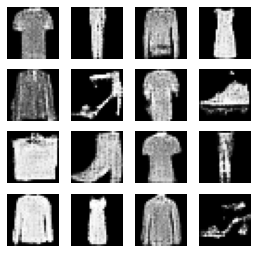

43000: [discriminator loss: 0.686565, acc: 0.593750] [adversarial loss: 0.748930, acc: 0.359375]
43001: [discriminator loss: 0.653350, acc: 0.617188] [adversarial loss: 0.739195, acc: 0.453125]
43002: [discriminator loss: 0.690035, acc: 0.562500] [adversarial loss: 0.651754, acc: 0.671875]
43003: [discriminator loss: 0.701683, acc: 0.523438] [adversarial loss: 0.687181, acc: 0.578125]
43004: [discriminator loss: 0.673486, acc: 0.578125] [adversarial loss: 0.711824, acc: 0.468750]
43005: [discriminator loss: 0.666403, acc: 0.632812] [adversarial loss: 0.675881, acc: 0.562500]
43006: [discriminator loss: 0.675627, acc: 0.554688] [adversarial loss: 0.703022, acc: 0.578125]
43007: [discriminator loss: 0.666798, acc: 0.585938] [adversarial loss: 0.639121, acc: 0.718750]
43008: [discriminator loss: 0.676651, acc: 0.515625] [adversarial loss: 0.713196, acc: 0.390625]
43009: [discriminator loss: 0.677881, acc: 0.570312] [adversarial loss: 0.759384, acc: 0.359375]
43010: [discriminator loss: 0.

43085: [discriminator loss: 0.703025, acc: 0.539062] [adversarial loss: 0.710978, acc: 0.437500]
43086: [discriminator loss: 0.686032, acc: 0.531250] [adversarial loss: 0.729760, acc: 0.421875]
43087: [discriminator loss: 0.686356, acc: 0.500000] [adversarial loss: 0.681342, acc: 0.531250]
43088: [discriminator loss: 0.675288, acc: 0.578125] [adversarial loss: 0.716980, acc: 0.375000]
43089: [discriminator loss: 0.703034, acc: 0.539062] [adversarial loss: 0.693070, acc: 0.468750]
43090: [discriminator loss: 0.677264, acc: 0.554688] [adversarial loss: 0.781022, acc: 0.250000]
43091: [discriminator loss: 0.694593, acc: 0.546875] [adversarial loss: 0.672977, acc: 0.609375]
43092: [discriminator loss: 0.674361, acc: 0.554688] [adversarial loss: 0.805449, acc: 0.203125]
43093: [discriminator loss: 0.663109, acc: 0.617188] [adversarial loss: 0.694355, acc: 0.484375]
43094: [discriminator loss: 0.687592, acc: 0.507812] [adversarial loss: 0.734341, acc: 0.421875]
43095: [discriminator loss: 0.

43170: [discriminator loss: 0.678516, acc: 0.546875] [adversarial loss: 0.727148, acc: 0.390625]
43171: [discriminator loss: 0.665734, acc: 0.593750] [adversarial loss: 0.692242, acc: 0.593750]
43172: [discriminator loss: 0.702619, acc: 0.492188] [adversarial loss: 0.736298, acc: 0.406250]
43173: [discriminator loss: 0.690360, acc: 0.539062] [adversarial loss: 0.736806, acc: 0.234375]
43174: [discriminator loss: 0.678370, acc: 0.601562] [adversarial loss: 0.734200, acc: 0.312500]
43175: [discriminator loss: 0.670554, acc: 0.640625] [adversarial loss: 0.723561, acc: 0.578125]
43176: [discriminator loss: 0.668609, acc: 0.570312] [adversarial loss: 0.827330, acc: 0.093750]
43177: [discriminator loss: 0.672129, acc: 0.539062] [adversarial loss: 0.634545, acc: 0.687500]
43178: [discriminator loss: 0.691283, acc: 0.507812] [adversarial loss: 0.745366, acc: 0.312500]
43179: [discriminator loss: 0.687291, acc: 0.554688] [adversarial loss: 0.716779, acc: 0.390625]
43180: [discriminator loss: 0.

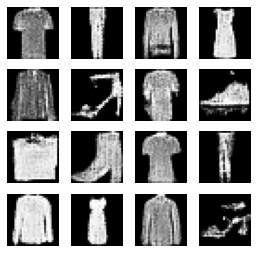

43200: [discriminator loss: 0.673855, acc: 0.570312] [adversarial loss: 0.658412, acc: 0.625000]
43201: [discriminator loss: 0.692977, acc: 0.468750] [adversarial loss: 0.779509, acc: 0.234375]
43202: [discriminator loss: 0.683994, acc: 0.578125] [adversarial loss: 0.618546, acc: 0.828125]
43203: [discriminator loss: 0.688225, acc: 0.507812] [adversarial loss: 0.726529, acc: 0.406250]
43204: [discriminator loss: 0.683928, acc: 0.539062] [adversarial loss: 0.715446, acc: 0.484375]
43205: [discriminator loss: 0.653302, acc: 0.609375] [adversarial loss: 0.679563, acc: 0.562500]
43206: [discriminator loss: 0.662910, acc: 0.617188] [adversarial loss: 0.789620, acc: 0.265625]
43207: [discriminator loss: 0.710543, acc: 0.500000] [adversarial loss: 0.680290, acc: 0.531250]
43208: [discriminator loss: 0.681553, acc: 0.500000] [adversarial loss: 0.768516, acc: 0.281250]
43209: [discriminator loss: 0.695403, acc: 0.539062] [adversarial loss: 0.674790, acc: 0.578125]
43210: [discriminator loss: 0.

43286: [discriminator loss: 0.662420, acc: 0.625000] [adversarial loss: 0.737796, acc: 0.500000]
43287: [discriminator loss: 0.683976, acc: 0.492188] [adversarial loss: 0.677228, acc: 0.500000]
43288: [discriminator loss: 0.699631, acc: 0.507812] [adversarial loss: 0.747938, acc: 0.296875]
43289: [discriminator loss: 0.685897, acc: 0.507812] [adversarial loss: 0.737119, acc: 0.343750]
43290: [discriminator loss: 0.672582, acc: 0.554688] [adversarial loss: 0.785617, acc: 0.187500]
43291: [discriminator loss: 0.701778, acc: 0.531250] [adversarial loss: 0.720975, acc: 0.375000]
43292: [discriminator loss: 0.669029, acc: 0.648438] [adversarial loss: 0.728209, acc: 0.484375]
43293: [discriminator loss: 0.681093, acc: 0.523438] [adversarial loss: 0.744360, acc: 0.328125]
43294: [discriminator loss: 0.680430, acc: 0.562500] [adversarial loss: 0.700737, acc: 0.453125]
43295: [discriminator loss: 0.696977, acc: 0.507812] [adversarial loss: 0.748864, acc: 0.390625]
43296: [discriminator loss: 0.

43371: [discriminator loss: 0.685382, acc: 0.554688] [adversarial loss: 0.715971, acc: 0.437500]
43372: [discriminator loss: 0.658930, acc: 0.656250] [adversarial loss: 0.770941, acc: 0.296875]
43373: [discriminator loss: 0.689312, acc: 0.570312] [adversarial loss: 0.665329, acc: 0.625000]
43374: [discriminator loss: 0.704227, acc: 0.492188] [adversarial loss: 0.801477, acc: 0.093750]
43375: [discriminator loss: 0.682162, acc: 0.578125] [adversarial loss: 0.720872, acc: 0.390625]
43376: [discriminator loss: 0.665655, acc: 0.601562] [adversarial loss: 0.810481, acc: 0.125000]
43377: [discriminator loss: 0.663056, acc: 0.578125] [adversarial loss: 0.717085, acc: 0.468750]
43378: [discriminator loss: 0.664253, acc: 0.625000] [adversarial loss: 0.652860, acc: 0.609375]
43379: [discriminator loss: 0.690449, acc: 0.539062] [adversarial loss: 0.781164, acc: 0.390625]
43380: [discriminator loss: 0.682083, acc: 0.585938] [adversarial loss: 0.794052, acc: 0.250000]
43381: [discriminator loss: 0.

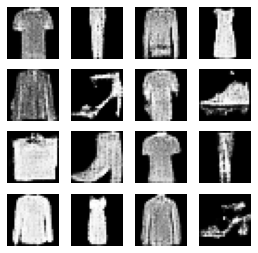

43400: [discriminator loss: 0.666856, acc: 0.609375] [adversarial loss: 0.748618, acc: 0.375000]
43401: [discriminator loss: 0.675787, acc: 0.546875] [adversarial loss: 0.757845, acc: 0.328125]
43402: [discriminator loss: 0.685074, acc: 0.476562] [adversarial loss: 0.740744, acc: 0.390625]
43403: [discriminator loss: 0.682146, acc: 0.515625] [adversarial loss: 0.832212, acc: 0.140625]
43404: [discriminator loss: 0.692743, acc: 0.523438] [adversarial loss: 0.689847, acc: 0.625000]
43405: [discriminator loss: 0.673650, acc: 0.593750] [adversarial loss: 0.715235, acc: 0.437500]
43406: [discriminator loss: 0.675097, acc: 0.531250] [adversarial loss: 0.700474, acc: 0.484375]
43407: [discriminator loss: 0.689971, acc: 0.507812] [adversarial loss: 0.634396, acc: 0.687500]
43408: [discriminator loss: 0.697340, acc: 0.445312] [adversarial loss: 0.832940, acc: 0.093750]
43409: [discriminator loss: 0.695318, acc: 0.500000] [adversarial loss: 0.683644, acc: 0.562500]
43410: [discriminator loss: 0.

43487: [discriminator loss: 0.672984, acc: 0.617188] [adversarial loss: 0.756595, acc: 0.296875]
43488: [discriminator loss: 0.677982, acc: 0.570312] [adversarial loss: 0.711232, acc: 0.484375]
43489: [discriminator loss: 0.668214, acc: 0.601562] [adversarial loss: 0.669162, acc: 0.484375]
43490: [discriminator loss: 0.698608, acc: 0.507812] [adversarial loss: 0.726099, acc: 0.375000]
43491: [discriminator loss: 0.681154, acc: 0.523438] [adversarial loss: 0.661714, acc: 0.640625]
43492: [discriminator loss: 0.665998, acc: 0.601562] [adversarial loss: 0.672485, acc: 0.609375]
43493: [discriminator loss: 0.667606, acc: 0.585938] [adversarial loss: 0.762034, acc: 0.234375]
43494: [discriminator loss: 0.669716, acc: 0.601562] [adversarial loss: 0.697490, acc: 0.546875]
43495: [discriminator loss: 0.688287, acc: 0.531250] [adversarial loss: 0.691127, acc: 0.531250]
43496: [discriminator loss: 0.676628, acc: 0.562500] [adversarial loss: 0.709760, acc: 0.421875]
43497: [discriminator loss: 0.

43572: [discriminator loss: 0.688114, acc: 0.515625] [adversarial loss: 0.773872, acc: 0.359375]
43573: [discriminator loss: 0.684884, acc: 0.562500] [adversarial loss: 0.776907, acc: 0.390625]
43574: [discriminator loss: 0.684929, acc: 0.523438] [adversarial loss: 0.673980, acc: 0.609375]
43575: [discriminator loss: 0.690995, acc: 0.523438] [adversarial loss: 0.782999, acc: 0.187500]
43576: [discriminator loss: 0.685980, acc: 0.609375] [adversarial loss: 0.780310, acc: 0.187500]
43577: [discriminator loss: 0.669741, acc: 0.578125] [adversarial loss: 0.641764, acc: 0.546875]
43578: [discriminator loss: 0.700120, acc: 0.492188] [adversarial loss: 0.764084, acc: 0.265625]
43579: [discriminator loss: 0.668729, acc: 0.570312] [adversarial loss: 0.702566, acc: 0.500000]
43580: [discriminator loss: 0.690632, acc: 0.531250] [adversarial loss: 0.715815, acc: 0.453125]
43581: [discriminator loss: 0.707203, acc: 0.468750] [adversarial loss: 0.736333, acc: 0.296875]
43582: [discriminator loss: 0.

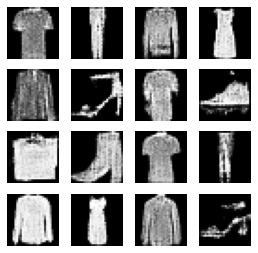

43600: [discriminator loss: 0.672867, acc: 0.585938] [adversarial loss: 0.659303, acc: 0.703125]
43601: [discriminator loss: 0.671720, acc: 0.585938] [adversarial loss: 0.790484, acc: 0.265625]
43602: [discriminator loss: 0.714294, acc: 0.484375] [adversarial loss: 0.755663, acc: 0.312500]
43603: [discriminator loss: 0.692779, acc: 0.539062] [adversarial loss: 0.705336, acc: 0.515625]
43604: [discriminator loss: 0.668317, acc: 0.562500] [adversarial loss: 0.754167, acc: 0.328125]
43605: [discriminator loss: 0.712228, acc: 0.484375] [adversarial loss: 0.671168, acc: 0.625000]
43606: [discriminator loss: 0.683699, acc: 0.523438] [adversarial loss: 0.739081, acc: 0.421875]
43607: [discriminator loss: 0.690414, acc: 0.500000] [adversarial loss: 0.664228, acc: 0.640625]
43608: [discriminator loss: 0.684246, acc: 0.523438] [adversarial loss: 0.647365, acc: 0.812500]
43609: [discriminator loss: 0.694702, acc: 0.523438] [adversarial loss: 0.812265, acc: 0.140625]
43610: [discriminator loss: 0.

43689: [discriminator loss: 0.681495, acc: 0.523438] [adversarial loss: 0.700925, acc: 0.515625]
43690: [discriminator loss: 0.676899, acc: 0.570312] [adversarial loss: 0.747505, acc: 0.312500]
43691: [discriminator loss: 0.680153, acc: 0.585938] [adversarial loss: 0.608841, acc: 0.765625]
43692: [discriminator loss: 0.672073, acc: 0.601562] [adversarial loss: 0.763301, acc: 0.281250]
43693: [discriminator loss: 0.684809, acc: 0.546875] [adversarial loss: 0.750070, acc: 0.375000]
43694: [discriminator loss: 0.682051, acc: 0.546875] [adversarial loss: 0.717224, acc: 0.359375]
43695: [discriminator loss: 0.688334, acc: 0.523438] [adversarial loss: 0.692439, acc: 0.515625]
43696: [discriminator loss: 0.703057, acc: 0.476562] [adversarial loss: 0.741110, acc: 0.265625]
43697: [discriminator loss: 0.671759, acc: 0.601562] [adversarial loss: 0.704879, acc: 0.546875]
43698: [discriminator loss: 0.681814, acc: 0.531250] [adversarial loss: 0.773720, acc: 0.156250]
43699: [discriminator loss: 0.

43774: [discriminator loss: 0.672108, acc: 0.585938] [adversarial loss: 0.672217, acc: 0.593750]
43775: [discriminator loss: 0.696683, acc: 0.437500] [adversarial loss: 0.745181, acc: 0.343750]
43776: [discriminator loss: 0.716408, acc: 0.492188] [adversarial loss: 0.728762, acc: 0.375000]
43777: [discriminator loss: 0.681083, acc: 0.554688] [adversarial loss: 0.718237, acc: 0.328125]
43778: [discriminator loss: 0.679564, acc: 0.585938] [adversarial loss: 0.719620, acc: 0.375000]
43779: [discriminator loss: 0.671931, acc: 0.609375] [adversarial loss: 0.759356, acc: 0.296875]
43780: [discriminator loss: 0.685296, acc: 0.546875] [adversarial loss: 0.718280, acc: 0.453125]
43781: [discriminator loss: 0.674164, acc: 0.546875] [adversarial loss: 0.691153, acc: 0.625000]
43782: [discriminator loss: 0.703777, acc: 0.500000] [adversarial loss: 0.819468, acc: 0.187500]
43783: [discriminator loss: 0.668966, acc: 0.593750] [adversarial loss: 0.747309, acc: 0.343750]
43784: [discriminator loss: 0.

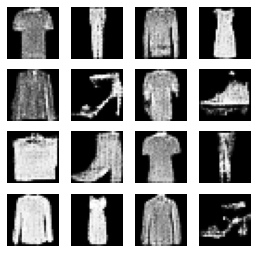

43800: [discriminator loss: 0.683757, acc: 0.500000] [adversarial loss: 0.789447, acc: 0.234375]
43801: [discriminator loss: 0.676336, acc: 0.562500] [adversarial loss: 0.656466, acc: 0.750000]
43802: [discriminator loss: 0.697268, acc: 0.445312] [adversarial loss: 0.776276, acc: 0.234375]
43803: [discriminator loss: 0.681826, acc: 0.554688] [adversarial loss: 0.683107, acc: 0.593750]
43804: [discriminator loss: 0.698811, acc: 0.539062] [adversarial loss: 0.717568, acc: 0.437500]
43805: [discriminator loss: 0.672586, acc: 0.562500] [adversarial loss: 0.682205, acc: 0.593750]
43806: [discriminator loss: 0.683514, acc: 0.523438] [adversarial loss: 0.741303, acc: 0.359375]
43807: [discriminator loss: 0.667808, acc: 0.617188] [adversarial loss: 0.667167, acc: 0.671875]
43808: [discriminator loss: 0.694401, acc: 0.507812] [adversarial loss: 0.775283, acc: 0.203125]
43809: [discriminator loss: 0.677799, acc: 0.640625] [adversarial loss: 0.714938, acc: 0.421875]
43810: [discriminator loss: 0.

43888: [discriminator loss: 0.694184, acc: 0.539062] [adversarial loss: 0.898794, acc: 0.093750]
43889: [discriminator loss: 0.712968, acc: 0.500000] [adversarial loss: 0.752397, acc: 0.203125]
43890: [discriminator loss: 0.676533, acc: 0.570312] [adversarial loss: 0.684695, acc: 0.593750]
43891: [discriminator loss: 0.691478, acc: 0.539062] [adversarial loss: 0.716614, acc: 0.500000]
43892: [discriminator loss: 0.699379, acc: 0.523438] [adversarial loss: 0.713071, acc: 0.406250]
43893: [discriminator loss: 0.683203, acc: 0.515625] [adversarial loss: 0.727593, acc: 0.406250]
43894: [discriminator loss: 0.703886, acc: 0.437500] [adversarial loss: 0.819525, acc: 0.109375]
43895: [discriminator loss: 0.695110, acc: 0.492188] [adversarial loss: 0.657434, acc: 0.687500]
43896: [discriminator loss: 0.683750, acc: 0.578125] [adversarial loss: 0.789635, acc: 0.281250]
43897: [discriminator loss: 0.675319, acc: 0.625000] [adversarial loss: 0.747354, acc: 0.328125]
43898: [discriminator loss: 0.

43975: [discriminator loss: 0.691601, acc: 0.476562] [adversarial loss: 0.740274, acc: 0.312500]
43976: [discriminator loss: 0.668846, acc: 0.585938] [adversarial loss: 0.725162, acc: 0.406250]
43977: [discriminator loss: 0.677308, acc: 0.523438] [adversarial loss: 0.743736, acc: 0.312500]
43978: [discriminator loss: 0.683986, acc: 0.500000] [adversarial loss: 0.682763, acc: 0.625000]
43979: [discriminator loss: 0.675241, acc: 0.523438] [adversarial loss: 0.790513, acc: 0.250000]
43980: [discriminator loss: 0.667480, acc: 0.609375] [adversarial loss: 0.715636, acc: 0.421875]
43981: [discriminator loss: 0.683262, acc: 0.546875] [adversarial loss: 0.800175, acc: 0.171875]
43982: [discriminator loss: 0.689219, acc: 0.523438] [adversarial loss: 0.712509, acc: 0.421875]
43983: [discriminator loss: 0.672702, acc: 0.570312] [adversarial loss: 0.869232, acc: 0.109375]
43984: [discriminator loss: 0.693754, acc: 0.531250] [adversarial loss: 0.663897, acc: 0.640625]
43985: [discriminator loss: 0.

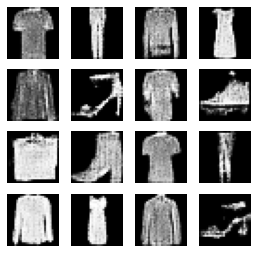

44000: [discriminator loss: 0.691503, acc: 0.445312] [adversarial loss: 0.772605, acc: 0.203125]
44001: [discriminator loss: 0.693537, acc: 0.531250] [adversarial loss: 0.664637, acc: 0.656250]
44002: [discriminator loss: 0.685374, acc: 0.515625] [adversarial loss: 0.719072, acc: 0.296875]
44003: [discriminator loss: 0.682847, acc: 0.593750] [adversarial loss: 0.734518, acc: 0.343750]
44004: [discriminator loss: 0.663314, acc: 0.648438] [adversarial loss: 0.676304, acc: 0.609375]
44005: [discriminator loss: 0.678154, acc: 0.578125] [adversarial loss: 0.771010, acc: 0.234375]
44006: [discriminator loss: 0.682759, acc: 0.523438] [adversarial loss: 0.680508, acc: 0.531250]
44007: [discriminator loss: 0.682317, acc: 0.539062] [adversarial loss: 0.692966, acc: 0.562500]
44008: [discriminator loss: 0.692377, acc: 0.523438] [adversarial loss: 0.787797, acc: 0.359375]
44009: [discriminator loss: 0.685099, acc: 0.593750] [adversarial loss: 0.666065, acc: 0.609375]
44010: [discriminator loss: 0.

44085: [discriminator loss: 0.690764, acc: 0.554688] [adversarial loss: 0.757050, acc: 0.296875]
44086: [discriminator loss: 0.676682, acc: 0.531250] [adversarial loss: 0.722854, acc: 0.406250]
44087: [discriminator loss: 0.695340, acc: 0.523438] [adversarial loss: 0.814286, acc: 0.140625]
44088: [discriminator loss: 0.684788, acc: 0.570312] [adversarial loss: 0.643197, acc: 0.796875]
44089: [discriminator loss: 0.697228, acc: 0.523438] [adversarial loss: 0.789509, acc: 0.234375]
44090: [discriminator loss: 0.698546, acc: 0.546875] [adversarial loss: 0.667681, acc: 0.609375]
44091: [discriminator loss: 0.672271, acc: 0.585938] [adversarial loss: 0.702576, acc: 0.531250]
44092: [discriminator loss: 0.677204, acc: 0.539062] [adversarial loss: 0.786915, acc: 0.296875]
44093: [discriminator loss: 0.676253, acc: 0.570312] [adversarial loss: 0.727980, acc: 0.359375]
44094: [discriminator loss: 0.679455, acc: 0.554688] [adversarial loss: 0.725121, acc: 0.312500]
44095: [discriminator loss: 0.

44171: [discriminator loss: 0.667647, acc: 0.625000] [adversarial loss: 0.758180, acc: 0.312500]
44172: [discriminator loss: 0.700470, acc: 0.546875] [adversarial loss: 0.609983, acc: 0.750000]
44173: [discriminator loss: 0.696083, acc: 0.507812] [adversarial loss: 0.811797, acc: 0.109375]
44174: [discriminator loss: 0.698487, acc: 0.531250] [adversarial loss: 0.649632, acc: 0.671875]
44175: [discriminator loss: 0.684915, acc: 0.585938] [adversarial loss: 0.791104, acc: 0.203125]
44176: [discriminator loss: 0.701038, acc: 0.476562] [adversarial loss: 0.690480, acc: 0.515625]
44177: [discriminator loss: 0.679301, acc: 0.578125] [adversarial loss: 0.797622, acc: 0.234375]
44178: [discriminator loss: 0.679683, acc: 0.562500] [adversarial loss: 0.648725, acc: 0.703125]
44179: [discriminator loss: 0.662199, acc: 0.632812] [adversarial loss: 0.698795, acc: 0.500000]
44180: [discriminator loss: 0.686301, acc: 0.546875] [adversarial loss: 0.748827, acc: 0.359375]
44181: [discriminator loss: 0.

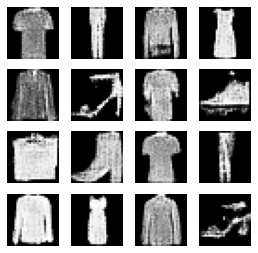

44200: [discriminator loss: 0.648455, acc: 0.718750] [adversarial loss: 0.697084, acc: 0.640625]
44201: [discriminator loss: 0.675159, acc: 0.562500] [adversarial loss: 0.725451, acc: 0.375000]
44202: [discriminator loss: 0.692531, acc: 0.570312] [adversarial loss: 0.726092, acc: 0.328125]
44203: [discriminator loss: 0.680870, acc: 0.617188] [adversarial loss: 0.719920, acc: 0.406250]
44204: [discriminator loss: 0.673887, acc: 0.632812] [adversarial loss: 0.757202, acc: 0.343750]
44205: [discriminator loss: 0.669755, acc: 0.546875] [adversarial loss: 0.699017, acc: 0.546875]
44206: [discriminator loss: 0.672671, acc: 0.601562] [adversarial loss: 0.761398, acc: 0.296875]
44207: [discriminator loss: 0.668168, acc: 0.601562] [adversarial loss: 0.637985, acc: 0.703125]
44208: [discriminator loss: 0.678409, acc: 0.562500] [adversarial loss: 0.838655, acc: 0.140625]
44209: [discriminator loss: 0.696093, acc: 0.546875] [adversarial loss: 0.708434, acc: 0.421875]
44210: [discriminator loss: 0.

44286: [discriminator loss: 0.712637, acc: 0.484375] [adversarial loss: 0.790579, acc: 0.203125]
44287: [discriminator loss: 0.694154, acc: 0.570312] [adversarial loss: 0.726653, acc: 0.406250]
44288: [discriminator loss: 0.680947, acc: 0.554688] [adversarial loss: 0.743268, acc: 0.265625]
44289: [discriminator loss: 0.685759, acc: 0.546875] [adversarial loss: 0.721635, acc: 0.359375]
44290: [discriminator loss: 0.671167, acc: 0.632812] [adversarial loss: 0.689799, acc: 0.531250]
44291: [discriminator loss: 0.693691, acc: 0.570312] [adversarial loss: 0.803398, acc: 0.125000]
44292: [discriminator loss: 0.681852, acc: 0.585938] [adversarial loss: 0.680923, acc: 0.562500]
44293: [discriminator loss: 0.695724, acc: 0.523438] [adversarial loss: 0.790047, acc: 0.187500]
44294: [discriminator loss: 0.660549, acc: 0.625000] [adversarial loss: 0.638840, acc: 0.718750]
44295: [discriminator loss: 0.682553, acc: 0.515625] [adversarial loss: 0.759787, acc: 0.281250]
44296: [discriminator loss: 0.

44374: [discriminator loss: 0.693810, acc: 0.523438] [adversarial loss: 0.705835, acc: 0.468750]
44375: [discriminator loss: 0.689227, acc: 0.507812] [adversarial loss: 0.829345, acc: 0.171875]
44376: [discriminator loss: 0.663894, acc: 0.578125] [adversarial loss: 0.633151, acc: 0.718750]
44377: [discriminator loss: 0.701928, acc: 0.460938] [adversarial loss: 0.840842, acc: 0.171875]
44378: [discriminator loss: 0.681663, acc: 0.562500] [adversarial loss: 0.675673, acc: 0.593750]
44379: [discriminator loss: 0.688809, acc: 0.476562] [adversarial loss: 0.737664, acc: 0.343750]
44380: [discriminator loss: 0.680543, acc: 0.578125] [adversarial loss: 0.634127, acc: 0.734375]
44381: [discriminator loss: 0.697964, acc: 0.500000] [adversarial loss: 0.791838, acc: 0.171875]
44382: [discriminator loss: 0.681098, acc: 0.531250] [adversarial loss: 0.711334, acc: 0.468750]
44383: [discriminator loss: 0.684569, acc: 0.531250] [adversarial loss: 0.768654, acc: 0.234375]
44384: [discriminator loss: 0.

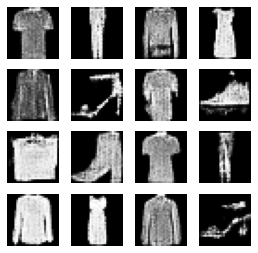

44400: [discriminator loss: 0.678881, acc: 0.585938] [adversarial loss: 0.655307, acc: 0.687500]
44401: [discriminator loss: 0.696170, acc: 0.484375] [adversarial loss: 0.808930, acc: 0.156250]
44402: [discriminator loss: 0.674226, acc: 0.554688] [adversarial loss: 0.685294, acc: 0.609375]
44403: [discriminator loss: 0.674739, acc: 0.539062] [adversarial loss: 0.772361, acc: 0.234375]
44404: [discriminator loss: 0.686502, acc: 0.515625] [adversarial loss: 0.674344, acc: 0.671875]
44405: [discriminator loss: 0.686978, acc: 0.570312] [adversarial loss: 0.703946, acc: 0.531250]
44406: [discriminator loss: 0.711032, acc: 0.460938] [adversarial loss: 0.714454, acc: 0.453125]
44407: [discriminator loss: 0.685420, acc: 0.539062] [adversarial loss: 0.711770, acc: 0.468750]
44408: [discriminator loss: 0.701201, acc: 0.460938] [adversarial loss: 0.809210, acc: 0.093750]
44409: [discriminator loss: 0.690271, acc: 0.539062] [adversarial loss: 0.701374, acc: 0.500000]
44410: [discriminator loss: 0.

44487: [discriminator loss: 0.670714, acc: 0.609375] [adversarial loss: 0.712033, acc: 0.484375]
44488: [discriminator loss: 0.684793, acc: 0.539062] [adversarial loss: 0.725207, acc: 0.375000]
44489: [discriminator loss: 0.692700, acc: 0.484375] [adversarial loss: 0.667346, acc: 0.718750]
44490: [discriminator loss: 0.690476, acc: 0.476562] [adversarial loss: 0.800151, acc: 0.125000]
44491: [discriminator loss: 0.674521, acc: 0.570312] [adversarial loss: 0.734566, acc: 0.359375]
44492: [discriminator loss: 0.691272, acc: 0.539062] [adversarial loss: 0.644678, acc: 0.703125]
44493: [discriminator loss: 0.683233, acc: 0.562500] [adversarial loss: 0.727667, acc: 0.375000]
44494: [discriminator loss: 0.697278, acc: 0.546875] [adversarial loss: 0.653498, acc: 0.656250]
44495: [discriminator loss: 0.677679, acc: 0.554688] [adversarial loss: 0.786335, acc: 0.125000]
44496: [discriminator loss: 0.677285, acc: 0.539062] [adversarial loss: 0.663926, acc: 0.656250]
44497: [discriminator loss: 0.

44574: [discriminator loss: 0.678339, acc: 0.601562] [adversarial loss: 0.755565, acc: 0.375000]
44575: [discriminator loss: 0.688727, acc: 0.515625] [adversarial loss: 0.729128, acc: 0.375000]
44576: [discriminator loss: 0.669477, acc: 0.632812] [adversarial loss: 0.711219, acc: 0.375000]
44577: [discriminator loss: 0.682369, acc: 0.500000] [adversarial loss: 0.718498, acc: 0.421875]
44578: [discriminator loss: 0.688718, acc: 0.515625] [adversarial loss: 0.822582, acc: 0.125000]
44579: [discriminator loss: 0.695855, acc: 0.531250] [adversarial loss: 0.592838, acc: 0.765625]
44580: [discriminator loss: 0.673148, acc: 0.531250] [adversarial loss: 0.786788, acc: 0.187500]
44581: [discriminator loss: 0.674686, acc: 0.578125] [adversarial loss: 0.771795, acc: 0.281250]
44582: [discriminator loss: 0.681414, acc: 0.609375] [adversarial loss: 0.609843, acc: 0.750000]
44583: [discriminator loss: 0.697633, acc: 0.523438] [adversarial loss: 0.783181, acc: 0.250000]
44584: [discriminator loss: 0.

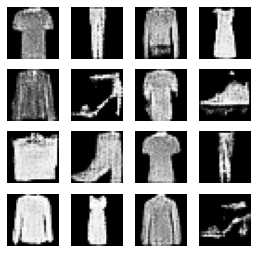

44600: [discriminator loss: 0.663153, acc: 0.625000] [adversarial loss: 0.745708, acc: 0.546875]
44601: [discriminator loss: 0.656159, acc: 0.578125] [adversarial loss: 0.792986, acc: 0.437500]
44602: [discriminator loss: 0.668799, acc: 0.593750] [adversarial loss: 0.718029, acc: 0.593750]
44603: [discriminator loss: 0.680542, acc: 0.546875] [adversarial loss: 0.721565, acc: 0.375000]
44604: [discriminator loss: 0.682425, acc: 0.523438] [adversarial loss: 0.707034, acc: 0.484375]
44605: [discriminator loss: 0.676304, acc: 0.562500] [adversarial loss: 0.802081, acc: 0.234375]
44606: [discriminator loss: 0.677751, acc: 0.554688] [adversarial loss: 0.688692, acc: 0.500000]
44607: [discriminator loss: 0.694690, acc: 0.507812] [adversarial loss: 0.661243, acc: 0.609375]
44608: [discriminator loss: 0.670340, acc: 0.585938] [adversarial loss: 0.784111, acc: 0.281250]
44609: [discriminator loss: 0.679167, acc: 0.609375] [adversarial loss: 0.762356, acc: 0.375000]
44610: [discriminator loss: 0.

44690: [discriminator loss: 0.666675, acc: 0.593750] [adversarial loss: 0.767675, acc: 0.375000]
44691: [discriminator loss: 0.710038, acc: 0.476562] [adversarial loss: 0.730253, acc: 0.281250]
44692: [discriminator loss: 0.677357, acc: 0.570312] [adversarial loss: 0.711563, acc: 0.546875]
44693: [discriminator loss: 0.673305, acc: 0.578125] [adversarial loss: 0.788435, acc: 0.328125]
44694: [discriminator loss: 0.671828, acc: 0.578125] [adversarial loss: 0.739295, acc: 0.390625]
44695: [discriminator loss: 0.677776, acc: 0.539062] [adversarial loss: 0.684835, acc: 0.562500]
44696: [discriminator loss: 0.659594, acc: 0.640625] [adversarial loss: 0.809030, acc: 0.218750]
44697: [discriminator loss: 0.683882, acc: 0.554688] [adversarial loss: 0.674756, acc: 0.578125]
44698: [discriminator loss: 0.675957, acc: 0.585938] [adversarial loss: 0.820789, acc: 0.156250]
44699: [discriminator loss: 0.686034, acc: 0.562500] [adversarial loss: 0.591263, acc: 0.828125]
44700: [discriminator loss: 0.

44779: [discriminator loss: 0.675640, acc: 0.585938] [adversarial loss: 0.687465, acc: 0.562500]
44780: [discriminator loss: 0.703980, acc: 0.484375] [adversarial loss: 0.860636, acc: 0.078125]
44781: [discriminator loss: 0.701229, acc: 0.531250] [adversarial loss: 0.695984, acc: 0.562500]
44782: [discriminator loss: 0.660343, acc: 0.625000] [adversarial loss: 0.789317, acc: 0.265625]
44783: [discriminator loss: 0.665691, acc: 0.632812] [adversarial loss: 0.750692, acc: 0.390625]
44784: [discriminator loss: 0.686642, acc: 0.554688] [adversarial loss: 0.802807, acc: 0.218750]
44785: [discriminator loss: 0.693557, acc: 0.546875] [adversarial loss: 0.787475, acc: 0.375000]
44786: [discriminator loss: 0.693951, acc: 0.531250] [adversarial loss: 0.799110, acc: 0.265625]
44787: [discriminator loss: 0.683920, acc: 0.570312] [adversarial loss: 0.667531, acc: 0.593750]
44788: [discriminator loss: 0.696303, acc: 0.523438] [adversarial loss: 0.704966, acc: 0.468750]
44789: [discriminator loss: 0.

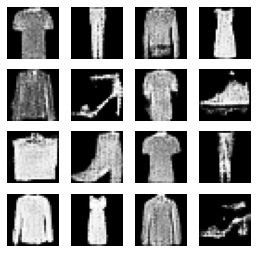

44800: [discriminator loss: 0.705067, acc: 0.445312] [adversarial loss: 0.705100, acc: 0.484375]
44801: [discriminator loss: 0.676506, acc: 0.617188] [adversarial loss: 0.759590, acc: 0.328125]
44802: [discriminator loss: 0.677397, acc: 0.578125] [adversarial loss: 0.710137, acc: 0.562500]
44803: [discriminator loss: 0.662601, acc: 0.640625] [adversarial loss: 0.626030, acc: 0.734375]
44804: [discriminator loss: 0.678041, acc: 0.539062] [adversarial loss: 0.865169, acc: 0.093750]
44805: [discriminator loss: 0.693527, acc: 0.500000] [adversarial loss: 0.680925, acc: 0.593750]
44806: [discriminator loss: 0.684612, acc: 0.578125] [adversarial loss: 0.703090, acc: 0.453125]
44807: [discriminator loss: 0.679664, acc: 0.554688] [adversarial loss: 0.735492, acc: 0.500000]
44808: [discriminator loss: 0.674236, acc: 0.601562] [adversarial loss: 0.624376, acc: 0.625000]
44809: [discriminator loss: 0.670648, acc: 0.554688] [adversarial loss: 0.732735, acc: 0.484375]
44810: [discriminator loss: 0.

44889: [discriminator loss: 0.684636, acc: 0.546875] [adversarial loss: 0.704248, acc: 0.437500]
44890: [discriminator loss: 0.686486, acc: 0.531250] [adversarial loss: 0.700847, acc: 0.484375]
44891: [discriminator loss: 0.672923, acc: 0.585938] [adversarial loss: 0.842639, acc: 0.203125]
44892: [discriminator loss: 0.692330, acc: 0.562500] [adversarial loss: 0.775363, acc: 0.281250]
44893: [discriminator loss: 0.667180, acc: 0.570312] [adversarial loss: 0.691128, acc: 0.484375]
44894: [discriminator loss: 0.688889, acc: 0.578125] [adversarial loss: 0.693987, acc: 0.484375]
44895: [discriminator loss: 0.689143, acc: 0.578125] [adversarial loss: 0.706931, acc: 0.500000]
44896: [discriminator loss: 0.679467, acc: 0.570312] [adversarial loss: 0.735938, acc: 0.421875]
44897: [discriminator loss: 0.691637, acc: 0.468750] [adversarial loss: 0.705397, acc: 0.437500]
44898: [discriminator loss: 0.698738, acc: 0.500000] [adversarial loss: 0.763234, acc: 0.203125]
44899: [discriminator loss: 0.

44978: [discriminator loss: 0.679673, acc: 0.593750] [adversarial loss: 0.630610, acc: 0.718750]
44979: [discriminator loss: 0.695016, acc: 0.507812] [adversarial loss: 0.816785, acc: 0.125000]
44980: [discriminator loss: 0.694744, acc: 0.507812] [adversarial loss: 0.662535, acc: 0.656250]
44981: [discriminator loss: 0.684218, acc: 0.531250] [adversarial loss: 0.748048, acc: 0.406250]
44982: [discriminator loss: 0.672123, acc: 0.539062] [adversarial loss: 0.686261, acc: 0.546875]
44983: [discriminator loss: 0.696824, acc: 0.562500] [adversarial loss: 0.689100, acc: 0.531250]
44984: [discriminator loss: 0.684078, acc: 0.546875] [adversarial loss: 0.622158, acc: 0.781250]
44985: [discriminator loss: 0.688162, acc: 0.507812] [adversarial loss: 0.759013, acc: 0.359375]
44986: [discriminator loss: 0.671139, acc: 0.554688] [adversarial loss: 0.678146, acc: 0.593750]
44987: [discriminator loss: 0.659353, acc: 0.601562] [adversarial loss: 0.676335, acc: 0.546875]
44988: [discriminator loss: 0.

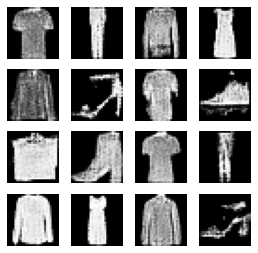

45000: [discriminator loss: 0.666818, acc: 0.601562] [adversarial loss: 0.715096, acc: 0.500000]
45001: [discriminator loss: 0.679775, acc: 0.585938] [adversarial loss: 0.720614, acc: 0.390625]
45002: [discriminator loss: 0.687665, acc: 0.562500] [adversarial loss: 0.709424, acc: 0.406250]
45003: [discriminator loss: 0.665987, acc: 0.601562] [adversarial loss: 0.719330, acc: 0.390625]
45004: [discriminator loss: 0.683750, acc: 0.546875] [adversarial loss: 0.653347, acc: 0.718750]
45005: [discriminator loss: 0.671416, acc: 0.531250] [adversarial loss: 0.778252, acc: 0.312500]
45006: [discriminator loss: 0.715112, acc: 0.484375] [adversarial loss: 0.654219, acc: 0.703125]
45007: [discriminator loss: 0.681332, acc: 0.546875] [adversarial loss: 0.740258, acc: 0.328125]
45008: [discriminator loss: 0.685272, acc: 0.570312] [adversarial loss: 0.646561, acc: 0.718750]
45009: [discriminator loss: 0.685005, acc: 0.539062] [adversarial loss: 0.765060, acc: 0.250000]
45010: [discriminator loss: 0.

45087: [discriminator loss: 0.664532, acc: 0.601562] [adversarial loss: 0.750149, acc: 0.296875]
45088: [discriminator loss: 0.687249, acc: 0.554688] [adversarial loss: 0.729656, acc: 0.359375]
45089: [discriminator loss: 0.690078, acc: 0.531250] [adversarial loss: 0.705934, acc: 0.484375]
45090: [discriminator loss: 0.680511, acc: 0.546875] [adversarial loss: 0.753568, acc: 0.328125]
45091: [discriminator loss: 0.695382, acc: 0.500000] [adversarial loss: 0.707000, acc: 0.437500]
45092: [discriminator loss: 0.685574, acc: 0.531250] [adversarial loss: 0.719825, acc: 0.437500]
45093: [discriminator loss: 0.698754, acc: 0.546875] [adversarial loss: 0.669103, acc: 0.640625]
45094: [discriminator loss: 0.671660, acc: 0.578125] [adversarial loss: 0.760666, acc: 0.312500]
45095: [discriminator loss: 0.676066, acc: 0.570312] [adversarial loss: 0.743479, acc: 0.312500]
45096: [discriminator loss: 0.686317, acc: 0.523438] [adversarial loss: 0.739049, acc: 0.390625]
45097: [discriminator loss: 0.

45176: [discriminator loss: 0.684687, acc: 0.562500] [adversarial loss: 0.587226, acc: 0.796875]
45177: [discriminator loss: 0.687698, acc: 0.531250] [adversarial loss: 0.751327, acc: 0.375000]
45178: [discriminator loss: 0.688054, acc: 0.554688] [adversarial loss: 0.694949, acc: 0.515625]
45179: [discriminator loss: 0.697096, acc: 0.507812] [adversarial loss: 0.693066, acc: 0.500000]
45180: [discriminator loss: 0.674667, acc: 0.570312] [adversarial loss: 0.719897, acc: 0.375000]
45181: [discriminator loss: 0.671887, acc: 0.609375] [adversarial loss: 0.684574, acc: 0.468750]
45182: [discriminator loss: 0.674150, acc: 0.570312] [adversarial loss: 0.712765, acc: 0.453125]
45183: [discriminator loss: 0.682387, acc: 0.585938] [adversarial loss: 0.808253, acc: 0.109375]
45184: [discriminator loss: 0.671645, acc: 0.531250] [adversarial loss: 0.709845, acc: 0.359375]
45185: [discriminator loss: 0.677338, acc: 0.585938] [adversarial loss: 0.836187, acc: 0.187500]
45186: [discriminator loss: 0.

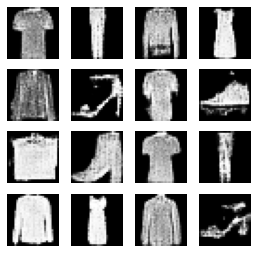

45200: [discriminator loss: 0.700362, acc: 0.531250] [adversarial loss: 0.750554, acc: 0.390625]
45201: [discriminator loss: 0.688187, acc: 0.500000] [adversarial loss: 0.767809, acc: 0.375000]
45202: [discriminator loss: 0.669883, acc: 0.515625] [adversarial loss: 0.797415, acc: 0.234375]
45203: [discriminator loss: 0.678201, acc: 0.546875] [adversarial loss: 0.683579, acc: 0.609375]
45204: [discriminator loss: 0.698005, acc: 0.507812] [adversarial loss: 0.726552, acc: 0.406250]
45205: [discriminator loss: 0.673183, acc: 0.617188] [adversarial loss: 0.775091, acc: 0.281250]
45206: [discriminator loss: 0.682827, acc: 0.546875] [adversarial loss: 0.647620, acc: 0.593750]
45207: [discriminator loss: 0.676121, acc: 0.554688] [adversarial loss: 0.740858, acc: 0.375000]
45208: [discriminator loss: 0.676574, acc: 0.562500] [adversarial loss: 0.781627, acc: 0.250000]
45209: [discriminator loss: 0.699988, acc: 0.492188] [adversarial loss: 0.697764, acc: 0.484375]
45210: [discriminator loss: 0.

45289: [discriminator loss: 0.701735, acc: 0.484375] [adversarial loss: 0.706764, acc: 0.515625]
45290: [discriminator loss: 0.680222, acc: 0.546875] [adversarial loss: 0.738660, acc: 0.437500]
45291: [discriminator loss: 0.717485, acc: 0.500000] [adversarial loss: 0.790030, acc: 0.250000]
45292: [discriminator loss: 0.681344, acc: 0.578125] [adversarial loss: 0.676967, acc: 0.578125]
45293: [discriminator loss: 0.677680, acc: 0.539062] [adversarial loss: 0.724763, acc: 0.375000]
45294: [discriminator loss: 0.673679, acc: 0.539062] [adversarial loss: 0.708182, acc: 0.453125]
45295: [discriminator loss: 0.670119, acc: 0.593750] [adversarial loss: 0.710527, acc: 0.484375]
45296: [discriminator loss: 0.667804, acc: 0.609375] [adversarial loss: 0.704686, acc: 0.437500]
45297: [discriminator loss: 0.669759, acc: 0.640625] [adversarial loss: 0.741472, acc: 0.343750]
45298: [discriminator loss: 0.669140, acc: 0.625000] [adversarial loss: 0.734968, acc: 0.421875]
45299: [discriminator loss: 0.

45379: [discriminator loss: 0.698164, acc: 0.500000] [adversarial loss: 0.730693, acc: 0.421875]
45380: [discriminator loss: 0.682984, acc: 0.585938] [adversarial loss: 0.699617, acc: 0.453125]
45381: [discriminator loss: 0.693736, acc: 0.515625] [adversarial loss: 0.702553, acc: 0.515625]
45382: [discriminator loss: 0.663334, acc: 0.585938] [adversarial loss: 0.789848, acc: 0.203125]
45383: [discriminator loss: 0.664740, acc: 0.648438] [adversarial loss: 0.660543, acc: 0.593750]
45384: [discriminator loss: 0.685356, acc: 0.554688] [adversarial loss: 0.706892, acc: 0.359375]
45385: [discriminator loss: 0.697186, acc: 0.484375] [adversarial loss: 0.731204, acc: 0.296875]
45386: [discriminator loss: 0.665199, acc: 0.640625] [adversarial loss: 0.687145, acc: 0.515625]
45387: [discriminator loss: 0.677204, acc: 0.570312] [adversarial loss: 0.766058, acc: 0.250000]
45388: [discriminator loss: 0.692011, acc: 0.523438] [adversarial loss: 0.684056, acc: 0.562500]
45389: [discriminator loss: 0.

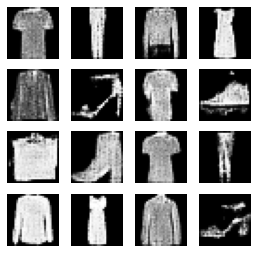

45400: [discriminator loss: 0.675850, acc: 0.554688] [adversarial loss: 0.704899, acc: 0.531250]
45401: [discriminator loss: 0.680099, acc: 0.554688] [adversarial loss: 0.715704, acc: 0.546875]
45402: [discriminator loss: 0.690029, acc: 0.500000] [adversarial loss: 0.761461, acc: 0.218750]
45403: [discriminator loss: 0.663716, acc: 0.562500] [adversarial loss: 0.750994, acc: 0.359375]
45404: [discriminator loss: 0.669293, acc: 0.585938] [adversarial loss: 0.743123, acc: 0.421875]
45405: [discriminator loss: 0.681159, acc: 0.500000] [adversarial loss: 0.703323, acc: 0.500000]
45406: [discriminator loss: 0.690755, acc: 0.523438] [adversarial loss: 0.762524, acc: 0.250000]
45407: [discriminator loss: 0.685654, acc: 0.578125] [adversarial loss: 0.748048, acc: 0.343750]
45408: [discriminator loss: 0.688227, acc: 0.468750] [adversarial loss: 0.712557, acc: 0.421875]
45409: [discriminator loss: 0.682825, acc: 0.531250] [adversarial loss: 0.690180, acc: 0.515625]
45410: [discriminator loss: 0.

45488: [discriminator loss: 0.661408, acc: 0.648438] [adversarial loss: 0.727530, acc: 0.359375]
45489: [discriminator loss: 0.663570, acc: 0.601562] [adversarial loss: 0.741465, acc: 0.359375]
45490: [discriminator loss: 0.698961, acc: 0.515625] [adversarial loss: 0.758216, acc: 0.218750]
45491: [discriminator loss: 0.680541, acc: 0.570312] [adversarial loss: 0.595466, acc: 0.843750]
45492: [discriminator loss: 0.670747, acc: 0.585938] [adversarial loss: 0.765137, acc: 0.328125]
45493: [discriminator loss: 0.662528, acc: 0.625000] [adversarial loss: 0.727075, acc: 0.468750]
45494: [discriminator loss: 0.681729, acc: 0.523438] [adversarial loss: 0.730714, acc: 0.421875]
45495: [discriminator loss: 0.703454, acc: 0.507812] [adversarial loss: 0.669778, acc: 0.640625]
45496: [discriminator loss: 0.684029, acc: 0.546875] [adversarial loss: 0.725047, acc: 0.312500]
45497: [discriminator loss: 0.675147, acc: 0.593750] [adversarial loss: 0.716346, acc: 0.468750]
45498: [discriminator loss: 0.

45574: [discriminator loss: 0.688938, acc: 0.531250] [adversarial loss: 0.718590, acc: 0.390625]
45575: [discriminator loss: 0.672129, acc: 0.617188] [adversarial loss: 0.660157, acc: 0.593750]
45576: [discriminator loss: 0.689157, acc: 0.578125] [adversarial loss: 0.781100, acc: 0.250000]
45577: [discriminator loss: 0.677155, acc: 0.562500] [adversarial loss: 0.714553, acc: 0.421875]
45578: [discriminator loss: 0.679921, acc: 0.562500] [adversarial loss: 0.711973, acc: 0.437500]
45579: [discriminator loss: 0.681477, acc: 0.523438] [adversarial loss: 0.740858, acc: 0.390625]
45580: [discriminator loss: 0.684990, acc: 0.554688] [adversarial loss: 0.659136, acc: 0.609375]
45581: [discriminator loss: 0.681247, acc: 0.578125] [adversarial loss: 0.740301, acc: 0.437500]
45582: [discriminator loss: 0.687671, acc: 0.531250] [adversarial loss: 0.693431, acc: 0.593750]
45583: [discriminator loss: 0.694220, acc: 0.476562] [adversarial loss: 0.713185, acc: 0.453125]
45584: [discriminator loss: 0.

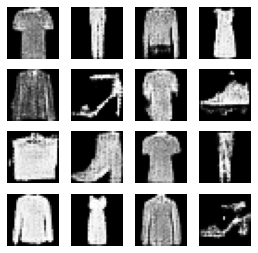

45600: [discriminator loss: 0.667688, acc: 0.601562] [adversarial loss: 0.692141, acc: 0.562500]
45601: [discriminator loss: 0.683836, acc: 0.539062] [adversarial loss: 0.762921, acc: 0.234375]
45602: [discriminator loss: 0.657272, acc: 0.679688] [adversarial loss: 0.650548, acc: 0.640625]
45603: [discriminator loss: 0.680639, acc: 0.554688] [adversarial loss: 0.787688, acc: 0.265625]
45604: [discriminator loss: 0.682081, acc: 0.570312] [adversarial loss: 0.762563, acc: 0.328125]
45605: [discriminator loss: 0.690062, acc: 0.539062] [adversarial loss: 0.681742, acc: 0.531250]
45606: [discriminator loss: 0.694898, acc: 0.507812] [adversarial loss: 0.770507, acc: 0.187500]
45607: [discriminator loss: 0.705587, acc: 0.453125] [adversarial loss: 0.695862, acc: 0.578125]
45608: [discriminator loss: 0.675551, acc: 0.585938] [adversarial loss: 0.680143, acc: 0.671875]
45609: [discriminator loss: 0.692791, acc: 0.523438] [adversarial loss: 0.668586, acc: 0.671875]
45610: [discriminator loss: 0.

45688: [discriminator loss: 0.689240, acc: 0.554688] [adversarial loss: 0.653600, acc: 0.640625]
45689: [discriminator loss: 0.695706, acc: 0.476562] [adversarial loss: 0.765985, acc: 0.265625]
45690: [discriminator loss: 0.671859, acc: 0.601562] [adversarial loss: 0.677844, acc: 0.562500]
45691: [discriminator loss: 0.701538, acc: 0.476562] [adversarial loss: 0.704299, acc: 0.390625]
45692: [discriminator loss: 0.677657, acc: 0.539062] [adversarial loss: 0.806848, acc: 0.171875]
45693: [discriminator loss: 0.675953, acc: 0.601562] [adversarial loss: 0.653490, acc: 0.656250]
45694: [discriminator loss: 0.684978, acc: 0.578125] [adversarial loss: 0.780467, acc: 0.125000]
45695: [discriminator loss: 0.678938, acc: 0.546875] [adversarial loss: 0.727277, acc: 0.421875]
45696: [discriminator loss: 0.694469, acc: 0.515625] [adversarial loss: 0.722862, acc: 0.375000]
45697: [discriminator loss: 0.669324, acc: 0.593750] [adversarial loss: 0.734374, acc: 0.453125]
45698: [discriminator loss: 0.

45774: [discriminator loss: 0.650504, acc: 0.632812] [adversarial loss: 0.820057, acc: 0.234375]
45775: [discriminator loss: 0.700359, acc: 0.523438] [adversarial loss: 0.614195, acc: 0.718750]
45776: [discriminator loss: 0.701826, acc: 0.500000] [adversarial loss: 0.812498, acc: 0.140625]
45777: [discriminator loss: 0.654205, acc: 0.640625] [adversarial loss: 0.716636, acc: 0.515625]
45778: [discriminator loss: 0.673420, acc: 0.578125] [adversarial loss: 0.760720, acc: 0.328125]
45779: [discriminator loss: 0.684182, acc: 0.578125] [adversarial loss: 0.754454, acc: 0.281250]
45780: [discriminator loss: 0.675450, acc: 0.578125] [adversarial loss: 0.648397, acc: 0.750000]
45781: [discriminator loss: 0.686626, acc: 0.523438] [adversarial loss: 0.681635, acc: 0.453125]
45782: [discriminator loss: 0.691488, acc: 0.476562] [adversarial loss: 0.749969, acc: 0.250000]
45783: [discriminator loss: 0.672180, acc: 0.632812] [adversarial loss: 0.654735, acc: 0.703125]
45784: [discriminator loss: 0.

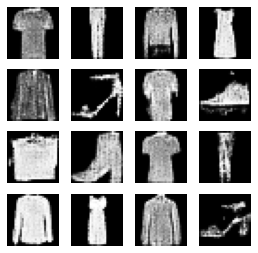

45800: [discriminator loss: 0.679516, acc: 0.546875] [adversarial loss: 0.715001, acc: 0.468750]
45801: [discriminator loss: 0.696781, acc: 0.546875] [adversarial loss: 0.791051, acc: 0.281250]
45802: [discriminator loss: 0.688965, acc: 0.554688] [adversarial loss: 0.650276, acc: 0.625000]
45803: [discriminator loss: 0.668440, acc: 0.578125] [adversarial loss: 0.784699, acc: 0.250000]
45804: [discriminator loss: 0.667420, acc: 0.554688] [adversarial loss: 0.684955, acc: 0.546875]
45805: [discriminator loss: 0.687951, acc: 0.484375] [adversarial loss: 0.729663, acc: 0.390625]
45806: [discriminator loss: 0.707282, acc: 0.554688] [adversarial loss: 0.674588, acc: 0.609375]
45807: [discriminator loss: 0.692500, acc: 0.476562] [adversarial loss: 0.636378, acc: 0.734375]
45808: [discriminator loss: 0.682778, acc: 0.507812] [adversarial loss: 0.769058, acc: 0.343750]
45809: [discriminator loss: 0.673934, acc: 0.546875] [adversarial loss: 0.651716, acc: 0.671875]
45810: [discriminator loss: 0.

45885: [discriminator loss: 0.643057, acc: 0.648438] [adversarial loss: 0.676799, acc: 0.640625]
45886: [discriminator loss: 0.681887, acc: 0.539062] [adversarial loss: 0.679349, acc: 0.640625]
45887: [discriminator loss: 0.670855, acc: 0.585938] [adversarial loss: 0.666670, acc: 0.593750]
45888: [discriminator loss: 0.684366, acc: 0.570312] [adversarial loss: 0.800614, acc: 0.250000]
45889: [discriminator loss: 0.670262, acc: 0.585938] [adversarial loss: 0.690529, acc: 0.640625]
45890: [discriminator loss: 0.680420, acc: 0.531250] [adversarial loss: 0.724128, acc: 0.375000]
45891: [discriminator loss: 0.678017, acc: 0.625000] [adversarial loss: 0.693257, acc: 0.484375]
45892: [discriminator loss: 0.676708, acc: 0.656250] [adversarial loss: 0.855332, acc: 0.109375]
45893: [discriminator loss: 0.671474, acc: 0.539062] [adversarial loss: 0.723567, acc: 0.437500]
45894: [discriminator loss: 0.681835, acc: 0.585938] [adversarial loss: 0.706937, acc: 0.421875]
45895: [discriminator loss: 0.

45975: [discriminator loss: 0.671159, acc: 0.593750] [adversarial loss: 0.754934, acc: 0.296875]
45976: [discriminator loss: 0.654515, acc: 0.617188] [adversarial loss: 0.645839, acc: 0.656250]
45977: [discriminator loss: 0.670408, acc: 0.601562] [adversarial loss: 0.798849, acc: 0.234375]
45978: [discriminator loss: 0.663611, acc: 0.546875] [adversarial loss: 0.683606, acc: 0.484375]
45979: [discriminator loss: 0.691534, acc: 0.492188] [adversarial loss: 0.723311, acc: 0.390625]
45980: [discriminator loss: 0.667926, acc: 0.593750] [adversarial loss: 0.674644, acc: 0.546875]
45981: [discriminator loss: 0.668460, acc: 0.640625] [adversarial loss: 0.708146, acc: 0.546875]
45982: [discriminator loss: 0.663030, acc: 0.562500] [adversarial loss: 0.636097, acc: 0.625000]
45983: [discriminator loss: 0.691734, acc: 0.515625] [adversarial loss: 0.726359, acc: 0.390625]
45984: [discriminator loss: 0.697492, acc: 0.515625] [adversarial loss: 0.726153, acc: 0.390625]
45985: [discriminator loss: 0.

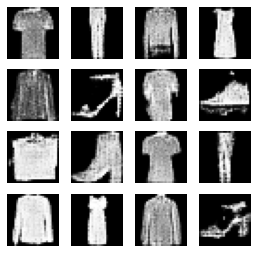

46000: [discriminator loss: 0.676313, acc: 0.539062] [adversarial loss: 0.740551, acc: 0.375000]
46001: [discriminator loss: 0.677428, acc: 0.523438] [adversarial loss: 0.752038, acc: 0.406250]
46002: [discriminator loss: 0.679355, acc: 0.546875] [adversarial loss: 0.742342, acc: 0.437500]
46003: [discriminator loss: 0.671132, acc: 0.554688] [adversarial loss: 0.725507, acc: 0.453125]
46004: [discriminator loss: 0.661740, acc: 0.593750] [adversarial loss: 0.798575, acc: 0.250000]
46005: [discriminator loss: 0.681951, acc: 0.570312] [adversarial loss: 0.668245, acc: 0.656250]
46006: [discriminator loss: 0.649908, acc: 0.617188] [adversarial loss: 0.707228, acc: 0.500000]
46007: [discriminator loss: 0.693424, acc: 0.523438] [adversarial loss: 0.731476, acc: 0.562500]
46008: [discriminator loss: 0.663304, acc: 0.578125] [adversarial loss: 0.745592, acc: 0.453125]
46009: [discriminator loss: 0.689883, acc: 0.562500] [adversarial loss: 0.747683, acc: 0.359375]
46010: [discriminator loss: 0.

46088: [discriminator loss: 0.691754, acc: 0.570312] [adversarial loss: 0.673595, acc: 0.593750]
46089: [discriminator loss: 0.667192, acc: 0.609375] [adversarial loss: 0.704489, acc: 0.453125]
46090: [discriminator loss: 0.686709, acc: 0.523438] [adversarial loss: 0.751487, acc: 0.390625]
46091: [discriminator loss: 0.675671, acc: 0.593750] [adversarial loss: 0.775458, acc: 0.281250]
46092: [discriminator loss: 0.685734, acc: 0.585938] [adversarial loss: 0.746341, acc: 0.343750]
46093: [discriminator loss: 0.700803, acc: 0.492188] [adversarial loss: 0.668158, acc: 0.531250]
46094: [discriminator loss: 0.695645, acc: 0.523438] [adversarial loss: 0.869671, acc: 0.171875]
46095: [discriminator loss: 0.709616, acc: 0.515625] [adversarial loss: 0.659766, acc: 0.593750]
46096: [discriminator loss: 0.671333, acc: 0.546875] [adversarial loss: 0.824249, acc: 0.296875]
46097: [discriminator loss: 0.705638, acc: 0.453125] [adversarial loss: 0.714040, acc: 0.453125]
46098: [discriminator loss: 0.

46174: [discriminator loss: 0.672376, acc: 0.554688] [adversarial loss: 0.731599, acc: 0.437500]
46175: [discriminator loss: 0.688238, acc: 0.554688] [adversarial loss: 0.788227, acc: 0.250000]
46176: [discriminator loss: 0.702769, acc: 0.484375] [adversarial loss: 0.772965, acc: 0.203125]
46177: [discriminator loss: 0.681660, acc: 0.523438] [adversarial loss: 0.718472, acc: 0.421875]
46178: [discriminator loss: 0.676089, acc: 0.593750] [adversarial loss: 0.825891, acc: 0.125000]
46179: [discriminator loss: 0.683601, acc: 0.531250] [adversarial loss: 0.655315, acc: 0.671875]
46180: [discriminator loss: 0.698857, acc: 0.554688] [adversarial loss: 0.761764, acc: 0.218750]
46181: [discriminator loss: 0.687591, acc: 0.554688] [adversarial loss: 0.691256, acc: 0.546875]
46182: [discriminator loss: 0.693336, acc: 0.562500] [adversarial loss: 0.658431, acc: 0.656250]
46183: [discriminator loss: 0.693943, acc: 0.523438] [adversarial loss: 0.832120, acc: 0.171875]
46184: [discriminator loss: 0.

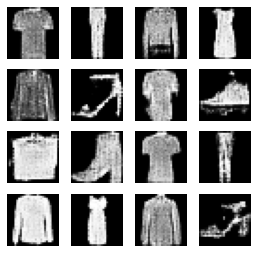

46200: [discriminator loss: 0.681318, acc: 0.531250] [adversarial loss: 0.786209, acc: 0.375000]
46201: [discriminator loss: 0.691698, acc: 0.523438] [adversarial loss: 0.655856, acc: 0.546875]
46202: [discriminator loss: 0.679045, acc: 0.585938] [adversarial loss: 0.675876, acc: 0.593750]
46203: [discriminator loss: 0.683458, acc: 0.523438] [adversarial loss: 0.794667, acc: 0.312500]
46204: [discriminator loss: 0.660766, acc: 0.601562] [adversarial loss: 0.691918, acc: 0.578125]
46205: [discriminator loss: 0.671562, acc: 0.578125] [adversarial loss: 0.784099, acc: 0.343750]
46206: [discriminator loss: 0.677416, acc: 0.531250] [adversarial loss: 0.684349, acc: 0.671875]
46207: [discriminator loss: 0.697141, acc: 0.492188] [adversarial loss: 0.732269, acc: 0.406250]
46208: [discriminator loss: 0.679836, acc: 0.570312] [adversarial loss: 0.742067, acc: 0.375000]
46209: [discriminator loss: 0.675618, acc: 0.601562] [adversarial loss: 0.743040, acc: 0.359375]
46210: [discriminator loss: 0.

46286: [discriminator loss: 0.691151, acc: 0.515625] [adversarial loss: 0.779698, acc: 0.265625]
46287: [discriminator loss: 0.673087, acc: 0.617188] [adversarial loss: 0.670999, acc: 0.515625]
46288: [discriminator loss: 0.680426, acc: 0.585938] [adversarial loss: 0.892144, acc: 0.093750]
46289: [discriminator loss: 0.694836, acc: 0.515625] [adversarial loss: 0.647555, acc: 0.640625]
46290: [discriminator loss: 0.678032, acc: 0.546875] [adversarial loss: 0.747546, acc: 0.437500]
46291: [discriminator loss: 0.677003, acc: 0.570312] [adversarial loss: 0.748960, acc: 0.328125]
46292: [discriminator loss: 0.687527, acc: 0.570312] [adversarial loss: 0.697559, acc: 0.562500]
46293: [discriminator loss: 0.708399, acc: 0.476562] [adversarial loss: 0.774217, acc: 0.359375]
46294: [discriminator loss: 0.687571, acc: 0.515625] [adversarial loss: 0.673285, acc: 0.625000]
46295: [discriminator loss: 0.676718, acc: 0.585938] [adversarial loss: 0.773374, acc: 0.328125]
46296: [discriminator loss: 0.

46375: [discriminator loss: 0.676337, acc: 0.539062] [adversarial loss: 0.755468, acc: 0.265625]
46376: [discriminator loss: 0.663517, acc: 0.609375] [adversarial loss: 0.796993, acc: 0.203125]
46377: [discriminator loss: 0.699389, acc: 0.453125] [adversarial loss: 0.705368, acc: 0.515625]
46378: [discriminator loss: 0.678865, acc: 0.562500] [adversarial loss: 0.778585, acc: 0.328125]
46379: [discriminator loss: 0.679006, acc: 0.570312] [adversarial loss: 0.742550, acc: 0.375000]
46380: [discriminator loss: 0.701636, acc: 0.492188] [adversarial loss: 0.707808, acc: 0.468750]
46381: [discriminator loss: 0.702036, acc: 0.500000] [adversarial loss: 0.614521, acc: 0.718750]
46382: [discriminator loss: 0.693149, acc: 0.531250] [adversarial loss: 0.782291, acc: 0.250000]
46383: [discriminator loss: 0.670622, acc: 0.617188] [adversarial loss: 0.668993, acc: 0.625000]
46384: [discriminator loss: 0.677889, acc: 0.546875] [adversarial loss: 0.815128, acc: 0.078125]
46385: [discriminator loss: 0.

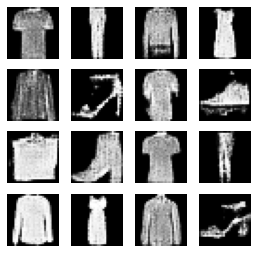

46400: [discriminator loss: 0.701114, acc: 0.539062] [adversarial loss: 0.729351, acc: 0.343750]
46401: [discriminator loss: 0.687037, acc: 0.500000] [adversarial loss: 0.722290, acc: 0.328125]
46402: [discriminator loss: 0.696874, acc: 0.515625] [adversarial loss: 0.720907, acc: 0.375000]
46403: [discriminator loss: 0.681778, acc: 0.585938] [adversarial loss: 0.695540, acc: 0.578125]
46404: [discriminator loss: 0.688197, acc: 0.546875] [adversarial loss: 0.728567, acc: 0.390625]
46405: [discriminator loss: 0.681789, acc: 0.531250] [adversarial loss: 0.726585, acc: 0.328125]
46406: [discriminator loss: 0.696213, acc: 0.601562] [adversarial loss: 0.710942, acc: 0.484375]
46407: [discriminator loss: 0.689551, acc: 0.523438] [adversarial loss: 0.732589, acc: 0.343750]
46408: [discriminator loss: 0.691725, acc: 0.523438] [adversarial loss: 0.729364, acc: 0.390625]
46409: [discriminator loss: 0.700644, acc: 0.484375] [adversarial loss: 0.681204, acc: 0.609375]
46410: [discriminator loss: 0.

46487: [discriminator loss: 0.675936, acc: 0.601562] [adversarial loss: 0.720180, acc: 0.531250]
46488: [discriminator loss: 0.674593, acc: 0.601562] [adversarial loss: 0.716496, acc: 0.437500]
46489: [discriminator loss: 0.675385, acc: 0.562500] [adversarial loss: 0.828867, acc: 0.078125]
46490: [discriminator loss: 0.693852, acc: 0.570312] [adversarial loss: 0.614594, acc: 0.765625]
46491: [discriminator loss: 0.681782, acc: 0.539062] [adversarial loss: 0.705964, acc: 0.500000]
46492: [discriminator loss: 0.677922, acc: 0.554688] [adversarial loss: 0.760376, acc: 0.312500]
46493: [discriminator loss: 0.659328, acc: 0.664062] [adversarial loss: 0.684487, acc: 0.515625]
46494: [discriminator loss: 0.662625, acc: 0.640625] [adversarial loss: 0.779697, acc: 0.203125]
46495: [discriminator loss: 0.685326, acc: 0.539062] [adversarial loss: 0.609976, acc: 0.843750]
46496: [discriminator loss: 0.679999, acc: 0.523438] [adversarial loss: 0.765892, acc: 0.296875]
46497: [discriminator loss: 0.

46576: [discriminator loss: 0.684385, acc: 0.492188] [adversarial loss: 0.757528, acc: 0.281250]
46577: [discriminator loss: 0.681924, acc: 0.585938] [adversarial loss: 0.744904, acc: 0.250000]
46578: [discriminator loss: 0.672149, acc: 0.617188] [adversarial loss: 0.708293, acc: 0.453125]
46579: [discriminator loss: 0.696528, acc: 0.531250] [adversarial loss: 0.715587, acc: 0.500000]
46580: [discriminator loss: 0.684791, acc: 0.554688] [adversarial loss: 0.777995, acc: 0.265625]
46581: [discriminator loss: 0.672758, acc: 0.585938] [adversarial loss: 0.728391, acc: 0.375000]
46582: [discriminator loss: 0.677654, acc: 0.554688] [adversarial loss: 0.704450, acc: 0.406250]
46583: [discriminator loss: 0.663295, acc: 0.601562] [adversarial loss: 0.705867, acc: 0.437500]
46584: [discriminator loss: 0.686771, acc: 0.562500] [adversarial loss: 0.710335, acc: 0.468750]
46585: [discriminator loss: 0.677153, acc: 0.554688] [adversarial loss: 0.671791, acc: 0.609375]
46586: [discriminator loss: 0.

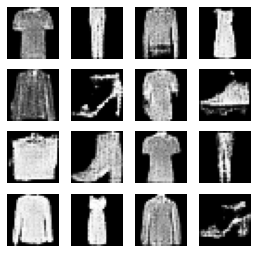

46600: [discriminator loss: 0.673741, acc: 0.562500] [adversarial loss: 0.704663, acc: 0.515625]
46601: [discriminator loss: 0.678685, acc: 0.546875] [adversarial loss: 0.690283, acc: 0.578125]
46602: [discriminator loss: 0.684124, acc: 0.562500] [adversarial loss: 0.770359, acc: 0.234375]
46603: [discriminator loss: 0.677687, acc: 0.539062] [adversarial loss: 0.761566, acc: 0.343750]
46604: [discriminator loss: 0.681301, acc: 0.578125] [adversarial loss: 0.709645, acc: 0.437500]
46605: [discriminator loss: 0.694107, acc: 0.531250] [adversarial loss: 0.712069, acc: 0.421875]
46606: [discriminator loss: 0.682109, acc: 0.476562] [adversarial loss: 0.809870, acc: 0.234375]
46607: [discriminator loss: 0.699768, acc: 0.546875] [adversarial loss: 0.678536, acc: 0.593750]
46608: [discriminator loss: 0.675151, acc: 0.507812] [adversarial loss: 0.759150, acc: 0.343750]
46609: [discriminator loss: 0.668302, acc: 0.609375] [adversarial loss: 0.640683, acc: 0.640625]
46610: [discriminator loss: 0.

46686: [discriminator loss: 0.684592, acc: 0.554688] [adversarial loss: 0.782511, acc: 0.234375]
46687: [discriminator loss: 0.672883, acc: 0.570312] [adversarial loss: 0.671106, acc: 0.640625]
46688: [discriminator loss: 0.680153, acc: 0.578125] [adversarial loss: 0.716485, acc: 0.468750]
46689: [discriminator loss: 0.690636, acc: 0.523438] [adversarial loss: 0.739231, acc: 0.343750]
46690: [discriminator loss: 0.679279, acc: 0.562500] [adversarial loss: 0.713960, acc: 0.468750]
46691: [discriminator loss: 0.676429, acc: 0.578125] [adversarial loss: 0.693874, acc: 0.531250]
46692: [discriminator loss: 0.678192, acc: 0.539062] [adversarial loss: 0.736927, acc: 0.343750]
46693: [discriminator loss: 0.683655, acc: 0.531250] [adversarial loss: 0.691613, acc: 0.515625]
46694: [discriminator loss: 0.690380, acc: 0.531250] [adversarial loss: 0.747701, acc: 0.281250]
46695: [discriminator loss: 0.696693, acc: 0.523438] [adversarial loss: 0.736792, acc: 0.359375]
46696: [discriminator loss: 0.

46774: [discriminator loss: 0.703524, acc: 0.476562] [adversarial loss: 0.684202, acc: 0.500000]
46775: [discriminator loss: 0.699436, acc: 0.468750] [adversarial loss: 0.742513, acc: 0.312500]
46776: [discriminator loss: 0.681128, acc: 0.625000] [adversarial loss: 0.656063, acc: 0.578125]
46777: [discriminator loss: 0.694385, acc: 0.492188] [adversarial loss: 0.816135, acc: 0.062500]
46778: [discriminator loss: 0.684805, acc: 0.546875] [adversarial loss: 0.731320, acc: 0.359375]
46779: [discriminator loss: 0.670914, acc: 0.609375] [adversarial loss: 0.780712, acc: 0.406250]
46780: [discriminator loss: 0.703001, acc: 0.531250] [adversarial loss: 0.654221, acc: 0.718750]
46781: [discriminator loss: 0.696676, acc: 0.523438] [adversarial loss: 0.827859, acc: 0.078125]
46782: [discriminator loss: 0.689431, acc: 0.578125] [adversarial loss: 0.658251, acc: 0.656250]
46783: [discriminator loss: 0.693027, acc: 0.460938] [adversarial loss: 0.819107, acc: 0.265625]
46784: [discriminator loss: 0.

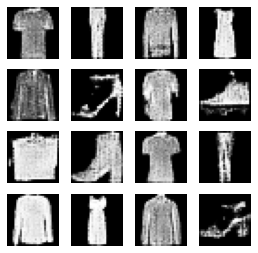

46800: [discriminator loss: 0.673461, acc: 0.578125] [adversarial loss: 0.777562, acc: 0.296875]
46801: [discriminator loss: 0.682813, acc: 0.546875] [adversarial loss: 0.677711, acc: 0.531250]
46802: [discriminator loss: 0.683458, acc: 0.593750] [adversarial loss: 0.741701, acc: 0.312500]
46803: [discriminator loss: 0.684443, acc: 0.539062] [adversarial loss: 0.755561, acc: 0.406250]
46804: [discriminator loss: 0.671428, acc: 0.617188] [adversarial loss: 0.702448, acc: 0.468750]
46805: [discriminator loss: 0.677532, acc: 0.578125] [adversarial loss: 0.722690, acc: 0.406250]
46806: [discriminator loss: 0.671496, acc: 0.585938] [adversarial loss: 0.688172, acc: 0.578125]
46807: [discriminator loss: 0.687311, acc: 0.531250] [adversarial loss: 0.767118, acc: 0.250000]
46808: [discriminator loss: 0.685329, acc: 0.554688] [adversarial loss: 0.708434, acc: 0.437500]
46809: [discriminator loss: 0.681741, acc: 0.539062] [adversarial loss: 0.757958, acc: 0.343750]
46810: [discriminator loss: 0.

46889: [discriminator loss: 0.682547, acc: 0.578125] [adversarial loss: 0.676484, acc: 0.562500]
46890: [discriminator loss: 0.692742, acc: 0.546875] [adversarial loss: 0.762488, acc: 0.328125]
46891: [discriminator loss: 0.683252, acc: 0.562500] [adversarial loss: 0.762482, acc: 0.312500]
46892: [discriminator loss: 0.681224, acc: 0.546875] [adversarial loss: 0.656111, acc: 0.703125]
46893: [discriminator loss: 0.678239, acc: 0.585938] [adversarial loss: 0.718130, acc: 0.359375]
46894: [discriminator loss: 0.686308, acc: 0.578125] [adversarial loss: 0.657223, acc: 0.656250]
46895: [discriminator loss: 0.674343, acc: 0.562500] [adversarial loss: 0.819057, acc: 0.218750]
46896: [discriminator loss: 0.675864, acc: 0.562500] [adversarial loss: 0.710622, acc: 0.546875]
46897: [discriminator loss: 0.694375, acc: 0.546875] [adversarial loss: 0.739840, acc: 0.343750]
46898: [discriminator loss: 0.677053, acc: 0.585938] [adversarial loss: 0.744133, acc: 0.421875]
46899: [discriminator loss: 0.

46976: [discriminator loss: 0.669042, acc: 0.601562] [adversarial loss: 0.740056, acc: 0.406250]
46977: [discriminator loss: 0.686075, acc: 0.578125] [adversarial loss: 0.712743, acc: 0.437500]
46978: [discriminator loss: 0.686197, acc: 0.507812] [adversarial loss: 0.659419, acc: 0.640625]
46979: [discriminator loss: 0.671450, acc: 0.539062] [adversarial loss: 0.725188, acc: 0.390625]
46980: [discriminator loss: 0.684950, acc: 0.523438] [adversarial loss: 0.735517, acc: 0.343750]
46981: [discriminator loss: 0.666354, acc: 0.585938] [adversarial loss: 0.659278, acc: 0.671875]
46982: [discriminator loss: 0.693082, acc: 0.507812] [adversarial loss: 0.794673, acc: 0.234375]
46983: [discriminator loss: 0.699352, acc: 0.523438] [adversarial loss: 0.605951, acc: 0.828125]
46984: [discriminator loss: 0.683821, acc: 0.523438] [adversarial loss: 0.798198, acc: 0.093750]
46985: [discriminator loss: 0.688072, acc: 0.570312] [adversarial loss: 0.655452, acc: 0.593750]
46986: [discriminator loss: 0.

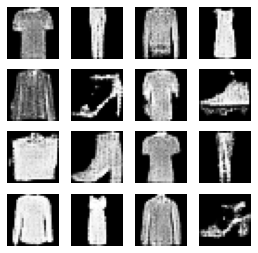

47000: [discriminator loss: 0.676499, acc: 0.617188] [adversarial loss: 0.807463, acc: 0.156250]
47001: [discriminator loss: 0.670046, acc: 0.593750] [adversarial loss: 0.711009, acc: 0.515625]
47002: [discriminator loss: 0.665002, acc: 0.601562] [adversarial loss: 0.735754, acc: 0.375000]
47003: [discriminator loss: 0.692921, acc: 0.507812] [adversarial loss: 0.687288, acc: 0.546875]
47004: [discriminator loss: 0.683125, acc: 0.492188] [adversarial loss: 0.803658, acc: 0.171875]
47005: [discriminator loss: 0.668027, acc: 0.585938] [adversarial loss: 0.644495, acc: 0.703125]
47006: [discriminator loss: 0.675893, acc: 0.554688] [adversarial loss: 0.733033, acc: 0.453125]
47007: [discriminator loss: 0.688776, acc: 0.539062] [adversarial loss: 0.677734, acc: 0.546875]
47008: [discriminator loss: 0.684067, acc: 0.578125] [adversarial loss: 0.765741, acc: 0.312500]
47009: [discriminator loss: 0.660566, acc: 0.687500] [adversarial loss: 0.715967, acc: 0.500000]
47010: [discriminator loss: 0.

47087: [discriminator loss: 0.667539, acc: 0.648438] [adversarial loss: 0.740020, acc: 0.359375]
47088: [discriminator loss: 0.681206, acc: 0.531250] [adversarial loss: 0.650452, acc: 0.562500]
47089: [discriminator loss: 0.680716, acc: 0.593750] [adversarial loss: 0.714971, acc: 0.421875]
47090: [discriminator loss: 0.701567, acc: 0.515625] [adversarial loss: 0.739862, acc: 0.343750]
47091: [discriminator loss: 0.685122, acc: 0.523438] [adversarial loss: 0.715671, acc: 0.453125]
47092: [discriminator loss: 0.682324, acc: 0.515625] [adversarial loss: 0.744934, acc: 0.296875]
47093: [discriminator loss: 0.679759, acc: 0.539062] [adversarial loss: 0.728171, acc: 0.453125]
47094: [discriminator loss: 0.680402, acc: 0.617188] [adversarial loss: 0.715049, acc: 0.546875]
47095: [discriminator loss: 0.687184, acc: 0.492188] [adversarial loss: 0.768899, acc: 0.296875]
47096: [discriminator loss: 0.681038, acc: 0.554688] [adversarial loss: 0.695900, acc: 0.562500]
47097: [discriminator loss: 0.

47176: [discriminator loss: 0.686175, acc: 0.531250] [adversarial loss: 0.728774, acc: 0.406250]
47177: [discriminator loss: 0.680369, acc: 0.546875] [adversarial loss: 0.765584, acc: 0.343750]
47178: [discriminator loss: 0.669764, acc: 0.601562] [adversarial loss: 0.668875, acc: 0.609375]
47179: [discriminator loss: 0.677071, acc: 0.578125] [adversarial loss: 0.798036, acc: 0.203125]
47180: [discriminator loss: 0.693551, acc: 0.546875] [adversarial loss: 0.692984, acc: 0.468750]
47181: [discriminator loss: 0.686445, acc: 0.523438] [adversarial loss: 0.725658, acc: 0.359375]
47182: [discriminator loss: 0.683951, acc: 0.554688] [adversarial loss: 0.708077, acc: 0.421875]
47183: [discriminator loss: 0.665023, acc: 0.601562] [adversarial loss: 0.681478, acc: 0.640625]
47184: [discriminator loss: 0.681991, acc: 0.531250] [adversarial loss: 0.794136, acc: 0.218750]
47185: [discriminator loss: 0.681352, acc: 0.531250] [adversarial loss: 0.797684, acc: 0.109375]
47186: [discriminator loss: 0.

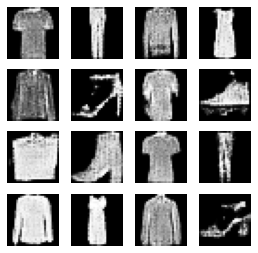

47200: [discriminator loss: 0.680624, acc: 0.539062] [adversarial loss: 0.715261, acc: 0.531250]
47201: [discriminator loss: 0.667549, acc: 0.632812] [adversarial loss: 0.813742, acc: 0.343750]
47202: [discriminator loss: 0.681001, acc: 0.562500] [adversarial loss: 0.747677, acc: 0.359375]
47203: [discriminator loss: 0.680747, acc: 0.476562] [adversarial loss: 0.697393, acc: 0.640625]
47204: [discriminator loss: 0.693558, acc: 0.507812] [adversarial loss: 0.768690, acc: 0.218750]
47205: [discriminator loss: 0.666155, acc: 0.593750] [adversarial loss: 0.673050, acc: 0.593750]
47206: [discriminator loss: 0.678737, acc: 0.554688] [adversarial loss: 0.782725, acc: 0.250000]
47207: [discriminator loss: 0.684025, acc: 0.578125] [adversarial loss: 0.729578, acc: 0.500000]
47208: [discriminator loss: 0.703457, acc: 0.492188] [adversarial loss: 0.713813, acc: 0.375000]
47209: [discriminator loss: 0.684405, acc: 0.578125] [adversarial loss: 0.735465, acc: 0.328125]
47210: [discriminator loss: 0.

47288: [discriminator loss: 0.675666, acc: 0.601562] [adversarial loss: 0.676084, acc: 0.562500]
47289: [discriminator loss: 0.679103, acc: 0.554688] [adversarial loss: 0.795089, acc: 0.171875]
47290: [discriminator loss: 0.689258, acc: 0.546875] [adversarial loss: 0.641441, acc: 0.765625]
47291: [discriminator loss: 0.660370, acc: 0.625000] [adversarial loss: 0.771706, acc: 0.281250]
47292: [discriminator loss: 0.707024, acc: 0.507812] [adversarial loss: 0.733197, acc: 0.375000]
47293: [discriminator loss: 0.676525, acc: 0.539062] [adversarial loss: 0.702693, acc: 0.546875]
47294: [discriminator loss: 0.689995, acc: 0.554688] [adversarial loss: 0.711627, acc: 0.546875]
47295: [discriminator loss: 0.664698, acc: 0.554688] [adversarial loss: 0.838635, acc: 0.125000]
47296: [discriminator loss: 0.699678, acc: 0.492188] [adversarial loss: 0.699225, acc: 0.593750]
47297: [discriminator loss: 0.668066, acc: 0.539062] [adversarial loss: 0.794664, acc: 0.250000]
47298: [discriminator loss: 0.

47374: [discriminator loss: 0.682642, acc: 0.546875] [adversarial loss: 0.784419, acc: 0.187500]
47375: [discriminator loss: 0.666523, acc: 0.601562] [adversarial loss: 0.684413, acc: 0.609375]
47376: [discriminator loss: 0.681031, acc: 0.531250] [adversarial loss: 0.716281, acc: 0.500000]
47377: [discriminator loss: 0.673916, acc: 0.609375] [adversarial loss: 0.788159, acc: 0.171875]
47378: [discriminator loss: 0.685825, acc: 0.531250] [adversarial loss: 0.650860, acc: 0.765625]
47379: [discriminator loss: 0.676354, acc: 0.601562] [adversarial loss: 0.805974, acc: 0.281250]
47380: [discriminator loss: 0.692752, acc: 0.593750] [adversarial loss: 0.640672, acc: 0.718750]
47381: [discriminator loss: 0.689899, acc: 0.539062] [adversarial loss: 0.732437, acc: 0.406250]
47382: [discriminator loss: 0.693717, acc: 0.523438] [adversarial loss: 0.668779, acc: 0.671875]
47383: [discriminator loss: 0.684927, acc: 0.523438] [adversarial loss: 0.746063, acc: 0.312500]
47384: [discriminator loss: 0.

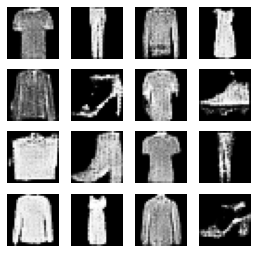

47400: [discriminator loss: 0.690974, acc: 0.515625] [adversarial loss: 0.642955, acc: 0.718750]
47401: [discriminator loss: 0.689684, acc: 0.476562] [adversarial loss: 0.728299, acc: 0.312500]
47402: [discriminator loss: 0.665335, acc: 0.570312] [adversarial loss: 0.709689, acc: 0.406250]
47403: [discriminator loss: 0.669182, acc: 0.640625] [adversarial loss: 0.758342, acc: 0.250000]
47404: [discriminator loss: 0.697895, acc: 0.507812] [adversarial loss: 0.717157, acc: 0.468750]
47405: [discriminator loss: 0.670523, acc: 0.625000] [adversarial loss: 0.703713, acc: 0.453125]
47406: [discriminator loss: 0.678662, acc: 0.585938] [adversarial loss: 0.782609, acc: 0.234375]
47407: [discriminator loss: 0.690377, acc: 0.539062] [adversarial loss: 0.701830, acc: 0.468750]
47408: [discriminator loss: 0.694074, acc: 0.515625] [adversarial loss: 0.743410, acc: 0.359375]
47409: [discriminator loss: 0.703126, acc: 0.468750] [adversarial loss: 0.674009, acc: 0.625000]
47410: [discriminator loss: 0.

47486: [discriminator loss: 0.665332, acc: 0.593750] [adversarial loss: 0.738010, acc: 0.406250]
47487: [discriminator loss: 0.697091, acc: 0.539062] [adversarial loss: 0.753187, acc: 0.343750]
47488: [discriminator loss: 0.674417, acc: 0.585938] [adversarial loss: 0.733947, acc: 0.390625]
47489: [discriminator loss: 0.686885, acc: 0.578125] [adversarial loss: 0.694568, acc: 0.578125]
47490: [discriminator loss: 0.679230, acc: 0.539062] [adversarial loss: 0.761021, acc: 0.218750]
47491: [discriminator loss: 0.674845, acc: 0.546875] [adversarial loss: 0.716331, acc: 0.484375]
47492: [discriminator loss: 0.684404, acc: 0.531250] [adversarial loss: 0.804573, acc: 0.265625]
47493: [discriminator loss: 0.684686, acc: 0.546875] [adversarial loss: 0.726831, acc: 0.343750]
47494: [discriminator loss: 0.687141, acc: 0.531250] [adversarial loss: 0.700535, acc: 0.468750]
47495: [discriminator loss: 0.681759, acc: 0.546875] [adversarial loss: 0.727362, acc: 0.390625]
47496: [discriminator loss: 0.

47571: [discriminator loss: 0.672571, acc: 0.601562] [adversarial loss: 0.663357, acc: 0.609375]
47572: [discriminator loss: 0.696713, acc: 0.539062] [adversarial loss: 0.725446, acc: 0.500000]
47573: [discriminator loss: 0.702603, acc: 0.515625] [adversarial loss: 0.747968, acc: 0.343750]
47574: [discriminator loss: 0.667812, acc: 0.632812] [adversarial loss: 0.721923, acc: 0.453125]
47575: [discriminator loss: 0.678770, acc: 0.578125] [adversarial loss: 0.730015, acc: 0.390625]
47576: [discriminator loss: 0.696819, acc: 0.460938] [adversarial loss: 0.738158, acc: 0.406250]
47577: [discriminator loss: 0.679343, acc: 0.578125] [adversarial loss: 0.710802, acc: 0.468750]
47578: [discriminator loss: 0.686780, acc: 0.492188] [adversarial loss: 0.748646, acc: 0.265625]
47579: [discriminator loss: 0.685413, acc: 0.546875] [adversarial loss: 0.721341, acc: 0.453125]
47580: [discriminator loss: 0.683820, acc: 0.546875] [adversarial loss: 0.823920, acc: 0.250000]
47581: [discriminator loss: 0.

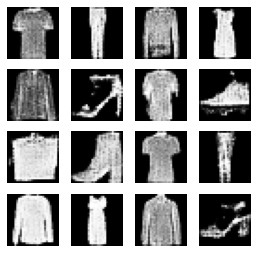

47600: [discriminator loss: 0.680140, acc: 0.531250] [adversarial loss: 0.808915, acc: 0.156250]
47601: [discriminator loss: 0.675930, acc: 0.578125] [adversarial loss: 0.630488, acc: 0.734375]
47602: [discriminator loss: 0.712006, acc: 0.468750] [adversarial loss: 0.799399, acc: 0.140625]
47603: [discriminator loss: 0.688824, acc: 0.523438] [adversarial loss: 0.787030, acc: 0.078125]
47604: [discriminator loss: 0.680994, acc: 0.570312] [adversarial loss: 0.711257, acc: 0.421875]
47605: [discriminator loss: 0.678832, acc: 0.578125] [adversarial loss: 0.728236, acc: 0.375000]
47606: [discriminator loss: 0.680556, acc: 0.539062] [adversarial loss: 0.731470, acc: 0.281250]
47607: [discriminator loss: 0.672893, acc: 0.617188] [adversarial loss: 0.734608, acc: 0.390625]
47608: [discriminator loss: 0.679028, acc: 0.570312] [adversarial loss: 0.775640, acc: 0.296875]
47609: [discriminator loss: 0.682160, acc: 0.570312] [adversarial loss: 0.678439, acc: 0.562500]
47610: [discriminator loss: 0.

47685: [discriminator loss: 0.659196, acc: 0.609375] [adversarial loss: 0.724223, acc: 0.375000]
47686: [discriminator loss: 0.679820, acc: 0.554688] [adversarial loss: 0.678190, acc: 0.593750]
47687: [discriminator loss: 0.674374, acc: 0.601562] [adversarial loss: 0.638369, acc: 0.750000]
47688: [discriminator loss: 0.667931, acc: 0.554688] [adversarial loss: 0.727561, acc: 0.312500]
47689: [discriminator loss: 0.702207, acc: 0.476562] [adversarial loss: 0.645126, acc: 0.625000]
47690: [discriminator loss: 0.684004, acc: 0.578125] [adversarial loss: 0.752694, acc: 0.218750]
47691: [discriminator loss: 0.687938, acc: 0.492188] [adversarial loss: 0.734987, acc: 0.312500]
47692: [discriminator loss: 0.679473, acc: 0.601562] [adversarial loss: 0.714333, acc: 0.437500]
47693: [discriminator loss: 0.672002, acc: 0.625000] [adversarial loss: 0.733438, acc: 0.421875]
47694: [discriminator loss: 0.688998, acc: 0.539062] [adversarial loss: 0.685485, acc: 0.578125]
47695: [discriminator loss: 0.

47772: [discriminator loss: 0.672344, acc: 0.625000] [adversarial loss: 0.731757, acc: 0.312500]
47773: [discriminator loss: 0.682889, acc: 0.585938] [adversarial loss: 0.759636, acc: 0.296875]
47774: [discriminator loss: 0.674353, acc: 0.609375] [adversarial loss: 0.735484, acc: 0.359375]
47775: [discriminator loss: 0.671914, acc: 0.632812] [adversarial loss: 0.680740, acc: 0.562500]
47776: [discriminator loss: 0.663462, acc: 0.656250] [adversarial loss: 0.786073, acc: 0.203125]
47777: [discriminator loss: 0.678404, acc: 0.593750] [adversarial loss: 0.693384, acc: 0.562500]
47778: [discriminator loss: 0.667754, acc: 0.570312] [adversarial loss: 0.774657, acc: 0.250000]
47779: [discriminator loss: 0.674524, acc: 0.570312] [adversarial loss: 0.724579, acc: 0.406250]
47780: [discriminator loss: 0.689571, acc: 0.531250] [adversarial loss: 0.737894, acc: 0.375000]
47781: [discriminator loss: 0.702143, acc: 0.546875] [adversarial loss: 0.780972, acc: 0.218750]
47782: [discriminator loss: 0.

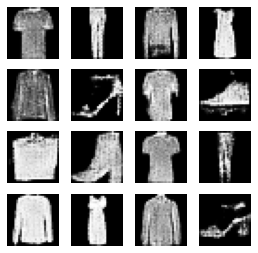

47800: [discriminator loss: 0.674879, acc: 0.523438] [adversarial loss: 0.689710, acc: 0.609375]
47801: [discriminator loss: 0.701794, acc: 0.484375] [adversarial loss: 0.738612, acc: 0.406250]
47802: [discriminator loss: 0.668801, acc: 0.632812] [adversarial loss: 0.619885, acc: 0.718750]
47803: [discriminator loss: 0.686080, acc: 0.507812] [adversarial loss: 0.809175, acc: 0.203125]
47804: [discriminator loss: 0.712612, acc: 0.539062] [adversarial loss: 0.635209, acc: 0.796875]
47805: [discriminator loss: 0.684291, acc: 0.460938] [adversarial loss: 0.764004, acc: 0.234375]
47806: [discriminator loss: 0.694367, acc: 0.531250] [adversarial loss: 0.629800, acc: 0.750000]
47807: [discriminator loss: 0.679560, acc: 0.539062] [adversarial loss: 0.785214, acc: 0.203125]
47808: [discriminator loss: 0.676206, acc: 0.578125] [adversarial loss: 0.663145, acc: 0.578125]
47809: [discriminator loss: 0.673231, acc: 0.546875] [adversarial loss: 0.745024, acc: 0.343750]
47810: [discriminator loss: 0.

47886: [discriminator loss: 0.675757, acc: 0.554688] [adversarial loss: 0.827964, acc: 0.125000]
47887: [discriminator loss: 0.693483, acc: 0.539062] [adversarial loss: 0.646072, acc: 0.750000]
47888: [discriminator loss: 0.682252, acc: 0.539062] [adversarial loss: 0.786022, acc: 0.187500]
47889: [discriminator loss: 0.662541, acc: 0.593750] [adversarial loss: 0.710927, acc: 0.531250]
47890: [discriminator loss: 0.693304, acc: 0.531250] [adversarial loss: 0.698087, acc: 0.437500]
47891: [discriminator loss: 0.684374, acc: 0.515625] [adversarial loss: 0.687322, acc: 0.484375]
47892: [discriminator loss: 0.693113, acc: 0.507812] [adversarial loss: 0.689344, acc: 0.500000]
47893: [discriminator loss: 0.674183, acc: 0.585938] [adversarial loss: 0.705079, acc: 0.421875]
47894: [discriminator loss: 0.679320, acc: 0.523438] [adversarial loss: 0.669965, acc: 0.593750]
47895: [discriminator loss: 0.690235, acc: 0.500000] [adversarial loss: 0.790779, acc: 0.234375]
47896: [discriminator loss: 0.

47976: [discriminator loss: 0.685663, acc: 0.515625] [adversarial loss: 0.716445, acc: 0.468750]
47977: [discriminator loss: 0.687492, acc: 0.601562] [adversarial loss: 0.751044, acc: 0.328125]
47978: [discriminator loss: 0.682575, acc: 0.601562] [adversarial loss: 0.689105, acc: 0.515625]
47979: [discriminator loss: 0.667751, acc: 0.601562] [adversarial loss: 0.655708, acc: 0.734375]
47980: [discriminator loss: 0.669333, acc: 0.539062] [adversarial loss: 0.727465, acc: 0.406250]
47981: [discriminator loss: 0.690574, acc: 0.523438] [adversarial loss: 0.821934, acc: 0.109375]
47982: [discriminator loss: 0.675591, acc: 0.562500] [adversarial loss: 0.649492, acc: 0.703125]
47983: [discriminator loss: 0.684057, acc: 0.492188] [adversarial loss: 0.781845, acc: 0.265625]
47984: [discriminator loss: 0.672068, acc: 0.601562] [adversarial loss: 0.751187, acc: 0.500000]
47985: [discriminator loss: 0.673400, acc: 0.554688] [adversarial loss: 0.751842, acc: 0.328125]
47986: [discriminator loss: 0.

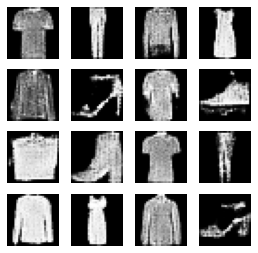

48000: [discriminator loss: 0.681204, acc: 0.585938] [adversarial loss: 0.710093, acc: 0.500000]
48001: [discriminator loss: 0.673092, acc: 0.585938] [adversarial loss: 0.698632, acc: 0.500000]
48002: [discriminator loss: 0.696144, acc: 0.492188] [adversarial loss: 0.772410, acc: 0.281250]
48003: [discriminator loss: 0.668694, acc: 0.609375] [adversarial loss: 0.655989, acc: 0.640625]
48004: [discriminator loss: 0.684727, acc: 0.492188] [adversarial loss: 0.825181, acc: 0.125000]
48005: [discriminator loss: 0.675917, acc: 0.593750] [adversarial loss: 0.651007, acc: 0.640625]
48006: [discriminator loss: 0.691334, acc: 0.539062] [adversarial loss: 0.731113, acc: 0.343750]
48007: [discriminator loss: 0.682752, acc: 0.539062] [adversarial loss: 0.632617, acc: 0.703125]
48008: [discriminator loss: 0.692208, acc: 0.523438] [adversarial loss: 0.799107, acc: 0.125000]
48009: [discriminator loss: 0.673894, acc: 0.593750] [adversarial loss: 0.637534, acc: 0.687500]
48010: [discriminator loss: 0.

48086: [discriminator loss: 0.688008, acc: 0.554688] [adversarial loss: 0.682270, acc: 0.562500]
48087: [discriminator loss: 0.691829, acc: 0.492188] [adversarial loss: 0.763381, acc: 0.406250]
48088: [discriminator loss: 0.699764, acc: 0.484375] [adversarial loss: 0.755137, acc: 0.265625]
48089: [discriminator loss: 0.676733, acc: 0.585938] [adversarial loss: 0.679438, acc: 0.515625]
48090: [discriminator loss: 0.686105, acc: 0.492188] [adversarial loss: 0.728830, acc: 0.312500]
48091: [discriminator loss: 0.691946, acc: 0.492188] [adversarial loss: 0.708636, acc: 0.453125]
48092: [discriminator loss: 0.674779, acc: 0.578125] [adversarial loss: 0.658843, acc: 0.703125]
48093: [discriminator loss: 0.677836, acc: 0.562500] [adversarial loss: 0.738378, acc: 0.359375]
48094: [discriminator loss: 0.676729, acc: 0.554688] [adversarial loss: 0.744223, acc: 0.375000]
48095: [discriminator loss: 0.678485, acc: 0.570312] [adversarial loss: 0.754188, acc: 0.375000]
48096: [discriminator loss: 0.

48171: [discriminator loss: 0.667575, acc: 0.625000] [adversarial loss: 0.737287, acc: 0.406250]
48172: [discriminator loss: 0.690299, acc: 0.539062] [adversarial loss: 0.681962, acc: 0.562500]
48173: [discriminator loss: 0.682259, acc: 0.554688] [adversarial loss: 0.728609, acc: 0.468750]
48174: [discriminator loss: 0.703412, acc: 0.476562] [adversarial loss: 0.705608, acc: 0.515625]
48175: [discriminator loss: 0.672279, acc: 0.593750] [adversarial loss: 0.696667, acc: 0.562500]
48176: [discriminator loss: 0.667823, acc: 0.585938] [adversarial loss: 0.850868, acc: 0.062500]
48177: [discriminator loss: 0.695820, acc: 0.562500] [adversarial loss: 0.613176, acc: 0.812500]
48178: [discriminator loss: 0.671595, acc: 0.562500] [adversarial loss: 0.747516, acc: 0.312500]
48179: [discriminator loss: 0.692481, acc: 0.500000] [adversarial loss: 0.704019, acc: 0.484375]
48180: [discriminator loss: 0.683222, acc: 0.578125] [adversarial loss: 0.747697, acc: 0.328125]
48181: [discriminator loss: 0.

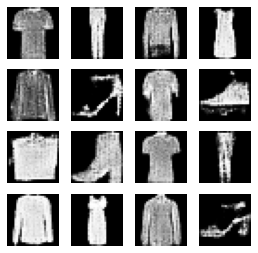

48200: [discriminator loss: 0.681017, acc: 0.546875] [adversarial loss: 0.775778, acc: 0.187500]
48201: [discriminator loss: 0.696947, acc: 0.500000] [adversarial loss: 0.760764, acc: 0.281250]
48202: [discriminator loss: 0.680600, acc: 0.585938] [adversarial loss: 0.780043, acc: 0.218750]
48203: [discriminator loss: 0.692759, acc: 0.531250] [adversarial loss: 0.706019, acc: 0.500000]
48204: [discriminator loss: 0.689642, acc: 0.546875] [adversarial loss: 0.670226, acc: 0.562500]
48205: [discriminator loss: 0.666585, acc: 0.632812] [adversarial loss: 0.734573, acc: 0.375000]
48206: [discriminator loss: 0.709377, acc: 0.492188] [adversarial loss: 0.699139, acc: 0.468750]
48207: [discriminator loss: 0.671376, acc: 0.632812] [adversarial loss: 0.711694, acc: 0.500000]
48208: [discriminator loss: 0.685539, acc: 0.546875] [adversarial loss: 0.771710, acc: 0.218750]
48209: [discriminator loss: 0.694370, acc: 0.539062] [adversarial loss: 0.744072, acc: 0.343750]
48210: [discriminator loss: 0.

48288: [discriminator loss: 0.680799, acc: 0.570312] [adversarial loss: 0.756648, acc: 0.343750]
48289: [discriminator loss: 0.677700, acc: 0.546875] [adversarial loss: 0.771792, acc: 0.328125]
48290: [discriminator loss: 0.696141, acc: 0.500000] [adversarial loss: 0.726462, acc: 0.375000]
48291: [discriminator loss: 0.670595, acc: 0.554688] [adversarial loss: 0.728677, acc: 0.281250]
48292: [discriminator loss: 0.681977, acc: 0.625000] [adversarial loss: 0.691868, acc: 0.500000]
48293: [discriminator loss: 0.687842, acc: 0.523438] [adversarial loss: 0.869094, acc: 0.187500]
48294: [discriminator loss: 0.672858, acc: 0.625000] [adversarial loss: 0.672104, acc: 0.531250]
48295: [discriminator loss: 0.667654, acc: 0.609375] [adversarial loss: 0.713012, acc: 0.359375]
48296: [discriminator loss: 0.686136, acc: 0.531250] [adversarial loss: 0.749999, acc: 0.359375]
48297: [discriminator loss: 0.680373, acc: 0.562500] [adversarial loss: 0.745031, acc: 0.359375]
48298: [discriminator loss: 0.

48373: [discriminator loss: 0.660040, acc: 0.648438] [adversarial loss: 0.642599, acc: 0.734375]
48374: [discriminator loss: 0.687447, acc: 0.515625] [adversarial loss: 0.754894, acc: 0.250000]
48375: [discriminator loss: 0.669865, acc: 0.554688] [adversarial loss: 0.700267, acc: 0.515625]
48376: [discriminator loss: 0.667916, acc: 0.609375] [adversarial loss: 0.737982, acc: 0.375000]
48377: [discriminator loss: 0.668894, acc: 0.625000] [adversarial loss: 0.681746, acc: 0.625000]
48378: [discriminator loss: 0.671734, acc: 0.554688] [adversarial loss: 0.806173, acc: 0.125000]
48379: [discriminator loss: 0.682009, acc: 0.554688] [adversarial loss: 0.572008, acc: 0.890625]
48380: [discriminator loss: 0.673283, acc: 0.554688] [adversarial loss: 0.680641, acc: 0.609375]
48381: [discriminator loss: 0.692236, acc: 0.523438] [adversarial loss: 0.711331, acc: 0.437500]
48382: [discriminator loss: 0.680725, acc: 0.585938] [adversarial loss: 0.740623, acc: 0.343750]
48383: [discriminator loss: 0.

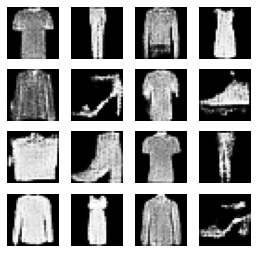

48400: [discriminator loss: 0.721069, acc: 0.484375] [adversarial loss: 0.655328, acc: 0.718750]
48401: [discriminator loss: 0.684428, acc: 0.507812] [adversarial loss: 0.737159, acc: 0.328125]
48402: [discriminator loss: 0.670477, acc: 0.570312] [adversarial loss: 0.657221, acc: 0.609375]
48403: [discriminator loss: 0.690812, acc: 0.539062] [adversarial loss: 0.772346, acc: 0.234375]
48404: [discriminator loss: 0.680356, acc: 0.562500] [adversarial loss: 0.724979, acc: 0.453125]
48405: [discriminator loss: 0.683350, acc: 0.531250] [adversarial loss: 0.686402, acc: 0.484375]
48406: [discriminator loss: 0.698564, acc: 0.507812] [adversarial loss: 0.724398, acc: 0.359375]
48407: [discriminator loss: 0.666350, acc: 0.625000] [adversarial loss: 0.738891, acc: 0.437500]
48408: [discriminator loss: 0.677295, acc: 0.554688] [adversarial loss: 0.673407, acc: 0.546875]
48409: [discriminator loss: 0.670945, acc: 0.617188] [adversarial loss: 0.742228, acc: 0.281250]
48410: [discriminator loss: 0.

48488: [discriminator loss: 0.678148, acc: 0.523438] [adversarial loss: 0.746973, acc: 0.453125]
48489: [discriminator loss: 0.681192, acc: 0.570312] [adversarial loss: 0.663424, acc: 0.578125]
48490: [discriminator loss: 0.663111, acc: 0.578125] [adversarial loss: 0.657727, acc: 0.687500]
48491: [discriminator loss: 0.697153, acc: 0.468750] [adversarial loss: 0.741008, acc: 0.296875]
48492: [discriminator loss: 0.674313, acc: 0.570312] [adversarial loss: 0.774626, acc: 0.187500]
48493: [discriminator loss: 0.677355, acc: 0.585938] [adversarial loss: 0.693253, acc: 0.515625]
48494: [discriminator loss: 0.694771, acc: 0.445312] [adversarial loss: 0.822975, acc: 0.140625]
48495: [discriminator loss: 0.681819, acc: 0.554688] [adversarial loss: 0.687837, acc: 0.500000]
48496: [discriminator loss: 0.659499, acc: 0.617188] [adversarial loss: 0.751021, acc: 0.312500]
48497: [discriminator loss: 0.687597, acc: 0.515625] [adversarial loss: 0.706426, acc: 0.437500]
48498: [discriminator loss: 0.

48573: [discriminator loss: 0.688946, acc: 0.578125] [adversarial loss: 0.714849, acc: 0.343750]
48574: [discriminator loss: 0.673860, acc: 0.562500] [adversarial loss: 0.724362, acc: 0.500000]
48575: [discriminator loss: 0.691846, acc: 0.531250] [adversarial loss: 0.733804, acc: 0.359375]
48576: [discriminator loss: 0.685288, acc: 0.593750] [adversarial loss: 0.678684, acc: 0.562500]
48577: [discriminator loss: 0.697113, acc: 0.476562] [adversarial loss: 0.797087, acc: 0.250000]
48578: [discriminator loss: 0.701302, acc: 0.554688] [adversarial loss: 0.719305, acc: 0.375000]
48579: [discriminator loss: 0.687527, acc: 0.500000] [adversarial loss: 0.778733, acc: 0.171875]
48580: [discriminator loss: 0.695187, acc: 0.507812] [adversarial loss: 0.716527, acc: 0.390625]
48581: [discriminator loss: 0.664799, acc: 0.562500] [adversarial loss: 0.698802, acc: 0.484375]
48582: [discriminator loss: 0.683497, acc: 0.554688] [adversarial loss: 0.752884, acc: 0.375000]
48583: [discriminator loss: 0.

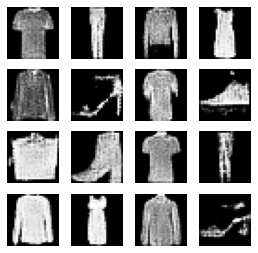

48600: [discriminator loss: 0.665347, acc: 0.570312] [adversarial loss: 0.652084, acc: 0.546875]
48601: [discriminator loss: 0.667719, acc: 0.578125] [adversarial loss: 0.790312, acc: 0.250000]
48602: [discriminator loss: 0.705057, acc: 0.515625] [adversarial loss: 0.699090, acc: 0.531250]
48603: [discriminator loss: 0.680239, acc: 0.539062] [adversarial loss: 0.686682, acc: 0.593750]
48604: [discriminator loss: 0.695393, acc: 0.507812] [adversarial loss: 0.721623, acc: 0.390625]
48605: [discriminator loss: 0.686492, acc: 0.562500] [adversarial loss: 0.674910, acc: 0.593750]
48606: [discriminator loss: 0.681766, acc: 0.546875] [adversarial loss: 0.746506, acc: 0.375000]
48607: [discriminator loss: 0.666335, acc: 0.539062] [adversarial loss: 0.747696, acc: 0.265625]
48608: [discriminator loss: 0.670172, acc: 0.554688] [adversarial loss: 0.759186, acc: 0.218750]
48609: [discriminator loss: 0.679060, acc: 0.562500] [adversarial loss: 0.690131, acc: 0.437500]
48610: [discriminator loss: 0.

48689: [discriminator loss: 0.688295, acc: 0.468750] [adversarial loss: 0.651323, acc: 0.656250]
48690: [discriminator loss: 0.688172, acc: 0.554688] [adversarial loss: 0.788628, acc: 0.218750]
48691: [discriminator loss: 0.698561, acc: 0.523438] [adversarial loss: 0.682228, acc: 0.515625]
48692: [discriminator loss: 0.690789, acc: 0.546875] [adversarial loss: 0.703110, acc: 0.500000]
48693: [discriminator loss: 0.668240, acc: 0.578125] [adversarial loss: 0.672223, acc: 0.609375]
48694: [discriminator loss: 0.674179, acc: 0.562500] [adversarial loss: 0.767827, acc: 0.265625]
48695: [discriminator loss: 0.678620, acc: 0.593750] [adversarial loss: 0.760347, acc: 0.343750]
48696: [discriminator loss: 0.693249, acc: 0.507812] [adversarial loss: 0.713577, acc: 0.468750]
48697: [discriminator loss: 0.681873, acc: 0.578125] [adversarial loss: 0.706968, acc: 0.468750]
48698: [discriminator loss: 0.671194, acc: 0.585938] [adversarial loss: 0.698611, acc: 0.484375]
48699: [discriminator loss: 0.

48775: [discriminator loss: 0.683418, acc: 0.562500] [adversarial loss: 0.742350, acc: 0.390625]
48776: [discriminator loss: 0.682658, acc: 0.554688] [adversarial loss: 0.708862, acc: 0.437500]
48777: [discriminator loss: 0.670762, acc: 0.562500] [adversarial loss: 0.813306, acc: 0.125000]
48778: [discriminator loss: 0.686955, acc: 0.539062] [adversarial loss: 0.689319, acc: 0.593750]
48779: [discriminator loss: 0.675841, acc: 0.585938] [adversarial loss: 0.689754, acc: 0.625000]
48780: [discriminator loss: 0.687018, acc: 0.539062] [adversarial loss: 0.703115, acc: 0.437500]
48781: [discriminator loss: 0.687527, acc: 0.507812] [adversarial loss: 0.677193, acc: 0.546875]
48782: [discriminator loss: 0.701851, acc: 0.453125] [adversarial loss: 0.742171, acc: 0.437500]
48783: [discriminator loss: 0.700364, acc: 0.468750] [adversarial loss: 0.796599, acc: 0.109375]
48784: [discriminator loss: 0.682882, acc: 0.562500] [adversarial loss: 0.712955, acc: 0.468750]
48785: [discriminator loss: 0.

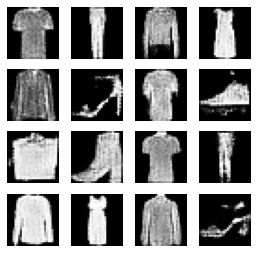

48800: [discriminator loss: 0.667354, acc: 0.601562] [adversarial loss: 0.720585, acc: 0.359375]
48801: [discriminator loss: 0.683168, acc: 0.507812] [adversarial loss: 0.692749, acc: 0.500000]
48802: [discriminator loss: 0.691537, acc: 0.500000] [adversarial loss: 0.761446, acc: 0.218750]
48803: [discriminator loss: 0.683707, acc: 0.546875] [adversarial loss: 0.647992, acc: 0.625000]
48804: [discriminator loss: 0.681532, acc: 0.578125] [adversarial loss: 0.781459, acc: 0.218750]
48805: [discriminator loss: 0.699802, acc: 0.500000] [adversarial loss: 0.719783, acc: 0.359375]
48806: [discriminator loss: 0.676055, acc: 0.539062] [adversarial loss: 0.711290, acc: 0.484375]
48807: [discriminator loss: 0.700704, acc: 0.507812] [adversarial loss: 0.769655, acc: 0.281250]
48808: [discriminator loss: 0.679517, acc: 0.601562] [adversarial loss: 0.718130, acc: 0.421875]
48809: [discriminator loss: 0.687041, acc: 0.515625] [adversarial loss: 0.787412, acc: 0.296875]
48810: [discriminator loss: 0.

48888: [discriminator loss: 0.688277, acc: 0.531250] [adversarial loss: 0.715894, acc: 0.500000]
48889: [discriminator loss: 0.677075, acc: 0.601562] [adversarial loss: 0.720581, acc: 0.390625]
48890: [discriminator loss: 0.697667, acc: 0.500000] [adversarial loss: 0.720441, acc: 0.500000]
48891: [discriminator loss: 0.675942, acc: 0.554688] [adversarial loss: 0.642958, acc: 0.718750]
48892: [discriminator loss: 0.684910, acc: 0.476562] [adversarial loss: 0.753207, acc: 0.328125]
48893: [discriminator loss: 0.670161, acc: 0.593750] [adversarial loss: 0.673759, acc: 0.640625]
48894: [discriminator loss: 0.680323, acc: 0.515625] [adversarial loss: 0.788666, acc: 0.234375]
48895: [discriminator loss: 0.689528, acc: 0.531250] [adversarial loss: 0.711971, acc: 0.500000]
48896: [discriminator loss: 0.676901, acc: 0.601562] [adversarial loss: 0.729969, acc: 0.453125]
48897: [discriminator loss: 0.678480, acc: 0.617188] [adversarial loss: 0.755517, acc: 0.312500]
48898: [discriminator loss: 0.

48974: [discriminator loss: 0.680745, acc: 0.578125] [adversarial loss: 0.678081, acc: 0.500000]
48975: [discriminator loss: 0.666346, acc: 0.578125] [adversarial loss: 0.689943, acc: 0.421875]
48976: [discriminator loss: 0.668938, acc: 0.593750] [adversarial loss: 0.678668, acc: 0.468750]
48977: [discriminator loss: 0.684889, acc: 0.523438] [adversarial loss: 0.665153, acc: 0.718750]
48978: [discriminator loss: 0.658441, acc: 0.664062] [adversarial loss: 0.666980, acc: 0.640625]
48979: [discriminator loss: 0.679816, acc: 0.578125] [adversarial loss: 0.806744, acc: 0.187500]
48980: [discriminator loss: 0.702170, acc: 0.492188] [adversarial loss: 0.622162, acc: 0.750000]
48981: [discriminator loss: 0.694446, acc: 0.492188] [adversarial loss: 0.735275, acc: 0.343750]
48982: [discriminator loss: 0.673612, acc: 0.585938] [adversarial loss: 0.698605, acc: 0.484375]
48983: [discriminator loss: 0.667714, acc: 0.593750] [adversarial loss: 0.753666, acc: 0.375000]
48984: [discriminator loss: 0.

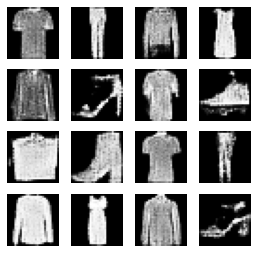

49000: [discriminator loss: 0.679938, acc: 0.570312] [adversarial loss: 0.701320, acc: 0.484375]
49001: [discriminator loss: 0.668370, acc: 0.554688] [adversarial loss: 0.808794, acc: 0.156250]
49002: [discriminator loss: 0.678248, acc: 0.570312] [adversarial loss: 0.698280, acc: 0.500000]
49003: [discriminator loss: 0.682091, acc: 0.546875] [adversarial loss: 0.724704, acc: 0.359375]
49004: [discriminator loss: 0.683491, acc: 0.523438] [adversarial loss: 0.750216, acc: 0.406250]
49005: [discriminator loss: 0.670780, acc: 0.562500] [adversarial loss: 0.786029, acc: 0.265625]
49006: [discriminator loss: 0.670296, acc: 0.601562] [adversarial loss: 0.718110, acc: 0.468750]
49007: [discriminator loss: 0.687018, acc: 0.515625] [adversarial loss: 0.754646, acc: 0.281250]
49008: [discriminator loss: 0.677852, acc: 0.562500] [adversarial loss: 0.820291, acc: 0.187500]
49009: [discriminator loss: 0.707742, acc: 0.468750] [adversarial loss: 0.664978, acc: 0.578125]
49010: [discriminator loss: 0.

49088: [discriminator loss: 0.687376, acc: 0.523438] [adversarial loss: 0.778697, acc: 0.281250]
49089: [discriminator loss: 0.673595, acc: 0.585938] [adversarial loss: 0.699305, acc: 0.625000]
49090: [discriminator loss: 0.697287, acc: 0.523438] [adversarial loss: 0.679829, acc: 0.500000]
49091: [discriminator loss: 0.690772, acc: 0.515625] [adversarial loss: 0.657199, acc: 0.687500]
49092: [discriminator loss: 0.696908, acc: 0.500000] [adversarial loss: 0.789780, acc: 0.140625]
49093: [discriminator loss: 0.687260, acc: 0.562500] [adversarial loss: 0.606081, acc: 0.843750]
49094: [discriminator loss: 0.694039, acc: 0.484375] [adversarial loss: 0.804021, acc: 0.140625]
49095: [discriminator loss: 0.707432, acc: 0.523438] [adversarial loss: 0.689331, acc: 0.531250]
49096: [discriminator loss: 0.684881, acc: 0.570312] [adversarial loss: 0.739371, acc: 0.328125]
49097: [discriminator loss: 0.670912, acc: 0.570312] [adversarial loss: 0.709724, acc: 0.468750]
49098: [discriminator loss: 0.

49175: [discriminator loss: 0.673861, acc: 0.578125] [adversarial loss: 0.687901, acc: 0.578125]
49176: [discriminator loss: 0.705784, acc: 0.507812] [adversarial loss: 0.646123, acc: 0.656250]
49177: [discriminator loss: 0.672790, acc: 0.562500] [adversarial loss: 0.741806, acc: 0.281250]
49178: [discriminator loss: 0.686995, acc: 0.578125] [adversarial loss: 0.634831, acc: 0.781250]
49179: [discriminator loss: 0.687574, acc: 0.515625] [adversarial loss: 0.743302, acc: 0.281250]
49180: [discriminator loss: 0.673232, acc: 0.593750] [adversarial loss: 0.718404, acc: 0.421875]
49181: [discriminator loss: 0.678035, acc: 0.554688] [adversarial loss: 0.629450, acc: 0.765625]
49182: [discriminator loss: 0.691124, acc: 0.515625] [adversarial loss: 0.783767, acc: 0.296875]
49183: [discriminator loss: 0.672005, acc: 0.593750] [adversarial loss: 0.640629, acc: 0.687500]
49184: [discriminator loss: 0.693688, acc: 0.507812] [adversarial loss: 0.753565, acc: 0.281250]
49185: [discriminator loss: 0.

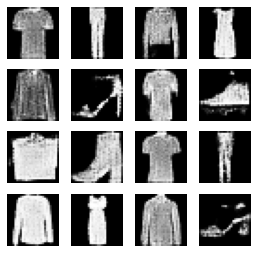

49200: [discriminator loss: 0.687410, acc: 0.539062] [adversarial loss: 0.715047, acc: 0.546875]
49201: [discriminator loss: 0.679017, acc: 0.593750] [adversarial loss: 0.684933, acc: 0.531250]
49202: [discriminator loss: 0.677749, acc: 0.523438] [adversarial loss: 0.698094, acc: 0.515625]
49203: [discriminator loss: 0.703268, acc: 0.492188] [adversarial loss: 0.881979, acc: 0.078125]
49204: [discriminator loss: 0.700364, acc: 0.515625] [adversarial loss: 0.683792, acc: 0.546875]
49205: [discriminator loss: 0.698216, acc: 0.515625] [adversarial loss: 0.827003, acc: 0.078125]
49206: [discriminator loss: 0.680319, acc: 0.546875] [adversarial loss: 0.706722, acc: 0.468750]
49207: [discriminator loss: 0.687582, acc: 0.609375] [adversarial loss: 0.752627, acc: 0.359375]
49208: [discriminator loss: 0.690593, acc: 0.507812] [adversarial loss: 0.715671, acc: 0.437500]
49209: [discriminator loss: 0.681757, acc: 0.523438] [adversarial loss: 0.756503, acc: 0.234375]
49210: [discriminator loss: 0.

49286: [discriminator loss: 0.683900, acc: 0.531250] [adversarial loss: 0.743008, acc: 0.343750]
49287: [discriminator loss: 0.699089, acc: 0.500000] [adversarial loss: 0.782893, acc: 0.250000]
49288: [discriminator loss: 0.666274, acc: 0.578125] [adversarial loss: 0.714814, acc: 0.468750]
49289: [discriminator loss: 0.687408, acc: 0.531250] [adversarial loss: 0.704852, acc: 0.468750]
49290: [discriminator loss: 0.678925, acc: 0.554688] [adversarial loss: 0.773317, acc: 0.234375]
49291: [discriminator loss: 0.691495, acc: 0.523438] [adversarial loss: 0.673649, acc: 0.625000]
49292: [discriminator loss: 0.675945, acc: 0.562500] [adversarial loss: 0.753859, acc: 0.359375]
49293: [discriminator loss: 0.693540, acc: 0.515625] [adversarial loss: 0.742166, acc: 0.359375]
49294: [discriminator loss: 0.682578, acc: 0.539062] [adversarial loss: 0.786773, acc: 0.218750]
49295: [discriminator loss: 0.675065, acc: 0.570312] [adversarial loss: 0.694540, acc: 0.500000]
49296: [discriminator loss: 0.

49371: [discriminator loss: 0.708102, acc: 0.476562] [adversarial loss: 0.810329, acc: 0.234375]
49372: [discriminator loss: 0.672899, acc: 0.625000] [adversarial loss: 0.626498, acc: 0.671875]
49373: [discriminator loss: 0.699231, acc: 0.453125] [adversarial loss: 0.792100, acc: 0.156250]
49374: [discriminator loss: 0.675730, acc: 0.578125] [adversarial loss: 0.691319, acc: 0.500000]
49375: [discriminator loss: 0.664113, acc: 0.601562] [adversarial loss: 0.686550, acc: 0.546875]
49376: [discriminator loss: 0.689739, acc: 0.500000] [adversarial loss: 0.766018, acc: 0.281250]
49377: [discriminator loss: 0.673876, acc: 0.640625] [adversarial loss: 0.714694, acc: 0.484375]
49378: [discriminator loss: 0.691651, acc: 0.554688] [adversarial loss: 0.770055, acc: 0.296875]
49379: [discriminator loss: 0.682178, acc: 0.515625] [adversarial loss: 0.704732, acc: 0.406250]
49380: [discriminator loss: 0.695780, acc: 0.546875] [adversarial loss: 0.823748, acc: 0.093750]
49381: [discriminator loss: 0.

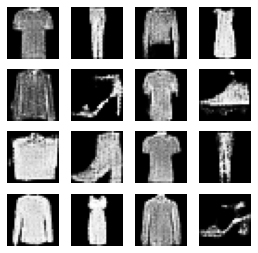

49400: [discriminator loss: 0.679324, acc: 0.593750] [adversarial loss: 0.626352, acc: 0.812500]
49401: [discriminator loss: 0.668622, acc: 0.492188] [adversarial loss: 0.696177, acc: 0.578125]
49402: [discriminator loss: 0.679892, acc: 0.570312] [adversarial loss: 0.677276, acc: 0.531250]
49403: [discriminator loss: 0.664097, acc: 0.593750] [adversarial loss: 0.815060, acc: 0.265625]
49404: [discriminator loss: 0.690659, acc: 0.554688] [adversarial loss: 0.671594, acc: 0.593750]
49405: [discriminator loss: 0.678952, acc: 0.554688] [adversarial loss: 0.779286, acc: 0.296875]
49406: [discriminator loss: 0.686443, acc: 0.554688] [adversarial loss: 0.662735, acc: 0.656250]
49407: [discriminator loss: 0.677634, acc: 0.531250] [adversarial loss: 0.736504, acc: 0.343750]
49408: [discriminator loss: 0.682950, acc: 0.554688] [adversarial loss: 0.697160, acc: 0.484375]
49409: [discriminator loss: 0.679049, acc: 0.554688] [adversarial loss: 0.667385, acc: 0.609375]
49410: [discriminator loss: 0.

49487: [discriminator loss: 0.674805, acc: 0.531250] [adversarial loss: 0.677742, acc: 0.562500]
49488: [discriminator loss: 0.703464, acc: 0.492188] [adversarial loss: 0.711540, acc: 0.515625]
49489: [discriminator loss: 0.692854, acc: 0.500000] [adversarial loss: 0.661098, acc: 0.640625]
49490: [discriminator loss: 0.659554, acc: 0.578125] [adversarial loss: 0.691444, acc: 0.515625]
49491: [discriminator loss: 0.695974, acc: 0.531250] [adversarial loss: 0.716824, acc: 0.468750]
49492: [discriminator loss: 0.688709, acc: 0.476562] [adversarial loss: 0.680148, acc: 0.562500]
49493: [discriminator loss: 0.666245, acc: 0.593750] [adversarial loss: 0.716471, acc: 0.468750]
49494: [discriminator loss: 0.697736, acc: 0.492188] [adversarial loss: 0.782305, acc: 0.234375]
49495: [discriminator loss: 0.673048, acc: 0.593750] [adversarial loss: 0.661778, acc: 0.640625]
49496: [discriminator loss: 0.692770, acc: 0.500000] [adversarial loss: 0.745944, acc: 0.390625]
49497: [discriminator loss: 0.

49576: [discriminator loss: 0.687668, acc: 0.500000] [adversarial loss: 0.758587, acc: 0.265625]
49577: [discriminator loss: 0.679534, acc: 0.578125] [adversarial loss: 0.670150, acc: 0.593750]
49578: [discriminator loss: 0.679968, acc: 0.570312] [adversarial loss: 0.646151, acc: 0.578125]
49579: [discriminator loss: 0.706424, acc: 0.531250] [adversarial loss: 0.826204, acc: 0.234375]
49580: [discriminator loss: 0.715253, acc: 0.476562] [adversarial loss: 0.609071, acc: 0.843750]
49581: [discriminator loss: 0.664679, acc: 0.609375] [adversarial loss: 0.664190, acc: 0.687500]
49582: [discriminator loss: 0.685180, acc: 0.570312] [adversarial loss: 0.754092, acc: 0.312500]
49583: [discriminator loss: 0.711012, acc: 0.468750] [adversarial loss: 0.649530, acc: 0.718750]
49584: [discriminator loss: 0.681105, acc: 0.523438] [adversarial loss: 0.781053, acc: 0.218750]
49585: [discriminator loss: 0.690244, acc: 0.554688] [adversarial loss: 0.621086, acc: 0.843750]
49586: [discriminator loss: 0.

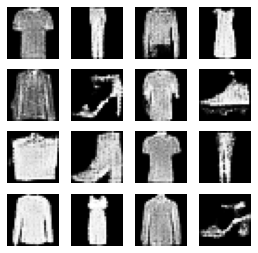

49600: [discriminator loss: 0.685031, acc: 0.570312] [adversarial loss: 0.698044, acc: 0.406250]
49601: [discriminator loss: 0.689061, acc: 0.492188] [adversarial loss: 0.723249, acc: 0.390625]
49602: [discriminator loss: 0.682636, acc: 0.492188] [adversarial loss: 0.726430, acc: 0.484375]
49603: [discriminator loss: 0.684371, acc: 0.539062] [adversarial loss: 0.807914, acc: 0.171875]
49604: [discriminator loss: 0.681525, acc: 0.570312] [adversarial loss: 0.812914, acc: 0.109375]
49605: [discriminator loss: 0.691594, acc: 0.500000] [adversarial loss: 0.603600, acc: 0.906250]
49606: [discriminator loss: 0.700112, acc: 0.531250] [adversarial loss: 0.764994, acc: 0.234375]
49607: [discriminator loss: 0.670572, acc: 0.585938] [adversarial loss: 0.775651, acc: 0.296875]
49608: [discriminator loss: 0.674477, acc: 0.554688] [adversarial loss: 0.702684, acc: 0.515625]
49609: [discriminator loss: 0.680751, acc: 0.531250] [adversarial loss: 0.772855, acc: 0.312500]
49610: [discriminator loss: 0.

49687: [discriminator loss: 0.691342, acc: 0.539062] [adversarial loss: 0.664328, acc: 0.593750]
49688: [discriminator loss: 0.686193, acc: 0.500000] [adversarial loss: 0.687506, acc: 0.468750]
49689: [discriminator loss: 0.686916, acc: 0.515625] [adversarial loss: 0.727855, acc: 0.437500]
49690: [discriminator loss: 0.697379, acc: 0.515625] [adversarial loss: 0.694274, acc: 0.546875]
49691: [discriminator loss: 0.676504, acc: 0.625000] [adversarial loss: 0.709542, acc: 0.437500]
49692: [discriminator loss: 0.675319, acc: 0.601562] [adversarial loss: 0.689059, acc: 0.578125]
49693: [discriminator loss: 0.684288, acc: 0.468750] [adversarial loss: 0.793774, acc: 0.359375]
49694: [discriminator loss: 0.680107, acc: 0.570312] [adversarial loss: 0.642919, acc: 0.671875]
49695: [discriminator loss: 0.664081, acc: 0.578125] [adversarial loss: 0.740777, acc: 0.406250]
49696: [discriminator loss: 0.697120, acc: 0.507812] [adversarial loss: 0.786695, acc: 0.187500]
49697: [discriminator loss: 0.

49776: [discriminator loss: 0.685463, acc: 0.484375] [adversarial loss: 0.811083, acc: 0.171875]
49777: [discriminator loss: 0.672105, acc: 0.601562] [adversarial loss: 0.662445, acc: 0.687500]
49778: [discriminator loss: 0.677817, acc: 0.546875] [adversarial loss: 0.662733, acc: 0.609375]
49779: [discriminator loss: 0.685840, acc: 0.515625] [adversarial loss: 0.762662, acc: 0.281250]
49780: [discriminator loss: 0.680372, acc: 0.554688] [adversarial loss: 0.667104, acc: 0.625000]
49781: [discriminator loss: 0.665204, acc: 0.570312] [adversarial loss: 0.775001, acc: 0.265625]
49782: [discriminator loss: 0.677342, acc: 0.578125] [adversarial loss: 0.754673, acc: 0.296875]
49783: [discriminator loss: 0.684297, acc: 0.585938] [adversarial loss: 0.743666, acc: 0.390625]
49784: [discriminator loss: 0.647337, acc: 0.664062] [adversarial loss: 0.784512, acc: 0.250000]
49785: [discriminator loss: 0.707426, acc: 0.476562] [adversarial loss: 0.804668, acc: 0.203125]
49786: [discriminator loss: 0.

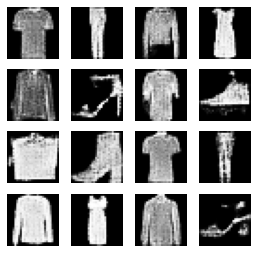

49800: [discriminator loss: 0.673462, acc: 0.625000] [adversarial loss: 0.636446, acc: 0.718750]
49801: [discriminator loss: 0.696803, acc: 0.500000] [adversarial loss: 0.794426, acc: 0.265625]
49802: [discriminator loss: 0.691674, acc: 0.531250] [adversarial loss: 0.738093, acc: 0.343750]
49803: [discriminator loss: 0.685794, acc: 0.515625] [adversarial loss: 0.602798, acc: 0.828125]
49804: [discriminator loss: 0.689351, acc: 0.468750] [adversarial loss: 0.828186, acc: 0.093750]
49805: [discriminator loss: 0.721438, acc: 0.453125] [adversarial loss: 0.732996, acc: 0.421875]
49806: [discriminator loss: 0.688439, acc: 0.531250] [adversarial loss: 0.764167, acc: 0.234375]
49807: [discriminator loss: 0.682010, acc: 0.546875] [adversarial loss: 0.726882, acc: 0.421875]
49808: [discriminator loss: 0.680081, acc: 0.585938] [adversarial loss: 0.691856, acc: 0.468750]
49809: [discriminator loss: 0.702936, acc: 0.523438] [adversarial loss: 0.738302, acc: 0.421875]
49810: [discriminator loss: 0.

49888: [discriminator loss: 0.711964, acc: 0.437500] [adversarial loss: 0.840101, acc: 0.125000]
49889: [discriminator loss: 0.674265, acc: 0.539062] [adversarial loss: 0.663736, acc: 0.593750]
49890: [discriminator loss: 0.659664, acc: 0.562500] [adversarial loss: 0.748527, acc: 0.453125]
49891: [discriminator loss: 0.665610, acc: 0.609375] [adversarial loss: 0.724579, acc: 0.500000]
49892: [discriminator loss: 0.687237, acc: 0.546875] [adversarial loss: 0.766160, acc: 0.312500]
49893: [discriminator loss: 0.673635, acc: 0.562500] [adversarial loss: 0.708165, acc: 0.468750]
49894: [discriminator loss: 0.675385, acc: 0.632812] [adversarial loss: 0.729750, acc: 0.375000]
49895: [discriminator loss: 0.671678, acc: 0.539062] [adversarial loss: 0.729756, acc: 0.468750]
49896: [discriminator loss: 0.679396, acc: 0.546875] [adversarial loss: 0.744553, acc: 0.328125]
49897: [discriminator loss: 0.681487, acc: 0.585938] [adversarial loss: 0.668998, acc: 0.609375]
49898: [discriminator loss: 0.

49976: [discriminator loss: 0.684965, acc: 0.523438] [adversarial loss: 0.812868, acc: 0.250000]
49977: [discriminator loss: 0.681210, acc: 0.562500] [adversarial loss: 0.645099, acc: 0.750000]
49978: [discriminator loss: 0.693487, acc: 0.515625] [adversarial loss: 0.733231, acc: 0.312500]
49979: [discriminator loss: 0.689458, acc: 0.539062] [adversarial loss: 0.697247, acc: 0.468750]
49980: [discriminator loss: 0.685419, acc: 0.554688] [adversarial loss: 0.710846, acc: 0.500000]
49981: [discriminator loss: 0.671073, acc: 0.539062] [adversarial loss: 0.667259, acc: 0.593750]
49982: [discriminator loss: 0.692323, acc: 0.492188] [adversarial loss: 0.759062, acc: 0.281250]
49983: [discriminator loss: 0.701165, acc: 0.515625] [adversarial loss: 0.704386, acc: 0.390625]
49984: [discriminator loss: 0.668941, acc: 0.570312] [adversarial loss: 0.718140, acc: 0.406250]
49985: [discriminator loss: 0.667686, acc: 0.609375] [adversarial loss: 0.759471, acc: 0.281250]
49986: [discriminator loss: 0.

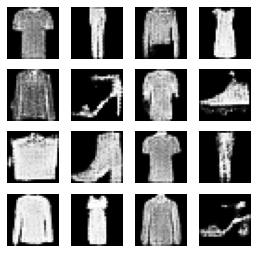

2249.4665896892548


In [14]:
import time

start = time.time()

print("The time used to execute this is given below")

end = time.time()


if __name__ == '__main__':
    build_and_train_models()

end = time.time()
    
print(end - start)

In [15]:
epoch = range(1,len(discriminator_loss)+1)  

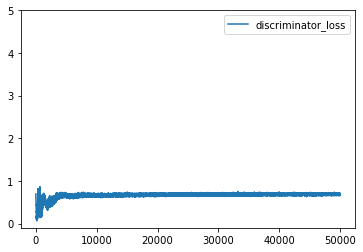

In [16]:
plt.plot(epoch,discriminator_loss)
plt.legend(['discriminator_loss'])
plt.ylim(-0.1,5)
plt.show()

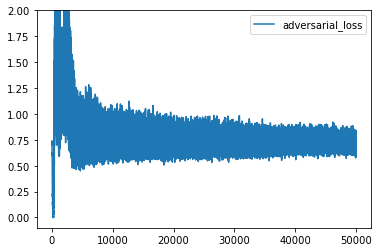

In [17]:
plt.plot(epoch,adversarial_loss)
plt.legend(['adversarial_loss'])
plt.ylim(-0.1,2)
plt.show()

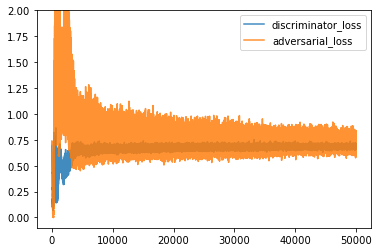

In [31]:
import matplotlib.pyplot as plt
plt.plot(epoch,discriminator_loss,epoch,adversarial_loss, alpha=0.85)
plt.legend(['discriminator_loss', 'adversarial_loss'])
plt.ylim(-0.1,2)
plt.show()